# Final Assignement

For the final assignement i was curious how unsupervised learning could help in clustering data. I was impressed of all the beautiful things that could be made by the neural networks, like deep dreaming, but i also am curious about the way deep learning can be used in science.
Another hobby of mine is astronomy and in particular i am interested in the discovery of exoplanets (planets around other stars) the last 20 years.
The exoplanets are divided in groups based on the planets oif our own solarsystem (Mercurian, Subterran, Terran, SuperTerran, Neptunian and Jovian). Off course that is what we people tend to do when we discover new worlds, fit thme in the old ones.
Maybe when a computer does the dividing in categories it comes up with a different kind of structure that is based on the data.
This is my effort to try something like that. 
First i will import different kind of things. Some of them like tensorflow and numpy i imported first and while going further in my investigation i also discovered new libraries in Python i did not know like collections and operator.

In [1]:
import tensorflow as tf
import numpy as np
import pandas as pd
import gif
from sklearn import preprocessing
from matplotlib import pyplot as plt
from collections import Counter
from operator import itemgetter


%matplotlib inline

I used a dataset which contains a Mass Class variable that has allready divided the mass of the planets in groups 
compared with the planets in our own solarsystem (Jovian, Neptunian, Superterran, Terran, SubTerran an Mercurian. So i can compare the classification that the network makes (if at all possible) with this classification. I will put the database in the zip file. But you can download it yourself, because almost every day there are more exoplanets discovered.
download from http://phl.upr.edu/projects/habitable-exoplanets-catalog/data/database
The database exists out of 65 variables. I only needed a couple of them. So i deleted the ones i did not need and made a new database out of the variables i needed.
What variables i did use?
Only those who are obtained directly by observation. Not the ones that are derives from them.

# If you doubleclick on this field you will see the names as a table!!

This are the variables of the database.
 #	 Field Name	            Description	Units
 01	 P. Name	            Planet name.	 
 02	 P. Name Kepler	        Planet NASA Kepler name, if applicable.	 
 03	 P. Name KOI	        Planet NASA Kepler Object of Interest (KOI) name, if applicable.	 
 04	 P. Zone Class	        Planet habitable zone classification (hot, warm, or cold).	 
 05	 P. Mass Class	        Planet Mass Class (mercurian, subterran, terran, superterran, neptunian, or jovian)
 06	 P. Composition Class	Planet Composition Class (iron, rocky-iron, rocky-water, water-gas, gas).	 
 07	 P. Atmosphere Class	Planet Atmosphere Class (none, metals-rich, hydrogen-rich).	 
 08	 P. Habitable Class	    Planet Habitable Class (mesoplanet, thermoplanet, psychroplanet, hypopsychroplanet,                                 hyperthermoplanet, non-habitable).	 
 09	 P. Min Mass	        Planet minimum mass.	Earth Units, EU
 10	 P. Mass	            Planet mass. Most of the values were estimated from minimum mass.	Earth Units, EU
 11	 P. Max Mass	        Planet maximum mass.	Earth Units, EU
 12	 P. Radius	            Planet radius. Most of these values were estimated for confirmed planets.	Earth                                    Units, EU
 13	 P. Density	            Planet density.	Earth Units, EU
 14	 P. Gravity	            Planet gravity.	Earth Units, EU
 15	 P. Esc Vel	            Planet escape velocity.	Earth Units, EU
 16	 P. SFlux Min	        Planet minimum stellar flux.	Earth Units, EU
 17	 P. SFlux Mean	        Planet mean stellar flux.	Earth Units, EU
 18	 P. SFlux Max	        Planet maximum stellar flux.	Earth Units, EU
 19	 P. Teq Min	            Planet minimum equilibrium temperature (at apastron).	Kelvins, K
 20	 P. Teq Mean	        Planet mean equilibrium temperature.	Kelvins, K
 21	 P. Teq Max	            Planet maximum equilibrium temperature (at periastron).	Kelvins, K
 22	 P. Ts Min	            Planet minimum surface temperature (at apastron).	Kelvins, K
 23	 P. Ts Mean	            Planet mean surface temperature.	Kelvins, K
 24	 P. Ts Max	            Planet maximum surface temperature (at periastron).	Kelvins, K
 25	 P. Surf Press	        Planet surface pressure.	Earth Units, EU
 26	 P. Mag	Planet          magnitude as seen from a Moon-Earth distance (Moon = -12.7).	
 27	 P. Appar Size	        Planet apparent size as seen from a Moon-Earth distance (Moon = 0.5°).	degrees
 28	 P. Period	Planet      period.	days
 29	 P. Sem Major Axis	    Planet semi major axis.	Astr. Units, AU
 30	 P. Eccentricity	    Planet eccentricity (assumed 0 when not available).	
 31	 P. Mean Distance       Planet mean distance from the star.	Astr. Units, AU
 32	 P. Inclination	        Planet inclination (assumed 60° when not available, and 90° for Kepler data).	degrees
 33	 P. Omega	            Planet omega.	degrees
 34	 S. Name	            Star name.	
 35	 S. Name HD	            Star name from the Henry Draper Star Catalog.	 
 36	 S. Name HIP	        Star name from the Hipparchus Star Catalog.	 
 37	 S. Constellation	    Star constellation name (abbreviated).	 
 38	 S. Type	            Star type.	
 39	 S. Mass	            Star mass.	Solar Units, SU
 40	 S. Radius	            Star radius.	Solar Units, SU
 41	 S. Teff	            Star effective temperature.	Solar Units, SU
 42	 S. Luminosity	        Star luminosity.	Solar Units, SU
 43	 S. [Fe/H]	            Star iron to hydrogen ratio [Fe/H].	
 44	 S. Age	Star age.	    Billion Years, Gyrs
 45	 S. Appar Mag	        Star apparent visual magnitude from Earth.	
 46	 S. Distance	        Star distance from Earth.	parsec, pc
 47	 S. RA	Star            right ascension.	degrees
 48	 S. DEC	Star            declination.	    degrees
 49	 S. Mag from Planet	    Star apparent visual magnitude from planet (Sun = -25 from Earth).	
 50	 S. Size from Planet	Star apparent size from planet (Sun = 0.5° from Earth).	degrees
 51	 S. No. Planets	        Star number of planets.	 
 52	 S. No. Planets	        Star number of planets in the habitable zone.	 
 53	 S. Hab Zone Min	    Star inner edge of habitable zone.	Astr. Units, AU
 54	 S. Hab Zone Max	    Star outer edge of habitable zone.	Astr. Units, AU
 55	 P. HZD	Planet          Habitable Zone Distance (HZD).	
 56	 P. HZC	Planet          Habitable Zone Composition (HZD).	
 57	 P. HZA	Planet          Habitable Zone Atmosphere (HZD).	
 58	 P. HZI	Planet          Habitable Zone Index (HZI).	 
 59	 P. SPH	                Planet Standard Primary Habitability (SPH).	
 60	 P. Int ESI	            Planet Interior Earth Similarity Index (iESI).	
 61	 P. Surf ESI	        Planet Surface Earth Similarity Index (sESI).	
 62	 P. ESI	                Planet Earth Similarity Index (ESI).	
 63	 S. HabCat	            Star is in the HabCat database.	FLAG = 0 or 1
 64	 P. Habitable	        Planet is potentially habitable.	FLAG = 0 or 1 
 65	 P. Hab Moon	        Planet is candidate for potential habitable exomoons.	FLAG = 0 or 1
 66	 P. Confirmed	        Planet is confirmed (relevant to the Kepler data).	FLAG = 0 or 1
 67	 P. Disc. Method	    Planet discovery method (rv = radial velocity, tran = transiting, ima = imaging, micro =                           micro lensing, pul = pulsar timing, ast = astrometry).	 
 68	 P. Disc. Year	        Planet discovery year.	 

I used the following variables and changed there names because in the origin names blanks and () are used and that leads to trouble in Python.

PmassEU            Planet Mass in comparison with Earth Mass (=1.0)
PradiusEU          Planet Radius in comparison with radius of the Earth(1.0)
PdensityEU         Density of the planet in comparison with density of the Earth(1.0)
PgravityEU         Gravity of the planet in comparison with gravity of the Eartg(1.0)
PfluxMeanEU        Flux of the planet is comparison to the Earth (1.0)	
PteqMeanK	       Mean equilibrium of the planet in degrees Kelvin
PsurfPressEU       Pressure on the surface in comparison to the Earth(1.0)
Pmag	           Magnitude from the planet as seen from distance moon Earth (0.5 degeers is magnitude moon seen                      from Earth)
PperiodDYS         Orbital period from planet in days
SmassSU            Mass hoststar compared to the sun (1.0)
SradiusSU          Radius from hoststar in comparison with the sun (1.0)	
SteffK             Temperature of the hoststar in degrees Kelvin
SluminositySU      Luminosity of the hoststar compared to the sun (1.0)
SsizefromPlanetDEG Size from the hoststar seen from the planet in  degrees.








In [2]:
#read the database (take care the database is in the same map as the notebook)
data = pd.read_csv('Exoplanetsconf.csv', low_memory=False)

# the number of rows and of columns
data=data.dropna()
print (len(data)) #number of observations (rows)
print (len(data.columns)) # number of variables (columns)"


3418
13


In [3]:
# Normalize data between 0-1

x = data.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
datanorm = x_scaled

/home/leolin/anaconda3/envs/tensorflow/lib/python3.6/site-packages/sklearn/utils/validation.py:590: DataConversionWarning: Data with input dtype object was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


# Neural Network

It took some time and some searching on the internet to decide which network can best be used. At last i stumbled upon the "selforganised maps" also known as the Kohonen maps. https://en.wikipedia.org/wiki/Self-organizing_map
and http://ieeexplore.ieee.org/document/58325/
This kind of networks can be used to find structures in data that is not labeled. 
The idea of this network is that it learns by 'competitive learning'.
Because there is no labeling there is no cost function. What happens is that the output layer has the number of neurons equal to the number of groups you want to divide the data in (off course you often dont know how many groups is best, but you can try different number of groups and see what number of groups is most meaningfull)
You can put the output neurons in a 2D layer, so later you can make a map of the data in 2D.
At first all the weights get random numbers, the first inputvector is put in the network and one of the output neurons scores the best. This neuron gets the inputvector assigned to it. The weights are changed so that that vector has more change to get an inputvector assigned that is like the first one. The other weights are changed so that all the other neurons have less chance to get the same kind of vector assigned. So  all inputvectors  go to through the network several times. The data is more and more centered around the neurons (centroïds).
The input and outputvectors are fully connected and there are no hidden layers. A very simple and understandable network so.
On this adress i found https://codesachin.wordpress.com/2015/11/28/self-organizing-maps-with-googles-tensorflow/
code for a SOM (selforganising network). I had to change it for my own use, but i used most of the code you see below from that pages. Thanks to Sachlin Joglekar !
With the comments it is not hard to understand.
I added the last three methods myself to make it possible to plot figures and do a reseach on the different groups.


In [4]:
imgs=[]
 
class SOM(object):
    """
    2-D Self-Organizing Map with Gaussian Neighbourhood function
    and linearly decreasing learning rate.
    """
 
    #To check if the SOM has been trained
    _trained = False
 
    def __init__(self, m, n, dim, n_iterations=100, alpha=None, sigma=None):
        """
        Initializes all necessary components of the TensorFlow
        Graph.
 
        m X n are the dimensions of the SOM. 'n_iterations' should
        should be an integer denoting the number of iterations undergone
        while training.
        'dim' is the dimensionality of the training inputs.
        'alpha' is a number denoting the initial time(iteration no)-based
        learning rate. Default value is 0.3
        'sigma' is the the initial neighbourhood value, denoting
        the radius of influence of the BMU while training. By default, its
        taken to be half of max(m, n).
        """
 
        #Assign required variables first
        self._m = m
        self._n = n
        imgs=[]
        if alpha is None:
            alpha = 0.3
        else:
            alpha = float(alpha)
        if sigma is None:
            sigma = max(m, n) / 2.0
        else:
            sigma = float(sigma)
        self._n_iterations = abs(int(n_iterations))
 
        ##INITIALIZE GRAPH
        self._graph = tf.Graph()
 
        ##POPULATE GRAPH WITH NECESSARY COMPONENTS
        with self._graph.as_default():
 
            ##VARIABLES AND CONSTANT OPS FOR DATA STORAGE
 
            #Randomly initialized weightage vectors for all neurons,
            #stored together as a matrix Variable of size [m*n, dim]
        #HERE i used random_uniform instead of random_normal in the original code.(LB)
            self._weightage_vects = tf.Variable(tf.random_uniform(
                [m*n, dim]))
            
            #Matrix of size [m*n, 2] for SOM grid locations
            #of neurons
            self._location_vects = tf.constant(np.array(
                list(self._neuron_locations(m, n))))
 
            ##PLACEHOLDERS FOR TRAINING INPUTS
            #We need to assign them as attributes to self, since they
            #will be fed in during training
 
            #The training vector
            self._vect_input = tf.placeholder("float32", [dim])
            #Iteration number
            self._iter_input = tf.placeholder("float32")
 
            ##CONSTRUCT TRAINING OP PIECE BY PIECE
            #Only the final, 'root' training op needs to be assigned as
            #an attribute to self, since all the rest will be executed
            #automatically during training
 
            #To compute the Best Matching Unit given a vector
            #Basically calculates the Euclidean distance between every
            #neuron's weightage vector and the input, and returns the
            #index of the neuron which gives the least value
            bmu_index = tf.argmin(tf.sqrt(tf.reduce_sum(
                tf.pow(tf.subtract(self._weightage_vects, tf.stack(
                    [self._vect_input for i in range(m*n)])), 2), 1)),
                                  0)
 
            #This will extract the location of the BMU based on the BMU's
            #index
            slice_input = tf.pad(tf.reshape(bmu_index, [1]),
                                 np.array([[0, 1]], dtype= 'int64'))
            bmu_loc = tf.reshape(tf.slice(self._location_vects, slice_input,
                                          tf.constant(np.array([1, 2], dtype='int64'))),
                                 [2])
 
            #To compute the alpha and sigma values based on iteration
            #number
            learning_rate_op = tf.subtract(1.0, tf.divide(self._iter_input,
                                                  self._n_iterations))
            _alpha_op = tf.multiply(alpha, learning_rate_op)
            _sigma_op = tf.multiply(sigma, learning_rate_op)
 
            #Construct the op that will generate a vector with learning
            #rates for all neurons, based on iteration number and location
            #wrt BMU.
            bmu_distance_squares = tf.reduce_sum(tf.pow(tf.subtract(
                self._location_vects, tf.stack(
                    [bmu_loc for i in range(m*n)])), 2), 1)
            neighbourhood_func = tf.exp(tf.negative(tf.divide(tf.cast(
                bmu_distance_squares, "float32"), tf.pow(_sigma_op, 2))))
            learning_rate_op = tf.multiply(_alpha_op, neighbourhood_func)
 
            #Finally, the op that will use learning_rate_op to update
            #the weightage vectors of all neurons based on a particular
            #input
            learning_rate_multiplier = tf.stack([tf.tile(tf.slice(
                learning_rate_op, np.array([i]), np.array([1])), [dim])
                                               for i in range(m*n)])
            weightage_delta = tf.multiply(
                learning_rate_multiplier,
                tf.subtract(tf.stack([self._vect_input for i in range(m*n)]),
                       self._weightage_vects))                                         
            new_weightages_op = tf.add(self._weightage_vects,
                                       weightage_delta)
            self._training_op = tf.assign(self._weightage_vects,
                                          new_weightages_op)                                       
 
            ##INITIALIZE SESSION
            self._sess = tf.Session()
 
            ##INITIALIZE VARIABLES
            init_op = tf.global_variables_initializer()
            self._sess.run(init_op)
 
    def _neuron_locations(self, m, n):
        """
        Yields one by one the 2-D locations of the individual neurons
        in the SOM.
        """
        #Nested iterations over both dimensions
        #to generate all 2-D locations in the map
        for i in range(m):
            for j in range(n):
                yield np.array([i, j])
 
    def train(self, input_vects):
        """
        Trains the SOM.
        'input_vects' should be an iterable of 1-D NumPy arrays with
        dimensionality as provided during initialization of this SOM.
        Current weightage vectors for all neurons(initially random) are
        taken as starting conditions for training.
        """
 
        #Training iterations
        for iter_no in range(self._n_iterations):
            print(iter_no)
            if (iter_no % 1==0) & (iter_no>0) :
                
                self.map_plot(iter_no)
            centroid_grid = [[] for i in range(self._m)]
            self._weightages = list(self._sess.run(self._weightage_vects))
            self._locations = list(self._sess.run(self._location_vects))
            
            for i, loc in enumerate(self._locations):
                centroid_grid[loc[0]].append(self._weightages[i])
            self._centroid_grid = centroid_grid        
            
            #Train with each vector one by one
            for input_vect in input_vects:
                self._sess.run(self._training_op,
                               feed_dict={self._vect_input: input_vect,
                                          self._iter_input: iter_no})
        print(iter_no)
        self.map_plot(iter_no)                              
        self._trained = True
        gif.build_gif(imgs, saveto='exoplaneta005s6 .gif')
        
        
    def get_centroids(self):
        """
        Returns a list of 'm' lists, with each inner list containing
        the 'n' corresponding centroid locations as 1-D NumPy arrays.
        """
        if not self._trained:
            raise ValueError("SOM not trained yet")
        return self._centroid_grid
 
    def map_vects(self, input_vects):
        """
        Maps each input vector to the relevant neuron in the SOM
        grid.
        'input_vects' should be an iterable of 1-D NumPy arrays with
        dimensionality as provided during initialization of this SOM.
        Returns a list of 1-D NumPy arrays containing (row, column)
        info for each input vector(in the same order), corresponding
        to mapped neuron.
        """

        if not self._trained:
            raise ValueError("SOM not trained yet")
 
        to_return = []
        for vect in input_vects:
            min_index = min([i for i in range(len(self._weightages))],
                            key=lambda x: np.linalg.norm(vect-
                                                         self._weightages[x]))
            to_return.append(self._locations[min_index])
 
        return to_return
# I  asserted this code to make the SOM draw a map of the groups every 10 iterations.
# the size of the red circles are the size of the different groups.
    def map_plot(self, iter_no):
        """
        Makes a plot of the groups found. Plots groups as a circle. Radius circle is size group.   
        """
        
        m = self._m
        n = self._n
        plt.figure()
        label=np.zeros(m*n)
        self._trained = True
        mapped = self.map_vects(datanorm)
        mapped=tuple(map(tuple, mapped))
        c=Counter(mapped)
        
        c= sorted(c.items(), key=itemgetter(1))
        a=[m*n]
        for i in range(0,len(c)):
            x=(((c[i])[0])[0])
            y=(((c[i])[0])[1])
            z=((c[i])[1])
            plt.plot(x, y, 'ro', markersize= z/(2*m*n))  
        plt.savefig('exoplanet{}.png'.format(iter_no))
        p=plt.imread('exoplanet{}.png'.format(iter_no))
        imgs.append(p)
        plt.show()
        plt.close()
        print(c)
        self._trained = False
        
    
    def group_matrix(self, group):
        """
        Makes a plot.scatter of group in (). Shows all variables plot to another.  
        """
        mapped = self.map_vects(datanorm)
        mappednp= np.array(mapped)
        groups= mappednp[:,0]
        data['Group'] = pd.Series(groups, index=data.index)
        pd.scatter_matrix(data[data['Group']==group], alpha = 0.3, figsize = (28,28));
        
    def group_describe(self, group):
        """
        Describes group in (). Uses pd.describe(). Gives Mean, std, min, max and 25,75,75%   
        """
        mapped = self.map_vects(datanorm)
        mappednp= np.array(mapped)
        
        groups= mappednp[:,0]
        data['Group'] = pd.Series(groups, index=data.index)
        print(data[data['Group']==group].describe())
        

Here i train the network in a grid of 12 x 1 (so 12 possible groups) 13 is the dimension of the inputvector 
(13 variables) and the last number is the number of iterations. I also experimented with the alpha and the 
sigma, because with the Every iteration a new map is drawn and at 
the end a gif called 'exogif.gif' is made 

0
1


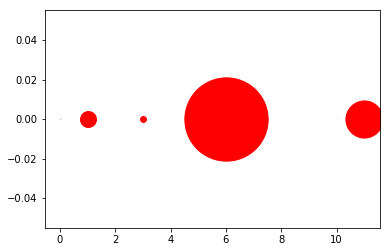

[((10, 0), 1), ((0, 0), 3), ((3, 0), 141), ((1, 0), 383), ((11, 0), 891), ((6, 0), 1999)]
2


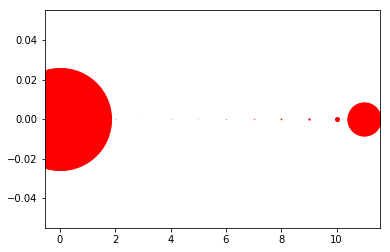

[((3, 0), 1), ((5, 0), 2), ((1, 0), 2), ((4, 0), 3), ((2, 0), 4), ((6, 0), 5), ((7, 0), 8), ((8, 0), 16), ((9, 0), 31), ((10, 0), 96), ((11, 0), 799), ((0, 0), 2451)]
3


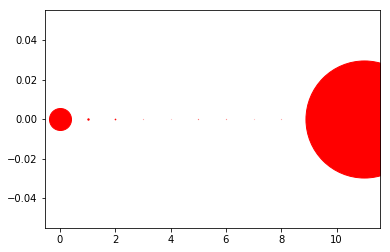

[((4, 0), 2), ((7, 0), 2), ((9, 0), 3), ((3, 0), 3), ((8, 0), 3), ((6, 0), 4), ((5, 0), 5), ((10, 0), 9), ((2, 0), 16), ((1, 0), 33), ((0, 0), 528), ((11, 0), 2810)]
4


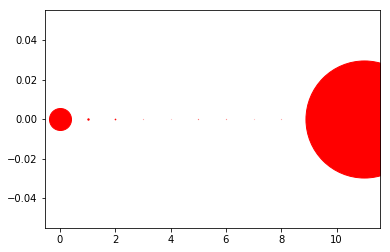

[((4, 0), 2), ((7, 0), 2), ((9, 0), 3), ((3, 0), 3), ((8, 0), 3), ((6, 0), 4), ((5, 0), 5), ((10, 0), 9), ((2, 0), 16), ((1, 0), 33), ((0, 0), 528), ((11, 0), 2810)]
5


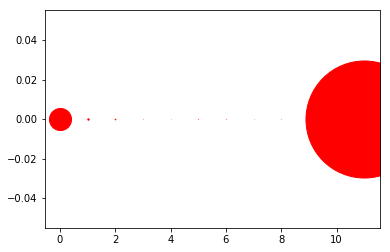

[((4, 0), 2), ((7, 0), 2), ((9, 0), 3), ((3, 0), 3), ((8, 0), 3), ((6, 0), 4), ((5, 0), 5), ((10, 0), 9), ((2, 0), 16), ((1, 0), 33), ((0, 0), 529), ((11, 0), 2809)]
6


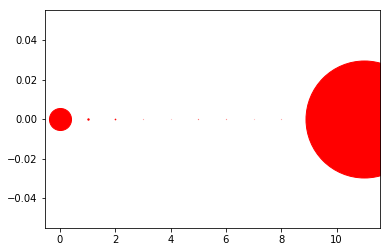

[((4, 0), 2), ((7, 0), 2), ((9, 0), 3), ((3, 0), 3), ((8, 0), 3), ((6, 0), 4), ((5, 0), 5), ((10, 0), 10), ((2, 0), 16), ((1, 0), 33), ((0, 0), 529), ((11, 0), 2808)]
7


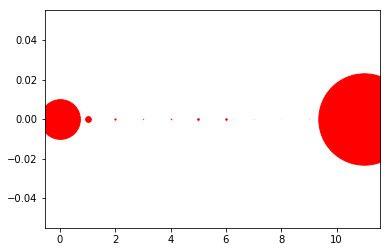

[((8, 0), 1), ((9, 0), 2), ((7, 0), 2), ((10, 0), 6), ((3, 0), 8), ((4, 0), 13), ((2, 0), 29), ((6, 0), 36), ((5, 0), 38), ((1, 0), 137), ((0, 0), 953), ((11, 0), 2193)]
8


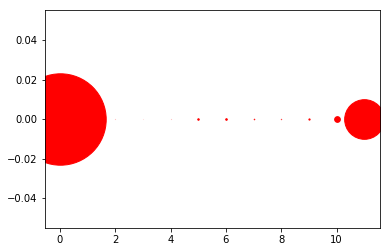

[((3, 0), 1), ((2, 0), 2), ((4, 0), 2), ((1, 0), 6), ((8, 0), 8), ((7, 0), 13), ((9, 0), 29), ((5, 0), 36), ((6, 0), 38), ((10, 0), 137), ((11, 0), 952), ((0, 0), 2194)]
9


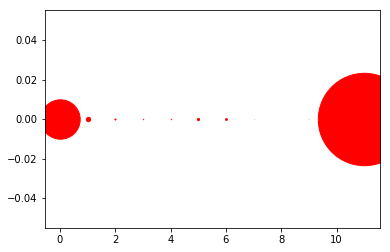

[((9, 0), 2), ((7, 0), 2), ((10, 0), 6), ((3, 0), 10), ((4, 0), 11), ((2, 0), 25), ((6, 0), 44), ((5, 0), 52), ((1, 0), 104), ((0, 0), 945), ((11, 0), 2217)]
10


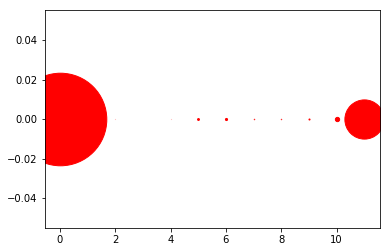

[((2, 0), 2), ((4, 0), 2), ((1, 0), 6), ((8, 0), 10), ((7, 0), 11), ((9, 0), 25), ((5, 0), 45), ((6, 0), 51), ((10, 0), 103), ((11, 0), 941), ((0, 0), 2222)]
11


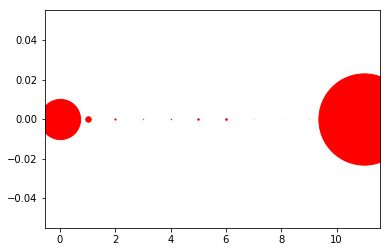

[((8, 0), 1), ((9, 0), 2), ((7, 0), 2), ((10, 0), 6), ((3, 0), 8), ((4, 0), 12), ((2, 0), 28), ((5, 0), 35), ((6, 0), 38), ((1, 0), 131), ((0, 0), 965), ((11, 0), 2190)]
12


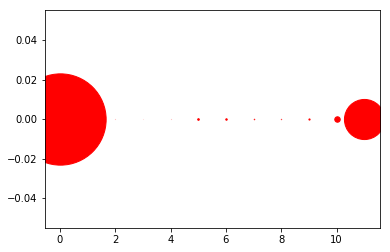

[((3, 0), 1), ((2, 0), 2), ((4, 0), 2), ((1, 0), 6), ((8, 0), 8), ((7, 0), 12), ((9, 0), 28), ((6, 0), 35), ((5, 0), 39), ((10, 0), 131), ((11, 0), 963), ((0, 0), 2191)]
13


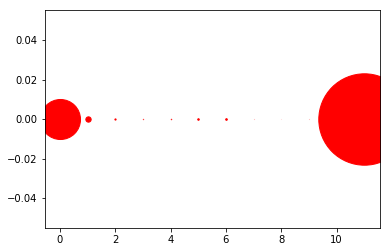

[((8, 0), 1), ((9, 0), 2), ((7, 0), 2), ((10, 0), 6), ((3, 0), 8), ((4, 0), 11), ((2, 0), 29), ((5, 0), 37), ((6, 0), 39), ((1, 0), 128), ((0, 0), 961), ((11, 0), 2194)]
14


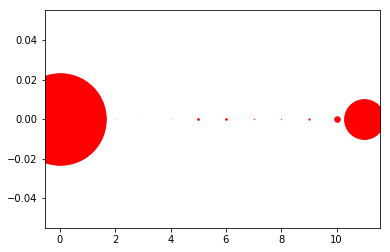

[((3, 0), 1), ((2, 0), 2), ((4, 0), 2), ((1, 0), 6), ((8, 0), 8), ((7, 0), 11), ((9, 0), 29), ((6, 0), 37), ((5, 0), 39), ((10, 0), 131), ((11, 0), 955), ((0, 0), 2197)]
15


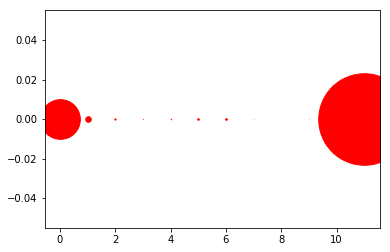

[((8, 0), 1), ((9, 0), 2), ((7, 0), 2), ((10, 0), 6), ((3, 0), 7), ((4, 0), 12), ((2, 0), 29), ((5, 0), 37), ((6, 0), 39), ((1, 0), 133), ((0, 0), 953), ((11, 0), 2197)]
16


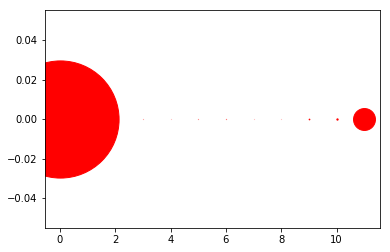

[((7, 0), 2), ((8, 0), 2), ((4, 0), 2), ((2, 0), 3), ((3, 0), 3), ((5, 0), 4), ((6, 0), 5), ((1, 0), 11), ((9, 0), 17), ((10, 0), 31), ((11, 0), 526), ((0, 0), 2812)]
17


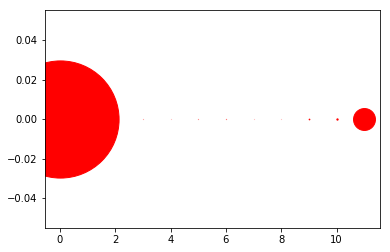

[((7, 0), 2), ((8, 0), 2), ((4, 0), 2), ((2, 0), 3), ((3, 0), 3), ((5, 0), 4), ((6, 0), 5), ((1, 0), 11), ((9, 0), 17), ((10, 0), 31), ((11, 0), 526), ((0, 0), 2812)]
18


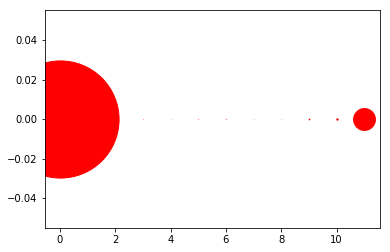

[((7, 0), 2), ((8, 0), 2), ((4, 0), 2), ((2, 0), 3), ((3, 0), 3), ((5, 0), 4), ((6, 0), 5), ((1, 0), 11), ((9, 0), 17), ((10, 0), 32), ((11, 0), 525), ((0, 0), 2812)]
19


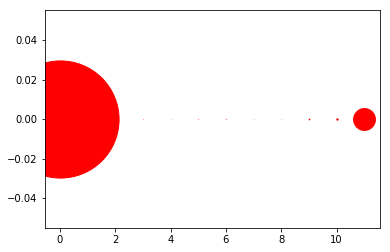

[((7, 0), 2), ((8, 0), 2), ((4, 0), 2), ((2, 0), 3), ((3, 0), 3), ((5, 0), 4), ((6, 0), 5), ((1, 0), 11), ((9, 0), 17), ((10, 0), 32), ((11, 0), 525), ((0, 0), 2812)]
20


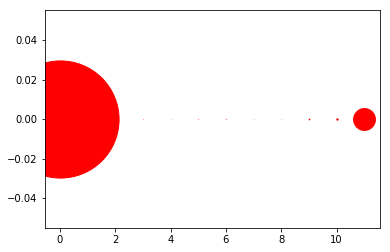

[((7, 0), 2), ((8, 0), 2), ((4, 0), 2), ((2, 0), 3), ((3, 0), 3), ((5, 0), 4), ((6, 0), 5), ((1, 0), 11), ((9, 0), 17), ((10, 0), 32), ((11, 0), 525), ((0, 0), 2812)]
21


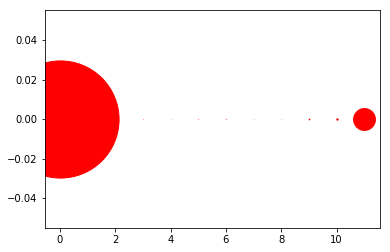

[((7, 0), 2), ((8, 0), 2), ((4, 0), 2), ((2, 0), 3), ((3, 0), 3), ((5, 0), 4), ((6, 0), 5), ((1, 0), 11), ((9, 0), 17), ((10, 0), 32), ((11, 0), 525), ((0, 0), 2812)]
22


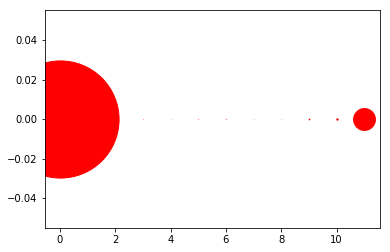

[((7, 0), 2), ((8, 0), 2), ((4, 0), 2), ((2, 0), 3), ((3, 0), 3), ((5, 0), 4), ((6, 0), 5), ((1, 0), 11), ((9, 0), 17), ((10, 0), 32), ((11, 0), 525), ((0, 0), 2812)]
23


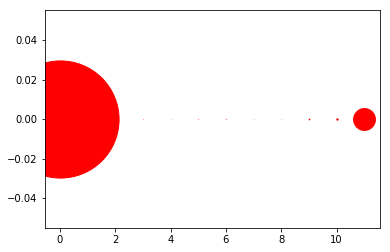

[((7, 0), 2), ((8, 0), 2), ((4, 0), 2), ((2, 0), 3), ((3, 0), 3), ((5, 0), 4), ((6, 0), 5), ((1, 0), 11), ((9, 0), 17), ((10, 0), 32), ((11, 0), 525), ((0, 0), 2812)]
24


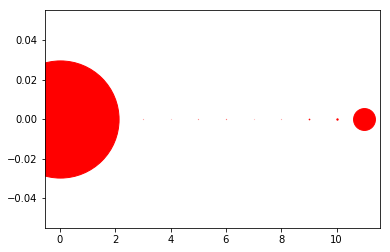

[((7, 0), 2), ((4, 0), 2), ((2, 0), 3), ((8, 0), 3), ((3, 0), 3), ((5, 0), 4), ((6, 0), 5), ((1, 0), 11), ((9, 0), 16), ((10, 0), 32), ((11, 0), 525), ((0, 0), 2812)]
25


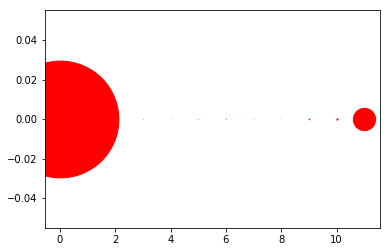

[((7, 0), 2), ((8, 0), 2), ((4, 0), 2), ((2, 0), 3), ((3, 0), 3), ((5, 0), 4), ((6, 0), 5), ((1, 0), 13), ((9, 0), 17), ((10, 0), 29), ((11, 0), 535), ((0, 0), 2803)]
26


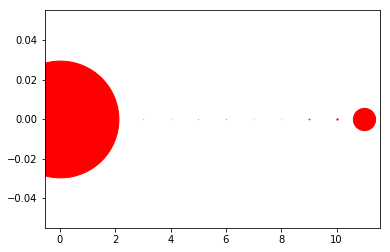

[((7, 0), 2), ((8, 0), 2), ((4, 0), 2), ((2, 0), 3), ((3, 0), 3), ((5, 0), 4), ((6, 0), 5), ((1, 0), 13), ((9, 0), 17), ((10, 0), 30), ((11, 0), 534), ((0, 0), 2803)]
27


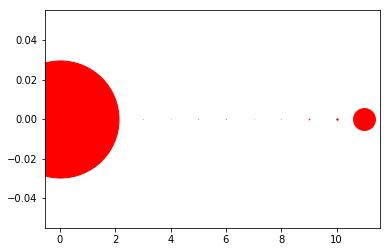

[((7, 0), 2), ((4, 0), 2), ((2, 0), 3), ((8, 0), 3), ((3, 0), 3), ((5, 0), 4), ((6, 0), 5), ((1, 0), 12), ((9, 0), 16), ((10, 0), 33), ((11, 0), 525), ((0, 0), 2810)]
28


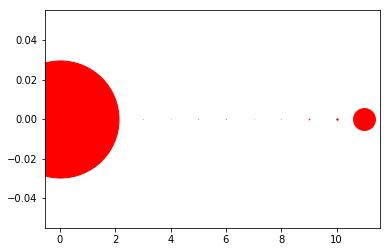

[((7, 0), 2), ((4, 0), 2), ((2, 0), 3), ((8, 0), 3), ((3, 0), 3), ((5, 0), 4), ((6, 0), 5), ((1, 0), 12), ((9, 0), 16), ((10, 0), 33), ((11, 0), 525), ((0, 0), 2810)]
29


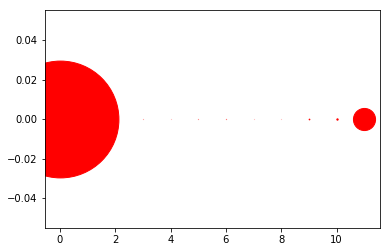

[((7, 0), 2), ((8, 0), 2), ((4, 0), 2), ((3, 0), 3), ((2, 0), 4), ((5, 0), 4), ((6, 0), 5), ((1, 0), 12), ((9, 0), 17), ((10, 0), 32), ((11, 0), 531), ((0, 0), 2804)]
30


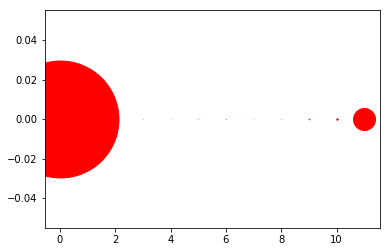

[((7, 0), 2), ((4, 0), 2), ((2, 0), 3), ((8, 0), 3), ((3, 0), 3), ((5, 0), 4), ((6, 0), 5), ((1, 0), 13), ((9, 0), 16), ((10, 0), 33), ((11, 0), 527), ((0, 0), 2807)]
31


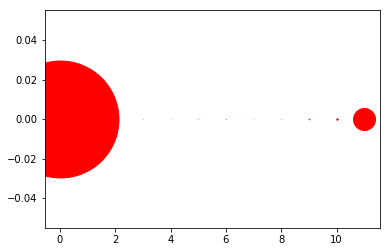

[((7, 0), 2), ((4, 0), 2), ((2, 0), 3), ((8, 0), 3), ((3, 0), 3), ((5, 0), 4), ((6, 0), 5), ((1, 0), 13), ((9, 0), 16), ((10, 0), 33), ((11, 0), 527), ((0, 0), 2807)]
32


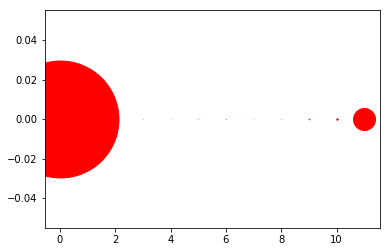

[((7, 0), 2), ((4, 0), 2), ((2, 0), 3), ((8, 0), 3), ((3, 0), 3), ((5, 0), 4), ((6, 0), 5), ((1, 0), 13), ((9, 0), 16), ((10, 0), 33), ((11, 0), 527), ((0, 0), 2807)]
33


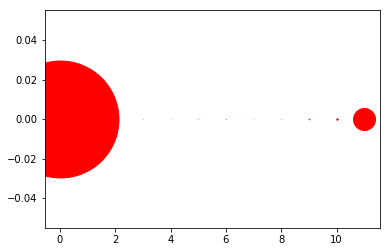

[((7, 0), 2), ((4, 0), 2), ((8, 0), 3), ((3, 0), 3), ((2, 0), 4), ((5, 0), 4), ((6, 0), 5), ((1, 0), 12), ((9, 0), 16), ((10, 0), 33), ((11, 0), 527), ((0, 0), 2807)]
34


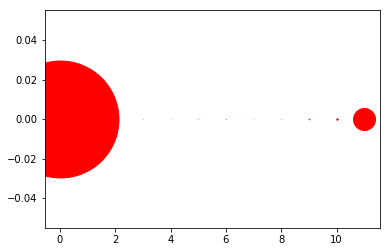

[((7, 0), 2), ((4, 0), 2), ((8, 0), 3), ((3, 0), 3), ((2, 0), 4), ((5, 0), 4), ((6, 0), 5), ((1, 0), 12), ((9, 0), 16), ((10, 0), 33), ((11, 0), 527), ((0, 0), 2807)]
35


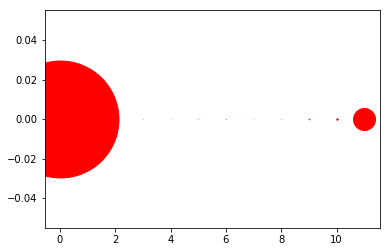

[((7, 0), 2), ((4, 0), 2), ((8, 0), 3), ((3, 0), 3), ((2, 0), 4), ((5, 0), 4), ((6, 0), 5), ((1, 0), 12), ((9, 0), 16), ((10, 0), 33), ((11, 0), 527), ((0, 0), 2807)]
36


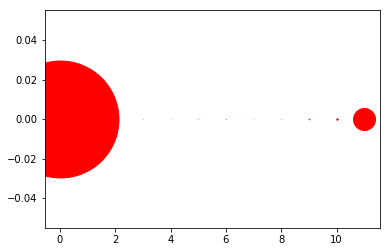

[((7, 0), 2), ((4, 0), 2), ((8, 0), 3), ((3, 0), 3), ((2, 0), 4), ((5, 0), 4), ((6, 0), 5), ((1, 0), 12), ((9, 0), 16), ((10, 0), 33), ((11, 0), 527), ((0, 0), 2807)]
37


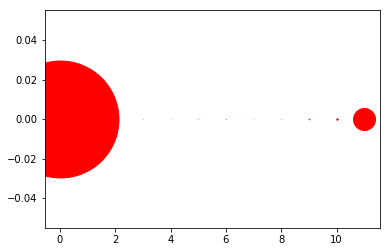

[((7, 0), 2), ((4, 0), 2), ((8, 0), 3), ((3, 0), 3), ((2, 0), 4), ((5, 0), 4), ((6, 0), 5), ((1, 0), 12), ((9, 0), 16), ((10, 0), 33), ((11, 0), 527), ((0, 0), 2807)]
38


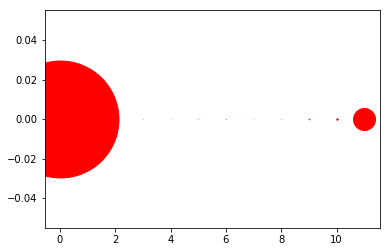

[((7, 0), 2), ((4, 0), 2), ((8, 0), 3), ((3, 0), 3), ((2, 0), 4), ((5, 0), 4), ((6, 0), 5), ((1, 0), 12), ((9, 0), 16), ((10, 0), 33), ((11, 0), 527), ((0, 0), 2807)]
39


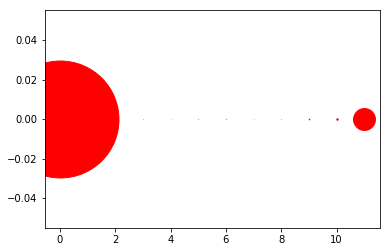

[((7, 0), 2), ((4, 0), 2), ((8, 0), 3), ((3, 0), 3), ((2, 0), 4), ((5, 0), 4), ((6, 0), 5), ((1, 0), 12), ((9, 0), 16), ((10, 0), 34), ((11, 0), 526), ((0, 0), 2807)]
40


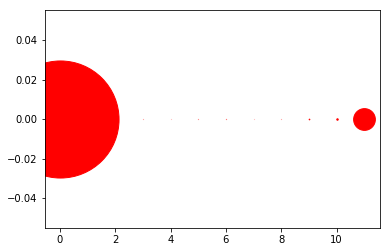

[((7, 0), 2), ((4, 0), 2), ((8, 0), 3), ((3, 0), 3), ((2, 0), 4), ((5, 0), 4), ((6, 0), 5), ((1, 0), 12), ((9, 0), 16), ((10, 0), 35), ((11, 0), 522), ((0, 0), 2810)]
41


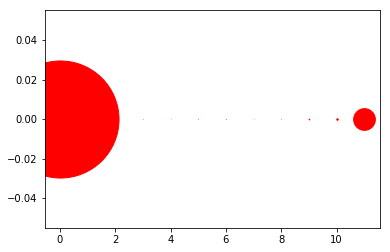

[((7, 0), 2), ((4, 0), 2), ((8, 0), 3), ((3, 0), 3), ((2, 0), 4), ((5, 0), 4), ((6, 0), 5), ((1, 0), 12), ((9, 0), 16), ((10, 0), 36), ((11, 0), 521), ((0, 0), 2810)]
42


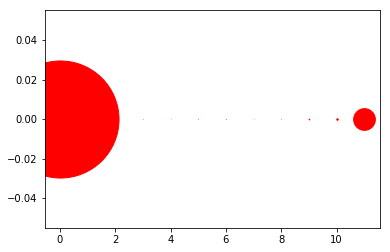

[((7, 0), 2), ((4, 0), 2), ((8, 0), 3), ((3, 0), 3), ((2, 0), 4), ((5, 0), 4), ((6, 0), 5), ((1, 0), 12), ((9, 0), 16), ((10, 0), 36), ((11, 0), 521), ((0, 0), 2810)]
43


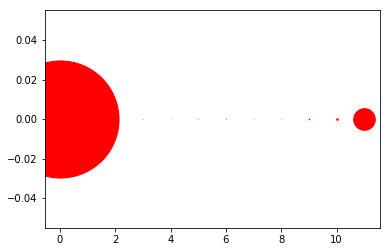

[((7, 0), 2), ((4, 0), 2), ((8, 0), 3), ((3, 0), 3), ((2, 0), 4), ((5, 0), 4), ((6, 0), 5), ((1, 0), 12), ((9, 0), 16), ((10, 0), 37), ((11, 0), 519), ((0, 0), 2811)]
44


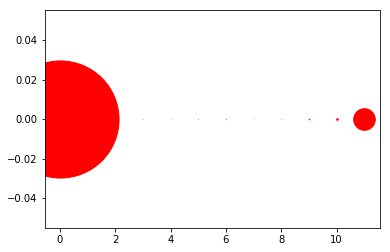

[((7, 0), 2), ((4, 0), 2), ((8, 0), 3), ((3, 0), 3), ((2, 0), 4), ((5, 0), 4), ((6, 0), 5), ((1, 0), 12), ((9, 0), 16), ((10, 0), 38), ((11, 0), 518), ((0, 0), 2811)]
45


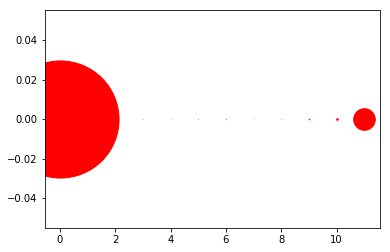

[((7, 0), 2), ((4, 0), 2), ((8, 0), 3), ((3, 0), 3), ((2, 0), 4), ((5, 0), 4), ((6, 0), 5), ((1, 0), 12), ((9, 0), 16), ((10, 0), 38), ((11, 0), 518), ((0, 0), 2811)]
46


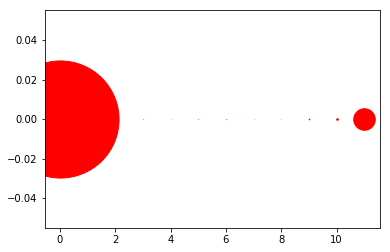

[((7, 0), 2), ((4, 0), 2), ((2, 0), 3), ((8, 0), 3), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((1, 0), 12), ((9, 0), 16), ((10, 0), 39), ((11, 0), 517), ((0, 0), 2811)]
47


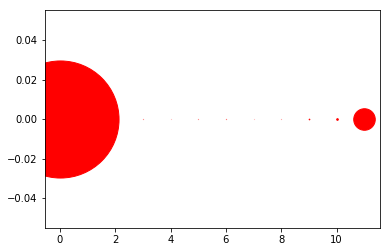

[((7, 0), 2), ((4, 0), 2), ((2, 0), 3), ((8, 0), 3), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((1, 0), 13), ((9, 0), 16), ((10, 0), 39), ((11, 0), 517), ((0, 0), 2810)]
48


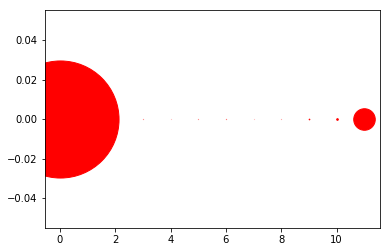

[((7, 0), 2), ((4, 0), 2), ((8, 0), 3), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((1, 0), 12), ((9, 0), 16), ((10, 0), 39), ((11, 0), 517), ((0, 0), 2810)]
49


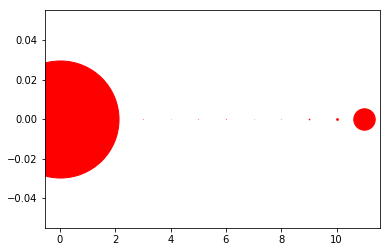

[((7, 0), 2), ((4, 0), 2), ((8, 0), 3), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((1, 0), 12), ((9, 0), 16), ((10, 0), 41), ((11, 0), 515), ((0, 0), 2810)]
50


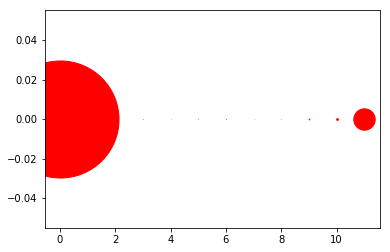

[((7, 0), 2), ((4, 0), 2), ((8, 0), 3), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((1, 0), 12), ((9, 0), 16), ((10, 0), 42), ((11, 0), 514), ((0, 0), 2810)]
51


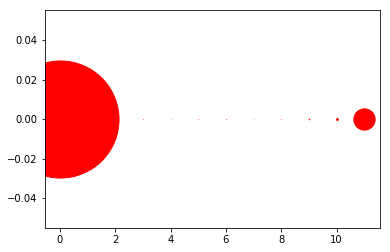

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((8, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((1, 0), 12), ((9, 0), 15), ((10, 0), 45), ((11, 0), 511), ((0, 0), 2810)]
52


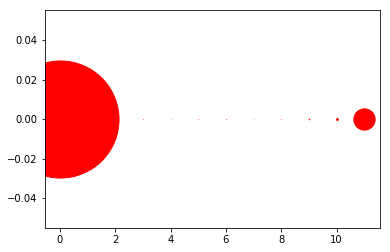

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((8, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((1, 0), 12), ((9, 0), 15), ((10, 0), 45), ((11, 0), 511), ((0, 0), 2810)]
53


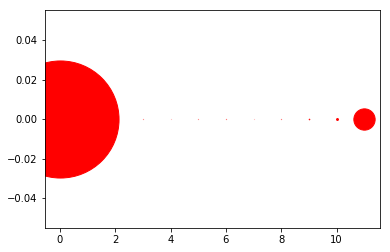

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 12), ((9, 0), 14), ((10, 0), 45), ((11, 0), 511), ((0, 0), 2810)]
54


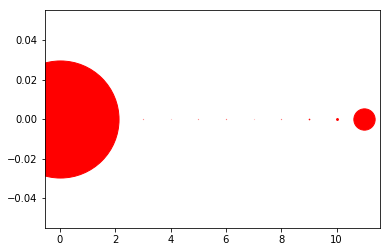

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 12), ((9, 0), 15), ((10, 0), 44), ((11, 0), 511), ((0, 0), 2810)]
55


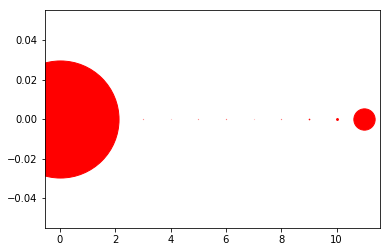

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 12), ((9, 0), 15), ((10, 0), 44), ((11, 0), 511), ((0, 0), 2810)]
56


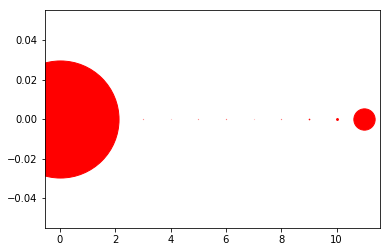

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 12), ((9, 0), 15), ((10, 0), 44), ((11, 0), 511), ((0, 0), 2810)]
57


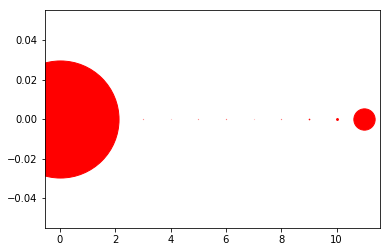

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 12), ((9, 0), 15), ((10, 0), 44), ((11, 0), 511), ((0, 0), 2810)]
58


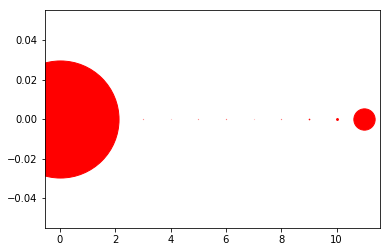

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 12), ((9, 0), 15), ((10, 0), 44), ((11, 0), 511), ((0, 0), 2810)]
59


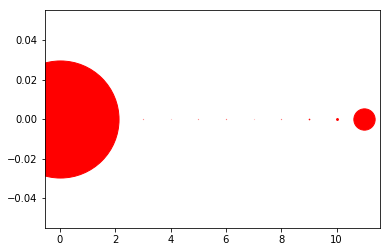

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 12), ((9, 0), 15), ((10, 0), 44), ((11, 0), 511), ((0, 0), 2810)]
60


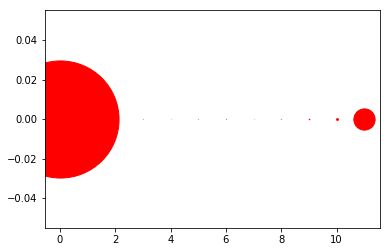

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 12), ((9, 0), 15), ((10, 0), 44), ((11, 0), 510), ((0, 0), 2811)]
61


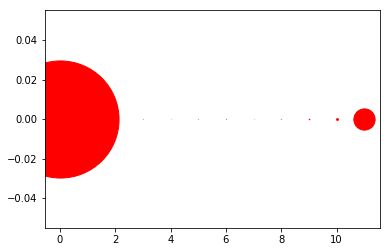

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 12), ((9, 0), 15), ((10, 0), 44), ((11, 0), 510), ((0, 0), 2811)]
62


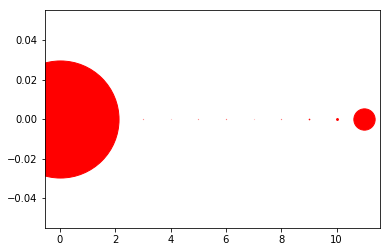

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 12), ((9, 0), 15), ((10, 0), 44), ((11, 0), 511), ((0, 0), 2810)]
63


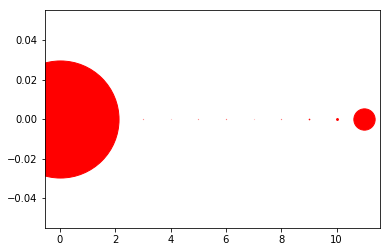

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 12), ((9, 0), 15), ((10, 0), 44), ((11, 0), 511), ((0, 0), 2810)]
64


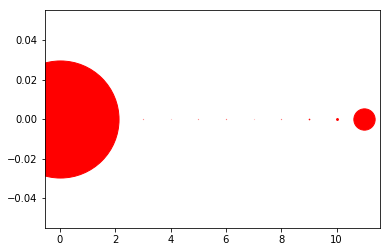

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 12), ((9, 0), 15), ((10, 0), 44), ((11, 0), 511), ((0, 0), 2810)]
65


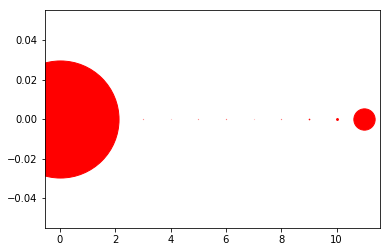

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 12), ((9, 0), 15), ((10, 0), 44), ((11, 0), 511), ((0, 0), 2810)]
66


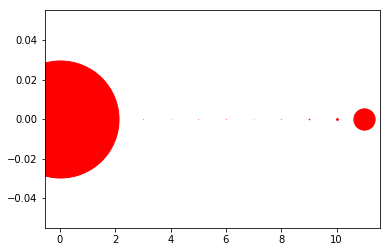

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 13), ((9, 0), 15), ((10, 0), 44), ((11, 0), 511), ((0, 0), 2809)]
67


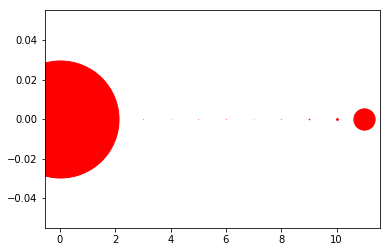

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 13), ((9, 0), 15), ((10, 0), 44), ((11, 0), 511), ((0, 0), 2809)]
68


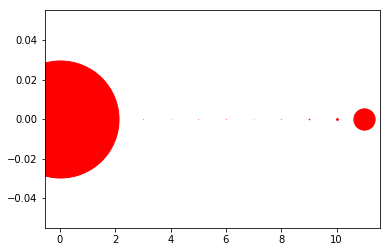

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 13), ((9, 0), 15), ((10, 0), 44), ((11, 0), 511), ((0, 0), 2809)]
69


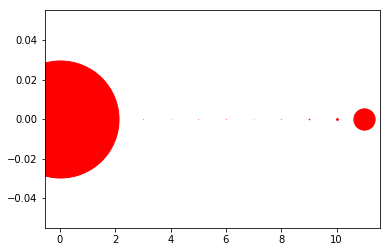

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 13), ((9, 0), 15), ((10, 0), 44), ((11, 0), 511), ((0, 0), 2809)]
70


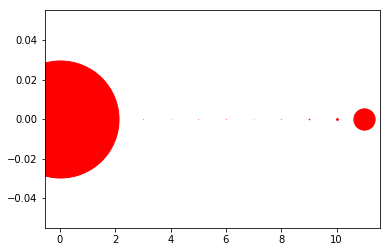

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 13), ((9, 0), 15), ((10, 0), 44), ((11, 0), 511), ((0, 0), 2809)]
71


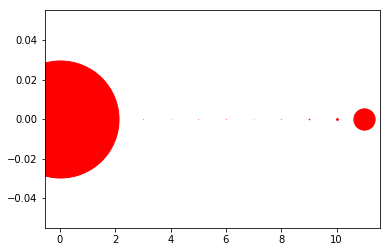

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 13), ((9, 0), 15), ((10, 0), 44), ((11, 0), 511), ((0, 0), 2809)]
72


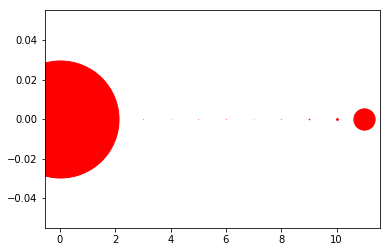

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 13), ((9, 0), 15), ((10, 0), 44), ((11, 0), 511), ((0, 0), 2809)]
73


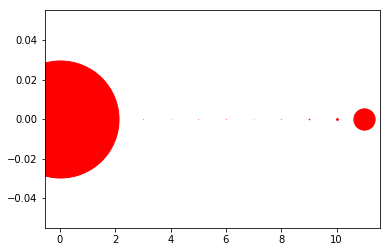

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 13), ((9, 0), 15), ((10, 0), 44), ((11, 0), 511), ((0, 0), 2809)]
74


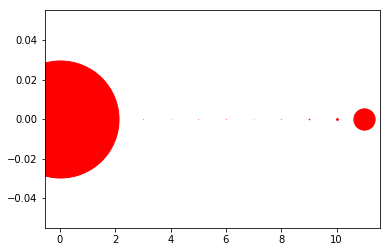

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 13), ((9, 0), 15), ((10, 0), 44), ((11, 0), 511), ((0, 0), 2809)]
75


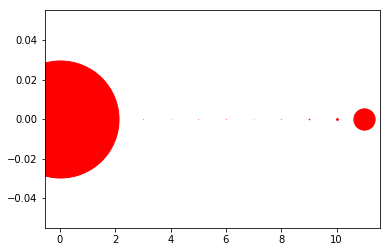

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 13), ((9, 0), 15), ((10, 0), 44), ((11, 0), 511), ((0, 0), 2809)]
76


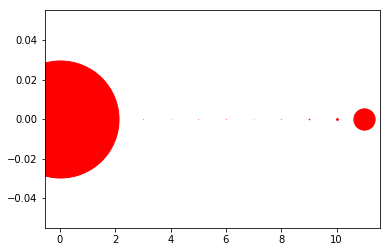

[((7, 0), 2), ((4, 0), 2), ((2, 0), 4), ((3, 0), 4), ((5, 0), 4), ((6, 0), 5), ((8, 0), 5), ((1, 0), 13), ((9, 0), 15), ((10, 0), 44), ((11, 0), 511), ((0, 0), 2809)]
77


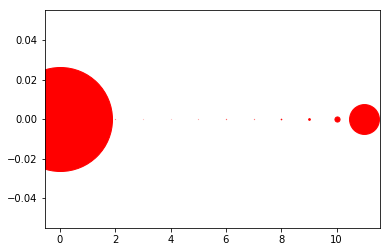

[((3, 0), 2), ((4, 0), 2), ((5, 0), 3), ((1, 0), 4), ((2, 0), 4), ((7, 0), 5), ((6, 0), 6), ((8, 0), 15), ((9, 0), 41), ((10, 0), 123), ((11, 0), 717), ((0, 0), 2496)]
78


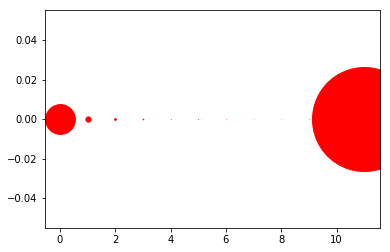

[((8, 0), 2), ((7, 0), 2), ((6, 0), 3), ((10, 0), 4), ((9, 0), 4), ((4, 0), 5), ((5, 0), 6), ((3, 0), 15), ((2, 0), 41), ((1, 0), 125), ((0, 0), 715), ((11, 0), 2496)]
79


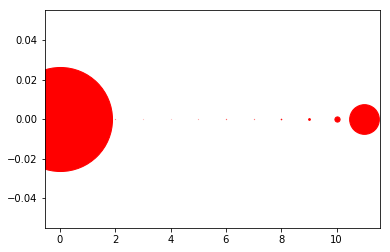

[((3, 0), 2), ((4, 0), 2), ((5, 0), 3), ((2, 0), 4), ((7, 0), 5), ((1, 0), 5), ((6, 0), 6), ((8, 0), 14), ((9, 0), 42), ((10, 0), 125), ((11, 0), 713), ((0, 0), 2497)]
80


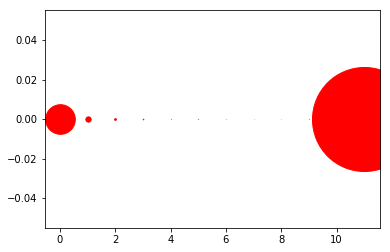

[((8, 0), 2), ((7, 0), 2), ((6, 0), 3), ((10, 0), 4), ((4, 0), 5), ((9, 0), 5), ((5, 0), 6), ((3, 0), 14), ((2, 0), 42), ((1, 0), 127), ((0, 0), 711), ((11, 0), 2497)]
81


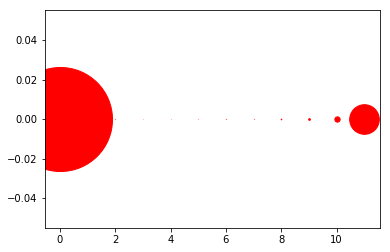

[((3, 0), 2), ((4, 0), 2), ((5, 0), 3), ((1, 0), 4), ((7, 0), 5), ((2, 0), 5), ((6, 0), 6), ((8, 0), 15), ((9, 0), 41), ((10, 0), 127), ((11, 0), 711), ((0, 0), 2497)]
82


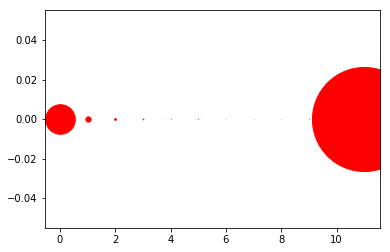

[((8, 0), 2), ((7, 0), 2), ((6, 0), 3), ((10, 0), 4), ((4, 0), 5), ((9, 0), 5), ((5, 0), 6), ((3, 0), 15), ((2, 0), 42), ((1, 0), 126), ((0, 0), 710), ((11, 0), 2498)]
83


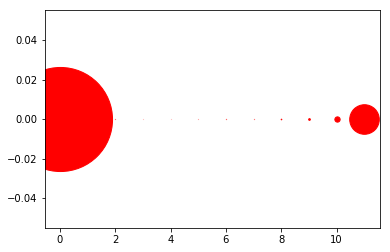

[((3, 0), 2), ((4, 0), 2), ((5, 0), 3), ((1, 0), 4), ((7, 0), 5), ((2, 0), 5), ((6, 0), 6), ((8, 0), 15), ((9, 0), 41), ((10, 0), 127), ((11, 0), 710), ((0, 0), 2498)]
84


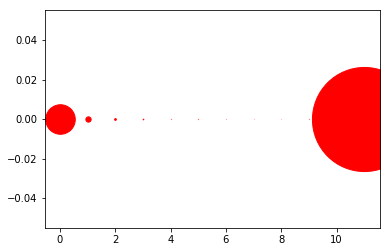

[((8, 0), 2), ((7, 0), 2), ((6, 0), 3), ((10, 0), 4), ((4, 0), 5), ((9, 0), 5), ((5, 0), 6), ((3, 0), 15), ((2, 0), 41), ((1, 0), 127), ((0, 0), 709), ((11, 0), 2499)]
85


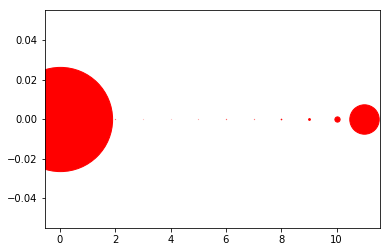

[((3, 0), 2), ((4, 0), 2), ((5, 0), 3), ((1, 0), 4), ((7, 0), 5), ((2, 0), 5), ((6, 0), 6), ((8, 0), 15), ((9, 0), 43), ((10, 0), 126), ((11, 0), 706), ((0, 0), 2501)]
86


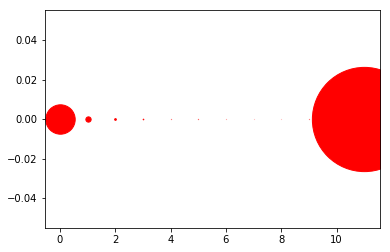

[((8, 0), 2), ((7, 0), 2), ((6, 0), 3), ((10, 0), 4), ((4, 0), 5), ((9, 0), 5), ((5, 0), 6), ((3, 0), 15), ((2, 0), 41), ((1, 0), 127), ((0, 0), 706), ((11, 0), 2502)]
87


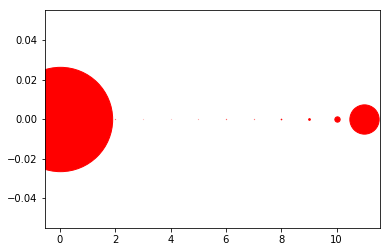

[((3, 0), 2), ((4, 0), 2), ((5, 0), 3), ((1, 0), 4), ((7, 0), 5), ((2, 0), 5), ((6, 0), 6), ((8, 0), 15), ((9, 0), 41), ((10, 0), 128), ((11, 0), 703), ((0, 0), 2504)]
88


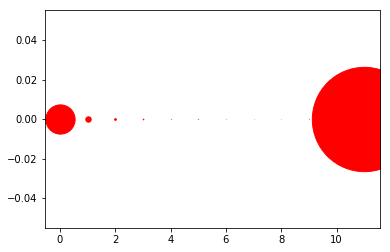

[((8, 0), 2), ((7, 0), 2), ((6, 0), 3), ((10, 0), 4), ((4, 0), 5), ((9, 0), 5), ((5, 0), 6), ((3, 0), 15), ((2, 0), 41), ((1, 0), 129), ((0, 0), 702), ((11, 0), 2504)]
89


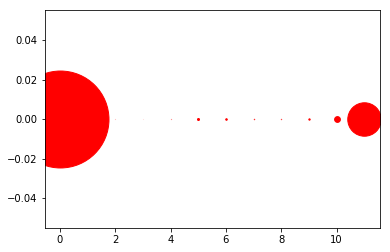

[((3, 0), 1), ((2, 0), 2), ((4, 0), 4), ((1, 0), 7), ((8, 0), 8), ((7, 0), 10), ((9, 0), 32), ((6, 0), 37), ((5, 0), 48), ((10, 0), 139), ((11, 0), 803), ((0, 0), 2327)]
90


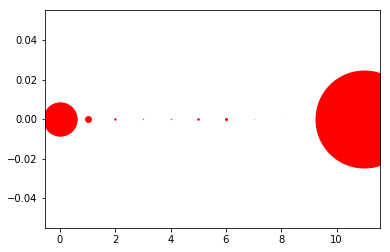

[((8, 0), 1), ((9, 0), 2), ((7, 0), 4), ((10, 0), 7), ((3, 0), 8), ((4, 0), 10), ((2, 0), 32), ((5, 0), 37), ((6, 0), 48), ((1, 0), 140), ((0, 0), 800), ((11, 0), 2329)]
91


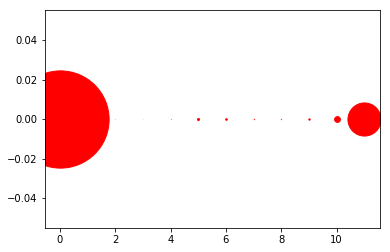

[((3, 0), 1), ((2, 0), 2), ((4, 0), 4), ((1, 0), 7), ((8, 0), 8), ((7, 0), 10), ((9, 0), 32), ((6, 0), 38), ((5, 0), 48), ((10, 0), 139), ((11, 0), 795), ((0, 0), 2334)]
92


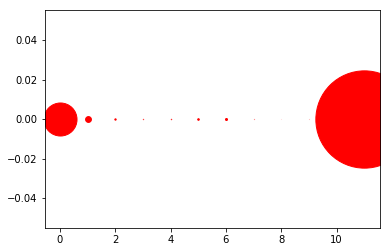

[((8, 0), 1), ((9, 0), 2), ((7, 0), 4), ((10, 0), 7), ((3, 0), 8), ((4, 0), 10), ((2, 0), 32), ((5, 0), 38), ((6, 0), 48), ((1, 0), 140), ((0, 0), 793), ((11, 0), 2335)]
93


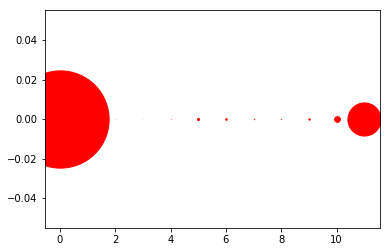

[((3, 0), 1), ((2, 0), 2), ((4, 0), 4), ((1, 0), 7), ((8, 0), 8), ((7, 0), 10), ((9, 0), 32), ((6, 0), 37), ((5, 0), 49), ((10, 0), 138), ((11, 0), 795), ((0, 0), 2335)]
94


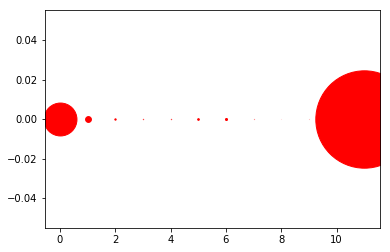

[((8, 0), 1), ((9, 0), 2), ((7, 0), 4), ((10, 0), 7), ((4, 0), 8), ((3, 0), 8), ((2, 0), 32), ((5, 0), 40), ((6, 0), 49), ((1, 0), 140), ((0, 0), 790), ((11, 0), 2337)]
95


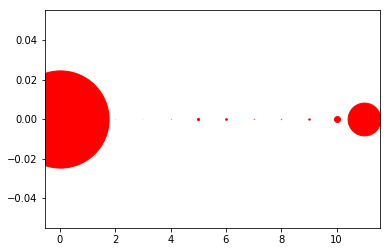

[((3, 0), 1), ((2, 0), 2), ((4, 0), 4), ((7, 0), 7), ((1, 0), 7), ((8, 0), 8), ((9, 0), 34), ((6, 0), 40), ((5, 0), 51), ((10, 0), 144), ((11, 0), 787), ((0, 0), 2333)]
96


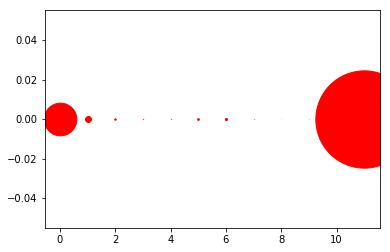

[((8, 0), 1), ((9, 0), 2), ((7, 0), 4), ((4, 0), 7), ((10, 0), 7), ((3, 0), 8), ((2, 0), 35), ((5, 0), 41), ((6, 0), 51), ((1, 0), 142), ((0, 0), 784), ((11, 0), 2336)]
97


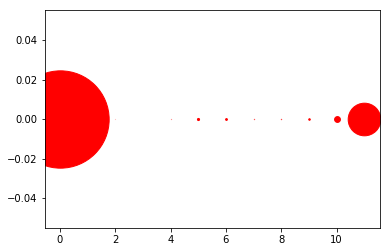

[((2, 0), 2), ((4, 0), 4), ((7, 0), 7), ((1, 0), 7), ((8, 0), 8), ((9, 0), 37), ((6, 0), 43), ((5, 0), 51), ((10, 0), 140), ((11, 0), 783), ((0, 0), 2336)]
98


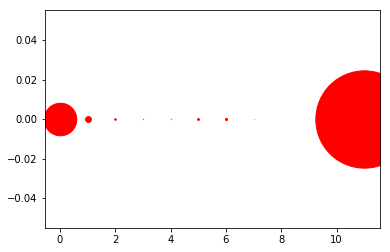

[((9, 0), 2), ((7, 0), 4), ((4, 0), 7), ((10, 0), 7), ((3, 0), 8), ((2, 0), 37), ((5, 0), 44), ((6, 0), 51), ((1, 0), 140), ((0, 0), 782), ((11, 0), 2336)]
99


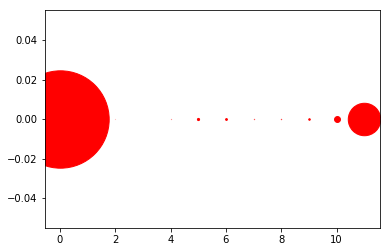

[((2, 0), 2), ((4, 0), 4), ((7, 0), 7), ((1, 0), 7), ((8, 0), 8), ((9, 0), 37), ((6, 0), 43), ((5, 0), 52), ((10, 0), 142), ((11, 0), 779), ((0, 0), 2337)]
100


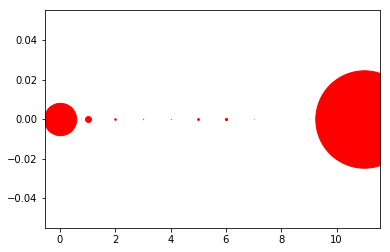

[((9, 0), 2), ((7, 0), 4), ((4, 0), 7), ((10, 0), 7), ((3, 0), 8), ((2, 0), 37), ((5, 0), 43), ((6, 0), 52), ((1, 0), 143), ((0, 0), 777), ((11, 0), 2338)]
101


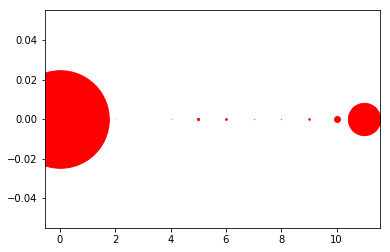

[((2, 0), 2), ((4, 0), 4), ((7, 0), 7), ((1, 0), 7), ((8, 0), 8), ((9, 0), 36), ((6, 0), 41), ((5, 0), 53), ((10, 0), 143), ((11, 0), 775), ((0, 0), 2342)]
102


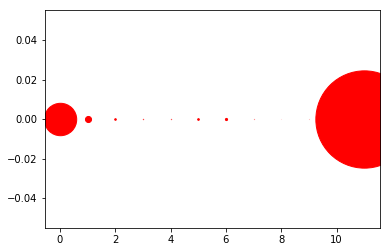

[((8, 0), 1), ((9, 0), 2), ((7, 0), 4), ((4, 0), 7), ((10, 0), 7), ((3, 0), 8), ((2, 0), 38), ((5, 0), 40), ((6, 0), 52), ((1, 0), 146), ((0, 0), 778), ((11, 0), 2335)]
103


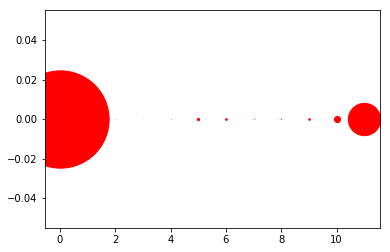

[((3, 0), 1), ((2, 0), 2), ((4, 0), 4), ((7, 0), 7), ((1, 0), 7), ((8, 0), 8), ((9, 0), 38), ((6, 0), 39), ((5, 0), 53), ((10, 0), 147), ((11, 0), 776), ((0, 0), 2336)]
104


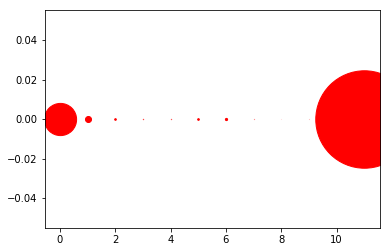

[((8, 0), 1), ((9, 0), 2), ((7, 0), 4), ((4, 0), 7), ((10, 0), 7), ((3, 0), 8), ((2, 0), 39), ((5, 0), 40), ((6, 0), 53), ((1, 0), 145), ((0, 0), 773), ((11, 0), 2339)]
105


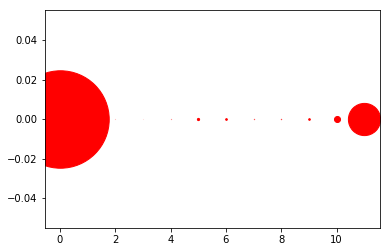

[((3, 0), 1), ((2, 0), 2), ((4, 0), 4), ((7, 0), 7), ((1, 0), 7), ((8, 0), 8), ((9, 0), 39), ((6, 0), 40), ((5, 0), 53), ((10, 0), 145), ((11, 0), 773), ((0, 0), 2339)]
106


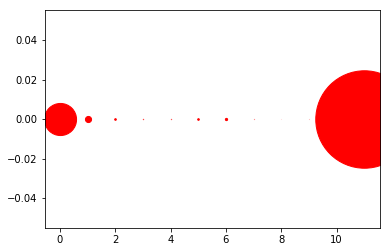

[((8, 0), 1), ((9, 0), 2), ((7, 0), 4), ((4, 0), 7), ((10, 0), 7), ((3, 0), 8), ((2, 0), 39), ((5, 0), 39), ((6, 0), 54), ((1, 0), 147), ((0, 0), 771), ((11, 0), 2339)]
107


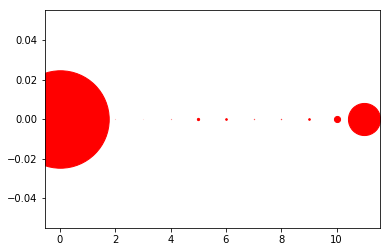

[((3, 0), 1), ((2, 0), 2), ((4, 0), 4), ((7, 0), 7), ((1, 0), 7), ((8, 0), 8), ((9, 0), 39), ((6, 0), 39), ((5, 0), 54), ((10, 0), 147), ((11, 0), 771), ((0, 0), 2339)]
108


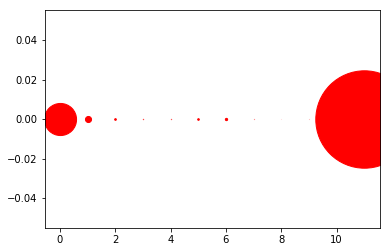

[((8, 0), 1), ((9, 0), 2), ((7, 0), 4), ((4, 0), 7), ((10, 0), 7), ((3, 0), 8), ((5, 0), 39), ((2, 0), 40), ((6, 0), 55), ((1, 0), 146), ((0, 0), 771), ((11, 0), 2338)]
109


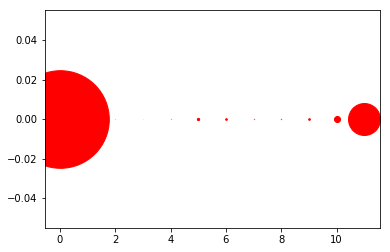

[((3, 0), 1), ((2, 0), 2), ((4, 0), 4), ((7, 0), 7), ((1, 0), 7), ((8, 0), 8), ((6, 0), 39), ((9, 0), 40), ((5, 0), 55), ((10, 0), 145), ((11, 0), 767), ((0, 0), 2343)]
110


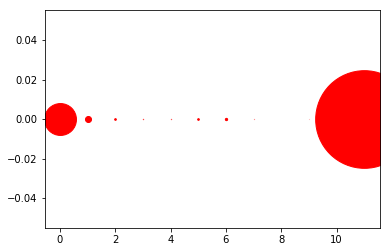

[((9, 0), 2), ((7, 0), 4), ((4, 0), 7), ((10, 0), 7), ((3, 0), 8), ((2, 0), 40), ((5, 0), 40), ((6, 0), 55), ((1, 0), 145), ((0, 0), 766), ((11, 0), 2344)]
111


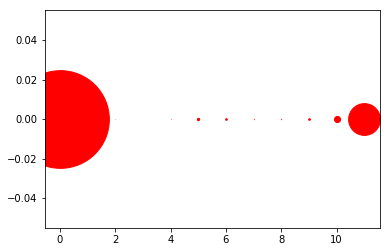

[((2, 0), 2), ((4, 0), 4), ((7, 0), 7), ((1, 0), 7), ((8, 0), 8), ((6, 0), 39), ((9, 0), 40), ((5, 0), 56), ((10, 0), 147), ((11, 0), 763), ((0, 0), 2345)]
112


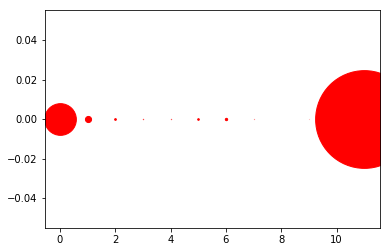

[((9, 0), 2), ((7, 0), 4), ((4, 0), 7), ((10, 0), 7), ((3, 0), 8), ((5, 0), 39), ((2, 0), 41), ((6, 0), 56), ((1, 0), 147), ((0, 0), 761), ((11, 0), 2346)]
113


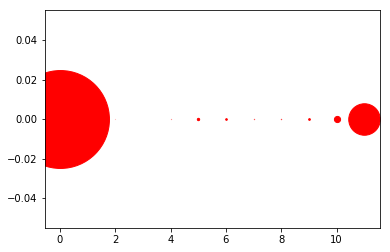

[((2, 0), 2), ((4, 0), 4), ((7, 0), 7), ((1, 0), 7), ((8, 0), 8), ((6, 0), 39), ((9, 0), 41), ((5, 0), 56), ((10, 0), 148), ((11, 0), 756), ((0, 0), 2350)]
114


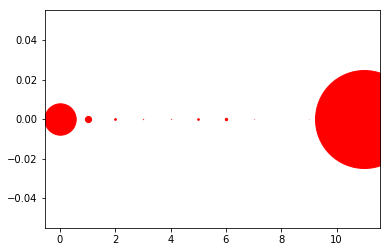

[((9, 0), 2), ((7, 0), 4), ((4, 0), 7), ((10, 0), 7), ((3, 0), 8), ((5, 0), 39), ((2, 0), 41), ((6, 0), 57), ((1, 0), 148), ((0, 0), 754), ((11, 0), 2351)]
115


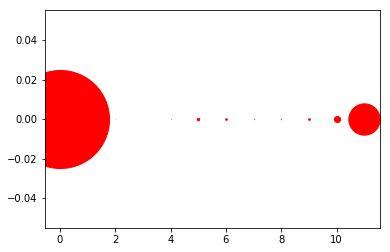

[((2, 0), 2), ((4, 0), 4), ((7, 0), 7), ((1, 0), 7), ((8, 0), 8), ((6, 0), 39), ((9, 0), 41), ((5, 0), 57), ((10, 0), 148), ((11, 0), 752), ((0, 0), 2353)]
116


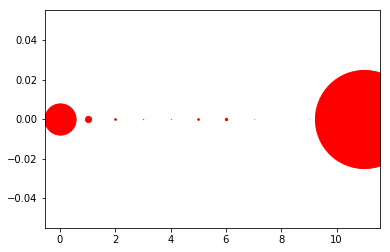

[((9, 0), 2), ((7, 0), 4), ((4, 0), 7), ((10, 0), 7), ((3, 0), 9), ((2, 0), 40), ((5, 0), 40), ((6, 0), 57), ((1, 0), 147), ((0, 0), 750), ((11, 0), 2355)]
117


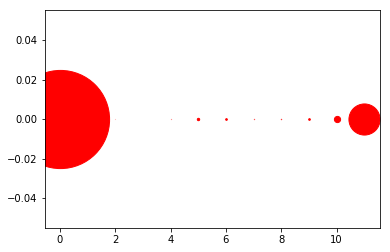

[((2, 0), 2), ((4, 0), 4), ((7, 0), 7), ((1, 0), 7), ((8, 0), 9), ((9, 0), 40), ((6, 0), 40), ((5, 0), 57), ((10, 0), 149), ((11, 0), 747), ((0, 0), 2356)]
118


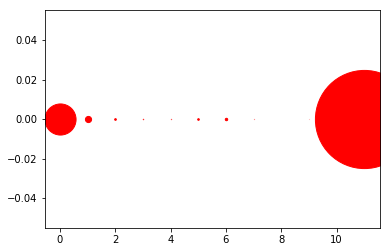

[((9, 0), 2), ((7, 0), 4), ((4, 0), 7), ((10, 0), 7), ((3, 0), 10), ((5, 0), 39), ((2, 0), 40), ((6, 0), 58), ((1, 0), 148), ((0, 0), 747), ((11, 0), 2356)]
119


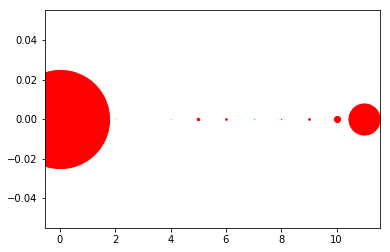

[((2, 0), 2), ((4, 0), 4), ((7, 0), 7), ((1, 0), 7), ((8, 0), 10), ((6, 0), 39), ((9, 0), 40), ((5, 0), 58), ((10, 0), 148), ((11, 0), 747), ((0, 0), 2356)]
120


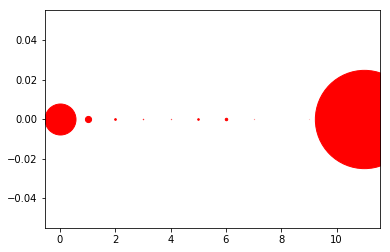

[((9, 0), 2), ((7, 0), 4), ((4, 0), 7), ((10, 0), 7), ((3, 0), 10), ((5, 0), 38), ((2, 0), 40), ((6, 0), 59), ((1, 0), 148), ((0, 0), 744), ((11, 0), 2359)]
121


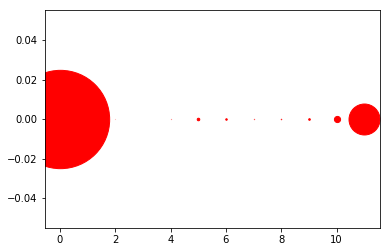

[((2, 0), 2), ((4, 0), 4), ((7, 0), 7), ((1, 0), 7), ((8, 0), 11), ((6, 0), 36), ((9, 0), 39), ((5, 0), 61), ((10, 0), 148), ((11, 0), 743), ((0, 0), 2360)]
122


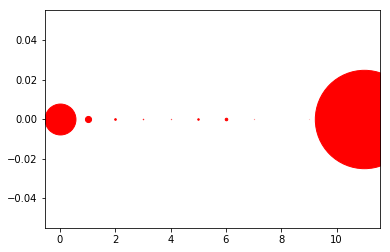

[((9, 0), 2), ((7, 0), 4), ((4, 0), 7), ((10, 0), 8), ((3, 0), 11), ((5, 0), 36), ((2, 0), 39), ((6, 0), 61), ((1, 0), 147), ((0, 0), 742), ((11, 0), 2361)]
123


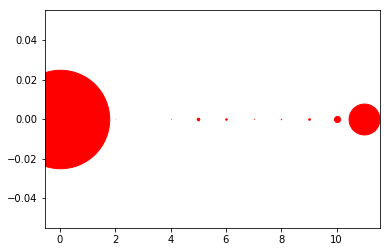

[((2, 0), 2), ((4, 0), 4), ((7, 0), 7), ((1, 0), 8), ((8, 0), 11), ((6, 0), 36), ((9, 0), 39), ((5, 0), 61), ((10, 0), 146), ((11, 0), 741), ((0, 0), 2363)]
124


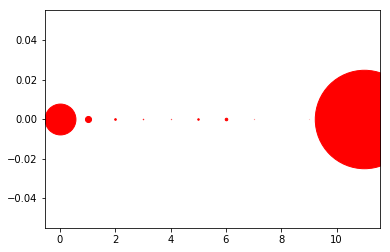

[((9, 0), 2), ((7, 0), 4), ((4, 0), 7), ((10, 0), 8), ((3, 0), 11), ((5, 0), 36), ((2, 0), 39), ((6, 0), 61), ((1, 0), 146), ((0, 0), 741), ((11, 0), 2363)]
125


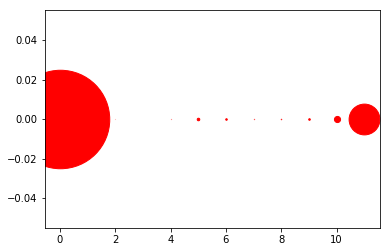

[((2, 0), 2), ((4, 0), 4), ((7, 0), 7), ((1, 0), 8), ((8, 0), 11), ((6, 0), 37), ((9, 0), 38), ((5, 0), 61), ((10, 0), 147), ((11, 0), 739), ((0, 0), 2364)]
126


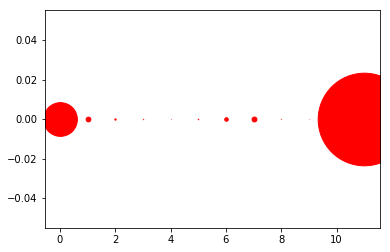

[((9, 0), 3), ((10, 0), 3), ((4, 0), 4), ((8, 0), 6), ((3, 0), 9), ((5, 0), 13), ((2, 0), 31), ((6, 0), 85), ((1, 0), 114), ((7, 0), 117), ((0, 0), 810), ((11, 0), 2223)]
127


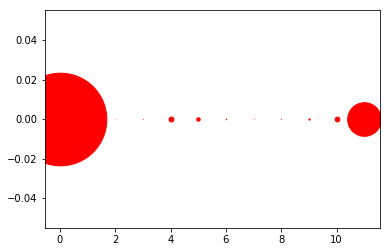

[((2, 0), 3), ((1, 0), 3), ((7, 0), 4), ((3, 0), 6), ((8, 0), 9), ((6, 0), 13), ((9, 0), 31), ((5, 0), 83), ((10, 0), 115), ((4, 0), 119), ((11, 0), 808), ((0, 0), 2224)]
128


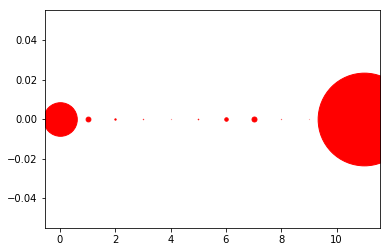

[((9, 0), 3), ((10, 0), 3), ((4, 0), 4), ((8, 0), 6), ((3, 0), 9), ((5, 0), 13), ((2, 0), 32), ((6, 0), 83), ((1, 0), 115), ((7, 0), 119), ((0, 0), 806), ((11, 0), 2225)]
129


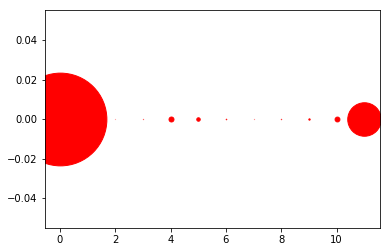

[((2, 0), 3), ((1, 0), 3), ((7, 0), 4), ((3, 0), 6), ((8, 0), 9), ((6, 0), 13), ((9, 0), 32), ((5, 0), 83), ((10, 0), 116), ((4, 0), 119), ((11, 0), 804), ((0, 0), 2226)]
130


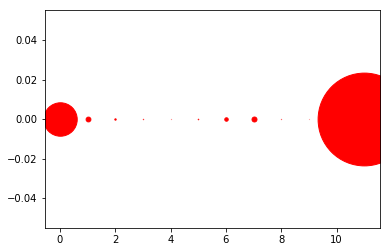

[((9, 0), 3), ((10, 0), 3), ((4, 0), 4), ((8, 0), 6), ((3, 0), 9), ((5, 0), 13), ((2, 0), 33), ((6, 0), 83), ((1, 0), 115), ((7, 0), 119), ((0, 0), 803), ((11, 0), 2227)]
131


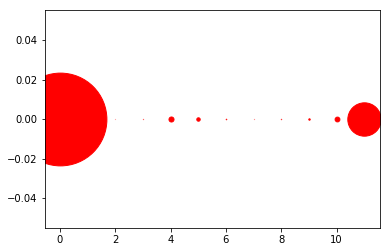

[((2, 0), 3), ((1, 0), 3), ((7, 0), 4), ((3, 0), 6), ((8, 0), 9), ((6, 0), 13), ((9, 0), 34), ((5, 0), 82), ((10, 0), 115), ((4, 0), 121), ((11, 0), 801), ((0, 0), 2227)]
132


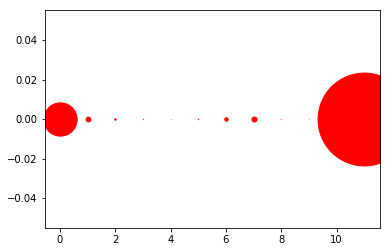

[((9, 0), 3), ((10, 0), 3), ((4, 0), 4), ((8, 0), 6), ((3, 0), 9), ((5, 0), 12), ((2, 0), 34), ((6, 0), 83), ((1, 0), 115), ((7, 0), 121), ((0, 0), 799), ((11, 0), 2229)]
133


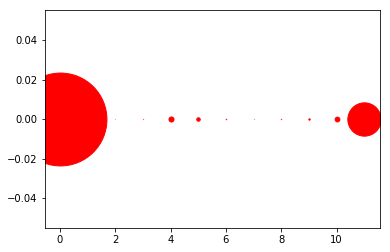

[((2, 0), 3), ((1, 0), 3), ((7, 0), 4), ((3, 0), 6), ((8, 0), 9), ((6, 0), 12), ((9, 0), 33), ((5, 0), 83), ((10, 0), 115), ((4, 0), 121), ((11, 0), 800), ((0, 0), 2229)]
134


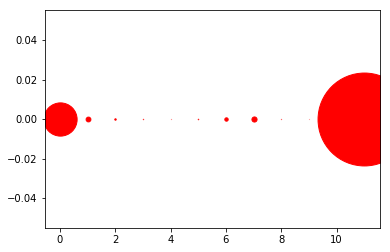

[((9, 0), 3), ((10, 0), 3), ((4, 0), 4), ((8, 0), 6), ((3, 0), 9), ((5, 0), 12), ((2, 0), 34), ((6, 0), 81), ((1, 0), 115), ((7, 0), 123), ((0, 0), 798), ((11, 0), 2230)]
135


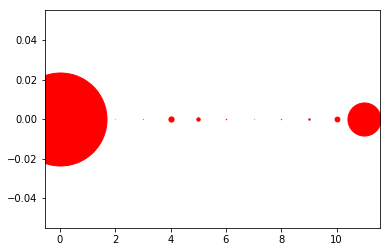

[((2, 0), 3), ((1, 0), 3), ((7, 0), 4), ((3, 0), 6), ((8, 0), 9), ((6, 0), 12), ((9, 0), 34), ((5, 0), 81), ((10, 0), 116), ((4, 0), 124), ((11, 0), 794), ((0, 0), 2232)]
136


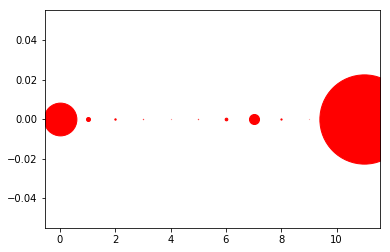

[((10, 0), 3), ((9, 0), 3), ((4, 0), 4), ((3, 0), 8), ((5, 0), 8), ((8, 0), 29), ((2, 0), 33), ((6, 0), 64), ((1, 0), 96), ((7, 0), 241), ((0, 0), 787), ((11, 0), 2142)]
137


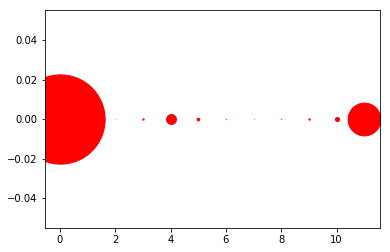

[((1, 0), 3), ((2, 0), 3), ((7, 0), 4), ((8, 0), 8), ((6, 0), 8), ((3, 0), 31), ((9, 0), 33), ((5, 0), 64), ((10, 0), 96), ((4, 0), 238), ((11, 0), 787), ((0, 0), 2143)]
138


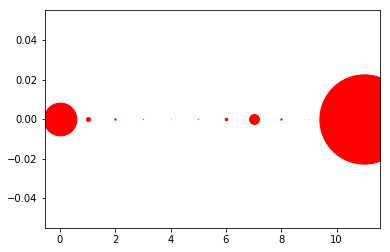

[((10, 0), 3), ((9, 0), 3), ((4, 0), 4), ((3, 0), 8), ((5, 0), 8), ((8, 0), 32), ((2, 0), 33), ((6, 0), 64), ((1, 0), 95), ((7, 0), 238), ((0, 0), 787), ((11, 0), 2143)]
139


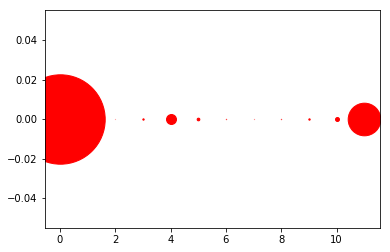

[((1, 0), 3), ((2, 0), 3), ((7, 0), 4), ((8, 0), 8), ((6, 0), 8), ((3, 0), 32), ((9, 0), 33), ((5, 0), 64), ((10, 0), 95), ((4, 0), 239), ((11, 0), 783), ((0, 0), 2146)]
140


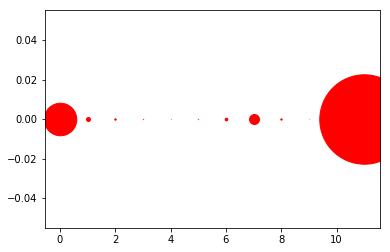

[((10, 0), 3), ((9, 0), 3), ((4, 0), 4), ((3, 0), 8), ((5, 0), 8), ((8, 0), 32), ((2, 0), 34), ((6, 0), 64), ((1, 0), 95), ((7, 0), 239), ((0, 0), 781), ((11, 0), 2147)]
141


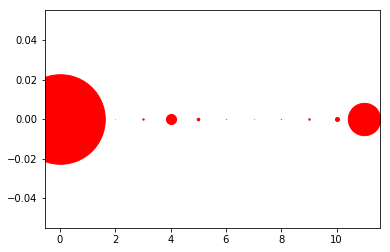

[((1, 0), 3), ((2, 0), 3), ((7, 0), 4), ((6, 0), 7), ((8, 0), 8), ((3, 0), 32), ((9, 0), 34), ((5, 0), 63), ((10, 0), 96), ((4, 0), 242), ((11, 0), 777), ((0, 0), 2149)]
142


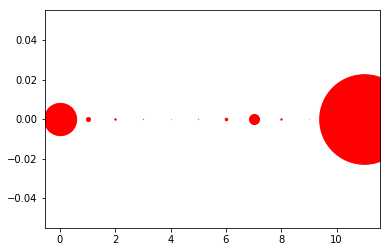

[((10, 0), 3), ((9, 0), 3), ((4, 0), 4), ((5, 0), 7), ((3, 0), 8), ((8, 0), 32), ((2, 0), 34), ((6, 0), 62), ((1, 0), 96), ((7, 0), 242), ((0, 0), 776), ((11, 0), 2151)]
143


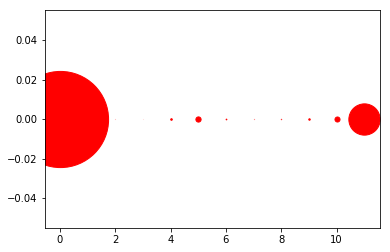

[((3, 0), 1), ((2, 0), 2), ((7, 0), 4), ((1, 0), 7), ((8, 0), 9), ((6, 0), 17), ((9, 0), 35), ((4, 0), 38), ((10, 0), 121), ((5, 0), 125), ((11, 0), 751), ((0, 0), 2308)]
144


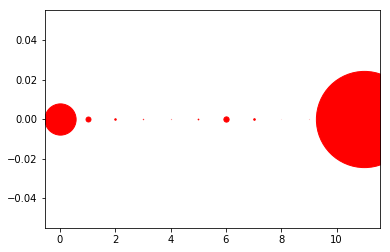

[((8, 0), 1), ((9, 0), 2), ((4, 0), 4), ((10, 0), 7), ((3, 0), 9), ((5, 0), 17), ((2, 0), 36), ((7, 0), 38), ((1, 0), 119), ((6, 0), 126), ((0, 0), 750), ((11, 0), 2309)]
145


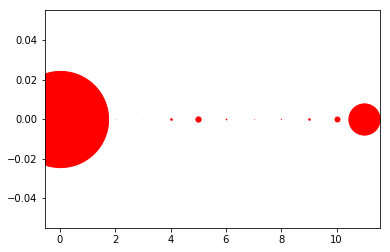

[((3, 0), 1), ((2, 0), 2), ((7, 0), 4), ((1, 0), 7), ((8, 0), 9), ((6, 0), 17), ((9, 0), 36), ((4, 0), 38), ((10, 0), 119), ((5, 0), 126), ((11, 0), 750), ((0, 0), 2309)]
146


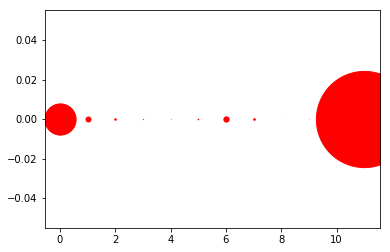

[((8, 0), 1), ((9, 0), 2), ((4, 0), 4), ((10, 0), 7), ((3, 0), 9), ((5, 0), 17), ((2, 0), 36), ((7, 0), 38), ((1, 0), 120), ((6, 0), 126), ((0, 0), 749), ((11, 0), 2309)]
147


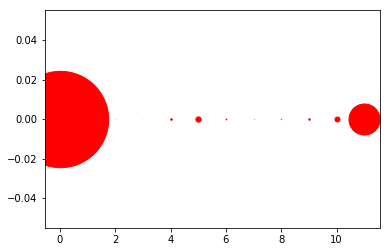

[((3, 0), 1), ((2, 0), 2), ((7, 0), 4), ((1, 0), 7), ((8, 0), 9), ((6, 0), 17), ((9, 0), 36), ((4, 0), 38), ((10, 0), 120), ((5, 0), 126), ((11, 0), 745), ((0, 0), 2313)]
148


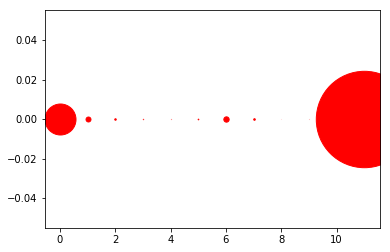

[((8, 0), 1), ((9, 0), 2), ((4, 0), 4), ((10, 0), 7), ((3, 0), 9), ((5, 0), 16), ((2, 0), 36), ((7, 0), 38), ((1, 0), 119), ((6, 0), 128), ((0, 0), 744), ((11, 0), 2314)]
149


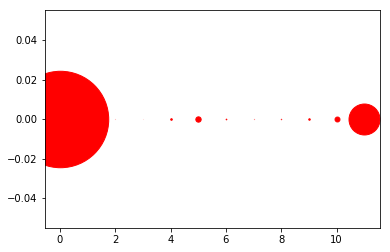

[((3, 0), 1), ((2, 0), 2), ((7, 0), 4), ((1, 0), 7), ((8, 0), 10), ((6, 0), 16), ((9, 0), 36), ((4, 0), 38), ((10, 0), 118), ((5, 0), 128), ((11, 0), 743), ((0, 0), 2315)]
150


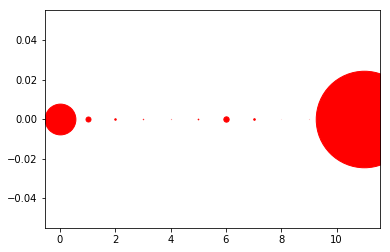

[((8, 0), 1), ((9, 0), 2), ((4, 0), 4), ((10, 0), 7), ((3, 0), 10), ((5, 0), 16), ((2, 0), 36), ((7, 0), 38), ((1, 0), 120), ((6, 0), 128), ((0, 0), 739), ((11, 0), 2317)]
151


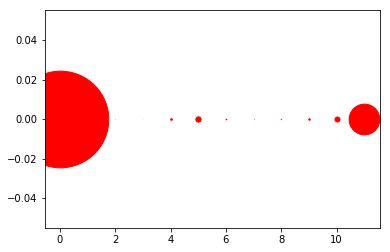

[((3, 0), 1), ((2, 0), 2), ((7, 0), 4), ((1, 0), 7), ((8, 0), 10), ((6, 0), 16), ((9, 0), 36), ((4, 0), 39), ((10, 0), 120), ((5, 0), 127), ((11, 0), 737), ((0, 0), 2319)]
152


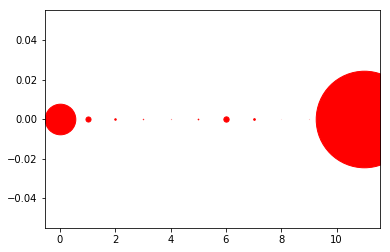

[((8, 0), 1), ((9, 0), 2), ((4, 0), 4), ((10, 0), 7), ((3, 0), 10), ((5, 0), 16), ((2, 0), 36), ((7, 0), 40), ((1, 0), 122), ((6, 0), 127), ((0, 0), 735), ((11, 0), 2318)]
153


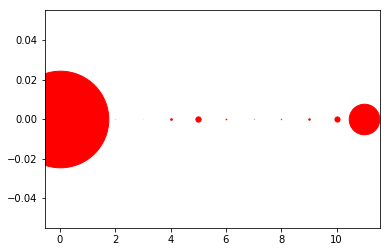

[((3, 0), 1), ((2, 0), 2), ((7, 0), 4), ((1, 0), 7), ((8, 0), 10), ((6, 0), 16), ((9, 0), 36), ((4, 0), 40), ((10, 0), 123), ((5, 0), 127), ((11, 0), 733), ((0, 0), 2319)]
154


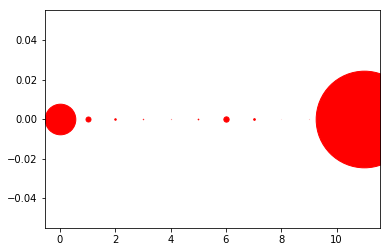

[((8, 0), 1), ((9, 0), 2), ((4, 0), 4), ((10, 0), 7), ((3, 0), 10), ((5, 0), 16), ((2, 0), 36), ((7, 0), 40), ((1, 0), 120), ((6, 0), 127), ((0, 0), 735), ((11, 0), 2320)]
155


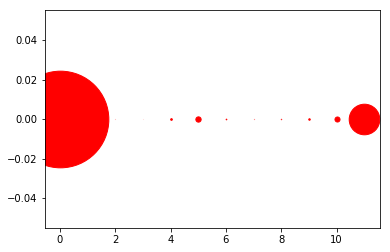

[((3, 0), 1), ((2, 0), 2), ((7, 0), 4), ((1, 0), 7), ((8, 0), 10), ((6, 0), 16), ((9, 0), 36), ((4, 0), 40), ((10, 0), 121), ((5, 0), 127), ((11, 0), 734), ((0, 0), 2320)]
156


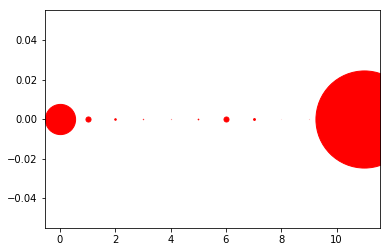

[((8, 0), 1), ((9, 0), 2), ((4, 0), 4), ((10, 0), 7), ((3, 0), 9), ((5, 0), 16), ((2, 0), 37), ((7, 0), 44), ((6, 0), 120), ((1, 0), 122), ((0, 0), 725), ((11, 0), 2331)]
157


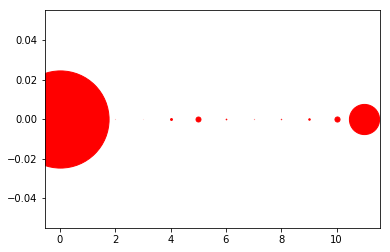

[((3, 0), 1), ((2, 0), 2), ((7, 0), 4), ((1, 0), 7), ((8, 0), 10), ((6, 0), 16), ((9, 0), 36), ((4, 0), 45), ((5, 0), 119), ((10, 0), 122), ((11, 0), 724), ((0, 0), 2332)]
158


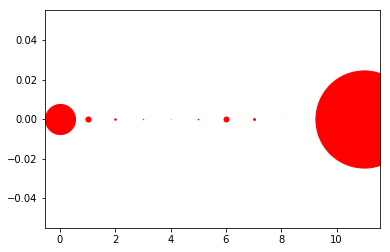

[((8, 0), 1), ((9, 0), 2), ((4, 0), 4), ((10, 0), 7), ((3, 0), 10), ((5, 0), 16), ((2, 0), 36), ((7, 0), 45), ((6, 0), 119), ((1, 0), 123), ((0, 0), 723), ((11, 0), 2332)]
159


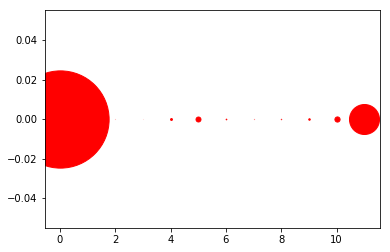

[((3, 0), 1), ((2, 0), 2), ((7, 0), 4), ((1, 0), 7), ((8, 0), 10), ((6, 0), 16), ((9, 0), 36), ((4, 0), 45), ((5, 0), 119), ((10, 0), 124), ((11, 0), 720), ((0, 0), 2334)]
160


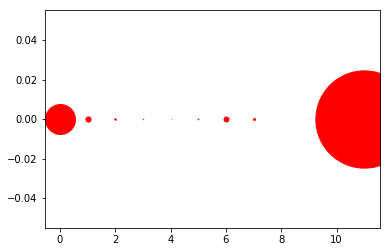

[((8, 0), 1), ((9, 0), 2), ((4, 0), 4), ((10, 0), 7), ((3, 0), 10), ((5, 0), 16), ((2, 0), 36), ((7, 0), 46), ((6, 0), 118), ((1, 0), 124), ((0, 0), 719), ((11, 0), 2335)]
161


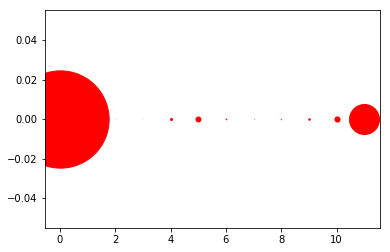

[((3, 0), 1), ((2, 0), 2), ((7, 0), 4), ((1, 0), 7), ((8, 0), 10), ((6, 0), 15), ((9, 0), 36), ((4, 0), 47), ((5, 0), 118), ((10, 0), 124), ((11, 0), 719), ((0, 0), 2335)]
162


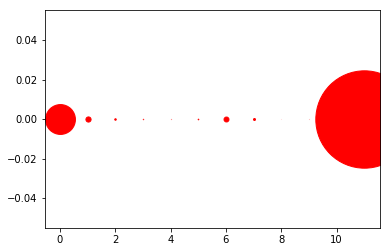

[((8, 0), 1), ((9, 0), 2), ((4, 0), 4), ((10, 0), 7), ((3, 0), 10), ((5, 0), 15), ((2, 0), 36), ((7, 0), 47), ((6, 0), 118), ((1, 0), 124), ((0, 0), 717), ((11, 0), 2337)]
163


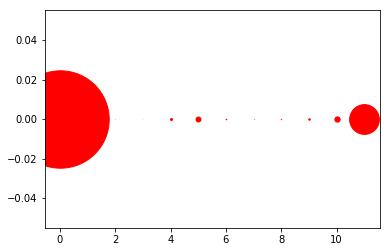

[((3, 0), 1), ((2, 0), 2), ((7, 0), 4), ((1, 0), 7), ((8, 0), 10), ((6, 0), 15), ((9, 0), 36), ((4, 0), 47), ((5, 0), 118), ((10, 0), 126), ((11, 0), 714), ((0, 0), 2338)]
164


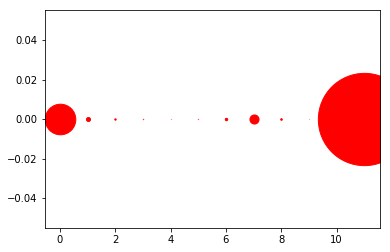

[((10, 0), 3), ((9, 0), 3), ((4, 0), 4), ((5, 0), 7), ((3, 0), 9), ((2, 0), 33), ((8, 0), 38), ((6, 0), 58), ((1, 0), 96), ((7, 0), 218), ((0, 0), 734), ((11, 0), 2215)]
165


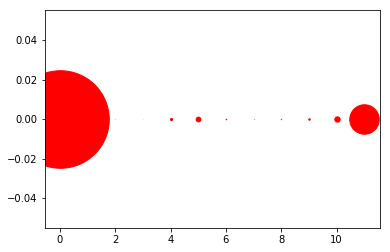

[((3, 0), 1), ((2, 0), 2), ((7, 0), 4), ((1, 0), 7), ((8, 0), 10), ((6, 0), 15), ((9, 0), 36), ((4, 0), 51), ((5, 0), 114), ((10, 0), 128), ((11, 0), 708), ((0, 0), 2342)]
166


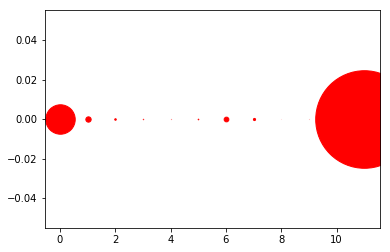

[((8, 0), 1), ((9, 0), 2), ((4, 0), 4), ((10, 0), 7), ((3, 0), 10), ((5, 0), 15), ((2, 0), 37), ((7, 0), 52), ((6, 0), 113), ((1, 0), 128), ((0, 0), 707), ((11, 0), 2342)]
167


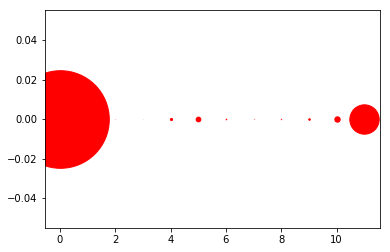

[((3, 0), 1), ((2, 0), 2), ((7, 0), 4), ((1, 0), 7), ((8, 0), 10), ((6, 0), 15), ((9, 0), 37), ((4, 0), 52), ((5, 0), 113), ((10, 0), 129), ((11, 0), 705), ((0, 0), 2343)]
168


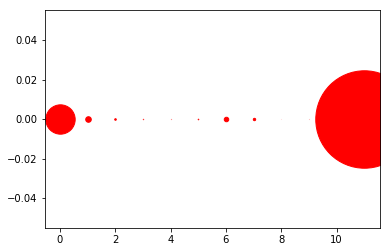

[((8, 0), 1), ((9, 0), 2), ((4, 0), 4), ((10, 0), 7), ((3, 0), 9), ((5, 0), 14), ((2, 0), 38), ((7, 0), 57), ((6, 0), 108), ((1, 0), 134), ((0, 0), 705), ((11, 0), 2339)]
169


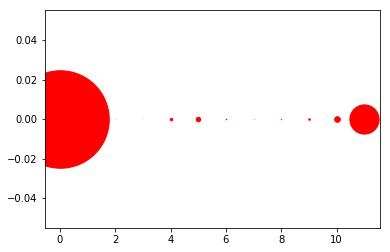

[((3, 0), 1), ((2, 0), 2), ((7, 0), 4), ((1, 0), 7), ((8, 0), 10), ((6, 0), 14), ((9, 0), 37), ((4, 0), 58), ((5, 0), 107), ((10, 0), 135), ((11, 0), 702), ((0, 0), 2341)]
170


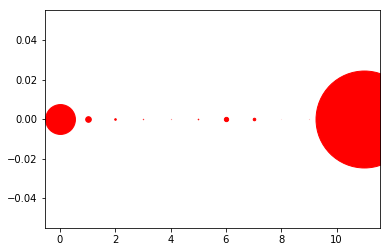

[((8, 0), 1), ((9, 0), 2), ((4, 0), 4), ((10, 0), 7), ((3, 0), 9), ((5, 0), 14), ((2, 0), 38), ((7, 0), 61), ((6, 0), 103), ((1, 0), 135), ((0, 0), 717), ((11, 0), 2327)]
171


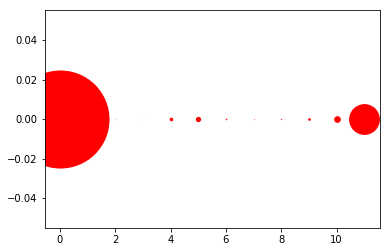

[((3, 0), 1), ((2, 0), 2), ((7, 0), 4), ((1, 0), 7), ((8, 0), 9), ((6, 0), 14), ((9, 0), 38), ((4, 0), 62), ((5, 0), 102), ((10, 0), 136), ((11, 0), 714), ((0, 0), 2329)]
172


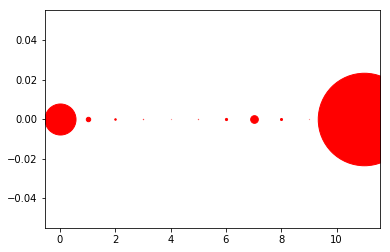

[((10, 0), 3), ((9, 0), 4), ((4, 0), 4), ((5, 0), 7), ((3, 0), 8), ((2, 0), 36), ((8, 0), 49), ((6, 0), 52), ((1, 0), 106), ((7, 0), 184), ((0, 0), 745), ((11, 0), 2220)]
173


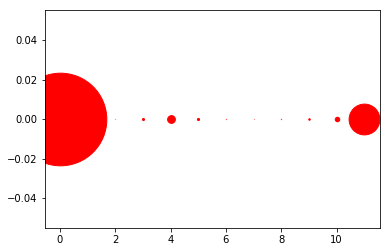

[((1, 0), 3), ((2, 0), 4), ((7, 0), 4), ((6, 0), 7), ((8, 0), 8), ((9, 0), 36), ((3, 0), 49), ((5, 0), 51), ((10, 0), 108), ((4, 0), 186), ((11, 0), 739), ((0, 0), 2223)]
174


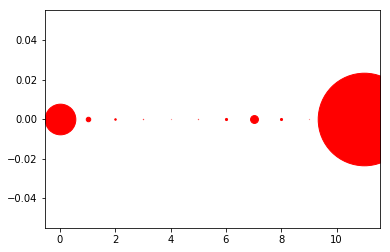

[((10, 0), 3), ((9, 0), 4), ((4, 0), 4), ((5, 0), 7), ((3, 0), 8), ((2, 0), 36), ((8, 0), 50), ((6, 0), 51), ((1, 0), 108), ((7, 0), 189), ((0, 0), 736), ((11, 0), 2222)]
175


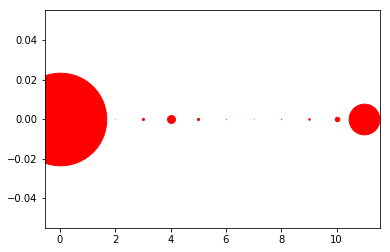

[((1, 0), 3), ((2, 0), 4), ((7, 0), 4), ((6, 0), 7), ((8, 0), 8), ((9, 0), 36), ((3, 0), 50), ((5, 0), 52), ((10, 0), 107), ((4, 0), 189), ((11, 0), 736), ((0, 0), 2222)]
176


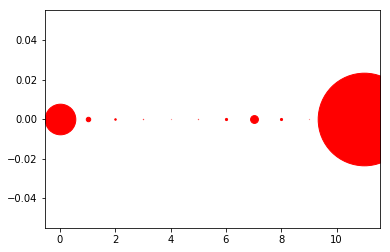

[((10, 0), 3), ((9, 0), 4), ((4, 0), 4), ((5, 0), 7), ((3, 0), 8), ((2, 0), 36), ((8, 0), 51), ((6, 0), 52), ((1, 0), 107), ((7, 0), 188), ((0, 0), 735), ((11, 0), 2223)]
177


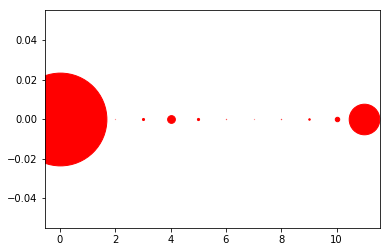

[((1, 0), 3), ((2, 0), 4), ((7, 0), 4), ((6, 0), 7), ((8, 0), 8), ((9, 0), 36), ((3, 0), 50), ((5, 0), 52), ((10, 0), 107), ((4, 0), 186), ((11, 0), 734), ((0, 0), 2227)]
178


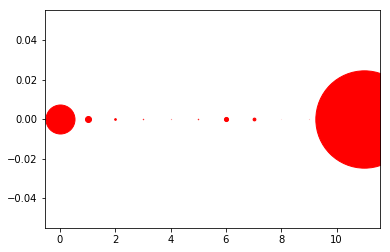

[((8, 0), 1), ((9, 0), 2), ((4, 0), 4), ((10, 0), 7), ((3, 0), 10), ((5, 0), 11), ((2, 0), 40), ((7, 0), 67), ((6, 0), 99), ((1, 0), 145), ((0, 0), 696), ((11, 0), 2336)]
179


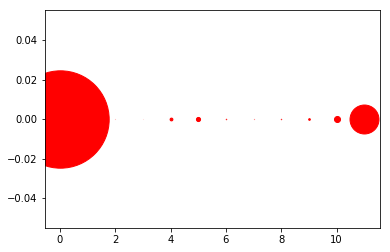

[((3, 0), 1), ((2, 0), 2), ((7, 0), 4), ((1, 0), 7), ((8, 0), 10), ((6, 0), 11), ((9, 0), 40), ((4, 0), 67), ((5, 0), 99), ((10, 0), 145), ((11, 0), 695), ((0, 0), 2337)]
180


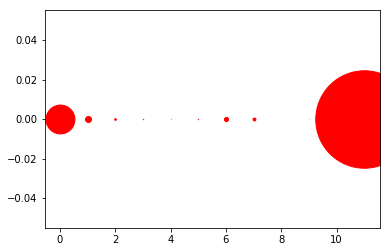

[((8, 0), 1), ((9, 0), 2), ((4, 0), 4), ((10, 0), 7), ((3, 0), 10), ((5, 0), 11), ((2, 0), 40), ((7, 0), 69), ((6, 0), 98), ((1, 0), 144), ((0, 0), 693), ((11, 0), 2339)]
181


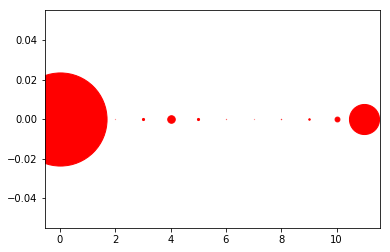

[((1, 0), 3), ((2, 0), 4), ((7, 0), 4), ((6, 0), 6), ((8, 0), 9), ((9, 0), 36), ((3, 0), 51), ((5, 0), 51), ((10, 0), 116), ((4, 0), 181), ((11, 0), 722), ((0, 0), 2235)]
182


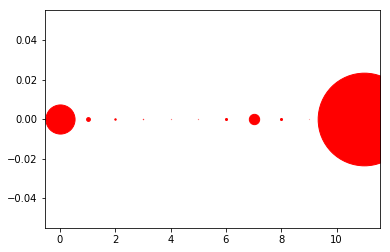

[((10, 0), 2), ((9, 0), 3), ((4, 0), 5), ((5, 0), 5), ((3, 0), 9), ((2, 0), 34), ((8, 0), 49), ((6, 0), 49), ((1, 0), 91), ((7, 0), 248), ((0, 0), 699), ((11, 0), 2224)]
183


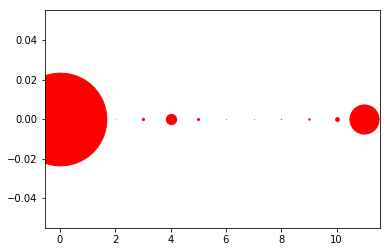

[((1, 0), 2), ((2, 0), 3), ((7, 0), 5), ((6, 0), 5), ((8, 0), 10), ((9, 0), 33), ((5, 0), 49), ((3, 0), 50), ((10, 0), 91), ((4, 0), 247), ((11, 0), 699), ((0, 0), 2224)]
184


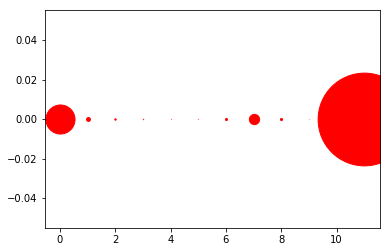

[((10, 0), 2), ((9, 0), 3), ((4, 0), 5), ((5, 0), 5), ((3, 0), 10), ((2, 0), 33), ((6, 0), 49), ((8, 0), 50), ((1, 0), 92), ((7, 0), 246), ((0, 0), 697), ((11, 0), 2226)]
185


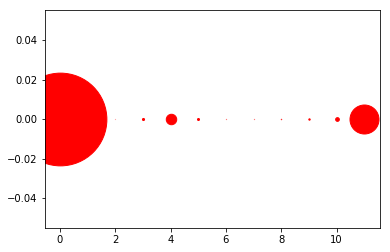

[((1, 0), 2), ((2, 0), 3), ((7, 0), 5), ((6, 0), 5), ((8, 0), 10), ((9, 0), 33), ((5, 0), 48), ((3, 0), 50), ((10, 0), 89), ((4, 0), 251), ((11, 0), 696), ((0, 0), 2226)]
186


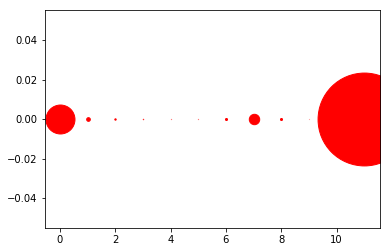

[((10, 0), 2), ((9, 0), 3), ((4, 0), 5), ((5, 0), 5), ((3, 0), 10), ((2, 0), 33), ((8, 0), 49), ((6, 0), 49), ((1, 0), 88), ((7, 0), 250), ((0, 0), 695), ((11, 0), 2229)]
187


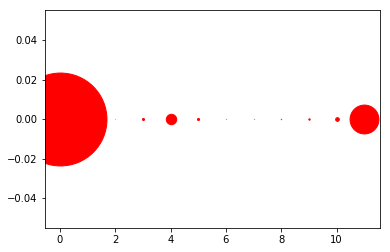

[((1, 0), 3), ((2, 0), 3), ((7, 0), 5), ((6, 0), 5), ((8, 0), 10), ((9, 0), 33), ((3, 0), 49), ((5, 0), 49), ((10, 0), 88), ((4, 0), 250), ((11, 0), 693), ((0, 0), 2230)]
188


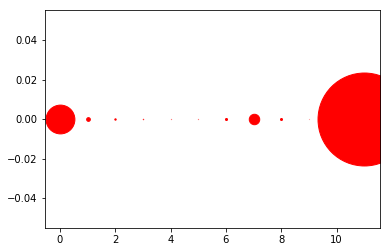

[((10, 0), 3), ((9, 0), 3), ((4, 0), 5), ((5, 0), 5), ((3, 0), 10), ((2, 0), 33), ((8, 0), 48), ((6, 0), 49), ((1, 0), 89), ((7, 0), 251), ((0, 0), 691), ((11, 0), 2231)]
189


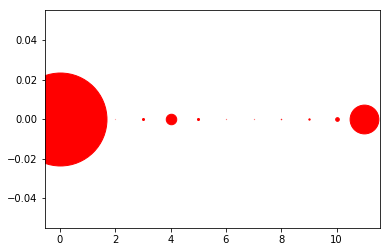

[((1, 0), 3), ((2, 0), 3), ((7, 0), 5), ((6, 0), 5), ((8, 0), 11), ((9, 0), 32), ((3, 0), 48), ((5, 0), 49), ((10, 0), 88), ((4, 0), 252), ((11, 0), 691), ((0, 0), 2231)]
190


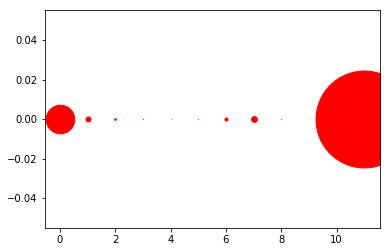

[((9, 0), 2), ((10, 0), 4), ((4, 0), 5), ((8, 0), 7), ((5, 0), 7), ((3, 0), 10), ((2, 0), 38), ((6, 0), 74), ((1, 0), 120), ((7, 0), 140), ((0, 0), 685), ((11, 0), 2326)]
191


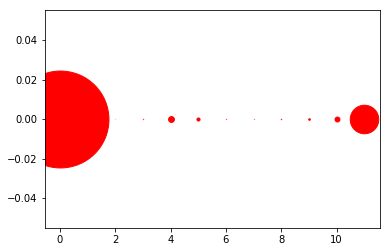

[((2, 0), 2), ((1, 0), 4), ((7, 0), 5), ((6, 0), 7), ((3, 0), 8), ((8, 0), 11), ((9, 0), 38), ((5, 0), 74), ((10, 0), 118), ((4, 0), 140), ((11, 0), 685), ((0, 0), 2326)]
192


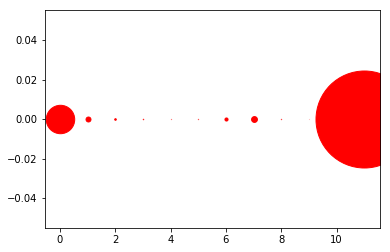

[((9, 0), 2), ((10, 0), 4), ((4, 0), 5), ((5, 0), 7), ((8, 0), 8), ((3, 0), 11), ((2, 0), 38), ((6, 0), 74), ((1, 0), 119), ((7, 0), 140), ((0, 0), 682), ((11, 0), 2328)]
193


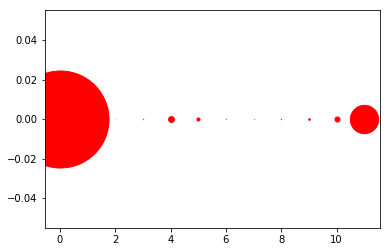

[((2, 0), 2), ((1, 0), 4), ((7, 0), 5), ((6, 0), 7), ((3, 0), 8), ((8, 0), 11), ((9, 0), 38), ((5, 0), 74), ((10, 0), 120), ((4, 0), 140), ((11, 0), 680), ((0, 0), 2329)]
194


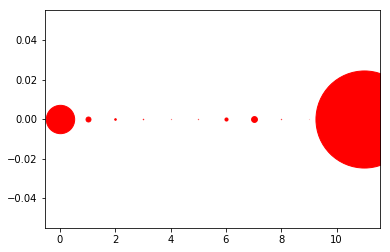

[((9, 0), 2), ((10, 0), 4), ((4, 0), 5), ((5, 0), 7), ((8, 0), 8), ((3, 0), 11), ((2, 0), 38), ((6, 0), 74), ((1, 0), 119), ((7, 0), 140), ((0, 0), 680), ((11, 0), 2330)]
195


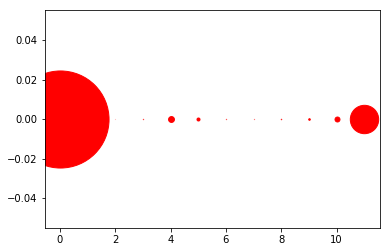

[((2, 0), 2), ((1, 0), 4), ((7, 0), 5), ((6, 0), 7), ((3, 0), 8), ((8, 0), 11), ((9, 0), 38), ((5, 0), 72), ((10, 0), 119), ((4, 0), 141), ((11, 0), 681), ((0, 0), 2330)]
196


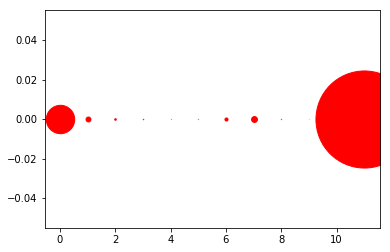

[((9, 0), 2), ((10, 0), 4), ((4, 0), 5), ((5, 0), 6), ((8, 0), 8), ((3, 0), 11), ((2, 0), 38), ((6, 0), 74), ((1, 0), 118), ((7, 0), 141), ((0, 0), 681), ((11, 0), 2330)]
197


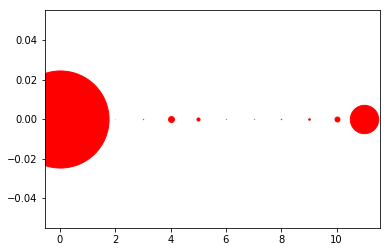

[((2, 0), 2), ((1, 0), 3), ((6, 0), 6), ((7, 0), 6), ((3, 0), 8), ((8, 0), 11), ((9, 0), 38), ((5, 0), 74), ((10, 0), 119), ((4, 0), 141), ((11, 0), 680), ((0, 0), 2330)]
198


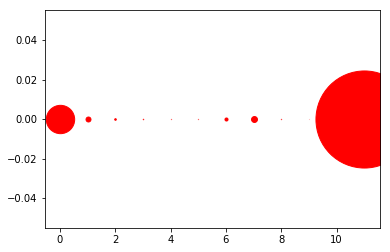

[((9, 0), 2), ((10, 0), 3), ((5, 0), 6), ((4, 0), 6), ((8, 0), 8), ((3, 0), 11), ((2, 0), 38), ((6, 0), 73), ((1, 0), 119), ((7, 0), 142), ((0, 0), 680), ((11, 0), 2330)]
199


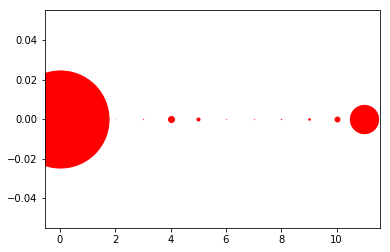

[((2, 0), 2), ((1, 0), 3), ((6, 0), 6), ((7, 0), 7), ((3, 0), 8), ((8, 0), 11), ((9, 0), 38), ((5, 0), 72), ((10, 0), 117), ((4, 0), 144), ((11, 0), 679), ((0, 0), 2331)]
200


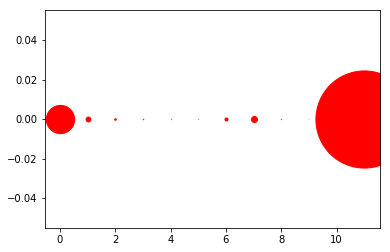

[((9, 0), 2), ((10, 0), 3), ((5, 0), 6), ((4, 0), 7), ((8, 0), 8), ((3, 0), 11), ((2, 0), 38), ((6, 0), 72), ((1, 0), 117), ((7, 0), 144), ((0, 0), 678), ((11, 0), 2332)]
201


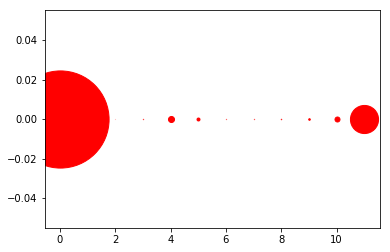

[((2, 0), 2), ((1, 0), 3), ((6, 0), 6), ((7, 0), 7), ((3, 0), 8), ((8, 0), 11), ((9, 0), 38), ((5, 0), 71), ((10, 0), 120), ((4, 0), 145), ((11, 0), 675), ((0, 0), 2332)]
202


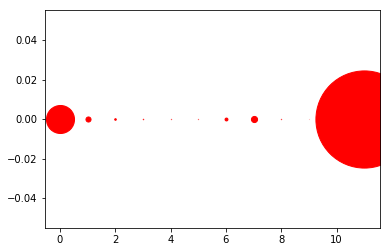

[((9, 0), 2), ((10, 0), 3), ((5, 0), 6), ((4, 0), 7), ((8, 0), 8), ((3, 0), 11), ((2, 0), 38), ((6, 0), 69), ((1, 0), 122), ((7, 0), 147), ((0, 0), 673), ((11, 0), 2332)]
203


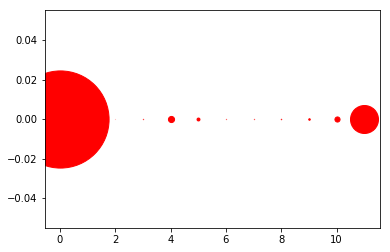

[((2, 0), 2), ((1, 0), 3), ((6, 0), 6), ((7, 0), 7), ((3, 0), 8), ((8, 0), 11), ((9, 0), 37), ((5, 0), 70), ((10, 0), 123), ((4, 0), 147), ((11, 0), 672), ((0, 0), 2332)]
204


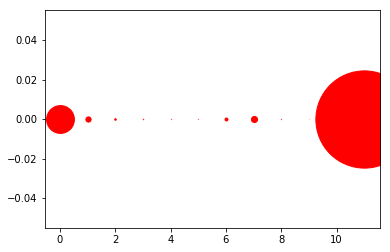

[((9, 0), 2), ((10, 0), 3), ((5, 0), 6), ((4, 0), 7), ((8, 0), 8), ((3, 0), 11), ((2, 0), 37), ((6, 0), 70), ((1, 0), 125), ((7, 0), 147), ((0, 0), 668), ((11, 0), 2334)]
205


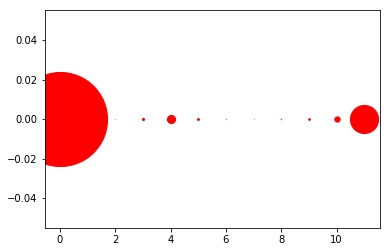

[((2, 0), 4), ((7, 0), 4), ((1, 0), 4), ((6, 0), 6), ((8, 0), 11), ((9, 0), 39), ((5, 0), 45), ((3, 0), 50), ((10, 0), 127), ((4, 0), 194), ((11, 0), 676), ((0, 0), 2258)]
206


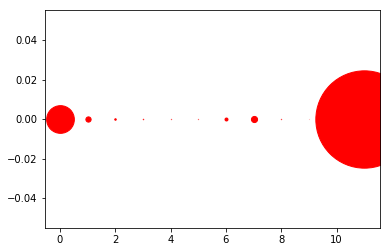

[((9, 0), 2), ((10, 0), 3), ((5, 0), 6), ((4, 0), 7), ((8, 0), 8), ((3, 0), 11), ((2, 0), 36), ((6, 0), 71), ((1, 0), 126), ((7, 0), 147), ((0, 0), 665), ((11, 0), 2336)]
207


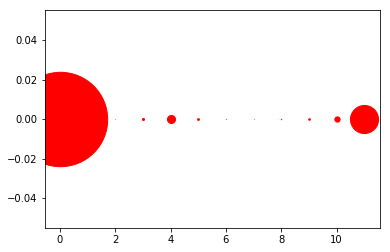

[((2, 0), 4), ((7, 0), 4), ((1, 0), 4), ((6, 0), 6), ((8, 0), 11), ((9, 0), 39), ((5, 0), 43), ((3, 0), 49), ((10, 0), 126), ((4, 0), 193), ((11, 0), 674), ((0, 0), 2265)]
208


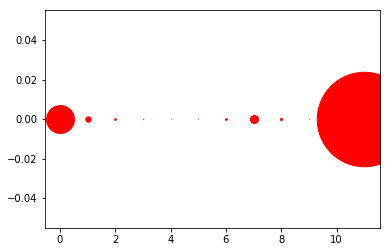

[((9, 0), 4), ((4, 0), 4), ((10, 0), 4), ((5, 0), 6), ((3, 0), 11), ((2, 0), 39), ((6, 0), 42), ((8, 0), 49), ((1, 0), 129), ((7, 0), 194), ((0, 0), 669), ((11, 0), 2267)]
209


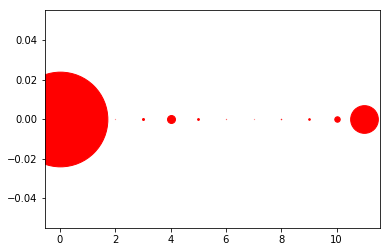

[((2, 0), 4), ((7, 0), 4), ((1, 0), 4), ((6, 0), 6), ((8, 0), 11), ((9, 0), 39), ((5, 0), 43), ((3, 0), 47), ((10, 0), 131), ((4, 0), 191), ((11, 0), 665), ((0, 0), 2273)]
210


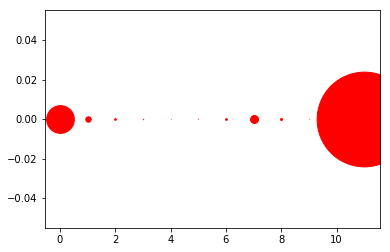

[((9, 0), 4), ((4, 0), 4), ((10, 0), 4), ((5, 0), 6), ((3, 0), 11), ((2, 0), 40), ((6, 0), 42), ((8, 0), 47), ((1, 0), 130), ((7, 0), 191), ((0, 0), 665), ((11, 0), 2274)]
211


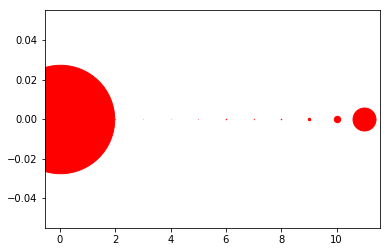

[((3, 0), 2), ((4, 0), 2), ((5, 0), 4), ((1, 0), 4), ((2, 0), 6), ((7, 0), 9), ((8, 0), 13), ((6, 0), 13), ((9, 0), 59), ((10, 0), 153), ((11, 0), 551), ((0, 0), 2602)]
212


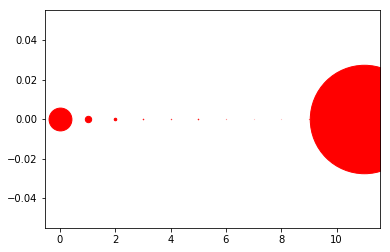

[((8, 0), 2), ((7, 0), 2), ((6, 0), 4), ((10, 0), 4), ((9, 0), 6), ((4, 0), 9), ((3, 0), 13), ((5, 0), 13), ((2, 0), 61), ((1, 0), 153), ((0, 0), 548), ((11, 0), 2603)]
213


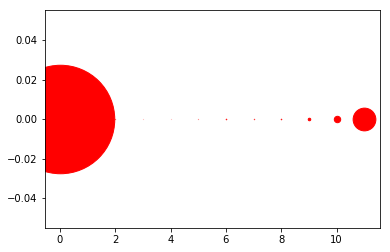

[((3, 0), 2), ((4, 0), 2), ((5, 0), 4), ((1, 0), 4), ((2, 0), 6), ((7, 0), 9), ((8, 0), 13), ((6, 0), 13), ((9, 0), 61), ((10, 0), 154), ((11, 0), 546), ((0, 0), 2604)]
214


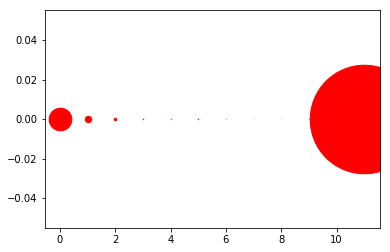

[((8, 0), 2), ((7, 0), 2), ((6, 0), 4), ((10, 0), 4), ((9, 0), 6), ((4, 0), 9), ((3, 0), 13), ((5, 0), 13), ((2, 0), 62), ((1, 0), 154), ((0, 0), 544), ((11, 0), 2605)]
215


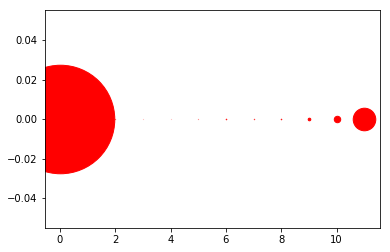

[((3, 0), 2), ((4, 0), 2), ((5, 0), 4), ((1, 0), 4), ((2, 0), 6), ((7, 0), 9), ((8, 0), 13), ((6, 0), 13), ((9, 0), 63), ((10, 0), 155), ((11, 0), 542), ((0, 0), 2605)]
216


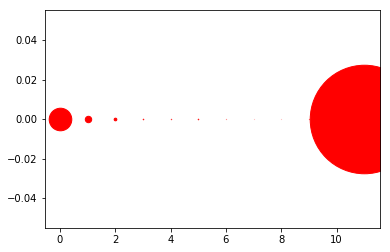

[((8, 0), 2), ((7, 0), 2), ((6, 0), 4), ((10, 0), 4), ((9, 0), 6), ((4, 0), 9), ((3, 0), 13), ((5, 0), 13), ((2, 0), 64), ((1, 0), 154), ((0, 0), 542), ((11, 0), 2605)]
217


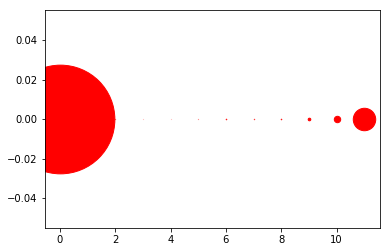

[((3, 0), 2), ((4, 0), 2), ((5, 0), 4), ((1, 0), 4), ((2, 0), 6), ((7, 0), 9), ((8, 0), 13), ((6, 0), 13), ((9, 0), 63), ((10, 0), 154), ((11, 0), 539), ((0, 0), 2609)]
218


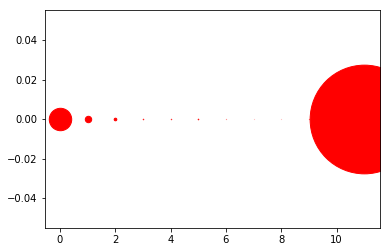

[((8, 0), 2), ((7, 0), 2), ((6, 0), 4), ((10, 0), 4), ((9, 0), 6), ((4, 0), 10), ((3, 0), 12), ((5, 0), 14), ((2, 0), 63), ((1, 0), 154), ((0, 0), 538), ((11, 0), 2609)]
219


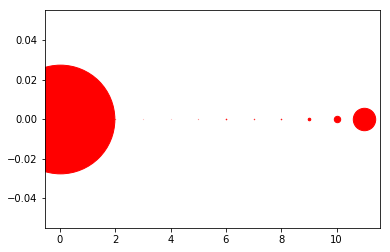

[((3, 0), 2), ((4, 0), 2), ((5, 0), 4), ((1, 0), 4), ((2, 0), 6), ((7, 0), 10), ((8, 0), 13), ((6, 0), 14), ((9, 0), 62), ((10, 0), 154), ((11, 0), 538), ((0, 0), 2609)]
220


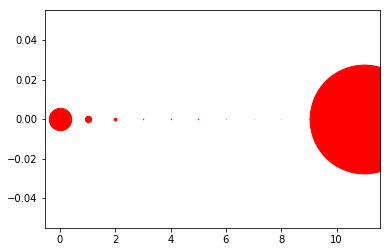

[((8, 0), 2), ((7, 0), 2), ((6, 0), 4), ((10, 0), 4), ((9, 0), 6), ((4, 0), 11), ((3, 0), 12), ((5, 0), 14), ((2, 0), 63), ((1, 0), 153), ((0, 0), 537), ((11, 0), 2610)]
221


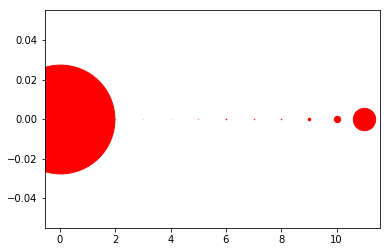

[((3, 0), 2), ((4, 0), 2), ((5, 0), 4), ((1, 0), 4), ((2, 0), 6), ((7, 0), 11), ((8, 0), 12), ((6, 0), 14), ((9, 0), 63), ((10, 0), 153), ((11, 0), 536), ((0, 0), 2611)]
222


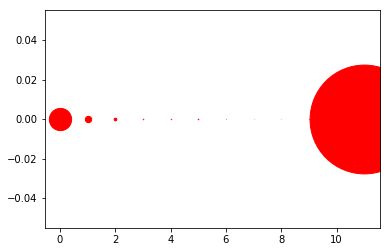

[((8, 0), 2), ((7, 0), 2), ((6, 0), 4), ((10, 0), 4), ((9, 0), 6), ((4, 0), 11), ((3, 0), 12), ((5, 0), 14), ((2, 0), 64), ((1, 0), 153), ((0, 0), 534), ((11, 0), 2612)]
223


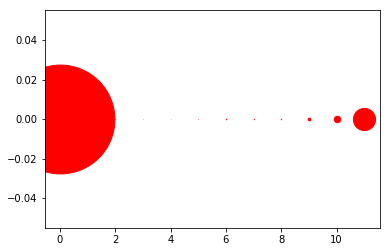

[((3, 0), 2), ((4, 0), 2), ((5, 0), 4), ((1, 0), 4), ((2, 0), 6), ((7, 0), 11), ((8, 0), 12), ((6, 0), 14), ((9, 0), 64), ((10, 0), 155), ((11, 0), 532), ((0, 0), 2612)]
224


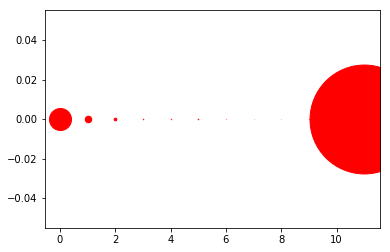

[((8, 0), 2), ((7, 0), 2), ((6, 0), 4), ((10, 0), 4), ((9, 0), 6), ((4, 0), 11), ((3, 0), 12), ((5, 0), 14), ((2, 0), 64), ((1, 0), 157), ((0, 0), 528), ((11, 0), 2614)]
225


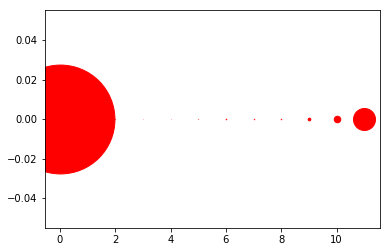

[((3, 0), 2), ((4, 0), 2), ((1, 0), 4), ((5, 0), 5), ((2, 0), 6), ((7, 0), 11), ((8, 0), 12), ((6, 0), 14), ((9, 0), 64), ((10, 0), 157), ((11, 0), 528), ((0, 0), 2613)]
226


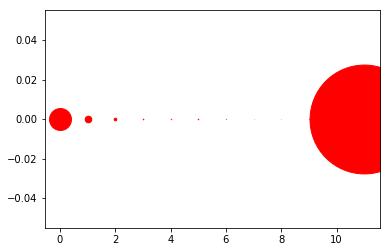

[((8, 0), 2), ((7, 0), 2), ((10, 0), 4), ((6, 0), 6), ((9, 0), 6), ((4, 0), 11), ((5, 0), 13), ((3, 0), 14), ((2, 0), 62), ((1, 0), 159), ((0, 0), 526), ((11, 0), 2613)]
227


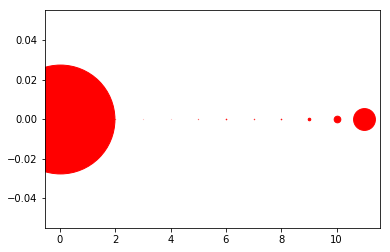

[((3, 0), 2), ((4, 0), 2), ((1, 0), 5), ((5, 0), 6), ((2, 0), 6), ((7, 0), 10), ((8, 0), 14), ((6, 0), 14), ((9, 0), 62), ((10, 0), 160), ((11, 0), 524), ((0, 0), 2613)]
228


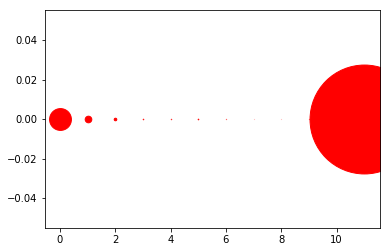

[((8, 0), 2), ((7, 0), 2), ((10, 0), 5), ((6, 0), 6), ((9, 0), 6), ((4, 0), 10), ((3, 0), 13), ((5, 0), 15), ((2, 0), 62), ((1, 0), 159), ((0, 0), 524), ((11, 0), 2614)]
229


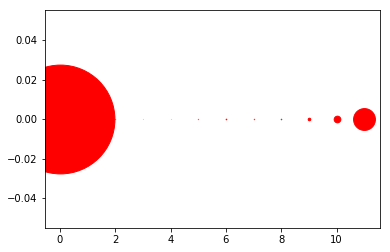

[((3, 0), 2), ((4, 0), 2), ((1, 0), 5), ((2, 0), 6), ((5, 0), 7), ((7, 0), 10), ((8, 0), 13), ((6, 0), 15), ((9, 0), 62), ((10, 0), 160), ((11, 0), 524), ((0, 0), 2612)]
230


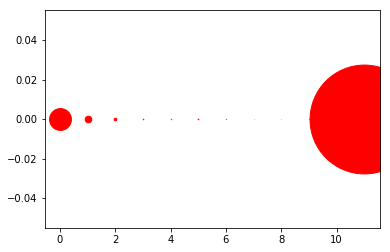

[((8, 0), 2), ((7, 0), 2), ((10, 0), 5), ((9, 0), 6), ((6, 0), 7), ((4, 0), 10), ((3, 0), 13), ((5, 0), 15), ((2, 0), 62), ((1, 0), 159), ((0, 0), 524), ((11, 0), 2613)]
231


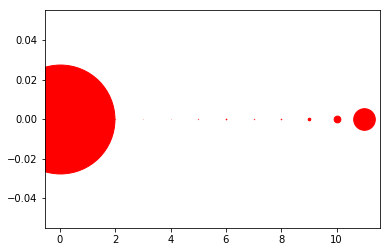

[((3, 0), 2), ((4, 0), 2), ((1, 0), 5), ((2, 0), 6), ((5, 0), 7), ((7, 0), 9), ((8, 0), 13), ((6, 0), 16), ((9, 0), 63), ((10, 0), 162), ((11, 0), 519), ((0, 0), 2614)]
232


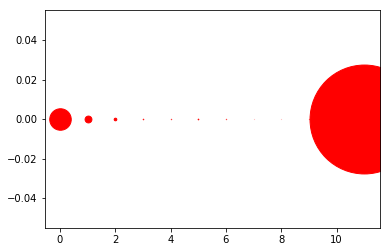

[((8, 0), 2), ((7, 0), 2), ((10, 0), 5), ((9, 0), 6), ((6, 0), 8), ((4, 0), 9), ((3, 0), 13), ((5, 0), 16), ((2, 0), 63), ((1, 0), 164), ((0, 0), 516), ((11, 0), 2614)]
233


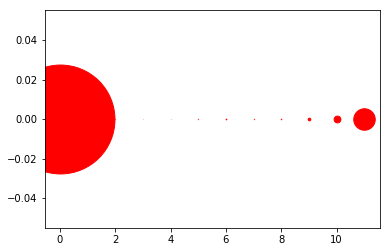

[((3, 0), 2), ((4, 0), 2), ((1, 0), 5), ((2, 0), 6), ((5, 0), 8), ((7, 0), 9), ((8, 0), 13), ((6, 0), 17), ((9, 0), 63), ((10, 0), 163), ((11, 0), 516), ((0, 0), 2614)]
234


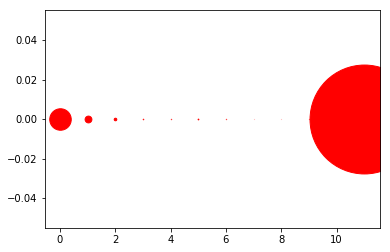

[((8, 0), 2), ((7, 0), 2), ((10, 0), 5), ((9, 0), 6), ((6, 0), 8), ((4, 0), 9), ((3, 0), 13), ((5, 0), 18), ((2, 0), 62), ((1, 0), 163), ((0, 0), 516), ((11, 0), 2614)]
235


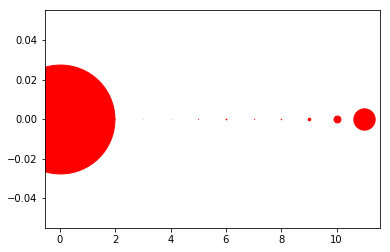

[((3, 0), 2), ((4, 0), 2), ((1, 0), 5), ((2, 0), 6), ((5, 0), 8), ((7, 0), 9), ((8, 0), 13), ((6, 0), 18), ((9, 0), 63), ((10, 0), 166), ((11, 0), 512), ((0, 0), 2614)]
236


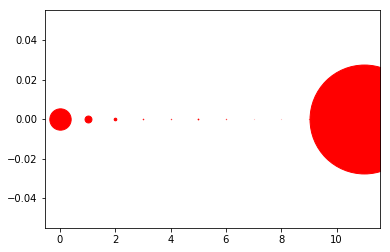

[((8, 0), 2), ((7, 0), 2), ((10, 0), 5), ((9, 0), 6), ((6, 0), 8), ((4, 0), 9), ((3, 0), 13), ((5, 0), 18), ((2, 0), 63), ((1, 0), 166), ((0, 0), 512), ((11, 0), 2614)]
237


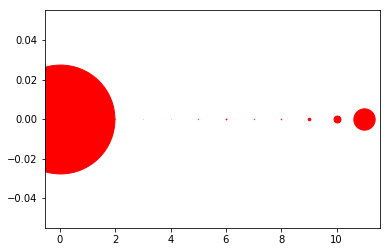

[((3, 0), 2), ((4, 0), 2), ((1, 0), 5), ((2, 0), 6), ((5, 0), 8), ((7, 0), 9), ((8, 0), 13), ((6, 0), 19), ((9, 0), 62), ((10, 0), 167), ((11, 0), 512), ((0, 0), 2613)]
238


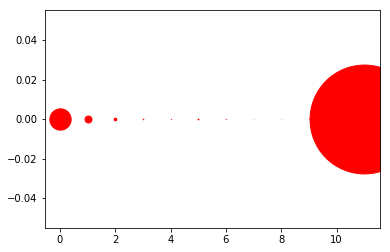

[((8, 0), 2), ((7, 0), 2), ((10, 0), 5), ((9, 0), 6), ((6, 0), 8), ((4, 0), 9), ((3, 0), 13), ((5, 0), 19), ((2, 0), 63), ((1, 0), 167), ((0, 0), 511), ((11, 0), 2613)]
239


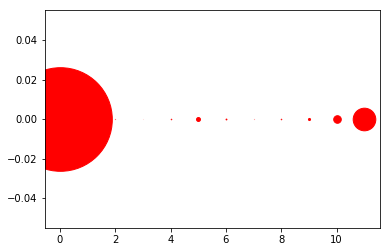

[((3, 0), 1), ((7, 0), 3), ((2, 0), 5), ((1, 0), 7), ((8, 0), 13), ((4, 0), 13), ((6, 0), 20), ((9, 0), 50), ((5, 0), 94), ((10, 0), 182), ((11, 0), 543), ((0, 0), 2487)]
240


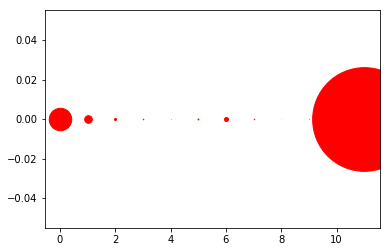

[((8, 0), 1), ((4, 0), 3), ((9, 0), 5), ((10, 0), 7), ((3, 0), 13), ((7, 0), 13), ((5, 0), 20), ((2, 0), 50), ((6, 0), 95), ((1, 0), 183), ((0, 0), 539), ((11, 0), 2489)]
241


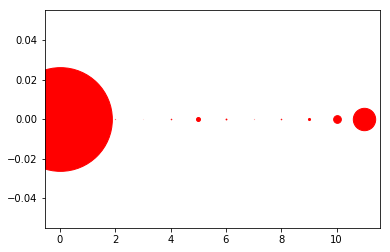

[((3, 0), 1), ((7, 0), 3), ((2, 0), 5), ((1, 0), 7), ((8, 0), 13), ((4, 0), 13), ((6, 0), 20), ((9, 0), 50), ((5, 0), 95), ((10, 0), 185), ((11, 0), 537), ((0, 0), 2489)]
242


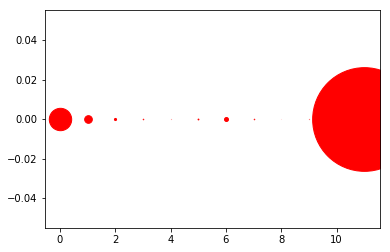

[((8, 0), 1), ((4, 0), 3), ((9, 0), 5), ((10, 0), 7), ((3, 0), 13), ((7, 0), 13), ((5, 0), 20), ((2, 0), 51), ((6, 0), 95), ((1, 0), 184), ((0, 0), 537), ((11, 0), 2489)]
243


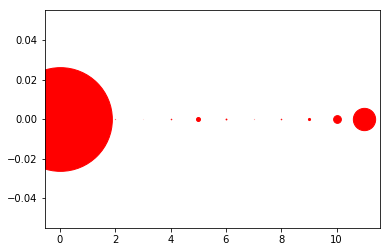

[((3, 0), 1), ((7, 0), 3), ((2, 0), 5), ((1, 0), 7), ((8, 0), 13), ((4, 0), 13), ((6, 0), 20), ((9, 0), 51), ((5, 0), 95), ((10, 0), 186), ((11, 0), 535), ((0, 0), 2489)]
244


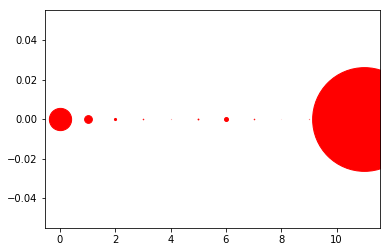

[((8, 0), 1), ((4, 0), 3), ((9, 0), 5), ((10, 0), 7), ((3, 0), 13), ((7, 0), 13), ((5, 0), 20), ((2, 0), 51), ((6, 0), 95), ((1, 0), 186), ((0, 0), 534), ((11, 0), 2490)]
245


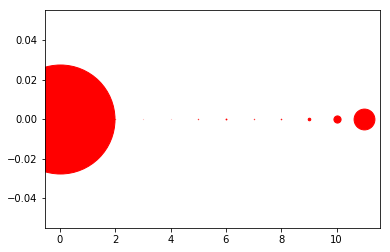

[((3, 0), 2), ((4, 0), 2), ((1, 0), 6), ((2, 0), 7), ((7, 0), 9), ((5, 0), 9), ((8, 0), 13), ((6, 0), 20), ((9, 0), 62), ((10, 0), 172), ((11, 0), 500), ((0, 0), 2616)]
246


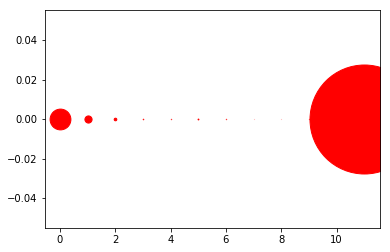

[((8, 0), 2), ((7, 0), 2), ((10, 0), 6), ((9, 0), 7), ((4, 0), 9), ((6, 0), 9), ((3, 0), 13), ((5, 0), 20), ((2, 0), 63), ((1, 0), 172), ((0, 0), 499), ((11, 0), 2616)]
247


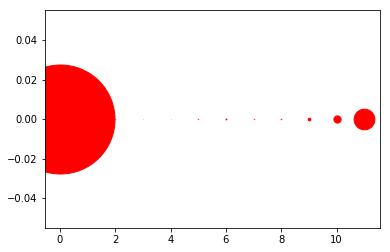

[((3, 0), 2), ((4, 0), 2), ((1, 0), 6), ((2, 0), 7), ((7, 0), 9), ((5, 0), 9), ((8, 0), 13), ((6, 0), 20), ((9, 0), 64), ((10, 0), 173), ((11, 0), 497), ((0, 0), 2616)]
248


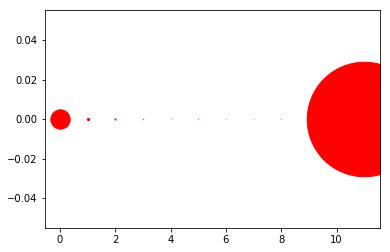

[((6, 0), 3), ((4, 0), 4), ((7, 0), 4), ((8, 0), 5), ((5, 0), 6), ((3, 0), 8), ((9, 0), 17), ((2, 0), 26), ((1, 0), 54), ((10, 0), 79), ((0, 0), 464), ((11, 0), 2748)]
249


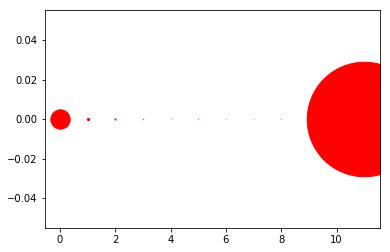

[((6, 0), 3), ((4, 0), 4), ((7, 0), 4), ((8, 0), 5), ((5, 0), 6), ((3, 0), 8), ((9, 0), 18), ((2, 0), 26), ((1, 0), 54), ((10, 0), 78), ((0, 0), 464), ((11, 0), 2748)]
250


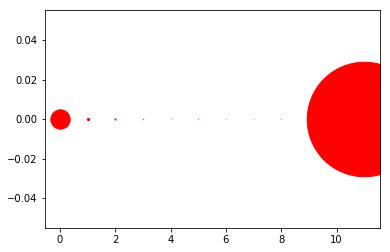

[((6, 0), 3), ((4, 0), 4), ((7, 0), 4), ((8, 0), 5), ((5, 0), 6), ((3, 0), 8), ((9, 0), 18), ((2, 0), 26), ((1, 0), 54), ((10, 0), 78), ((0, 0), 464), ((11, 0), 2748)]
251


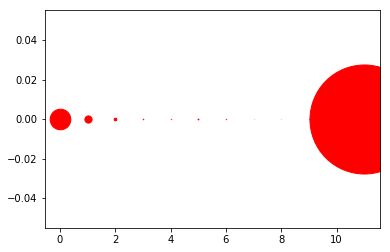

[((8, 0), 2), ((7, 0), 2), ((10, 0), 6), ((9, 0), 7), ((4, 0), 9), ((6, 0), 10), ((3, 0), 13), ((5, 0), 20), ((2, 0), 64), ((1, 0), 173), ((0, 0), 495), ((11, 0), 2617)]
252


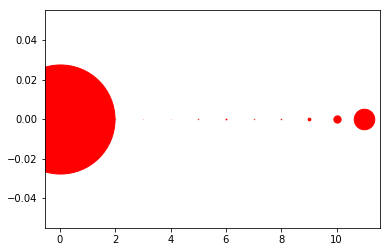

[((3, 0), 2), ((4, 0), 2), ((1, 0), 6), ((2, 0), 7), ((7, 0), 9), ((5, 0), 10), ((8, 0), 13), ((6, 0), 20), ((9, 0), 64), ((10, 0), 174), ((11, 0), 493), ((0, 0), 2618)]
253


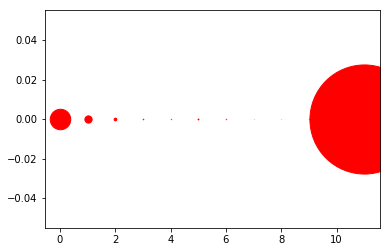

[((8, 0), 2), ((7, 0), 2), ((10, 0), 6), ((9, 0), 7), ((4, 0), 9), ((6, 0), 10), ((3, 0), 13), ((5, 0), 20), ((2, 0), 64), ((1, 0), 174), ((0, 0), 492), ((11, 0), 2619)]
254


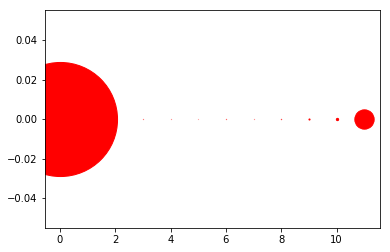

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((3, 0), 5), ((6, 0), 6), ((8, 0), 8), ((2, 0), 18), ((9, 0), 26), ((10, 0), 55), ((1, 0), 87), ((11, 0), 464), ((0, 0), 2738)]
255


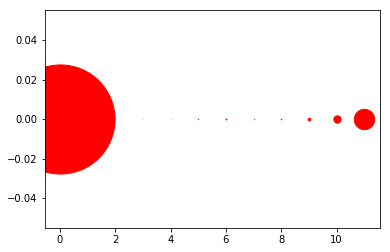

[((3, 0), 2), ((4, 0), 2), ((1, 0), 6), ((2, 0), 7), ((7, 0), 9), ((5, 0), 11), ((8, 0), 14), ((6, 0), 20), ((9, 0), 63), ((10, 0), 176), ((11, 0), 489), ((0, 0), 2619)]
256


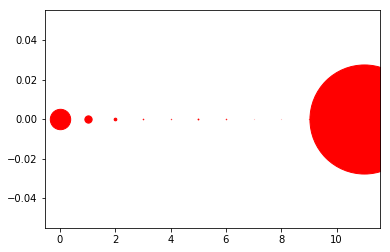

[((8, 0), 2), ((7, 0), 2), ((10, 0), 6), ((9, 0), 7), ((4, 0), 9), ((6, 0), 12), ((3, 0), 14), ((5, 0), 20), ((2, 0), 64), ((1, 0), 175), ((0, 0), 489), ((11, 0), 2618)]
257


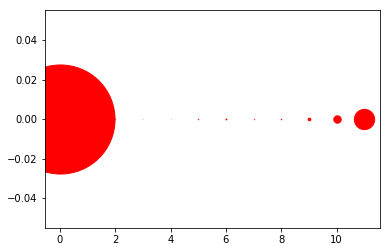

[((3, 0), 2), ((4, 0), 2), ((1, 0), 6), ((2, 0), 7), ((7, 0), 9), ((5, 0), 12), ((8, 0), 14), ((6, 0), 20), ((9, 0), 64), ((10, 0), 178), ((11, 0), 486), ((0, 0), 2618)]
258


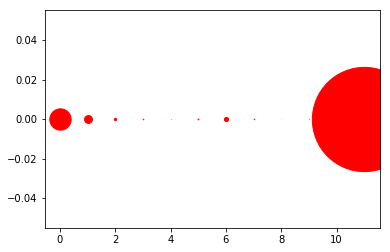

[((8, 0), 1), ((4, 0), 3), ((9, 0), 5), ((10, 0), 8), ((3, 0), 13), ((7, 0), 13), ((5, 0), 18), ((2, 0), 56), ((6, 0), 98), ((1, 0), 189), ((0, 0), 512), ((11, 0), 2502)]
259


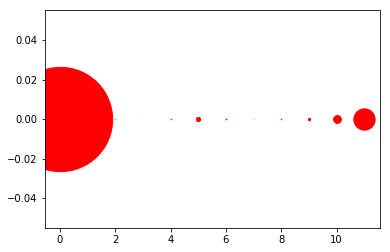

[((3, 0), 1), ((7, 0), 3), ((2, 0), 5), ((1, 0), 8), ((8, 0), 13), ((4, 0), 13), ((6, 0), 18), ((9, 0), 56), ((5, 0), 99), ((10, 0), 188), ((11, 0), 511), ((0, 0), 2503)]
260


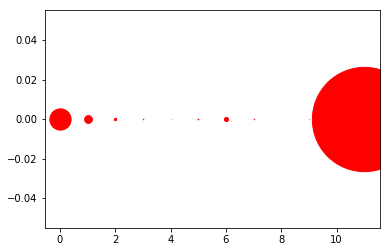

[((8, 0), 1), ((4, 0), 3), ((9, 0), 5), ((10, 0), 8), ((3, 0), 13), ((7, 0), 13), ((5, 0), 18), ((2, 0), 57), ((6, 0), 100), ((1, 0), 187), ((0, 0), 510), ((11, 0), 2503)]
261


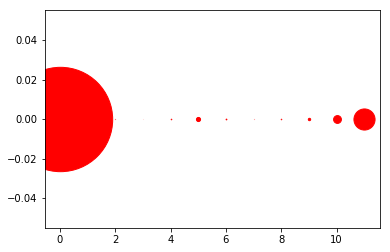

[((3, 0), 1), ((7, 0), 3), ((2, 0), 5), ((1, 0), 8), ((8, 0), 13), ((4, 0), 14), ((6, 0), 18), ((9, 0), 57), ((5, 0), 99), ((10, 0), 188), ((11, 0), 507), ((0, 0), 2505)]
262


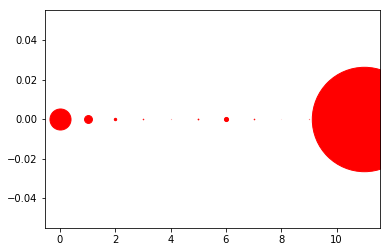

[((8, 0), 1), ((4, 0), 3), ((9, 0), 5), ((10, 0), 8), ((3, 0), 13), ((7, 0), 14), ((5, 0), 18), ((2, 0), 57), ((6, 0), 99), ((1, 0), 189), ((0, 0), 505), ((11, 0), 2506)]
263


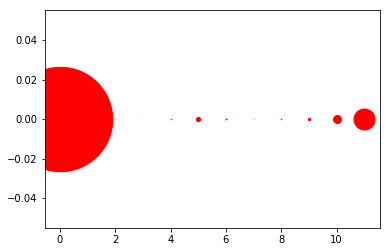

[((3, 0), 1), ((7, 0), 3), ((2, 0), 5), ((1, 0), 8), ((8, 0), 13), ((4, 0), 14), ((6, 0), 19), ((9, 0), 56), ((5, 0), 99), ((10, 0), 190), ((11, 0), 504), ((0, 0), 2506)]
264


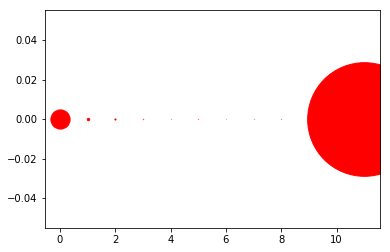

[((6, 0), 3), ((4, 0), 4), ((7, 0), 4), ((8, 0), 5), ((5, 0), 6), ((3, 0), 8), ((9, 0), 20), ((2, 0), 27), ((1, 0), 56), ((10, 0), 96), ((0, 0), 461), ((11, 0), 2728)]
265


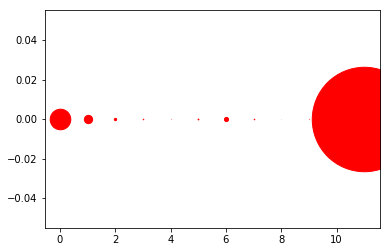

[((8, 0), 1), ((4, 0), 3), ((9, 0), 5), ((10, 0), 8), ((3, 0), 13), ((7, 0), 14), ((5, 0), 19), ((2, 0), 56), ((6, 0), 99), ((1, 0), 199), ((0, 0), 494), ((11, 0), 2507)]
266


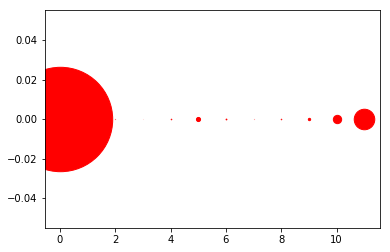

[((3, 0), 1), ((7, 0), 3), ((2, 0), 5), ((1, 0), 9), ((8, 0), 13), ((4, 0), 14), ((6, 0), 19), ((9, 0), 56), ((5, 0), 99), ((10, 0), 200), ((11, 0), 493), ((0, 0), 2506)]
267


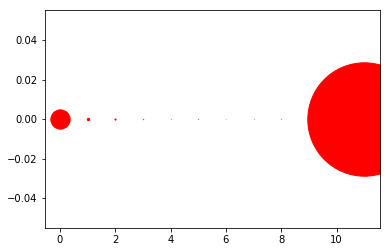

[((6, 0), 3), ((4, 0), 4), ((7, 0), 4), ((8, 0), 5), ((5, 0), 6), ((3, 0), 8), ((9, 0), 23), ((2, 0), 27), ((1, 0), 57), ((10, 0), 96), ((0, 0), 463), ((11, 0), 2722)]
268


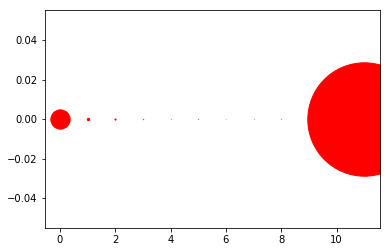

[((6, 0), 3), ((4, 0), 4), ((7, 0), 4), ((8, 0), 5), ((5, 0), 6), ((3, 0), 8), ((9, 0), 23), ((2, 0), 27), ((1, 0), 57), ((10, 0), 96), ((0, 0), 463), ((11, 0), 2722)]
269


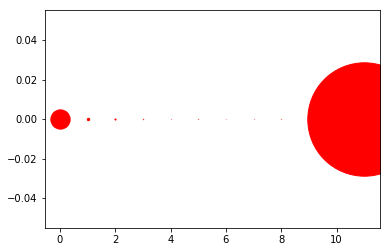

[((6, 0), 3), ((4, 0), 4), ((7, 0), 4), ((8, 0), 5), ((5, 0), 6), ((3, 0), 9), ((9, 0), 23), ((2, 0), 26), ((1, 0), 57), ((10, 0), 96), ((0, 0), 463), ((11, 0), 2722)]
270


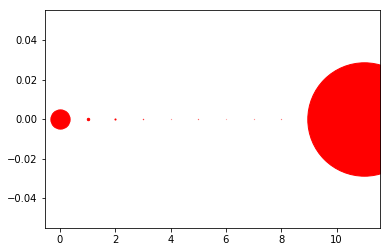

[((6, 0), 3), ((4, 0), 4), ((7, 0), 4), ((8, 0), 5), ((5, 0), 6), ((3, 0), 9), ((9, 0), 23), ((2, 0), 26), ((1, 0), 58), ((10, 0), 96), ((0, 0), 462), ((11, 0), 2722)]
271


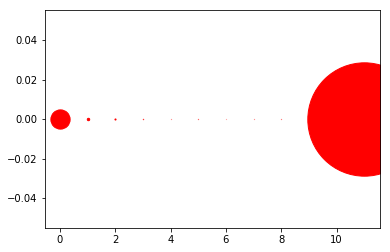

[((6, 0), 3), ((4, 0), 4), ((7, 0), 4), ((8, 0), 5), ((5, 0), 6), ((3, 0), 9), ((9, 0), 23), ((2, 0), 26), ((1, 0), 58), ((10, 0), 97), ((0, 0), 462), ((11, 0), 2721)]
272


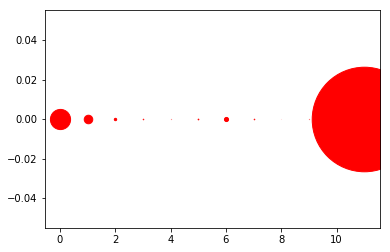

[((8, 0), 1), ((4, 0), 4), ((9, 0), 5), ((10, 0), 9), ((3, 0), 13), ((7, 0), 14), ((5, 0), 17), ((2, 0), 57), ((6, 0), 99), ((1, 0), 205), ((0, 0), 484), ((11, 0), 2510)]
273


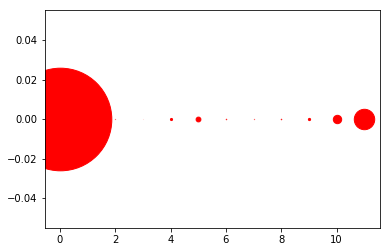

[((3, 0), 1), ((2, 0), 5), ((7, 0), 6), ((1, 0), 10), ((6, 0), 11), ((8, 0), 12), ((4, 0), 51), ((9, 0), 53), ((5, 0), 115), ((10, 0), 201), ((11, 0), 490), ((0, 0), 2463)]
274


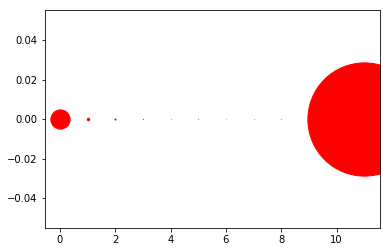

[((6, 0), 3), ((4, 0), 4), ((7, 0), 4), ((8, 0), 5), ((5, 0), 6), ((3, 0), 9), ((9, 0), 24), ((2, 0), 26), ((1, 0), 58), ((10, 0), 99), ((0, 0), 462), ((11, 0), 2718)]
275


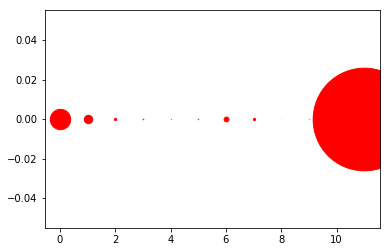

[((8, 0), 1), ((9, 0), 5), ((4, 0), 6), ((10, 0), 10), ((5, 0), 11), ((3, 0), 13), ((2, 0), 52), ((7, 0), 52), ((6, 0), 115), ((1, 0), 201), ((0, 0), 488), ((11, 0), 2464)]
276


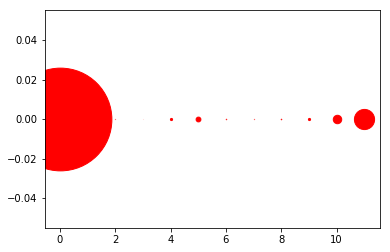

[((3, 0), 1), ((2, 0), 5), ((7, 0), 6), ((1, 0), 10), ((6, 0), 11), ((8, 0), 13), ((9, 0), 52), ((4, 0), 52), ((5, 0), 115), ((10, 0), 203), ((11, 0), 484), ((0, 0), 2466)]
277


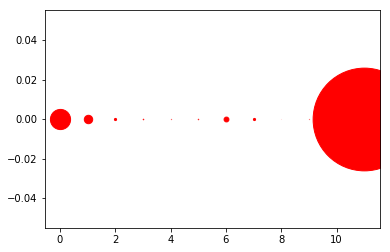

[((8, 0), 1), ((9, 0), 5), ((4, 0), 6), ((10, 0), 10), ((5, 0), 11), ((3, 0), 13), ((2, 0), 52), ((7, 0), 52), ((6, 0), 116), ((1, 0), 202), ((0, 0), 484), ((11, 0), 2466)]
278


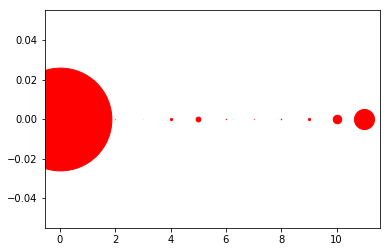

[((3, 0), 1), ((2, 0), 5), ((7, 0), 6), ((1, 0), 10), ((6, 0), 11), ((8, 0), 13), ((9, 0), 52), ((4, 0), 52), ((5, 0), 116), ((10, 0), 205), ((11, 0), 481), ((0, 0), 2466)]
279


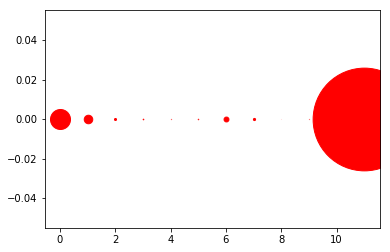

[((8, 0), 1), ((9, 0), 5), ((4, 0), 6), ((10, 0), 10), ((5, 0), 12), ((3, 0), 15), ((2, 0), 49), ((7, 0), 52), ((6, 0), 117), ((1, 0), 205), ((0, 0), 480), ((11, 0), 2466)]
280


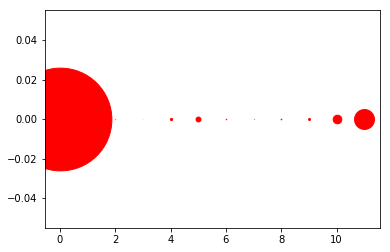

[((3, 0), 1), ((7, 0), 5), ((2, 0), 5), ((1, 0), 10), ((6, 0), 12), ((8, 0), 16), ((9, 0), 48), ((4, 0), 53), ((5, 0), 117), ((10, 0), 207), ((11, 0), 478), ((0, 0), 2466)]
281


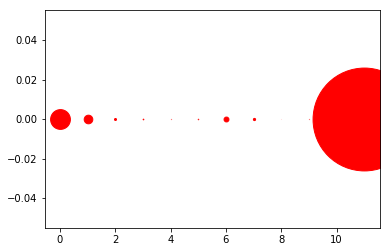

[((8, 0), 1), ((4, 0), 5), ((9, 0), 5), ((10, 0), 10), ((5, 0), 12), ((3, 0), 16), ((2, 0), 48), ((7, 0), 53), ((6, 0), 117), ((1, 0), 207), ((0, 0), 475), ((11, 0), 2469)]
282


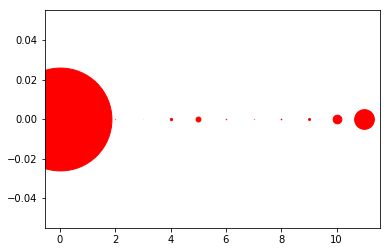

[((3, 0), 1), ((7, 0), 5), ((2, 0), 5), ((1, 0), 10), ((6, 0), 12), ((8, 0), 16), ((9, 0), 48), ((4, 0), 53), ((5, 0), 117), ((10, 0), 209), ((11, 0), 473), ((0, 0), 2469)]
283


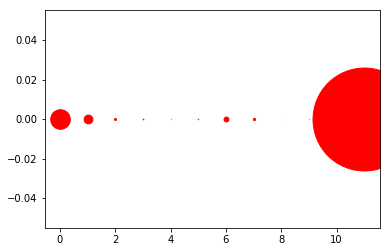

[((8, 0), 1), ((4, 0), 5), ((9, 0), 5), ((10, 0), 10), ((5, 0), 12), ((3, 0), 16), ((2, 0), 48), ((7, 0), 53), ((6, 0), 117), ((1, 0), 211), ((0, 0), 470), ((11, 0), 2470)]
284


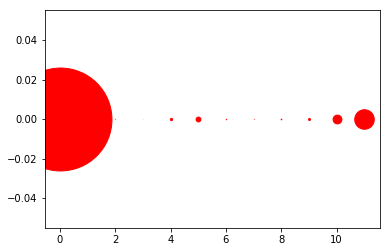

[((3, 0), 1), ((7, 0), 5), ((2, 0), 5), ((1, 0), 10), ((6, 0), 12), ((8, 0), 16), ((9, 0), 48), ((4, 0), 54), ((5, 0), 116), ((10, 0), 212), ((11, 0), 469), ((0, 0), 2470)]
285


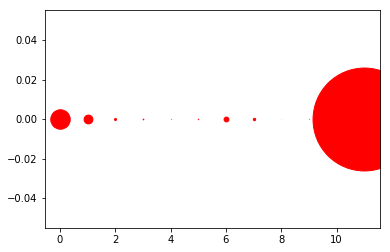

[((8, 0), 1), ((4, 0), 5), ((9, 0), 5), ((10, 0), 10), ((5, 0), 12), ((3, 0), 16), ((2, 0), 48), ((7, 0), 56), ((6, 0), 116), ((1, 0), 212), ((0, 0), 467), ((11, 0), 2470)]
286


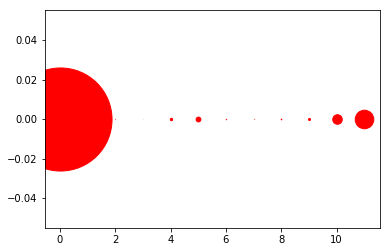

[((3, 0), 1), ((7, 0), 5), ((2, 0), 5), ((1, 0), 10), ((6, 0), 11), ((8, 0), 16), ((9, 0), 49), ((4, 0), 57), ((5, 0), 115), ((10, 0), 229), ((11, 0), 446), ((0, 0), 2474)]
287


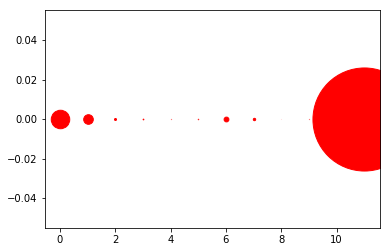

[((8, 0), 1), ((4, 0), 5), ((9, 0), 5), ((10, 0), 10), ((5, 0), 11), ((3, 0), 17), ((2, 0), 48), ((7, 0), 57), ((6, 0), 115), ((1, 0), 231), ((0, 0), 444), ((11, 0), 2474)]
288


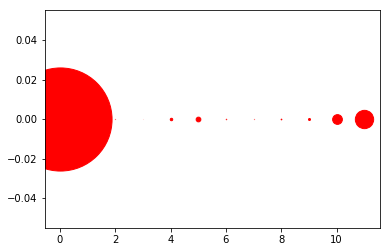

[((3, 0), 1), ((7, 0), 5), ((2, 0), 5), ((1, 0), 10), ((6, 0), 11), ((8, 0), 17), ((9, 0), 48), ((4, 0), 59), ((5, 0), 113), ((10, 0), 234), ((11, 0), 440), ((0, 0), 2475)]
289


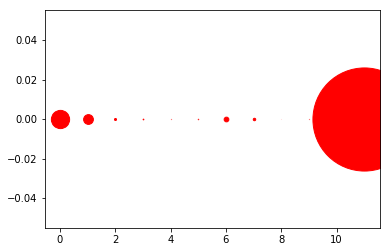

[((8, 0), 1), ((4, 0), 5), ((9, 0), 5), ((10, 0), 10), ((5, 0), 11), ((3, 0), 17), ((2, 0), 49), ((7, 0), 59), ((6, 0), 113), ((1, 0), 235), ((0, 0), 438), ((11, 0), 2475)]
290


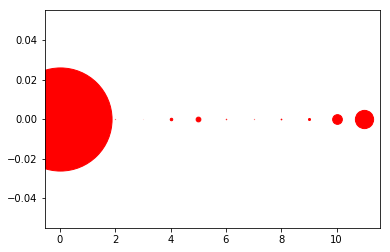

[((3, 0), 1), ((7, 0), 5), ((2, 0), 5), ((1, 0), 10), ((6, 0), 11), ((8, 0), 17), ((9, 0), 49), ((4, 0), 60), ((5, 0), 114), ((10, 0), 233), ((11, 0), 438), ((0, 0), 2475)]
291


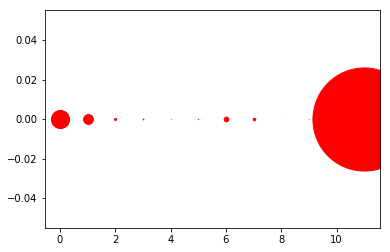

[((8, 0), 1), ((4, 0), 5), ((9, 0), 5), ((10, 0), 10), ((5, 0), 11), ((3, 0), 17), ((2, 0), 49), ((7, 0), 62), ((6, 0), 112), ((1, 0), 236), ((0, 0), 435), ((11, 0), 2475)]
292


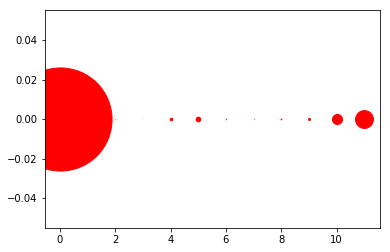

[((3, 0), 1), ((7, 0), 5), ((2, 0), 5), ((1, 0), 10), ((6, 0), 11), ((8, 0), 17), ((9, 0), 49), ((4, 0), 62), ((5, 0), 112), ((10, 0), 242), ((11, 0), 429), ((0, 0), 2475)]
293


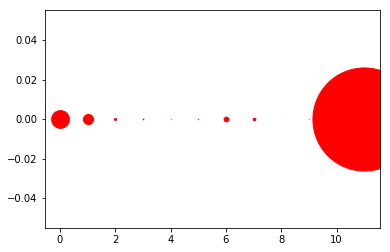

[((8, 0), 1), ((4, 0), 5), ((9, 0), 5), ((10, 0), 10), ((5, 0), 10), ((3, 0), 17), ((2, 0), 49), ((7, 0), 62), ((6, 0), 114), ((1, 0), 243), ((0, 0), 427), ((11, 0), 2475)]
294


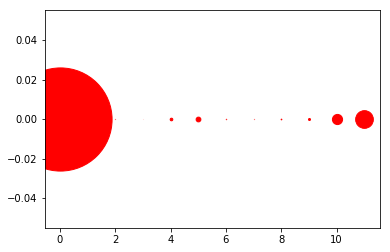

[((3, 0), 1), ((7, 0), 5), ((2, 0), 5), ((1, 0), 10), ((6, 0), 10), ((8, 0), 17), ((9, 0), 48), ((4, 0), 63), ((5, 0), 114), ((10, 0), 244), ((11, 0), 425), ((0, 0), 2476)]
295


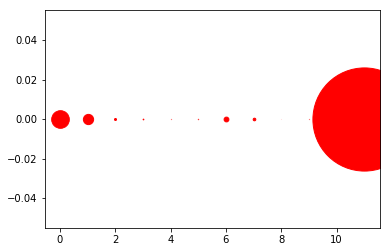

[((8, 0), 1), ((4, 0), 5), ((9, 0), 5), ((5, 0), 9), ((10, 0), 10), ((3, 0), 17), ((2, 0), 48), ((7, 0), 63), ((6, 0), 115), ((1, 0), 246), ((0, 0), 423), ((11, 0), 2476)]
296


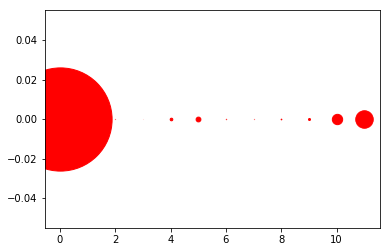

[((3, 0), 1), ((7, 0), 5), ((2, 0), 5), ((6, 0), 9), ((1, 0), 10), ((8, 0), 17), ((9, 0), 48), ((4, 0), 63), ((5, 0), 115), ((10, 0), 248), ((11, 0), 420), ((0, 0), 2477)]
297


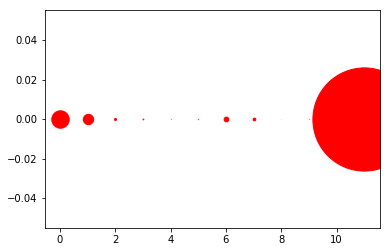

[((8, 0), 1), ((4, 0), 5), ((9, 0), 5), ((5, 0), 9), ((10, 0), 10), ((3, 0), 17), ((2, 0), 49), ((7, 0), 64), ((6, 0), 114), ((1, 0), 248), ((0, 0), 419), ((11, 0), 2477)]
298


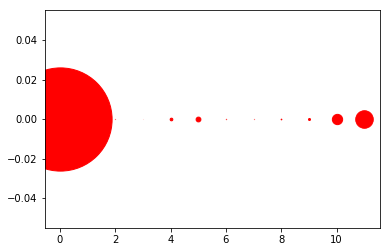

[((3, 0), 1), ((7, 0), 5), ((2, 0), 5), ((6, 0), 8), ((1, 0), 10), ((8, 0), 17), ((9, 0), 48), ((4, 0), 64), ((5, 0), 115), ((10, 0), 247), ((11, 0), 421), ((0, 0), 2477)]
299


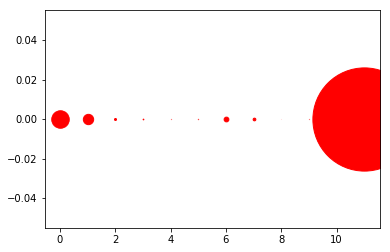

[((8, 0), 1), ((4, 0), 5), ((9, 0), 5), ((5, 0), 8), ((10, 0), 10), ((3, 0), 17), ((2, 0), 48), ((7, 0), 65), ((6, 0), 114), ((1, 0), 248), ((0, 0), 420), ((11, 0), 2477)]
300


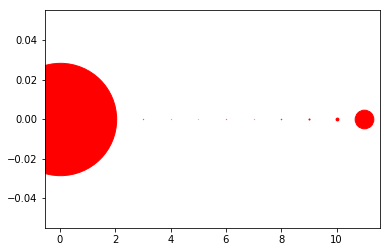

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((6, 0), 6), ((3, 0), 7), ((8, 0), 11), ((9, 0), 25), ((2, 0), 27), ((10, 0), 68), ((1, 0), 119), ((11, 0), 448), ((0, 0), 2696)]
301


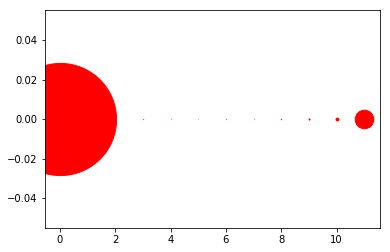

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((6, 0), 6), ((3, 0), 7), ((8, 0), 11), ((9, 0), 25), ((2, 0), 27), ((10, 0), 70), ((1, 0), 123), ((11, 0), 446), ((0, 0), 2692)]
302


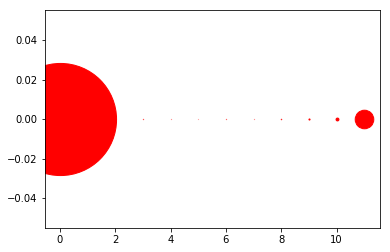

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((6, 0), 6), ((3, 0), 7), ((8, 0), 11), ((9, 0), 26), ((2, 0), 27), ((10, 0), 69), ((1, 0), 124), ((11, 0), 446), ((0, 0), 2691)]
303


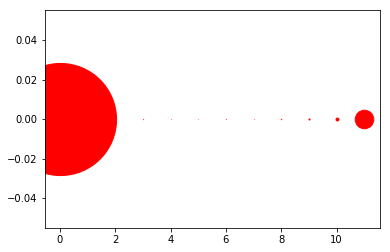

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((6, 0), 6), ((3, 0), 7), ((8, 0), 11), ((9, 0), 26), ((2, 0), 27), ((10, 0), 70), ((1, 0), 124), ((11, 0), 445), ((0, 0), 2691)]
304


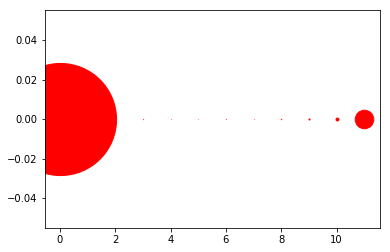

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((6, 0), 6), ((3, 0), 7), ((8, 0), 11), ((9, 0), 26), ((2, 0), 27), ((10, 0), 70), ((1, 0), 124), ((11, 0), 445), ((0, 0), 2691)]
305


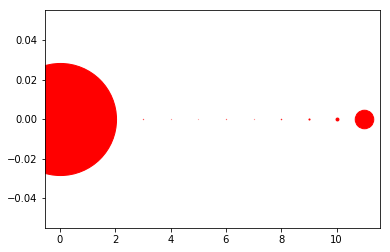

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((6, 0), 6), ((3, 0), 7), ((8, 0), 11), ((9, 0), 26), ((2, 0), 27), ((10, 0), 70), ((1, 0), 125), ((11, 0), 445), ((0, 0), 2690)]
306


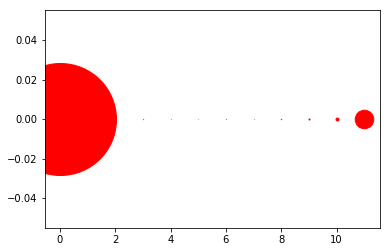

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((6, 0), 6), ((3, 0), 7), ((8, 0), 11), ((9, 0), 26), ((2, 0), 27), ((10, 0), 70), ((1, 0), 127), ((11, 0), 445), ((0, 0), 2688)]
307


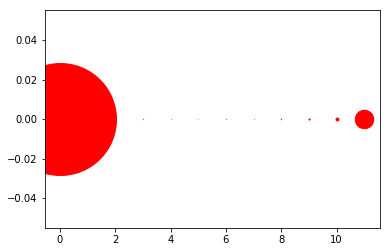

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((6, 0), 6), ((3, 0), 7), ((8, 0), 11), ((9, 0), 26), ((2, 0), 27), ((10, 0), 70), ((1, 0), 128), ((11, 0), 445), ((0, 0), 2687)]
308


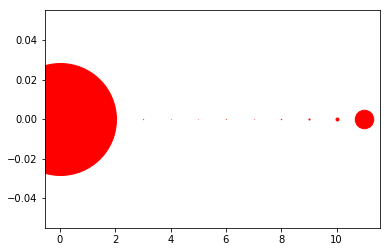

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((6, 0), 6), ((3, 0), 7), ((8, 0), 11), ((9, 0), 26), ((2, 0), 27), ((10, 0), 71), ((1, 0), 128), ((11, 0), 444), ((0, 0), 2687)]
309


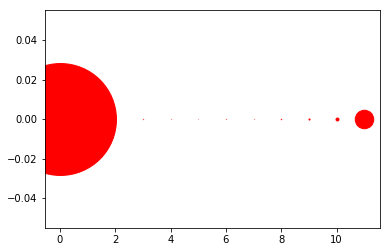

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((6, 0), 6), ((3, 0), 7), ((8, 0), 11), ((9, 0), 26), ((2, 0), 28), ((10, 0), 71), ((1, 0), 128), ((11, 0), 444), ((0, 0), 2686)]
310


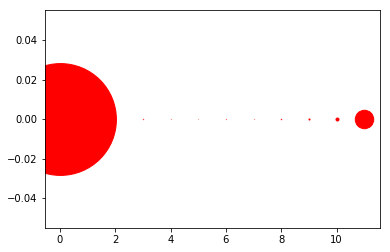

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((6, 0), 6), ((3, 0), 8), ((8, 0), 11), ((9, 0), 26), ((2, 0), 28), ((10, 0), 72), ((1, 0), 129), ((11, 0), 443), ((0, 0), 2684)]
311


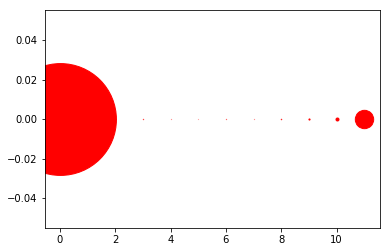

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((6, 0), 6), ((3, 0), 8), ((8, 0), 11), ((9, 0), 27), ((2, 0), 28), ((10, 0), 72), ((1, 0), 130), ((11, 0), 441), ((0, 0), 2684)]
312


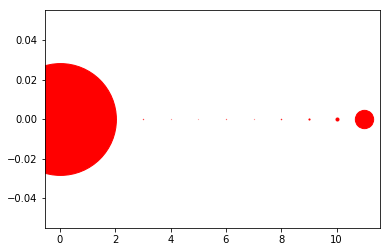

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((6, 0), 6), ((3, 0), 8), ((8, 0), 11), ((9, 0), 27), ((2, 0), 28), ((10, 0), 73), ((1, 0), 130), ((11, 0), 440), ((0, 0), 2684)]
313


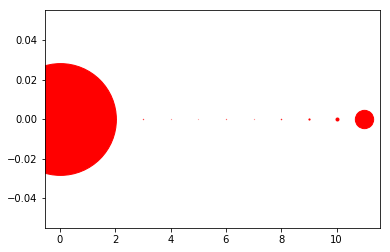

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((6, 0), 6), ((3, 0), 8), ((8, 0), 11), ((9, 0), 28), ((2, 0), 29), ((10, 0), 72), ((1, 0), 130), ((11, 0), 440), ((0, 0), 2683)]
314


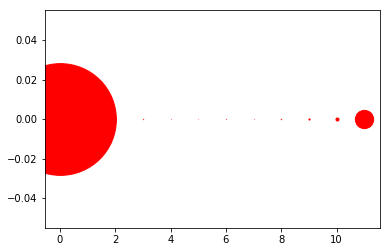

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((6, 0), 6), ((3, 0), 8), ((8, 0), 11), ((9, 0), 28), ((2, 0), 29), ((10, 0), 73), ((1, 0), 131), ((11, 0), 439), ((0, 0), 2682)]
315


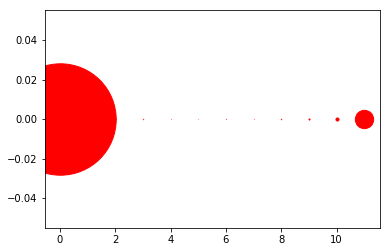

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((6, 0), 6), ((3, 0), 9), ((8, 0), 11), ((9, 0), 26), ((2, 0), 34), ((10, 0), 74), ((1, 0), 133), ((11, 0), 440), ((0, 0), 2674)]
316


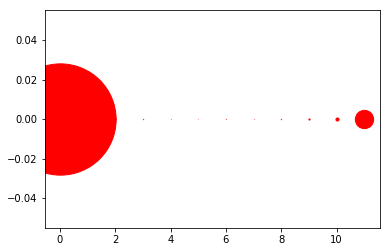

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((6, 0), 6), ((3, 0), 9), ((8, 0), 10), ((9, 0), 28), ((2, 0), 35), ((10, 0), 74), ((1, 0), 134), ((11, 0), 440), ((0, 0), 2671)]
317


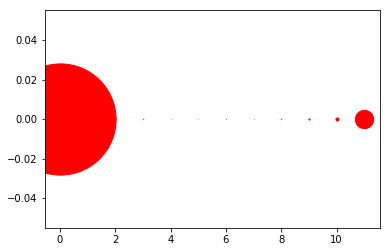

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((6, 0), 6), ((3, 0), 9), ((8, 0), 10), ((9, 0), 28), ((2, 0), 35), ((10, 0), 75), ((1, 0), 135), ((11, 0), 440), ((0, 0), 2669)]
318


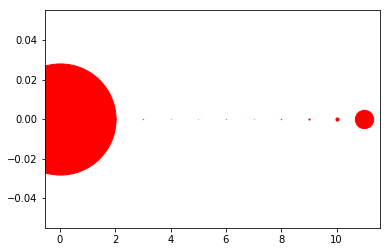

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((6, 0), 6), ((3, 0), 9), ((8, 0), 10), ((9, 0), 28), ((2, 0), 35), ((10, 0), 75), ((1, 0), 137), ((11, 0), 440), ((0, 0), 2667)]
319


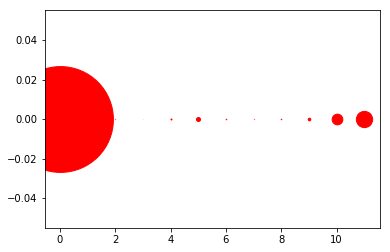

[((3, 0), 1), ((7, 0), 6), ((2, 0), 6), ((1, 0), 9), ((8, 0), 13), ((6, 0), 14), ((4, 0), 24), ((9, 0), 62), ((5, 0), 95), ((10, 0), 257), ((11, 0), 391), ((0, 0), 2540)]
320


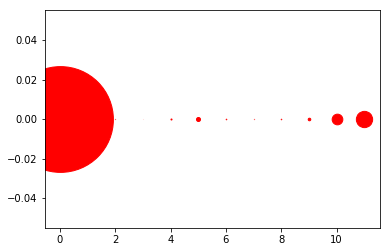

[((3, 0), 1), ((7, 0), 6), ((2, 0), 6), ((1, 0), 9), ((8, 0), 13), ((6, 0), 14), ((4, 0), 25), ((9, 0), 62), ((5, 0), 96), ((10, 0), 256), ((11, 0), 391), ((0, 0), 2539)]
321


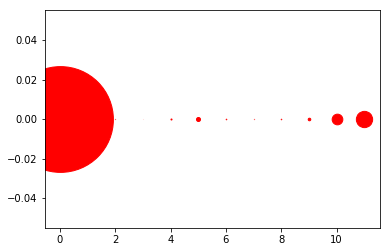

[((3, 0), 1), ((7, 0), 6), ((2, 0), 6), ((1, 0), 9), ((8, 0), 13), ((6, 0), 14), ((4, 0), 25), ((9, 0), 62), ((5, 0), 96), ((10, 0), 256), ((11, 0), 391), ((0, 0), 2539)]
322


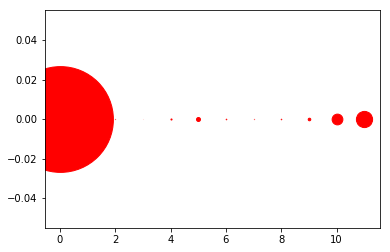

[((3, 0), 1), ((7, 0), 6), ((2, 0), 6), ((1, 0), 9), ((8, 0), 13), ((6, 0), 14), ((4, 0), 26), ((9, 0), 62), ((5, 0), 95), ((10, 0), 258), ((11, 0), 389), ((0, 0), 2539)]
323


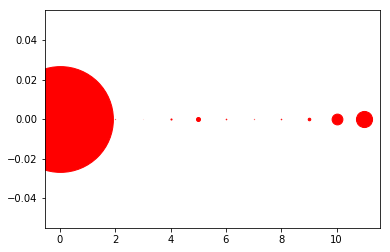

[((3, 0), 1), ((7, 0), 6), ((2, 0), 6), ((1, 0), 9), ((8, 0), 13), ((6, 0), 14), ((4, 0), 26), ((9, 0), 62), ((5, 0), 96), ((10, 0), 259), ((11, 0), 387), ((0, 0), 2539)]
324


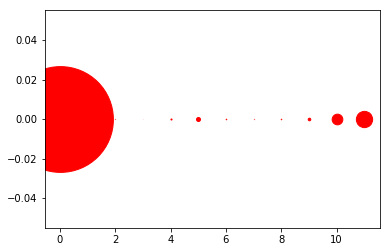

[((3, 0), 1), ((7, 0), 6), ((2, 0), 6), ((1, 0), 9), ((8, 0), 13), ((6, 0), 14), ((4, 0), 26), ((9, 0), 62), ((5, 0), 95), ((10, 0), 256), ((11, 0), 391), ((0, 0), 2539)]
325


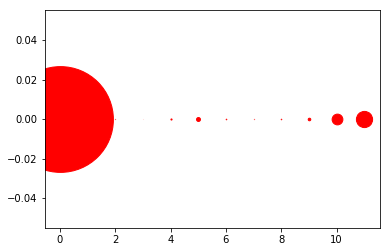

[((3, 0), 1), ((7, 0), 6), ((2, 0), 6), ((1, 0), 9), ((8, 0), 13), ((6, 0), 14), ((4, 0), 27), ((9, 0), 62), ((5, 0), 94), ((10, 0), 258), ((11, 0), 389), ((0, 0), 2539)]
326


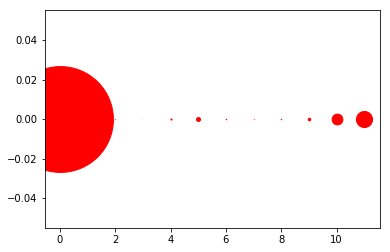

[((3, 0), 1), ((7, 0), 6), ((2, 0), 6), ((1, 0), 9), ((8, 0), 13), ((6, 0), 14), ((4, 0), 27), ((9, 0), 62), ((5, 0), 94), ((10, 0), 259), ((11, 0), 387), ((0, 0), 2540)]
327


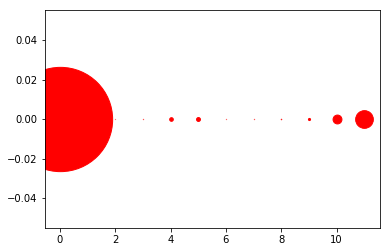

[((2, 0), 5), ((6, 0), 6), ((3, 0), 7), ((7, 0), 7), ((1, 0), 9), ((8, 0), 12), ((9, 0), 51), ((4, 0), 87), ((5, 0), 93), ((10, 0), 213), ((11, 0), 425), ((0, 0), 2503)]
328


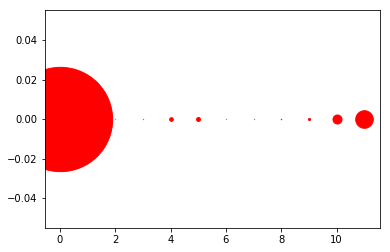

[((2, 0), 5), ((6, 0), 6), ((3, 0), 7), ((7, 0), 7), ((1, 0), 9), ((8, 0), 12), ((9, 0), 51), ((4, 0), 87), ((5, 0), 93), ((10, 0), 216), ((11, 0), 422), ((0, 0), 2503)]
329


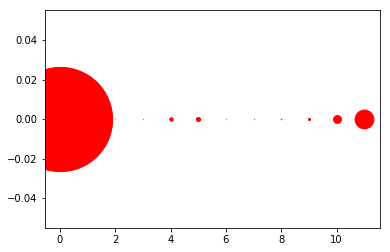

[((2, 0), 4), ((3, 0), 6), ((6, 0), 6), ((7, 0), 8), ((1, 0), 9), ((8, 0), 13), ((9, 0), 49), ((4, 0), 83), ((5, 0), 97), ((10, 0), 190), ((11, 0), 451), ((0, 0), 2502)]
330


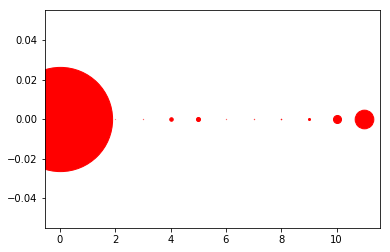

[((2, 0), 4), ((3, 0), 6), ((6, 0), 6), ((7, 0), 8), ((1, 0), 9), ((8, 0), 13), ((9, 0), 49), ((4, 0), 84), ((5, 0), 97), ((10, 0), 193), ((11, 0), 448), ((0, 0), 2501)]
331


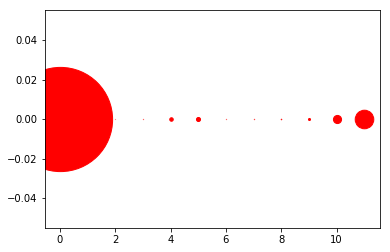

[((2, 0), 4), ((3, 0), 6), ((6, 0), 6), ((7, 0), 8), ((1, 0), 9), ((8, 0), 13), ((9, 0), 49), ((4, 0), 84), ((5, 0), 97), ((10, 0), 195), ((11, 0), 446), ((0, 0), 2501)]
332


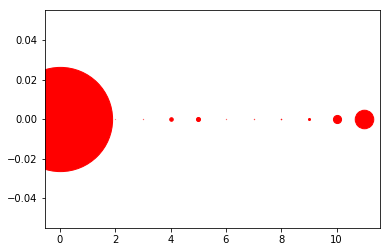

[((2, 0), 4), ((3, 0), 6), ((6, 0), 6), ((7, 0), 8), ((1, 0), 9), ((8, 0), 13), ((9, 0), 49), ((4, 0), 85), ((5, 0), 97), ((10, 0), 195), ((11, 0), 445), ((0, 0), 2501)]
333


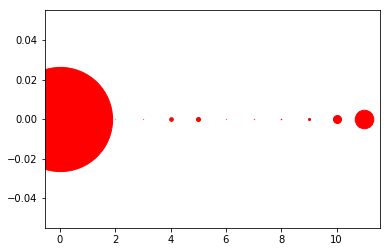

[((2, 0), 4), ((3, 0), 6), ((6, 0), 6), ((7, 0), 8), ((1, 0), 9), ((8, 0), 13), ((9, 0), 50), ((4, 0), 87), ((5, 0), 96), ((10, 0), 193), ((11, 0), 445), ((0, 0), 2501)]
334


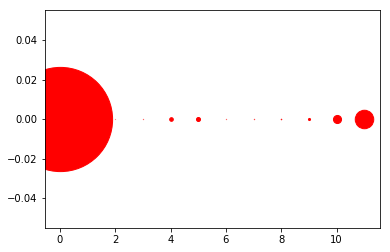

[((2, 0), 4), ((3, 0), 6), ((6, 0), 6), ((7, 0), 8), ((1, 0), 9), ((8, 0), 13), ((9, 0), 50), ((4, 0), 87), ((5, 0), 96), ((10, 0), 194), ((11, 0), 444), ((0, 0), 2501)]
335


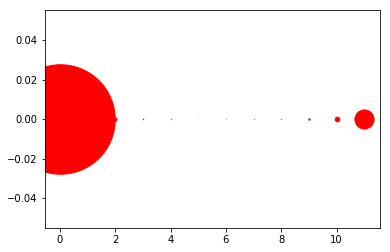

[((5, 0), 1), ((6, 0), 4), ((7, 0), 6), ((8, 0), 7), ((4, 0), 8), ((3, 0), 14), ((9, 0), 33), ((1, 0), 71), ((2, 0), 75), ((10, 0), 112), ((11, 0), 459), ((0, 0), 2628)]
336


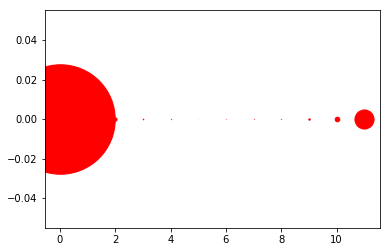

[((5, 0), 1), ((6, 0), 4), ((7, 0), 6), ((8, 0), 7), ((4, 0), 8), ((3, 0), 14), ((9, 0), 34), ((1, 0), 70), ((2, 0), 76), ((10, 0), 111), ((11, 0), 459), ((0, 0), 2628)]
337


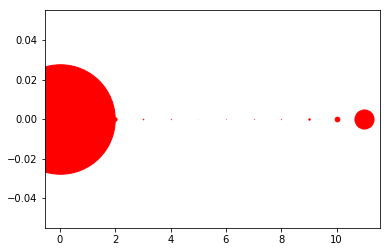

[((5, 0), 1), ((6, 0), 4), ((7, 0), 6), ((8, 0), 7), ((4, 0), 8), ((3, 0), 14), ((9, 0), 34), ((1, 0), 68), ((2, 0), 78), ((10, 0), 112), ((11, 0), 458), ((0, 0), 2628)]
338


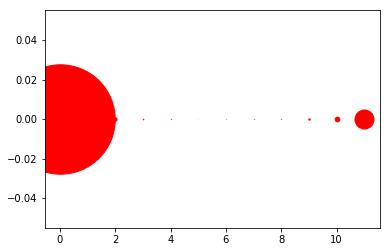

[((5, 0), 1), ((6, 0), 4), ((7, 0), 6), ((8, 0), 7), ((4, 0), 8), ((3, 0), 14), ((9, 0), 34), ((1, 0), 68), ((2, 0), 79), ((10, 0), 113), ((11, 0), 457), ((0, 0), 2627)]
339


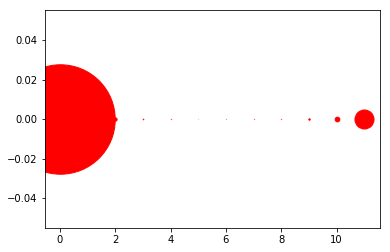

[((5, 0), 2), ((6, 0), 4), ((7, 0), 6), ((8, 0), 7), ((4, 0), 7), ((3, 0), 14), ((9, 0), 34), ((1, 0), 68), ((2, 0), 79), ((10, 0), 113), ((11, 0), 457), ((0, 0), 2627)]
340


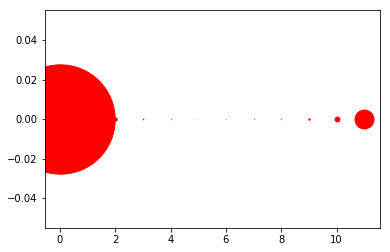

[((5, 0), 2), ((6, 0), 4), ((7, 0), 6), ((8, 0), 7), ((4, 0), 7), ((3, 0), 14), ((9, 0), 34), ((1, 0), 66), ((2, 0), 82), ((10, 0), 117), ((11, 0), 455), ((0, 0), 2624)]
341


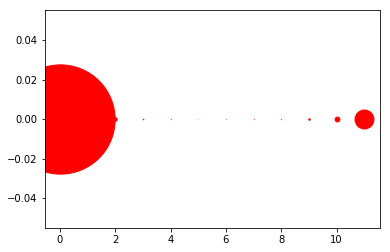

[((5, 0), 2), ((6, 0), 4), ((7, 0), 6), ((8, 0), 7), ((4, 0), 7), ((3, 0), 14), ((9, 0), 35), ((1, 0), 67), ((2, 0), 82), ((10, 0), 116), ((11, 0), 455), ((0, 0), 2623)]
342


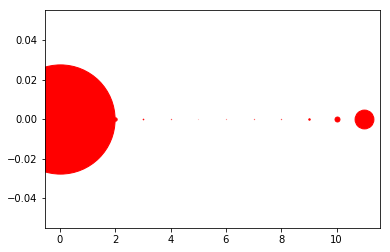

[((5, 0), 2), ((6, 0), 4), ((7, 0), 6), ((8, 0), 7), ((4, 0), 7), ((3, 0), 15), ((9, 0), 35), ((1, 0), 69), ((2, 0), 81), ((10, 0), 119), ((11, 0), 452), ((0, 0), 2621)]
343


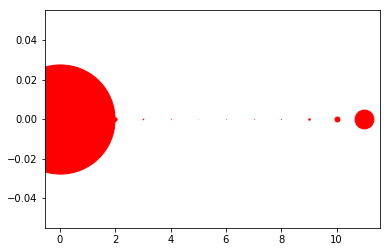

[((5, 0), 2), ((6, 0), 4), ((7, 0), 6), ((8, 0), 7), ((4, 0), 7), ((3, 0), 15), ((9, 0), 35), ((1, 0), 70), ((2, 0), 81), ((10, 0), 119), ((11, 0), 452), ((0, 0), 2620)]
344


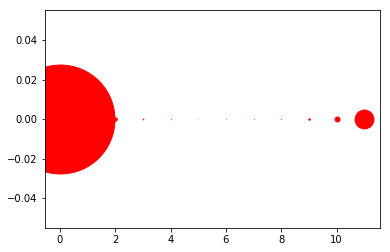

[((5, 0), 2), ((6, 0), 4), ((7, 0), 6), ((8, 0), 7), ((4, 0), 7), ((3, 0), 15), ((9, 0), 35), ((1, 0), 74), ((2, 0), 83), ((10, 0), 119), ((11, 0), 452), ((0, 0), 2614)]
345


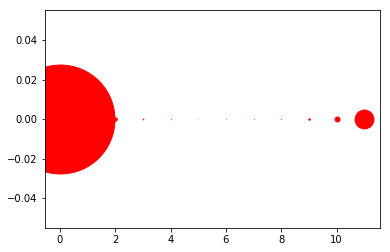

[((5, 0), 2), ((6, 0), 4), ((7, 0), 6), ((8, 0), 7), ((4, 0), 7), ((3, 0), 15), ((9, 0), 35), ((1, 0), 74), ((2, 0), 83), ((10, 0), 119), ((11, 0), 452), ((0, 0), 2614)]
346


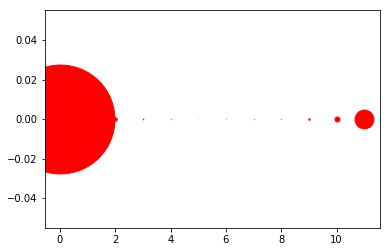

[((5, 0), 2), ((6, 0), 4), ((7, 0), 6), ((8, 0), 7), ((4, 0), 7), ((3, 0), 15), ((9, 0), 35), ((1, 0), 75), ((2, 0), 83), ((10, 0), 119), ((11, 0), 452), ((0, 0), 2613)]
347


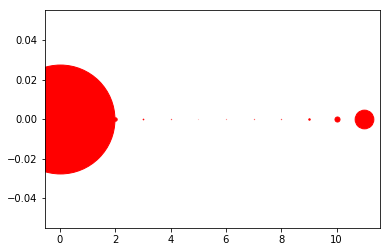

[((5, 0), 2), ((6, 0), 4), ((7, 0), 6), ((8, 0), 7), ((4, 0), 7), ((3, 0), 16), ((9, 0), 35), ((1, 0), 75), ((2, 0), 82), ((10, 0), 121), ((11, 0), 449), ((0, 0), 2614)]
348


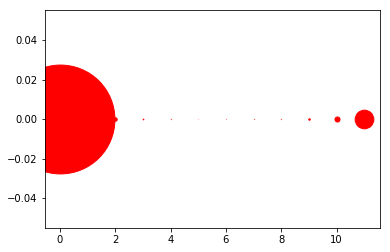

[((5, 0), 2), ((6, 0), 4), ((7, 0), 6), ((8, 0), 7), ((4, 0), 7), ((3, 0), 16), ((9, 0), 36), ((1, 0), 75), ((2, 0), 83), ((10, 0), 121), ((11, 0), 448), ((0, 0), 2613)]
349


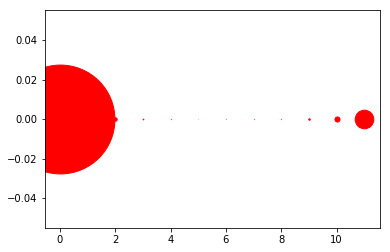

[((5, 0), 2), ((6, 0), 4), ((7, 0), 6), ((8, 0), 7), ((4, 0), 7), ((3, 0), 17), ((9, 0), 36), ((1, 0), 75), ((2, 0), 82), ((10, 0), 122), ((11, 0), 447), ((0, 0), 2613)]
350


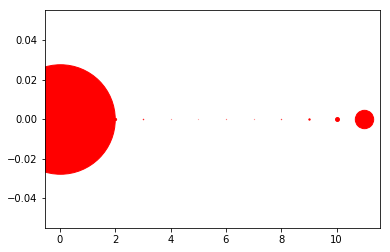

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((6, 0), 5), ((8, 0), 8), ((3, 0), 11), ((9, 0), 32), ((2, 0), 54), ((10, 0), 94), ((1, 0), 134), ((11, 0), 441), ((0, 0), 2628)]
351


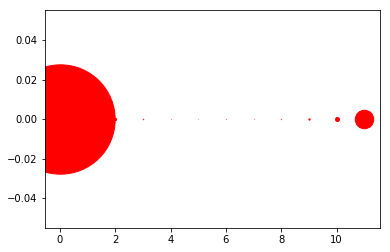

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((6, 0), 5), ((8, 0), 8), ((3, 0), 11), ((9, 0), 31), ((2, 0), 54), ((10, 0), 95), ((1, 0), 134), ((11, 0), 444), ((0, 0), 2625)]
352


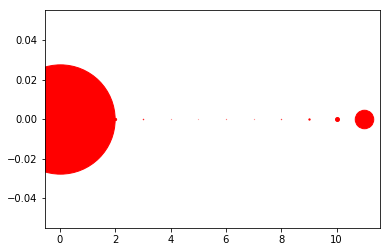

[((5, 0), 3), ((7, 0), 4), ((4, 0), 4), ((6, 0), 5), ((8, 0), 8), ((3, 0), 11), ((9, 0), 31), ((2, 0), 55), ((10, 0), 95), ((1, 0), 135), ((11, 0), 444), ((0, 0), 2623)]
353


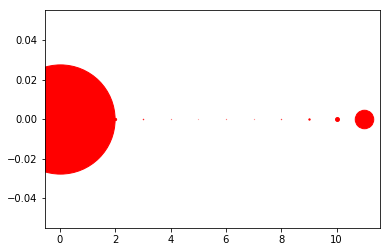

[((5, 0), 3), ((7, 0), 4), ((4, 0), 5), ((6, 0), 5), ((8, 0), 8), ((3, 0), 11), ((9, 0), 32), ((2, 0), 55), ((10, 0), 94), ((1, 0), 136), ((11, 0), 444), ((0, 0), 2621)]
354


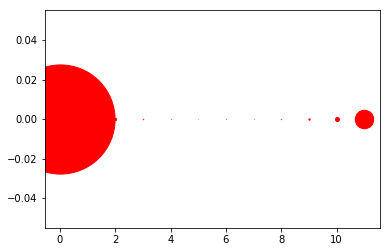

[((5, 0), 3), ((7, 0), 4), ((4, 0), 5), ((6, 0), 5), ((8, 0), 8), ((3, 0), 11), ((9, 0), 32), ((2, 0), 56), ((10, 0), 94), ((1, 0), 136), ((11, 0), 444), ((0, 0), 2620)]
355


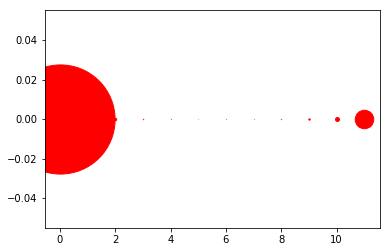

[((5, 0), 3), ((7, 0), 4), ((6, 0), 5), ((4, 0), 6), ((8, 0), 8), ((3, 0), 10), ((9, 0), 32), ((2, 0), 57), ((10, 0), 94), ((1, 0), 135), ((11, 0), 444), ((0, 0), 2620)]
356


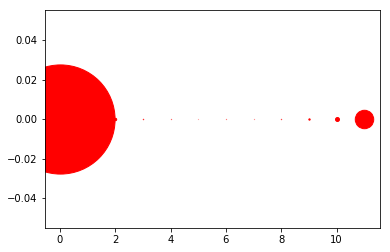

[((5, 0), 3), ((7, 0), 4), ((6, 0), 5), ((4, 0), 6), ((8, 0), 8), ((3, 0), 10), ((9, 0), 32), ((2, 0), 58), ((10, 0), 95), ((1, 0), 134), ((11, 0), 443), ((0, 0), 2620)]
357


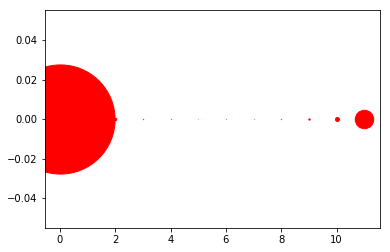

[((5, 0), 3), ((7, 0), 4), ((6, 0), 5), ((4, 0), 7), ((8, 0), 8), ((3, 0), 9), ((9, 0), 32), ((2, 0), 58), ((10, 0), 95), ((1, 0), 134), ((11, 0), 443), ((0, 0), 2620)]
358


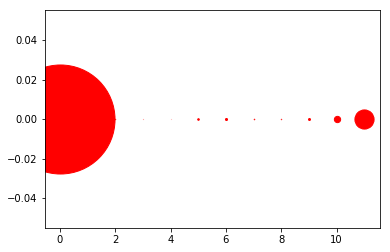

[((4, 0), 2), ((3, 0), 3), ((8, 0), 10), ((2, 0), 11), ((7, 0), 13), ((1, 0), 17), ((5, 0), 38), ((9, 0), 47), ((6, 0), 49), ((10, 0), 151), ((11, 0), 460), ((0, 0), 2617)]
359


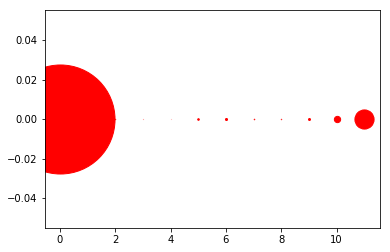

[((4, 0), 2), ((3, 0), 3), ((8, 0), 10), ((2, 0), 11), ((7, 0), 13), ((1, 0), 17), ((5, 0), 38), ((9, 0), 47), ((6, 0), 49), ((10, 0), 151), ((11, 0), 460), ((0, 0), 2617)]
360


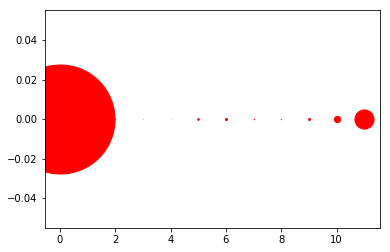

[((4, 0), 2), ((3, 0), 3), ((8, 0), 10), ((2, 0), 11), ((7, 0), 13), ((1, 0), 16), ((5, 0), 39), ((9, 0), 48), ((6, 0), 49), ((10, 0), 151), ((11, 0), 459), ((0, 0), 2617)]
361


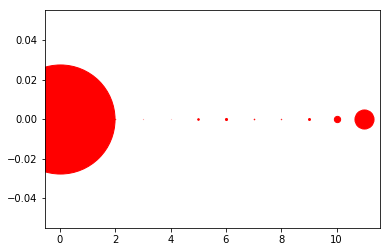

[((4, 0), 2), ((3, 0), 3), ((8, 0), 10), ((2, 0), 11), ((7, 0), 14), ((1, 0), 16), ((5, 0), 38), ((9, 0), 47), ((6, 0), 50), ((10, 0), 151), ((11, 0), 458), ((0, 0), 2618)]
362


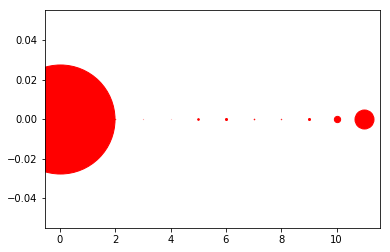

[((4, 0), 2), ((3, 0), 3), ((8, 0), 10), ((2, 0), 11), ((7, 0), 14), ((1, 0), 17), ((5, 0), 39), ((9, 0), 49), ((6, 0), 49), ((10, 0), 151), ((11, 0), 456), ((0, 0), 2617)]
363


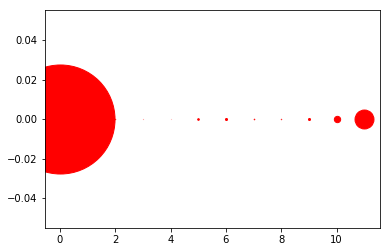

[((4, 0), 2), ((3, 0), 3), ((8, 0), 10), ((2, 0), 11), ((7, 0), 14), ((1, 0), 17), ((5, 0), 39), ((9, 0), 49), ((6, 0), 49), ((10, 0), 152), ((11, 0), 455), ((0, 0), 2617)]
364


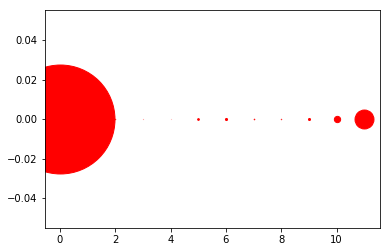

[((4, 0), 2), ((3, 0), 3), ((8, 0), 10), ((2, 0), 11), ((7, 0), 14), ((1, 0), 17), ((5, 0), 41), ((9, 0), 49), ((6, 0), 50), ((10, 0), 151), ((11, 0), 455), ((0, 0), 2615)]
365


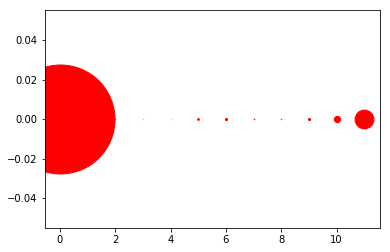

[((4, 0), 2), ((3, 0), 3), ((8, 0), 11), ((2, 0), 11), ((7, 0), 14), ((1, 0), 17), ((5, 0), 41), ((9, 0), 49), ((6, 0), 50), ((10, 0), 152), ((11, 0), 452), ((0, 0), 2616)]
366


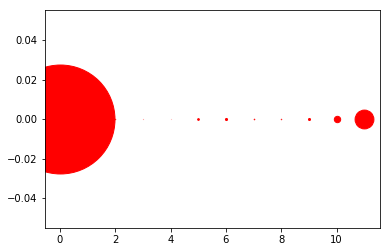

[((4, 0), 2), ((3, 0), 3), ((8, 0), 11), ((2, 0), 11), ((7, 0), 14), ((1, 0), 17), ((5, 0), 41), ((9, 0), 49), ((6, 0), 50), ((10, 0), 153), ((11, 0), 452), ((0, 0), 2615)]
367


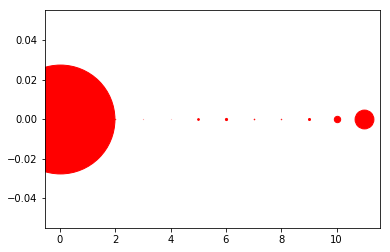

[((4, 0), 2), ((3, 0), 3), ((8, 0), 11), ((2, 0), 11), ((7, 0), 14), ((1, 0), 17), ((5, 0), 41), ((9, 0), 49), ((6, 0), 52), ((10, 0), 153), ((11, 0), 452), ((0, 0), 2613)]
368


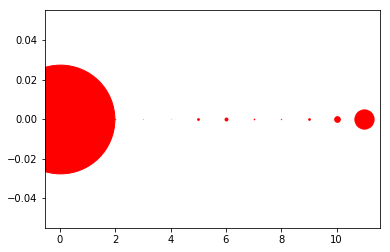

[((4, 0), 2), ((3, 0), 3), ((8, 0), 9), ((2, 0), 11), ((7, 0), 16), ((1, 0), 17), ((9, 0), 40), ((5, 0), 42), ((6, 0), 70), ((10, 0), 136), ((11, 0), 462), ((0, 0), 2610)]
369


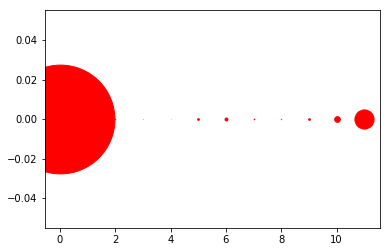

[((4, 0), 2), ((3, 0), 3), ((8, 0), 9), ((2, 0), 11), ((7, 0), 16), ((1, 0), 17), ((9, 0), 41), ((5, 0), 42), ((6, 0), 70), ((10, 0), 136), ((11, 0), 460), ((0, 0), 2611)]
370


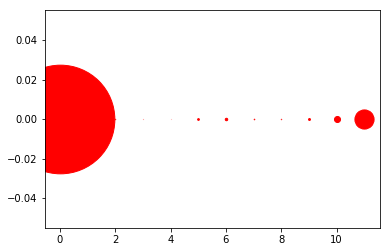

[((4, 0), 2), ((3, 0), 3), ((8, 0), 10), ((2, 0), 11), ((7, 0), 14), ((1, 0), 18), ((5, 0), 42), ((9, 0), 46), ((6, 0), 59), ((10, 0), 145), ((11, 0), 460), ((0, 0), 2608)]
371


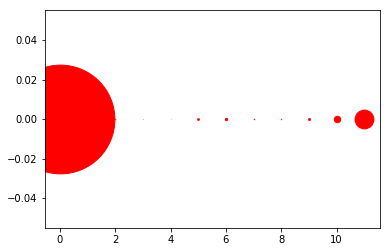

[((4, 0), 2), ((3, 0), 3), ((8, 0), 11), ((2, 0), 11), ((7, 0), 13), ((1, 0), 18), ((5, 0), 42), ((9, 0), 47), ((6, 0), 55), ((10, 0), 154), ((11, 0), 452), ((0, 0), 2610)]
372


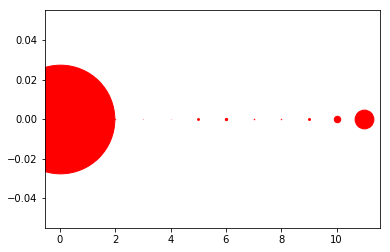

[((4, 0), 2), ((3, 0), 3), ((8, 0), 11), ((2, 0), 11), ((7, 0), 13), ((1, 0), 17), ((5, 0), 44), ((9, 0), 47), ((6, 0), 56), ((10, 0), 155), ((11, 0), 451), ((0, 0), 2608)]
373


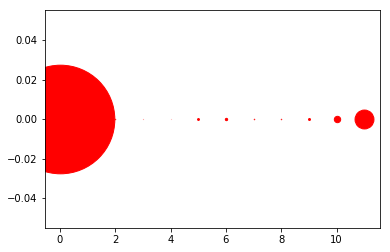

[((4, 0), 2), ((3, 0), 3), ((8, 0), 11), ((2, 0), 11), ((7, 0), 12), ((1, 0), 17), ((5, 0), 45), ((9, 0), 47), ((6, 0), 56), ((10, 0), 153), ((11, 0), 454), ((0, 0), 2607)]
374


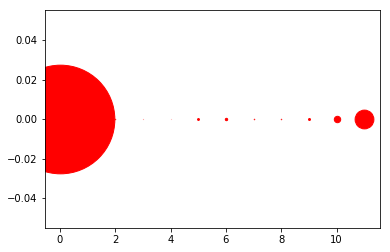

[((4, 0), 2), ((3, 0), 3), ((8, 0), 11), ((2, 0), 11), ((7, 0), 12), ((1, 0), 17), ((5, 0), 45), ((9, 0), 47), ((6, 0), 57), ((10, 0), 154), ((11, 0), 451), ((0, 0), 2608)]
375


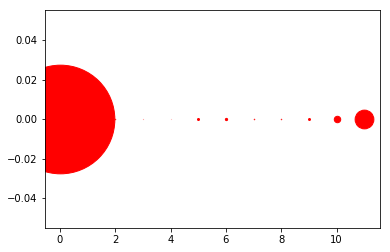

[((4, 0), 2), ((3, 0), 3), ((8, 0), 11), ((2, 0), 11), ((7, 0), 12), ((1, 0), 17), ((9, 0), 47), ((5, 0), 48), ((6, 0), 54), ((10, 0), 155), ((11, 0), 450), ((0, 0), 2608)]
376


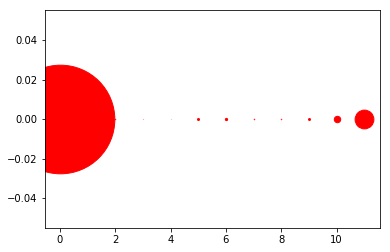

[((4, 0), 2), ((3, 0), 3), ((8, 0), 11), ((7, 0), 12), ((2, 0), 12), ((1, 0), 17), ((9, 0), 47), ((5, 0), 48), ((6, 0), 54), ((10, 0), 154), ((11, 0), 451), ((0, 0), 2607)]
377


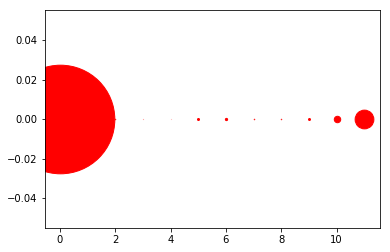

[((4, 0), 2), ((3, 0), 3), ((8, 0), 11), ((7, 0), 12), ((2, 0), 12), ((1, 0), 17), ((9, 0), 47), ((5, 0), 48), ((6, 0), 54), ((10, 0), 155), ((11, 0), 450), ((0, 0), 2607)]
378


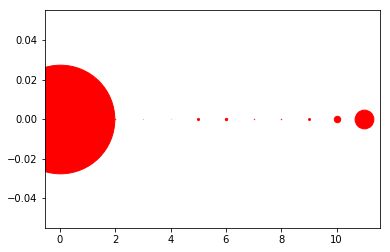

[((4, 0), 2), ((3, 0), 3), ((7, 0), 10), ((8, 0), 11), ((2, 0), 12), ((1, 0), 17), ((9, 0), 47), ((5, 0), 49), ((6, 0), 56), ((10, 0), 154), ((11, 0), 450), ((0, 0), 2607)]
379


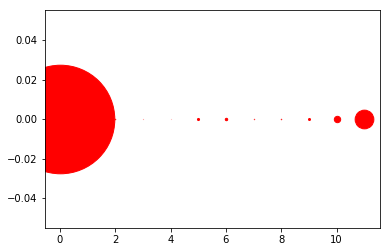

[((4, 0), 2), ((3, 0), 3), ((7, 0), 9), ((8, 0), 11), ((2, 0), 12), ((1, 0), 17), ((9, 0), 48), ((5, 0), 50), ((6, 0), 58), ((10, 0), 153), ((11, 0), 449), ((0, 0), 2606)]
380


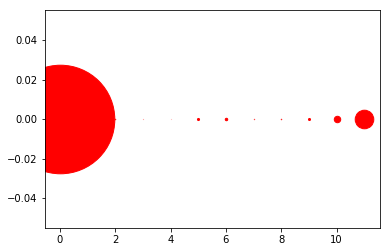

[((4, 0), 2), ((3, 0), 3), ((7, 0), 8), ((8, 0), 11), ((2, 0), 12), ((1, 0), 17), ((9, 0), 49), ((5, 0), 50), ((6, 0), 59), ((10, 0), 155), ((11, 0), 446), ((0, 0), 2606)]
381


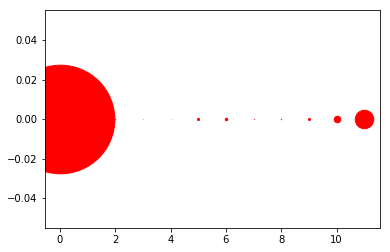

[((4, 0), 2), ((3, 0), 3), ((7, 0), 8), ((8, 0), 11), ((2, 0), 12), ((1, 0), 17), ((9, 0), 49), ((5, 0), 50), ((6, 0), 59), ((10, 0), 157), ((11, 0), 444), ((0, 0), 2606)]
382


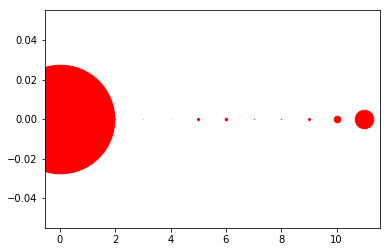

[((4, 0), 2), ((3, 0), 3), ((7, 0), 8), ((8, 0), 11), ((2, 0), 12), ((1, 0), 17), ((9, 0), 48), ((5, 0), 51), ((6, 0), 60), ((10, 0), 157), ((11, 0), 444), ((0, 0), 2605)]
383


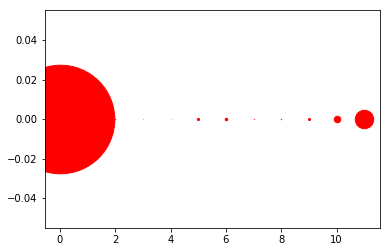

[((4, 0), 2), ((3, 0), 3), ((7, 0), 8), ((8, 0), 11), ((2, 0), 12), ((1, 0), 17), ((9, 0), 49), ((5, 0), 52), ((6, 0), 60), ((10, 0), 156), ((11, 0), 443), ((0, 0), 2605)]
384


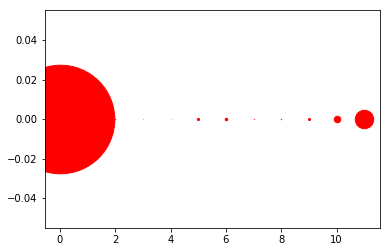

[((4, 0), 2), ((3, 0), 3), ((7, 0), 8), ((8, 0), 11), ((2, 0), 12), ((1, 0), 17), ((9, 0), 49), ((5, 0), 52), ((6, 0), 60), ((10, 0), 156), ((11, 0), 443), ((0, 0), 2605)]
385


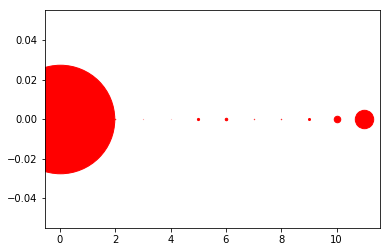

[((4, 0), 2), ((3, 0), 3), ((7, 0), 9), ((8, 0), 10), ((2, 0), 12), ((1, 0), 17), ((9, 0), 49), ((5, 0), 52), ((6, 0), 60), ((10, 0), 157), ((11, 0), 442), ((0, 0), 2605)]
386


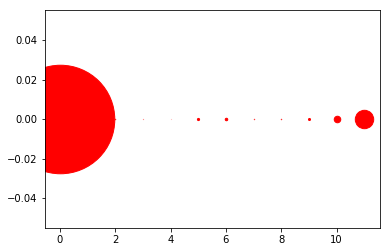

[((4, 0), 2), ((3, 0), 4), ((7, 0), 9), ((8, 0), 10), ((2, 0), 11), ((1, 0), 17), ((9, 0), 49), ((5, 0), 52), ((6, 0), 60), ((10, 0), 157), ((11, 0), 442), ((0, 0), 2605)]
387


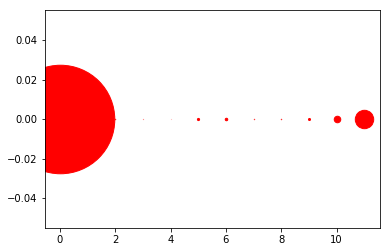

[((4, 0), 2), ((3, 0), 4), ((7, 0), 9), ((8, 0), 10), ((2, 0), 11), ((1, 0), 17), ((9, 0), 49), ((5, 0), 52), ((6, 0), 60), ((10, 0), 157), ((11, 0), 442), ((0, 0), 2605)]
388


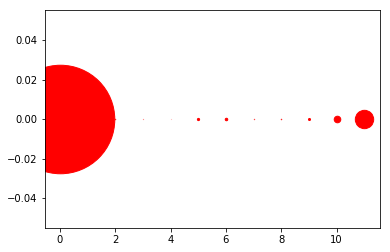

[((4, 0), 2), ((3, 0), 4), ((7, 0), 8), ((8, 0), 11), ((2, 0), 11), ((1, 0), 16), ((9, 0), 49), ((5, 0), 53), ((6, 0), 60), ((10, 0), 158), ((11, 0), 441), ((0, 0), 2605)]
389


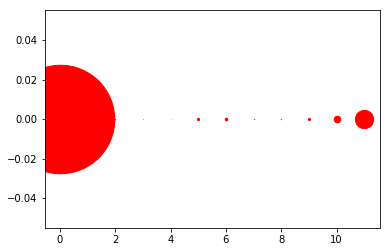

[((4, 0), 2), ((3, 0), 4), ((7, 0), 9), ((8, 0), 10), ((2, 0), 11), ((1, 0), 16), ((9, 0), 50), ((5, 0), 53), ((6, 0), 63), ((10, 0), 157), ((11, 0), 439), ((0, 0), 2604)]
390


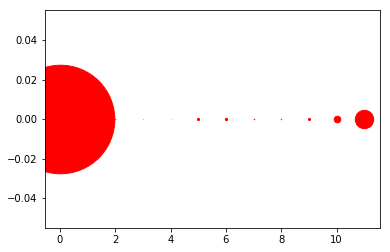

[((4, 0), 2), ((3, 0), 3), ((8, 0), 11), ((2, 0), 11), ((7, 0), 13), ((1, 0), 18), ((9, 0), 50), ((5, 0), 51), ((6, 0), 55), ((10, 0), 158), ((11, 0), 441), ((0, 0), 2605)]
391


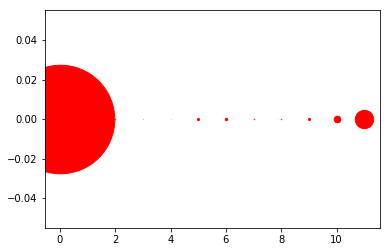

[((4, 0), 2), ((3, 0), 3), ((8, 0), 11), ((2, 0), 11), ((7, 0), 12), ((1, 0), 18), ((9, 0), 50), ((5, 0), 51), ((6, 0), 56), ((10, 0), 158), ((11, 0), 441), ((0, 0), 2605)]
392


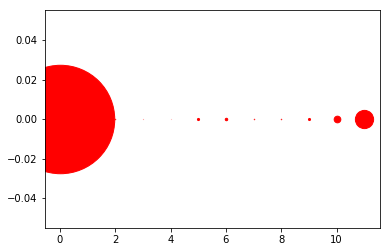

[((4, 0), 2), ((3, 0), 3), ((8, 0), 11), ((7, 0), 11), ((2, 0), 11), ((1, 0), 19), ((9, 0), 50), ((5, 0), 51), ((6, 0), 59), ((10, 0), 160), ((11, 0), 438), ((0, 0), 2603)]
393


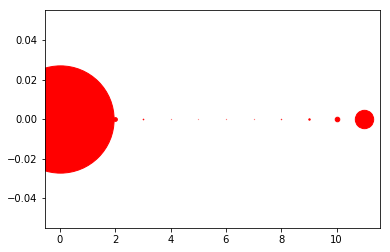

[((5, 0), 4), ((7, 0), 5), ((4, 0), 5), ((6, 0), 5), ((8, 0), 10), ((3, 0), 15), ((9, 0), 34), ((2, 0), 90), ((10, 0), 110), ((1, 0), 125), ((11, 0), 441), ((0, 0), 2574)]
394


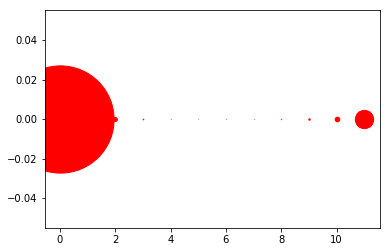

[((5, 0), 4), ((7, 0), 5), ((4, 0), 5), ((6, 0), 5), ((8, 0), 10), ((3, 0), 15), ((9, 0), 34), ((2, 0), 91), ((10, 0), 111), ((1, 0), 124), ((11, 0), 440), ((0, 0), 2574)]
395


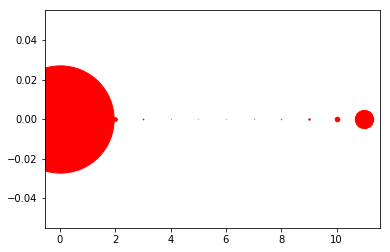

[((6, 0), 4), ((5, 0), 4), ((4, 0), 5), ((7, 0), 6), ((8, 0), 10), ((3, 0), 16), ((9, 0), 34), ((2, 0), 90), ((10, 0), 111), ((1, 0), 124), ((11, 0), 440), ((0, 0), 2574)]
396


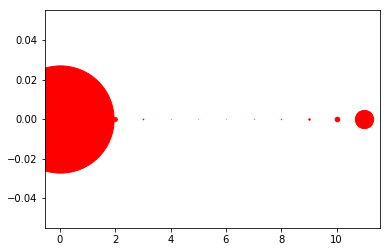

[((6, 0), 4), ((5, 0), 4), ((4, 0), 5), ((7, 0), 6), ((8, 0), 10), ((3, 0), 16), ((9, 0), 34), ((2, 0), 91), ((10, 0), 111), ((1, 0), 123), ((11, 0), 440), ((0, 0), 2574)]
397


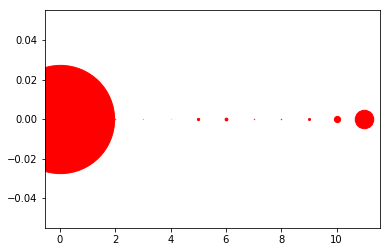

[((4, 0), 2), ((3, 0), 4), ((7, 0), 10), ((2, 0), 10), ((8, 0), 11), ((1, 0), 20), ((9, 0), 49), ((5, 0), 54), ((6, 0), 67), ((10, 0), 149), ((11, 0), 444), ((0, 0), 2598)]
398


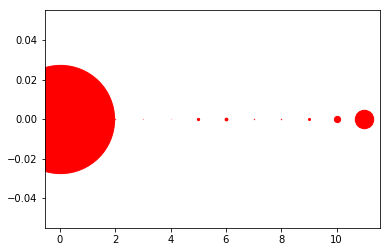

[((4, 0), 2), ((3, 0), 4), ((7, 0), 10), ((2, 0), 10), ((8, 0), 11), ((1, 0), 20), ((9, 0), 49), ((5, 0), 54), ((6, 0), 67), ((10, 0), 150), ((11, 0), 443), ((0, 0), 2598)]
399


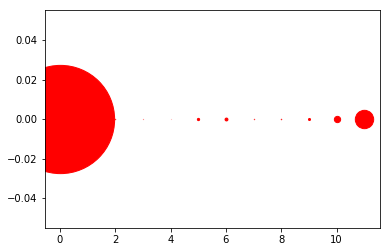

[((4, 0), 2), ((3, 0), 4), ((7, 0), 9), ((2, 0), 10), ((8, 0), 11), ((1, 0), 20), ((9, 0), 49), ((5, 0), 54), ((6, 0), 69), ((10, 0), 151), ((11, 0), 441), ((0, 0), 2598)]
400


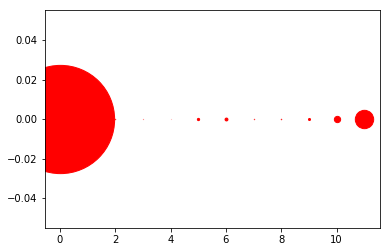

[((4, 0), 2), ((3, 0), 4), ((7, 0), 9), ((2, 0), 10), ((8, 0), 11), ((1, 0), 20), ((9, 0), 49), ((5, 0), 54), ((6, 0), 69), ((10, 0), 151), ((11, 0), 441), ((0, 0), 2598)]
401


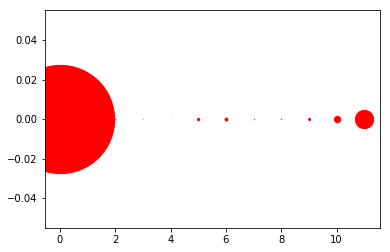

[((4, 0), 2), ((3, 0), 4), ((7, 0), 9), ((2, 0), 10), ((8, 0), 11), ((1, 0), 20), ((9, 0), 49), ((5, 0), 54), ((6, 0), 70), ((10, 0), 151), ((11, 0), 440), ((0, 0), 2598)]
402


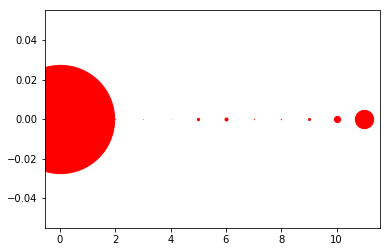

[((4, 0), 2), ((3, 0), 4), ((7, 0), 9), ((2, 0), 10), ((8, 0), 11), ((1, 0), 20), ((9, 0), 49), ((5, 0), 54), ((6, 0), 72), ((10, 0), 149), ((11, 0), 440), ((0, 0), 2598)]
403


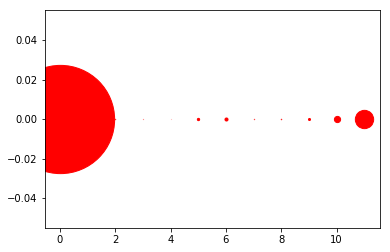

[((4, 0), 2), ((3, 0), 4), ((7, 0), 8), ((2, 0), 10), ((8, 0), 11), ((1, 0), 19), ((9, 0), 49), ((5, 0), 55), ((6, 0), 73), ((10, 0), 149), ((11, 0), 440), ((0, 0), 2598)]
404


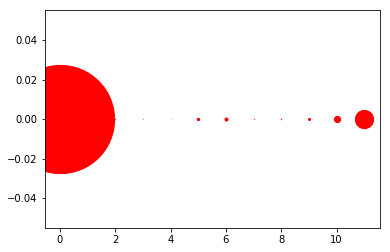

[((4, 0), 2), ((3, 0), 4), ((7, 0), 8), ((2, 0), 10), ((8, 0), 11), ((1, 0), 20), ((9, 0), 49), ((5, 0), 55), ((6, 0), 73), ((10, 0), 150), ((11, 0), 439), ((0, 0), 2597)]
405


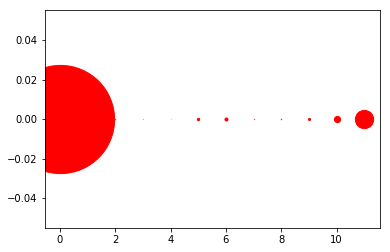

[((4, 0), 2), ((3, 0), 4), ((7, 0), 8), ((2, 0), 10), ((8, 0), 11), ((1, 0), 19), ((9, 0), 50), ((5, 0), 56), ((6, 0), 73), ((10, 0), 149), ((11, 0), 439), ((0, 0), 2597)]
406


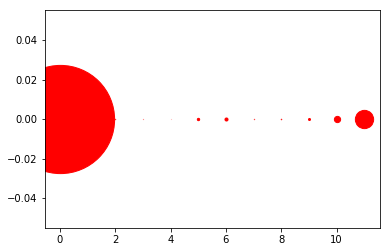

[((4, 0), 2), ((3, 0), 4), ((7, 0), 8), ((2, 0), 10), ((8, 0), 12), ((1, 0), 19), ((9, 0), 48), ((5, 0), 56), ((6, 0), 73), ((10, 0), 150), ((11, 0), 439), ((0, 0), 2597)]
407


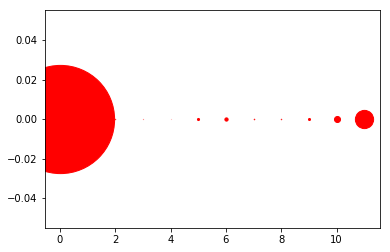

[((4, 0), 2), ((3, 0), 4), ((2, 0), 10), ((8, 0), 11), ((7, 0), 13), ((1, 0), 21), ((9, 0), 49), ((5, 0), 50), ((6, 0), 78), ((10, 0), 145), ((11, 0), 438), ((0, 0), 2597)]
408


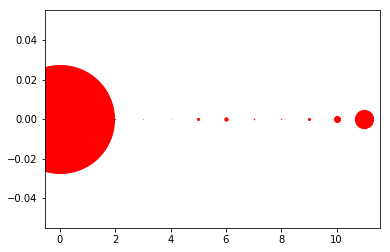

[((4, 0), 2), ((3, 0), 4), ((8, 0), 10), ((2, 0), 10), ((7, 0), 13), ((1, 0), 25), ((9, 0), 49), ((5, 0), 50), ((6, 0), 78), ((10, 0), 145), ((11, 0), 439), ((0, 0), 2593)]
409


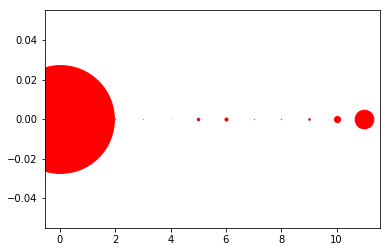

[((4, 0), 2), ((3, 0), 5), ((7, 0), 8), ((8, 0), 10), ((2, 0), 10), ((1, 0), 24), ((9, 0), 38), ((5, 0), 61), ((6, 0), 75), ((10, 0), 148), ((11, 0), 449), ((0, 0), 2588)]
410


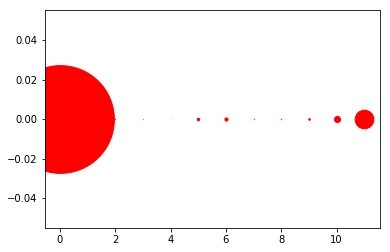

[((4, 0), 2), ((3, 0), 5), ((7, 0), 8), ((8, 0), 10), ((2, 0), 10), ((1, 0), 24), ((9, 0), 39), ((5, 0), 61), ((6, 0), 75), ((10, 0), 148), ((11, 0), 449), ((0, 0), 2587)]
411


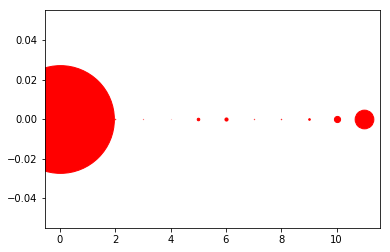

[((4, 0), 2), ((3, 0), 5), ((7, 0), 8), ((8, 0), 10), ((2, 0), 11), ((1, 0), 24), ((9, 0), 39), ((5, 0), 61), ((6, 0), 75), ((10, 0), 148), ((11, 0), 449), ((0, 0), 2586)]
412


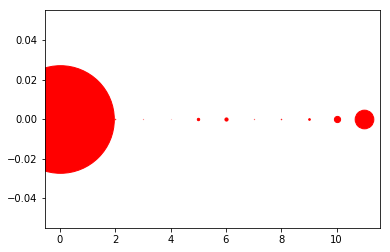

[((4, 0), 2), ((3, 0), 4), ((7, 0), 6), ((2, 0), 11), ((8, 0), 11), ((1, 0), 31), ((9, 0), 40), ((5, 0), 57), ((6, 0), 76), ((10, 0), 149), ((11, 0), 448), ((0, 0), 2583)]
413


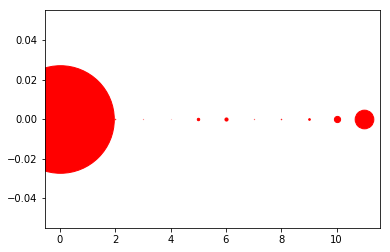

[((4, 0), 2), ((3, 0), 4), ((7, 0), 6), ((2, 0), 11), ((8, 0), 11), ((1, 0), 32), ((9, 0), 40), ((5, 0), 58), ((6, 0), 75), ((10, 0), 149), ((11, 0), 448), ((0, 0), 2582)]
414


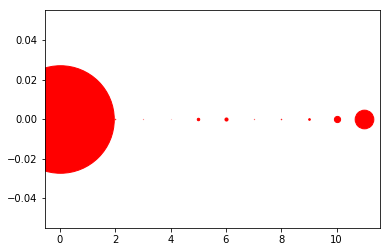

[((4, 0), 2), ((3, 0), 4), ((7, 0), 6), ((2, 0), 11), ((8, 0), 11), ((1, 0), 33), ((9, 0), 40), ((5, 0), 59), ((6, 0), 74), ((10, 0), 149), ((11, 0), 448), ((0, 0), 2581)]
415


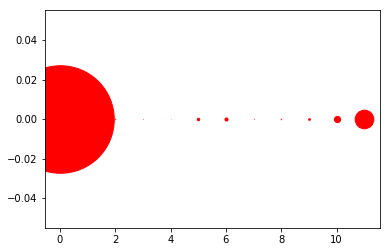

[((4, 0), 2), ((3, 0), 4), ((7, 0), 6), ((2, 0), 11), ((8, 0), 11), ((1, 0), 33), ((9, 0), 41), ((5, 0), 59), ((6, 0), 74), ((10, 0), 149), ((11, 0), 447), ((0, 0), 2581)]
416


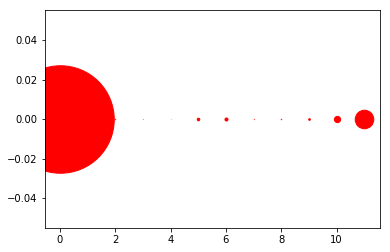

[((4, 0), 2), ((3, 0), 4), ((7, 0), 7), ((2, 0), 11), ((8, 0), 11), ((1, 0), 33), ((9, 0), 40), ((5, 0), 61), ((6, 0), 73), ((10, 0), 150), ((11, 0), 446), ((0, 0), 2580)]
417


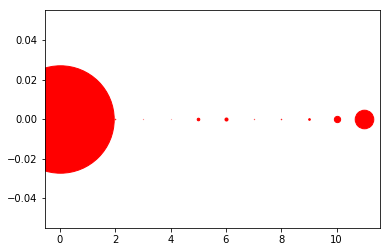

[((4, 0), 3), ((3, 0), 4), ((7, 0), 7), ((8, 0), 11), ((2, 0), 12), ((1, 0), 31), ((9, 0), 40), ((5, 0), 62), ((6, 0), 73), ((10, 0), 151), ((11, 0), 446), ((0, 0), 2578)]
418


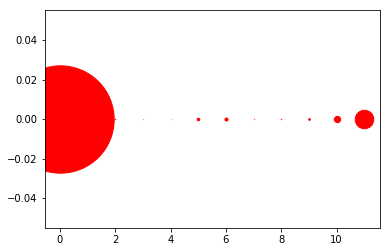

[((4, 0), 3), ((3, 0), 4), ((7, 0), 7), ((8, 0), 11), ((2, 0), 12), ((1, 0), 32), ((9, 0), 40), ((5, 0), 62), ((6, 0), 73), ((10, 0), 152), ((11, 0), 445), ((0, 0), 2577)]
419


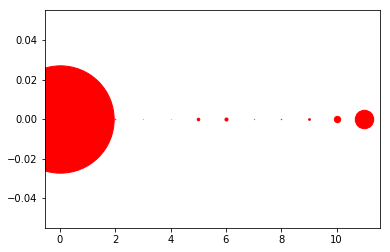

[((4, 0), 3), ((3, 0), 4), ((7, 0), 7), ((8, 0), 11), ((2, 0), 12), ((1, 0), 32), ((9, 0), 42), ((5, 0), 62), ((6, 0), 74), ((10, 0), 152), ((11, 0), 443), ((0, 0), 2576)]
420


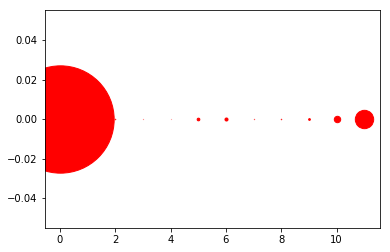

[((4, 0), 3), ((3, 0), 4), ((7, 0), 7), ((8, 0), 11), ((2, 0), 12), ((1, 0), 31), ((9, 0), 42), ((5, 0), 64), ((6, 0), 73), ((10, 0), 154), ((11, 0), 441), ((0, 0), 2576)]
421


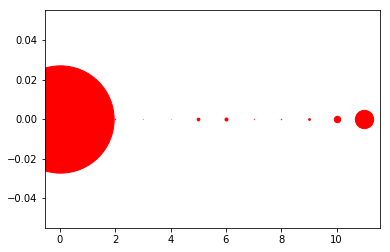

[((4, 0), 3), ((3, 0), 4), ((7, 0), 8), ((8, 0), 11), ((2, 0), 12), ((1, 0), 32), ((9, 0), 42), ((5, 0), 65), ((6, 0), 72), ((10, 0), 154), ((11, 0), 440), ((0, 0), 2575)]
422


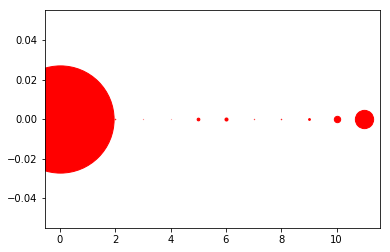

[((4, 0), 3), ((3, 0), 4), ((7, 0), 8), ((8, 0), 11), ((2, 0), 12), ((1, 0), 34), ((9, 0), 43), ((5, 0), 65), ((6, 0), 73), ((10, 0), 153), ((11, 0), 439), ((0, 0), 2573)]
423


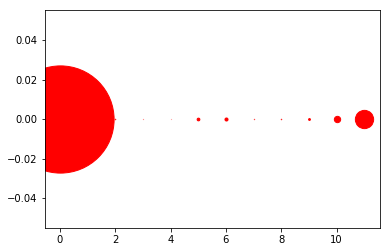

[((4, 0), 3), ((3, 0), 4), ((7, 0), 8), ((8, 0), 11), ((2, 0), 12), ((1, 0), 34), ((9, 0), 44), ((5, 0), 65), ((6, 0), 73), ((10, 0), 152), ((11, 0), 439), ((0, 0), 2573)]
424


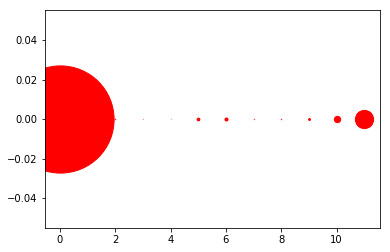

[((4, 0), 3), ((3, 0), 4), ((7, 0), 8), ((8, 0), 11), ((2, 0), 12), ((1, 0), 34), ((9, 0), 45), ((5, 0), 65), ((6, 0), 73), ((10, 0), 152), ((11, 0), 438), ((0, 0), 2573)]
425


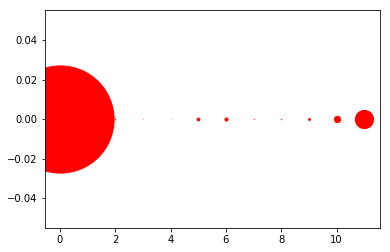

[((4, 0), 3), ((3, 0), 4), ((7, 0), 8), ((8, 0), 11), ((2, 0), 13), ((1, 0), 33), ((9, 0), 45), ((5, 0), 66), ((6, 0), 74), ((10, 0), 152), ((11, 0), 437), ((0, 0), 2572)]
426


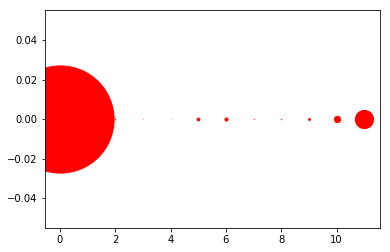

[((4, 0), 3), ((3, 0), 4), ((7, 0), 8), ((8, 0), 11), ((2, 0), 13), ((1, 0), 33), ((9, 0), 45), ((5, 0), 66), ((6, 0), 74), ((10, 0), 152), ((11, 0), 437), ((0, 0), 2572)]
427


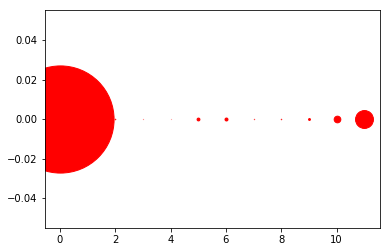

[((4, 0), 3), ((3, 0), 4), ((7, 0), 8), ((8, 0), 11), ((2, 0), 13), ((1, 0), 33), ((9, 0), 45), ((5, 0), 68), ((6, 0), 71), ((10, 0), 160), ((11, 0), 430), ((0, 0), 2572)]
428


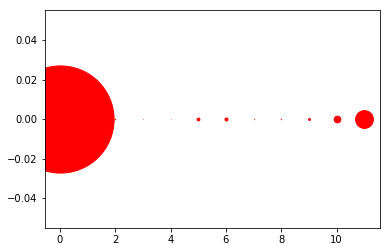

[((4, 0), 3), ((3, 0), 4), ((7, 0), 8), ((8, 0), 11), ((2, 0), 13), ((1, 0), 33), ((9, 0), 46), ((5, 0), 68), ((6, 0), 72), ((10, 0), 160), ((11, 0), 428), ((0, 0), 2572)]
429


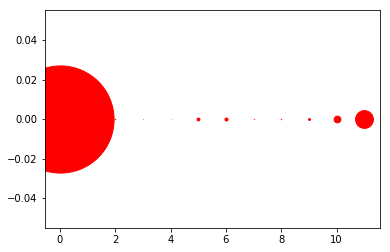

[((4, 0), 3), ((3, 0), 4), ((7, 0), 8), ((8, 0), 11), ((2, 0), 13), ((1, 0), 33), ((9, 0), 46), ((5, 0), 68), ((6, 0), 72), ((10, 0), 161), ((11, 0), 427), ((0, 0), 2572)]
430


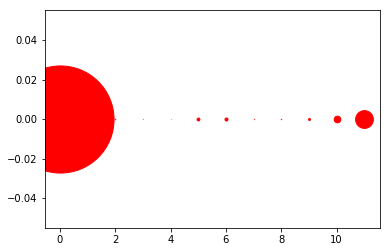

[((4, 0), 3), ((3, 0), 5), ((7, 0), 8), ((8, 0), 11), ((2, 0), 12), ((1, 0), 34), ((9, 0), 47), ((5, 0), 68), ((6, 0), 72), ((10, 0), 160), ((11, 0), 427), ((0, 0), 2571)]
431


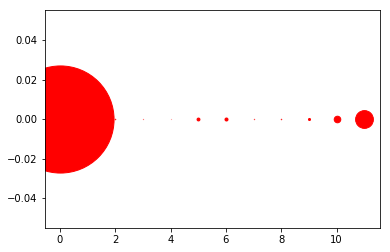

[((4, 0), 3), ((3, 0), 5), ((7, 0), 8), ((8, 0), 11), ((2, 0), 12), ((1, 0), 33), ((9, 0), 49), ((5, 0), 69), ((6, 0), 72), ((10, 0), 158), ((11, 0), 427), ((0, 0), 2571)]
432


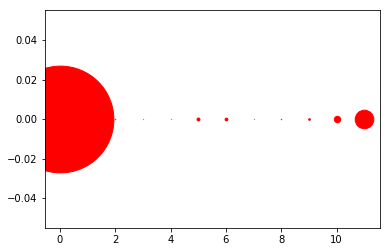

[((4, 0), 6), ((7, 0), 6), ((3, 0), 6), ((2, 0), 11), ((8, 0), 11), ((9, 0), 40), ((1, 0), 41), ((6, 0), 66), ((5, 0), 70), ((10, 0), 153), ((11, 0), 446), ((0, 0), 2562)]
433


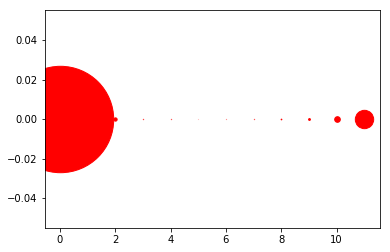

[((5, 0), 2), ((6, 0), 4), ((7, 0), 7), ((4, 0), 7), ((3, 0), 8), ((8, 0), 17), ((9, 0), 44), ((2, 0), 79), ((1, 0), 120), ((10, 0), 135), ((11, 0), 441), ((0, 0), 2554)]
434


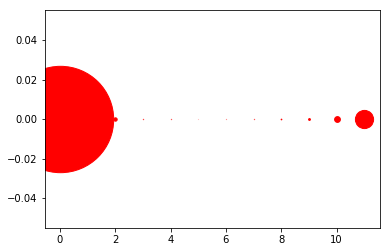

[((5, 0), 2), ((6, 0), 4), ((7, 0), 7), ((4, 0), 7), ((3, 0), 8), ((8, 0), 17), ((9, 0), 44), ((2, 0), 81), ((1, 0), 119), ((10, 0), 139), ((11, 0), 437), ((0, 0), 2553)]
435


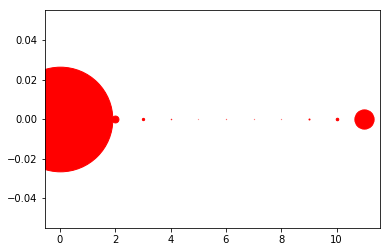

[((5, 0), 4), ((7, 0), 5), ((8, 0), 5), ((6, 0), 6), ((4, 0), 11), ((9, 0), 24), ((3, 0), 55), ((10, 0), 61), ((1, 0), 108), ((2, 0), 165), ((11, 0), 462), ((0, 0), 2512)]
436


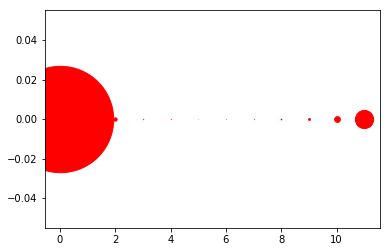

[((5, 0), 2), ((6, 0), 4), ((7, 0), 7), ((4, 0), 7), ((3, 0), 9), ((8, 0), 17), ((9, 0), 45), ((2, 0), 80), ((1, 0), 119), ((10, 0), 138), ((11, 0), 437), ((0, 0), 2553)]
437


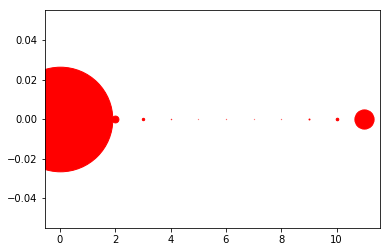

[((7, 0), 5), ((5, 0), 5), ((8, 0), 6), ((6, 0), 6), ((4, 0), 10), ((9, 0), 23), ((3, 0), 57), ((10, 0), 62), ((1, 0), 108), ((2, 0), 164), ((11, 0), 461), ((0, 0), 2511)]
438


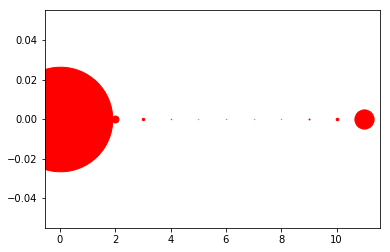

[((7, 0), 5), ((5, 0), 5), ((8, 0), 6), ((6, 0), 6), ((4, 0), 10), ((9, 0), 23), ((3, 0), 57), ((10, 0), 62), ((1, 0), 107), ((2, 0), 166), ((11, 0), 461), ((0, 0), 2510)]
439


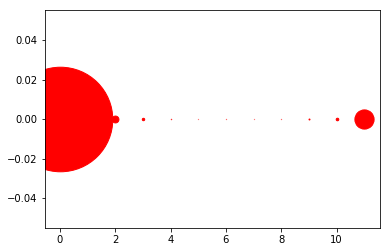

[((7, 0), 5), ((5, 0), 5), ((8, 0), 6), ((6, 0), 6), ((4, 0), 10), ((9, 0), 23), ((3, 0), 58), ((10, 0), 62), ((1, 0), 107), ((2, 0), 165), ((11, 0), 461), ((0, 0), 2510)]
440


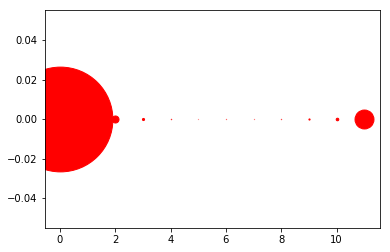

[((5, 0), 4), ((7, 0), 5), ((6, 0), 6), ((8, 0), 8), ((4, 0), 10), ((9, 0), 28), ((3, 0), 51), ((10, 0), 62), ((1, 0), 105), ((2, 0), 169), ((11, 0), 455), ((0, 0), 2515)]
441


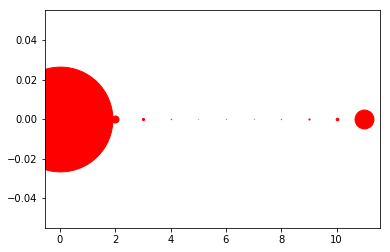

[((5, 0), 4), ((7, 0), 5), ((6, 0), 6), ((8, 0), 8), ((4, 0), 10), ((9, 0), 28), ((3, 0), 52), ((10, 0), 63), ((1, 0), 104), ((2, 0), 169), ((11, 0), 454), ((0, 0), 2515)]
442


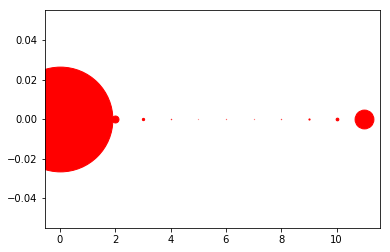

[((5, 0), 4), ((7, 0), 5), ((6, 0), 6), ((8, 0), 8), ((4, 0), 10), ((9, 0), 28), ((3, 0), 55), ((10, 0), 65), ((1, 0), 103), ((2, 0), 167), ((11, 0), 452), ((0, 0), 2515)]
443


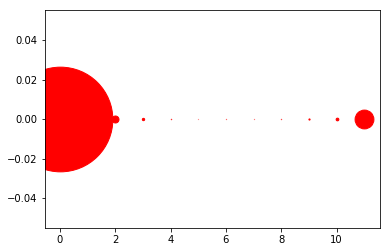

[((5, 0), 4), ((7, 0), 5), ((6, 0), 6), ((8, 0), 8), ((4, 0), 10), ((9, 0), 28), ((3, 0), 56), ((10, 0), 65), ((1, 0), 103), ((2, 0), 168), ((11, 0), 452), ((0, 0), 2513)]
444


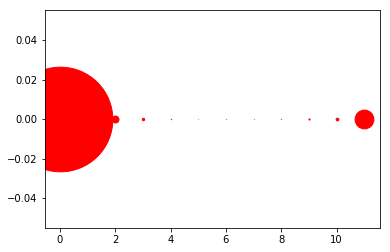

[((5, 0), 4), ((7, 0), 5), ((6, 0), 6), ((8, 0), 8), ((4, 0), 10), ((9, 0), 28), ((3, 0), 57), ((10, 0), 65), ((1, 0), 104), ((2, 0), 167), ((11, 0), 452), ((0, 0), 2512)]
445


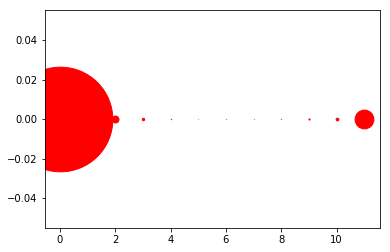

[((5, 0), 4), ((7, 0), 5), ((6, 0), 6), ((8, 0), 8), ((4, 0), 10), ((9, 0), 28), ((3, 0), 57), ((10, 0), 65), ((1, 0), 104), ((2, 0), 167), ((11, 0), 452), ((0, 0), 2512)]
446


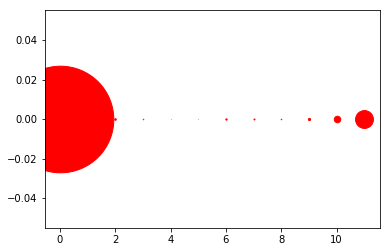

[((4, 0), 3), ((5, 0), 3), ((3, 0), 12), ((8, 0), 13), ((7, 0), 23), ((6, 0), 31), ((2, 0), 38), ((9, 0), 53), ((1, 0), 98), ((10, 0), 156), ((11, 0), 429), ((0, 0), 2559)]
447


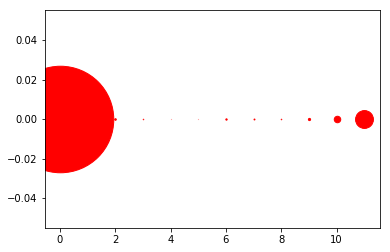

[((4, 0), 3), ((5, 0), 3), ((3, 0), 12), ((8, 0), 13), ((7, 0), 22), ((6, 0), 32), ((2, 0), 38), ((9, 0), 53), ((1, 0), 100), ((10, 0), 156), ((11, 0), 429), ((0, 0), 2557)]
448


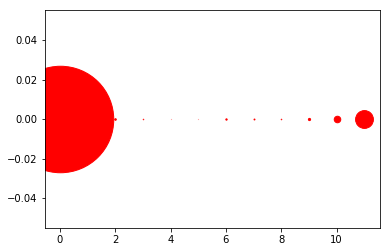

[((4, 0), 3), ((5, 0), 3), ((3, 0), 12), ((8, 0), 13), ((7, 0), 22), ((6, 0), 32), ((2, 0), 38), ((9, 0), 53), ((1, 0), 101), ((10, 0), 157), ((11, 0), 428), ((0, 0), 2556)]
449


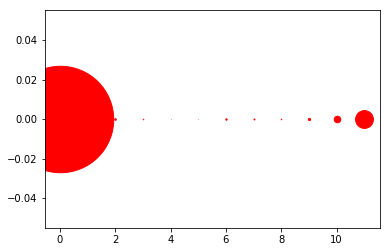

[((4, 0), 3), ((5, 0), 3), ((3, 0), 12), ((8, 0), 13), ((7, 0), 21), ((6, 0), 33), ((2, 0), 38), ((9, 0), 53), ((1, 0), 102), ((10, 0), 157), ((11, 0), 428), ((0, 0), 2555)]
450


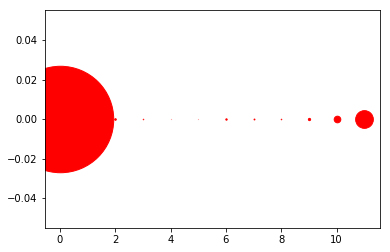

[((4, 0), 3), ((5, 0), 3), ((3, 0), 12), ((8, 0), 13), ((7, 0), 21), ((6, 0), 33), ((2, 0), 38), ((9, 0), 54), ((1, 0), 102), ((10, 0), 159), ((11, 0), 425), ((0, 0), 2555)]
451


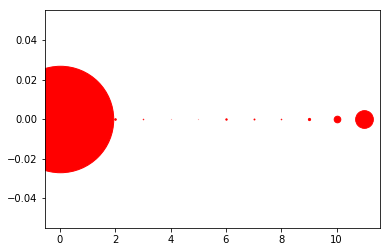

[((4, 0), 3), ((5, 0), 3), ((3, 0), 12), ((8, 0), 13), ((7, 0), 22), ((6, 0), 33), ((2, 0), 38), ((9, 0), 53), ((1, 0), 102), ((10, 0), 159), ((11, 0), 425), ((0, 0), 2555)]
452


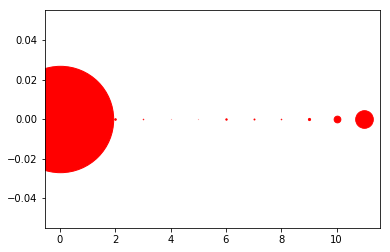

[((4, 0), 3), ((5, 0), 3), ((3, 0), 12), ((8, 0), 13), ((7, 0), 23), ((6, 0), 33), ((2, 0), 38), ((9, 0), 52), ((1, 0), 104), ((10, 0), 161), ((11, 0), 423), ((0, 0), 2553)]
453


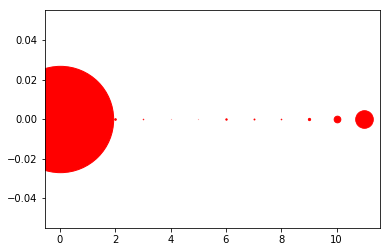

[((4, 0), 3), ((5, 0), 3), ((3, 0), 12), ((8, 0), 14), ((7, 0), 22), ((6, 0), 33), ((2, 0), 39), ((9, 0), 54), ((1, 0), 104), ((10, 0), 160), ((11, 0), 422), ((0, 0), 2552)]
454


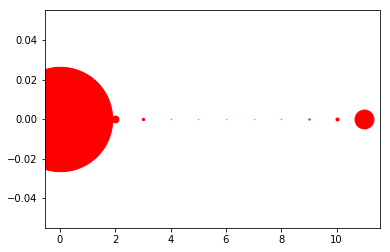

[((7, 0), 5), ((6, 0), 5), ((5, 0), 6), ((8, 0), 8), ((4, 0), 8), ((9, 0), 29), ((3, 0), 55), ((10, 0), 72), ((1, 0), 107), ((2, 0), 163), ((11, 0), 454), ((0, 0), 2506)]
455


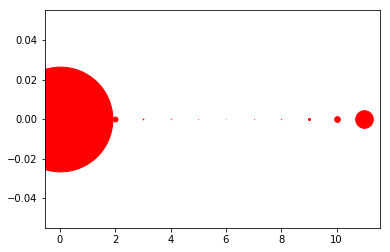

[((6, 0), 3), ((5, 0), 5), ((7, 0), 6), ((4, 0), 7), ((8, 0), 9), ((3, 0), 16), ((9, 0), 49), ((2, 0), 118), ((1, 0), 132), ((10, 0), 136), ((11, 0), 423), ((0, 0), 2514)]
456


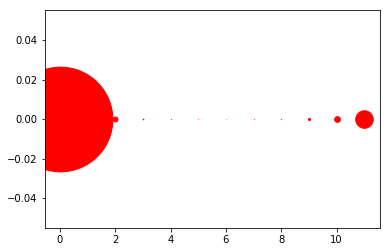

[((6, 0), 3), ((5, 0), 5), ((7, 0), 6), ((4, 0), 7), ((8, 0), 9), ((3, 0), 17), ((9, 0), 50), ((2, 0), 117), ((1, 0), 133), ((10, 0), 137), ((11, 0), 421), ((0, 0), 2513)]
457


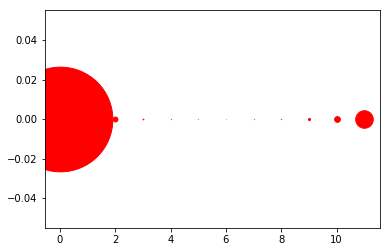

[((6, 0), 3), ((5, 0), 5), ((7, 0), 6), ((4, 0), 7), ((8, 0), 9), ((3, 0), 17), ((9, 0), 50), ((2, 0), 117), ((1, 0), 132), ((10, 0), 138), ((11, 0), 421), ((0, 0), 2513)]
458


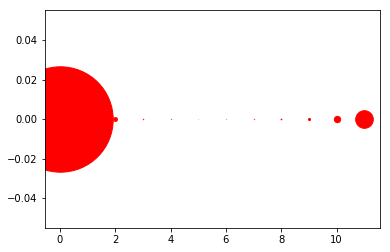

[((5, 0), 2), ((6, 0), 4), ((4, 0), 7), ((7, 0), 8), ((3, 0), 11), ((8, 0), 17), ((9, 0), 50), ((2, 0), 92), ((1, 0), 122), ((10, 0), 152), ((11, 0), 423), ((0, 0), 2530)]
459


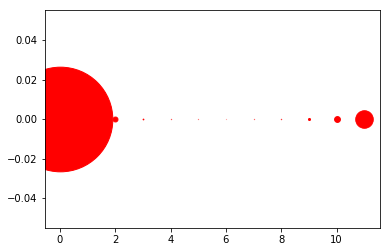

[((6, 0), 3), ((5, 0), 5), ((7, 0), 6), ((4, 0), 7), ((8, 0), 9), ((3, 0), 18), ((9, 0), 49), ((2, 0), 118), ((1, 0), 130), ((10, 0), 140), ((11, 0), 421), ((0, 0), 2512)]
460


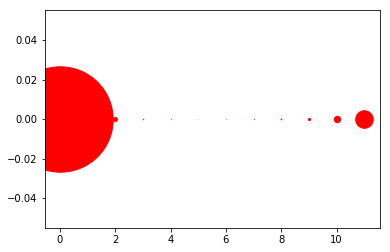

[((5, 0), 2), ((6, 0), 4), ((4, 0), 7), ((7, 0), 8), ((3, 0), 11), ((8, 0), 17), ((9, 0), 50), ((2, 0), 93), ((1, 0), 121), ((10, 0), 153), ((11, 0), 422), ((0, 0), 2530)]
461


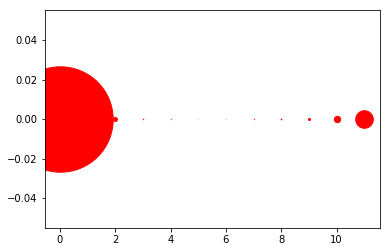

[((5, 0), 2), ((6, 0), 3), ((4, 0), 7), ((7, 0), 9), ((3, 0), 11), ((8, 0), 18), ((9, 0), 49), ((2, 0), 93), ((1, 0), 121), ((10, 0), 153), ((11, 0), 422), ((0, 0), 2530)]
462


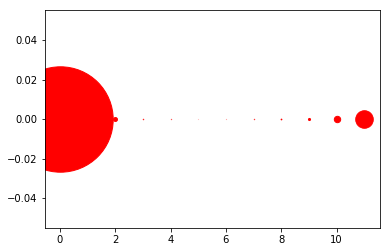

[((5, 0), 2), ((6, 0), 3), ((4, 0), 7), ((7, 0), 9), ((3, 0), 11), ((8, 0), 18), ((9, 0), 50), ((2, 0), 94), ((1, 0), 120), ((10, 0), 153), ((11, 0), 421), ((0, 0), 2530)]
463


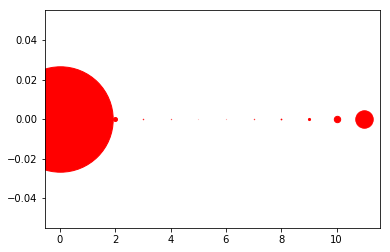

[((5, 0), 2), ((6, 0), 3), ((4, 0), 7), ((7, 0), 9), ((3, 0), 11), ((8, 0), 18), ((9, 0), 51), ((2, 0), 95), ((1, 0), 120), ((10, 0), 153), ((11, 0), 419), ((0, 0), 2530)]
464


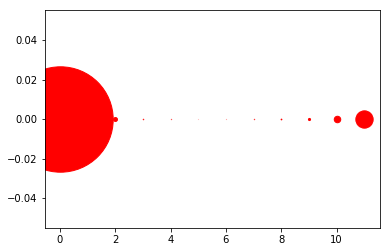

[((5, 0), 2), ((6, 0), 3), ((4, 0), 7), ((7, 0), 9), ((3, 0), 12), ((8, 0), 18), ((9, 0), 51), ((2, 0), 94), ((1, 0), 120), ((10, 0), 156), ((11, 0), 416), ((0, 0), 2530)]
465


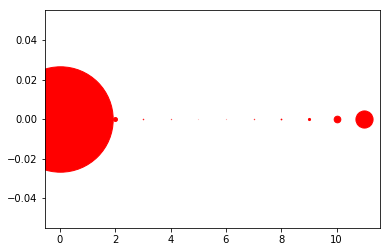

[((5, 0), 2), ((6, 0), 3), ((4, 0), 7), ((7, 0), 9), ((3, 0), 12), ((8, 0), 18), ((9, 0), 51), ((2, 0), 94), ((1, 0), 120), ((10, 0), 160), ((11, 0), 412), ((0, 0), 2530)]
466


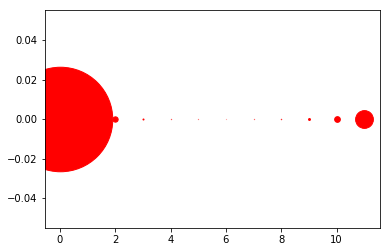

[((6, 0), 3), ((5, 0), 5), ((7, 0), 6), ((4, 0), 7), ((8, 0), 10), ((3, 0), 24), ((9, 0), 46), ((1, 0), 116), ((2, 0), 128), ((10, 0), 137), ((11, 0), 427), ((0, 0), 2509)]
467


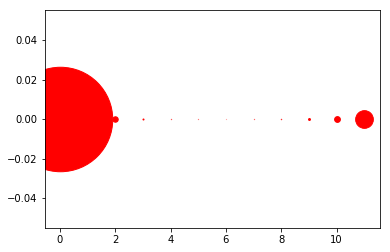

[((6, 0), 3), ((5, 0), 5), ((7, 0), 6), ((4, 0), 7), ((8, 0), 10), ((3, 0), 24), ((9, 0), 46), ((1, 0), 114), ((2, 0), 131), ((10, 0), 139), ((11, 0), 425), ((0, 0), 2508)]
468


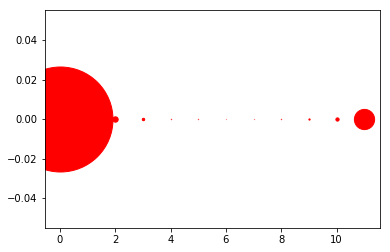

[((6, 0), 4), ((7, 0), 5), ((5, 0), 8), ((8, 0), 9), ((4, 0), 9), ((9, 0), 30), ((3, 0), 58), ((10, 0), 78), ((1, 0), 83), ((2, 0), 129), ((11, 0), 485), ((0, 0), 2520)]
469


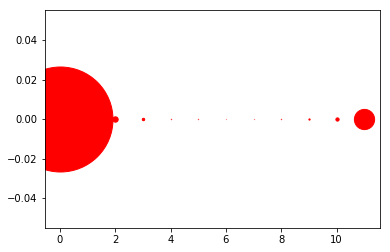

[((6, 0), 4), ((7, 0), 5), ((5, 0), 8), ((8, 0), 9), ((4, 0), 9), ((9, 0), 30), ((3, 0), 58), ((10, 0), 78), ((1, 0), 83), ((2, 0), 129), ((11, 0), 485), ((0, 0), 2520)]
470


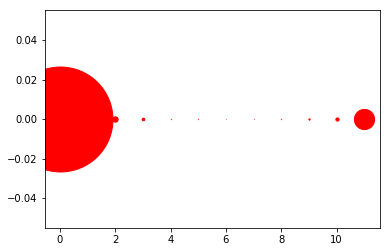

[((6, 0), 4), ((7, 0), 5), ((5, 0), 8), ((8, 0), 9), ((4, 0), 9), ((9, 0), 30), ((3, 0), 61), ((10, 0), 78), ((1, 0), 81), ((2, 0), 129), ((11, 0), 485), ((0, 0), 2519)]
471


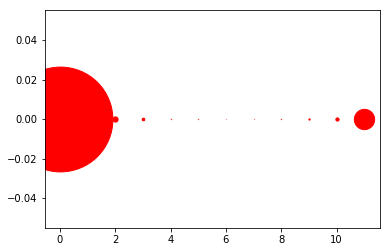

[((6, 0), 4), ((7, 0), 5), ((5, 0), 8), ((8, 0), 9), ((4, 0), 9), ((9, 0), 30), ((3, 0), 63), ((10, 0), 78), ((1, 0), 83), ((2, 0), 126), ((11, 0), 487), ((0, 0), 2516)]
472


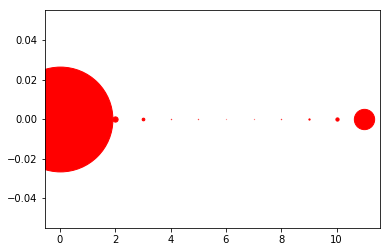

[((6, 0), 4), ((7, 0), 5), ((5, 0), 8), ((8, 0), 9), ((4, 0), 9), ((9, 0), 30), ((3, 0), 64), ((10, 0), 78), ((1, 0), 82), ((2, 0), 126), ((11, 0), 487), ((0, 0), 2516)]
473


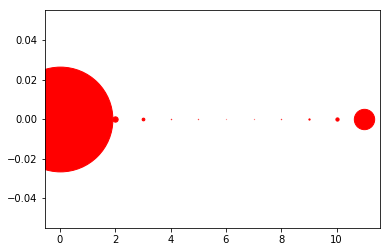

[((6, 0), 4), ((7, 0), 5), ((5, 0), 8), ((8, 0), 9), ((4, 0), 10), ((9, 0), 30), ((3, 0), 65), ((10, 0), 78), ((1, 0), 78), ((2, 0), 128), ((11, 0), 488), ((0, 0), 2515)]
474


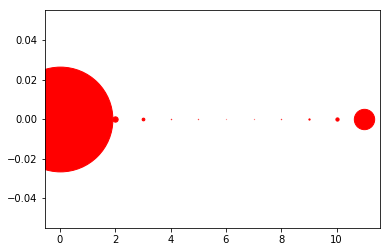

[((6, 0), 4), ((7, 0), 5), ((5, 0), 8), ((8, 0), 9), ((4, 0), 10), ((9, 0), 30), ((3, 0), 65), ((10, 0), 78), ((1, 0), 78), ((2, 0), 128), ((11, 0), 488), ((0, 0), 2515)]
475


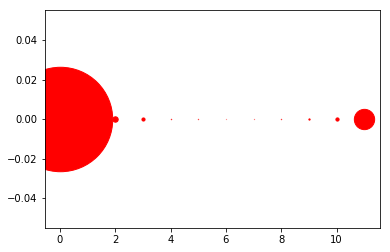

[((6, 0), 4), ((7, 0), 5), ((5, 0), 8), ((8, 0), 9), ((4, 0), 10), ((9, 0), 30), ((3, 0), 75), ((1, 0), 76), ((10, 0), 77), ((2, 0), 130), ((11, 0), 487), ((0, 0), 2507)]
476


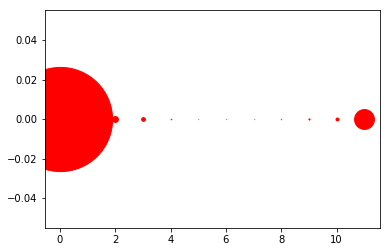

[((7, 0), 5), ((5, 0), 5), ((6, 0), 5), ((8, 0), 9), ((4, 0), 13), ((9, 0), 27), ((10, 0), 70), ((1, 0), 79), ((3, 0), 89), ((2, 0), 139), ((11, 0), 476), ((0, 0), 2501)]
477


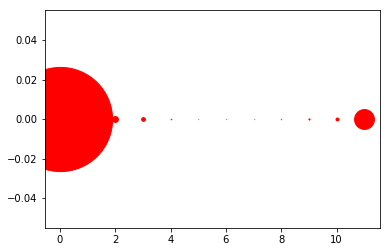

[((7, 0), 5), ((5, 0), 5), ((6, 0), 5), ((8, 0), 9), ((4, 0), 13), ((9, 0), 27), ((10, 0), 70), ((1, 0), 79), ((3, 0), 89), ((2, 0), 139), ((11, 0), 476), ((0, 0), 2501)]
478


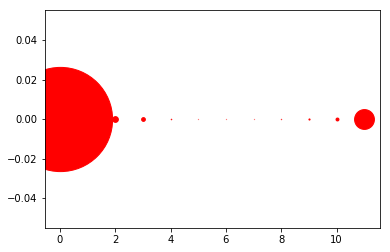

[((7, 0), 5), ((5, 0), 5), ((6, 0), 5), ((8, 0), 9), ((4, 0), 13), ((9, 0), 27), ((10, 0), 70), ((1, 0), 79), ((3, 0), 90), ((2, 0), 138), ((11, 0), 476), ((0, 0), 2501)]
479


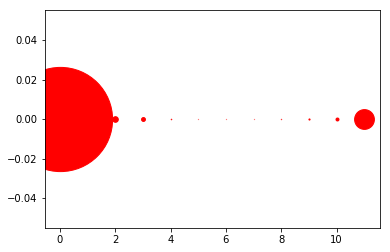

[((7, 0), 5), ((5, 0), 5), ((6, 0), 5), ((8, 0), 9), ((4, 0), 13), ((9, 0), 27), ((10, 0), 71), ((1, 0), 79), ((3, 0), 93), ((2, 0), 135), ((11, 0), 475), ((0, 0), 2501)]
480


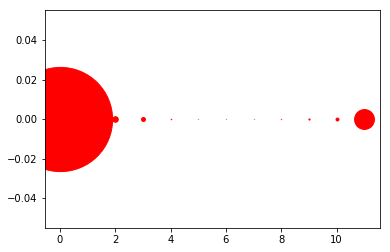

[((7, 0), 5), ((5, 0), 5), ((6, 0), 5), ((8, 0), 9), ((4, 0), 13), ((9, 0), 28), ((10, 0), 70), ((1, 0), 78), ((3, 0), 94), ((2, 0), 134), ((11, 0), 476), ((0, 0), 2501)]
481


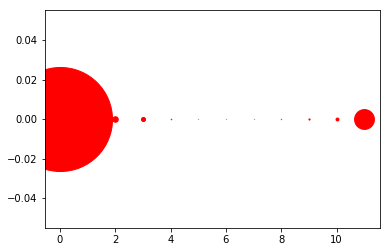

[((7, 0), 5), ((5, 0), 5), ((6, 0), 5), ((8, 0), 9), ((4, 0), 13), ((9, 0), 28), ((10, 0), 70), ((1, 0), 79), ((3, 0), 98), ((2, 0), 133), ((11, 0), 476), ((0, 0), 2497)]
482


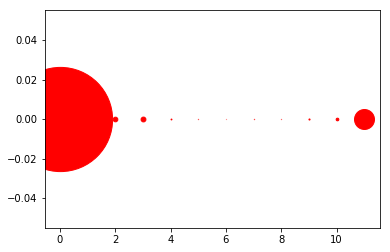

[((6, 0), 4), ((8, 0), 6), ((5, 0), 7), ((7, 0), 8), ((4, 0), 21), ((9, 0), 26), ((10, 0), 64), ((1, 0), 74), ((2, 0), 112), ((3, 0), 116), ((11, 0), 479), ((0, 0), 2501)]
483


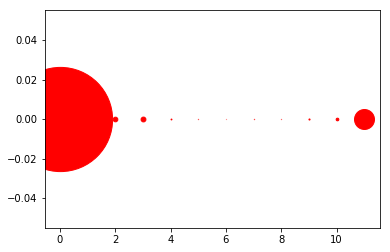

[((6, 0), 4), ((8, 0), 6), ((5, 0), 7), ((7, 0), 8), ((4, 0), 21), ((9, 0), 26), ((10, 0), 64), ((1, 0), 74), ((2, 0), 112), ((3, 0), 116), ((11, 0), 479), ((0, 0), 2501)]
484


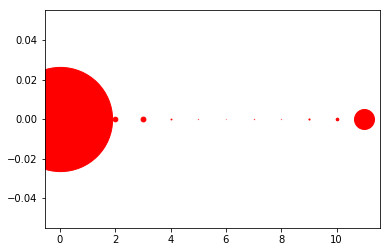

[((6, 0), 4), ((8, 0), 6), ((5, 0), 7), ((7, 0), 8), ((4, 0), 21), ((9, 0), 27), ((10, 0), 63), ((1, 0), 74), ((2, 0), 112), ((3, 0), 116), ((11, 0), 479), ((0, 0), 2501)]
485


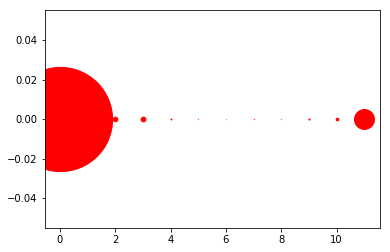

[((6, 0), 4), ((8, 0), 6), ((5, 0), 7), ((7, 0), 8), ((4, 0), 23), ((9, 0), 27), ((10, 0), 64), ((1, 0), 74), ((2, 0), 112), ((3, 0), 114), ((11, 0), 478), ((0, 0), 2501)]
486


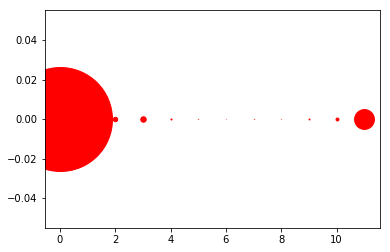

[((6, 0), 4), ((8, 0), 5), ((5, 0), 7), ((7, 0), 7), ((9, 0), 22), ((4, 0), 25), ((1, 0), 69), ((10, 0), 70), ((2, 0), 107), ((3, 0), 131), ((11, 0), 476), ((0, 0), 2495)]
487


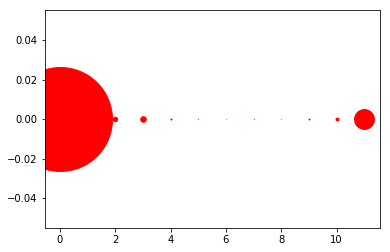

[((6, 0), 4), ((8, 0), 5), ((5, 0), 7), ((7, 0), 7), ((9, 0), 23), ((4, 0), 25), ((10, 0), 69), ((1, 0), 69), ((2, 0), 106), ((3, 0), 132), ((11, 0), 476), ((0, 0), 2495)]
488


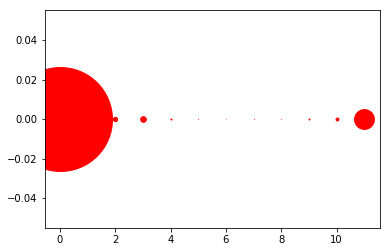

[((6, 0), 4), ((8, 0), 5), ((5, 0), 7), ((7, 0), 7), ((9, 0), 23), ((4, 0), 25), ((10, 0), 69), ((1, 0), 69), ((2, 0), 103), ((3, 0), 135), ((11, 0), 476), ((0, 0), 2495)]
489


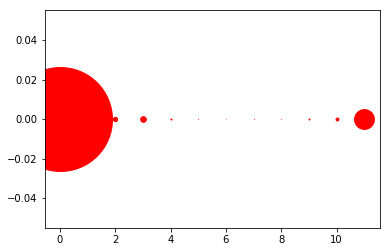

[((6, 0), 4), ((8, 0), 5), ((5, 0), 7), ((7, 0), 7), ((9, 0), 23), ((4, 0), 25), ((10, 0), 69), ((1, 0), 69), ((2, 0), 103), ((3, 0), 135), ((11, 0), 476), ((0, 0), 2495)]
490


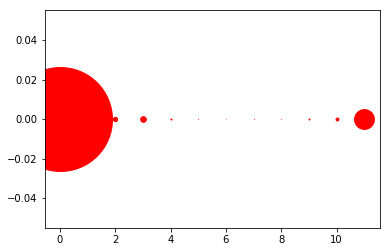

[((6, 0), 4), ((8, 0), 5), ((5, 0), 7), ((7, 0), 7), ((9, 0), 23), ((4, 0), 25), ((10, 0), 69), ((1, 0), 69), ((2, 0), 103), ((3, 0), 135), ((11, 0), 476), ((0, 0), 2495)]
491


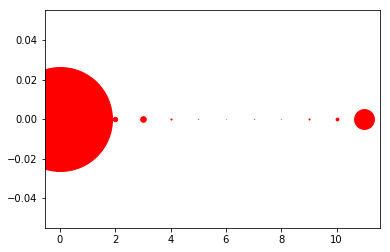

[((6, 0), 4), ((8, 0), 5), ((5, 0), 7), ((7, 0), 7), ((9, 0), 24), ((4, 0), 26), ((10, 0), 68), ((1, 0), 68), ((2, 0), 104), ((3, 0), 134), ((11, 0), 476), ((0, 0), 2495)]
492


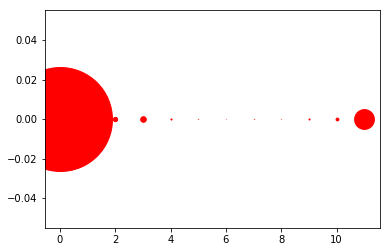

[((6, 0), 4), ((8, 0), 5), ((5, 0), 7), ((7, 0), 7), ((9, 0), 25), ((4, 0), 26), ((10, 0), 68), ((1, 0), 68), ((2, 0), 104), ((3, 0), 134), ((11, 0), 475), ((0, 0), 2495)]
493


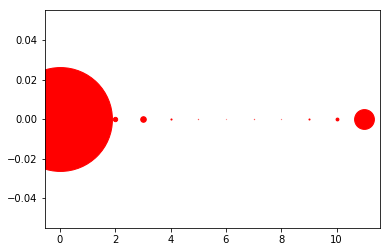

[((6, 0), 4), ((8, 0), 5), ((5, 0), 7), ((7, 0), 7), ((9, 0), 25), ((4, 0), 26), ((10, 0), 68), ((1, 0), 70), ((2, 0), 104), ((3, 0), 134), ((11, 0), 475), ((0, 0), 2493)]
494


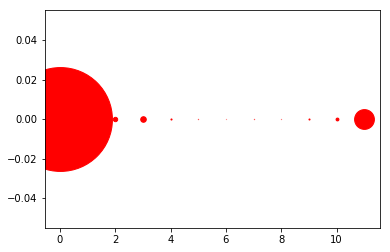

[((6, 0), 4), ((8, 0), 5), ((5, 0), 7), ((7, 0), 7), ((9, 0), 25), ((4, 0), 26), ((10, 0), 68), ((1, 0), 69), ((2, 0), 105), ((3, 0), 134), ((11, 0), 475), ((0, 0), 2493)]
495


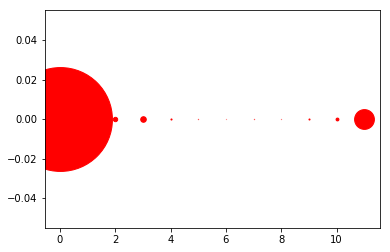

[((6, 0), 4), ((8, 0), 5), ((5, 0), 7), ((7, 0), 7), ((9, 0), 25), ((4, 0), 26), ((10, 0), 68), ((1, 0), 69), ((2, 0), 105), ((3, 0), 134), ((11, 0), 475), ((0, 0), 2493)]
496


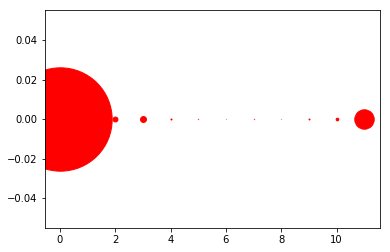

[((8, 0), 4), ((6, 0), 4), ((7, 0), 8), ((5, 0), 8), ((9, 0), 23), ((4, 0), 25), ((10, 0), 64), ((1, 0), 74), ((2, 0), 118), ((3, 0), 143), ((11, 0), 466), ((0, 0), 2481)]
497


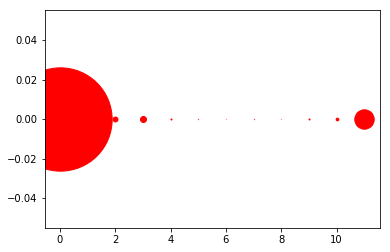

[((8, 0), 4), ((6, 0), 4), ((7, 0), 8), ((5, 0), 8), ((9, 0), 24), ((4, 0), 24), ((10, 0), 64), ((1, 0), 74), ((2, 0), 118), ((3, 0), 144), ((11, 0), 466), ((0, 0), 2480)]
498


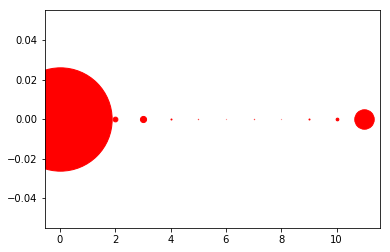

[((8, 0), 4), ((6, 0), 4), ((7, 0), 8), ((5, 0), 8), ((9, 0), 24), ((4, 0), 24), ((10, 0), 65), ((1, 0), 73), ((2, 0), 114), ((3, 0), 147), ((11, 0), 467), ((0, 0), 2480)]
499


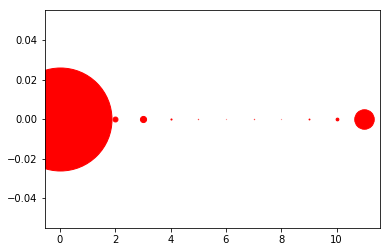

[((8, 0), 4), ((6, 0), 4), ((7, 0), 8), ((5, 0), 8), ((9, 0), 21), ((4, 0), 26), ((10, 0), 66), ((1, 0), 76), ((2, 0), 118), ((3, 0), 147), ((11, 0), 468), ((0, 0), 2472)]
500


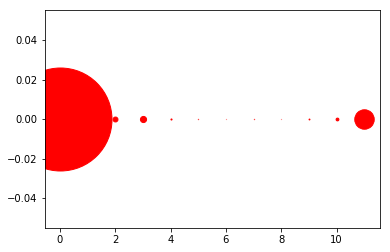

[((8, 0), 4), ((6, 0), 4), ((7, 0), 8), ((5, 0), 8), ((9, 0), 21), ((4, 0), 26), ((10, 0), 67), ((1, 0), 76), ((2, 0), 118), ((3, 0), 147), ((11, 0), 467), ((0, 0), 2472)]
501


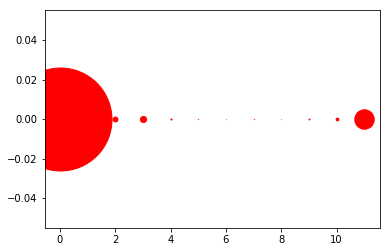

[((8, 0), 4), ((6, 0), 4), ((7, 0), 8), ((5, 0), 8), ((9, 0), 22), ((4, 0), 26), ((10, 0), 66), ((1, 0), 75), ((2, 0), 118), ((3, 0), 148), ((11, 0), 467), ((0, 0), 2472)]
502


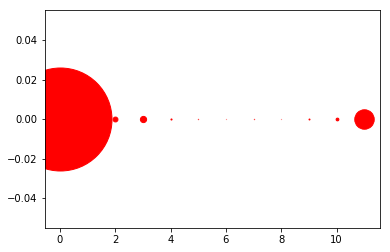

[((8, 0), 4), ((6, 0), 4), ((7, 0), 8), ((5, 0), 8), ((9, 0), 23), ((4, 0), 26), ((10, 0), 66), ((1, 0), 74), ((2, 0), 117), ((3, 0), 149), ((11, 0), 467), ((0, 0), 2472)]
503


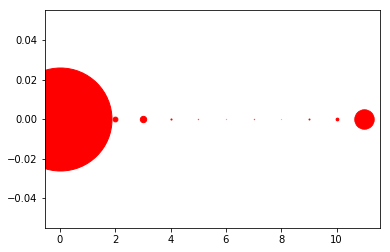

[((8, 0), 3), ((6, 0), 4), ((7, 0), 8), ((5, 0), 8), ((9, 0), 23), ((4, 0), 26), ((10, 0), 66), ((1, 0), 75), ((2, 0), 115), ((3, 0), 152), ((11, 0), 466), ((0, 0), 2472)]
504


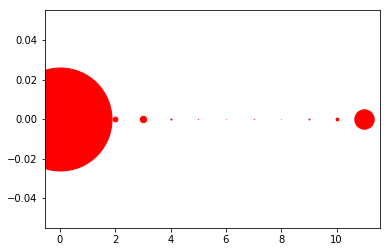

[((8, 0), 4), ((6, 0), 4), ((7, 0), 8), ((5, 0), 8), ((9, 0), 22), ((4, 0), 26), ((10, 0), 66), ((1, 0), 74), ((2, 0), 115), ((3, 0), 153), ((11, 0), 466), ((0, 0), 2472)]
505


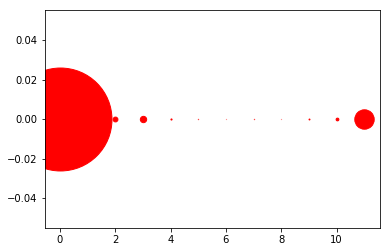

[((8, 0), 4), ((6, 0), 4), ((7, 0), 8), ((5, 0), 8), ((9, 0), 22), ((4, 0), 27), ((10, 0), 66), ((1, 0), 74), ((2, 0), 116), ((3, 0), 152), ((11, 0), 466), ((0, 0), 2471)]
506


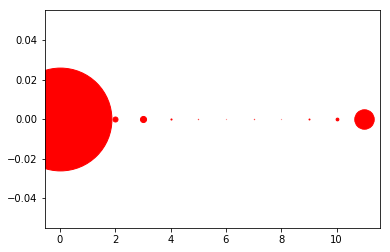

[((8, 0), 4), ((6, 0), 4), ((7, 0), 8), ((5, 0), 8), ((9, 0), 23), ((4, 0), 26), ((10, 0), 66), ((1, 0), 78), ((2, 0), 120), ((3, 0), 146), ((11, 0), 467), ((0, 0), 2468)]
507


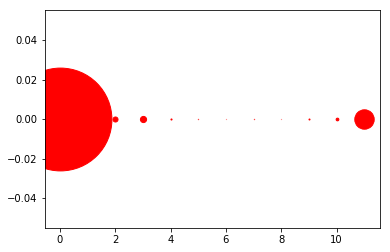

[((8, 0), 4), ((6, 0), 4), ((7, 0), 8), ((5, 0), 8), ((9, 0), 24), ((4, 0), 26), ((10, 0), 65), ((1, 0), 76), ((2, 0), 121), ((3, 0), 148), ((11, 0), 466), ((0, 0), 2468)]
508


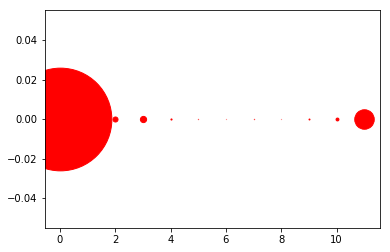

[((8, 0), 4), ((6, 0), 4), ((5, 0), 7), ((7, 0), 8), ((9, 0), 23), ((4, 0), 27), ((10, 0), 69), ((1, 0), 73), ((2, 0), 121), ((3, 0), 149), ((11, 0), 468), ((0, 0), 2465)]
509


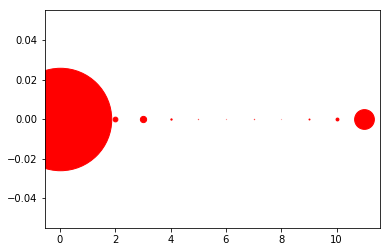

[((8, 0), 3), ((6, 0), 4), ((5, 0), 7), ((7, 0), 8), ((9, 0), 23), ((4, 0), 31), ((10, 0), 69), ((1, 0), 76), ((2, 0), 114), ((3, 0), 150), ((11, 0), 474), ((0, 0), 2459)]
510


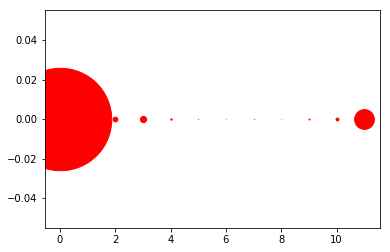

[((8, 0), 3), ((6, 0), 4), ((5, 0), 7), ((7, 0), 8), ((9, 0), 23), ((4, 0), 32), ((10, 0), 69), ((1, 0), 76), ((2, 0), 114), ((3, 0), 149), ((11, 0), 474), ((0, 0), 2459)]
511


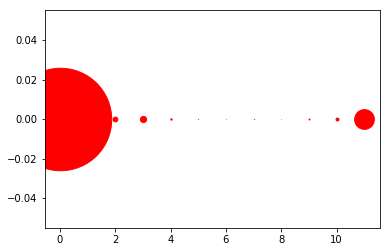

[((8, 0), 3), ((6, 0), 4), ((5, 0), 7), ((7, 0), 8), ((9, 0), 23), ((4, 0), 32), ((10, 0), 70), ((1, 0), 75), ((2, 0), 115), ((3, 0), 149), ((11, 0), 473), ((0, 0), 2459)]
512


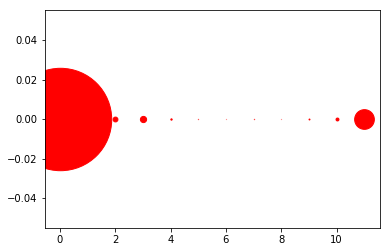

[((8, 0), 4), ((6, 0), 4), ((5, 0), 7), ((7, 0), 8), ((9, 0), 22), ((4, 0), 32), ((10, 0), 70), ((1, 0), 75), ((2, 0), 116), ((3, 0), 149), ((11, 0), 473), ((0, 0), 2458)]
513


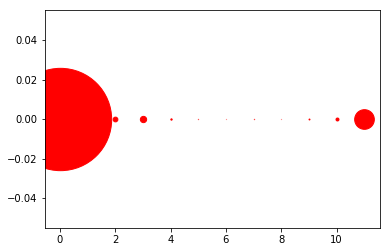

[((8, 0), 4), ((6, 0), 4), ((5, 0), 7), ((7, 0), 8), ((9, 0), 22), ((4, 0), 32), ((10, 0), 71), ((1, 0), 77), ((2, 0), 114), ((3, 0), 151), ((11, 0), 472), ((0, 0), 2456)]
514


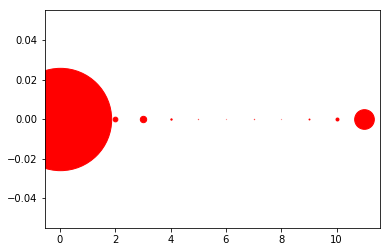

[((8, 0), 4), ((6, 0), 4), ((5, 0), 7), ((7, 0), 8), ((9, 0), 22), ((4, 0), 32), ((10, 0), 71), ((1, 0), 76), ((2, 0), 113), ((3, 0), 153), ((11, 0), 472), ((0, 0), 2456)]
515


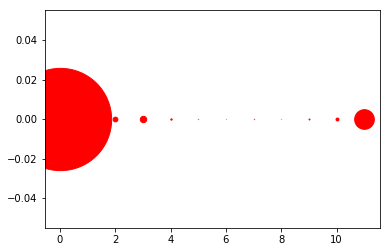

[((8, 0), 4), ((6, 0), 4), ((5, 0), 7), ((7, 0), 8), ((9, 0), 23), ((4, 0), 32), ((10, 0), 70), ((1, 0), 75), ((2, 0), 114), ((3, 0), 154), ((11, 0), 472), ((0, 0), 2455)]
516


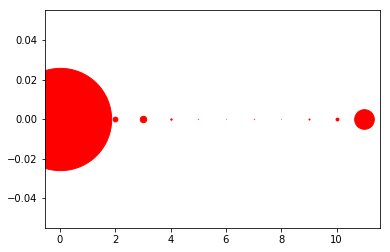

[((8, 0), 4), ((6, 0), 4), ((5, 0), 7), ((7, 0), 8), ((9, 0), 24), ((4, 0), 32), ((10, 0), 69), ((1, 0), 74), ((2, 0), 115), ((3, 0), 155), ((11, 0), 471), ((0, 0), 2455)]
517


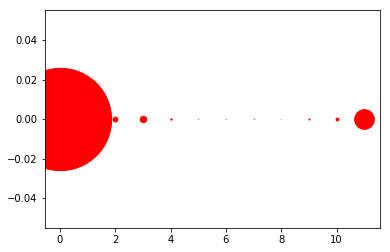

[((8, 0), 4), ((6, 0), 5), ((5, 0), 6), ((7, 0), 8), ((9, 0), 25), ((4, 0), 33), ((10, 0), 68), ((1, 0), 74), ((2, 0), 114), ((3, 0), 155), ((11, 0), 471), ((0, 0), 2455)]
518


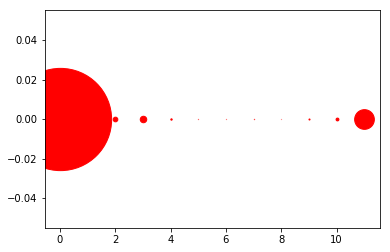

[((8, 0), 4), ((6, 0), 5), ((5, 0), 6), ((7, 0), 8), ((9, 0), 25), ((4, 0), 33), ((10, 0), 68), ((1, 0), 74), ((2, 0), 112), ((3, 0), 156), ((11, 0), 473), ((0, 0), 2454)]
519


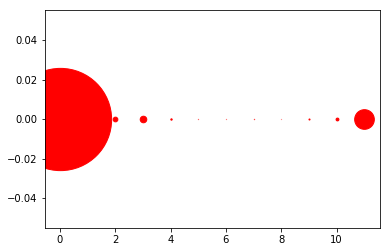

[((8, 0), 4), ((6, 0), 5), ((5, 0), 6), ((7, 0), 8), ((9, 0), 25), ((4, 0), 33), ((10, 0), 68), ((1, 0), 72), ((2, 0), 113), ((3, 0), 158), ((11, 0), 472), ((0, 0), 2454)]
520


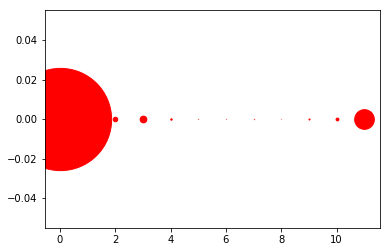

[((8, 0), 4), ((6, 0), 5), ((5, 0), 6), ((7, 0), 8), ((9, 0), 25), ((4, 0), 34), ((10, 0), 68), ((1, 0), 72), ((2, 0), 109), ((3, 0), 161), ((11, 0), 472), ((0, 0), 2454)]
521


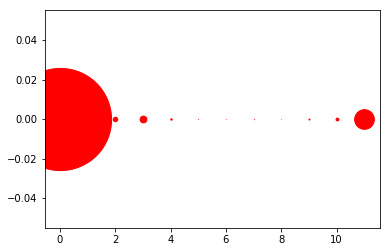

[((8, 0), 4), ((6, 0), 5), ((5, 0), 6), ((7, 0), 8), ((9, 0), 25), ((4, 0), 34), ((10, 0), 68), ((1, 0), 73), ((2, 0), 107), ((3, 0), 163), ((11, 0), 472), ((0, 0), 2453)]
522


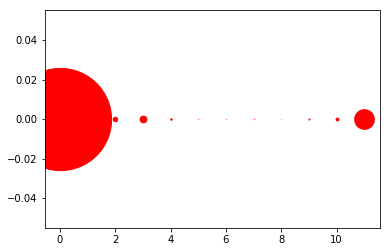

[((8, 0), 4), ((6, 0), 5), ((5, 0), 6), ((7, 0), 8), ((9, 0), 25), ((4, 0), 35), ((10, 0), 68), ((1, 0), 73), ((2, 0), 107), ((3, 0), 162), ((11, 0), 472), ((0, 0), 2453)]
523


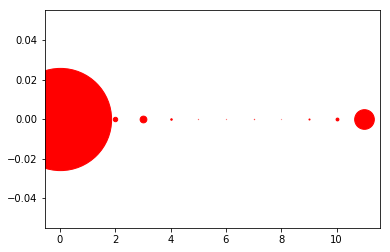

[((8, 0), 4), ((6, 0), 5), ((5, 0), 6), ((7, 0), 8), ((9, 0), 25), ((4, 0), 36), ((10, 0), 68), ((1, 0), 73), ((2, 0), 106), ((3, 0), 162), ((11, 0), 472), ((0, 0), 2453)]
524


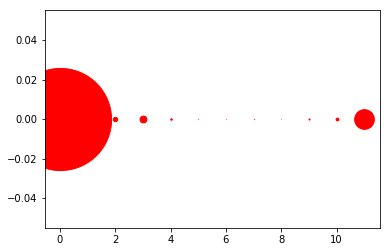

[((8, 0), 4), ((6, 0), 5), ((5, 0), 6), ((7, 0), 8), ((9, 0), 26), ((4, 0), 36), ((10, 0), 67), ((1, 0), 73), ((2, 0), 105), ((3, 0), 164), ((11, 0), 472), ((0, 0), 2452)]
525


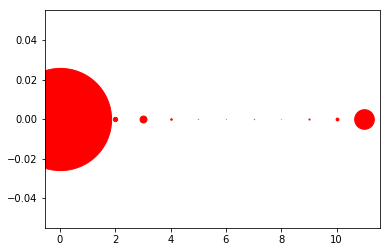

[((8, 0), 4), ((6, 0), 5), ((5, 0), 6), ((7, 0), 8), ((9, 0), 26), ((4, 0), 37), ((10, 0), 67), ((1, 0), 71), ((2, 0), 104), ((3, 0), 166), ((11, 0), 471), ((0, 0), 2453)]
526


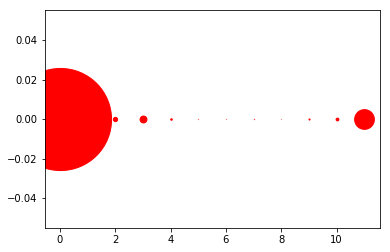

[((8, 0), 4), ((6, 0), 5), ((5, 0), 6), ((7, 0), 8), ((9, 0), 26), ((4, 0), 37), ((10, 0), 67), ((1, 0), 72), ((2, 0), 103), ((3, 0), 165), ((11, 0), 474), ((0, 0), 2451)]
527


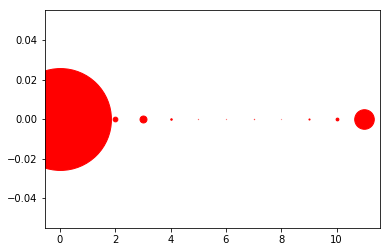

[((8, 0), 4), ((6, 0), 5), ((5, 0), 6), ((7, 0), 8), ((9, 0), 26), ((4, 0), 36), ((10, 0), 67), ((1, 0), 71), ((2, 0), 113), ((3, 0), 167), ((11, 0), 470), ((0, 0), 2445)]
528


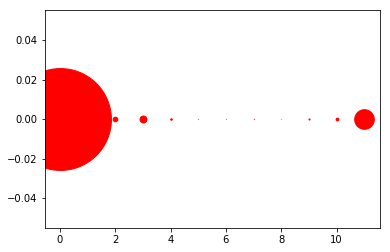

[((8, 0), 4), ((6, 0), 5), ((5, 0), 6), ((7, 0), 8), ((9, 0), 26), ((4, 0), 37), ((10, 0), 67), ((1, 0), 70), ((2, 0), 112), ((3, 0), 167), ((11, 0), 471), ((0, 0), 2445)]
529


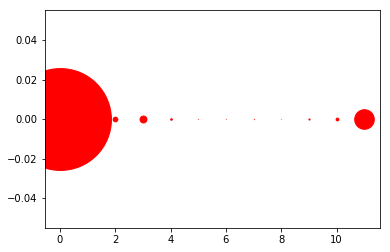

[((8, 0), 4), ((6, 0), 5), ((5, 0), 6), ((7, 0), 8), ((9, 0), 27), ((4, 0), 38), ((10, 0), 67), ((1, 0), 70), ((2, 0), 112), ((3, 0), 166), ((11, 0), 470), ((0, 0), 2445)]
530


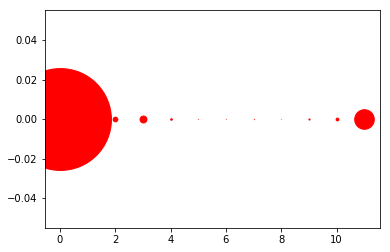

[((8, 0), 4), ((6, 0), 5), ((5, 0), 6), ((7, 0), 8), ((9, 0), 27), ((4, 0), 38), ((10, 0), 67), ((1, 0), 70), ((2, 0), 112), ((3, 0), 166), ((11, 0), 470), ((0, 0), 2445)]
531


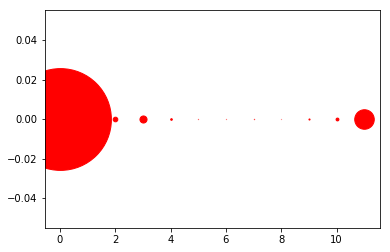

[((8, 0), 4), ((6, 0), 5), ((5, 0), 6), ((7, 0), 8), ((9, 0), 26), ((4, 0), 39), ((10, 0), 68), ((1, 0), 69), ((2, 0), 111), ((3, 0), 170), ((11, 0), 469), ((0, 0), 2443)]
532


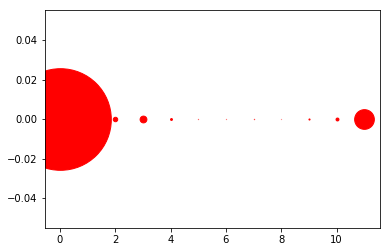

[((8, 0), 4), ((6, 0), 5), ((5, 0), 6), ((7, 0), 8), ((9, 0), 26), ((4, 0), 45), ((10, 0), 70), ((1, 0), 72), ((2, 0), 107), ((3, 0), 163), ((11, 0), 473), ((0, 0), 2439)]
533


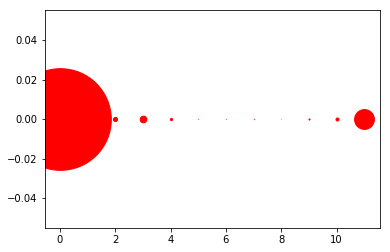

[((8, 0), 3), ((6, 0), 5), ((5, 0), 6), ((7, 0), 8), ((9, 0), 26), ((4, 0), 53), ((1, 0), 70), ((10, 0), 72), ((2, 0), 99), ((3, 0), 160), ((11, 0), 476), ((0, 0), 2440)]
534


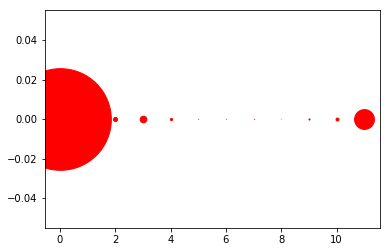

[((8, 0), 3), ((6, 0), 5), ((5, 0), 6), ((7, 0), 8), ((9, 0), 27), ((4, 0), 53), ((1, 0), 70), ((10, 0), 71), ((2, 0), 99), ((3, 0), 160), ((11, 0), 476), ((0, 0), 2440)]
535


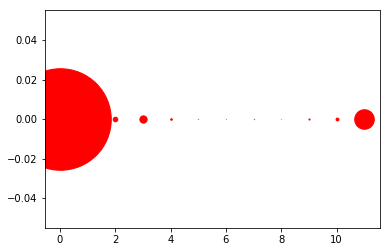

[((8, 0), 4), ((6, 0), 5), ((5, 0), 6), ((7, 0), 8), ((9, 0), 27), ((4, 0), 38), ((10, 0), 68), ((1, 0), 71), ((2, 0), 110), ((3, 0), 175), ((11, 0), 469), ((0, 0), 2437)]
536


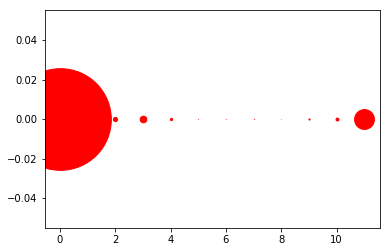

[((8, 0), 3), ((6, 0), 5), ((5, 0), 6), ((7, 0), 8), ((9, 0), 28), ((4, 0), 53), ((10, 0), 70), ((1, 0), 70), ((2, 0), 99), ((3, 0), 160), ((11, 0), 476), ((0, 0), 2440)]
537


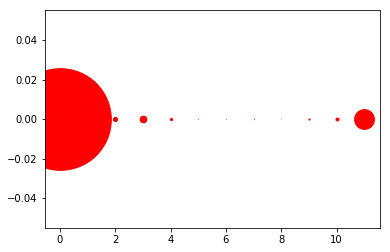

[((8, 0), 3), ((6, 0), 5), ((5, 0), 6), ((7, 0), 8), ((9, 0), 28), ((4, 0), 53), ((1, 0), 69), ((10, 0), 71), ((2, 0), 100), ((3, 0), 160), ((11, 0), 475), ((0, 0), 2440)]
538


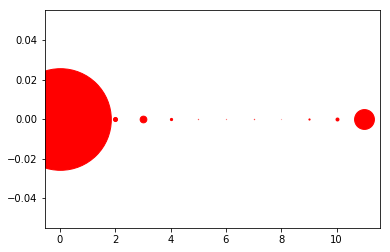

[((8, 0), 3), ((6, 0), 5), ((5, 0), 7), ((7, 0), 8), ((9, 0), 28), ((4, 0), 53), ((1, 0), 69), ((10, 0), 71), ((2, 0), 98), ((3, 0), 161), ((11, 0), 476), ((0, 0), 2439)]
539


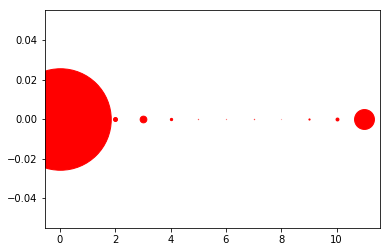

[((8, 0), 3), ((6, 0), 5), ((5, 0), 7), ((7, 0), 8), ((9, 0), 28), ((4, 0), 55), ((10, 0), 70), ((1, 0), 72), ((2, 0), 96), ((3, 0), 161), ((11, 0), 477), ((0, 0), 2436)]
540


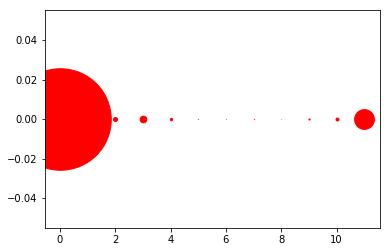

[((8, 0), 3), ((6, 0), 5), ((5, 0), 7), ((7, 0), 8), ((9, 0), 28), ((4, 0), 55), ((10, 0), 71), ((1, 0), 72), ((2, 0), 96), ((3, 0), 161), ((11, 0), 475), ((0, 0), 2437)]
541


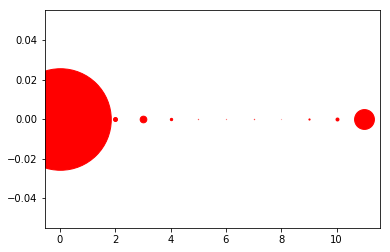

[((8, 0), 3), ((6, 0), 5), ((5, 0), 7), ((7, 0), 8), ((9, 0), 28), ((4, 0), 56), ((10, 0), 71), ((1, 0), 71), ((2, 0), 96), ((3, 0), 160), ((11, 0), 476), ((0, 0), 2437)]
542


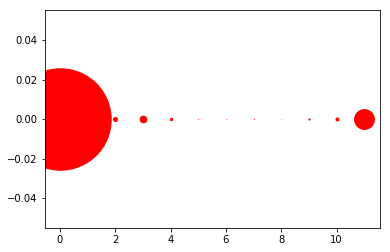

[((8, 0), 3), ((6, 0), 5), ((5, 0), 7), ((7, 0), 8), ((9, 0), 28), ((4, 0), 57), ((10, 0), 71), ((1, 0), 72), ((2, 0), 95), ((3, 0), 161), ((11, 0), 476), ((0, 0), 2435)]
543


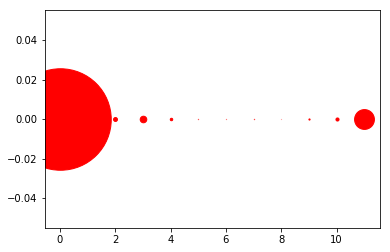

[((8, 0), 3), ((6, 0), 5), ((5, 0), 7), ((7, 0), 8), ((9, 0), 28), ((4, 0), 59), ((1, 0), 70), ((10, 0), 74), ((2, 0), 94), ((3, 0), 158), ((11, 0), 476), ((0, 0), 2436)]
544


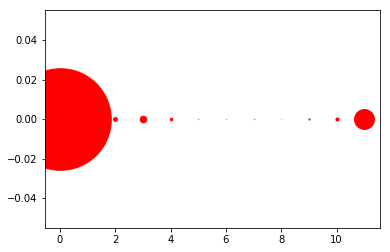

[((8, 0), 3), ((6, 0), 5), ((5, 0), 7), ((7, 0), 8), ((9, 0), 28), ((4, 0), 59), ((1, 0), 67), ((10, 0), 74), ((2, 0), 93), ((3, 0), 159), ((11, 0), 477), ((0, 0), 2438)]
545


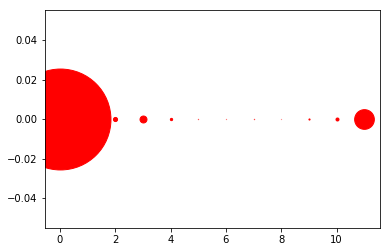

[((8, 0), 4), ((6, 0), 5), ((5, 0), 7), ((7, 0), 8), ((9, 0), 27), ((4, 0), 55), ((10, 0), 72), ((1, 0), 79), ((2, 0), 99), ((3, 0), 167), ((11, 0), 473), ((0, 0), 2422)]
546


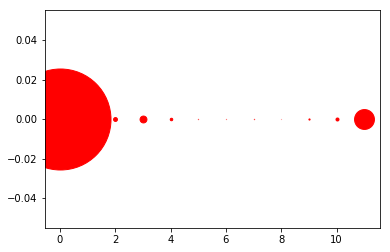

[((8, 0), 3), ((6, 0), 5), ((5, 0), 7), ((7, 0), 8), ((9, 0), 28), ((4, 0), 60), ((10, 0), 72), ((1, 0), 76), ((2, 0), 93), ((3, 0), 165), ((11, 0), 477), ((0, 0), 2424)]
547


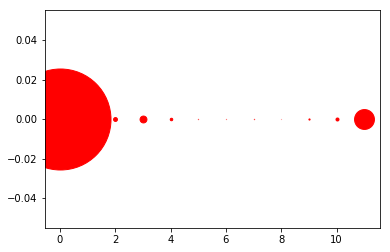

[((8, 0), 3), ((6, 0), 5), ((5, 0), 7), ((7, 0), 8), ((9, 0), 28), ((4, 0), 60), ((10, 0), 72), ((1, 0), 76), ((2, 0), 93), ((3, 0), 165), ((11, 0), 477), ((0, 0), 2424)]
548


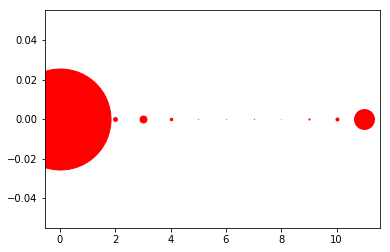

[((8, 0), 4), ((6, 0), 5), ((5, 0), 7), ((7, 0), 8), ((9, 0), 27), ((4, 0), 60), ((10, 0), 72), ((1, 0), 76), ((2, 0), 92), ((3, 0), 166), ((11, 0), 477), ((0, 0), 2424)]
549


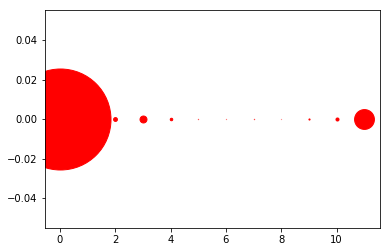

[((8, 0), 4), ((6, 0), 5), ((5, 0), 7), ((7, 0), 8), ((9, 0), 27), ((4, 0), 60), ((10, 0), 73), ((1, 0), 75), ((2, 0), 92), ((3, 0), 167), ((11, 0), 476), ((0, 0), 2424)]
550


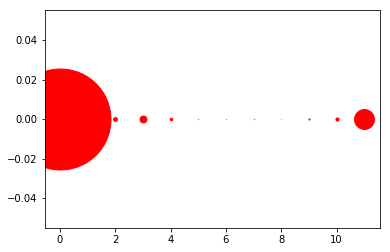

[((8, 0), 4), ((6, 0), 5), ((5, 0), 7), ((7, 0), 8), ((9, 0), 27), ((4, 0), 60), ((10, 0), 75), ((1, 0), 75), ((2, 0), 92), ((3, 0), 165), ((11, 0), 477), ((0, 0), 2423)]
551


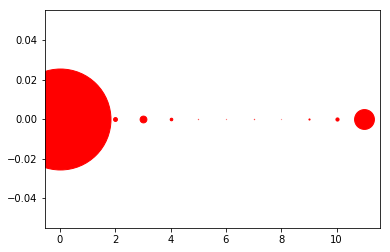

[((8, 0), 4), ((6, 0), 5), ((5, 0), 7), ((7, 0), 8), ((9, 0), 27), ((4, 0), 62), ((1, 0), 74), ((10, 0), 76), ((2, 0), 93), ((3, 0), 163), ((11, 0), 476), ((0, 0), 2423)]
552


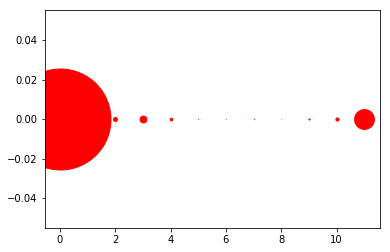

[((8, 0), 4), ((6, 0), 5), ((5, 0), 7), ((7, 0), 8), ((9, 0), 27), ((4, 0), 62), ((1, 0), 72), ((10, 0), 76), ((2, 0), 94), ((3, 0), 164), ((11, 0), 476), ((0, 0), 2423)]
553


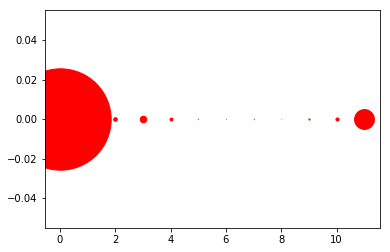

[((8, 0), 3), ((6, 0), 5), ((7, 0), 8), ((5, 0), 8), ((9, 0), 28), ((1, 0), 69), ((4, 0), 69), ((10, 0), 75), ((2, 0), 87), ((3, 0), 157), ((11, 0), 476), ((0, 0), 2433)]
554


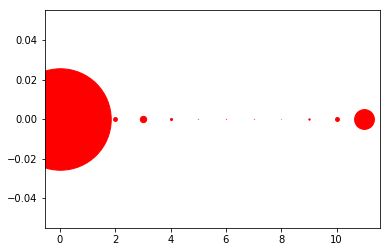

[((8, 0), 4), ((7, 0), 6), ((5, 0), 6), ((6, 0), 7), ((9, 0), 32), ((4, 0), 49), ((1, 0), 67), ((2, 0), 92), ((10, 0), 93), ((3, 0), 152), ((11, 0), 475), ((0, 0), 2435)]
555


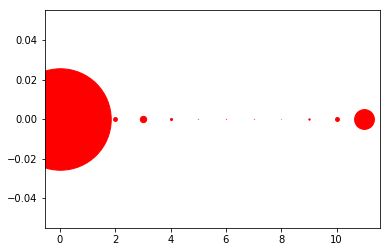

[((8, 0), 4), ((7, 0), 6), ((5, 0), 6), ((6, 0), 7), ((9, 0), 32), ((4, 0), 49), ((1, 0), 67), ((2, 0), 92), ((10, 0), 93), ((3, 0), 152), ((11, 0), 475), ((0, 0), 2435)]
556


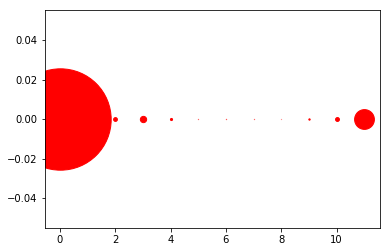

[((8, 0), 4), ((7, 0), 6), ((5, 0), 6), ((6, 0), 7), ((9, 0), 32), ((4, 0), 51), ((1, 0), 69), ((2, 0), 91), ((10, 0), 93), ((3, 0), 151), ((11, 0), 475), ((0, 0), 2433)]
557


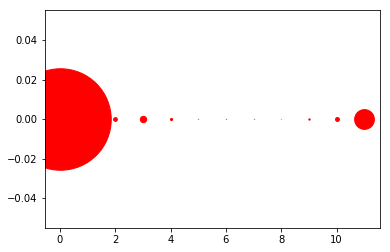

[((8, 0), 4), ((7, 0), 6), ((5, 0), 6), ((6, 0), 7), ((9, 0), 32), ((4, 0), 51), ((1, 0), 67), ((2, 0), 90), ((10, 0), 93), ((3, 0), 152), ((11, 0), 474), ((0, 0), 2436)]
558


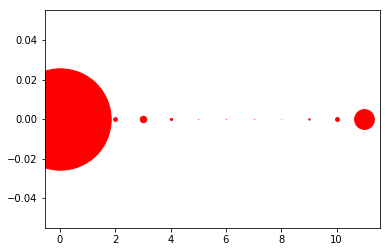

[((8, 0), 4), ((7, 0), 6), ((5, 0), 6), ((6, 0), 7), ((9, 0), 32), ((4, 0), 51), ((1, 0), 69), ((2, 0), 88), ((10, 0), 93), ((3, 0), 155), ((11, 0), 474), ((0, 0), 2433)]
559


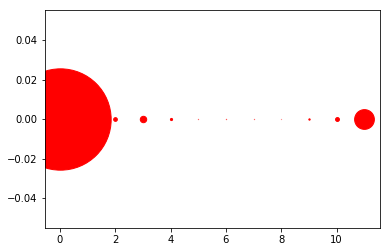

[((8, 0), 4), ((7, 0), 6), ((5, 0), 6), ((6, 0), 7), ((9, 0), 32), ((4, 0), 52), ((1, 0), 69), ((2, 0), 89), ((10, 0), 93), ((3, 0), 154), ((11, 0), 474), ((0, 0), 2432)]
560


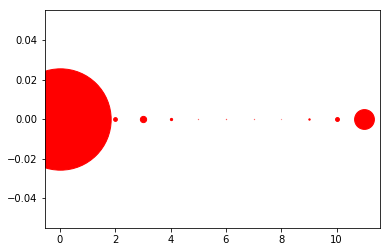

[((8, 0), 4), ((7, 0), 6), ((5, 0), 6), ((6, 0), 7), ((9, 0), 33), ((4, 0), 54), ((1, 0), 68), ((2, 0), 90), ((10, 0), 93), ((3, 0), 150), ((11, 0), 475), ((0, 0), 2432)]
561


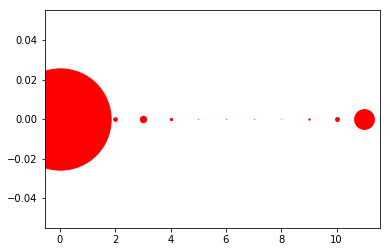

[((8, 0), 4), ((7, 0), 6), ((5, 0), 6), ((6, 0), 7), ((9, 0), 33), ((4, 0), 54), ((1, 0), 69), ((2, 0), 87), ((10, 0), 93), ((3, 0), 153), ((11, 0), 475), ((0, 0), 2431)]
562


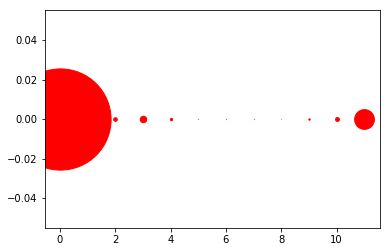

[((8, 0), 4), ((7, 0), 6), ((5, 0), 6), ((6, 0), 7), ((9, 0), 34), ((4, 0), 54), ((1, 0), 70), ((2, 0), 87), ((10, 0), 92), ((3, 0), 155), ((11, 0), 474), ((0, 0), 2429)]
563


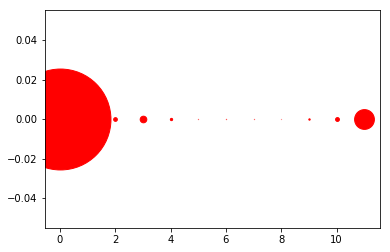

[((8, 0), 4), ((7, 0), 6), ((5, 0), 6), ((6, 0), 7), ((9, 0), 33), ((4, 0), 55), ((1, 0), 70), ((2, 0), 89), ((10, 0), 92), ((3, 0), 159), ((11, 0), 475), ((0, 0), 2422)]
564


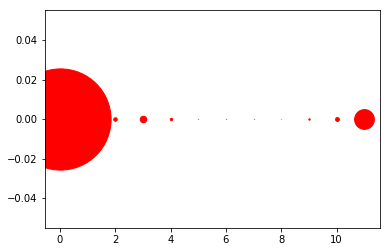

[((8, 0), 4), ((7, 0), 6), ((5, 0), 6), ((6, 0), 7), ((9, 0), 34), ((4, 0), 56), ((1, 0), 69), ((2, 0), 84), ((10, 0), 92), ((3, 0), 157), ((11, 0), 474), ((0, 0), 2429)]
565


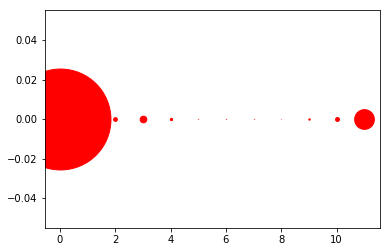

[((8, 0), 4), ((7, 0), 6), ((5, 0), 6), ((6, 0), 7), ((9, 0), 33), ((4, 0), 55), ((1, 0), 69), ((2, 0), 90), ((10, 0), 93), ((3, 0), 160), ((11, 0), 473), ((0, 0), 2422)]
566


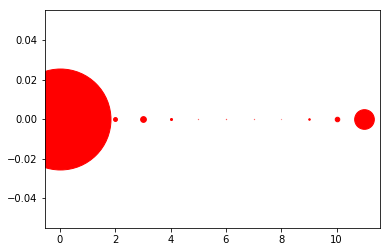

[((8, 0), 4), ((7, 0), 6), ((5, 0), 6), ((6, 0), 7), ((9, 0), 37), ((4, 0), 49), ((1, 0), 74), ((2, 0), 93), ((10, 0), 109), ((3, 0), 138), ((11, 0), 472), ((0, 0), 2423)]
567


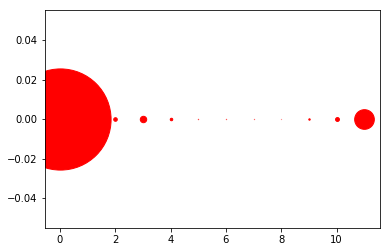

[((8, 0), 4), ((7, 0), 6), ((6, 0), 7), ((5, 0), 8), ((9, 0), 34), ((4, 0), 60), ((1, 0), 66), ((2, 0), 86), ((10, 0), 93), ((3, 0), 154), ((11, 0), 472), ((0, 0), 2428)]
568


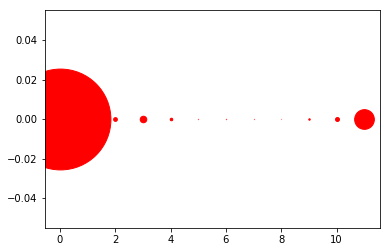

[((8, 0), 4), ((7, 0), 6), ((5, 0), 7), ((6, 0), 8), ((9, 0), 34), ((4, 0), 61), ((1, 0), 64), ((2, 0), 90), ((10, 0), 94), ((3, 0), 157), ((11, 0), 473), ((0, 0), 2420)]
569


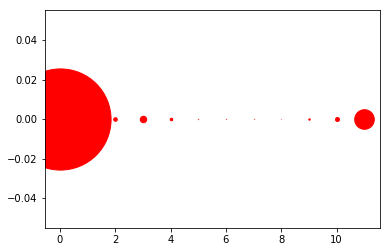

[((8, 0), 4), ((7, 0), 6), ((6, 0), 7), ((5, 0), 8), ((9, 0), 34), ((4, 0), 61), ((1, 0), 65), ((2, 0), 86), ((10, 0), 95), ((3, 0), 154), ((11, 0), 470), ((0, 0), 2428)]
570


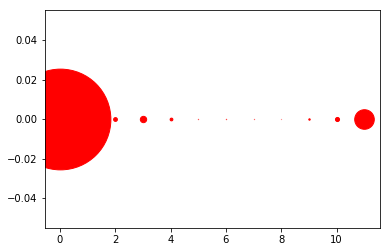

[((8, 0), 4), ((7, 0), 6), ((5, 0), 7), ((6, 0), 8), ((9, 0), 34), ((1, 0), 64), ((4, 0), 66), ((2, 0), 91), ((10, 0), 98), ((3, 0), 152), ((11, 0), 470), ((0, 0), 2418)]
571


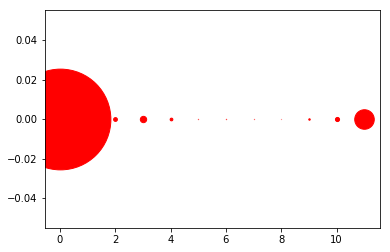

[((8, 0), 4), ((7, 0), 6), ((5, 0), 7), ((6, 0), 8), ((9, 0), 35), ((1, 0), 64), ((4, 0), 65), ((2, 0), 91), ((10, 0), 99), ((3, 0), 152), ((11, 0), 469), ((0, 0), 2418)]
572


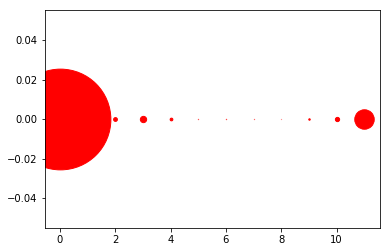

[((8, 0), 4), ((7, 0), 6), ((5, 0), 7), ((6, 0), 8), ((9, 0), 35), ((1, 0), 64), ((4, 0), 65), ((2, 0), 91), ((10, 0), 102), ((3, 0), 151), ((11, 0), 467), ((0, 0), 2418)]
573


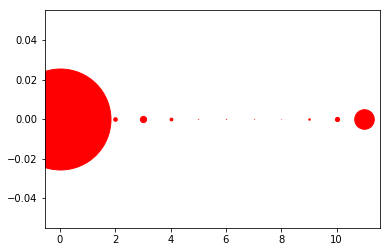

[((8, 0), 4), ((7, 0), 6), ((5, 0), 7), ((6, 0), 8), ((9, 0), 35), ((1, 0), 64), ((4, 0), 66), ((2, 0), 87), ((10, 0), 100), ((3, 0), 149), ((11, 0), 469), ((0, 0), 2423)]
574


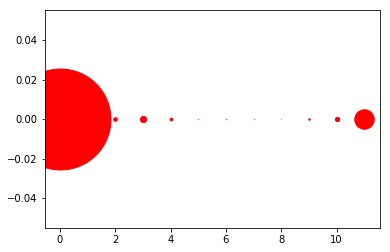

[((8, 0), 4), ((7, 0), 6), ((5, 0), 7), ((6, 0), 8), ((9, 0), 35), ((1, 0), 63), ((4, 0), 66), ((2, 0), 86), ((10, 0), 103), ((3, 0), 150), ((11, 0), 467), ((0, 0), 2423)]
575


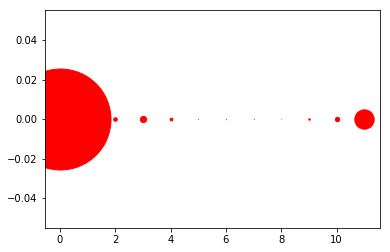

[((8, 0), 4), ((7, 0), 6), ((5, 0), 7), ((6, 0), 8), ((9, 0), 35), ((1, 0), 63), ((4, 0), 66), ((2, 0), 86), ((10, 0), 105), ((3, 0), 150), ((11, 0), 465), ((0, 0), 2423)]
576


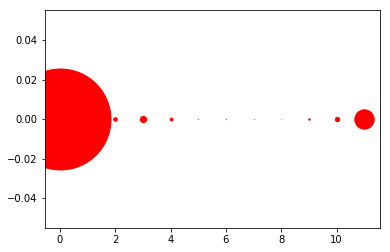

[((8, 0), 4), ((7, 0), 6), ((5, 0), 7), ((6, 0), 8), ((9, 0), 35), ((1, 0), 63), ((4, 0), 67), ((2, 0), 86), ((10, 0), 105), ((3, 0), 149), ((11, 0), 465), ((0, 0), 2423)]
577


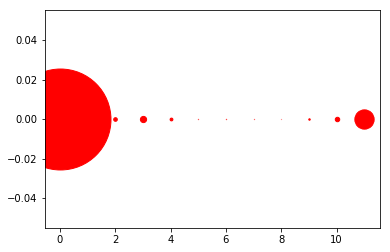

[((8, 0), 4), ((7, 0), 6), ((5, 0), 7), ((6, 0), 8), ((9, 0), 35), ((1, 0), 62), ((4, 0), 67), ((2, 0), 87), ((10, 0), 107), ((3, 0), 149), ((11, 0), 463), ((0, 0), 2423)]
578


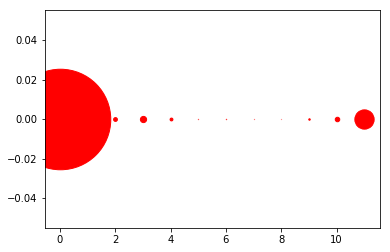

[((8, 0), 4), ((7, 0), 5), ((5, 0), 7), ((6, 0), 9), ((9, 0), 35), ((1, 0), 66), ((4, 0), 68), ((2, 0), 91), ((10, 0), 108), ((3, 0), 149), ((11, 0), 463), ((0, 0), 2413)]
579


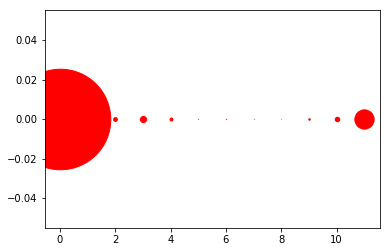

[((8, 0), 4), ((7, 0), 5), ((5, 0), 7), ((6, 0), 9), ((9, 0), 36), ((1, 0), 66), ((4, 0), 69), ((2, 0), 91), ((10, 0), 108), ((3, 0), 147), ((11, 0), 463), ((0, 0), 2413)]
580


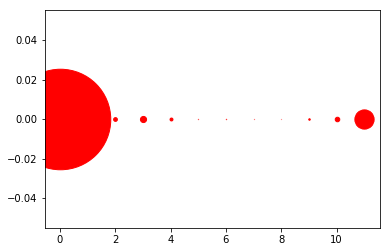

[((8, 0), 4), ((7, 0), 5), ((5, 0), 7), ((6, 0), 9), ((9, 0), 36), ((1, 0), 66), ((4, 0), 70), ((2, 0), 90), ((10, 0), 109), ((3, 0), 147), ((11, 0), 462), ((0, 0), 2413)]
581


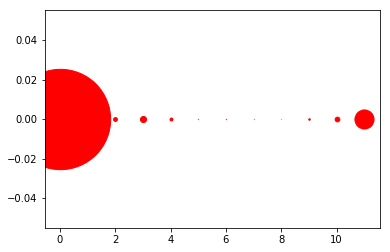

[((8, 0), 4), ((7, 0), 5), ((5, 0), 8), ((6, 0), 9), ((9, 0), 37), ((1, 0), 67), ((4, 0), 70), ((2, 0), 92), ((10, 0), 113), ((3, 0), 146), ((11, 0), 459), ((0, 0), 2408)]
582


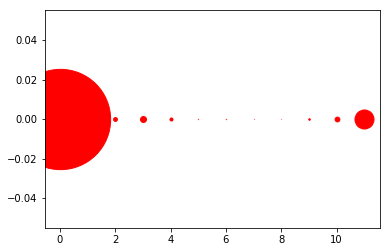

[((8, 0), 4), ((7, 0), 5), ((5, 0), 8), ((6, 0), 9), ((9, 0), 37), ((1, 0), 68), ((4, 0), 72), ((2, 0), 92), ((10, 0), 115), ((3, 0), 144), ((11, 0), 457), ((0, 0), 2407)]
583


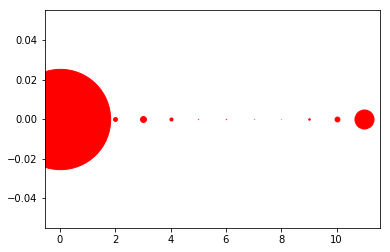

[((8, 0), 4), ((7, 0), 5), ((5, 0), 8), ((6, 0), 9), ((9, 0), 37), ((1, 0), 68), ((4, 0), 73), ((2, 0), 92), ((10, 0), 116), ((3, 0), 142), ((11, 0), 457), ((0, 0), 2407)]
584


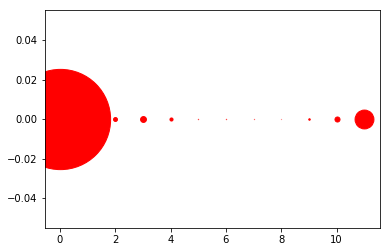

[((8, 0), 4), ((7, 0), 6), ((5, 0), 8), ((6, 0), 8), ((9, 0), 36), ((1, 0), 67), ((4, 0), 74), ((2, 0), 94), ((10, 0), 121), ((3, 0), 141), ((11, 0), 453), ((0, 0), 2406)]
585


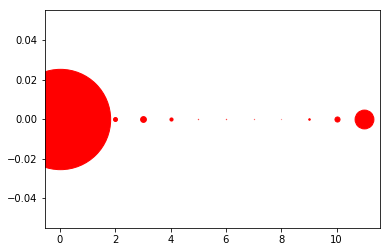

[((8, 0), 4), ((7, 0), 6), ((5, 0), 8), ((6, 0), 8), ((9, 0), 37), ((1, 0), 64), ((4, 0), 75), ((2, 0), 95), ((10, 0), 122), ((3, 0), 139), ((11, 0), 452), ((0, 0), 2408)]
586


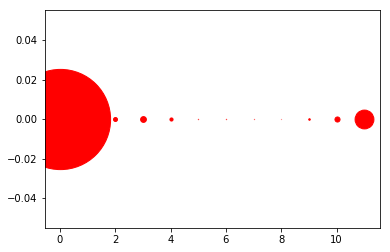

[((8, 0), 4), ((7, 0), 6), ((5, 0), 8), ((6, 0), 8), ((9, 0), 37), ((1, 0), 67), ((4, 0), 75), ((2, 0), 95), ((10, 0), 122), ((3, 0), 139), ((11, 0), 452), ((0, 0), 2405)]
587


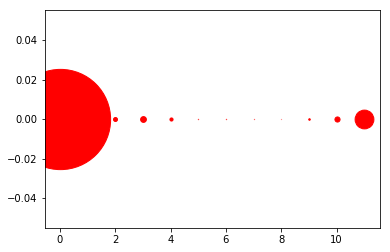

[((8, 0), 4), ((7, 0), 6), ((5, 0), 8), ((6, 0), 8), ((9, 0), 37), ((1, 0), 66), ((4, 0), 75), ((2, 0), 95), ((10, 0), 123), ((3, 0), 139), ((11, 0), 451), ((0, 0), 2406)]
588


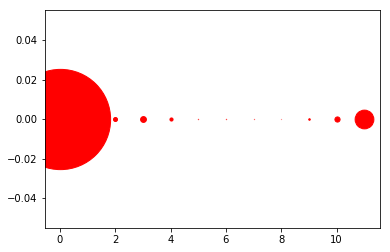

[((8, 0), 4), ((7, 0), 6), ((5, 0), 8), ((6, 0), 8), ((9, 0), 37), ((1, 0), 64), ((4, 0), 75), ((2, 0), 96), ((10, 0), 124), ((3, 0), 140), ((11, 0), 450), ((0, 0), 2406)]
589


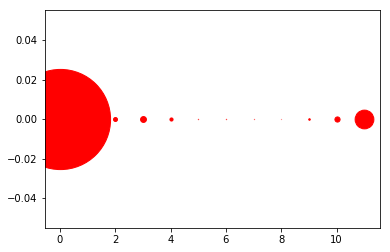

[((8, 0), 4), ((7, 0), 6), ((5, 0), 8), ((6, 0), 8), ((9, 0), 37), ((1, 0), 66), ((4, 0), 75), ((2, 0), 95), ((10, 0), 124), ((3, 0), 141), ((11, 0), 450), ((0, 0), 2404)]
590


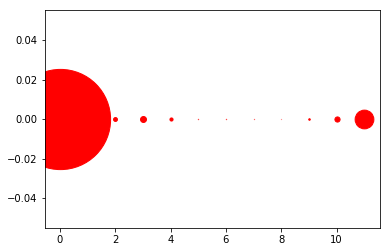

[((8, 0), 4), ((7, 0), 6), ((5, 0), 8), ((6, 0), 8), ((9, 0), 37), ((1, 0), 65), ((4, 0), 75), ((2, 0), 93), ((10, 0), 124), ((3, 0), 143), ((11, 0), 450), ((0, 0), 2405)]
591


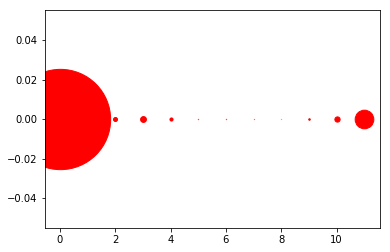

[((8, 0), 4), ((7, 0), 6), ((5, 0), 8), ((6, 0), 8), ((9, 0), 37), ((1, 0), 63), ((4, 0), 75), ((2, 0), 96), ((10, 0), 126), ((3, 0), 140), ((11, 0), 448), ((0, 0), 2407)]
592


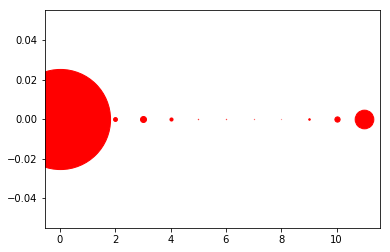

[((8, 0), 4), ((7, 0), 6), ((6, 0), 8), ((5, 0), 9), ((9, 0), 37), ((1, 0), 66), ((4, 0), 74), ((2, 0), 93), ((10, 0), 126), ((3, 0), 144), ((11, 0), 448), ((0, 0), 2403)]
593


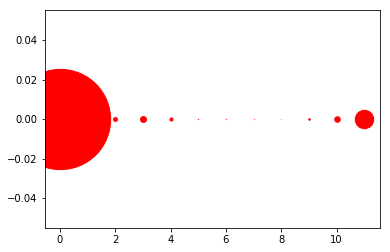

[((8, 0), 4), ((7, 0), 6), ((6, 0), 8), ((5, 0), 9), ((9, 0), 37), ((1, 0), 64), ((4, 0), 74), ((2, 0), 93), ((10, 0), 131), ((3, 0), 143), ((11, 0), 443), ((0, 0), 2406)]
594


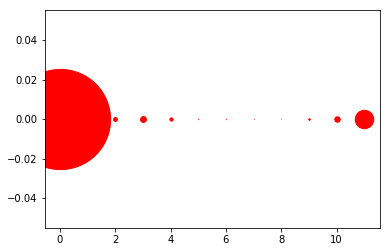

[((8, 0), 4), ((7, 0), 6), ((6, 0), 8), ((5, 0), 9), ((9, 0), 37), ((1, 0), 64), ((4, 0), 77), ((2, 0), 93), ((10, 0), 131), ((3, 0), 141), ((11, 0), 443), ((0, 0), 2405)]
595


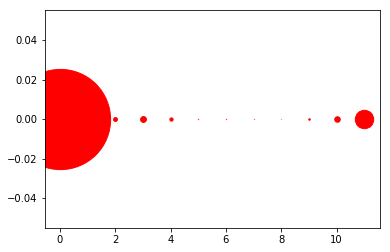

[((8, 0), 4), ((7, 0), 6), ((6, 0), 8), ((5, 0), 9), ((9, 0), 37), ((1, 0), 64), ((4, 0), 78), ((2, 0), 93), ((10, 0), 132), ((3, 0), 140), ((11, 0), 442), ((0, 0), 2405)]
596


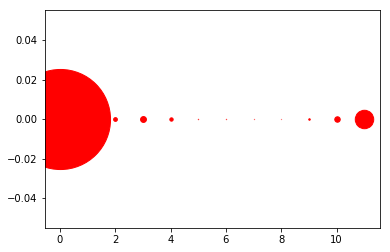

[((8, 0), 5), ((7, 0), 6), ((6, 0), 8), ((5, 0), 9), ((9, 0), 36), ((1, 0), 67), ((4, 0), 80), ((2, 0), 90), ((10, 0), 131), ((3, 0), 141), ((11, 0), 443), ((0, 0), 2402)]
597


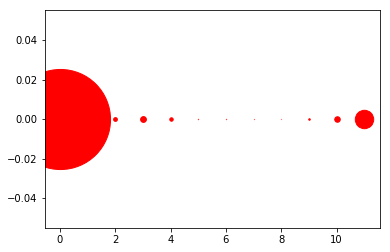

[((8, 0), 5), ((7, 0), 6), ((6, 0), 8), ((5, 0), 9), ((9, 0), 36), ((1, 0), 67), ((4, 0), 82), ((2, 0), 90), ((10, 0), 132), ((3, 0), 139), ((11, 0), 442), ((0, 0), 2402)]
598


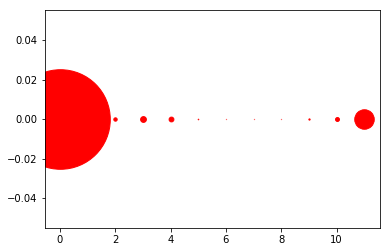

[((8, 0), 6), ((6, 0), 6), ((7, 0), 6), ((5, 0), 14), ((9, 0), 30), ((1, 0), 69), ((2, 0), 81), ((10, 0), 94), ((4, 0), 115), ((3, 0), 139), ((11, 0), 468), ((0, 0), 2390)]
599


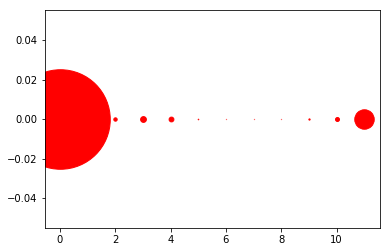

[((8, 0), 6), ((6, 0), 6), ((7, 0), 6), ((5, 0), 14), ((9, 0), 30), ((1, 0), 70), ((2, 0), 81), ((10, 0), 95), ((4, 0), 115), ((3, 0), 139), ((11, 0), 467), ((0, 0), 2389)]
600


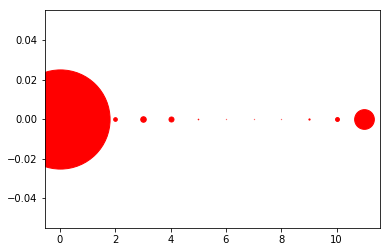

[((8, 0), 6), ((6, 0), 6), ((7, 0), 6), ((5, 0), 14), ((9, 0), 29), ((1, 0), 70), ((2, 0), 88), ((10, 0), 93), ((4, 0), 120), ((3, 0), 133), ((11, 0), 473), ((0, 0), 2380)]
601


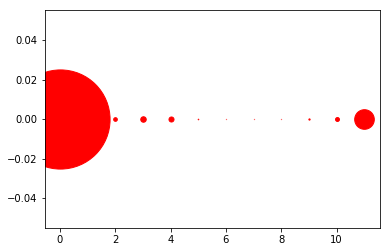

[((8, 0), 6), ((6, 0), 6), ((7, 0), 6), ((5, 0), 14), ((9, 0), 30), ((1, 0), 70), ((2, 0), 88), ((10, 0), 94), ((4, 0), 121), ((3, 0), 132), ((11, 0), 471), ((0, 0), 2380)]
602


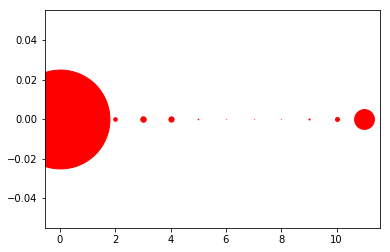

[((8, 0), 6), ((6, 0), 6), ((7, 0), 6), ((5, 0), 16), ((9, 0), 27), ((1, 0), 73), ((2, 0), 86), ((10, 0), 95), ((4, 0), 125), ((3, 0), 130), ((11, 0), 475), ((0, 0), 2373)]
603


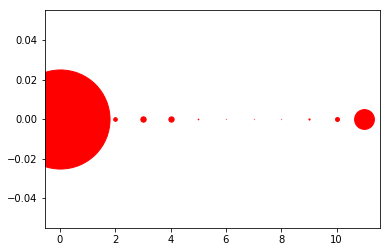

[((8, 0), 6), ((6, 0), 6), ((7, 0), 6), ((5, 0), 16), ((9, 0), 28), ((1, 0), 66), ((2, 0), 87), ((10, 0), 94), ((4, 0), 127), ((3, 0), 129), ((11, 0), 475), ((0, 0), 2378)]
604


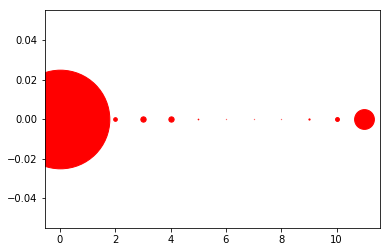

[((8, 0), 6), ((6, 0), 6), ((7, 0), 6), ((5, 0), 16), ((9, 0), 29), ((1, 0), 76), ((2, 0), 88), ((10, 0), 93), ((4, 0), 127), ((3, 0), 128), ((11, 0), 475), ((0, 0), 2368)]
605


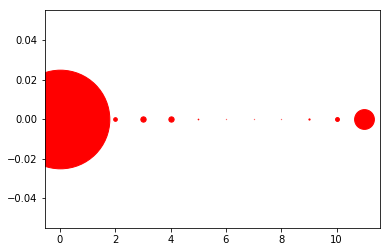

[((8, 0), 6), ((6, 0), 6), ((7, 0), 6), ((5, 0), 16), ((9, 0), 29), ((1, 0), 76), ((2, 0), 88), ((10, 0), 93), ((4, 0), 127), ((3, 0), 128), ((11, 0), 475), ((0, 0), 2368)]
606


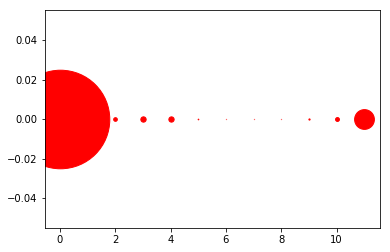

[((8, 0), 6), ((6, 0), 6), ((7, 0), 6), ((5, 0), 16), ((9, 0), 29), ((1, 0), 78), ((2, 0), 88), ((10, 0), 93), ((4, 0), 127), ((3, 0), 128), ((11, 0), 475), ((0, 0), 2366)]
607


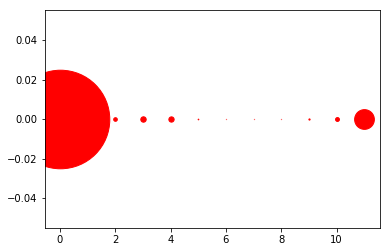

[((8, 0), 6), ((6, 0), 6), ((7, 0), 6), ((5, 0), 16), ((9, 0), 29), ((1, 0), 78), ((2, 0), 87), ((10, 0), 93), ((4, 0), 127), ((3, 0), 130), ((11, 0), 474), ((0, 0), 2366)]
608


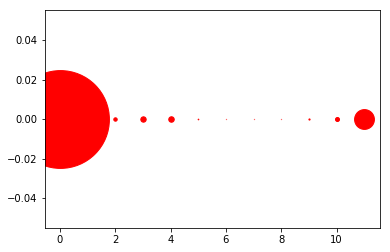

[((8, 0), 6), ((6, 0), 6), ((7, 0), 6), ((5, 0), 16), ((9, 0), 28), ((2, 0), 82), ((1, 0), 93), ((10, 0), 96), ((3, 0), 129), ((4, 0), 132), ((11, 0), 476), ((0, 0), 2348)]
609


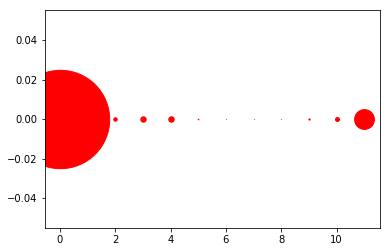

[((8, 0), 6), ((6, 0), 6), ((7, 0), 6), ((5, 0), 16), ((9, 0), 30), ((2, 0), 83), ((1, 0), 83), ((10, 0), 94), ((3, 0), 128), ((4, 0), 130), ((11, 0), 475), ((0, 0), 2361)]
610


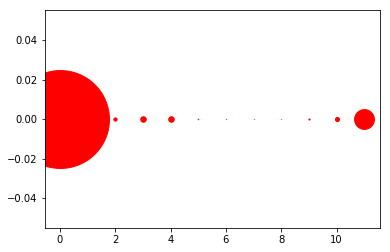

[((8, 0), 6), ((7, 0), 6), ((6, 0), 8), ((5, 0), 14), ((9, 0), 28), ((2, 0), 78), ((1, 0), 91), ((10, 0), 97), ((3, 0), 132), ((4, 0), 132), ((11, 0), 476), ((0, 0), 2350)]
611


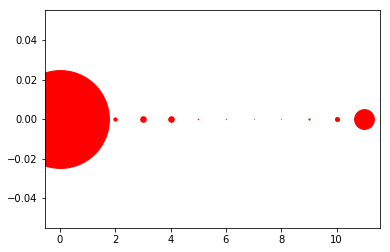

[((8, 0), 6), ((7, 0), 6), ((6, 0), 8), ((5, 0), 14), ((9, 0), 29), ((2, 0), 78), ((1, 0), 92), ((10, 0), 97), ((4, 0), 132), ((3, 0), 133), ((11, 0), 475), ((0, 0), 2348)]
612


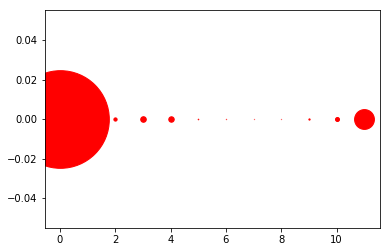

[((8, 0), 6), ((7, 0), 6), ((6, 0), 8), ((5, 0), 14), ((9, 0), 30), ((2, 0), 78), ((1, 0), 95), ((10, 0), 96), ((4, 0), 131), ((3, 0), 134), ((11, 0), 476), ((0, 0), 2344)]
613


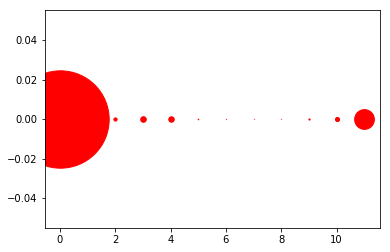

[((8, 0), 6), ((7, 0), 6), ((6, 0), 8), ((5, 0), 15), ((9, 0), 29), ((2, 0), 77), ((10, 0), 98), ((1, 0), 103), ((4, 0), 131), ((3, 0), 134), ((11, 0), 474), ((0, 0), 2337)]
614


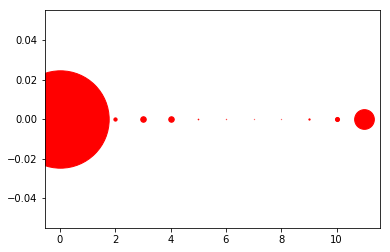

[((8, 0), 6), ((7, 0), 6), ((6, 0), 8), ((5, 0), 15), ((9, 0), 30), ((2, 0), 78), ((10, 0), 98), ((1, 0), 102), ((4, 0), 132), ((3, 0), 133), ((11, 0), 473), ((0, 0), 2337)]
615


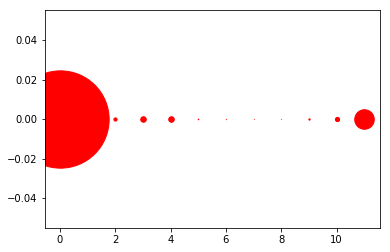

[((8, 0), 6), ((7, 0), 6), ((6, 0), 8), ((5, 0), 15), ((9, 0), 31), ((2, 0), 77), ((10, 0), 101), ((1, 0), 103), ((3, 0), 133), ((4, 0), 133), ((11, 0), 469), ((0, 0), 2336)]
616


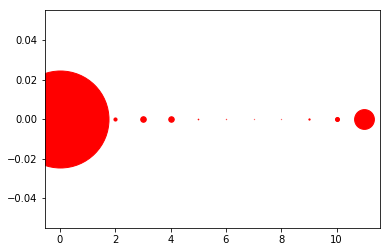

[((8, 0), 6), ((7, 0), 6), ((6, 0), 8), ((5, 0), 15), ((9, 0), 30), ((2, 0), 75), ((10, 0), 97), ((1, 0), 112), ((4, 0), 132), ((3, 0), 134), ((11, 0), 475), ((0, 0), 2328)]
617


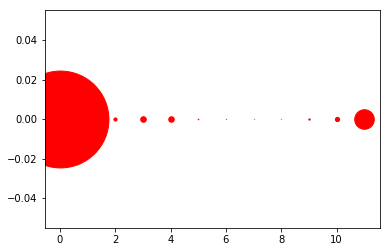

[((8, 0), 6), ((7, 0), 6), ((6, 0), 8), ((5, 0), 15), ((9, 0), 32), ((2, 0), 75), ((10, 0), 101), ((1, 0), 115), ((4, 0), 132), ((3, 0), 134), ((11, 0), 469), ((0, 0), 2325)]
618


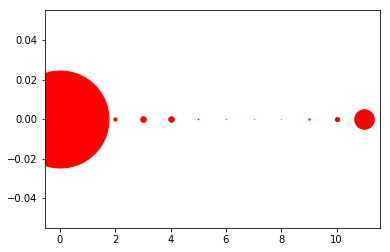

[((8, 0), 6), ((7, 0), 6), ((6, 0), 8), ((5, 0), 15), ((9, 0), 32), ((2, 0), 77), ((10, 0), 101), ((1, 0), 112), ((4, 0), 132), ((3, 0), 133), ((11, 0), 469), ((0, 0), 2327)]
619


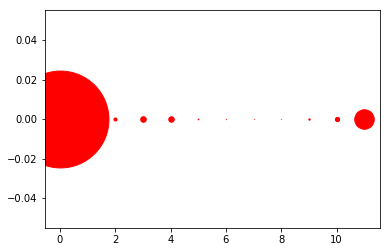

[((8, 0), 6), ((7, 0), 6), ((6, 0), 8), ((5, 0), 16), ((9, 0), 32), ((2, 0), 74), ((10, 0), 102), ((1, 0), 115), ((4, 0), 132), ((3, 0), 134), ((11, 0), 468), ((0, 0), 2325)]
620


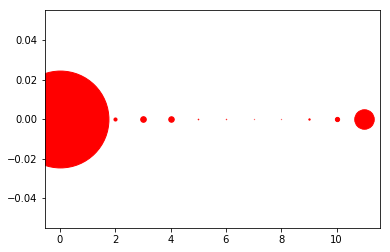

[((8, 0), 6), ((7, 0), 6), ((6, 0), 10), ((5, 0), 14), ((9, 0), 32), ((2, 0), 74), ((10, 0), 102), ((1, 0), 114), ((4, 0), 132), ((3, 0), 135), ((11, 0), 468), ((0, 0), 2325)]
621


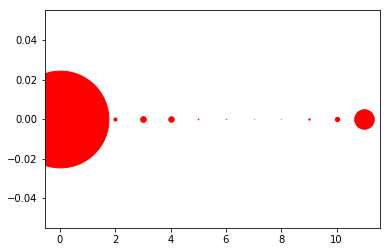

[((8, 0), 6), ((7, 0), 6), ((6, 0), 10), ((5, 0), 15), ((9, 0), 33), ((2, 0), 74), ((10, 0), 102), ((1, 0), 115), ((4, 0), 131), ((3, 0), 136), ((11, 0), 468), ((0, 0), 2322)]
622


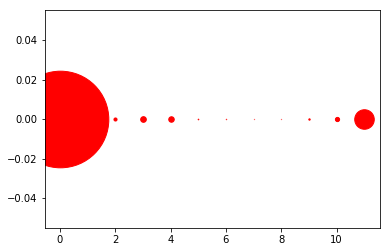

[((8, 0), 6), ((7, 0), 6), ((6, 0), 10), ((5, 0), 15), ((9, 0), 33), ((2, 0), 74), ((10, 0), 101), ((1, 0), 117), ((4, 0), 132), ((3, 0), 136), ((11, 0), 469), ((0, 0), 2319)]
623


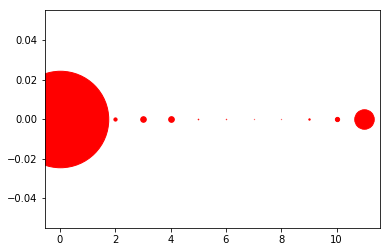

[((8, 0), 6), ((7, 0), 6), ((6, 0), 10), ((5, 0), 14), ((9, 0), 33), ((2, 0), 77), ((10, 0), 102), ((1, 0), 116), ((3, 0), 134), ((4, 0), 136), ((11, 0), 468), ((0, 0), 2316)]
624


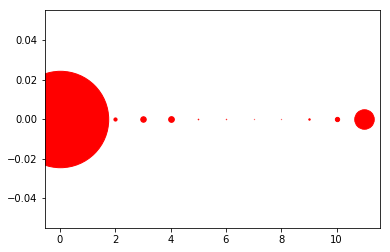

[((8, 0), 6), ((7, 0), 6), ((6, 0), 10), ((5, 0), 14), ((9, 0), 34), ((2, 0), 76), ((10, 0), 103), ((1, 0), 118), ((3, 0), 132), ((4, 0), 137), ((11, 0), 468), ((0, 0), 2314)]
625


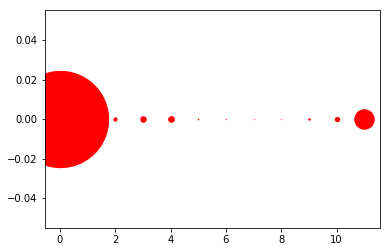

[((8, 0), 6), ((7, 0), 6), ((6, 0), 10), ((5, 0), 15), ((9, 0), 34), ((2, 0), 77), ((10, 0), 105), ((1, 0), 121), ((3, 0), 130), ((4, 0), 137), ((11, 0), 467), ((0, 0), 2310)]
626


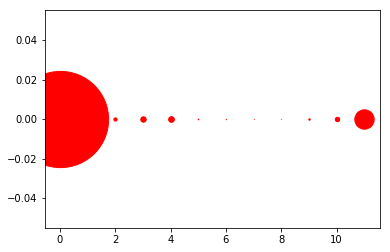

[((8, 0), 6), ((7, 0), 6), ((6, 0), 10), ((5, 0), 16), ((9, 0), 34), ((2, 0), 77), ((10, 0), 106), ((1, 0), 122), ((3, 0), 130), ((4, 0), 137), ((11, 0), 465), ((0, 0), 2309)]
627


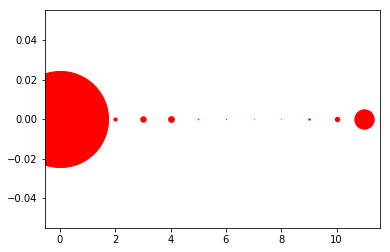

[((8, 0), 6), ((7, 0), 6), ((6, 0), 10), ((5, 0), 16), ((9, 0), 34), ((2, 0), 77), ((10, 0), 106), ((1, 0), 124), ((3, 0), 129), ((4, 0), 138), ((11, 0), 465), ((0, 0), 2307)]
628


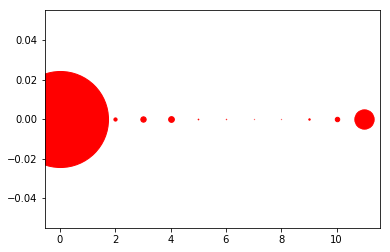

[((8, 0), 6), ((7, 0), 6), ((6, 0), 10), ((5, 0), 16), ((9, 0), 34), ((2, 0), 77), ((10, 0), 107), ((1, 0), 126), ((3, 0), 129), ((4, 0), 138), ((11, 0), 464), ((0, 0), 2305)]
629


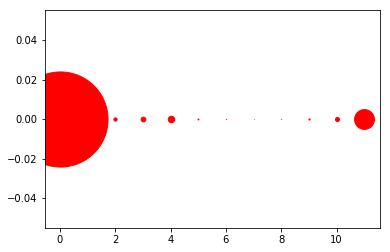

[((7, 0), 5), ((8, 0), 7), ((6, 0), 9), ((5, 0), 21), ((9, 0), 29), ((2, 0), 78), ((10, 0), 96), ((3, 0), 114), ((1, 0), 145), ((4, 0), 155), ((11, 0), 476), ((0, 0), 2283)]
630


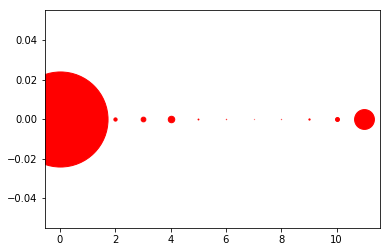

[((7, 0), 5), ((8, 0), 7), ((6, 0), 9), ((5, 0), 21), ((9, 0), 30), ((2, 0), 78), ((10, 0), 95), ((3, 0), 113), ((1, 0), 146), ((4, 0), 156), ((11, 0), 476), ((0, 0), 2282)]
631


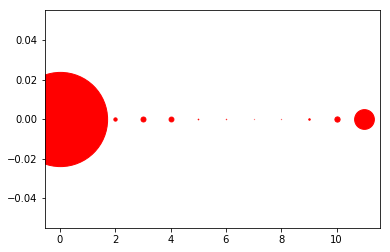

[((7, 0), 5), ((8, 0), 6), ((6, 0), 10), ((5, 0), 15), ((9, 0), 36), ((2, 0), 79), ((4, 0), 116), ((3, 0), 119), ((10, 0), 125), ((1, 0), 172), ((11, 0), 474), ((0, 0), 2261)]
632


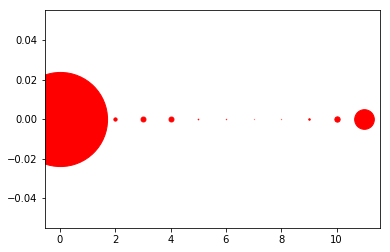

[((7, 0), 5), ((8, 0), 6), ((6, 0), 10), ((5, 0), 15), ((9, 0), 36), ((2, 0), 78), ((3, 0), 118), ((4, 0), 118), ((10, 0), 127), ((1, 0), 174), ((11, 0), 472), ((0, 0), 2259)]
633


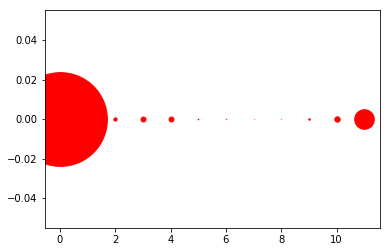

[((7, 0), 5), ((8, 0), 6), ((6, 0), 10), ((5, 0), 15), ((9, 0), 36), ((2, 0), 78), ((4, 0), 118), ((3, 0), 119), ((10, 0), 129), ((1, 0), 182), ((11, 0), 470), ((0, 0), 2250)]
634


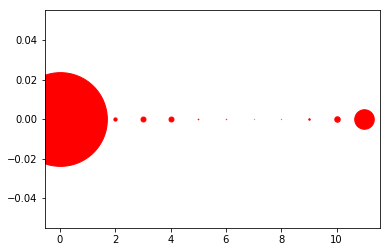

[((7, 0), 5), ((8, 0), 6), ((6, 0), 10), ((5, 0), 15), ((9, 0), 36), ((2, 0), 78), ((3, 0), 118), ((4, 0), 118), ((10, 0), 131), ((1, 0), 182), ((11, 0), 469), ((0, 0), 2250)]
635


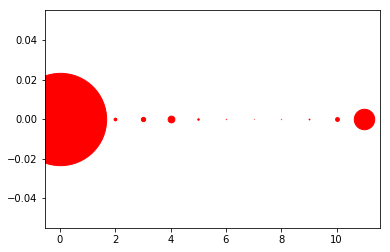

[((7, 0), 5), ((8, 0), 7), ((6, 0), 9), ((9, 0), 19), ((5, 0), 36), ((2, 0), 65), ((10, 0), 91), ((3, 0), 103), ((4, 0), 162), ((1, 0), 215), ((11, 0), 491), ((0, 0), 2215)]
636


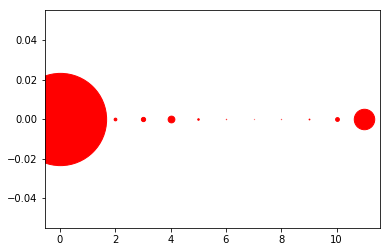

[((7, 0), 5), ((8, 0), 7), ((6, 0), 9), ((9, 0), 19), ((5, 0), 37), ((2, 0), 65), ((10, 0), 91), ((3, 0), 102), ((4, 0), 162), ((1, 0), 216), ((11, 0), 491), ((0, 0), 2214)]
637


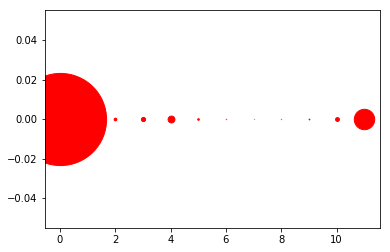

[((7, 0), 5), ((8, 0), 7), ((6, 0), 9), ((9, 0), 19), ((5, 0), 38), ((2, 0), 64), ((10, 0), 92), ((3, 0), 100), ((4, 0), 164), ((1, 0), 218), ((11, 0), 490), ((0, 0), 2212)]
638


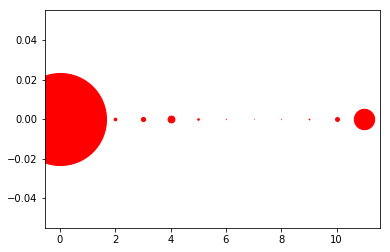

[((7, 0), 5), ((8, 0), 7), ((6, 0), 9), ((9, 0), 19), ((5, 0), 38), ((2, 0), 64), ((10, 0), 93), ((3, 0), 100), ((4, 0), 164), ((1, 0), 221), ((11, 0), 489), ((0, 0), 2209)]
639


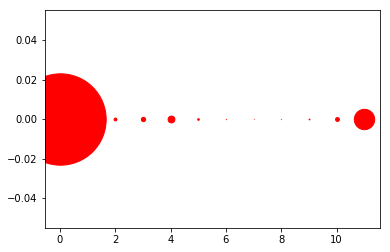

[((7, 0), 5), ((8, 0), 7), ((6, 0), 9), ((9, 0), 19), ((5, 0), 39), ((2, 0), 68), ((10, 0), 92), ((3, 0), 103), ((4, 0), 164), ((1, 0), 230), ((11, 0), 489), ((0, 0), 2193)]
640


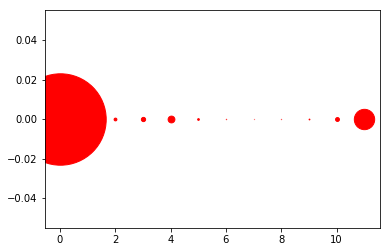

[((7, 0), 5), ((8, 0), 7), ((6, 0), 9), ((9, 0), 19), ((5, 0), 41), ((2, 0), 67), ((10, 0), 93), ((3, 0), 102), ((4, 0), 163), ((1, 0), 230), ((11, 0), 488), ((0, 0), 2194)]
641


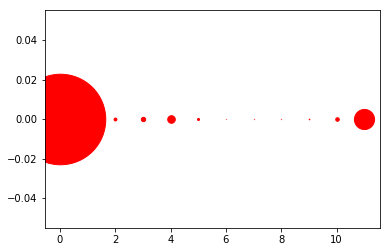

[((6, 0), 6), ((8, 0), 7), ((7, 0), 7), ((9, 0), 15), ((5, 0), 48), ((2, 0), 69), ((10, 0), 85), ((3, 0), 104), ((4, 0), 182), ((1, 0), 239), ((11, 0), 483), ((0, 0), 2173)]
642


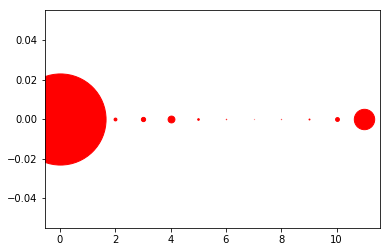

[((7, 0), 4), ((8, 0), 7), ((6, 0), 10), ((9, 0), 22), ((5, 0), 39), ((2, 0), 68), ((10, 0), 92), ((3, 0), 102), ((4, 0), 164), ((1, 0), 234), ((11, 0), 489), ((0, 0), 2187)]
643


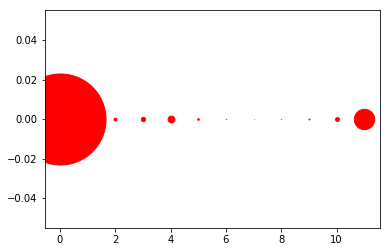

[((7, 0), 4), ((8, 0), 7), ((6, 0), 10), ((9, 0), 22), ((5, 0), 40), ((2, 0), 67), ((10, 0), 92), ((3, 0), 102), ((4, 0), 163), ((1, 0), 237), ((11, 0), 489), ((0, 0), 2185)]
644


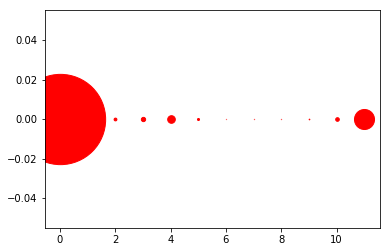

[((6, 0), 6), ((8, 0), 7), ((7, 0), 7), ((9, 0), 16), ((5, 0), 49), ((2, 0), 67), ((10, 0), 87), ((3, 0), 103), ((4, 0), 183), ((1, 0), 245), ((11, 0), 481), ((0, 0), 2167)]
645


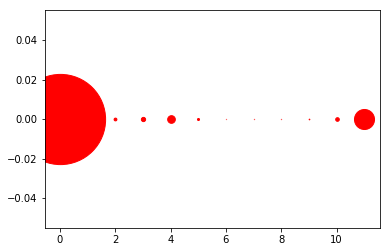

[((6, 0), 6), ((8, 0), 7), ((7, 0), 7), ((9, 0), 16), ((5, 0), 49), ((2, 0), 67), ((10, 0), 87), ((3, 0), 102), ((4, 0), 184), ((1, 0), 247), ((11, 0), 481), ((0, 0), 2165)]
646


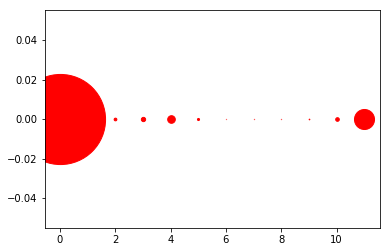

[((6, 0), 6), ((8, 0), 7), ((7, 0), 7), ((9, 0), 16), ((5, 0), 50), ((2, 0), 65), ((10, 0), 87), ((3, 0), 103), ((4, 0), 183), ((1, 0), 250), ((11, 0), 481), ((0, 0), 2163)]
647


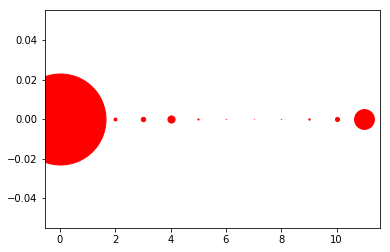

[((7, 0), 6), ((8, 0), 8), ((6, 0), 8), ((5, 0), 27), ((9, 0), 33), ((2, 0), 69), ((10, 0), 97), ((3, 0), 106), ((4, 0), 171), ((1, 0), 234), ((11, 0), 475), ((0, 0), 2184)]
648


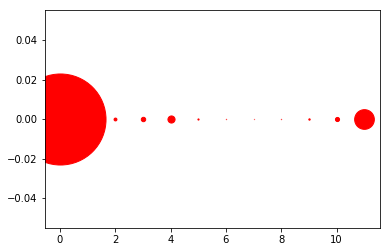

[((7, 0), 6), ((8, 0), 8), ((6, 0), 8), ((5, 0), 28), ((9, 0), 33), ((2, 0), 69), ((10, 0), 99), ((3, 0), 106), ((4, 0), 171), ((1, 0), 232), ((11, 0), 473), ((0, 0), 2185)]
649


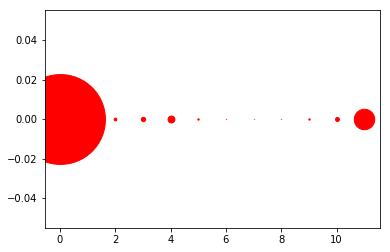

[((7, 0), 6), ((8, 0), 7), ((6, 0), 8), ((9, 0), 32), ((5, 0), 33), ((2, 0), 65), ((10, 0), 94), ((3, 0), 104), ((4, 0), 166), ((1, 0), 255), ((11, 0), 491), ((0, 0), 2157)]
650


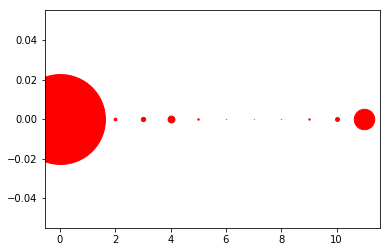

[((7, 0), 6), ((8, 0), 7), ((6, 0), 8), ((9, 0), 33), ((5, 0), 34), ((2, 0), 65), ((10, 0), 93), ((3, 0), 104), ((4, 0), 165), ((1, 0), 255), ((11, 0), 491), ((0, 0), 2157)]
651


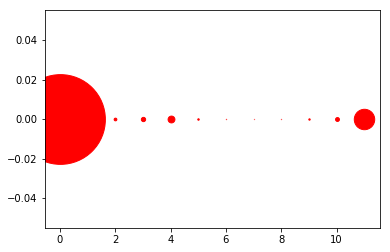

[((7, 0), 6), ((8, 0), 7), ((6, 0), 8), ((9, 0), 33), ((5, 0), 35), ((2, 0), 65), ((10, 0), 93), ((3, 0), 103), ((4, 0), 164), ((1, 0), 260), ((11, 0), 490), ((0, 0), 2154)]
652


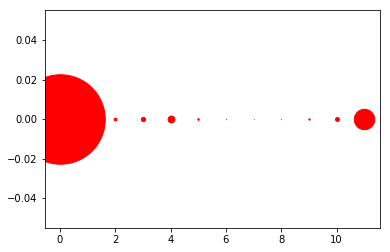

[((7, 0), 6), ((8, 0), 7), ((6, 0), 8), ((9, 0), 33), ((5, 0), 35), ((2, 0), 65), ((10, 0), 94), ((3, 0), 103), ((4, 0), 163), ((1, 0), 266), ((11, 0), 490), ((0, 0), 2148)]
653


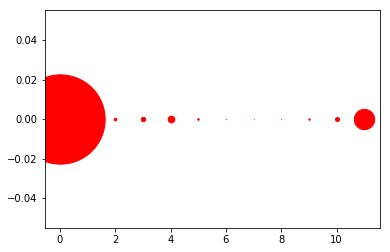

[((7, 0), 6), ((8, 0), 7), ((6, 0), 8), ((9, 0), 33), ((5, 0), 37), ((2, 0), 64), ((10, 0), 95), ((3, 0), 104), ((4, 0), 161), ((1, 0), 270), ((11, 0), 489), ((0, 0), 2144)]
654


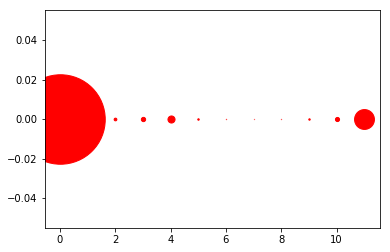

[((7, 0), 6), ((8, 0), 7), ((6, 0), 8), ((9, 0), 34), ((5, 0), 35), ((2, 0), 65), ((10, 0), 99), ((3, 0), 103), ((4, 0), 170), ((1, 0), 266), ((11, 0), 477), ((0, 0), 2148)]
655


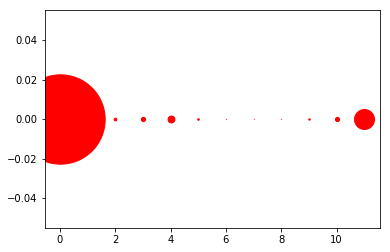

[((7, 0), 6), ((8, 0), 7), ((6, 0), 8), ((9, 0), 34), ((5, 0), 38), ((2, 0), 65), ((10, 0), 100), ((3, 0), 102), ((4, 0), 165), ((1, 0), 269), ((11, 0), 479), ((0, 0), 2145)]
656


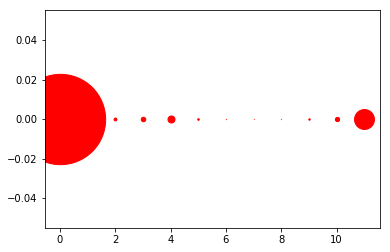

[((7, 0), 6), ((8, 0), 7), ((6, 0), 8), ((9, 0), 34), ((5, 0), 38), ((2, 0), 68), ((10, 0), 102), ((3, 0), 108), ((4, 0), 169), ((1, 0), 232), ((11, 0), 478), ((0, 0), 2168)]
657


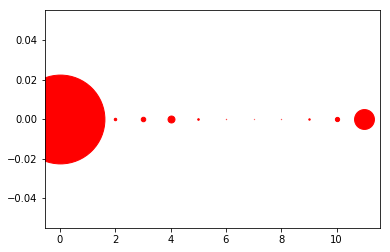

[((7, 0), 6), ((8, 0), 7), ((6, 0), 8), ((9, 0), 34), ((5, 0), 38), ((2, 0), 59), ((10, 0), 102), ((3, 0), 108), ((4, 0), 167), ((1, 0), 280), ((11, 0), 477), ((0, 0), 2132)]
658


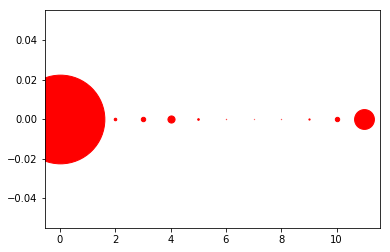

[((7, 0), 6), ((8, 0), 7), ((6, 0), 8), ((9, 0), 29), ((5, 0), 39), ((2, 0), 61), ((10, 0), 105), ((3, 0), 106), ((4, 0), 171), ((1, 0), 281), ((11, 0), 476), ((0, 0), 2129)]
659


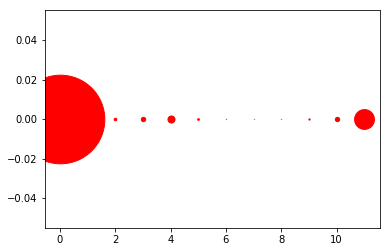

[((7, 0), 6), ((8, 0), 7), ((6, 0), 8), ((9, 0), 30), ((5, 0), 40), ((2, 0), 62), ((10, 0), 104), ((3, 0), 106), ((4, 0), 170), ((1, 0), 282), ((11, 0), 476), ((0, 0), 2127)]
660


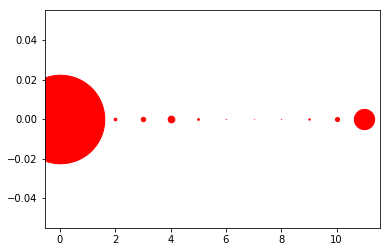

[((7, 0), 6), ((8, 0), 8), ((6, 0), 8), ((9, 0), 33), ((5, 0), 42), ((2, 0), 62), ((10, 0), 98), ((3, 0), 106), ((4, 0), 160), ((1, 0), 283), ((11, 0), 486), ((0, 0), 2126)]
661


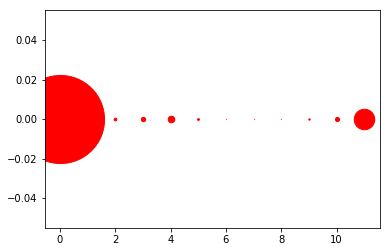

[((8, 0), 7), ((6, 0), 7), ((7, 0), 7), ((9, 0), 33), ((5, 0), 43), ((2, 0), 64), ((10, 0), 98), ((3, 0), 104), ((4, 0), 158), ((1, 0), 291), ((11, 0), 492), ((0, 0), 2114)]
662


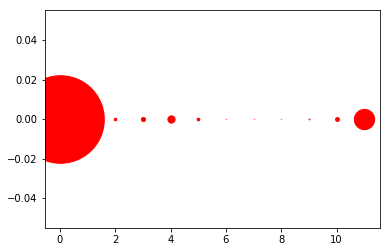

[((8, 0), 7), ((6, 0), 7), ((7, 0), 7), ((9, 0), 18), ((2, 0), 61), ((5, 0), 63), ((10, 0), 92), ((3, 0), 98), ((4, 0), 173), ((1, 0), 303), ((11, 0), 487), ((0, 0), 2102)]
663


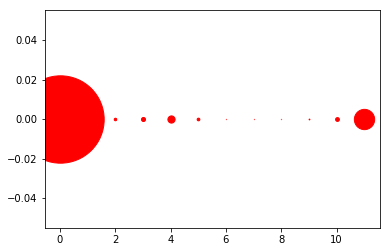

[((8, 0), 7), ((6, 0), 7), ((7, 0), 7), ((9, 0), 19), ((2, 0), 61), ((5, 0), 64), ((10, 0), 91), ((3, 0), 97), ((4, 0), 173), ((1, 0), 308), ((11, 0), 487), ((0, 0), 2097)]
664


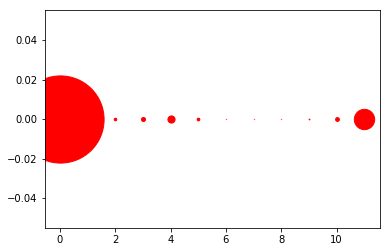

[((8, 0), 7), ((6, 0), 7), ((7, 0), 7), ((9, 0), 19), ((2, 0), 62), ((5, 0), 65), ((10, 0), 91), ((3, 0), 96), ((4, 0), 172), ((1, 0), 311), ((11, 0), 488), ((0, 0), 2093)]
665


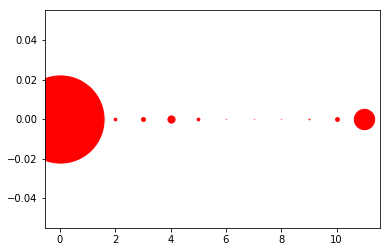

[((8, 0), 7), ((6, 0), 7), ((7, 0), 7), ((9, 0), 19), ((2, 0), 64), ((5, 0), 66), ((10, 0), 91), ((3, 0), 95), ((4, 0), 172), ((1, 0), 309), ((11, 0), 488), ((0, 0), 2093)]
666


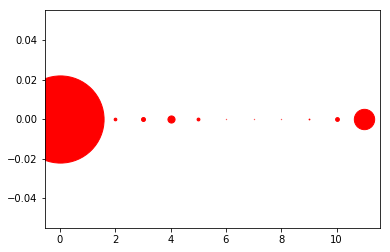

[((8, 0), 7), ((6, 0), 7), ((7, 0), 7), ((9, 0), 19), ((2, 0), 64), ((5, 0), 68), ((10, 0), 91), ((3, 0), 95), ((4, 0), 171), ((1, 0), 309), ((11, 0), 488), ((0, 0), 2092)]
667


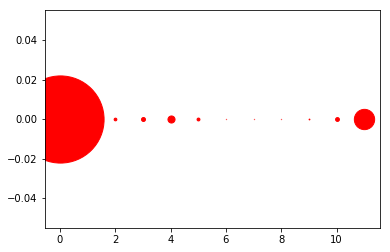

[((8, 0), 7), ((6, 0), 7), ((7, 0), 7), ((9, 0), 19), ((2, 0), 65), ((5, 0), 69), ((10, 0), 92), ((3, 0), 95), ((4, 0), 170), ((1, 0), 308), ((11, 0), 487), ((0, 0), 2092)]
668


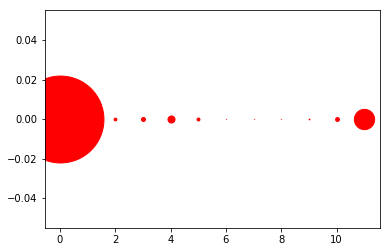

[((8, 0), 7), ((6, 0), 7), ((7, 0), 7), ((9, 0), 19), ((2, 0), 66), ((5, 0), 70), ((10, 0), 92), ((3, 0), 95), ((4, 0), 169), ((1, 0), 313), ((11, 0), 487), ((0, 0), 2086)]
669


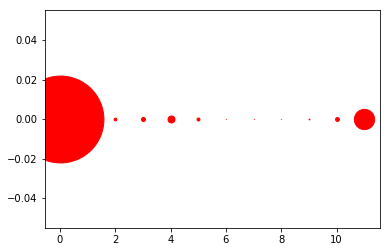

[((8, 0), 7), ((6, 0), 7), ((7, 0), 7), ((9, 0), 19), ((2, 0), 66), ((5, 0), 71), ((10, 0), 93), ((3, 0), 96), ((4, 0), 168), ((1, 0), 314), ((11, 0), 486), ((0, 0), 2084)]
670


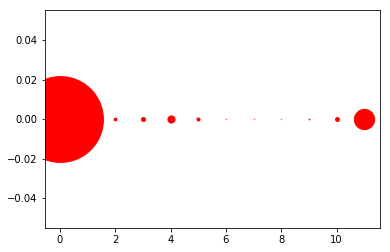

[((8, 0), 7), ((6, 0), 7), ((7, 0), 7), ((9, 0), 19), ((2, 0), 66), ((5, 0), 73), ((10, 0), 93), ((3, 0), 95), ((4, 0), 171), ((1, 0), 334), ((11, 0), 486), ((0, 0), 2060)]
671


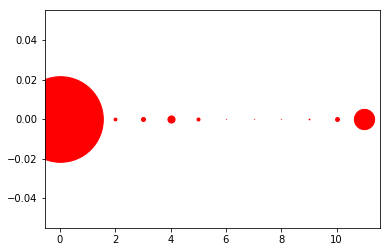

[((8, 0), 7), ((6, 0), 7), ((7, 0), 7), ((9, 0), 19), ((2, 0), 67), ((5, 0), 73), ((10, 0), 93), ((3, 0), 95), ((4, 0), 171), ((1, 0), 338), ((11, 0), 486), ((0, 0), 2055)]
672


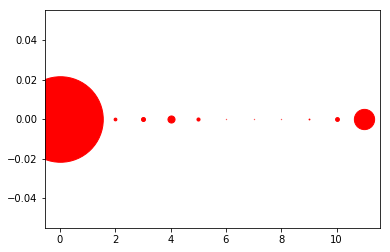

[((8, 0), 7), ((6, 0), 7), ((7, 0), 7), ((9, 0), 20), ((2, 0), 66), ((5, 0), 74), ((10, 0), 92), ((3, 0), 96), ((4, 0), 170), ((1, 0), 340), ((11, 0), 486), ((0, 0), 2053)]
673


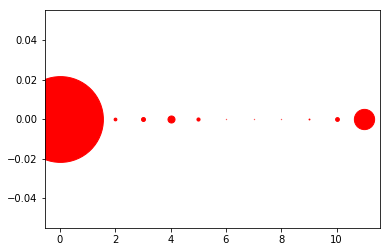

[((8, 0), 7), ((6, 0), 7), ((7, 0), 7), ((9, 0), 21), ((2, 0), 66), ((5, 0), 75), ((10, 0), 91), ((3, 0), 95), ((4, 0), 169), ((1, 0), 335), ((11, 0), 486), ((0, 0), 2059)]
674


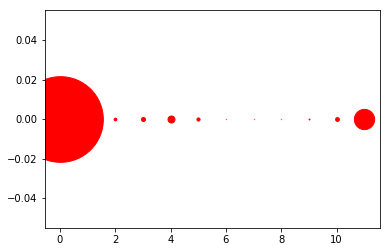

[((8, 0), 7), ((6, 0), 7), ((7, 0), 7), ((9, 0), 21), ((2, 0), 65), ((5, 0), 76), ((10, 0), 91), ((3, 0), 96), ((4, 0), 168), ((1, 0), 338), ((11, 0), 486), ((0, 0), 2056)]
675


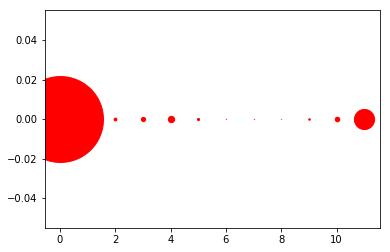

[((8, 0), 6), ((6, 0), 8), ((7, 0), 8), ((9, 0), 37), ((5, 0), 51), ((2, 0), 67), ((3, 0), 101), ((10, 0), 110), ((4, 0), 152), ((1, 0), 333), ((11, 0), 483), ((0, 0), 2062)]
676


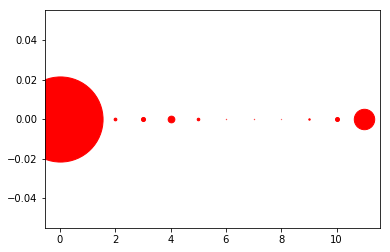

[((8, 0), 6), ((6, 0), 8), ((7, 0), 8), ((9, 0), 34), ((5, 0), 62), ((2, 0), 65), ((10, 0), 96), ((3, 0), 98), ((4, 0), 161), ((1, 0), 347), ((11, 0), 490), ((0, 0), 2043)]
677


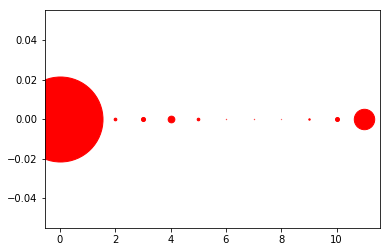

[((8, 0), 6), ((6, 0), 8), ((7, 0), 8), ((9, 0), 34), ((5, 0), 63), ((2, 0), 64), ((10, 0), 96), ((3, 0), 98), ((4, 0), 161), ((1, 0), 350), ((11, 0), 490), ((0, 0), 2040)]
678


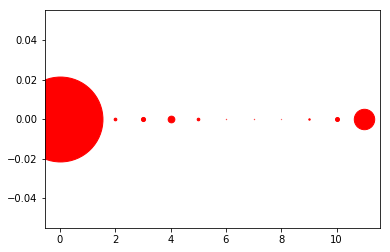

[((8, 0), 6), ((6, 0), 8), ((7, 0), 8), ((9, 0), 34), ((5, 0), 63), ((2, 0), 64), ((10, 0), 96), ((3, 0), 99), ((4, 0), 161), ((1, 0), 351), ((11, 0), 490), ((0, 0), 2038)]
679


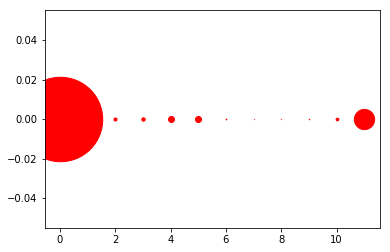

[((7, 0), 7), ((8, 0), 8), ((9, 0), 13), ((6, 0), 18), ((10, 0), 65), ((2, 0), 73), ((3, 0), 82), ((4, 0), 143), ((5, 0), 145), ((1, 0), 351), ((11, 0), 486), ((0, 0), 2027)]
680


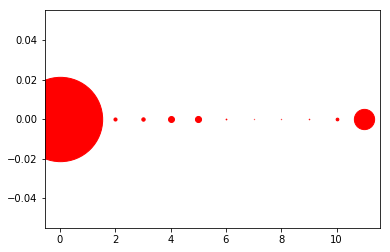

[((7, 0), 7), ((8, 0), 8), ((9, 0), 13), ((6, 0), 18), ((10, 0), 65), ((2, 0), 74), ((3, 0), 81), ((4, 0), 143), ((5, 0), 146), ((1, 0), 353), ((11, 0), 486), ((0, 0), 2024)]
681


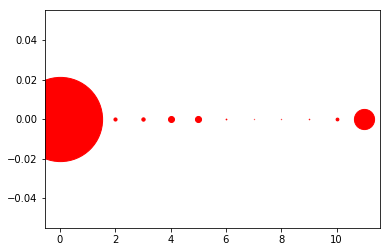

[((7, 0), 7), ((8, 0), 8), ((9, 0), 13), ((6, 0), 18), ((10, 0), 67), ((2, 0), 75), ((3, 0), 80), ((4, 0), 144), ((5, 0), 146), ((1, 0), 355), ((11, 0), 484), ((0, 0), 2021)]
682


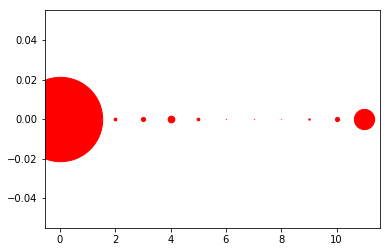

[((8, 0), 6), ((6, 0), 8), ((7, 0), 8), ((9, 0), 34), ((5, 0), 64), ((2, 0), 66), ((10, 0), 99), ((3, 0), 99), ((4, 0), 161), ((1, 0), 363), ((11, 0), 485), ((0, 0), 2025)]
683


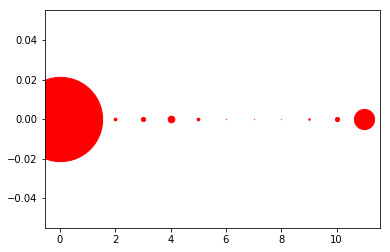

[((8, 0), 6), ((6, 0), 8), ((7, 0), 8), ((9, 0), 34), ((2, 0), 65), ((5, 0), 65), ((10, 0), 100), ((3, 0), 100), ((4, 0), 160), ((1, 0), 365), ((11, 0), 484), ((0, 0), 2023)]
684


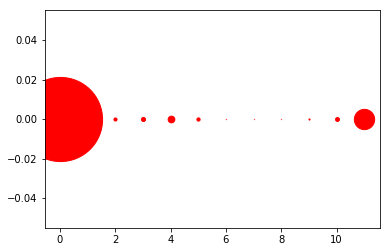

[((8, 0), 7), ((7, 0), 7), ((6, 0), 8), ((9, 0), 27), ((2, 0), 75), ((5, 0), 78), ((10, 0), 93), ((3, 0), 97), ((4, 0), 161), ((1, 0), 358), ((11, 0), 487), ((0, 0), 2020)]
685


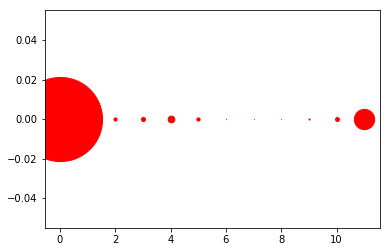

[((8, 0), 7), ((7, 0), 7), ((6, 0), 8), ((9, 0), 27), ((2, 0), 75), ((5, 0), 78), ((10, 0), 93), ((3, 0), 97), ((4, 0), 161), ((1, 0), 359), ((11, 0), 487), ((0, 0), 2019)]
686


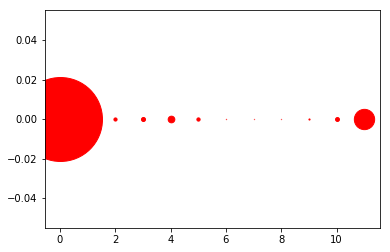

[((8, 0), 7), ((7, 0), 7), ((6, 0), 8), ((9, 0), 27), ((2, 0), 76), ((5, 0), 78), ((10, 0), 94), ((3, 0), 97), ((4, 0), 160), ((1, 0), 362), ((11, 0), 487), ((0, 0), 2015)]
687


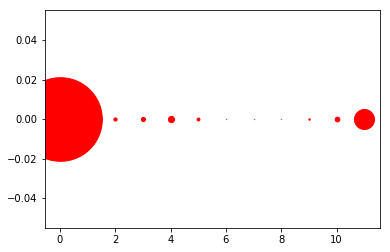

[((8, 0), 7), ((6, 0), 8), ((7, 0), 8), ((9, 0), 35), ((5, 0), 69), ((2, 0), 77), ((3, 0), 100), ((10, 0), 112), ((4, 0), 148), ((1, 0), 367), ((11, 0), 480), ((0, 0), 2007)]
688


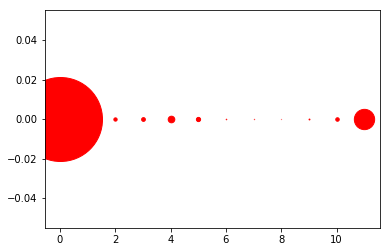

[((8, 0), 5), ((7, 0), 8), ((6, 0), 13), ((9, 0), 21), ((2, 0), 79), ((10, 0), 84), ((3, 0), 90), ((5, 0), 101), ((4, 0), 159), ((1, 0), 355), ((11, 0), 487), ((0, 0), 2016)]
689


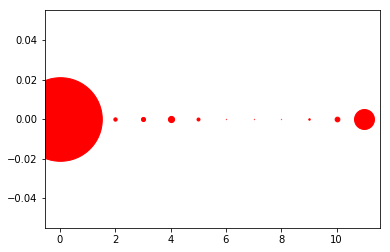

[((8, 0), 7), ((6, 0), 8), ((7, 0), 8), ((9, 0), 35), ((5, 0), 71), ((2, 0), 80), ((3, 0), 98), ((10, 0), 113), ((4, 0), 148), ((1, 0), 364), ((11, 0), 479), ((0, 0), 2007)]
690


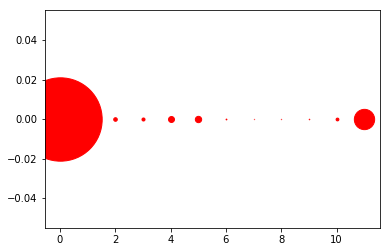

[((7, 0), 7), ((8, 0), 8), ((9, 0), 13), ((6, 0), 19), ((10, 0), 67), ((3, 0), 73), ((2, 0), 86), ((4, 0), 143), ((5, 0), 152), ((1, 0), 362), ((11, 0), 487), ((0, 0), 2001)]
691


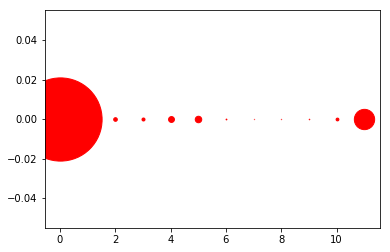

[((7, 0), 7), ((8, 0), 8), ((9, 0), 13), ((6, 0), 19), ((10, 0), 67), ((3, 0), 72), ((2, 0), 87), ((4, 0), 141), ((5, 0), 156), ((1, 0), 364), ((11, 0), 487), ((0, 0), 1997)]
692


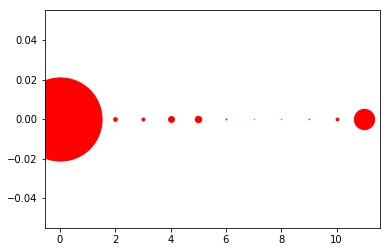

[((7, 0), 7), ((8, 0), 8), ((9, 0), 13), ((6, 0), 20), ((10, 0), 68), ((3, 0), 72), ((2, 0), 88), ((4, 0), 141), ((5, 0), 155), ((1, 0), 364), ((11, 0), 486), ((0, 0), 1996)]
693


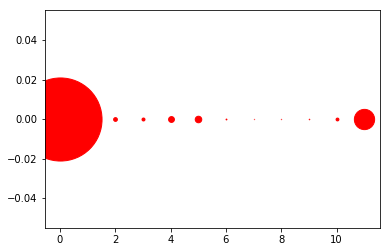

[((7, 0), 7), ((8, 0), 8), ((9, 0), 13), ((6, 0), 20), ((10, 0), 68), ((3, 0), 71), ((2, 0), 90), ((4, 0), 140), ((5, 0), 157), ((1, 0), 364), ((11, 0), 486), ((0, 0), 1994)]
694


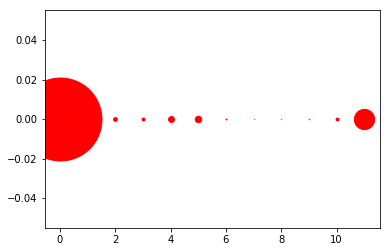

[((7, 0), 7), ((8, 0), 8), ((9, 0), 13), ((6, 0), 22), ((10, 0), 68), ((3, 0), 71), ((2, 0), 90), ((4, 0), 141), ((5, 0), 155), ((1, 0), 366), ((11, 0), 486), ((0, 0), 1991)]
695


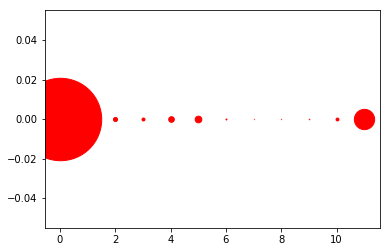

[((7, 0), 7), ((8, 0), 8), ((9, 0), 13), ((6, 0), 23), ((10, 0), 69), ((3, 0), 71), ((2, 0), 97), ((4, 0), 135), ((5, 0), 160), ((1, 0), 370), ((11, 0), 487), ((0, 0), 1978)]
696


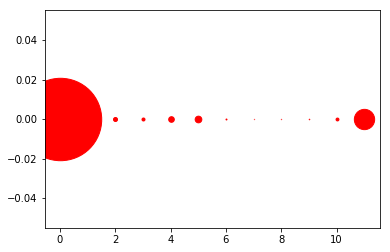

[((7, 0), 7), ((8, 0), 8), ((9, 0), 13), ((6, 0), 23), ((10, 0), 69), ((3, 0), 72), ((2, 0), 96), ((4, 0), 135), ((5, 0), 160), ((1, 0), 370), ((11, 0), 487), ((0, 0), 1978)]
697


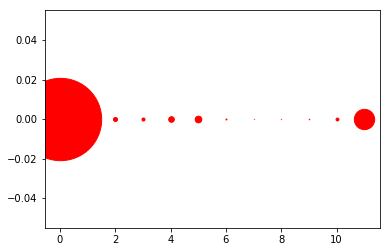

[((7, 0), 7), ((8, 0), 8), ((9, 0), 13), ((6, 0), 23), ((10, 0), 69), ((3, 0), 73), ((2, 0), 96), ((4, 0), 135), ((5, 0), 160), ((1, 0), 371), ((11, 0), 487), ((0, 0), 1976)]
698


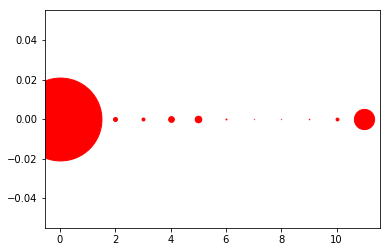

[((8, 0), 8), ((7, 0), 8), ((9, 0), 13), ((6, 0), 22), ((10, 0), 69), ((3, 0), 71), ((2, 0), 95), ((4, 0), 138), ((5, 0), 159), ((1, 0), 361), ((11, 0), 485), ((0, 0), 1989)]
699


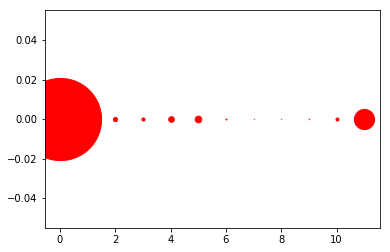

[((8, 0), 8), ((7, 0), 8), ((9, 0), 13), ((6, 0), 24), ((10, 0), 71), ((3, 0), 74), ((2, 0), 99), ((4, 0), 135), ((5, 0), 159), ((1, 0), 370), ((11, 0), 484), ((0, 0), 1973)]
700


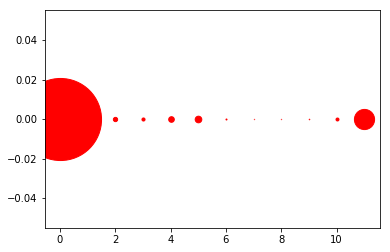

[((8, 0), 8), ((7, 0), 8), ((9, 0), 13), ((6, 0), 24), ((10, 0), 71), ((3, 0), 74), ((2, 0), 103), ((4, 0), 135), ((5, 0), 159), ((1, 0), 369), ((11, 0), 484), ((0, 0), 1970)]
701


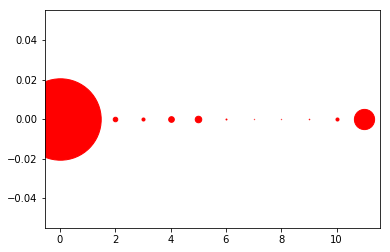

[((8, 0), 8), ((7, 0), 8), ((9, 0), 13), ((6, 0), 23), ((10, 0), 73), ((3, 0), 73), ((2, 0), 109), ((4, 0), 136), ((5, 0), 157), ((1, 0), 379), ((11, 0), 485), ((0, 0), 1954)]
702


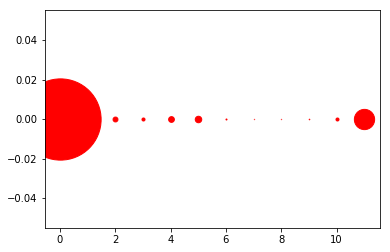

[((8, 0), 8), ((7, 0), 8), ((9, 0), 14), ((6, 0), 24), ((10, 0), 72), ((3, 0), 73), ((2, 0), 117), ((4, 0), 138), ((5, 0), 156), ((1, 0), 372), ((11, 0), 486), ((0, 0), 1950)]
703


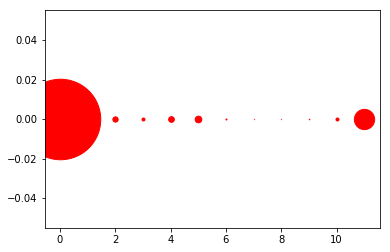

[((8, 0), 8), ((7, 0), 8), ((9, 0), 14), ((6, 0), 24), ((10, 0), 72), ((3, 0), 72), ((2, 0), 127), ((4, 0), 137), ((5, 0), 160), ((1, 0), 378), ((11, 0), 486), ((0, 0), 1932)]
704


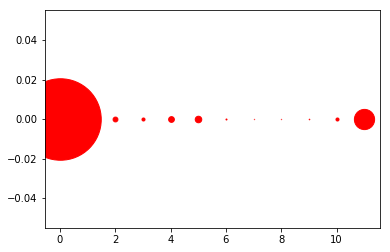

[((8, 0), 8), ((7, 0), 8), ((9, 0), 14), ((6, 0), 24), ((10, 0), 73), ((3, 0), 73), ((2, 0), 116), ((4, 0), 138), ((5, 0), 157), ((1, 0), 366), ((11, 0), 485), ((0, 0), 1956)]
705


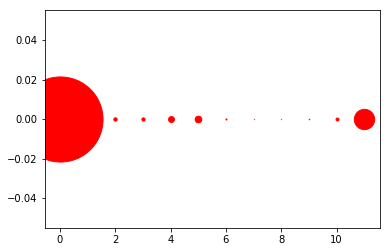

[((8, 0), 8), ((7, 0), 8), ((9, 0), 14), ((6, 0), 25), ((10, 0), 70), ((3, 0), 78), ((2, 0), 81), ((4, 0), 141), ((5, 0), 159), ((1, 0), 305), ((11, 0), 487), ((0, 0), 2042)]
706


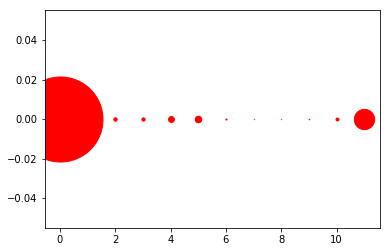

[((8, 0), 8), ((7, 0), 8), ((9, 0), 14), ((6, 0), 26), ((10, 0), 70), ((3, 0), 79), ((2, 0), 82), ((4, 0), 141), ((5, 0), 158), ((1, 0), 304), ((11, 0), 487), ((0, 0), 2041)]
707


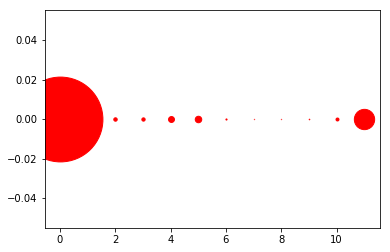

[((8, 0), 8), ((7, 0), 8), ((9, 0), 14), ((6, 0), 27), ((10, 0), 71), ((3, 0), 79), ((2, 0), 82), ((4, 0), 142), ((5, 0), 156), ((1, 0), 308), ((11, 0), 487), ((0, 0), 2036)]
708


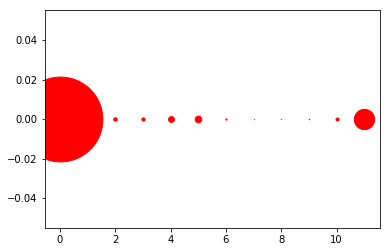

[((8, 0), 8), ((7, 0), 8), ((9, 0), 14), ((6, 0), 27), ((10, 0), 71), ((3, 0), 78), ((2, 0), 82), ((4, 0), 140), ((5, 0), 159), ((1, 0), 308), ((11, 0), 487), ((0, 0), 2036)]
709


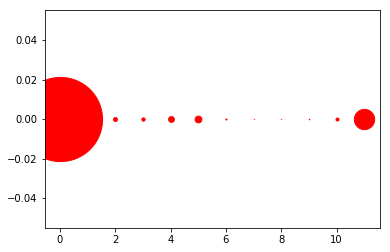

[((8, 0), 8), ((7, 0), 8), ((9, 0), 14), ((6, 0), 26), ((10, 0), 72), ((3, 0), 79), ((2, 0), 94), ((4, 0), 140), ((5, 0), 162), ((1, 0), 308), ((11, 0), 487), ((0, 0), 2020)]
710


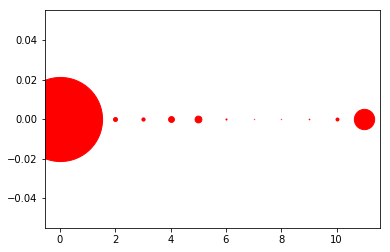

[((8, 0), 8), ((7, 0), 8), ((9, 0), 15), ((6, 0), 26), ((10, 0), 71), ((3, 0), 77), ((2, 0), 95), ((4, 0), 140), ((5, 0), 163), ((1, 0), 309), ((11, 0), 487), ((0, 0), 2019)]
711


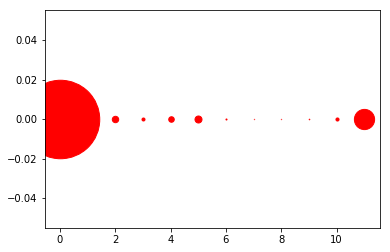

[((8, 0), 8), ((7, 0), 8), ((9, 0), 14), ((6, 0), 25), ((3, 0), 72), ((10, 0), 74), ((4, 0), 133), ((2, 0), 154), ((5, 0), 168), ((1, 0), 393), ((11, 0), 485), ((0, 0), 1884)]
712


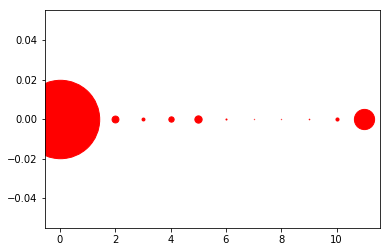

[((8, 0), 8), ((7, 0), 8), ((9, 0), 14), ((6, 0), 25), ((3, 0), 70), ((10, 0), 74), ((4, 0), 128), ((2, 0), 165), ((5, 0), 175), ((1, 0), 384), ((11, 0), 485), ((0, 0), 1882)]
713


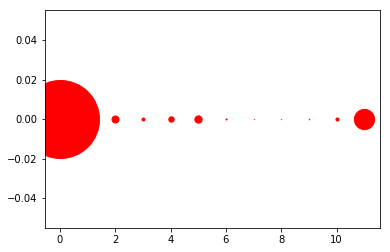

[((8, 0), 8), ((7, 0), 8), ((9, 0), 14), ((6, 0), 25), ((3, 0), 71), ((10, 0), 74), ((4, 0), 129), ((2, 0), 169), ((5, 0), 175), ((1, 0), 388), ((11, 0), 485), ((0, 0), 1872)]
714


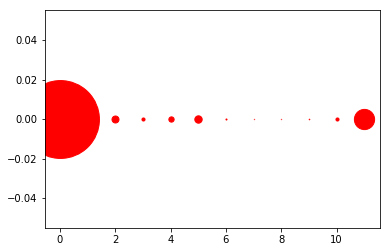

[((8, 0), 8), ((7, 0), 8), ((9, 0), 14), ((6, 0), 25), ((10, 0), 74), ((3, 0), 74), ((4, 0), 127), ((2, 0), 168), ((5, 0), 177), ((1, 0), 389), ((11, 0), 485), ((0, 0), 1869)]
715


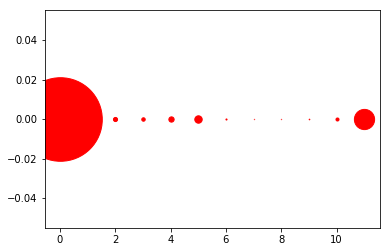

[((8, 0), 8), ((7, 0), 8), ((9, 0), 15), ((6, 0), 26), ((10, 0), 73), ((3, 0), 83), ((2, 0), 99), ((4, 0), 127), ((5, 0), 178), ((1, 0), 310), ((11, 0), 485), ((0, 0), 2006)]
716


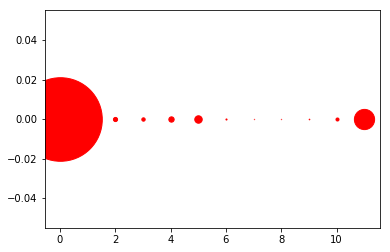

[((8, 0), 8), ((7, 0), 8), ((9, 0), 15), ((6, 0), 26), ((10, 0), 73), ((3, 0), 81), ((2, 0), 100), ((4, 0), 128), ((5, 0), 179), ((1, 0), 309), ((11, 0), 485), ((0, 0), 2006)]
717


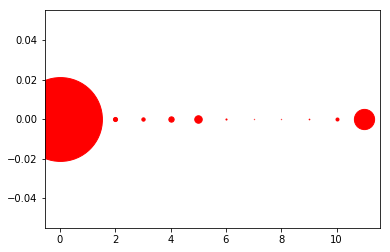

[((8, 0), 8), ((7, 0), 8), ((9, 0), 16), ((6, 0), 26), ((10, 0), 72), ((3, 0), 80), ((2, 0), 99), ((4, 0), 128), ((5, 0), 180), ((1, 0), 304), ((11, 0), 485), ((0, 0), 2012)]
718


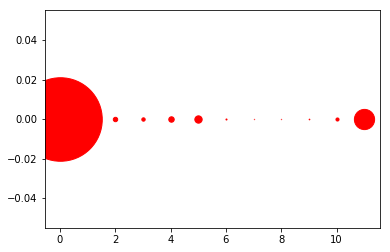

[((8, 0), 8), ((7, 0), 8), ((9, 0), 16), ((6, 0), 25), ((10, 0), 74), ((3, 0), 81), ((2, 0), 106), ((4, 0), 131), ((5, 0), 176), ((1, 0), 303), ((11, 0), 485), ((0, 0), 2005)]
719


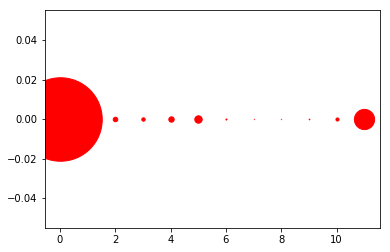

[((8, 0), 8), ((7, 0), 8), ((9, 0), 16), ((6, 0), 25), ((10, 0), 74), ((3, 0), 81), ((2, 0), 109), ((4, 0), 129), ((5, 0), 178), ((1, 0), 301), ((11, 0), 485), ((0, 0), 2004)]
720


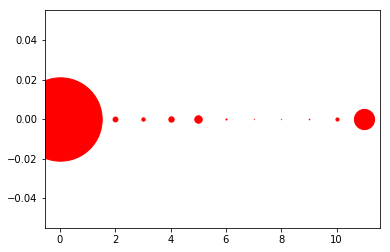

[((8, 0), 8), ((7, 0), 8), ((9, 0), 16), ((6, 0), 26), ((10, 0), 75), ((3, 0), 80), ((2, 0), 117), ((4, 0), 128), ((5, 0), 179), ((1, 0), 296), ((11, 0), 484), ((0, 0), 2001)]
721


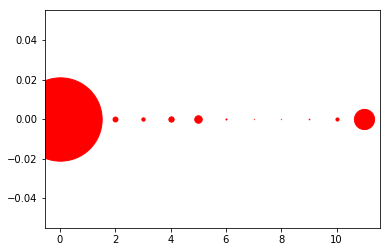

[((8, 0), 8), ((7, 0), 8), ((9, 0), 16), ((6, 0), 26), ((10, 0), 75), ((3, 0), 80), ((2, 0), 117), ((4, 0), 127), ((5, 0), 180), ((1, 0), 297), ((11, 0), 484), ((0, 0), 2000)]
722


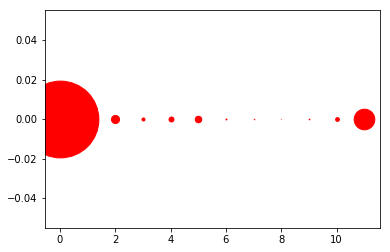

[((8, 0), 5), ((7, 0), 13), ((9, 0), 17), ((6, 0), 22), ((3, 0), 73), ((10, 0), 90), ((4, 0), 119), ((5, 0), 157), ((2, 0), 195), ((1, 0), 389), ((11, 0), 495), ((0, 0), 1843)]
723


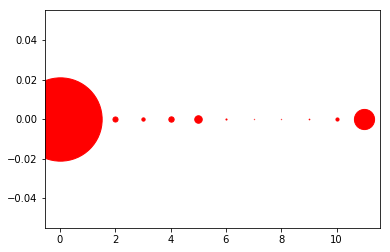

[((8, 0), 8), ((7, 0), 8), ((9, 0), 16), ((6, 0), 26), ((10, 0), 75), ((3, 0), 79), ((2, 0), 122), ((4, 0), 128), ((5, 0), 180), ((1, 0), 292), ((11, 0), 484), ((0, 0), 2000)]
724


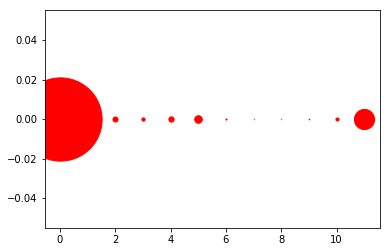

[((8, 0), 8), ((7, 0), 8), ((9, 0), 16), ((6, 0), 27), ((10, 0), 75), ((3, 0), 79), ((2, 0), 121), ((4, 0), 126), ((5, 0), 182), ((1, 0), 294), ((11, 0), 484), ((0, 0), 1998)]
725


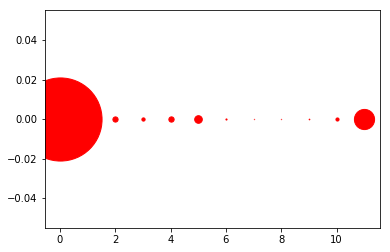

[((8, 0), 8), ((7, 0), 8), ((9, 0), 16), ((6, 0), 27), ((10, 0), 75), ((3, 0), 78), ((2, 0), 125), ((4, 0), 127), ((5, 0), 183), ((1, 0), 292), ((11, 0), 484), ((0, 0), 1995)]
726


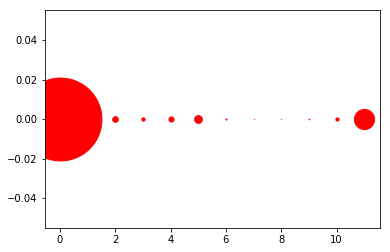

[((8, 0), 8), ((7, 0), 8), ((9, 0), 16), ((6, 0), 27), ((10, 0), 77), ((3, 0), 79), ((4, 0), 123), ((2, 0), 134), ((5, 0), 187), ((1, 0), 286), ((11, 0), 484), ((0, 0), 1989)]
727


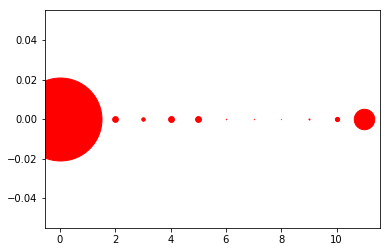

[((8, 0), 7), ((7, 0), 10), ((6, 0), 12), ((9, 0), 24), ((3, 0), 82), ((10, 0), 101), ((2, 0), 137), ((4, 0), 140), ((5, 0), 140), ((1, 0), 283), ((11, 0), 491), ((0, 0), 1991)]
728


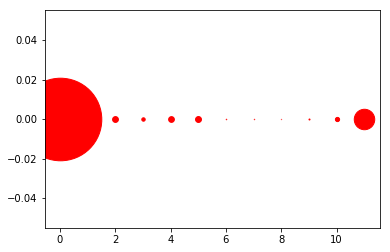

[((8, 0), 7), ((7, 0), 10), ((6, 0), 12), ((9, 0), 24), ((3, 0), 82), ((10, 0), 101), ((4, 0), 138), ((2, 0), 140), ((5, 0), 142), ((1, 0), 289), ((11, 0), 491), ((0, 0), 1982)]
729


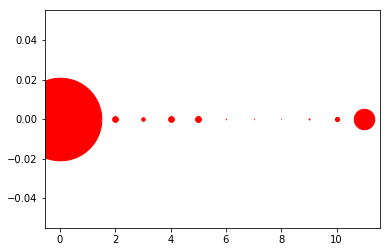

[((8, 0), 7), ((7, 0), 10), ((6, 0), 12), ((9, 0), 24), ((3, 0), 84), ((10, 0), 101), ((2, 0), 138), ((4, 0), 138), ((5, 0), 142), ((1, 0), 288), ((11, 0), 491), ((0, 0), 1983)]
730


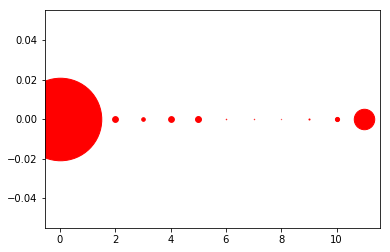

[((8, 0), 7), ((7, 0), 10), ((6, 0), 12), ((9, 0), 25), ((3, 0), 86), ((10, 0), 100), ((4, 0), 138), ((2, 0), 139), ((5, 0), 142), ((1, 0), 287), ((11, 0), 491), ((0, 0), 1981)]
731


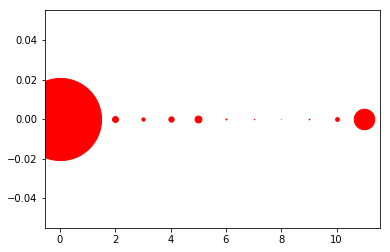

[((8, 0), 5), ((7, 0), 13), ((9, 0), 18), ((6, 0), 23), ((3, 0), 78), ((10, 0), 90), ((4, 0), 127), ((2, 0), 143), ((5, 0), 165), ((1, 0), 293), ((11, 0), 492), ((0, 0), 1971)]
732


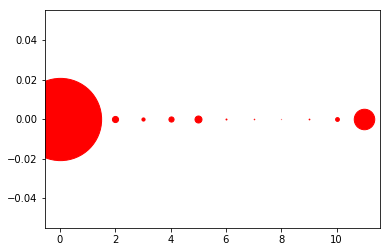

[((8, 0), 5), ((7, 0), 13), ((9, 0), 18), ((6, 0), 23), ((3, 0), 76), ((10, 0), 91), ((4, 0), 124), ((2, 0), 147), ((5, 0), 168), ((1, 0), 287), ((11, 0), 492), ((0, 0), 1974)]
733


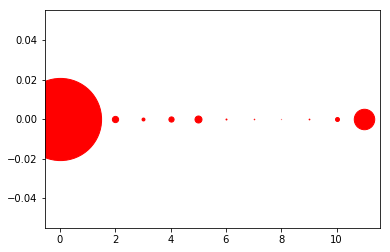

[((8, 0), 5), ((7, 0), 13), ((9, 0), 18), ((6, 0), 23), ((3, 0), 70), ((10, 0), 95), ((4, 0), 125), ((2, 0), 150), ((5, 0), 168), ((1, 0), 288), ((11, 0), 491), ((0, 0), 1972)]
734


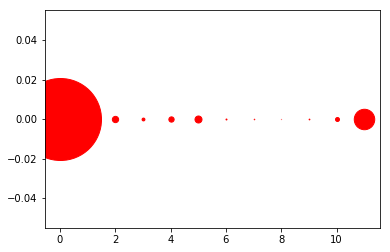

[((8, 0), 5), ((7, 0), 13), ((9, 0), 18), ((6, 0), 23), ((3, 0), 68), ((10, 0), 95), ((4, 0), 127), ((2, 0), 151), ((5, 0), 168), ((1, 0), 291), ((11, 0), 491), ((0, 0), 1968)]
735


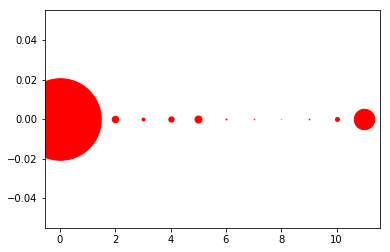

[((8, 0), 5), ((7, 0), 13), ((9, 0), 18), ((6, 0), 23), ((3, 0), 67), ((10, 0), 95), ((4, 0), 127), ((2, 0), 156), ((5, 0), 168), ((1, 0), 298), ((11, 0), 491), ((0, 0), 1957)]
736


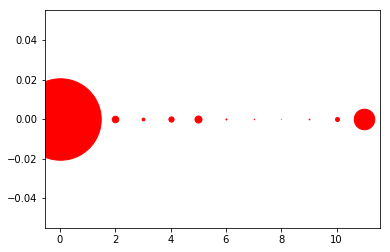

[((8, 0), 5), ((7, 0), 13), ((9, 0), 18), ((6, 0), 24), ((3, 0), 66), ((10, 0), 94), ((4, 0), 125), ((2, 0), 157), ((5, 0), 168), ((1, 0), 299), ((11, 0), 494), ((0, 0), 1955)]
737


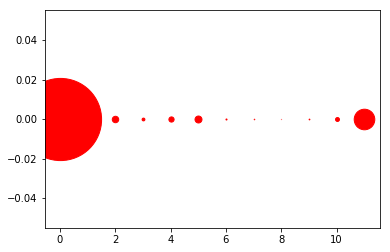

[((8, 0), 5), ((7, 0), 13), ((9, 0), 18), ((6, 0), 25), ((3, 0), 67), ((10, 0), 94), ((4, 0), 125), ((2, 0), 155), ((5, 0), 167), ((1, 0), 283), ((11, 0), 494), ((0, 0), 1972)]
738


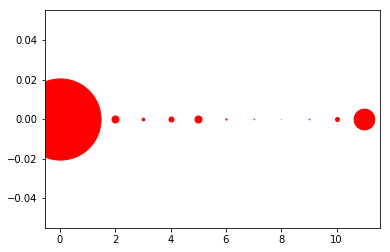

[((8, 0), 5), ((7, 0), 13), ((9, 0), 17), ((6, 0), 29), ((3, 0), 64), ((10, 0), 95), ((4, 0), 121), ((2, 0), 169), ((5, 0), 170), ((1, 0), 289), ((11, 0), 498), ((0, 0), 1948)]
739


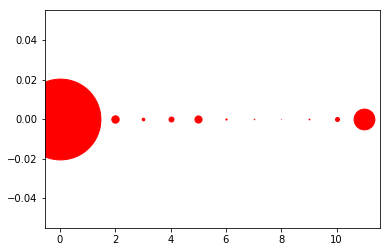

[((8, 0), 5), ((7, 0), 13), ((9, 0), 20), ((6, 0), 29), ((3, 0), 63), ((10, 0), 95), ((4, 0), 119), ((5, 0), 171), ((2, 0), 177), ((1, 0), 289), ((11, 0), 498), ((0, 0), 1939)]
740


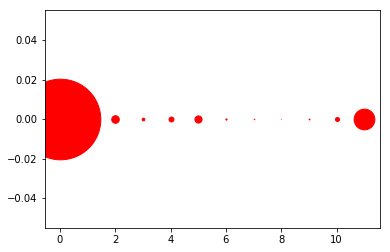

[((8, 0), 5), ((7, 0), 13), ((9, 0), 20), ((6, 0), 29), ((3, 0), 65), ((10, 0), 95), ((4, 0), 118), ((5, 0), 172), ((2, 0), 182), ((1, 0), 286), ((11, 0), 498), ((0, 0), 1935)]
741


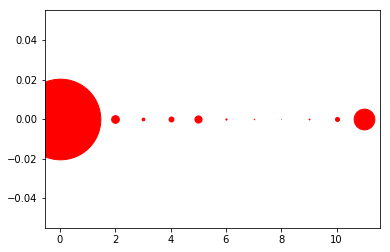

[((8, 0), 5), ((7, 0), 13), ((9, 0), 20), ((6, 0), 29), ((3, 0), 65), ((10, 0), 96), ((4, 0), 118), ((5, 0), 172), ((2, 0), 185), ((1, 0), 283), ((11, 0), 497), ((0, 0), 1935)]
742


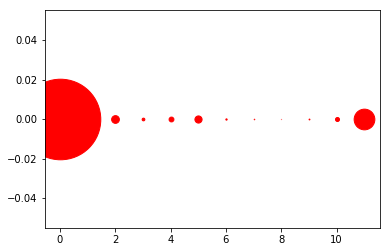

[((8, 0), 5), ((7, 0), 13), ((9, 0), 20), ((6, 0), 31), ((3, 0), 65), ((10, 0), 96), ((4, 0), 116), ((5, 0), 172), ((2, 0), 186), ((1, 0), 283), ((11, 0), 497), ((0, 0), 1934)]
743


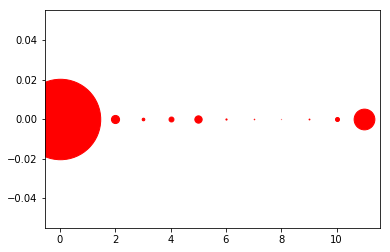

[((8, 0), 5), ((7, 0), 13), ((9, 0), 20), ((6, 0), 28), ((3, 0), 63), ((10, 0), 96), ((4, 0), 118), ((5, 0), 176), ((2, 0), 195), ((1, 0), 275), ((11, 0), 498), ((0, 0), 1931)]
744


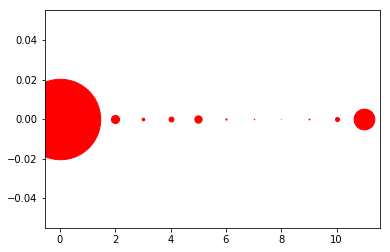

[((8, 0), 5), ((7, 0), 13), ((9, 0), 20), ((6, 0), 29), ((3, 0), 63), ((10, 0), 96), ((4, 0), 119), ((5, 0), 175), ((2, 0), 195), ((1, 0), 275), ((11, 0), 498), ((0, 0), 1930)]
745


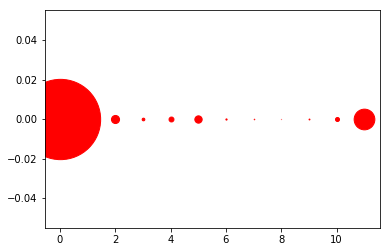

[((8, 0), 5), ((7, 0), 13), ((9, 0), 21), ((6, 0), 29), ((3, 0), 64), ((10, 0), 96), ((4, 0), 118), ((5, 0), 176), ((2, 0), 194), ((1, 0), 278), ((11, 0), 497), ((0, 0), 1927)]
746


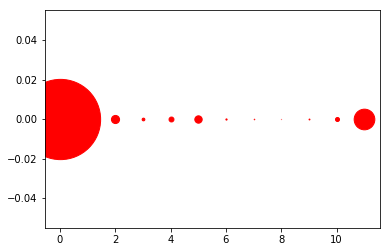

[((8, 0), 5), ((7, 0), 13), ((9, 0), 21), ((6, 0), 29), ((3, 0), 65), ((10, 0), 96), ((4, 0), 118), ((5, 0), 177), ((2, 0), 195), ((1, 0), 277), ((11, 0), 496), ((0, 0), 1926)]
747


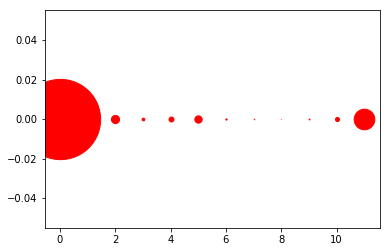

[((8, 0), 5), ((7, 0), 13), ((9, 0), 21), ((6, 0), 30), ((3, 0), 65), ((10, 0), 97), ((4, 0), 118), ((5, 0), 176), ((2, 0), 196), ((1, 0), 276), ((11, 0), 495), ((0, 0), 1926)]
748


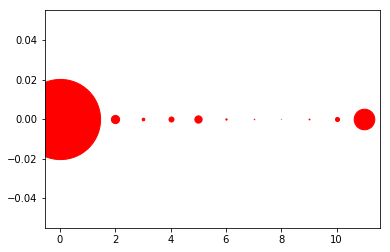

[((8, 0), 5), ((7, 0), 13), ((9, 0), 21), ((6, 0), 31), ((3, 0), 63), ((10, 0), 97), ((4, 0), 120), ((5, 0), 175), ((2, 0), 197), ((1, 0), 277), ((11, 0), 495), ((0, 0), 1924)]
749


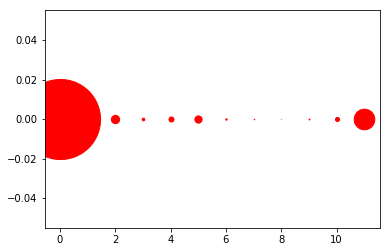

[((8, 0), 5), ((7, 0), 13), ((9, 0), 21), ((6, 0), 32), ((3, 0), 62), ((10, 0), 97), ((4, 0), 121), ((5, 0), 174), ((2, 0), 198), ((1, 0), 278), ((11, 0), 495), ((0, 0), 1922)]
750


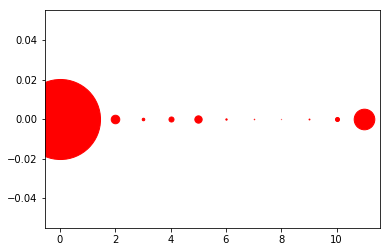

[((8, 0), 6), ((7, 0), 12), ((9, 0), 21), ((6, 0), 32), ((3, 0), 61), ((10, 0), 97), ((4, 0), 121), ((5, 0), 176), ((2, 0), 205), ((1, 0), 271), ((11, 0), 495), ((0, 0), 1921)]
751


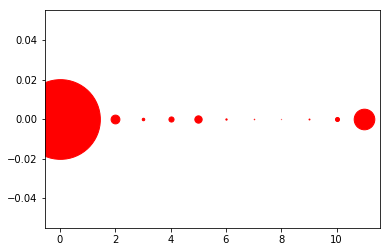

[((8, 0), 6), ((7, 0), 12), ((9, 0), 22), ((6, 0), 31), ((3, 0), 60), ((10, 0), 97), ((4, 0), 123), ((5, 0), 176), ((2, 0), 211), ((1, 0), 272), ((11, 0), 495), ((0, 0), 1913)]
752


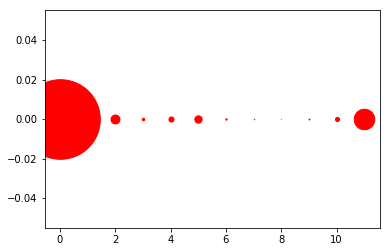

[((8, 0), 6), ((7, 0), 12), ((9, 0), 22), ((6, 0), 32), ((3, 0), 60), ((10, 0), 98), ((4, 0), 122), ((5, 0), 176), ((2, 0), 216), ((1, 0), 269), ((11, 0), 494), ((0, 0), 1911)]
753


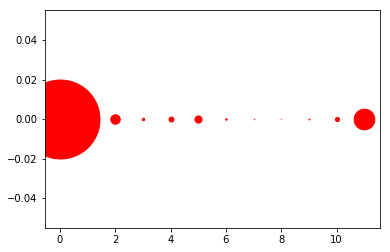

[((8, 0), 6), ((7, 0), 12), ((9, 0), 22), ((6, 0), 37), ((3, 0), 56), ((10, 0), 99), ((4, 0), 118), ((5, 0), 172), ((2, 0), 228), ((1, 0), 276), ((11, 0), 497), ((0, 0), 1895)]
754


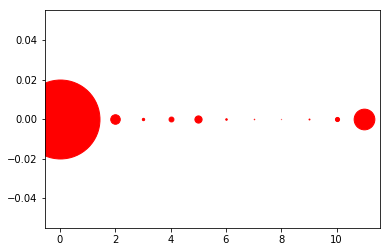

[((8, 0), 6), ((7, 0), 12), ((9, 0), 22), ((6, 0), 37), ((3, 0), 56), ((10, 0), 99), ((4, 0), 117), ((5, 0), 173), ((2, 0), 229), ((1, 0), 275), ((11, 0), 497), ((0, 0), 1895)]
755


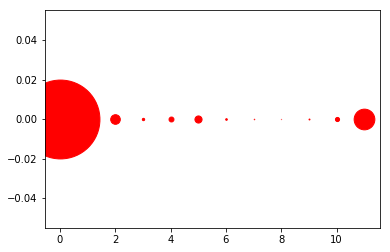

[((8, 0), 6), ((7, 0), 12), ((9, 0), 22), ((6, 0), 39), ((3, 0), 56), ((10, 0), 99), ((4, 0), 118), ((5, 0), 171), ((2, 0), 231), ((1, 0), 274), ((11, 0), 497), ((0, 0), 1893)]
756


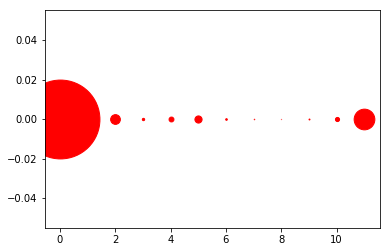

[((8, 0), 6), ((7, 0), 12), ((9, 0), 22), ((6, 0), 39), ((3, 0), 56), ((10, 0), 99), ((4, 0), 117), ((5, 0), 172), ((2, 0), 234), ((1, 0), 271), ((11, 0), 497), ((0, 0), 1893)]
757


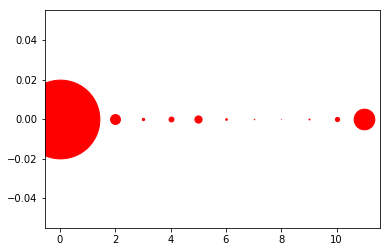

[((8, 0), 6), ((7, 0), 12), ((9, 0), 22), ((6, 0), 39), ((3, 0), 55), ((10, 0), 100), ((4, 0), 117), ((5, 0), 173), ((2, 0), 237), ((1, 0), 271), ((11, 0), 496), ((0, 0), 1890)]
758


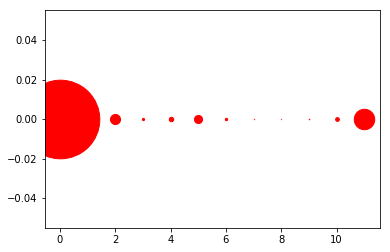

[((8, 0), 8), ((7, 0), 10), ((9, 0), 14), ((3, 0), 53), ((6, 0), 57), ((10, 0), 89), ((4, 0), 107), ((5, 0), 195), ((2, 0), 242), ((1, 0), 265), ((11, 0), 491), ((0, 0), 1887)]
759


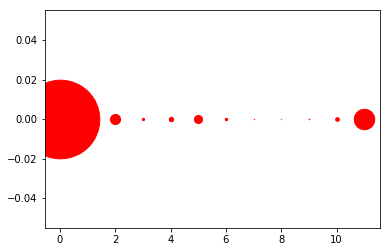

[((8, 0), 8), ((7, 0), 10), ((9, 0), 15), ((3, 0), 53), ((6, 0), 58), ((10, 0), 88), ((4, 0), 106), ((5, 0), 195), ((2, 0), 243), ((1, 0), 264), ((11, 0), 491), ((0, 0), 1887)]
760


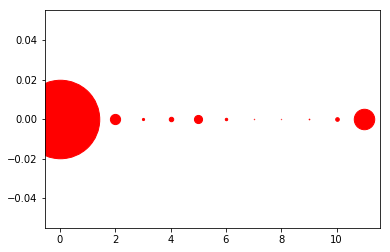

[((8, 0), 8), ((7, 0), 10), ((9, 0), 16), ((3, 0), 52), ((6, 0), 58), ((10, 0), 87), ((4, 0), 107), ((5, 0), 195), ((2, 0), 245), ((1, 0), 265), ((11, 0), 491), ((0, 0), 1884)]
761


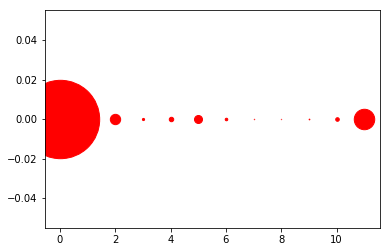

[((8, 0), 8), ((7, 0), 10), ((9, 0), 17), ((3, 0), 52), ((6, 0), 61), ((10, 0), 86), ((4, 0), 107), ((5, 0), 192), ((2, 0), 248), ((1, 0), 265), ((11, 0), 491), ((0, 0), 1881)]
762


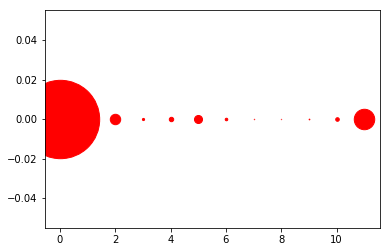

[((8, 0), 8), ((7, 0), 10), ((9, 0), 17), ((3, 0), 52), ((6, 0), 61), ((10, 0), 86), ((4, 0), 106), ((5, 0), 193), ((2, 0), 250), ((1, 0), 263), ((11, 0), 491), ((0, 0), 1881)]
763


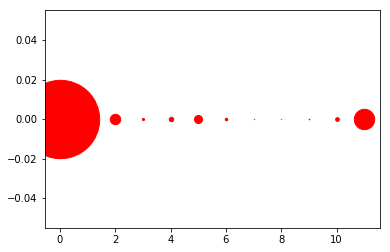

[((8, 0), 8), ((7, 0), 10), ((9, 0), 16), ((3, 0), 51), ((6, 0), 61), ((10, 0), 89), ((4, 0), 107), ((5, 0), 193), ((2, 0), 250), ((1, 0), 264), ((11, 0), 489), ((0, 0), 1880)]
764


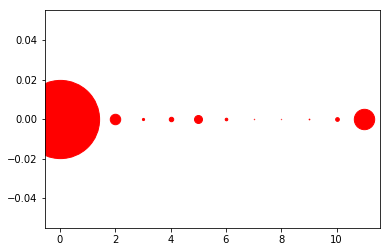

[((8, 0), 8), ((7, 0), 10), ((9, 0), 17), ((3, 0), 52), ((6, 0), 62), ((10, 0), 89), ((4, 0), 107), ((5, 0), 191), ((2, 0), 251), ((1, 0), 265), ((11, 0), 489), ((0, 0), 1877)]
765


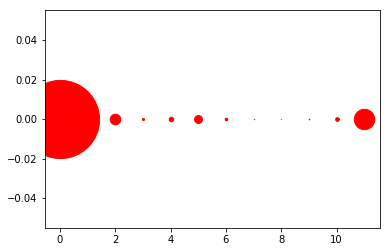

[((8, 0), 8), ((7, 0), 10), ((9, 0), 17), ((3, 0), 51), ((6, 0), 63), ((10, 0), 89), ((4, 0), 108), ((5, 0), 190), ((2, 0), 254), ((1, 0), 263), ((11, 0), 489), ((0, 0), 1876)]
766


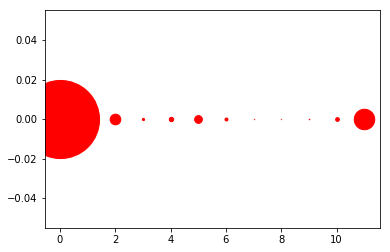

[((8, 0), 8), ((7, 0), 10), ((9, 0), 14), ((3, 0), 53), ((6, 0), 71), ((10, 0), 89), ((4, 0), 105), ((5, 0), 186), ((2, 0), 256), ((1, 0), 260), ((11, 0), 492), ((0, 0), 1874)]
767


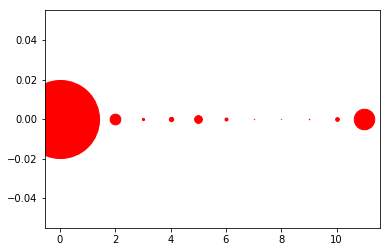

[((8, 0), 8), ((7, 0), 10), ((9, 0), 14), ((3, 0), 53), ((6, 0), 72), ((10, 0), 89), ((4, 0), 104), ((5, 0), 186), ((2, 0), 257), ((1, 0), 260), ((11, 0), 492), ((0, 0), 1873)]
768


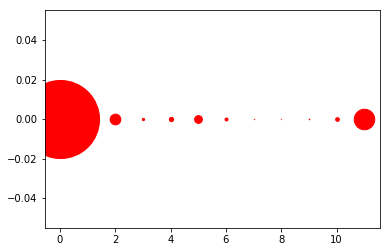

[((8, 0), 8), ((7, 0), 10), ((9, 0), 15), ((3, 0), 54), ((6, 0), 72), ((10, 0), 88), ((4, 0), 103), ((5, 0), 187), ((2, 0), 257), ((1, 0), 259), ((11, 0), 492), ((0, 0), 1873)]
769


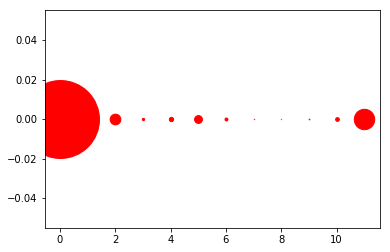

[((8, 0), 8), ((7, 0), 10), ((9, 0), 17), ((3, 0), 55), ((6, 0), 70), ((10, 0), 89), ((4, 0), 103), ((5, 0), 188), ((2, 0), 257), ((1, 0), 261), ((11, 0), 490), ((0, 0), 1870)]
770


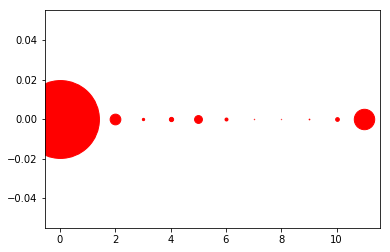

[((8, 0), 8), ((7, 0), 10), ((9, 0), 17), ((3, 0), 55), ((6, 0), 71), ((10, 0), 89), ((4, 0), 102), ((5, 0), 188), ((2, 0), 257), ((1, 0), 262), ((11, 0), 490), ((0, 0), 1869)]
771


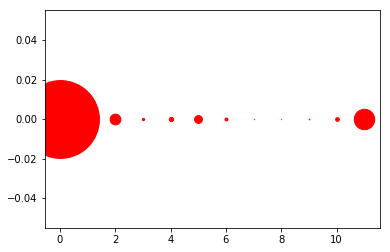

[((8, 0), 8), ((7, 0), 10), ((9, 0), 17), ((3, 0), 55), ((6, 0), 71), ((10, 0), 89), ((4, 0), 102), ((5, 0), 188), ((2, 0), 258), ((1, 0), 262), ((11, 0), 490), ((0, 0), 1868)]
772


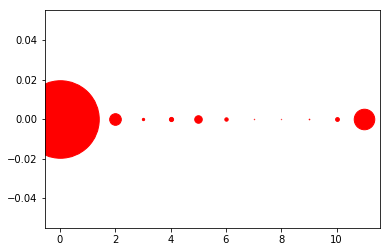

[((8, 0), 8), ((7, 0), 10), ((9, 0), 15), ((3, 0), 55), ((6, 0), 81), ((10, 0), 91), ((4, 0), 100), ((5, 0), 181), ((1, 0), 244), ((2, 0), 279), ((11, 0), 493), ((0, 0), 1861)]
773


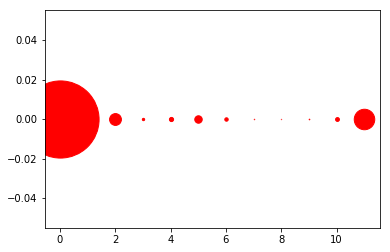

[((8, 0), 8), ((7, 0), 11), ((9, 0), 15), ((3, 0), 56), ((6, 0), 82), ((10, 0), 92), ((4, 0), 100), ((5, 0), 179), ((1, 0), 247), ((2, 0), 284), ((11, 0), 492), ((0, 0), 1852)]
774


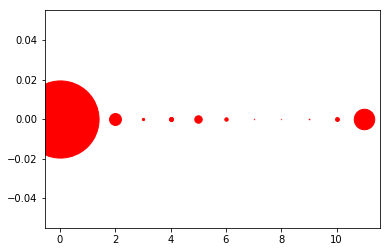

[((8, 0), 8), ((7, 0), 11), ((9, 0), 15), ((3, 0), 54), ((6, 0), 82), ((10, 0), 92), ((4, 0), 100), ((5, 0), 179), ((1, 0), 247), ((2, 0), 286), ((11, 0), 492), ((0, 0), 1852)]
775


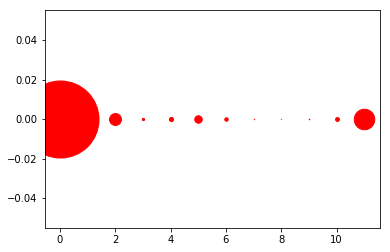

[((8, 0), 8), ((7, 0), 11), ((9, 0), 15), ((3, 0), 54), ((6, 0), 83), ((10, 0), 92), ((4, 0), 98), ((5, 0), 180), ((1, 0), 250), ((2, 0), 286), ((11, 0), 492), ((0, 0), 1849)]
776


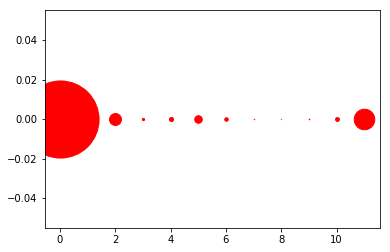

[((8, 0), 8), ((7, 0), 11), ((9, 0), 15), ((3, 0), 53), ((6, 0), 84), ((10, 0), 92), ((4, 0), 97), ((5, 0), 181), ((1, 0), 247), ((2, 0), 286), ((11, 0), 493), ((0, 0), 1851)]
777


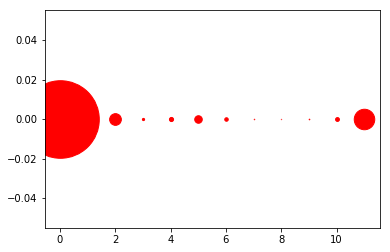

[((8, 0), 8), ((7, 0), 12), ((9, 0), 15), ((3, 0), 53), ((6, 0), 84), ((10, 0), 92), ((4, 0), 99), ((5, 0), 181), ((1, 0), 239), ((2, 0), 281), ((11, 0), 492), ((0, 0), 1862)]
778


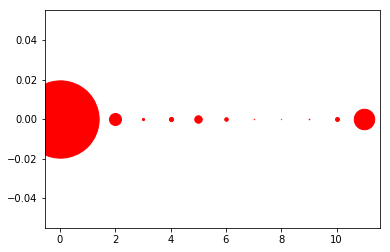

[((8, 0), 8), ((7, 0), 12), ((9, 0), 15), ((3, 0), 52), ((6, 0), 85), ((10, 0), 93), ((4, 0), 100), ((5, 0), 179), ((1, 0), 239), ((2, 0), 288), ((11, 0), 492), ((0, 0), 1855)]
779


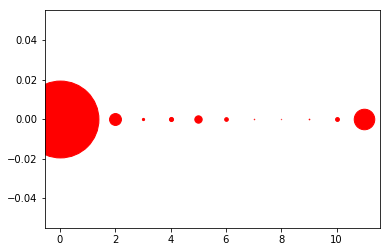

[((8, 0), 8), ((7, 0), 12), ((9, 0), 16), ((3, 0), 53), ((6, 0), 88), ((10, 0), 92), ((4, 0), 98), ((5, 0), 177), ((1, 0), 251), ((2, 0), 285), ((11, 0), 493), ((0, 0), 1845)]
780


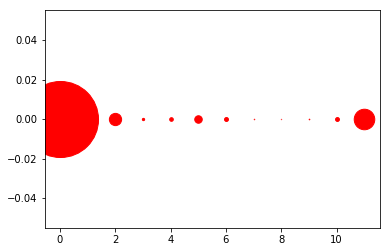

[((8, 0), 8), ((7, 0), 12), ((9, 0), 15), ((3, 0), 55), ((4, 0), 87), ((10, 0), 93), ((6, 0), 94), ((5, 0), 180), ((1, 0), 262), ((2, 0), 294), ((11, 0), 493), ((0, 0), 1825)]
781


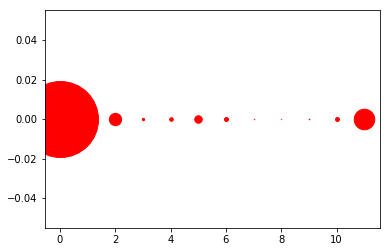

[((8, 0), 8), ((7, 0), 12), ((9, 0), 15), ((3, 0), 55), ((4, 0), 86), ((10, 0), 93), ((6, 0), 95), ((5, 0), 180), ((1, 0), 262), ((2, 0), 295), ((11, 0), 493), ((0, 0), 1824)]
782


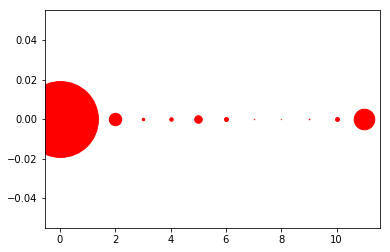

[((8, 0), 8), ((7, 0), 12), ((9, 0), 15), ((3, 0), 59), ((4, 0), 84), ((10, 0), 93), ((6, 0), 96), ((5, 0), 181), ((1, 0), 258), ((2, 0), 298), ((11, 0), 494), ((0, 0), 1820)]
783


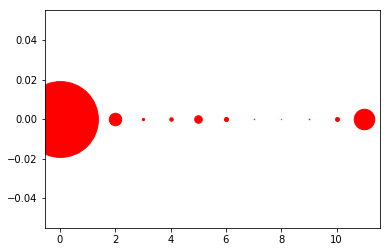

[((8, 0), 8), ((7, 0), 12), ((9, 0), 15), ((3, 0), 55), ((4, 0), 83), ((10, 0), 94), ((6, 0), 97), ((5, 0), 181), ((1, 0), 263), ((2, 0), 299), ((11, 0), 492), ((0, 0), 1819)]
784


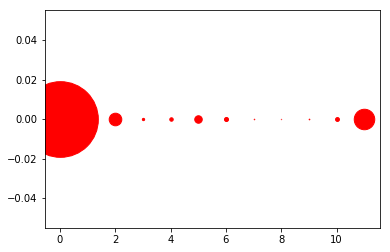

[((8, 0), 8), ((7, 0), 13), ((9, 0), 16), ((3, 0), 55), ((4, 0), 83), ((10, 0), 93), ((6, 0), 97), ((5, 0), 180), ((1, 0), 263), ((2, 0), 302), ((11, 0), 492), ((0, 0), 1816)]
785


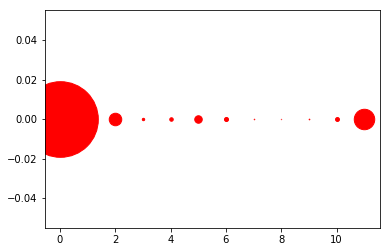

[((8, 0), 8), ((7, 0), 13), ((9, 0), 16), ((3, 0), 57), ((4, 0), 84), ((10, 0), 94), ((6, 0), 97), ((5, 0), 180), ((1, 0), 263), ((2, 0), 300), ((11, 0), 491), ((0, 0), 1815)]
786


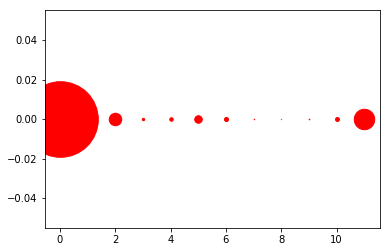

[((8, 0), 8), ((7, 0), 13), ((9, 0), 16), ((3, 0), 57), ((4, 0), 84), ((10, 0), 94), ((6, 0), 97), ((5, 0), 181), ((1, 0), 263), ((2, 0), 300), ((11, 0), 491), ((0, 0), 1814)]
787


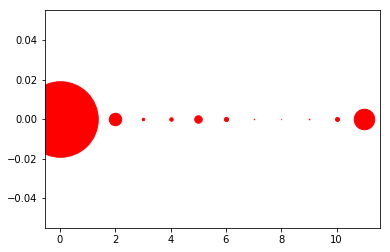

[((8, 0), 8), ((7, 0), 13), ((9, 0), 16), ((3, 0), 59), ((4, 0), 83), ((10, 0), 94), ((6, 0), 98), ((5, 0), 180), ((1, 0), 264), ((2, 0), 298), ((11, 0), 492), ((0, 0), 1813)]
788


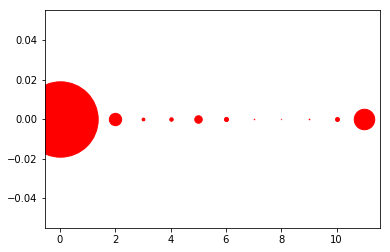

[((8, 0), 8), ((7, 0), 13), ((9, 0), 16), ((3, 0), 66), ((4, 0), 83), ((10, 0), 94), ((6, 0), 98), ((5, 0), 180), ((1, 0), 263), ((2, 0), 296), ((11, 0), 492), ((0, 0), 1809)]
789


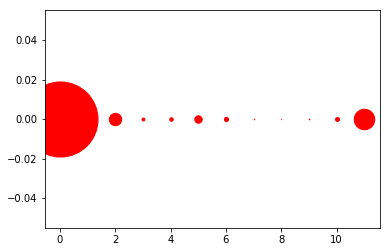

[((8, 0), 8), ((7, 0), 13), ((9, 0), 16), ((3, 0), 68), ((4, 0), 85), ((10, 0), 94), ((6, 0), 100), ((5, 0), 178), ((1, 0), 265), ((2, 0), 297), ((11, 0), 492), ((0, 0), 1802)]
790


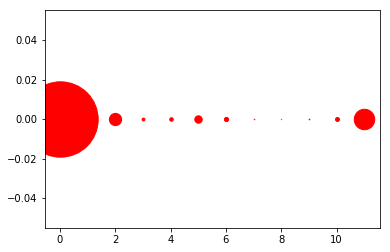

[((8, 0), 8), ((7, 0), 13), ((9, 0), 17), ((3, 0), 66), ((4, 0), 85), ((10, 0), 94), ((6, 0), 100), ((5, 0), 178), ((1, 0), 263), ((2, 0), 294), ((11, 0), 491), ((0, 0), 1809)]
791


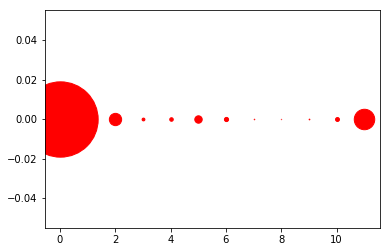

[((8, 0), 8), ((7, 0), 13), ((9, 0), 17), ((3, 0), 67), ((4, 0), 85), ((10, 0), 94), ((6, 0), 100), ((5, 0), 178), ((1, 0), 262), ((2, 0), 295), ((11, 0), 491), ((0, 0), 1808)]
792


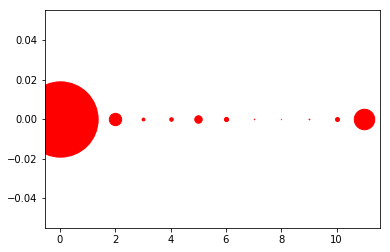

[((8, 0), 8), ((7, 0), 13), ((9, 0), 17), ((3, 0), 67), ((4, 0), 84), ((10, 0), 94), ((6, 0), 100), ((5, 0), 179), ((1, 0), 262), ((2, 0), 296), ((11, 0), 491), ((0, 0), 1807)]
793


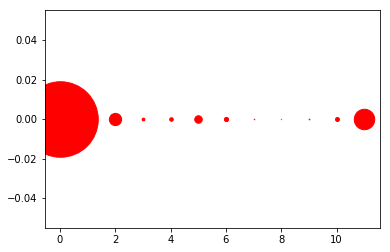

[((8, 0), 8), ((7, 0), 13), ((9, 0), 17), ((3, 0), 65), ((4, 0), 85), ((10, 0), 94), ((6, 0), 100), ((5, 0), 180), ((1, 0), 259), ((2, 0), 294), ((11, 0), 491), ((0, 0), 1812)]
794


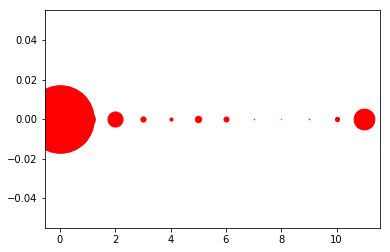

[((8, 0), 8), ((7, 0), 13), ((9, 0), 16), ((4, 0), 74), ((10, 0), 99), ((6, 0), 120), ((3, 0), 125), ((5, 0), 152), ((1, 0), 328), ((2, 0), 362), ((11, 0), 499), ((0, 0), 1622)]
795


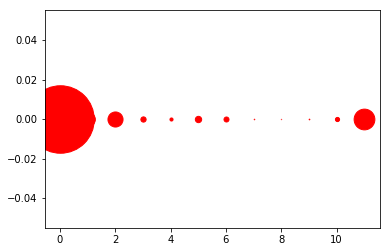

[((8, 0), 8), ((7, 0), 13), ((9, 0), 16), ((4, 0), 74), ((10, 0), 100), ((6, 0), 120), ((3, 0), 126), ((5, 0), 152), ((1, 0), 329), ((2, 0), 362), ((11, 0), 498), ((0, 0), 1620)]
796


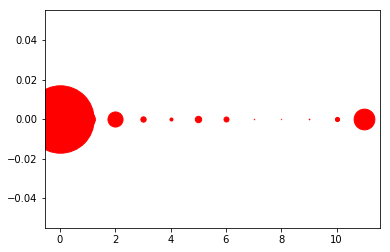

[((8, 0), 9), ((7, 0), 12), ((9, 0), 16), ((4, 0), 72), ((10, 0), 100), ((6, 0), 120), ((3, 0), 128), ((5, 0), 153), ((1, 0), 330), ((2, 0), 362), ((11, 0), 498), ((0, 0), 1618)]
797


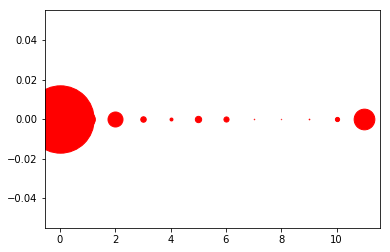

[((8, 0), 9), ((7, 0), 12), ((9, 0), 16), ((4, 0), 70), ((10, 0), 101), ((6, 0), 123), ((3, 0), 132), ((5, 0), 152), ((1, 0), 329), ((2, 0), 360), ((11, 0), 497), ((0, 0), 1617)]
798


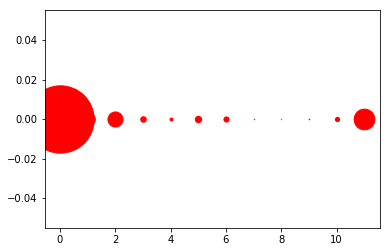

[((8, 0), 9), ((7, 0), 12), ((9, 0), 16), ((4, 0), 69), ((10, 0), 101), ((6, 0), 123), ((3, 0), 132), ((5, 0), 153), ((1, 0), 327), ((2, 0), 362), ((11, 0), 497), ((0, 0), 1617)]
799


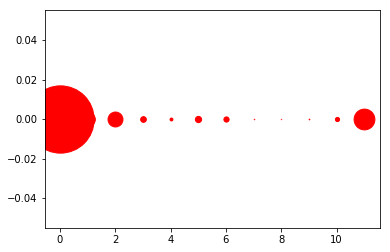

[((8, 0), 9), ((7, 0), 12), ((9, 0), 16), ((4, 0), 69), ((10, 0), 100), ((6, 0), 125), ((3, 0), 137), ((5, 0), 150), ((1, 0), 328), ((2, 0), 358), ((11, 0), 499), ((0, 0), 1615)]
800


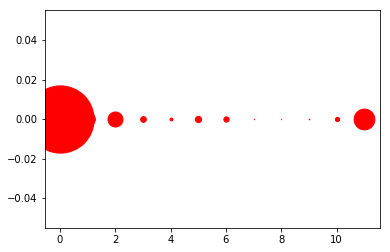

[((8, 0), 9), ((7, 0), 12), ((9, 0), 16), ((4, 0), 68), ((10, 0), 101), ((6, 0), 126), ((3, 0), 137), ((5, 0), 150), ((1, 0), 327), ((2, 0), 360), ((11, 0), 498), ((0, 0), 1614)]
801


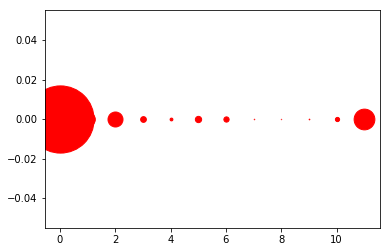

[((8, 0), 9), ((7, 0), 12), ((9, 0), 16), ((4, 0), 67), ((10, 0), 101), ((6, 0), 126), ((3, 0), 138), ((5, 0), 151), ((1, 0), 327), ((2, 0), 360), ((11, 0), 498), ((0, 0), 1613)]
802


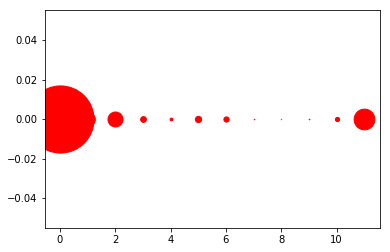

[((8, 0), 9), ((7, 0), 13), ((9, 0), 16), ((4, 0), 67), ((10, 0), 101), ((6, 0), 125), ((3, 0), 138), ((5, 0), 151), ((1, 0), 328), ((2, 0), 360), ((11, 0), 498), ((0, 0), 1612)]
803


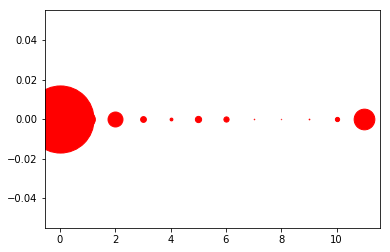

[((8, 0), 9), ((7, 0), 13), ((9, 0), 17), ((4, 0), 67), ((10, 0), 102), ((6, 0), 125), ((3, 0), 139), ((5, 0), 150), ((1, 0), 329), ((2, 0), 359), ((11, 0), 497), ((0, 0), 1611)]
804


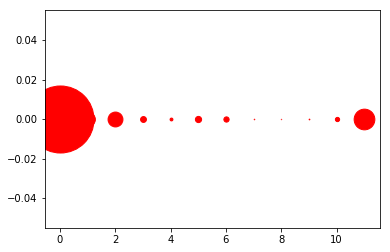

[((8, 0), 9), ((7, 0), 13), ((9, 0), 17), ((4, 0), 68), ((10, 0), 102), ((6, 0), 126), ((3, 0), 141), ((5, 0), 149), ((1, 0), 330), ((2, 0), 357), ((11, 0), 497), ((0, 0), 1609)]
805


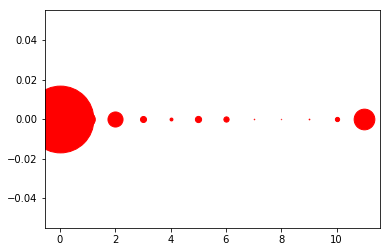

[((8, 0), 9), ((7, 0), 13), ((9, 0), 17), ((4, 0), 69), ((10, 0), 102), ((6, 0), 126), ((3, 0), 145), ((5, 0), 149), ((1, 0), 326), ((2, 0), 362), ((11, 0), 497), ((0, 0), 1603)]
806


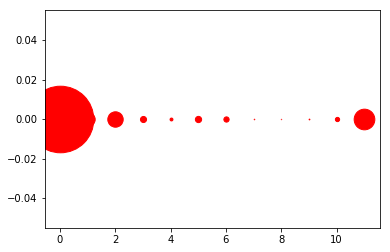

[((8, 0), 9), ((7, 0), 13), ((9, 0), 18), ((4, 0), 69), ((10, 0), 102), ((6, 0), 126), ((3, 0), 146), ((5, 0), 150), ((1, 0), 321), ((2, 0), 370), ((11, 0), 496), ((0, 0), 1598)]
807


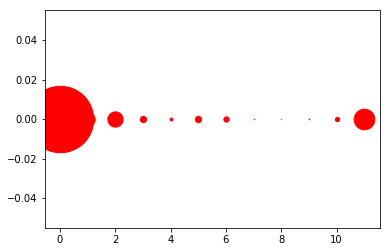

[((8, 0), 9), ((7, 0), 13), ((9, 0), 18), ((4, 0), 69), ((10, 0), 102), ((6, 0), 126), ((5, 0), 150), ((3, 0), 151), ((1, 0), 321), ((2, 0), 367), ((11, 0), 496), ((0, 0), 1596)]
808


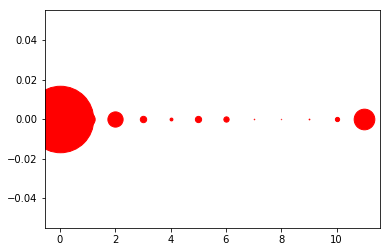

[((8, 0), 9), ((7, 0), 13), ((9, 0), 18), ((4, 0), 68), ((10, 0), 102), ((6, 0), 127), ((5, 0), 150), ((3, 0), 153), ((1, 0), 320), ((2, 0), 366), ((11, 0), 496), ((0, 0), 1596)]
809


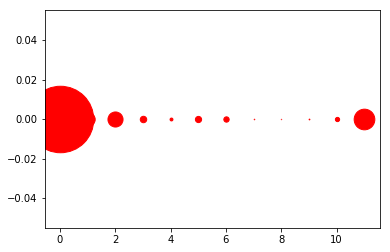

[((8, 0), 9), ((7, 0), 13), ((9, 0), 18), ((4, 0), 69), ((10, 0), 102), ((6, 0), 128), ((5, 0), 149), ((3, 0), 155), ((1, 0), 321), ((2, 0), 362), ((11, 0), 496), ((0, 0), 1596)]
810


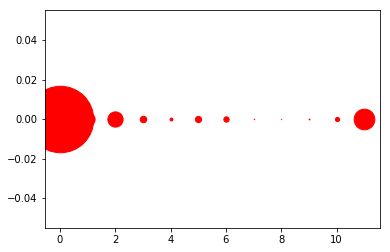

[((8, 0), 9), ((7, 0), 13), ((9, 0), 20), ((4, 0), 68), ((10, 0), 100), ((6, 0), 128), ((5, 0), 150), ((3, 0), 156), ((1, 0), 317), ((2, 0), 366), ((11, 0), 496), ((0, 0), 1595)]
811


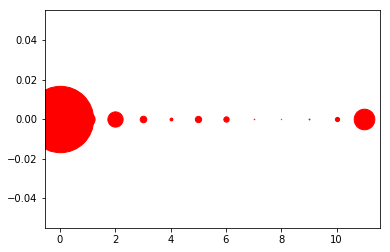

[((8, 0), 9), ((7, 0), 13), ((9, 0), 20), ((4, 0), 67), ((10, 0), 101), ((6, 0), 128), ((5, 0), 151), ((3, 0), 158), ((1, 0), 317), ((2, 0), 366), ((11, 0), 495), ((0, 0), 1593)]
812


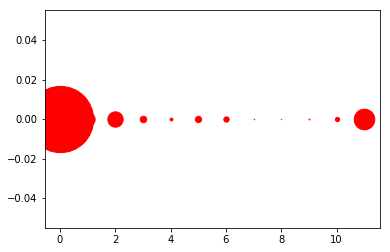

[((8, 0), 9), ((7, 0), 13), ((9, 0), 20), ((4, 0), 69), ((10, 0), 101), ((6, 0), 128), ((5, 0), 151), ((3, 0), 156), ((1, 0), 318), ((2, 0), 368), ((11, 0), 495), ((0, 0), 1590)]
813


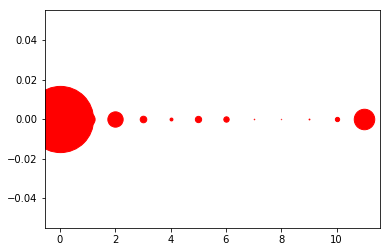

[((8, 0), 9), ((7, 0), 13), ((9, 0), 20), ((4, 0), 69), ((10, 0), 103), ((6, 0), 129), ((5, 0), 151), ((3, 0), 158), ((1, 0), 317), ((2, 0), 368), ((11, 0), 492), ((0, 0), 1589)]
814


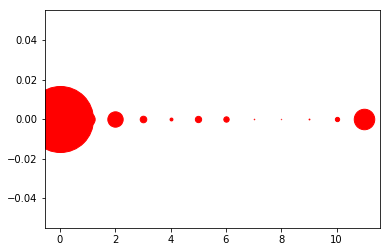

[((8, 0), 9), ((7, 0), 13), ((9, 0), 20), ((4, 0), 69), ((10, 0), 103), ((6, 0), 129), ((5, 0), 151), ((3, 0), 158), ((1, 0), 320), ((2, 0), 369), ((11, 0), 492), ((0, 0), 1585)]
815


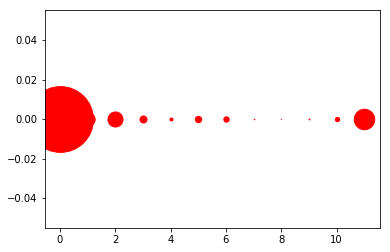

[((8, 0), 9), ((7, 0), 14), ((9, 0), 20), ((4, 0), 72), ((10, 0), 104), ((6, 0), 128), ((5, 0), 153), ((3, 0), 169), ((1, 0), 319), ((2, 0), 361), ((11, 0), 491), ((0, 0), 1578)]
816


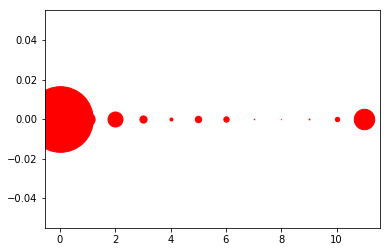

[((8, 0), 9), ((7, 0), 14), ((9, 0), 20), ((4, 0), 71), ((10, 0), 104), ((6, 0), 128), ((5, 0), 154), ((3, 0), 173), ((1, 0), 318), ((2, 0), 360), ((11, 0), 491), ((0, 0), 1576)]
817


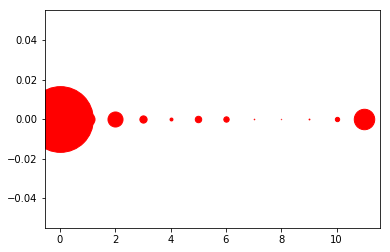

[((8, 0), 9), ((7, 0), 14), ((9, 0), 20), ((4, 0), 70), ((10, 0), 104), ((6, 0), 129), ((5, 0), 155), ((3, 0), 174), ((1, 0), 313), ((2, 0), 361), ((11, 0), 491), ((0, 0), 1578)]
818


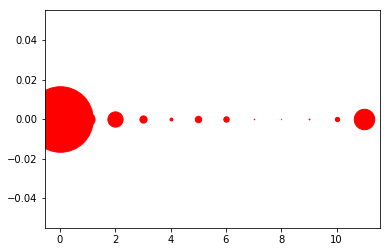

[((8, 0), 9), ((7, 0), 14), ((9, 0), 20), ((4, 0), 69), ((10, 0), 104), ((6, 0), 130), ((5, 0), 154), ((3, 0), 173), ((1, 0), 315), ((2, 0), 366), ((11, 0), 491), ((0, 0), 1573)]
819


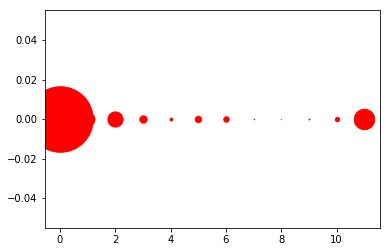

[((8, 0), 9), ((7, 0), 14), ((9, 0), 21), ((4, 0), 69), ((10, 0), 103), ((6, 0), 130), ((5, 0), 154), ((3, 0), 176), ((1, 0), 313), ((2, 0), 365), ((11, 0), 491), ((0, 0), 1573)]
820


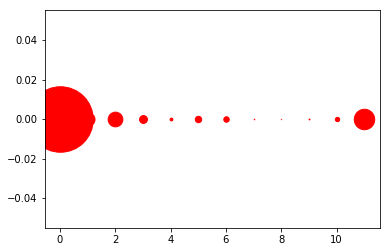

[((8, 0), 9), ((7, 0), 14), ((9, 0), 21), ((4, 0), 67), ((10, 0), 104), ((6, 0), 131), ((5, 0), 154), ((3, 0), 189), ((1, 0), 313), ((2, 0), 353), ((11, 0), 491), ((0, 0), 1572)]
821


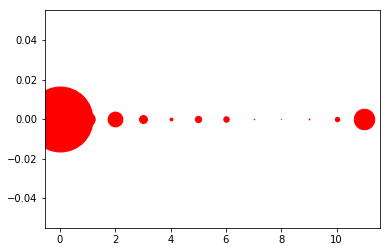

[((8, 0), 9), ((7, 0), 14), ((9, 0), 20), ((4, 0), 68), ((10, 0), 107), ((6, 0), 131), ((5, 0), 152), ((3, 0), 190), ((1, 0), 321), ((2, 0), 355), ((11, 0), 492), ((0, 0), 1559)]
822


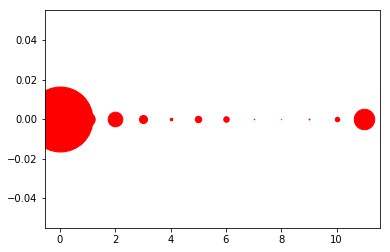

[((8, 0), 9), ((7, 0), 14), ((9, 0), 21), ((4, 0), 63), ((10, 0), 108), ((6, 0), 132), ((5, 0), 155), ((3, 0), 193), ((1, 0), 321), ((2, 0), 352), ((11, 0), 491), ((0, 0), 1559)]
823


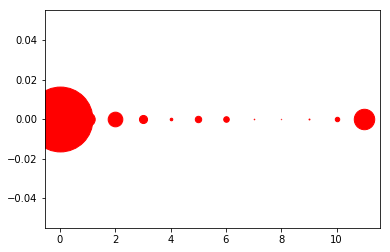

[((8, 0), 9), ((7, 0), 14), ((9, 0), 22), ((4, 0), 62), ((10, 0), 107), ((6, 0), 134), ((5, 0), 154), ((3, 0), 194), ((1, 0), 322), ((2, 0), 352), ((11, 0), 491), ((0, 0), 1557)]
824


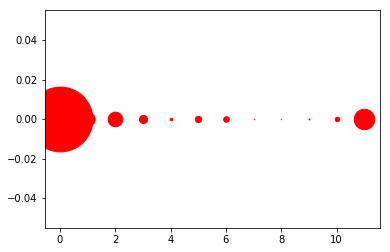

[((8, 0), 10), ((7, 0), 13), ((9, 0), 22), ((4, 0), 62), ((10, 0), 107), ((6, 0), 135), ((5, 0), 153), ((3, 0), 195), ((1, 0), 322), ((2, 0), 352), ((11, 0), 491), ((0, 0), 1556)]
825


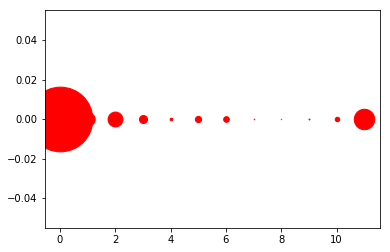

[((8, 0), 10), ((7, 0), 14), ((9, 0), 22), ((4, 0), 64), ((10, 0), 108), ((6, 0), 136), ((5, 0), 150), ((3, 0), 192), ((1, 0), 321), ((2, 0), 357), ((11, 0), 491), ((0, 0), 1553)]
826


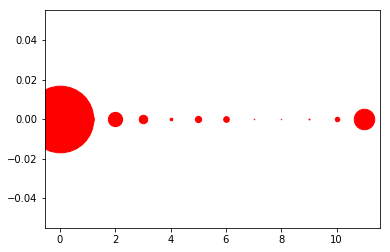

[((8, 0), 11), ((7, 0), 13), ((9, 0), 22), ((4, 0), 63), ((10, 0), 108), ((6, 0), 136), ((5, 0), 151), ((3, 0), 204), ((1, 0), 278), ((2, 0), 343), ((11, 0), 491), ((0, 0), 1598)]
827


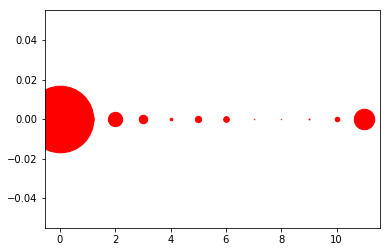

[((8, 0), 11), ((7, 0), 13), ((9, 0), 22), ((4, 0), 61), ((10, 0), 109), ((6, 0), 137), ((5, 0), 152), ((3, 0), 205), ((1, 0), 276), ((2, 0), 344), ((11, 0), 490), ((0, 0), 1598)]
828


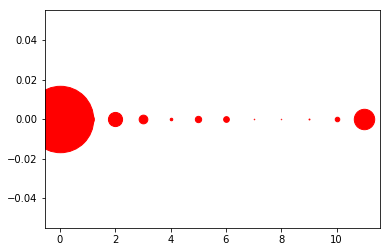

[((8, 0), 11), ((7, 0), 13), ((9, 0), 22), ((4, 0), 61), ((10, 0), 109), ((6, 0), 137), ((5, 0), 152), ((3, 0), 209), ((1, 0), 280), ((2, 0), 340), ((11, 0), 490), ((0, 0), 1594)]
829


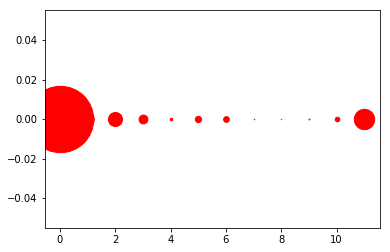

[((8, 0), 11), ((7, 0), 13), ((9, 0), 22), ((4, 0), 60), ((10, 0), 110), ((6, 0), 138), ((5, 0), 152), ((3, 0), 212), ((1, 0), 280), ((2, 0), 338), ((11, 0), 489), ((0, 0), 1593)]
830


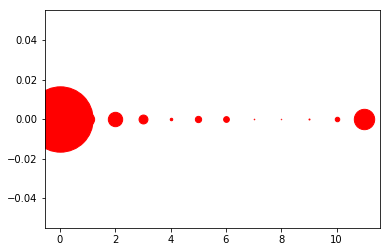

[((8, 0), 11), ((7, 0), 14), ((9, 0), 24), ((4, 0), 60), ((10, 0), 108), ((6, 0), 138), ((5, 0), 151), ((3, 0), 214), ((1, 0), 295), ((2, 0), 345), ((11, 0), 489), ((0, 0), 1569)]
831


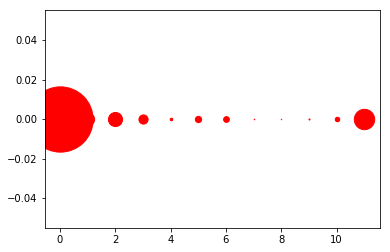

[((8, 0), 11), ((7, 0), 14), ((9, 0), 24), ((4, 0), 61), ((10, 0), 108), ((6, 0), 139), ((5, 0), 151), ((3, 0), 220), ((1, 0), 295), ((2, 0), 339), ((11, 0), 489), ((0, 0), 1567)]
832


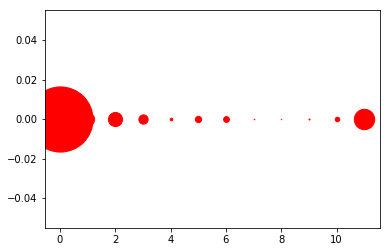

[((8, 0), 11), ((7, 0), 14), ((9, 0), 24), ((4, 0), 61), ((10, 0), 108), ((6, 0), 139), ((5, 0), 151), ((3, 0), 222), ((1, 0), 297), ((2, 0), 338), ((11, 0), 489), ((0, 0), 1564)]
833


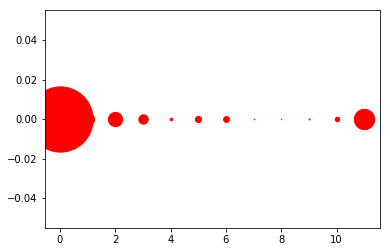

[((8, 0), 11), ((7, 0), 14), ((9, 0), 24), ((4, 0), 61), ((10, 0), 108), ((6, 0), 141), ((5, 0), 149), ((3, 0), 224), ((1, 0), 290), ((2, 0), 341), ((11, 0), 489), ((0, 0), 1566)]
834


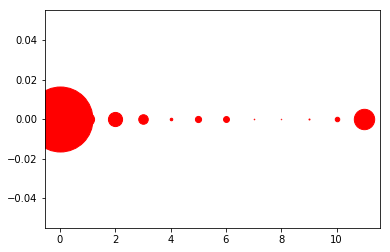

[((8, 0), 11), ((7, 0), 14), ((9, 0), 24), ((4, 0), 61), ((10, 0), 108), ((6, 0), 142), ((5, 0), 148), ((3, 0), 229), ((1, 0), 292), ((2, 0), 340), ((11, 0), 489), ((0, 0), 1560)]
835


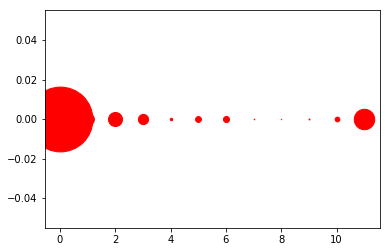

[((8, 0), 11), ((7, 0), 15), ((9, 0), 22), ((4, 0), 58), ((10, 0), 113), ((5, 0), 141), ((6, 0), 146), ((3, 0), 245), ((1, 0), 283), ((2, 0), 337), ((11, 0), 491), ((0, 0), 1556)]
836


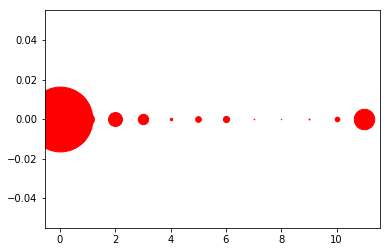

[((8, 0), 11), ((7, 0), 15), ((9, 0), 23), ((4, 0), 58), ((10, 0), 112), ((5, 0), 137), ((6, 0), 150), ((3, 0), 248), ((1, 0), 282), ((2, 0), 335), ((11, 0), 491), ((0, 0), 1556)]
837


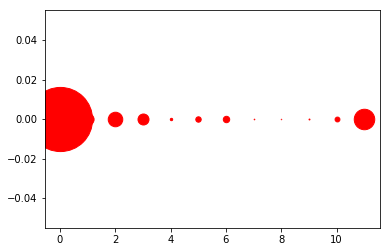

[((8, 0), 11), ((7, 0), 15), ((9, 0), 22), ((4, 0), 57), ((10, 0), 116), ((5, 0), 130), ((6, 0), 154), ((3, 0), 264), ((1, 0), 268), ((2, 0), 349), ((11, 0), 492), ((0, 0), 1540)]
838


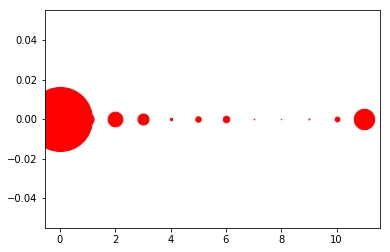

[((8, 0), 11), ((7, 0), 15), ((9, 0), 23), ((4, 0), 57), ((10, 0), 115), ((5, 0), 130), ((6, 0), 155), ((3, 0), 264), ((1, 0), 269), ((2, 0), 353), ((11, 0), 490), ((0, 0), 1536)]
839


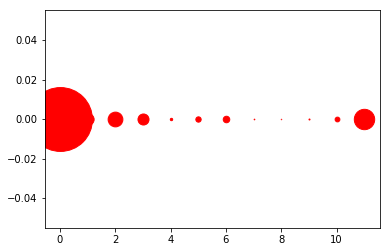

[((8, 0), 11), ((7, 0), 16), ((9, 0), 24), ((4, 0), 57), ((10, 0), 114), ((5, 0), 128), ((6, 0), 157), ((3, 0), 265), ((1, 0), 270), ((2, 0), 354), ((11, 0), 489), ((0, 0), 1533)]
840


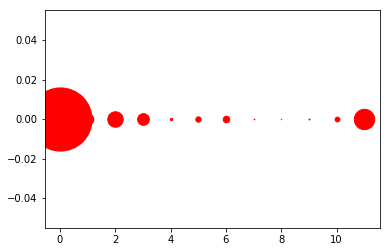

[((8, 0), 11), ((7, 0), 16), ((9, 0), 24), ((4, 0), 55), ((10, 0), 115), ((5, 0), 128), ((6, 0), 157), ((1, 0), 255), ((3, 0), 281), ((2, 0), 371), ((11, 0), 489), ((0, 0), 1516)]
841


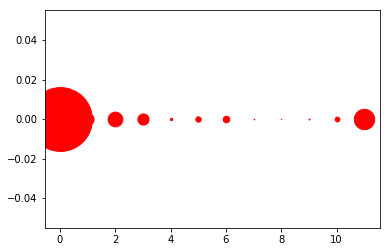

[((8, 0), 11), ((7, 0), 16), ((9, 0), 24), ((4, 0), 56), ((10, 0), 114), ((5, 0), 128), ((6, 0), 158), ((3, 0), 268), ((1, 0), 269), ((2, 0), 353), ((11, 0), 489), ((0, 0), 1532)]
842


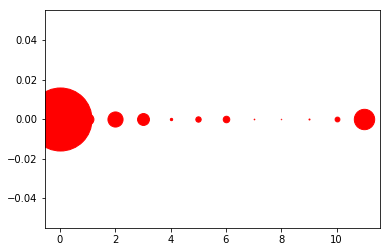

[((8, 0), 11), ((7, 0), 16), ((9, 0), 24), ((4, 0), 56), ((10, 0), 115), ((5, 0), 129), ((6, 0), 157), ((1, 0), 260), ((3, 0), 285), ((2, 0), 363), ((11, 0), 489), ((0, 0), 1513)]
843


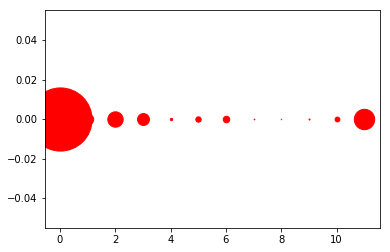

[((8, 0), 11), ((7, 0), 17), ((9, 0), 24), ((4, 0), 56), ((10, 0), 115), ((5, 0), 129), ((6, 0), 156), ((1, 0), 250), ((3, 0), 286), ((2, 0), 369), ((11, 0), 489), ((0, 0), 1516)]
844


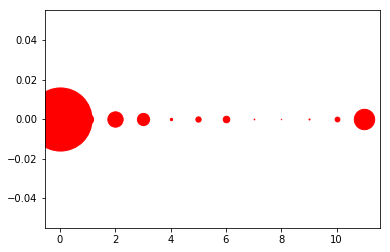

[((8, 0), 11), ((7, 0), 17), ((9, 0), 24), ((4, 0), 56), ((10, 0), 115), ((5, 0), 127), ((6, 0), 158), ((1, 0), 245), ((3, 0), 293), ((2, 0), 368), ((11, 0), 489), ((0, 0), 1515)]
845


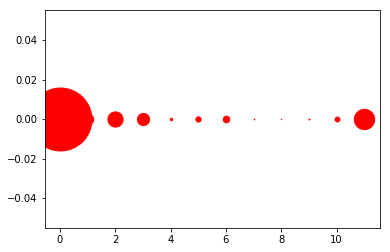

[((8, 0), 11), ((7, 0), 17), ((9, 0), 24), ((4, 0), 57), ((10, 0), 116), ((5, 0), 126), ((6, 0), 159), ((1, 0), 251), ((3, 0), 293), ((2, 0), 365), ((11, 0), 488), ((0, 0), 1511)]
846


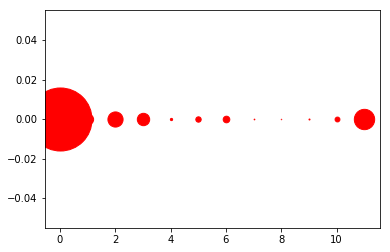

[((8, 0), 11), ((7, 0), 17), ((9, 0), 24), ((4, 0), 54), ((10, 0), 116), ((5, 0), 129), ((6, 0), 159), ((1, 0), 246), ((3, 0), 297), ((2, 0), 364), ((11, 0), 488), ((0, 0), 1513)]
847


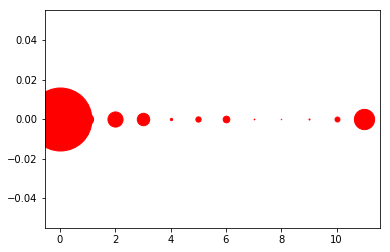

[((8, 0), 11), ((7, 0), 18), ((9, 0), 24), ((4, 0), 54), ((10, 0), 118), ((5, 0), 127), ((6, 0), 160), ((1, 0), 246), ((3, 0), 299), ((2, 0), 363), ((11, 0), 486), ((0, 0), 1512)]
848


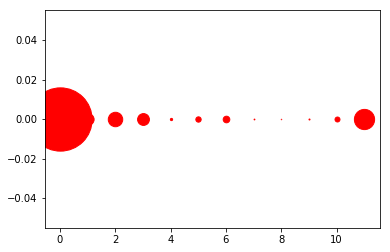

[((8, 0), 11), ((7, 0), 19), ((9, 0), 24), ((4, 0), 54), ((10, 0), 119), ((5, 0), 128), ((6, 0), 159), ((1, 0), 269), ((3, 0), 284), ((2, 0), 347), ((11, 0), 485), ((0, 0), 1519)]
849


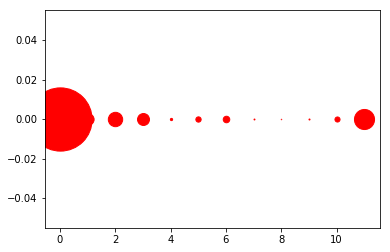

[((8, 0), 11), ((7, 0), 22), ((9, 0), 24), ((4, 0), 54), ((10, 0), 122), ((5, 0), 127), ((6, 0), 157), ((1, 0), 269), ((3, 0), 287), ((2, 0), 345), ((11, 0), 482), ((0, 0), 1518)]
850


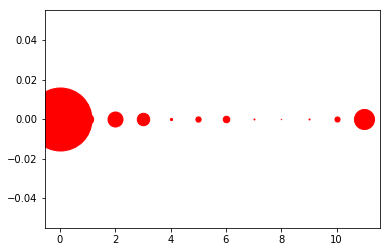

[((8, 0), 11), ((7, 0), 23), ((9, 0), 24), ((4, 0), 53), ((10, 0), 123), ((5, 0), 127), ((6, 0), 157), ((1, 0), 248), ((3, 0), 299), ((2, 0), 360), ((11, 0), 481), ((0, 0), 1512)]
851


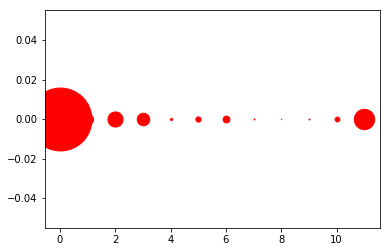

[((8, 0), 11), ((9, 0), 23), ((7, 0), 23), ((4, 0), 51), ((10, 0), 115), ((5, 0), 126), ((6, 0), 163), ((1, 0), 244), ((3, 0), 300), ((2, 0), 363), ((11, 0), 489), ((0, 0), 1510)]
852


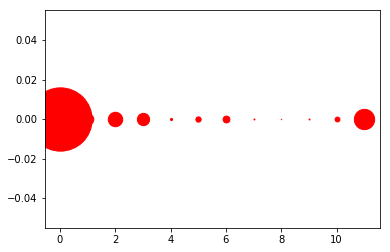

[((8, 0), 11), ((9, 0), 23), ((7, 0), 23), ((4, 0), 51), ((10, 0), 116), ((5, 0), 127), ((6, 0), 164), ((1, 0), 255), ((3, 0), 295), ((2, 0), 347), ((11, 0), 487), ((0, 0), 1519)]
853


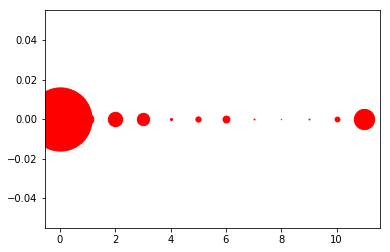

[((8, 0), 11), ((9, 0), 23), ((7, 0), 23), ((4, 0), 49), ((10, 0), 117), ((5, 0), 126), ((6, 0), 166), ((1, 0), 256), ((3, 0), 297), ((2, 0), 345), ((11, 0), 487), ((0, 0), 1518)]
854


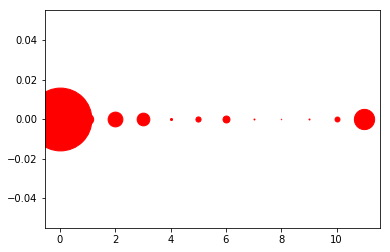

[((8, 0), 11), ((9, 0), 23), ((7, 0), 23), ((4, 0), 49), ((10, 0), 118), ((5, 0), 124), ((6, 0), 167), ((1, 0), 249), ((3, 0), 305), ((2, 0), 355), ((11, 0), 486), ((0, 0), 1508)]
855


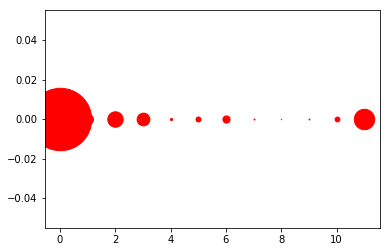

[((8, 0), 11), ((9, 0), 22), ((7, 0), 23), ((4, 0), 51), ((10, 0), 116), ((5, 0), 120), ((6, 0), 172), ((1, 0), 238), ((3, 0), 306), ((2, 0), 370), ((11, 0), 490), ((0, 0), 1499)]
856


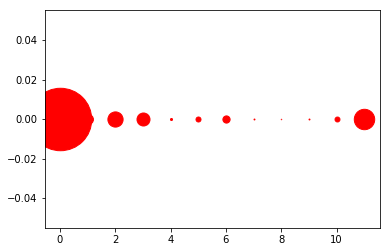

[((8, 0), 11), ((9, 0), 22), ((7, 0), 22), ((4, 0), 49), ((10, 0), 118), ((5, 0), 120), ((6, 0), 173), ((1, 0), 237), ((3, 0), 312), ((2, 0), 365), ((11, 0), 490), ((0, 0), 1499)]
857


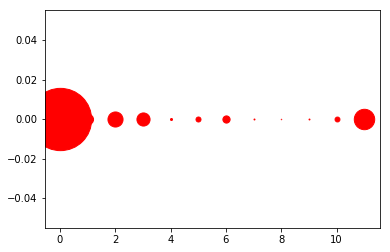

[((8, 0), 11), ((9, 0), 22), ((7, 0), 23), ((4, 0), 48), ((10, 0), 117), ((5, 0), 120), ((6, 0), 173), ((1, 0), 242), ((3, 0), 315), ((2, 0), 362), ((11, 0), 490), ((0, 0), 1495)]
858


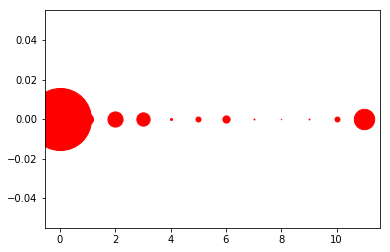

[((8, 0), 11), ((9, 0), 22), ((7, 0), 23), ((4, 0), 48), ((10, 0), 118), ((5, 0), 120), ((6, 0), 173), ((1, 0), 242), ((3, 0), 319), ((2, 0), 363), ((11, 0), 489), ((0, 0), 1490)]
859


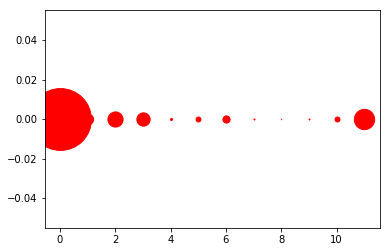

[((8, 0), 11), ((9, 0), 23), ((7, 0), 24), ((4, 0), 48), ((5, 0), 118), ((10, 0), 119), ((6, 0), 173), ((1, 0), 248), ((3, 0), 319), ((2, 0), 364), ((11, 0), 487), ((0, 0), 1484)]
860


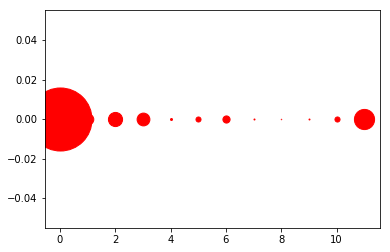

[((8, 0), 11), ((9, 0), 23), ((7, 0), 24), ((4, 0), 47), ((5, 0), 121), ((10, 0), 122), ((6, 0), 172), ((1, 0), 254), ((3, 0), 307), ((2, 0), 340), ((11, 0), 484), ((0, 0), 1513)]
861


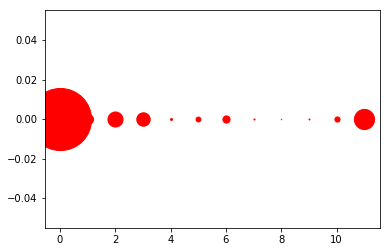

[((8, 0), 11), ((9, 0), 23), ((7, 0), 25), ((4, 0), 47), ((5, 0), 117), ((10, 0), 124), ((6, 0), 172), ((1, 0), 241), ((3, 0), 322), ((2, 0), 361), ((11, 0), 484), ((0, 0), 1491)]
862


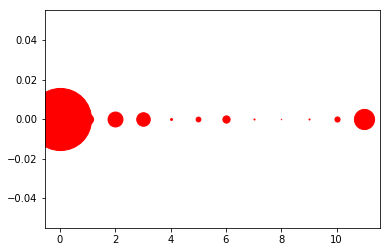

[((8, 0), 11), ((9, 0), 24), ((7, 0), 25), ((4, 0), 46), ((5, 0), 115), ((10, 0), 123), ((6, 0), 174), ((1, 0), 242), ((3, 0), 325), ((2, 0), 358), ((11, 0), 484), ((0, 0), 1491)]
863


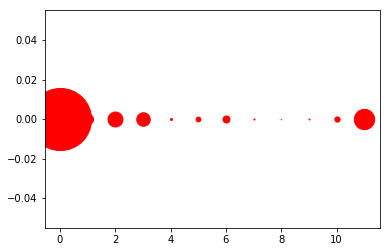

[((8, 0), 11), ((9, 0), 22), ((7, 0), 26), ((4, 0), 47), ((5, 0), 115), ((10, 0), 126), ((6, 0), 169), ((1, 0), 241), ((3, 0), 324), ((2, 0), 359), ((11, 0), 487), ((0, 0), 1491)]
864


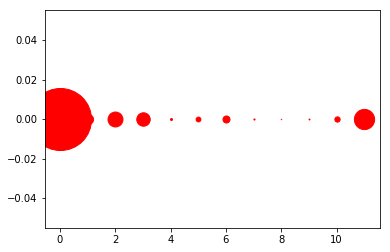

[((8, 0), 11), ((9, 0), 22), ((7, 0), 27), ((4, 0), 48), ((5, 0), 115), ((10, 0), 127), ((6, 0), 169), ((1, 0), 243), ((3, 0), 323), ((2, 0), 359), ((11, 0), 485), ((0, 0), 1489)]
865


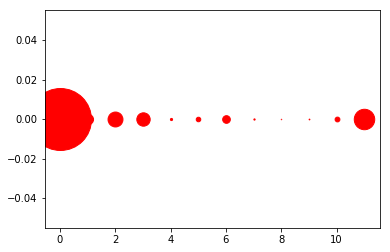

[((8, 0), 11), ((9, 0), 18), ((7, 0), 30), ((4, 0), 52), ((5, 0), 109), ((10, 0), 115), ((6, 0), 184), ((1, 0), 242), ((3, 0), 321), ((2, 0), 358), ((11, 0), 491), ((0, 0), 1487)]
866


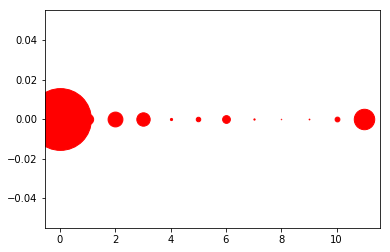

[((8, 0), 11), ((9, 0), 18), ((7, 0), 30), ((4, 0), 52), ((5, 0), 108), ((10, 0), 115), ((6, 0), 186), ((1, 0), 247), ((3, 0), 321), ((2, 0), 356), ((11, 0), 491), ((0, 0), 1483)]
867


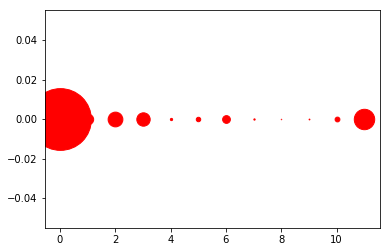

[((8, 0), 11), ((9, 0), 19), ((7, 0), 31), ((4, 0), 54), ((5, 0), 107), ((10, 0), 115), ((6, 0), 186), ((1, 0), 248), ((3, 0), 321), ((2, 0), 354), ((11, 0), 490), ((0, 0), 1482)]
868


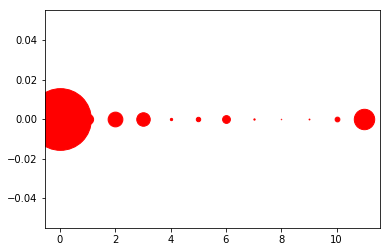

[((8, 0), 11), ((9, 0), 20), ((7, 0), 31), ((4, 0), 55), ((5, 0), 106), ((10, 0), 114), ((6, 0), 187), ((1, 0), 245), ((3, 0), 324), ((2, 0), 354), ((11, 0), 490), ((0, 0), 1481)]
869


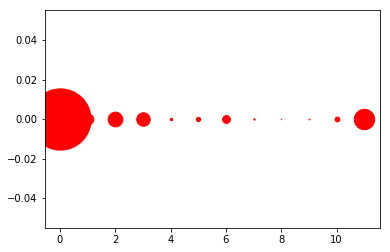

[((8, 0), 11), ((9, 0), 20), ((7, 0), 32), ((4, 0), 57), ((5, 0), 104), ((10, 0), 115), ((6, 0), 188), ((1, 0), 254), ((3, 0), 324), ((2, 0), 354), ((11, 0), 489), ((0, 0), 1470)]
870


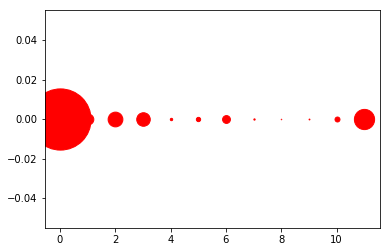

[((8, 0), 12), ((9, 0), 20), ((7, 0), 31), ((4, 0), 57), ((5, 0), 103), ((10, 0), 119), ((6, 0), 188), ((1, 0), 255), ((3, 0), 325), ((2, 0), 354), ((11, 0), 485), ((0, 0), 1469)]
871


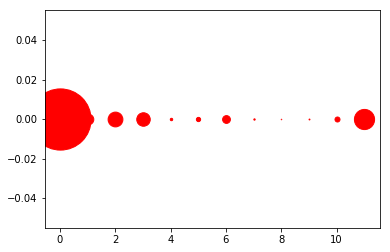

[((8, 0), 12), ((9, 0), 21), ((7, 0), 32), ((4, 0), 58), ((5, 0), 102), ((10, 0), 120), ((6, 0), 187), ((1, 0), 254), ((3, 0), 324), ((2, 0), 355), ((11, 0), 484), ((0, 0), 1469)]
872


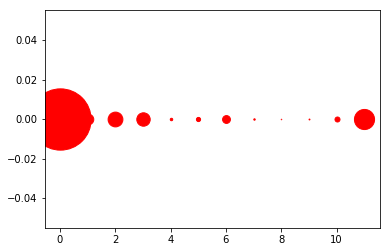

[((8, 0), 12), ((9, 0), 21), ((7, 0), 34), ((4, 0), 59), ((5, 0), 100), ((10, 0), 120), ((6, 0), 188), ((1, 0), 253), ((3, 0), 322), ((2, 0), 355), ((11, 0), 483), ((0, 0), 1471)]
873


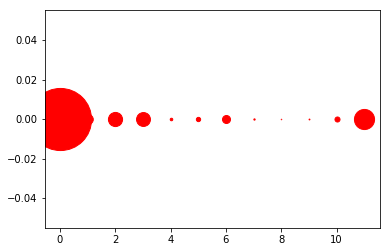

[((8, 0), 12), ((9, 0), 20), ((7, 0), 31), ((4, 0), 61), ((5, 0), 103), ((10, 0), 121), ((6, 0), 192), ((1, 0), 230), ((3, 0), 334), ((2, 0), 340), ((11, 0), 483), ((0, 0), 1491)]
874


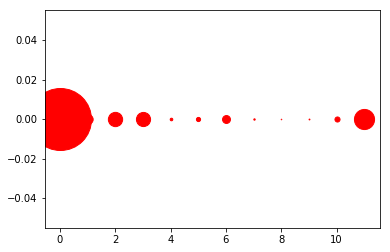

[((8, 0), 13), ((9, 0), 20), ((7, 0), 33), ((4, 0), 62), ((5, 0), 100), ((10, 0), 122), ((6, 0), 190), ((1, 0), 224), ((3, 0), 340), ((2, 0), 343), ((11, 0), 483), ((0, 0), 1488)]
875


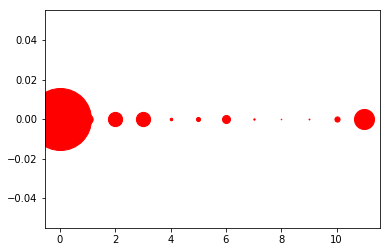

[((8, 0), 13), ((9, 0), 20), ((7, 0), 33), ((4, 0), 61), ((5, 0), 98), ((10, 0), 124), ((6, 0), 192), ((1, 0), 224), ((3, 0), 342), ((2, 0), 342), ((11, 0), 481), ((0, 0), 1488)]
876


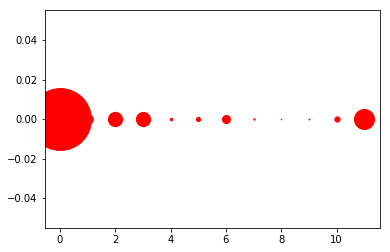

[((8, 0), 13), ((9, 0), 20), ((7, 0), 33), ((4, 0), 62), ((5, 0), 98), ((10, 0), 125), ((6, 0), 192), ((1, 0), 227), ((3, 0), 341), ((2, 0), 342), ((11, 0), 480), ((0, 0), 1485)]
877


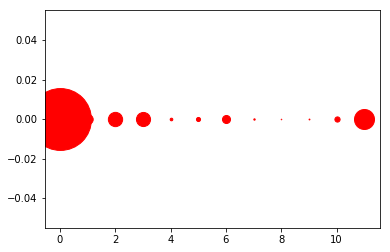

[((8, 0), 13), ((9, 0), 20), ((7, 0), 33), ((4, 0), 63), ((5, 0), 98), ((10, 0), 125), ((6, 0), 193), ((1, 0), 226), ((3, 0), 339), ((2, 0), 343), ((11, 0), 480), ((0, 0), 1485)]
878


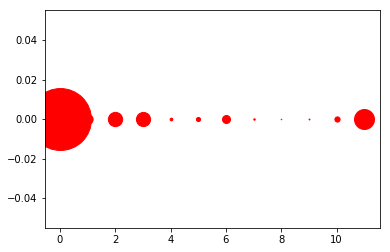

[((8, 0), 13), ((9, 0), 21), ((7, 0), 34), ((4, 0), 64), ((5, 0), 98), ((10, 0), 125), ((6, 0), 192), ((1, 0), 223), ((3, 0), 340), ((2, 0), 343), ((11, 0), 479), ((0, 0), 1486)]
879


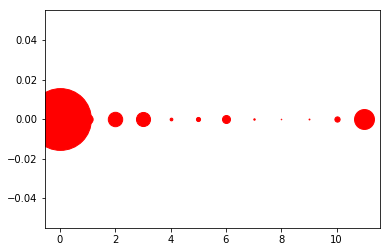

[((8, 0), 13), ((9, 0), 21), ((7, 0), 34), ((4, 0), 65), ((5, 0), 99), ((10, 0), 126), ((6, 0), 192), ((1, 0), 223), ((3, 0), 338), ((2, 0), 346), ((11, 0), 478), ((0, 0), 1483)]
880


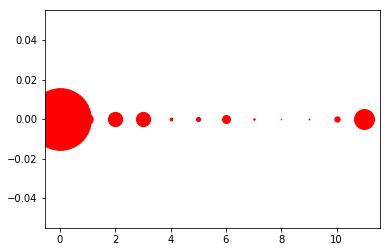

[((8, 0), 13), ((9, 0), 21), ((7, 0), 35), ((4, 0), 67), ((5, 0), 99), ((10, 0), 127), ((6, 0), 191), ((1, 0), 226), ((3, 0), 341), ((2, 0), 341), ((11, 0), 477), ((0, 0), 1480)]
881


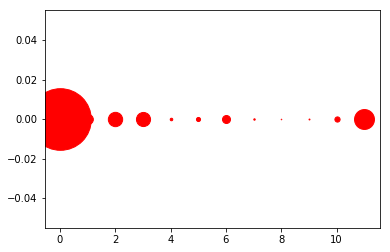

[((8, 0), 13), ((9, 0), 22), ((7, 0), 34), ((4, 0), 61), ((5, 0), 98), ((10, 0), 125), ((6, 0), 192), ((1, 0), 233), ((3, 0), 339), ((2, 0), 344), ((11, 0), 478), ((0, 0), 1479)]
882


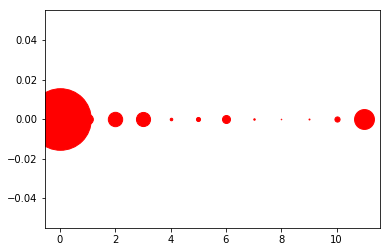

[((8, 0), 13), ((9, 0), 23), ((7, 0), 35), ((4, 0), 61), ((5, 0), 98), ((10, 0), 124), ((6, 0), 192), ((1, 0), 233), ((3, 0), 339), ((2, 0), 345), ((11, 0), 477), ((0, 0), 1478)]
883


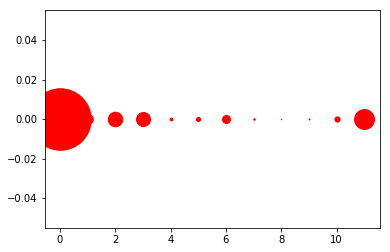

[((8, 0), 13), ((9, 0), 23), ((7, 0), 36), ((4, 0), 65), ((5, 0), 99), ((10, 0), 125), ((6, 0), 191), ((1, 0), 229), ((3, 0), 336), ((2, 0), 349), ((11, 0), 476), ((0, 0), 1476)]
884


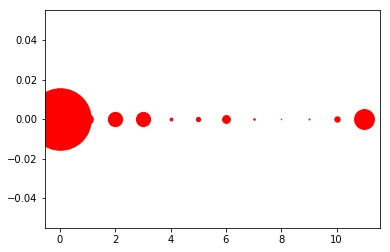

[((8, 0), 13), ((9, 0), 23), ((7, 0), 37), ((4, 0), 67), ((5, 0), 100), ((10, 0), 128), ((6, 0), 187), ((1, 0), 229), ((3, 0), 340), ((2, 0), 342), ((11, 0), 476), ((0, 0), 1476)]
885


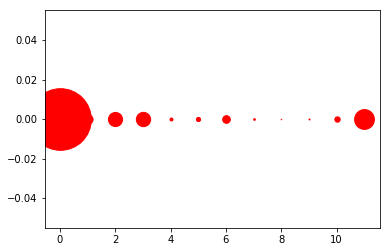

[((8, 0), 13), ((9, 0), 23), ((7, 0), 40), ((4, 0), 71), ((5, 0), 100), ((10, 0), 129), ((6, 0), 184), ((1, 0), 220), ((2, 0), 340), ((3, 0), 344), ((11, 0), 475), ((0, 0), 1479)]
886


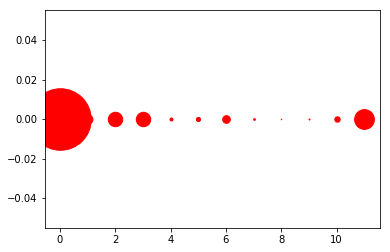

[((8, 0), 13), ((9, 0), 23), ((7, 0), 41), ((4, 0), 71), ((5, 0), 99), ((10, 0), 130), ((6, 0), 184), ((1, 0), 214), ((3, 0), 346), ((2, 0), 347), ((11, 0), 474), ((0, 0), 1476)]
887


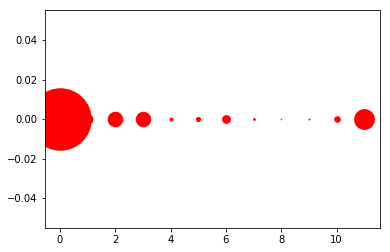

[((8, 0), 13), ((9, 0), 23), ((7, 0), 41), ((4, 0), 70), ((5, 0), 98), ((10, 0), 130), ((6, 0), 186), ((1, 0), 214), ((3, 0), 346), ((2, 0), 349), ((11, 0), 474), ((0, 0), 1474)]
888


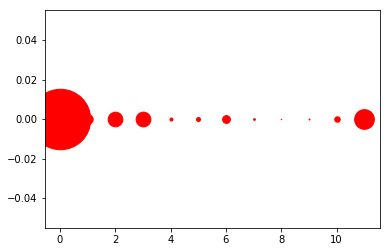

[((8, 0), 13), ((9, 0), 23), ((7, 0), 42), ((4, 0), 72), ((5, 0), 95), ((10, 0), 131), ((6, 0), 187), ((1, 0), 224), ((2, 0), 352), ((3, 0), 354), ((11, 0), 473), ((0, 0), 1452)]
889


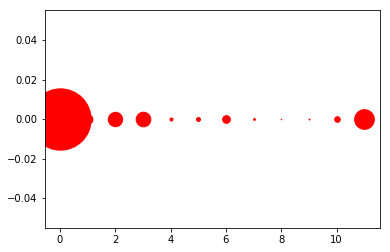

[((8, 0), 13), ((9, 0), 23), ((7, 0), 43), ((4, 0), 73), ((5, 0), 94), ((10, 0), 134), ((6, 0), 185), ((1, 0), 214), ((2, 0), 345), ((3, 0), 351), ((11, 0), 472), ((0, 0), 1471)]
890


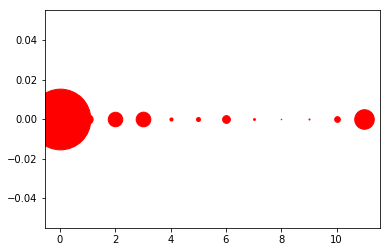

[((8, 0), 13), ((9, 0), 24), ((7, 0), 43), ((4, 0), 74), ((5, 0), 94), ((10, 0), 136), ((6, 0), 186), ((1, 0), 222), ((2, 0), 348), ((3, 0), 352), ((11, 0), 469), ((0, 0), 1457)]
891


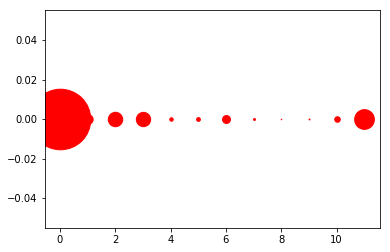

[((8, 0), 13), ((9, 0), 21), ((7, 0), 46), ((4, 0), 83), ((5, 0), 90), ((10, 0), 133), ((6, 0), 190), ((1, 0), 224), ((3, 0), 344), ((2, 0), 347), ((11, 0), 473), ((0, 0), 1454)]
892


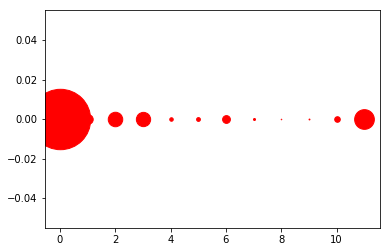

[((8, 0), 13), ((9, 0), 21), ((7, 0), 48), ((4, 0), 84), ((5, 0), 91), ((10, 0), 134), ((6, 0), 187), ((1, 0), 226), ((3, 0), 343), ((2, 0), 348), ((11, 0), 473), ((0, 0), 1450)]
893


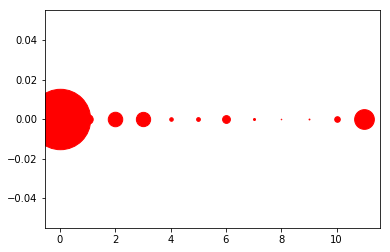

[((8, 0), 13), ((9, 0), 21), ((7, 0), 48), ((4, 0), 85), ((5, 0), 90), ((10, 0), 134), ((6, 0), 187), ((1, 0), 226), ((3, 0), 343), ((2, 0), 348), ((11, 0), 473), ((0, 0), 1450)]
894


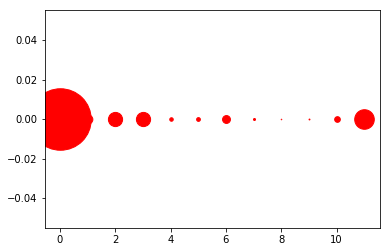

[((8, 0), 13), ((9, 0), 21), ((7, 0), 48), ((4, 0), 84), ((5, 0), 90), ((10, 0), 136), ((6, 0), 189), ((1, 0), 209), ((3, 0), 341), ((2, 0), 341), ((11, 0), 470), ((0, 0), 1476)]
895


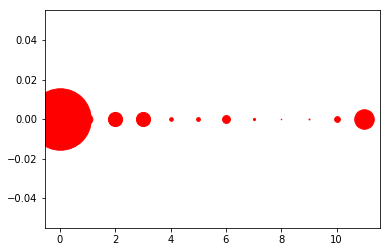

[((8, 0), 13), ((9, 0), 22), ((7, 0), 50), ((4, 0), 86), ((5, 0), 90), ((10, 0), 137), ((6, 0), 188), ((1, 0), 210), ((3, 0), 339), ((2, 0), 340), ((11, 0), 468), ((0, 0), 1475)]
896


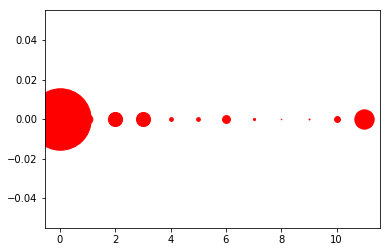

[((8, 0), 13), ((9, 0), 23), ((7, 0), 50), ((4, 0), 89), ((5, 0), 89), ((10, 0), 140), ((6, 0), 189), ((1, 0), 210), ((3, 0), 337), ((2, 0), 339), ((11, 0), 464), ((0, 0), 1475)]
897


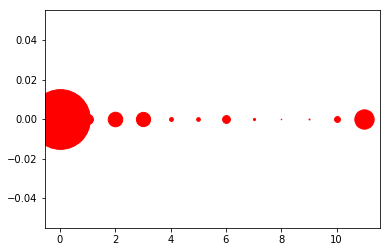

[((8, 0), 13), ((9, 0), 23), ((7, 0), 50), ((5, 0), 88), ((4, 0), 92), ((10, 0), 141), ((6, 0), 187), ((1, 0), 235), ((3, 0), 342), ((2, 0), 349), ((11, 0), 464), ((0, 0), 1434)]
898


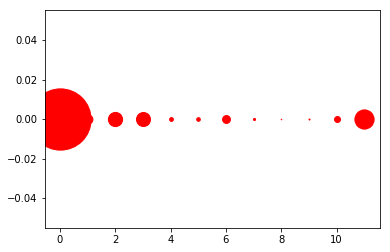

[((8, 0), 13), ((9, 0), 24), ((7, 0), 50), ((5, 0), 87), ((4, 0), 91), ((10, 0), 143), ((6, 0), 189), ((1, 0), 213), ((3, 0), 336), ((2, 0), 341), ((11, 0), 461), ((0, 0), 1470)]
899


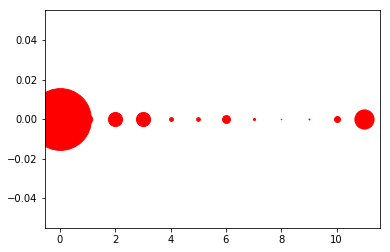

[((8, 0), 13), ((9, 0), 24), ((7, 0), 50), ((5, 0), 88), ((4, 0), 91), ((10, 0), 143), ((6, 0), 189), ((1, 0), 202), ((2, 0), 337), ((3, 0), 338), ((11, 0), 461), ((0, 0), 1482)]
900


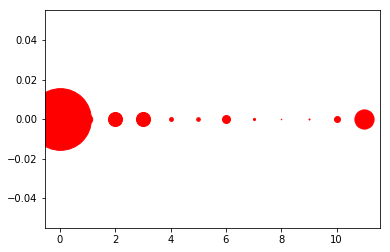

[((8, 0), 13), ((9, 0), 24), ((7, 0), 50), ((5, 0), 86), ((4, 0), 91), ((10, 0), 143), ((6, 0), 191), ((1, 0), 203), ((2, 0), 337), ((3, 0), 338), ((11, 0), 461), ((0, 0), 1481)]
901


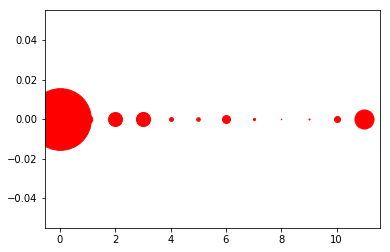

[((8, 0), 13), ((9, 0), 25), ((7, 0), 51), ((5, 0), 86), ((4, 0), 93), ((10, 0), 144), ((6, 0), 191), ((1, 0), 203), ((2, 0), 335), ((3, 0), 339), ((11, 0), 458), ((0, 0), 1480)]
902


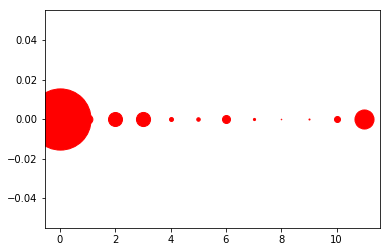

[((8, 0), 13), ((9, 0), 25), ((7, 0), 52), ((5, 0), 84), ((4, 0), 95), ((10, 0), 144), ((6, 0), 192), ((1, 0), 211), ((2, 0), 336), ((3, 0), 339), ((11, 0), 458), ((0, 0), 1469)]
903


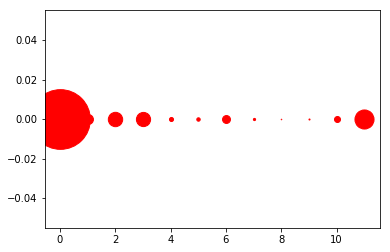

[((8, 0), 13), ((9, 0), 25), ((7, 0), 53), ((5, 0), 82), ((4, 0), 97), ((10, 0), 144), ((6, 0), 190), ((1, 0), 237), ((3, 0), 341), ((2, 0), 345), ((11, 0), 458), ((0, 0), 1433)]
904


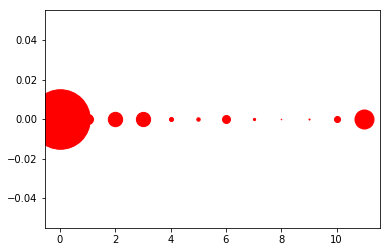

[((8, 0), 13), ((9, 0), 25), ((7, 0), 53), ((5, 0), 82), ((4, 0), 97), ((10, 0), 145), ((6, 0), 191), ((1, 0), 239), ((3, 0), 342), ((2, 0), 345), ((11, 0), 457), ((0, 0), 1429)]
905


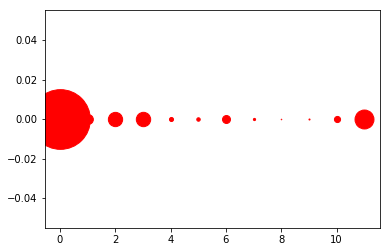

[((8, 0), 13), ((9, 0), 25), ((7, 0), 53), ((5, 0), 83), ((4, 0), 97), ((10, 0), 147), ((6, 0), 191), ((1, 0), 233), ((2, 0), 343), ((3, 0), 345), ((11, 0), 455), ((0, 0), 1433)]
906


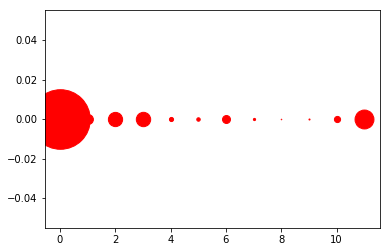

[((8, 0), 13), ((9, 0), 25), ((7, 0), 53), ((5, 0), 83), ((4, 0), 99), ((10, 0), 148), ((6, 0), 191), ((1, 0), 235), ((2, 0), 342), ((3, 0), 345), ((11, 0), 454), ((0, 0), 1430)]
907


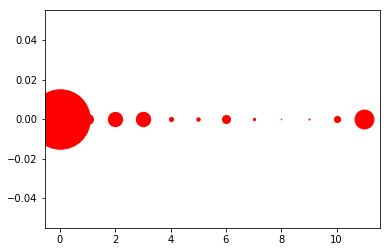

[((8, 0), 13), ((9, 0), 25), ((7, 0), 53), ((5, 0), 82), ((4, 0), 99), ((10, 0), 148), ((6, 0), 192), ((1, 0), 238), ((2, 0), 342), ((3, 0), 345), ((11, 0), 454), ((0, 0), 1427)]
908


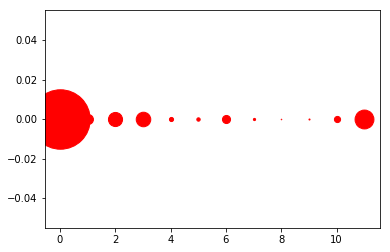

[((8, 0), 13), ((9, 0), 25), ((7, 0), 53), ((5, 0), 81), ((4, 0), 99), ((10, 0), 148), ((6, 0), 194), ((1, 0), 237), ((2, 0), 339), ((3, 0), 349), ((11, 0), 453), ((0, 0), 1427)]
909


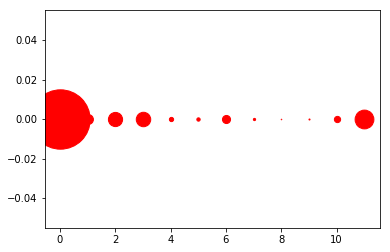

[((8, 0), 13), ((9, 0), 25), ((7, 0), 54), ((5, 0), 80), ((4, 0), 102), ((10, 0), 150), ((6, 0), 194), ((1, 0), 236), ((2, 0), 341), ((3, 0), 347), ((11, 0), 451), ((0, 0), 1425)]
910


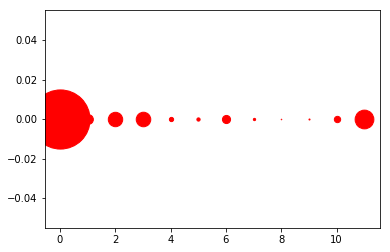

[((8, 0), 13), ((9, 0), 25), ((7, 0), 55), ((5, 0), 78), ((4, 0), 102), ((10, 0), 152), ((6, 0), 195), ((1, 0), 233), ((2, 0), 346), ((3, 0), 349), ((11, 0), 450), ((0, 0), 1420)]
911


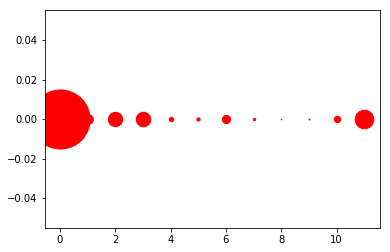

[((8, 0), 13), ((9, 0), 25), ((7, 0), 56), ((5, 0), 77), ((4, 0), 105), ((10, 0), 153), ((6, 0), 196), ((1, 0), 233), ((2, 0), 344), ((3, 0), 349), ((11, 0), 448), ((0, 0), 1419)]
912


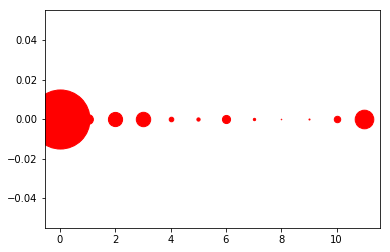

[((8, 0), 13), ((9, 0), 25), ((7, 0), 56), ((5, 0), 78), ((4, 0), 110), ((10, 0), 155), ((6, 0), 195), ((1, 0), 234), ((2, 0), 341), ((3, 0), 346), ((11, 0), 447), ((0, 0), 1418)]
913


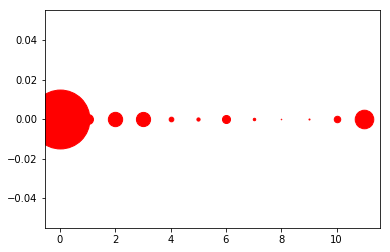

[((8, 0), 13), ((9, 0), 25), ((7, 0), 59), ((5, 0), 77), ((4, 0), 112), ((10, 0), 156), ((6, 0), 193), ((1, 0), 238), ((3, 0), 341), ((2, 0), 344), ((11, 0), 446), ((0, 0), 1414)]
914


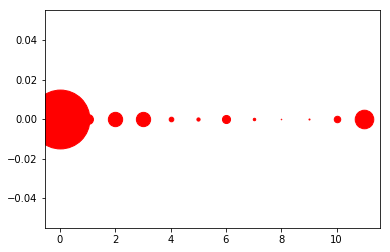

[((8, 0), 13), ((9, 0), 25), ((7, 0), 59), ((5, 0), 77), ((4, 0), 111), ((10, 0), 156), ((6, 0), 194), ((1, 0), 237), ((3, 0), 343), ((2, 0), 344), ((11, 0), 446), ((0, 0), 1413)]
915


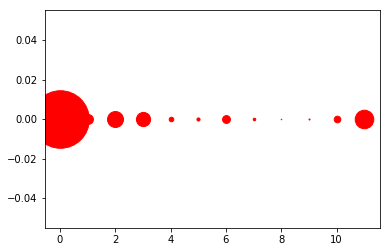

[((8, 0), 13), ((9, 0), 25), ((7, 0), 61), ((5, 0), 75), ((4, 0), 110), ((10, 0), 159), ((6, 0), 189), ((1, 0), 236), ((3, 0), 340), ((2, 0), 383), ((11, 0), 446), ((0, 0), 1381)]
916


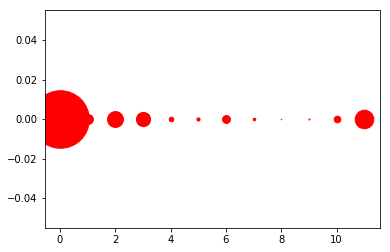

[((8, 0), 13), ((9, 0), 25), ((7, 0), 61), ((5, 0), 76), ((4, 0), 110), ((10, 0), 159), ((6, 0), 189), ((1, 0), 235), ((3, 0), 341), ((2, 0), 381), ((11, 0), 446), ((0, 0), 1382)]
917


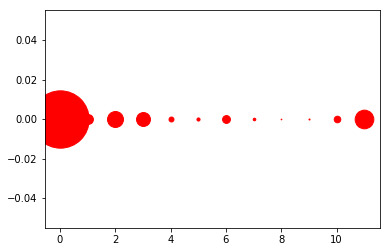

[((8, 0), 16), ((9, 0), 25), ((7, 0), 62), ((5, 0), 75), ((4, 0), 118), ((10, 0), 158), ((6, 0), 188), ((1, 0), 235), ((3, 0), 334), ((2, 0), 383), ((11, 0), 448), ((0, 0), 1376)]
918


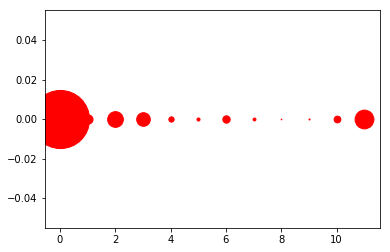

[((8, 0), 16), ((9, 0), 25), ((7, 0), 69), ((5, 0), 74), ((4, 0), 127), ((10, 0), 162), ((6, 0), 177), ((1, 0), 218), ((3, 0), 327), ((2, 0), 377), ((11, 0), 451), ((0, 0), 1395)]
919


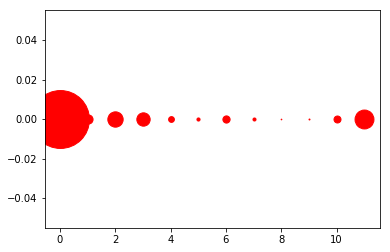

[((8, 0), 16), ((9, 0), 23), ((7, 0), 73), ((5, 0), 75), ((4, 0), 139), ((10, 0), 168), ((6, 0), 173), ((1, 0), 219), ((3, 0), 320), ((2, 0), 368), ((11, 0), 454), ((0, 0), 1390)]
920


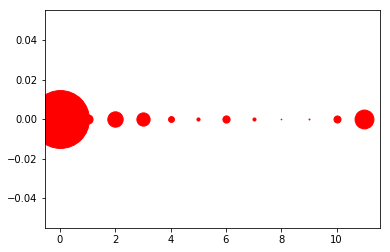

[((8, 0), 16), ((9, 0), 23), ((7, 0), 73), ((5, 0), 75), ((4, 0), 141), ((10, 0), 169), ((6, 0), 173), ((1, 0), 219), ((3, 0), 318), ((2, 0), 369), ((11, 0), 453), ((0, 0), 1389)]
921


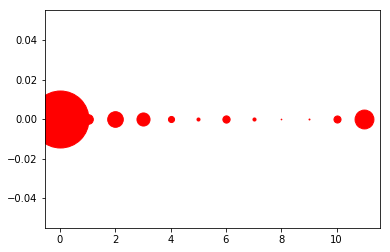

[((8, 0), 16), ((9, 0), 23), ((5, 0), 73), ((7, 0), 74), ((4, 0), 146), ((10, 0), 170), ((6, 0), 174), ((1, 0), 232), ((3, 0), 314), ((2, 0), 375), ((11, 0), 453), ((0, 0), 1368)]
922


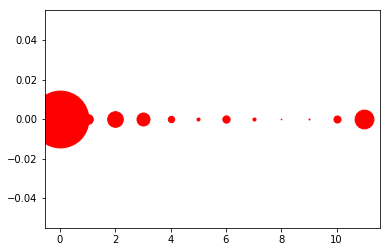

[((8, 0), 16), ((9, 0), 24), ((5, 0), 72), ((7, 0), 74), ((4, 0), 153), ((10, 0), 170), ((6, 0), 175), ((1, 0), 231), ((3, 0), 312), ((2, 0), 375), ((11, 0), 452), ((0, 0), 1364)]
923


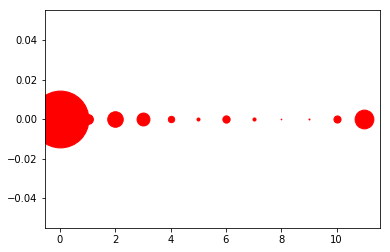

[((8, 0), 16), ((9, 0), 24), ((5, 0), 72), ((7, 0), 74), ((4, 0), 153), ((10, 0), 171), ((6, 0), 175), ((1, 0), 235), ((3, 0), 310), ((2, 0), 373), ((11, 0), 451), ((0, 0), 1364)]
924


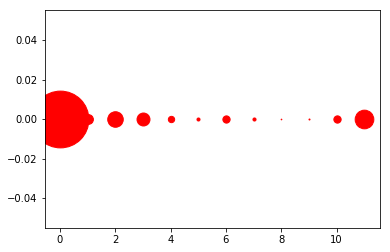

[((8, 0), 16), ((9, 0), 24), ((5, 0), 73), ((7, 0), 74), ((4, 0), 152), ((6, 0), 174), ((10, 0), 175), ((1, 0), 235), ((3, 0), 311), ((2, 0), 373), ((11, 0), 448), ((0, 0), 1363)]
925


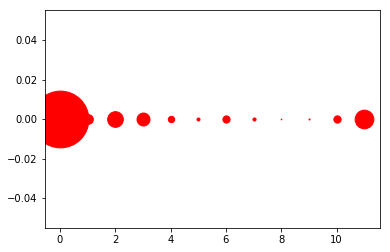

[((8, 0), 16), ((9, 0), 24), ((5, 0), 72), ((7, 0), 75), ((4, 0), 153), ((6, 0), 173), ((10, 0), 175), ((1, 0), 232), ((3, 0), 311), ((2, 0), 376), ((11, 0), 449), ((0, 0), 1362)]
926


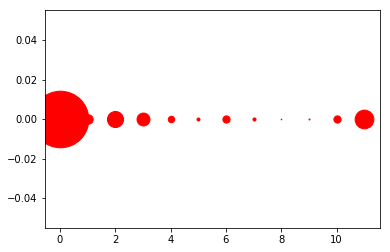

[((8, 0), 16), ((9, 0), 24), ((5, 0), 72), ((7, 0), 75), ((4, 0), 155), ((6, 0), 173), ((10, 0), 174), ((1, 0), 225), ((3, 0), 310), ((2, 0), 386), ((11, 0), 450), ((0, 0), 1358)]
927


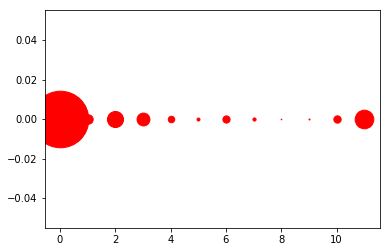

[((8, 0), 16), ((9, 0), 24), ((5, 0), 71), ((7, 0), 76), ((4, 0), 156), ((6, 0), 173), ((10, 0), 176), ((1, 0), 225), ((3, 0), 309), ((2, 0), 386), ((11, 0), 448), ((0, 0), 1358)]
928


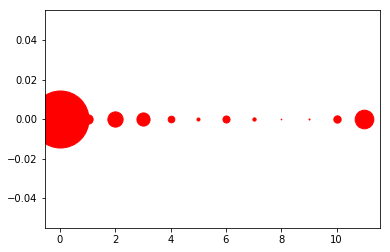

[((8, 0), 16), ((9, 0), 24), ((5, 0), 72), ((7, 0), 79), ((4, 0), 159), ((6, 0), 170), ((10, 0), 176), ((1, 0), 223), ((3, 0), 316), ((2, 0), 366), ((11, 0), 448), ((0, 0), 1369)]
929


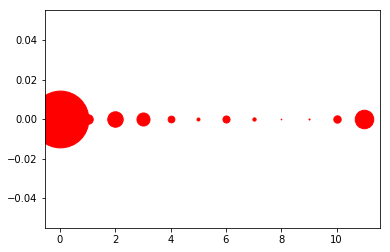

[((8, 0), 16), ((9, 0), 25), ((5, 0), 71), ((7, 0), 79), ((4, 0), 161), ((6, 0), 170), ((10, 0), 177), ((1, 0), 227), ((3, 0), 313), ((2, 0), 371), ((11, 0), 445), ((0, 0), 1363)]
930


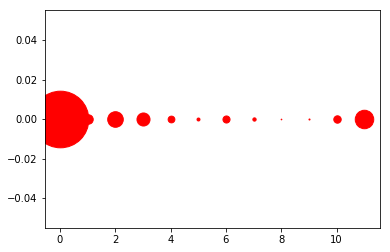

[((8, 0), 16), ((9, 0), 25), ((5, 0), 71), ((7, 0), 79), ((4, 0), 162), ((6, 0), 170), ((10, 0), 178), ((1, 0), 227), ((3, 0), 313), ((2, 0), 374), ((11, 0), 444), ((0, 0), 1359)]
931


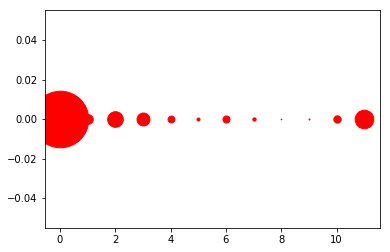

[((8, 0), 16), ((9, 0), 24), ((5, 0), 72), ((7, 0), 80), ((4, 0), 163), ((6, 0), 169), ((10, 0), 176), ((1, 0), 228), ((3, 0), 310), ((2, 0), 375), ((11, 0), 447), ((0, 0), 1358)]
932


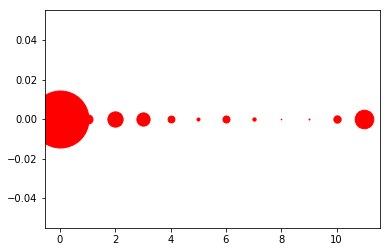

[((8, 0), 16), ((9, 0), 24), ((5, 0), 72), ((7, 0), 80), ((4, 0), 165), ((6, 0), 169), ((10, 0), 176), ((1, 0), 216), ((3, 0), 318), ((2, 0), 367), ((11, 0), 447), ((0, 0), 1368)]
933


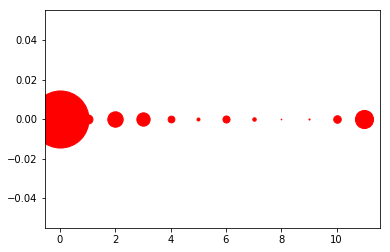

[((8, 0), 16), ((9, 0), 26), ((5, 0), 71), ((7, 0), 83), ((4, 0), 162), ((6, 0), 170), ((10, 0), 181), ((1, 0), 214), ((3, 0), 320), ((2, 0), 370), ((11, 0), 435), ((0, 0), 1370)]
934


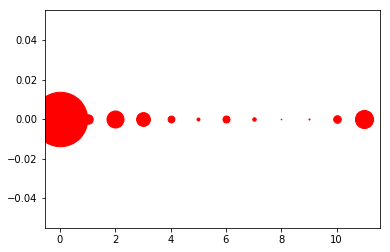

[((8, 0), 16), ((9, 0), 26), ((5, 0), 71), ((7, 0), 83), ((4, 0), 164), ((6, 0), 168), ((10, 0), 182), ((1, 0), 226), ((3, 0), 331), ((2, 0), 409), ((11, 0), 434), ((0, 0), 1308)]
935


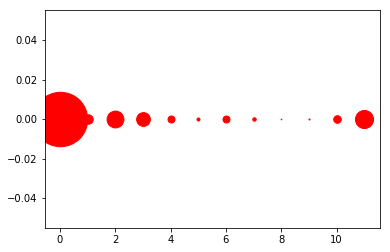

[((8, 0), 16), ((9, 0), 26), ((5, 0), 72), ((7, 0), 83), ((4, 0), 168), ((6, 0), 168), ((10, 0), 182), ((1, 0), 227), ((3, 0), 330), ((2, 0), 405), ((11, 0), 434), ((0, 0), 1307)]
936


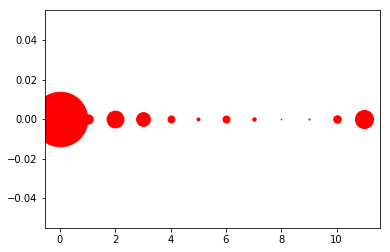

[((8, 0), 16), ((9, 0), 27), ((5, 0), 72), ((7, 0), 83), ((4, 0), 168), ((6, 0), 168), ((10, 0), 181), ((1, 0), 224), ((3, 0), 331), ((2, 0), 404), ((11, 0), 434), ((0, 0), 1310)]
937


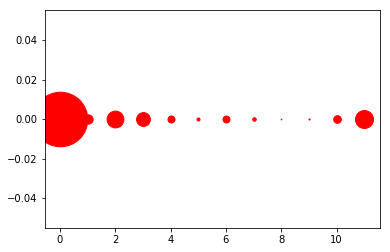

[((8, 0), 16), ((9, 0), 27), ((5, 0), 72), ((7, 0), 84), ((6, 0), 167), ((4, 0), 169), ((10, 0), 183), ((1, 0), 223), ((3, 0), 331), ((2, 0), 404), ((11, 0), 432), ((0, 0), 1310)]
938


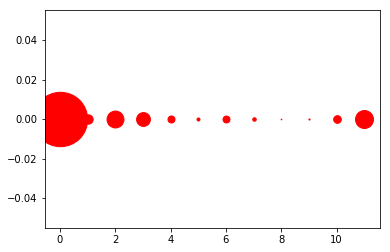

[((8, 0), 16), ((9, 0), 27), ((5, 0), 72), ((7, 0), 84), ((6, 0), 167), ((4, 0), 169), ((10, 0), 184), ((1, 0), 224), ((3, 0), 332), ((2, 0), 406), ((11, 0), 431), ((0, 0), 1306)]
939


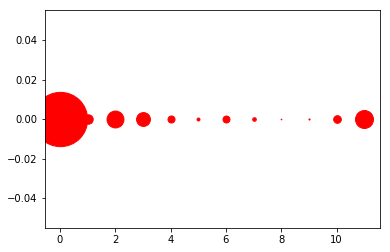

[((8, 0), 16), ((9, 0), 27), ((5, 0), 70), ((7, 0), 86), ((6, 0), 167), ((4, 0), 169), ((10, 0), 184), ((1, 0), 226), ((3, 0), 332), ((2, 0), 406), ((11, 0), 431), ((0, 0), 1304)]
940


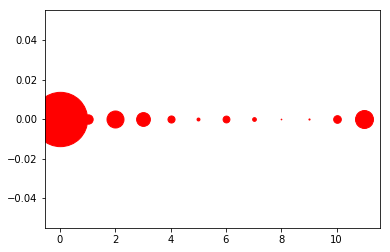

[((8, 0), 16), ((9, 0), 27), ((5, 0), 70), ((7, 0), 89), ((6, 0), 164), ((4, 0), 170), ((10, 0), 184), ((1, 0), 224), ((3, 0), 331), ((2, 0), 408), ((11, 0), 431), ((0, 0), 1304)]
941


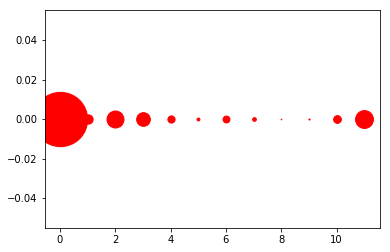

[((8, 0), 16), ((9, 0), 27), ((5, 0), 69), ((7, 0), 89), ((6, 0), 165), ((4, 0), 173), ((10, 0), 186), ((1, 0), 223), ((3, 0), 329), ((2, 0), 408), ((11, 0), 429), ((0, 0), 1304)]
942


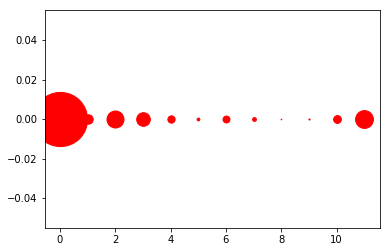

[((8, 0), 16), ((9, 0), 27), ((5, 0), 66), ((7, 0), 91), ((6, 0), 166), ((4, 0), 175), ((10, 0), 187), ((1, 0), 226), ((3, 0), 327), ((2, 0), 408), ((11, 0), 428), ((0, 0), 1301)]
943


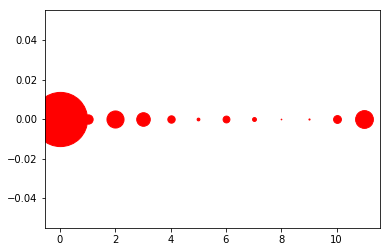

[((8, 0), 16), ((9, 0), 27), ((5, 0), 66), ((7, 0), 93), ((6, 0), 164), ((4, 0), 177), ((10, 0), 188), ((1, 0), 223), ((3, 0), 326), ((2, 0), 410), ((11, 0), 427), ((0, 0), 1301)]
944


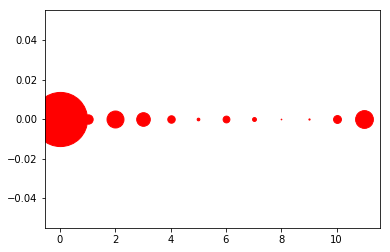

[((8, 0), 16), ((9, 0), 29), ((5, 0), 64), ((7, 0), 93), ((6, 0), 163), ((4, 0), 179), ((10, 0), 189), ((1, 0), 224), ((3, 0), 327), ((2, 0), 407), ((11, 0), 427), ((0, 0), 1300)]
945


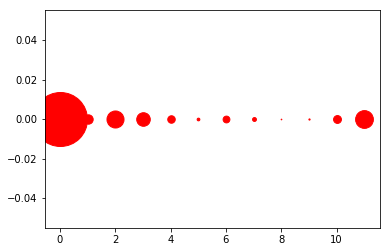

[((8, 0), 16), ((9, 0), 29), ((5, 0), 65), ((7, 0), 93), ((6, 0), 163), ((4, 0), 180), ((10, 0), 189), ((1, 0), 225), ((3, 0), 326), ((2, 0), 409), ((11, 0), 427), ((0, 0), 1296)]
946


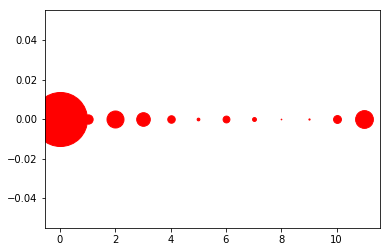

[((8, 0), 16), ((9, 0), 29), ((5, 0), 65), ((7, 0), 93), ((6, 0), 164), ((4, 0), 180), ((10, 0), 189), ((1, 0), 223), ((3, 0), 327), ((2, 0), 408), ((11, 0), 427), ((0, 0), 1297)]
947


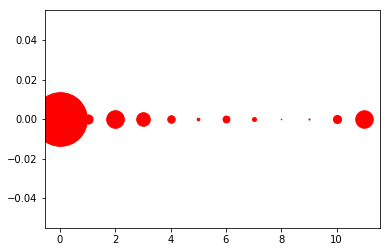

[((8, 0), 16), ((9, 0), 28), ((5, 0), 63), ((7, 0), 94), ((6, 0), 165), ((4, 0), 180), ((10, 0), 194), ((1, 0), 221), ((3, 0), 326), ((11, 0), 420), ((2, 0), 423), ((0, 0), 1288)]
948


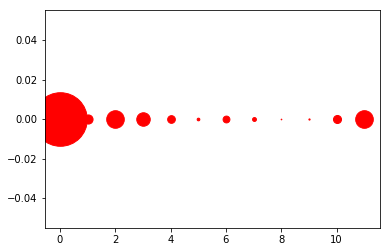

[((8, 0), 16), ((9, 0), 29), ((5, 0), 64), ((7, 0), 93), ((6, 0), 164), ((4, 0), 185), ((10, 0), 193), ((1, 0), 219), ((3, 0), 324), ((2, 0), 422), ((11, 0), 423), ((0, 0), 1286)]
949


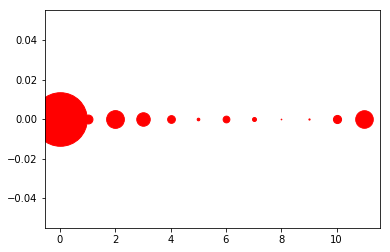

[((8, 0), 16), ((9, 0), 29), ((5, 0), 63), ((7, 0), 95), ((6, 0), 162), ((4, 0), 186), ((10, 0), 195), ((1, 0), 214), ((3, 0), 324), ((11, 0), 422), ((2, 0), 426), ((0, 0), 1286)]
950


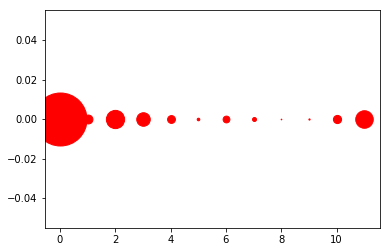

[((8, 0), 16), ((9, 0), 29), ((5, 0), 62), ((7, 0), 95), ((6, 0), 163), ((4, 0), 188), ((10, 0), 196), ((1, 0), 213), ((3, 0), 325), ((11, 0), 421), ((2, 0), 438), ((0, 0), 1272)]
951


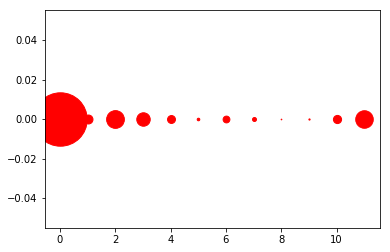

[((8, 0), 16), ((9, 0), 29), ((5, 0), 62), ((7, 0), 95), ((6, 0), 163), ((4, 0), 190), ((10, 0), 196), ((1, 0), 215), ((3, 0), 323), ((11, 0), 421), ((2, 0), 426), ((0, 0), 1282)]
952


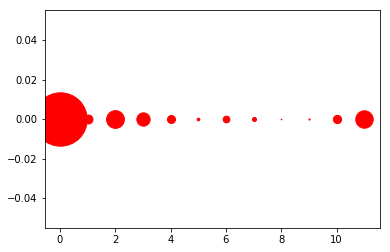

[((8, 0), 16), ((9, 0), 29), ((5, 0), 64), ((7, 0), 97), ((6, 0), 161), ((4, 0), 192), ((10, 0), 198), ((1, 0), 215), ((3, 0), 320), ((11, 0), 419), ((2, 0), 426), ((0, 0), 1281)]
953


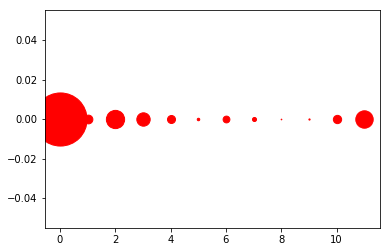

[((8, 0), 16), ((9, 0), 29), ((5, 0), 60), ((7, 0), 97), ((6, 0), 163), ((4, 0), 192), ((10, 0), 199), ((1, 0), 210), ((3, 0), 321), ((11, 0), 418), ((2, 0), 438), ((0, 0), 1275)]
954


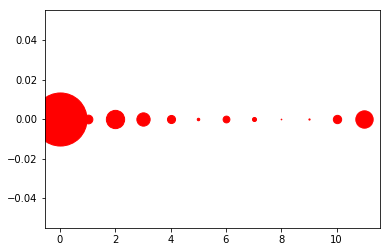

[((8, 0), 16), ((9, 0), 29), ((5, 0), 60), ((7, 0), 97), ((6, 0), 163), ((4, 0), 194), ((10, 0), 200), ((1, 0), 210), ((3, 0), 319), ((11, 0), 417), ((2, 0), 439), ((0, 0), 1274)]
955


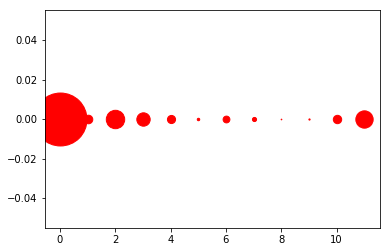

[((8, 0), 16), ((9, 0), 29), ((5, 0), 59), ((7, 0), 99), ((6, 0), 163), ((4, 0), 195), ((10, 0), 201), ((1, 0), 206), ((3, 0), 321), ((11, 0), 416), ((2, 0), 442), ((0, 0), 1271)]
956


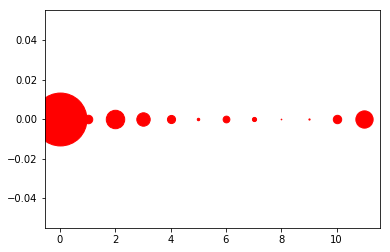

[((8, 0), 16), ((9, 0), 29), ((5, 0), 59), ((7, 0), 100), ((6, 0), 162), ((4, 0), 195), ((10, 0), 202), ((1, 0), 205), ((3, 0), 322), ((11, 0), 415), ((2, 0), 443), ((0, 0), 1270)]
957


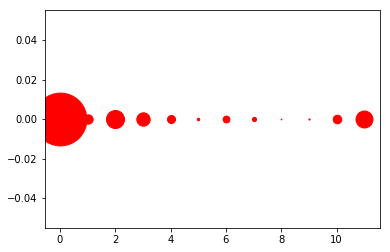

[((8, 0), 17), ((9, 0), 29), ((5, 0), 59), ((7, 0), 99), ((6, 0), 163), ((4, 0), 193), ((10, 0), 206), ((1, 0), 223), ((3, 0), 321), ((11, 0), 408), ((2, 0), 433), ((0, 0), 1267)]
958


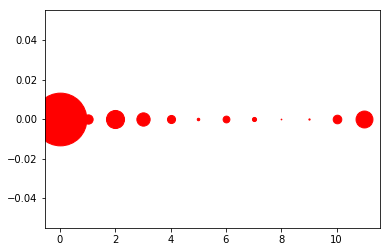

[((8, 0), 17), ((9, 0), 30), ((5, 0), 60), ((7, 0), 99), ((6, 0), 163), ((4, 0), 194), ((10, 0), 207), ((1, 0), 223), ((3, 0), 319), ((11, 0), 406), ((2, 0), 434), ((0, 0), 1266)]
959


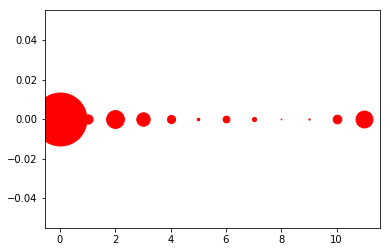

[((8, 0), 17), ((9, 0), 30), ((5, 0), 61), ((7, 0), 100), ((6, 0), 163), ((4, 0), 194), ((10, 0), 208), ((1, 0), 220), ((3, 0), 322), ((11, 0), 405), ((2, 0), 427), ((0, 0), 1271)]
960


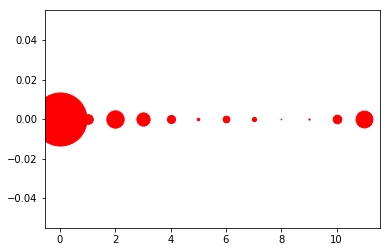

[((8, 0), 17), ((9, 0), 30), ((5, 0), 61), ((7, 0), 101), ((6, 0), 162), ((4, 0), 195), ((10, 0), 208), ((1, 0), 231), ((3, 0), 318), ((11, 0), 405), ((2, 0), 416), ((0, 0), 1274)]
961


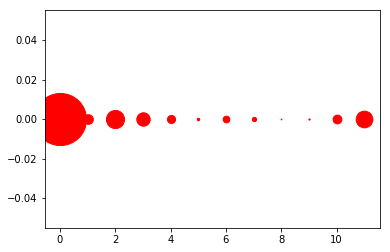

[((8, 0), 17), ((9, 0), 30), ((5, 0), 59), ((7, 0), 103), ((6, 0), 161), ((4, 0), 195), ((10, 0), 212), ((1, 0), 232), ((3, 0), 322), ((11, 0), 401), ((2, 0), 435), ((0, 0), 1251)]
962


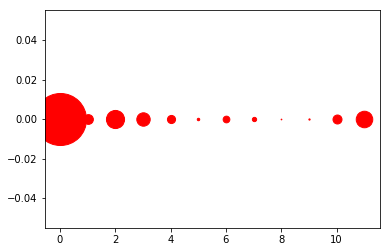

[((8, 0), 17), ((9, 0), 30), ((5, 0), 59), ((7, 0), 103), ((6, 0), 161), ((4, 0), 195), ((10, 0), 216), ((1, 0), 234), ((3, 0), 322), ((11, 0), 397), ((2, 0), 435), ((0, 0), 1249)]
963


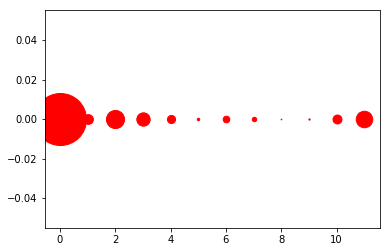

[((8, 0), 17), ((9, 0), 31), ((5, 0), 59), ((7, 0), 106), ((6, 0), 159), ((4, 0), 195), ((10, 0), 215), ((1, 0), 234), ((3, 0), 321), ((11, 0), 397), ((2, 0), 435), ((0, 0), 1249)]
964


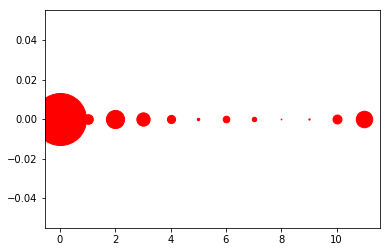

[((8, 0), 17), ((9, 0), 31), ((5, 0), 59), ((7, 0), 107), ((6, 0), 159), ((4, 0), 196), ((10, 0), 215), ((1, 0), 232), ((3, 0), 320), ((11, 0), 396), ((2, 0), 437), ((0, 0), 1249)]
965


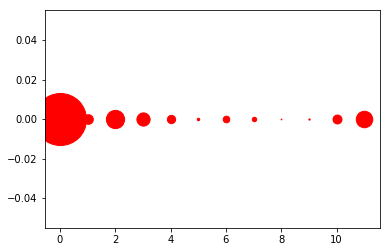

[((8, 0), 17), ((9, 0), 31), ((5, 0), 59), ((7, 0), 107), ((6, 0), 159), ((4, 0), 199), ((10, 0), 215), ((1, 0), 231), ((3, 0), 317), ((11, 0), 396), ((2, 0), 438), ((0, 0), 1249)]
966


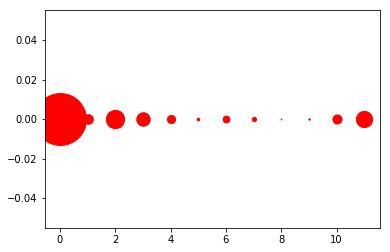

[((8, 0), 18), ((9, 0), 33), ((5, 0), 62), ((7, 0), 100), ((6, 0), 163), ((4, 0), 195), ((10, 0), 218), ((1, 0), 230), ((3, 0), 322), ((11, 0), 390), ((2, 0), 440), ((0, 0), 1247)]
967


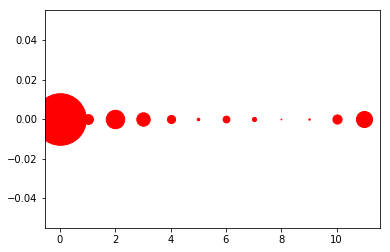

[((8, 0), 18), ((9, 0), 34), ((5, 0), 61), ((7, 0), 100), ((6, 0), 163), ((4, 0), 195), ((10, 0), 220), ((1, 0), 237), ((3, 0), 322), ((11, 0), 387), ((2, 0), 443), ((0, 0), 1238)]
968


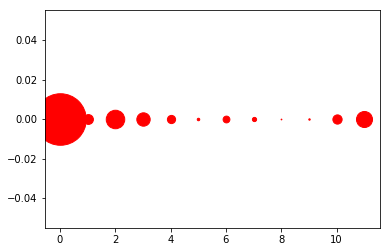

[((8, 0), 18), ((9, 0), 34), ((5, 0), 60), ((7, 0), 101), ((6, 0), 163), ((4, 0), 197), ((10, 0), 222), ((1, 0), 236), ((3, 0), 321), ((11, 0), 385), ((2, 0), 444), ((0, 0), 1237)]
969


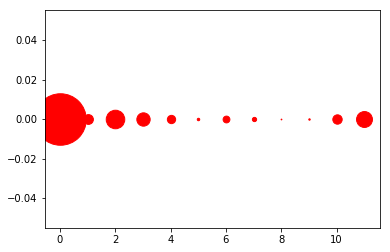

[((8, 0), 18), ((9, 0), 34), ((5, 0), 59), ((7, 0), 102), ((6, 0), 163), ((4, 0), 199), ((10, 0), 225), ((1, 0), 235), ((3, 0), 320), ((11, 0), 382), ((2, 0), 445), ((0, 0), 1236)]
970


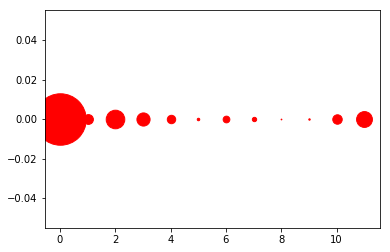

[((8, 0), 18), ((9, 0), 34), ((5, 0), 60), ((7, 0), 104), ((6, 0), 161), ((4, 0), 202), ((10, 0), 227), ((1, 0), 235), ((3, 0), 316), ((11, 0), 380), ((2, 0), 446), ((0, 0), 1235)]
971


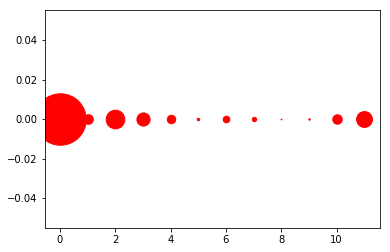

[((8, 0), 18), ((9, 0), 35), ((5, 0), 59), ((7, 0), 106), ((6, 0), 159), ((4, 0), 203), ((10, 0), 227), ((1, 0), 232), ((3, 0), 316), ((11, 0), 380), ((2, 0), 448), ((0, 0), 1235)]
972


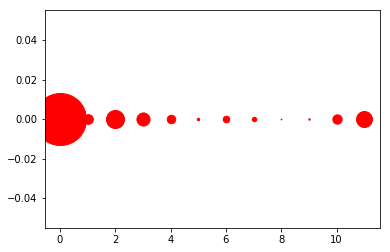

[((8, 0), 18), ((9, 0), 35), ((5, 0), 59), ((7, 0), 107), ((6, 0), 158), ((4, 0), 204), ((10, 0), 224), ((1, 0), 231), ((3, 0), 315), ((11, 0), 383), ((2, 0), 434), ((0, 0), 1250)]
973


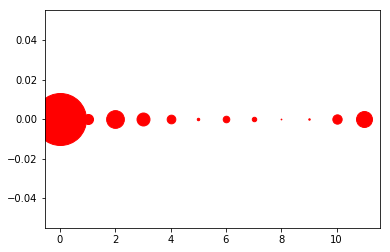

[((8, 0), 18), ((9, 0), 35), ((5, 0), 59), ((7, 0), 107), ((6, 0), 158), ((4, 0), 208), ((10, 0), 224), ((1, 0), 241), ((3, 0), 311), ((11, 0), 383), ((2, 0), 426), ((0, 0), 1248)]
974


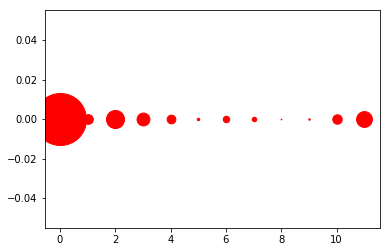

[((8, 0), 18), ((9, 0), 35), ((5, 0), 59), ((7, 0), 109), ((6, 0), 156), ((4, 0), 210), ((10, 0), 227), ((1, 0), 232), ((3, 0), 309), ((11, 0), 380), ((2, 0), 434), ((0, 0), 1249)]
975


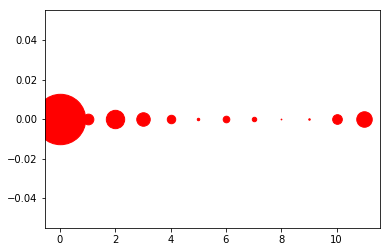

[((8, 0), 18), ((9, 0), 36), ((5, 0), 59), ((7, 0), 107), ((6, 0), 159), ((4, 0), 203), ((10, 0), 232), ((1, 0), 257), ((3, 0), 324), ((11, 0), 372), ((2, 0), 441), ((0, 0), 1210)]
976


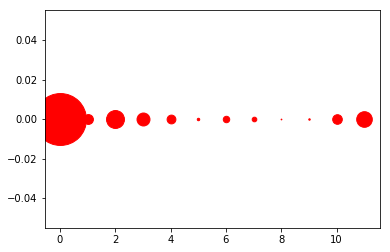

[((8, 0), 18), ((9, 0), 35), ((5, 0), 59), ((7, 0), 111), ((6, 0), 155), ((4, 0), 211), ((10, 0), 231), ((1, 0), 236), ((3, 0), 311), ((11, 0), 375), ((2, 0), 430), ((0, 0), 1246)]
977


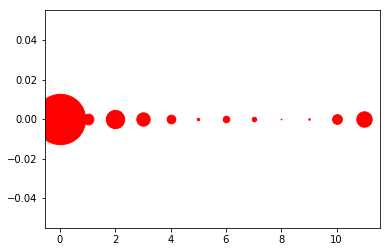

[((8, 0), 18), ((9, 0), 36), ((5, 0), 59), ((7, 0), 108), ((6, 0), 158), ((4, 0), 208), ((10, 0), 234), ((1, 0), 257), ((3, 0), 321), ((11, 0), 370), ((2, 0), 440), ((0, 0), 1209)]
978


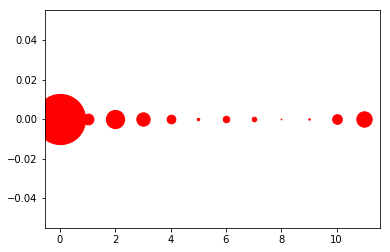

[((8, 0), 18), ((9, 0), 36), ((5, 0), 59), ((7, 0), 110), ((6, 0), 156), ((4, 0), 209), ((10, 0), 234), ((1, 0), 260), ((3, 0), 322), ((11, 0), 370), ((2, 0), 438), ((0, 0), 1206)]
979


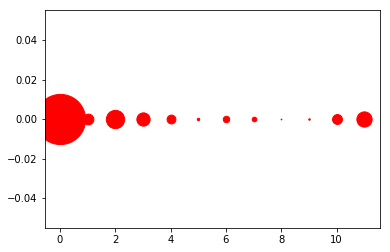

[((8, 0), 18), ((9, 0), 36), ((5, 0), 59), ((7, 0), 111), ((6, 0), 155), ((4, 0), 212), ((10, 0), 238), ((1, 0), 258), ((3, 0), 319), ((11, 0), 366), ((2, 0), 440), ((0, 0), 1206)]
980


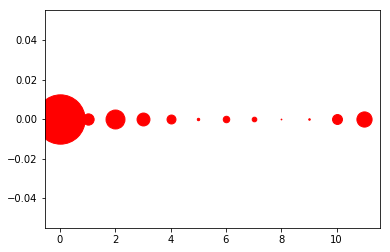

[((8, 0), 18), ((9, 0), 37), ((5, 0), 58), ((7, 0), 111), ((6, 0), 156), ((4, 0), 215), ((10, 0), 238), ((1, 0), 271), ((3, 0), 310), ((11, 0), 365), ((2, 0), 455), ((0, 0), 1184)]
981


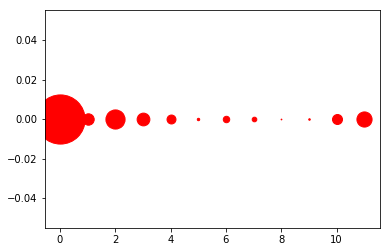

[((8, 0), 18), ((9, 0), 37), ((5, 0), 58), ((7, 0), 111), ((6, 0), 155), ((4, 0), 215), ((10, 0), 240), ((1, 0), 274), ((3, 0), 306), ((11, 0), 364), ((2, 0), 460), ((0, 0), 1180)]
982


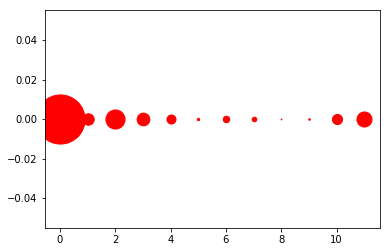

[((8, 0), 18), ((9, 0), 37), ((5, 0), 56), ((7, 0), 112), ((6, 0), 156), ((4, 0), 217), ((10, 0), 243), ((1, 0), 275), ((3, 0), 305), ((11, 0), 361), ((2, 0), 459), ((0, 0), 1179)]
983


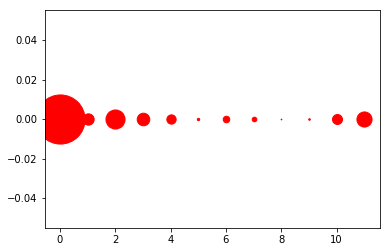

[((8, 0), 18), ((9, 0), 38), ((5, 0), 57), ((7, 0), 111), ((6, 0), 157), ((4, 0), 223), ((10, 0), 240), ((1, 0), 272), ((3, 0), 302), ((11, 0), 363), ((2, 0), 458), ((0, 0), 1179)]
984


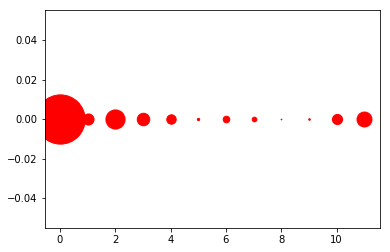

[((8, 0), 18), ((9, 0), 38), ((5, 0), 56), ((7, 0), 111), ((6, 0), 158), ((4, 0), 226), ((10, 0), 244), ((1, 0), 266), ((3, 0), 300), ((11, 0), 359), ((2, 0), 460), ((0, 0), 1182)]
985


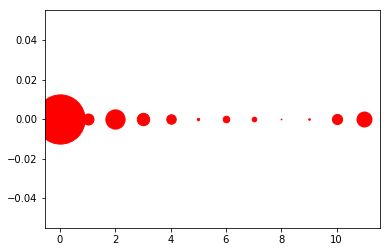

[((8, 0), 18), ((9, 0), 38), ((5, 0), 56), ((7, 0), 111), ((6, 0), 158), ((4, 0), 228), ((10, 0), 244), ((1, 0), 265), ((3, 0), 298), ((11, 0), 359), ((2, 0), 462), ((0, 0), 1181)]
986


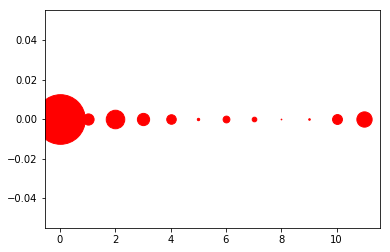

[((8, 0), 17), ((9, 0), 38), ((5, 0), 57), ((7, 0), 111), ((6, 0), 163), ((4, 0), 229), ((10, 0), 237), ((1, 0), 269), ((3, 0), 294), ((11, 0), 367), ((2, 0), 445), ((0, 0), 1191)]
987


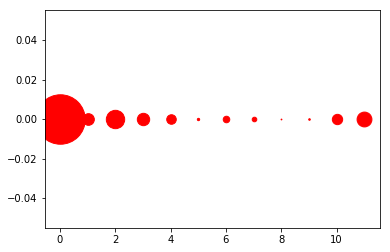

[((8, 0), 19), ((9, 0), 38), ((5, 0), 56), ((7, 0), 110), ((6, 0), 157), ((4, 0), 229), ((10, 0), 248), ((1, 0), 280), ((3, 0), 297), ((11, 0), 356), ((2, 0), 441), ((0, 0), 1187)]
988


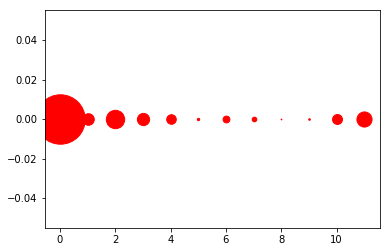

[((8, 0), 18), ((9, 0), 38), ((5, 0), 56), ((7, 0), 112), ((6, 0), 164), ((4, 0), 230), ((10, 0), 239), ((1, 0), 278), ((3, 0), 293), ((11, 0), 363), ((2, 0), 441), ((0, 0), 1186)]
989


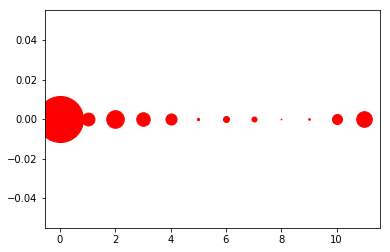

[((8, 0), 17), ((9, 0), 39), ((5, 0), 55), ((7, 0), 121), ((6, 0), 144), ((10, 0), 240), ((4, 0), 266), ((1, 0), 309), ((3, 0), 325), ((11, 0), 375), ((2, 0), 422), ((0, 0), 1105)]
990


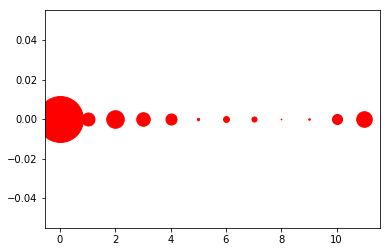

[((8, 0), 18), ((9, 0), 38), ((5, 0), 55), ((7, 0), 122), ((6, 0), 142), ((10, 0), 242), ((4, 0), 266), ((1, 0), 312), ((3, 0), 325), ((11, 0), 374), ((2, 0), 422), ((0, 0), 1102)]
991


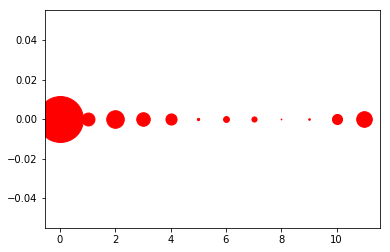

[((8, 0), 18), ((9, 0), 38), ((5, 0), 55), ((7, 0), 123), ((6, 0), 141), ((10, 0), 242), ((4, 0), 267), ((1, 0), 310), ((3, 0), 325), ((11, 0), 375), ((2, 0), 422), ((0, 0), 1102)]
992


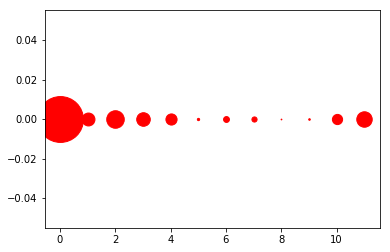

[((8, 0), 18), ((9, 0), 38), ((5, 0), 55), ((7, 0), 124), ((6, 0), 141), ((10, 0), 245), ((4, 0), 268), ((1, 0), 310), ((3, 0), 326), ((11, 0), 371), ((2, 0), 421), ((0, 0), 1101)]
993


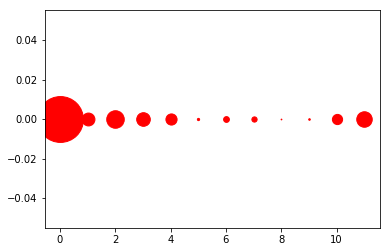

[((8, 0), 18), ((9, 0), 38), ((5, 0), 54), ((7, 0), 126), ((6, 0), 139), ((10, 0), 245), ((4, 0), 268), ((1, 0), 309), ((3, 0), 327), ((11, 0), 372), ((2, 0), 421), ((0, 0), 1101)]
994


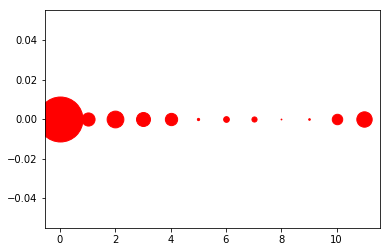

[((8, 0), 19), ((9, 0), 39), ((5, 0), 54), ((7, 0), 123), ((6, 0), 137), ((10, 0), 251), ((4, 0), 295), ((1, 0), 315), ((3, 0), 335), ((11, 0), 369), ((2, 0), 402), ((0, 0), 1079)]
995


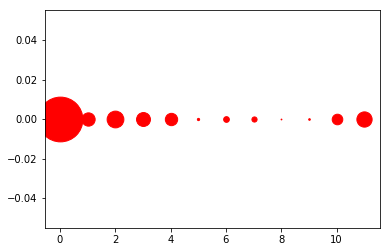

[((8, 0), 19), ((9, 0), 39), ((5, 0), 54), ((7, 0), 124), ((6, 0), 137), ((10, 0), 254), ((4, 0), 296), ((1, 0), 319), ((3, 0), 334), ((11, 0), 366), ((2, 0), 402), ((0, 0), 1074)]
996


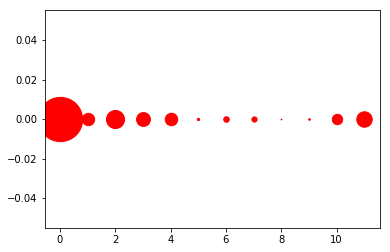

[((8, 0), 19), ((9, 0), 39), ((5, 0), 55), ((7, 0), 125), ((6, 0), 133), ((10, 0), 250), ((1, 0), 296), ((4, 0), 300), ((3, 0), 333), ((11, 0), 371), ((2, 0), 434), ((0, 0), 1063)]
997


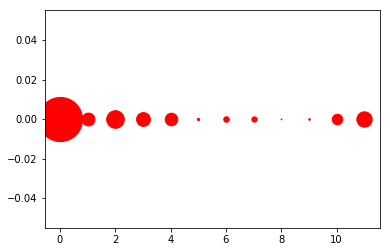

[((8, 0), 19), ((9, 0), 39), ((5, 0), 54), ((7, 0), 127), ((6, 0), 132), ((10, 0), 253), ((4, 0), 302), ((1, 0), 309), ((3, 0), 332), ((11, 0), 368), ((2, 0), 423), ((0, 0), 1060)]
998


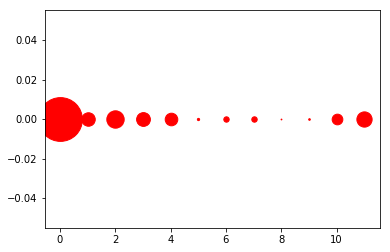

[((8, 0), 19), ((9, 0), 39), ((5, 0), 54), ((6, 0), 129), ((7, 0), 130), ((10, 0), 256), ((4, 0), 302), ((1, 0), 324), ((3, 0), 331), ((11, 0), 366), ((2, 0), 417), ((0, 0), 1051)]
999


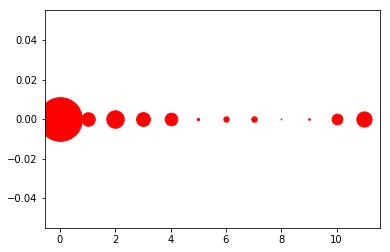

[((8, 0), 19), ((9, 0), 39), ((5, 0), 54), ((6, 0), 128), ((7, 0), 131), ((10, 0), 257), ((4, 0), 302), ((1, 0), 324), ((3, 0), 331), ((11, 0), 365), ((2, 0), 419), ((0, 0), 1049)]
1000


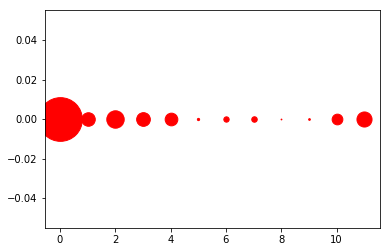

[((8, 0), 19), ((9, 0), 41), ((5, 0), 54), ((6, 0), 128), ((7, 0), 132), ((10, 0), 257), ((4, 0), 304), ((1, 0), 325), ((3, 0), 329), ((11, 0), 362), ((2, 0), 418), ((0, 0), 1049)]
1001


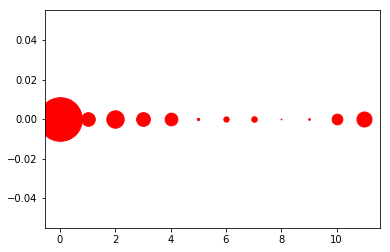

[((8, 0), 19), ((9, 0), 41), ((5, 0), 54), ((6, 0), 128), ((7, 0), 133), ((10, 0), 257), ((4, 0), 304), ((1, 0), 326), ((3, 0), 330), ((11, 0), 361), ((2, 0), 418), ((0, 0), 1047)]
1002


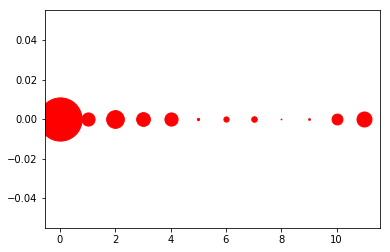

[((8, 0), 19), ((9, 0), 42), ((5, 0), 54), ((6, 0), 125), ((7, 0), 133), ((10, 0), 261), ((4, 0), 316), ((1, 0), 316), ((3, 0), 330), ((11, 0), 360), ((2, 0), 425), ((0, 0), 1037)]
1003


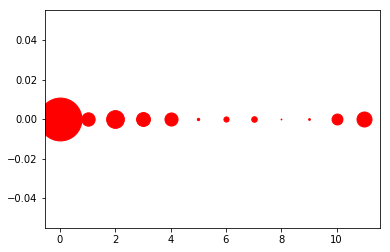

[((8, 0), 19), ((9, 0), 42), ((5, 0), 56), ((6, 0), 124), ((7, 0), 133), ((10, 0), 262), ((4, 0), 314), ((1, 0), 320), ((3, 0), 333), ((11, 0), 360), ((2, 0), 426), ((0, 0), 1029)]
1004


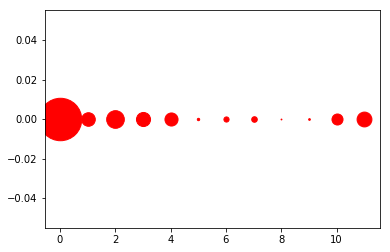

[((8, 0), 20), ((9, 0), 41), ((5, 0), 57), ((6, 0), 124), ((7, 0), 134), ((10, 0), 265), ((4, 0), 314), ((1, 0), 326), ((3, 0), 338), ((11, 0), 356), ((2, 0), 424), ((0, 0), 1019)]
1005


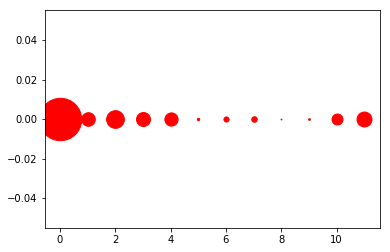

[((8, 0), 20), ((9, 0), 42), ((5, 0), 57), ((6, 0), 123), ((7, 0), 133), ((10, 0), 263), ((4, 0), 317), ((1, 0), 326), ((3, 0), 335), ((11, 0), 359), ((2, 0), 425), ((0, 0), 1018)]
1006


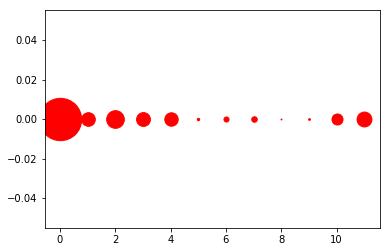

[((8, 0), 21), ((9, 0), 42), ((5, 0), 57), ((6, 0), 122), ((7, 0), 133), ((10, 0), 265), ((4, 0), 322), ((1, 0), 327), ((3, 0), 332), ((11, 0), 357), ((2, 0), 424), ((0, 0), 1016)]
1007


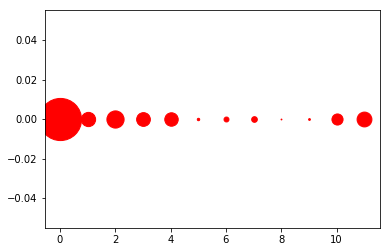

[((8, 0), 20), ((9, 0), 43), ((5, 0), 58), ((6, 0), 118), ((7, 0), 136), ((10, 0), 267), ((4, 0), 323), ((3, 0), 330), ((1, 0), 342), ((11, 0), 356), ((2, 0), 413), ((0, 0), 1012)]
1008


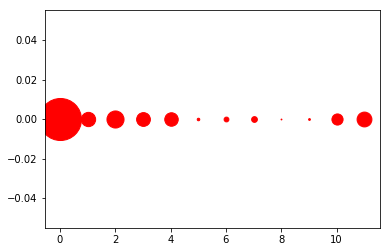

[((8, 0), 20), ((9, 0), 43), ((5, 0), 61), ((6, 0), 115), ((7, 0), 138), ((10, 0), 268), ((4, 0), 324), ((3, 0), 331), ((1, 0), 343), ((11, 0), 356), ((2, 0), 410), ((0, 0), 1009)]
1009


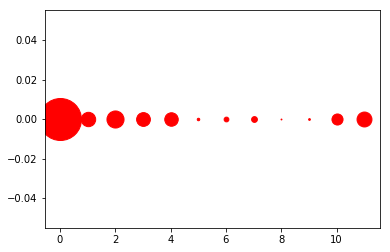

[((8, 0), 21), ((9, 0), 42), ((5, 0), 60), ((6, 0), 114), ((7, 0), 139), ((10, 0), 266), ((4, 0), 324), ((3, 0), 331), ((1, 0), 345), ((11, 0), 358), ((2, 0), 410), ((0, 0), 1008)]
1010


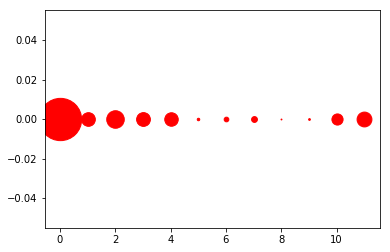

[((8, 0), 21), ((9, 0), 42), ((5, 0), 60), ((6, 0), 112), ((7, 0), 140), ((10, 0), 268), ((4, 0), 324), ((1, 0), 328), ((3, 0), 331), ((11, 0), 356), ((2, 0), 421), ((0, 0), 1015)]
1011


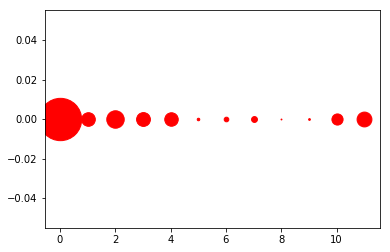

[((8, 0), 21), ((9, 0), 42), ((5, 0), 61), ((6, 0), 111), ((7, 0), 141), ((10, 0), 268), ((4, 0), 324), ((1, 0), 327), ((3, 0), 332), ((11, 0), 356), ((2, 0), 419), ((0, 0), 1016)]
1012


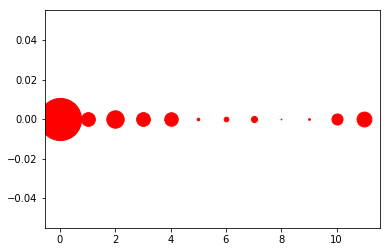

[((8, 0), 19), ((9, 0), 43), ((5, 0), 62), ((6, 0), 112), ((7, 0), 147), ((10, 0), 266), ((4, 0), 324), ((1, 0), 329), ((3, 0), 330), ((11, 0), 356), ((2, 0), 418), ((0, 0), 1012)]
1013


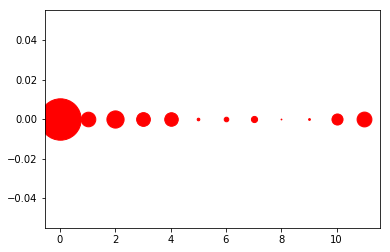

[((8, 0), 19), ((9, 0), 43), ((5, 0), 63), ((6, 0), 110), ((7, 0), 148), ((10, 0), 266), ((4, 0), 325), ((3, 0), 330), ((1, 0), 351), ((11, 0), 356), ((2, 0), 413), ((0, 0), 994)]
1014


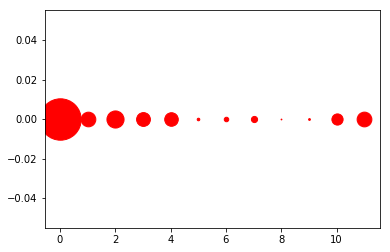

[((8, 0), 19), ((9, 0), 43), ((5, 0), 62), ((6, 0), 108), ((7, 0), 148), ((10, 0), 269), ((4, 0), 326), ((3, 0), 332), ((1, 0), 352), ((11, 0), 354), ((2, 0), 411), ((0, 0), 994)]
1015


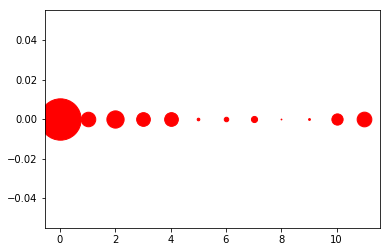

[((8, 0), 19), ((9, 0), 44), ((5, 0), 63), ((6, 0), 108), ((7, 0), 147), ((10, 0), 270), ((4, 0), 329), ((3, 0), 329), ((1, 0), 349), ((11, 0), 353), ((2, 0), 414), ((0, 0), 993)]
1016


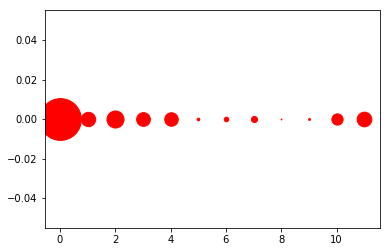

[((8, 0), 19), ((9, 0), 45), ((5, 0), 63), ((6, 0), 110), ((7, 0), 147), ((10, 0), 270), ((4, 0), 325), ((3, 0), 330), ((1, 0), 344), ((11, 0), 352), ((2, 0), 410), ((0, 0), 1003)]
1017


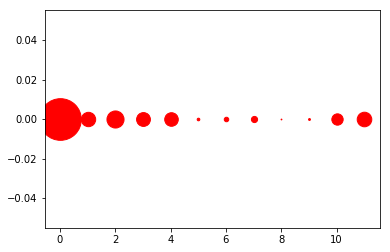

[((8, 0), 19), ((9, 0), 45), ((5, 0), 63), ((6, 0), 108), ((7, 0), 148), ((10, 0), 272), ((4, 0), 326), ((3, 0), 332), ((1, 0), 345), ((11, 0), 350), ((2, 0), 410), ((0, 0), 1000)]
1018


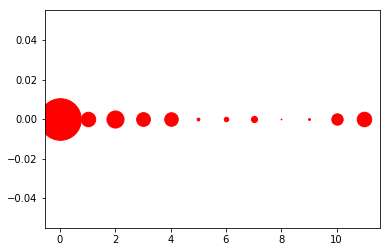

[((8, 0), 19), ((9, 0), 45), ((5, 0), 66), ((6, 0), 108), ((7, 0), 148), ((10, 0), 273), ((4, 0), 325), ((3, 0), 330), ((1, 0), 347), ((11, 0), 349), ((2, 0), 410), ((0, 0), 998)]
1019


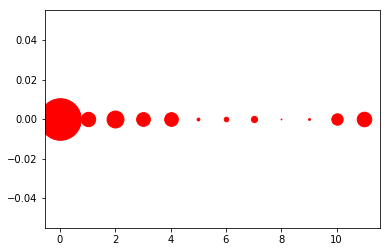

[((8, 0), 19), ((9, 0), 45), ((5, 0), 67), ((6, 0), 109), ((7, 0), 149), ((10, 0), 273), ((4, 0), 328), ((3, 0), 330), ((1, 0), 345), ((11, 0), 349), ((2, 0), 406), ((0, 0), 998)]
1020


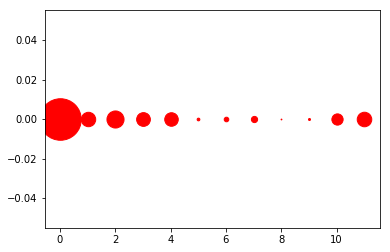

[((8, 0), 19), ((9, 0), 48), ((5, 0), 65), ((6, 0), 110), ((7, 0), 149), ((10, 0), 270), ((4, 0), 325), ((3, 0), 330), ((1, 0), 346), ((11, 0), 349), ((2, 0), 410), ((0, 0), 997)]
1021


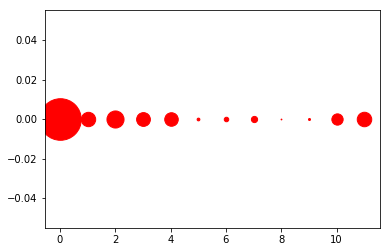

[((8, 0), 19), ((9, 0), 48), ((5, 0), 66), ((6, 0), 108), ((7, 0), 149), ((10, 0), 271), ((4, 0), 325), ((3, 0), 331), ((1, 0), 345), ((11, 0), 348), ((2, 0), 410), ((0, 0), 998)]
1022


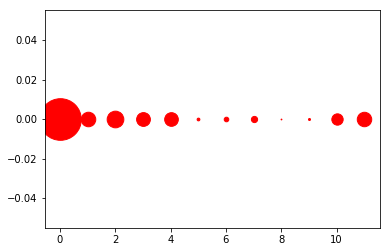

[((8, 0), 19), ((9, 0), 48), ((5, 0), 66), ((6, 0), 110), ((7, 0), 149), ((10, 0), 272), ((4, 0), 328), ((3, 0), 331), ((11, 0), 347), ((1, 0), 349), ((2, 0), 400), ((0, 0), 999)]
1023


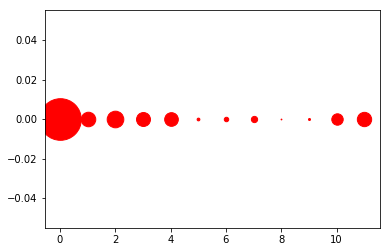

[((8, 0), 19), ((9, 0), 48), ((5, 0), 66), ((6, 0), 107), ((7, 0), 150), ((10, 0), 274), ((4, 0), 328), ((3, 0), 335), ((11, 0), 344), ((1, 0), 349), ((2, 0), 399), ((0, 0), 999)]
1024


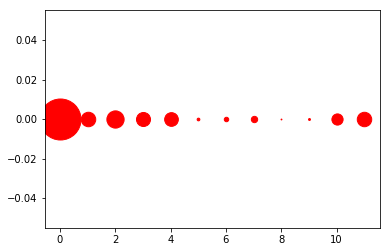

[((8, 0), 20), ((9, 0), 46), ((5, 0), 65), ((6, 0), 107), ((7, 0), 152), ((10, 0), 269), ((4, 0), 329), ((3, 0), 337), ((11, 0), 347), ((1, 0), 348), ((2, 0), 414), ((0, 0), 984)]
1025


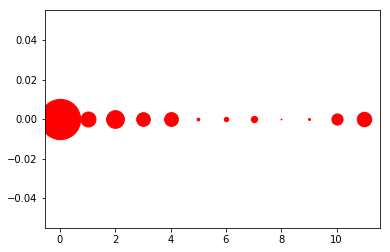

[((8, 0), 20), ((9, 0), 47), ((5, 0), 66), ((6, 0), 106), ((7, 0), 152), ((10, 0), 269), ((3, 0), 328), ((4, 0), 331), ((11, 0), 347), ((1, 0), 360), ((2, 0), 426), ((0, 0), 966)]
1026


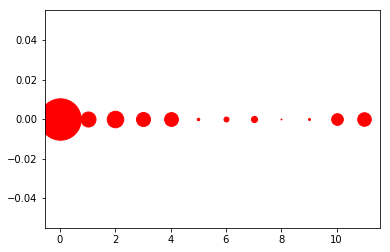

[((8, 0), 21), ((9, 0), 48), ((5, 0), 60), ((6, 0), 119), ((7, 0), 148), ((10, 0), 280), ((11, 0), 325), ((4, 0), 331), ((3, 0), 336), ((1, 0), 360), ((2, 0), 396), ((0, 0), 994)]
1027


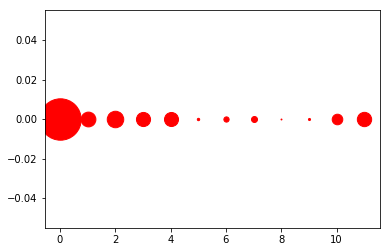

[((8, 0), 22), ((9, 0), 50), ((5, 0), 57), ((6, 0), 126), ((7, 0), 144), ((10, 0), 254), ((4, 0), 337), ((3, 0), 339), ((11, 0), 344), ((1, 0), 355), ((2, 0), 396), ((0, 0), 994)]
1028


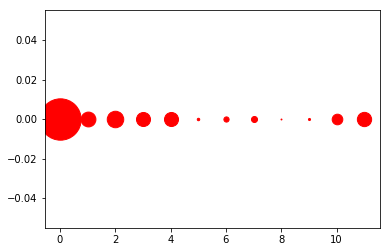

[((8, 0), 22), ((9, 0), 50), ((5, 0), 59), ((6, 0), 125), ((7, 0), 145), ((10, 0), 255), ((4, 0), 337), ((3, 0), 337), ((11, 0), 343), ((1, 0), 356), ((2, 0), 396), ((0, 0), 993)]
1029


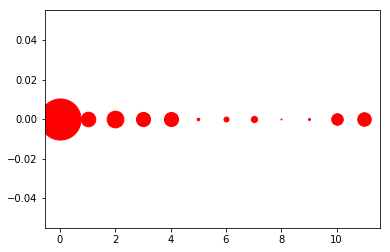

[((8, 0), 22), ((9, 0), 48), ((5, 0), 61), ((6, 0), 119), ((7, 0), 149), ((10, 0), 278), ((11, 0), 325), ((4, 0), 338), ((3, 0), 340), ((1, 0), 350), ((2, 0), 402), ((0, 0), 986)]
1030


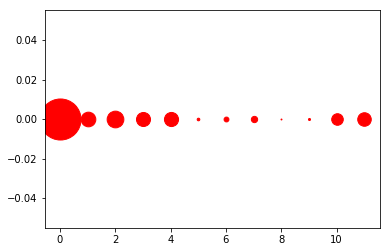

[((8, 0), 22), ((9, 0), 49), ((5, 0), 63), ((6, 0), 116), ((7, 0), 151), ((10, 0), 278), ((11, 0), 325), ((3, 0), 337), ((4, 0), 339), ((1, 0), 352), ((2, 0), 401), ((0, 0), 985)]
1031


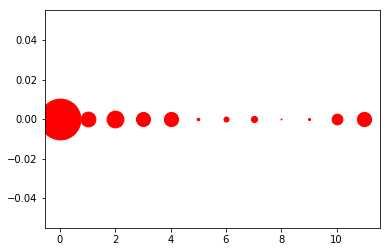

[((8, 0), 22), ((9, 0), 50), ((5, 0), 63), ((6, 0), 121), ((7, 0), 149), ((10, 0), 257), ((3, 0), 336), ((4, 0), 340), ((11, 0), 342), ((1, 0), 356), ((2, 0), 403), ((0, 0), 979)]
1032


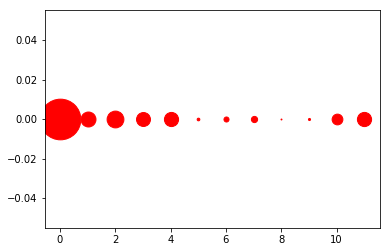

[((8, 0), 22), ((9, 0), 50), ((5, 0), 64), ((6, 0), 121), ((7, 0), 149), ((10, 0), 258), ((3, 0), 335), ((4, 0), 340), ((11, 0), 341), ((1, 0), 359), ((2, 0), 403), ((0, 0), 976)]
1033


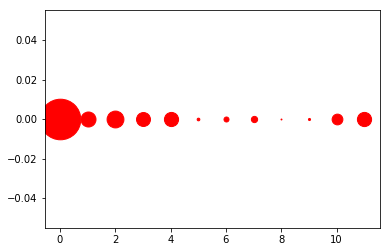

[((8, 0), 22), ((9, 0), 50), ((5, 0), 64), ((6, 0), 120), ((7, 0), 150), ((10, 0), 258), ((3, 0), 335), ((4, 0), 340), ((11, 0), 341), ((1, 0), 360), ((2, 0), 404), ((0, 0), 974)]
1034


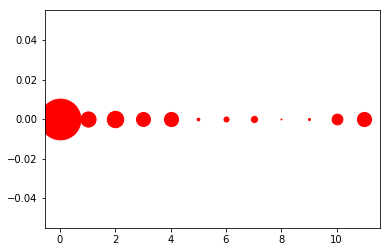

[((8, 0), 22), ((9, 0), 50), ((5, 0), 64), ((6, 0), 120), ((7, 0), 150), ((10, 0), 259), ((3, 0), 336), ((11, 0), 340), ((4, 0), 340), ((1, 0), 364), ((2, 0), 395), ((0, 0), 978)]
1035


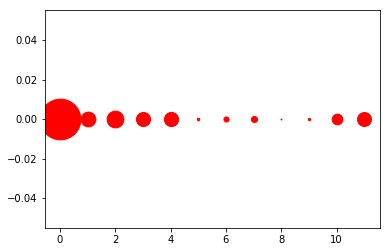

[((8, 0), 22), ((9, 0), 56), ((5, 0), 61), ((6, 0), 123), ((7, 0), 148), ((10, 0), 256), ((11, 0), 335), ((3, 0), 339), ((4, 0), 341), ((1, 0), 355), ((2, 0), 404), ((0, 0), 978)]
1036


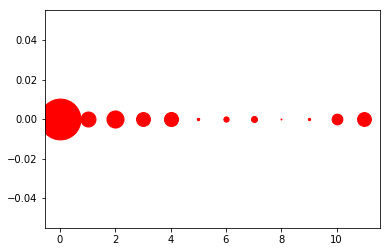

[((8, 0), 22), ((9, 0), 57), ((5, 0), 58), ((6, 0), 126), ((7, 0), 145), ((10, 0), 258), ((11, 0), 332), ((3, 0), 333), ((4, 0), 337), ((1, 0), 360), ((2, 0), 410), ((0, 0), 980)]
1037


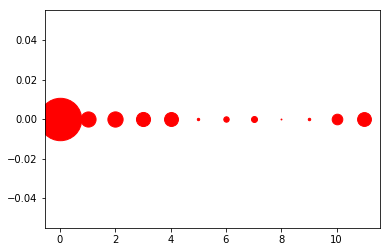

[((8, 0), 21), ((5, 0), 57), ((9, 0), 59), ((6, 0), 130), ((7, 0), 144), ((10, 0), 255), ((11, 0), 332), ((4, 0), 334), ((3, 0), 338), ((1, 0), 364), ((2, 0), 366), ((0, 0), 1018)]
1038


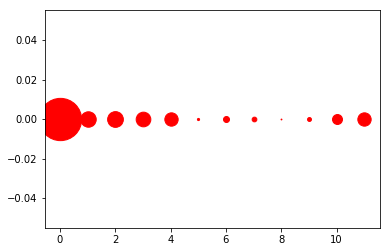

[((8, 0), 20), ((5, 0), 52), ((9, 0), 94), ((7, 0), 113), ((6, 0), 144), ((10, 0), 239), ((11, 0), 320), ((4, 0), 320), ((3, 0), 352), ((1, 0), 371), ((2, 0), 378), ((0, 0), 1015)]
1039


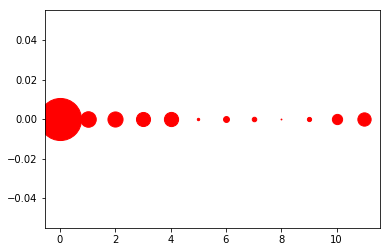

[((8, 0), 20), ((5, 0), 57), ((9, 0), 101), ((7, 0), 108), ((6, 0), 142), ((10, 0), 246), ((11, 0), 319), ((3, 0), 338), ((4, 0), 341), ((2, 0), 363), ((1, 0), 373), ((0, 0), 1010)]
1040


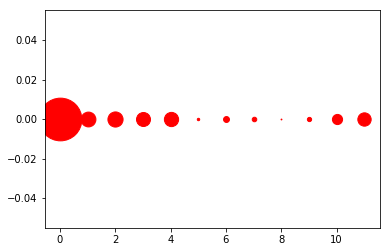

[((8, 0), 20), ((5, 0), 58), ((9, 0), 102), ((7, 0), 109), ((6, 0), 142), ((10, 0), 244), ((11, 0), 320), ((3, 0), 336), ((4, 0), 342), ((1, 0), 356), ((2, 0), 364), ((0, 0), 1025)]
1041


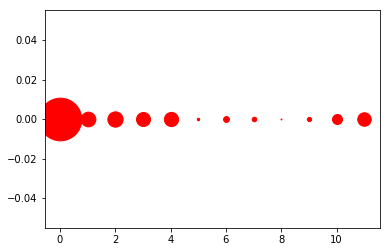

[((8, 0), 21), ((5, 0), 58), ((9, 0), 102), ((7, 0), 110), ((6, 0), 141), ((10, 0), 240), ((11, 0), 324), ((3, 0), 336), ((4, 0), 342), ((1, 0), 353), ((2, 0), 367), ((0, 0), 1024)]
1042


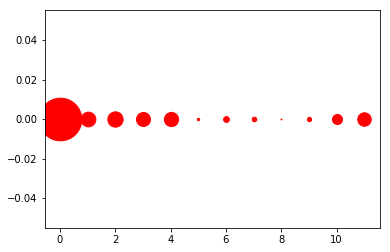

[((8, 0), 21), ((5, 0), 57), ((9, 0), 103), ((7, 0), 110), ((6, 0), 140), ((10, 0), 241), ((11, 0), 324), ((3, 0), 336), ((4, 0), 342), ((1, 0), 353), ((2, 0), 367), ((0, 0), 1024)]
1043


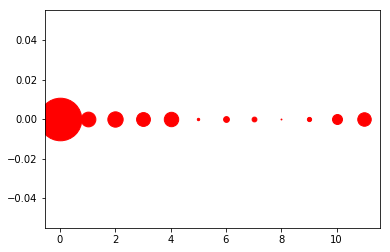

[((8, 0), 21), ((5, 0), 57), ((9, 0), 101), ((7, 0), 115), ((6, 0), 139), ((10, 0), 239), ((11, 0), 324), ((3, 0), 332), ((4, 0), 346), ((1, 0), 354), ((2, 0), 368), ((0, 0), 1022)]
1044


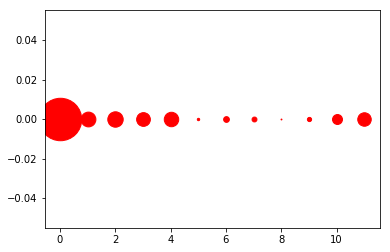

[((8, 0), 21), ((5, 0), 57), ((9, 0), 101), ((7, 0), 117), ((6, 0), 138), ((10, 0), 239), ((11, 0), 324), ((3, 0), 330), ((4, 0), 347), ((1, 0), 355), ((2, 0), 370), ((0, 0), 1019)]
1045


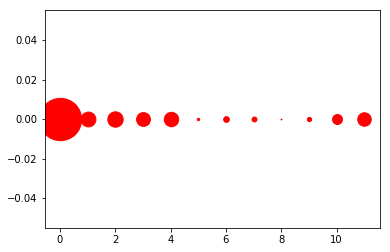

[((8, 0), 21), ((5, 0), 57), ((9, 0), 102), ((7, 0), 118), ((6, 0), 137), ((10, 0), 239), ((11, 0), 324), ((3, 0), 332), ((4, 0), 347), ((1, 0), 356), ((2, 0), 369), ((0, 0), 1016)]
1046


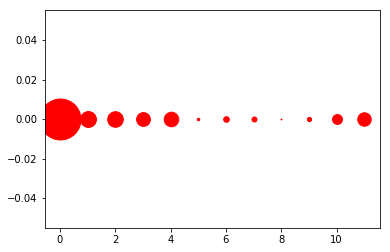

[((8, 0), 21), ((5, 0), 60), ((9, 0), 102), ((7, 0), 120), ((6, 0), 135), ((10, 0), 238), ((11, 0), 323), ((3, 0), 331), ((4, 0), 350), ((2, 0), 374), ((1, 0), 381), ((0, 0), 983)]
1047


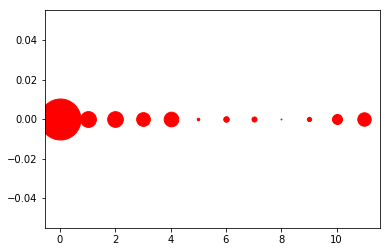

[((8, 0), 21), ((5, 0), 61), ((9, 0), 102), ((7, 0), 121), ((6, 0), 133), ((10, 0), 240), ((11, 0), 322), ((3, 0), 329), ((4, 0), 351), ((2, 0), 376), ((1, 0), 379), ((0, 0), 983)]
1048


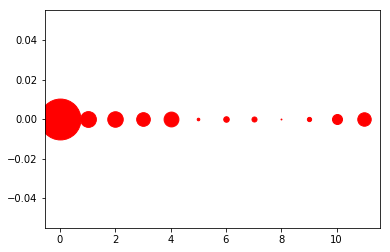

[((8, 0), 21), ((5, 0), 62), ((9, 0), 102), ((7, 0), 121), ((6, 0), 133), ((10, 0), 240), ((11, 0), 323), ((3, 0), 328), ((4, 0), 356), ((2, 0), 372), ((1, 0), 379), ((0, 0), 981)]
1049


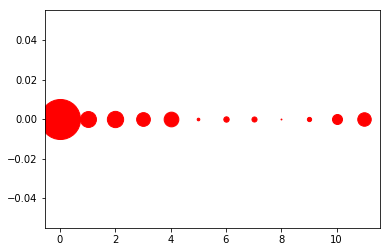

[((8, 0), 21), ((5, 0), 63), ((9, 0), 102), ((7, 0), 122), ((6, 0), 129), ((10, 0), 240), ((11, 0), 324), ((3, 0), 330), ((4, 0), 353), ((1, 0), 382), ((2, 0), 391), ((0, 0), 961)]
1050


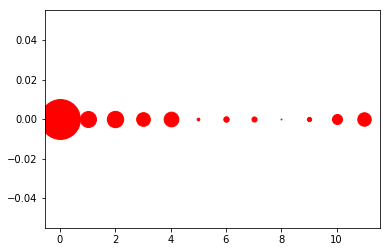

[((8, 0), 21), ((5, 0), 64), ((9, 0), 102), ((7, 0), 122), ((6, 0), 130), ((10, 0), 241), ((11, 0), 323), ((3, 0), 329), ((4, 0), 353), ((1, 0), 383), ((2, 0), 393), ((0, 0), 957)]
1051


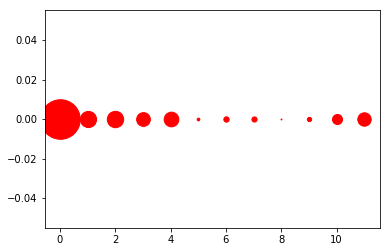

[((8, 0), 21), ((5, 0), 64), ((9, 0), 103), ((7, 0), 124), ((6, 0), 128), ((10, 0), 241), ((11, 0), 322), ((3, 0), 330), ((4, 0), 353), ((1, 0), 388), ((2, 0), 394), ((0, 0), 950)]
1052


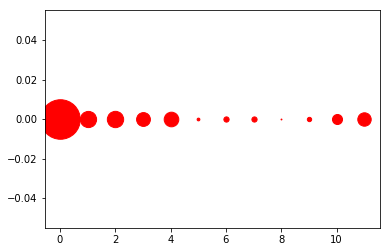

[((8, 0), 21), ((5, 0), 66), ((9, 0), 104), ((7, 0), 125), ((6, 0), 126), ((10, 0), 241), ((11, 0), 322), ((3, 0), 332), ((4, 0), 351), ((1, 0), 389), ((2, 0), 392), ((0, 0), 949)]
1053


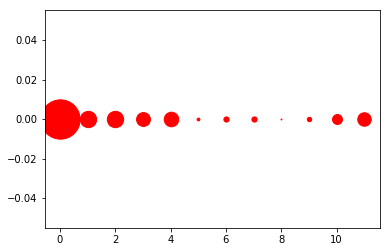

[((8, 0), 21), ((5, 0), 67), ((9, 0), 105), ((7, 0), 125), ((6, 0), 125), ((10, 0), 239), ((11, 0), 324), ((3, 0), 333), ((4, 0), 350), ((1, 0), 392), ((2, 0), 393), ((0, 0), 944)]
1054


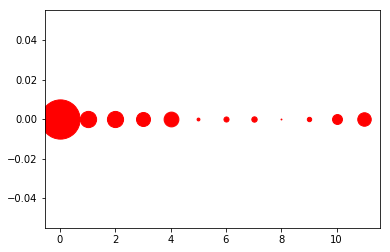

[((8, 0), 21), ((5, 0), 68), ((9, 0), 105), ((6, 0), 122), ((7, 0), 129), ((10, 0), 238), ((11, 0), 324), ((3, 0), 336), ((4, 0), 355), ((2, 0), 388), ((1, 0), 390), ((0, 0), 942)]
1055


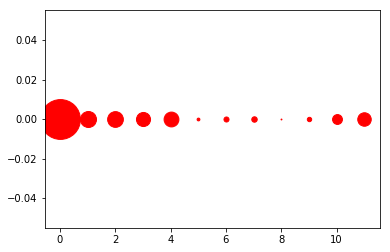

[((8, 0), 21), ((5, 0), 67), ((9, 0), 105), ((6, 0), 121), ((7, 0), 131), ((10, 0), 237), ((11, 0), 324), ((3, 0), 338), ((4, 0), 356), ((2, 0), 378), ((1, 0), 384), ((0, 0), 956)]
1056


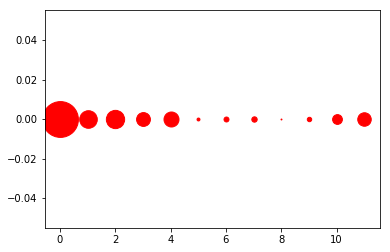

[((8, 0), 22), ((5, 0), 70), ((9, 0), 106), ((6, 0), 119), ((7, 0), 129), ((10, 0), 235), ((11, 0), 324), ((3, 0), 332), ((4, 0), 360), ((1, 0), 422), ((2, 0), 439), ((0, 0), 860)]
1057


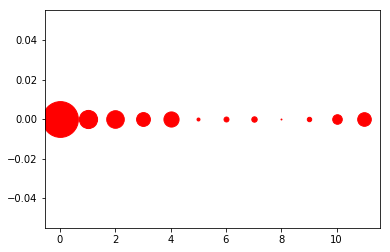

[((8, 0), 22), ((5, 0), 71), ((9, 0), 106), ((6, 0), 119), ((7, 0), 130), ((10, 0), 230), ((11, 0), 327), ((3, 0), 332), ((4, 0), 364), ((2, 0), 422), ((1, 0), 436), ((0, 0), 859)]
1058


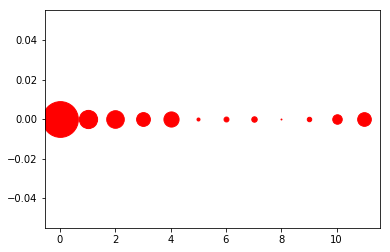

[((8, 0), 22), ((5, 0), 72), ((9, 0), 107), ((6, 0), 118), ((7, 0), 131), ((10, 0), 228), ((11, 0), 328), ((3, 0), 331), ((4, 0), 364), ((2, 0), 422), ((1, 0), 437), ((0, 0), 858)]
1059


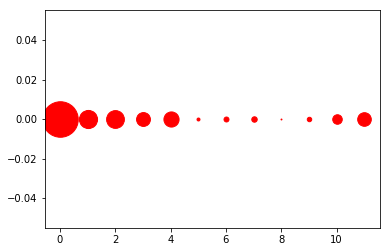

[((8, 0), 22), ((5, 0), 71), ((9, 0), 107), ((6, 0), 119), ((7, 0), 131), ((10, 0), 229), ((11, 0), 327), ((3, 0), 333), ((4, 0), 364), ((2, 0), 427), ((1, 0), 435), ((0, 0), 853)]
1060


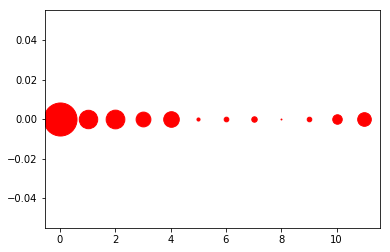

[((8, 0), 22), ((5, 0), 74), ((9, 0), 110), ((6, 0), 112), ((7, 0), 131), ((10, 0), 228), ((11, 0), 327), ((3, 0), 355), ((4, 0), 374), ((1, 0), 443), ((2, 0), 449), ((0, 0), 793)]
1061


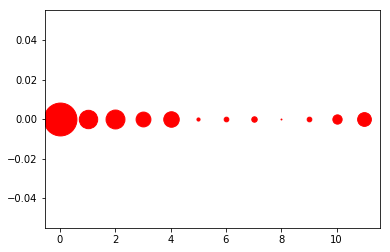

[((8, 0), 22), ((5, 0), 75), ((9, 0), 112), ((6, 0), 112), ((7, 0), 131), ((10, 0), 223), ((11, 0), 330), ((3, 0), 356), ((4, 0), 372), ((1, 0), 442), ((2, 0), 454), ((0, 0), 789)]
1062


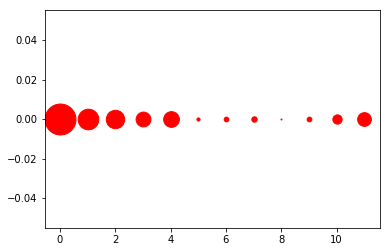

[((8, 0), 23), ((5, 0), 76), ((6, 0), 112), ((9, 0), 113), ((7, 0), 130), ((10, 0), 222), ((11, 0), 329), ((3, 0), 356), ((4, 0), 377), ((2, 0), 442), ((1, 0), 495), ((0, 0), 743)]
1063


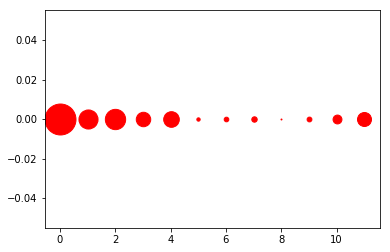

[((8, 0), 23), ((5, 0), 80), ((6, 0), 111), ((9, 0), 115), ((7, 0), 130), ((10, 0), 213), ((11, 0), 336), ((3, 0), 347), ((4, 0), 375), ((1, 0), 458), ((2, 0), 487), ((0, 0), 743)]
1064


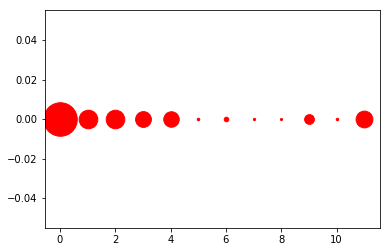

[((8, 0), 51), ((7, 0), 53), ((10, 0), 59), ((5, 0), 60), ((6, 0), 109), ((9, 0), 234), ((4, 0), 372), ((3, 0), 379), ((11, 0), 403), ((2, 0), 446), ((1, 0), 447), ((0, 0), 805)]
1065


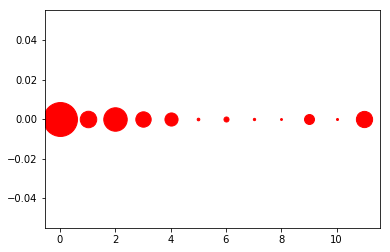

[((8, 0), 45), ((10, 0), 48), ((7, 0), 55), ((5, 0), 63), ((6, 0), 121), ((9, 0), 239), ((4, 0), 315), ((3, 0), 369), ((11, 0), 390), ((1, 0), 396), ((2, 0), 563), ((0, 0), 814)]
1066


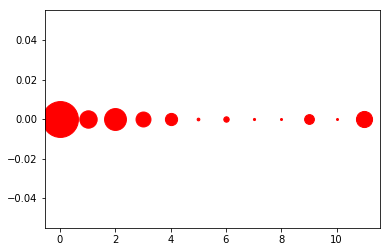

[((10, 0), 47), ((8, 0), 48), ((7, 0), 51), ((5, 0), 65), ((6, 0), 130), ((9, 0), 235), ((4, 0), 293), ((3, 0), 359), ((11, 0), 387), ((1, 0), 417), ((2, 0), 525), ((0, 0), 861)]
1067


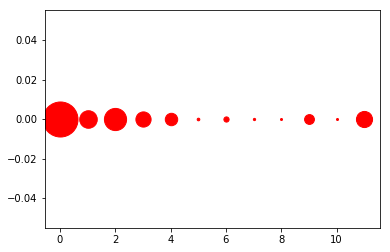

[((8, 0), 48), ((10, 0), 48), ((7, 0), 54), ((5, 0), 63), ((6, 0), 125), ((9, 0), 236), ((4, 0), 298), ((3, 0), 365), ((11, 0), 387), ((1, 0), 421), ((2, 0), 532), ((0, 0), 841)]
1068


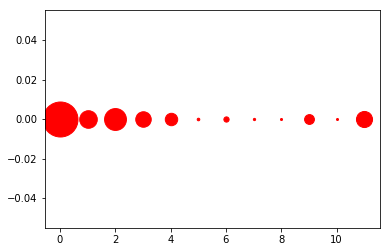

[((10, 0), 48), ((8, 0), 49), ((7, 0), 54), ((5, 0), 62), ((6, 0), 126), ((9, 0), 236), ((4, 0), 298), ((3, 0), 372), ((11, 0), 386), ((1, 0), 422), ((2, 0), 525), ((0, 0), 840)]
1069


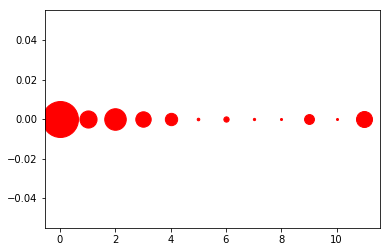

[((10, 0), 48), ((8, 0), 49), ((7, 0), 54), ((5, 0), 62), ((6, 0), 127), ((9, 0), 237), ((4, 0), 296), ((3, 0), 370), ((11, 0), 384), ((1, 0), 411), ((2, 0), 517), ((0, 0), 863)]
1070


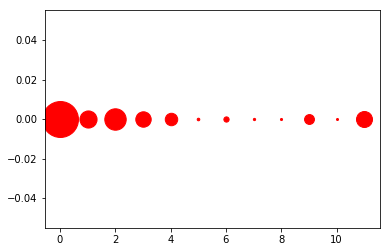

[((10, 0), 48), ((8, 0), 50), ((7, 0), 54), ((5, 0), 62), ((6, 0), 126), ((9, 0), 237), ((4, 0), 299), ((3, 0), 370), ((11, 0), 384), ((1, 0), 411), ((2, 0), 514), ((0, 0), 863)]
1071


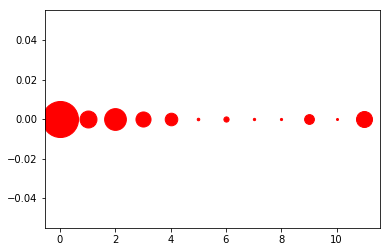

[((10, 0), 48), ((8, 0), 52), ((7, 0), 55), ((5, 0), 61), ((6, 0), 125), ((9, 0), 235), ((4, 0), 302), ((3, 0), 362), ((11, 0), 384), ((1, 0), 407), ((2, 0), 522), ((0, 0), 865)]
1072


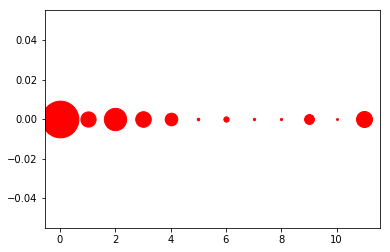

[((10, 0), 46), ((8, 0), 52), ((7, 0), 54), ((5, 0), 61), ((6, 0), 127), ((9, 0), 236), ((4, 0), 303), ((1, 0), 365), ((3, 0), 374), ((11, 0), 384), ((2, 0), 535), ((0, 0), 881)]
1073


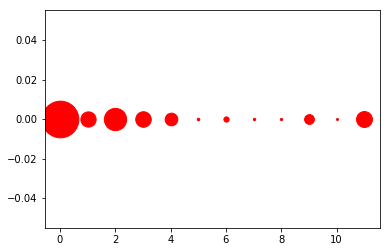

[((10, 0), 48), ((8, 0), 53), ((7, 0), 56), ((5, 0), 61), ((6, 0), 126), ((9, 0), 235), ((4, 0), 304), ((1, 0), 366), ((3, 0), 373), ((11, 0), 382), ((2, 0), 534), ((0, 0), 880)]
1074


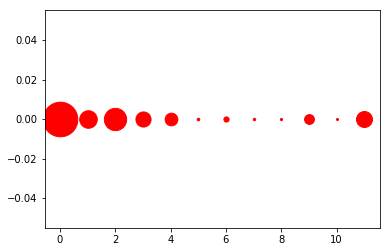

[((10, 0), 48), ((8, 0), 52), ((7, 0), 57), ((5, 0), 62), ((6, 0), 125), ((9, 0), 236), ((4, 0), 305), ((3, 0), 363), ((11, 0), 383), ((1, 0), 421), ((2, 0), 535), ((0, 0), 831)]
1075


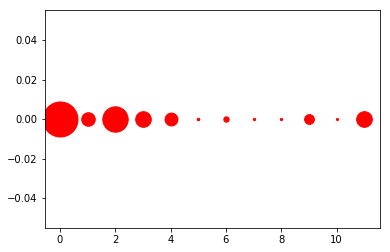

[((10, 0), 51), ((8, 0), 54), ((7, 0), 55), ((5, 0), 61), ((6, 0), 128), ((9, 0), 235), ((4, 0), 309), ((1, 0), 325), ((3, 0), 375), ((11, 0), 376), ((2, 0), 609), ((0, 0), 840)]
1076


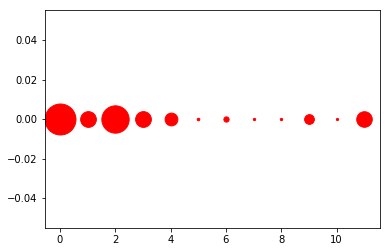

[((10, 0), 52), ((7, 0), 55), ((8, 0), 56), ((5, 0), 61), ((6, 0), 126), ((9, 0), 234), ((4, 0), 307), ((11, 0), 373), ((1, 0), 377), ((3, 0), 378), ((2, 0), 656), ((0, 0), 743)]
1077


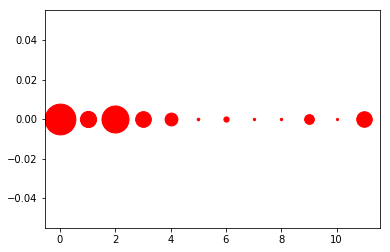

[((10, 0), 52), ((7, 0), 55), ((8, 0), 56), ((5, 0), 61), ((6, 0), 126), ((9, 0), 234), ((4, 0), 308), ((11, 0), 373), ((3, 0), 377), ((1, 0), 388), ((2, 0), 649), ((0, 0), 739)]
1078


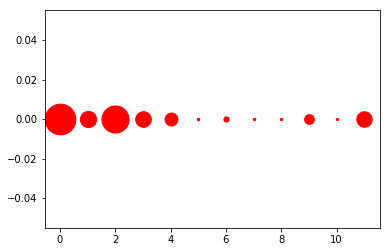

[((10, 0), 54), ((8, 0), 56), ((7, 0), 57), ((5, 0), 60), ((6, 0), 125), ((9, 0), 234), ((4, 0), 310), ((11, 0), 371), ((3, 0), 375), ((1, 0), 389), ((2, 0), 650), ((0, 0), 737)]
1079


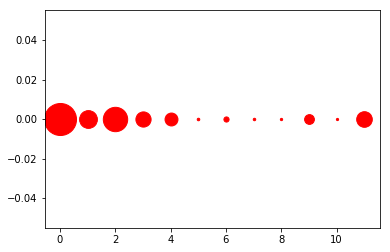

[((10, 0), 53), ((8, 0), 55), ((7, 0), 59), ((5, 0), 61), ((6, 0), 124), ((9, 0), 235), ((4, 0), 310), ((3, 0), 365), ((11, 0), 375), ((1, 0), 427), ((2, 0), 585), ((0, 0), 769)]
1080


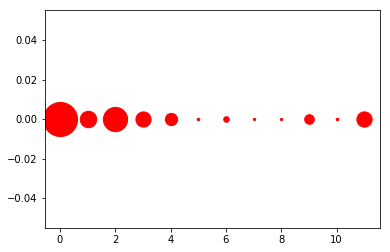

[((7, 0), 54), ((8, 0), 55), ((10, 0), 60), ((5, 0), 62), ((6, 0), 133), ((9, 0), 231), ((4, 0), 295), ((3, 0), 365), ((11, 0), 366), ((1, 0), 396), ((2, 0), 582), ((0, 0), 819)]
1081


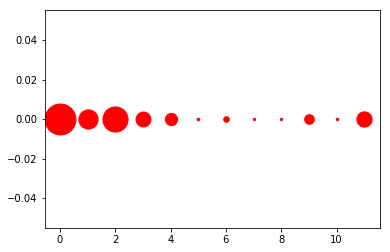

[((7, 0), 54), ((8, 0), 55), ((10, 0), 60), ((5, 0), 62), ((6, 0), 133), ((9, 0), 231), ((4, 0), 293), ((3, 0), 358), ((11, 0), 366), ((1, 0), 461), ((2, 0), 603), ((0, 0), 742)]
1082


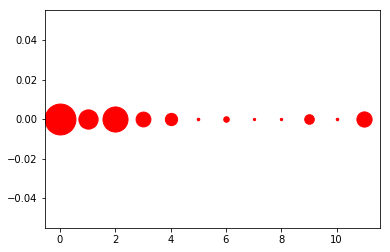

[((7, 0), 54), ((8, 0), 56), ((10, 0), 61), ((5, 0), 62), ((6, 0), 133), ((9, 0), 230), ((4, 0), 295), ((3, 0), 356), ((11, 0), 365), ((1, 0), 462), ((2, 0), 602), ((0, 0), 742)]
1083


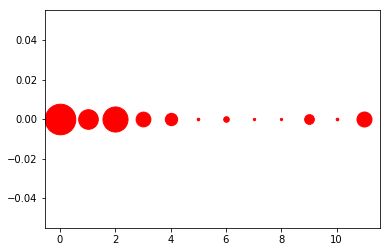

[((8, 0), 54), ((7, 0), 55), ((5, 0), 62), ((10, 0), 63), ((6, 0), 134), ((9, 0), 233), ((4, 0), 296), ((3, 0), 355), ((11, 0), 360), ((1, 0), 470), ((2, 0), 602), ((0, 0), 734)]
1084


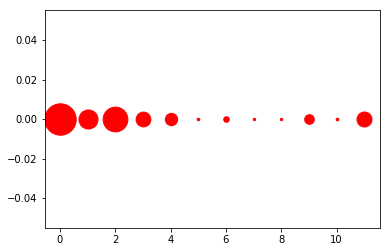

[((8, 0), 55), ((7, 0), 56), ((5, 0), 62), ((10, 0), 64), ((6, 0), 133), ((9, 0), 231), ((4, 0), 296), ((3, 0), 355), ((11, 0), 360), ((1, 0), 458), ((2, 0), 594), ((0, 0), 754)]
1085


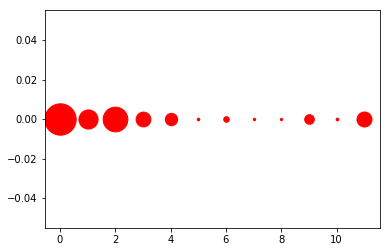

[((8, 0), 54), ((7, 0), 57), ((5, 0), 62), ((10, 0), 64), ((6, 0), 133), ((9, 0), 231), ((4, 0), 296), ((3, 0), 356), ((11, 0), 360), ((1, 0), 459), ((2, 0), 593), ((0, 0), 753)]
1086


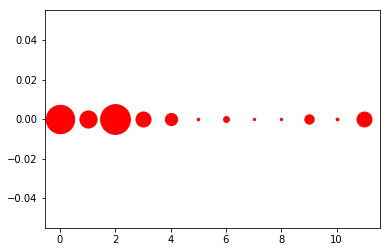

[((7, 0), 53), ((8, 0), 56), ((5, 0), 60), ((10, 0), 66), ((6, 0), 140), ((9, 0), 224), ((4, 0), 293), ((11, 0), 358), ((3, 0), 361), ((1, 0), 412), ((0, 0), 680), ((2, 0), 715)]
1087


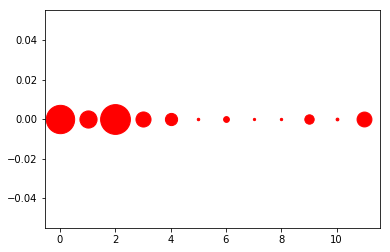

[((7, 0), 54), ((8, 0), 56), ((5, 0), 59), ((10, 0), 66), ((6, 0), 139), ((9, 0), 225), ((4, 0), 293), ((11, 0), 357), ((3, 0), 362), ((1, 0), 412), ((0, 0), 680), ((2, 0), 715)]
1088


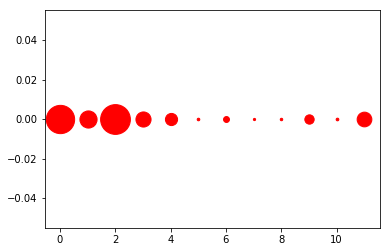

[((7, 0), 53), ((8, 0), 59), ((5, 0), 62), ((10, 0), 64), ((6, 0), 142), ((9, 0), 224), ((4, 0), 292), ((11, 0), 353), ((3, 0), 363), ((1, 0), 412), ((0, 0), 679), ((2, 0), 715)]
1089


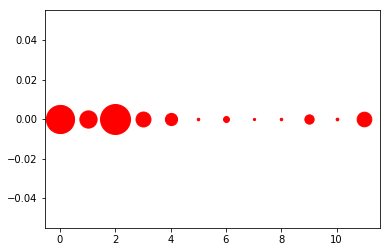

[((7, 0), 53), ((8, 0), 60), ((5, 0), 61), ((10, 0), 65), ((6, 0), 143), ((9, 0), 223), ((4, 0), 293), ((11, 0), 352), ((3, 0), 359), ((1, 0), 414), ((0, 0), 676), ((2, 0), 719)]
1090


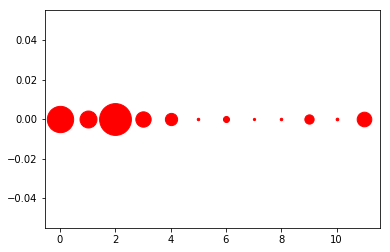

[((7, 0), 53), ((5, 0), 59), ((8, 0), 60), ((10, 0), 64), ((6, 0), 145), ((9, 0), 223), ((4, 0), 294), ((11, 0), 351), ((3, 0), 368), ((1, 0), 407), ((0, 0), 631), ((2, 0), 763)]
1091


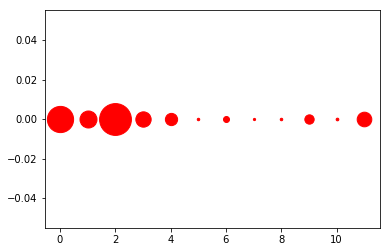

[((7, 0), 53), ((5, 0), 59), ((8, 0), 60), ((10, 0), 64), ((6, 0), 144), ((9, 0), 224), ((4, 0), 294), ((11, 0), 351), ((3, 0), 368), ((1, 0), 408), ((0, 0), 629), ((2, 0), 764)]
1092


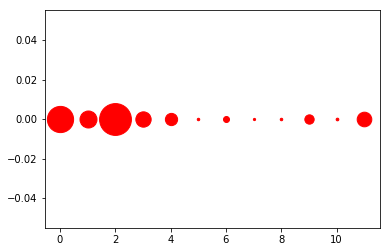

[((7, 0), 53), ((5, 0), 59), ((8, 0), 60), ((10, 0), 64), ((6, 0), 144), ((9, 0), 224), ((4, 0), 294), ((11, 0), 351), ((3, 0), 368), ((1, 0), 408), ((0, 0), 629), ((2, 0), 764)]
1093


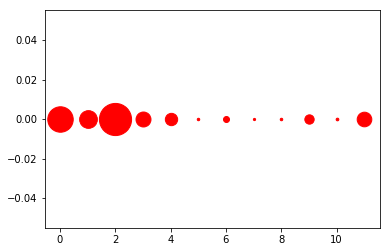

[((7, 0), 53), ((5, 0), 59), ((8, 0), 60), ((10, 0), 64), ((6, 0), 144), ((9, 0), 224), ((4, 0), 296), ((11, 0), 351), ((3, 0), 359), ((1, 0), 425), ((0, 0), 611), ((2, 0), 772)]
1094


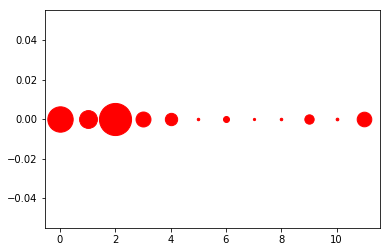

[((7, 0), 53), ((5, 0), 59), ((8, 0), 60), ((10, 0), 64), ((6, 0), 144), ((9, 0), 224), ((4, 0), 296), ((11, 0), 351), ((3, 0), 359), ((1, 0), 428), ((0, 0), 609), ((2, 0), 771)]
1095


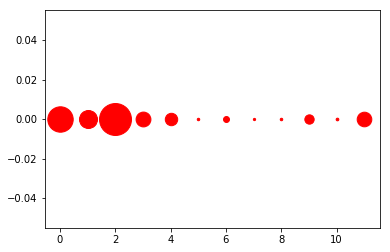

[((7, 0), 54), ((5, 0), 59), ((8, 0), 60), ((10, 0), 64), ((6, 0), 143), ((9, 0), 224), ((4, 0), 298), ((11, 0), 351), ((3, 0), 356), ((1, 0), 432), ((0, 0), 610), ((2, 0), 767)]
1096


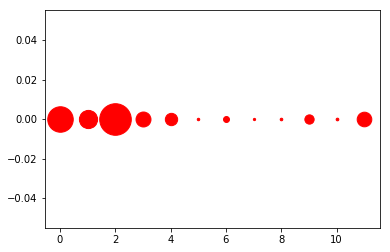

[((7, 0), 54), ((5, 0), 59), ((8, 0), 62), ((10, 0), 64), ((6, 0), 143), ((9, 0), 223), ((4, 0), 296), ((11, 0), 351), ((3, 0), 359), ((1, 0), 437), ((0, 0), 612), ((2, 0), 758)]
1097


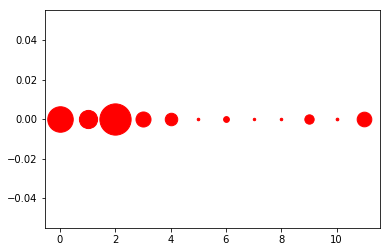

[((7, 0), 58), ((8, 0), 60), ((5, 0), 61), ((10, 0), 64), ((6, 0), 139), ((9, 0), 224), ((4, 0), 300), ((11, 0), 352), ((3, 0), 361), ((1, 0), 437), ((0, 0), 612), ((2, 0), 750)]
1098


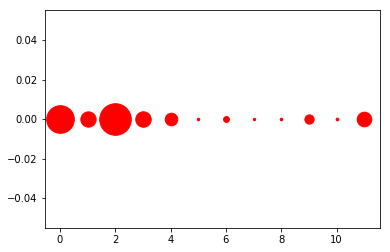

[((7, 0), 56), ((5, 0), 60), ((8, 0), 62), ((10, 0), 65), ((6, 0), 141), ((9, 0), 222), ((4, 0), 302), ((11, 0), 351), ((1, 0), 367), ((3, 0), 371), ((0, 0), 663), ((2, 0), 758)]
1099


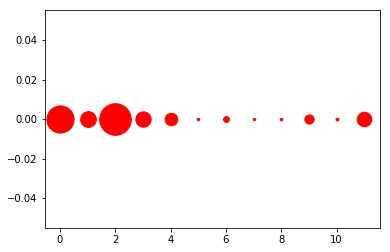

[((7, 0), 56), ((5, 0), 60), ((8, 0), 62), ((10, 0), 67), ((6, 0), 141), ((9, 0), 222), ((4, 0), 303), ((11, 0), 349), ((3, 0), 368), ((1, 0), 378), ((0, 0), 653), ((2, 0), 759)]
1100


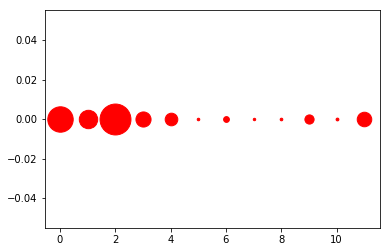

[((7, 0), 58), ((5, 0), 61), ((8, 0), 63), ((10, 0), 67), ((6, 0), 139), ((9, 0), 221), ((4, 0), 303), ((11, 0), 349), ((3, 0), 363), ((1, 0), 442), ((0, 0), 610), ((2, 0), 742)]
1101


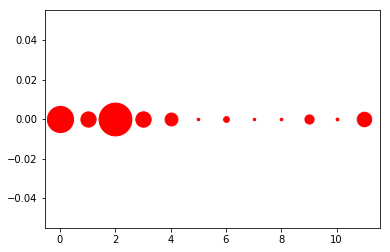

[((7, 0), 58), ((5, 0), 60), ((8, 0), 63), ((10, 0), 67), ((6, 0), 140), ((9, 0), 220), ((4, 0), 309), ((11, 0), 349), ((1, 0), 366), ((3, 0), 370), ((0, 0), 628), ((2, 0), 788)]
1102


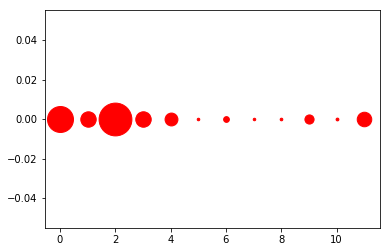

[((7, 0), 60), ((5, 0), 61), ((8, 0), 63), ((10, 0), 67), ((6, 0), 138), ((9, 0), 220), ((4, 0), 309), ((11, 0), 349), ((1, 0), 370), ((3, 0), 371), ((0, 0), 623), ((2, 0), 787)]
1103


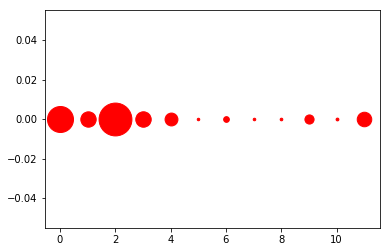

[((5, 0), 60), ((7, 0), 61), ((8, 0), 63), ((10, 0), 67), ((6, 0), 137), ((9, 0), 220), ((4, 0), 309), ((11, 0), 349), ((1, 0), 369), ((3, 0), 371), ((0, 0), 624), ((2, 0), 788)]
1104


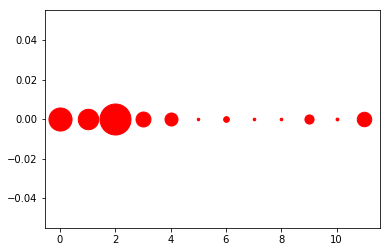

[((5, 0), 60), ((7, 0), 62), ((8, 0), 63), ((10, 0), 68), ((6, 0), 137), ((9, 0), 220), ((4, 0), 312), ((11, 0), 348), ((3, 0), 359), ((1, 0), 491), ((0, 0), 554), ((2, 0), 744)]
1105


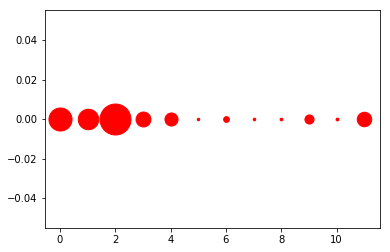

[((5, 0), 59), ((7, 0), 62), ((8, 0), 64), ((10, 0), 68), ((6, 0), 138), ((9, 0), 219), ((4, 0), 314), ((11, 0), 348), ((3, 0), 358), ((1, 0), 492), ((0, 0), 553), ((2, 0), 743)]
1106


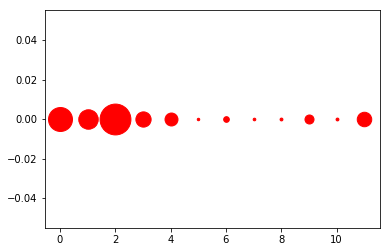

[((5, 0), 59), ((7, 0), 63), ((8, 0), 68), ((10, 0), 68), ((6, 0), 136), ((9, 0), 217), ((4, 0), 311), ((11, 0), 348), ((3, 0), 366), ((1, 0), 467), ((0, 0), 575), ((2, 0), 740)]
1107


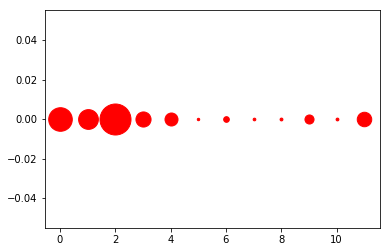

[((5, 0), 58), ((7, 0), 64), ((10, 0), 67), ((8, 0), 68), ((6, 0), 136), ((9, 0), 218), ((4, 0), 312), ((11, 0), 348), ((3, 0), 363), ((1, 0), 474), ((0, 0), 566), ((2, 0), 744)]
1108


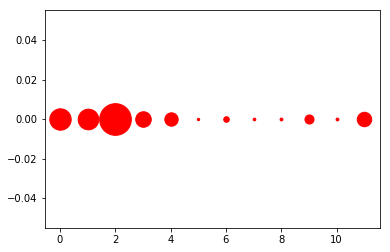

[((5, 0), 56), ((7, 0), 64), ((8, 0), 68), ((10, 0), 68), ((6, 0), 134), ((9, 0), 218), ((4, 0), 321), ((11, 0), 347), ((3, 0), 373), ((1, 0), 495), ((0, 0), 513), ((2, 0), 761)]
1109


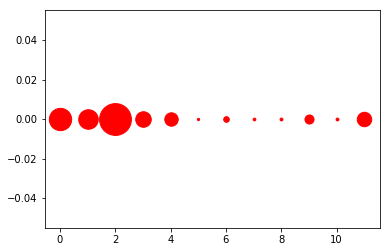

[((5, 0), 54), ((7, 0), 65), ((8, 0), 68), ((10, 0), 68), ((6, 0), 135), ((9, 0), 218), ((4, 0), 322), ((11, 0), 347), ((3, 0), 373), ((1, 0), 469), ((0, 0), 535), ((2, 0), 764)]
1110


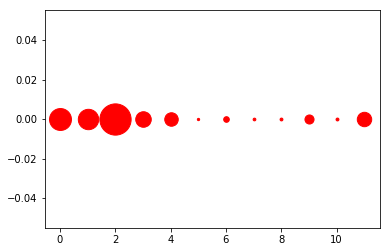

[((5, 0), 55), ((7, 0), 65), ((8, 0), 68), ((10, 0), 69), ((6, 0), 135), ((9, 0), 218), ((4, 0), 324), ((11, 0), 346), ((3, 0), 373), ((1, 0), 489), ((0, 0), 526), ((2, 0), 750)]
1111


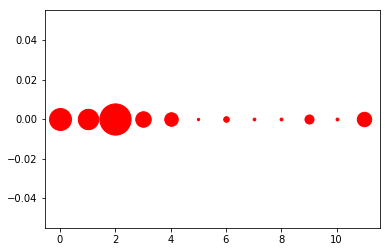

[((5, 0), 55), ((7, 0), 66), ((8, 0), 68), ((10, 0), 69), ((6, 0), 135), ((9, 0), 217), ((4, 0), 325), ((11, 0), 346), ((3, 0), 372), ((1, 0), 490), ((0, 0), 526), ((2, 0), 749)]
1112


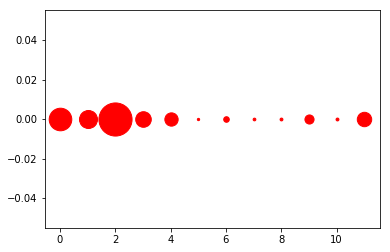

[((5, 0), 55), ((7, 0), 65), ((8, 0), 68), ((10, 0), 69), ((6, 0), 134), ((9, 0), 219), ((4, 0), 319), ((11, 0), 346), ((3, 0), 374), ((1, 0), 432), ((0, 0), 542), ((2, 0), 795)]
1113


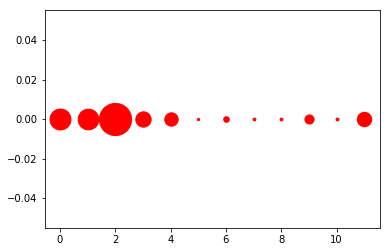

[((5, 0), 55), ((7, 0), 66), ((8, 0), 68), ((10, 0), 69), ((6, 0), 134), ((9, 0), 219), ((4, 0), 321), ((11, 0), 346), ((3, 0), 368), ((1, 0), 496), ((0, 0), 503), ((2, 0), 773)]
1114


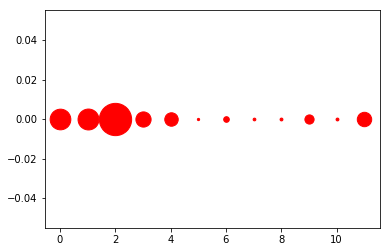

[((5, 0), 54), ((7, 0), 65), ((8, 0), 68), ((10, 0), 68), ((6, 0), 135), ((9, 0), 221), ((4, 0), 323), ((11, 0), 346), ((3, 0), 365), ((0, 0), 496), ((1, 0), 502), ((2, 0), 775)]
1115


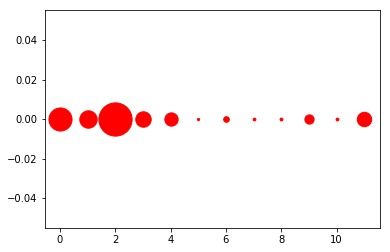

[((5, 0), 54), ((7, 0), 66), ((10, 0), 67), ((8, 0), 68), ((6, 0), 135), ((9, 0), 222), ((4, 0), 319), ((11, 0), 346), ((3, 0), 371), ((1, 0), 418), ((0, 0), 554), ((2, 0), 798)]
1116


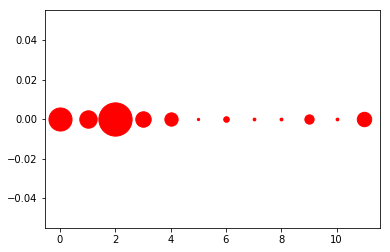

[((5, 0), 54), ((7, 0), 66), ((10, 0), 67), ((8, 0), 68), ((6, 0), 134), ((9, 0), 223), ((4, 0), 319), ((11, 0), 346), ((3, 0), 371), ((1, 0), 418), ((0, 0), 554), ((2, 0), 798)]
1117


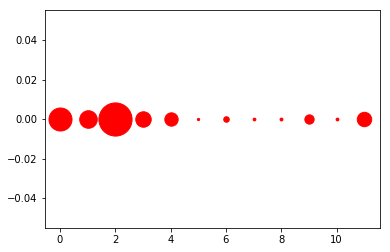

[((5, 0), 54), ((7, 0), 66), ((10, 0), 67), ((8, 0), 69), ((6, 0), 133), ((9, 0), 223), ((4, 0), 320), ((11, 0), 346), ((3, 0), 371), ((1, 0), 421), ((0, 0), 552), ((2, 0), 796)]
1118


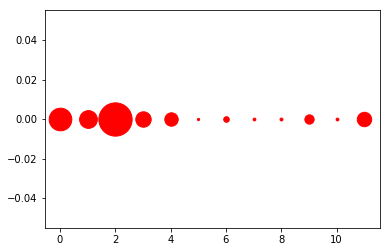

[((5, 0), 53), ((7, 0), 66), ((10, 0), 67), ((8, 0), 69), ((6, 0), 134), ((9, 0), 223), ((4, 0), 322), ((11, 0), 346), ((3, 0), 370), ((1, 0), 426), ((0, 0), 543), ((2, 0), 799)]
1119


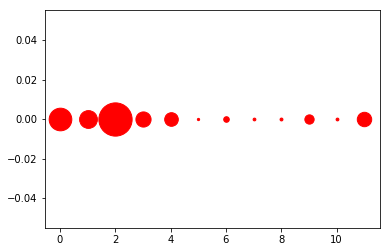

[((5, 0), 54), ((7, 0), 66), ((10, 0), 67), ((8, 0), 69), ((6, 0), 134), ((9, 0), 223), ((4, 0), 327), ((11, 0), 346), ((3, 0), 364), ((1, 0), 427), ((0, 0), 543), ((2, 0), 798)]
1120


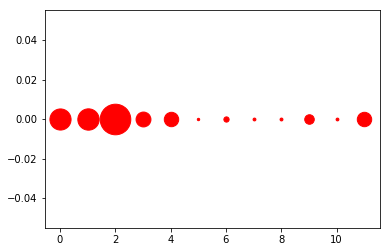

[((5, 0), 57), ((10, 0), 67), ((7, 0), 68), ((8, 0), 69), ((6, 0), 126), ((9, 0), 229), ((11, 0), 346), ((4, 0), 346), ((3, 0), 357), ((0, 0), 507), ((1, 0), 512), ((2, 0), 734)]
1121


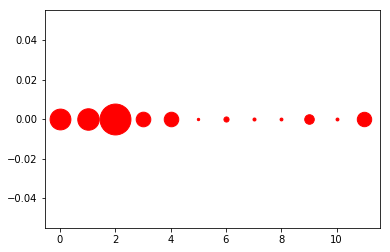

[((5, 0), 56), ((8, 0), 68), ((10, 0), 69), ((7, 0), 72), ((6, 0), 123), ((9, 0), 229), ((11, 0), 346), ((4, 0), 349), ((3, 0), 351), ((0, 0), 499), ((1, 0), 515), ((2, 0), 741)]
1122


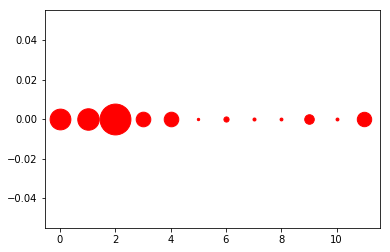

[((5, 0), 56), ((8, 0), 68), ((10, 0), 69), ((7, 0), 72), ((6, 0), 124), ((9, 0), 229), ((11, 0), 346), ((4, 0), 350), ((3, 0), 351), ((0, 0), 498), ((1, 0), 515), ((2, 0), 740)]
1123


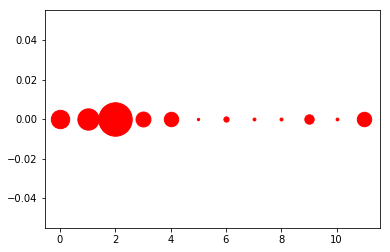

[((5, 0), 55), ((10, 0), 67), ((7, 0), 69), ((8, 0), 70), ((6, 0), 126), ((9, 0), 225), ((11, 0), 346), ((4, 0), 346), ((3, 0), 358), ((0, 0), 442), ((1, 0), 511), ((2, 0), 803)]
1124


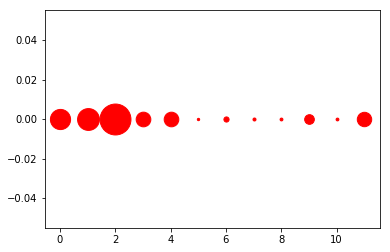

[((5, 0), 56), ((10, 0), 67), ((8, 0), 68), ((7, 0), 72), ((6, 0), 124), ((9, 0), 232), ((11, 0), 346), ((4, 0), 351), ((3, 0), 352), ((0, 0), 484), ((1, 0), 524), ((2, 0), 742)]
1125


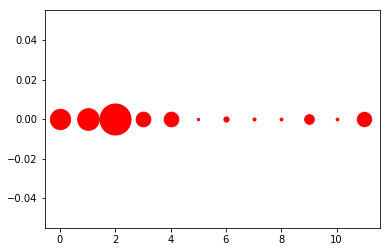

[((5, 0), 56), ((10, 0), 67), ((8, 0), 68), ((7, 0), 72), ((6, 0), 124), ((9, 0), 232), ((11, 0), 346), ((4, 0), 351), ((3, 0), 352), ((0, 0), 486), ((1, 0), 519), ((2, 0), 745)]
1126


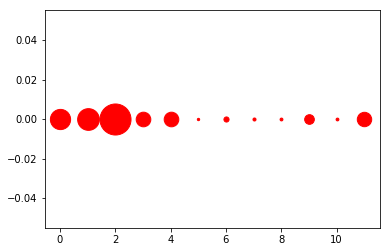

[((5, 0), 56), ((10, 0), 67), ((8, 0), 68), ((7, 0), 73), ((6, 0), 123), ((9, 0), 232), ((11, 0), 346), ((4, 0), 351), ((3, 0), 351), ((0, 0), 485), ((1, 0), 521), ((2, 0), 745)]
1127


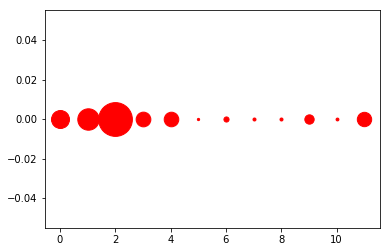

[((5, 0), 54), ((10, 0), 68), ((8, 0), 72), ((7, 0), 72), ((6, 0), 123), ((9, 0), 224), ((11, 0), 345), ((4, 0), 350), ((3, 0), 353), ((0, 0), 432), ((1, 0), 514), ((2, 0), 811)]
1128


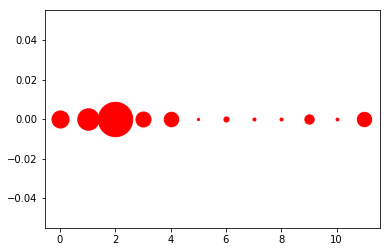

[((5, 0), 54), ((10, 0), 68), ((8, 0), 72), ((7, 0), 72), ((6, 0), 123), ((9, 0), 223), ((11, 0), 345), ((4, 0), 349), ((3, 0), 361), ((0, 0), 410), ((1, 0), 515), ((2, 0), 826)]
1129


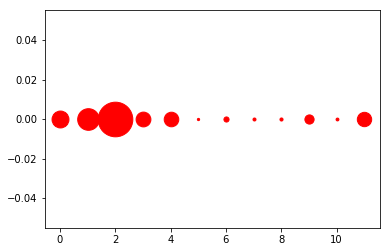

[((5, 0), 54), ((10, 0), 68), ((7, 0), 72), ((8, 0), 74), ((6, 0), 123), ((9, 0), 221), ((11, 0), 345), ((4, 0), 350), ((3, 0), 355), ((0, 0), 406), ((1, 0), 519), ((2, 0), 831)]
1130


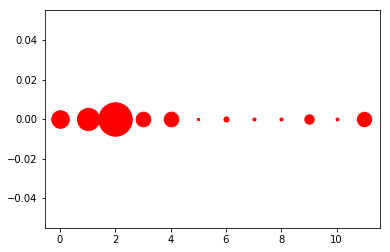

[((5, 0), 55), ((10, 0), 68), ((8, 0), 72), ((7, 0), 72), ((6, 0), 122), ((9, 0), 225), ((11, 0), 345), ((4, 0), 352), ((3, 0), 352), ((0, 0), 422), ((1, 0), 531), ((2, 0), 802)]
1131


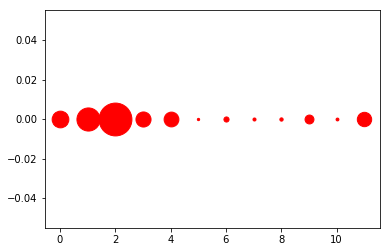

[((5, 0), 55), ((10, 0), 68), ((7, 0), 73), ((8, 0), 79), ((6, 0), 123), ((9, 0), 214), ((11, 0), 345), ((4, 0), 355), ((3, 0), 362), ((0, 0), 401), ((1, 0), 555), ((2, 0), 788)]
1132


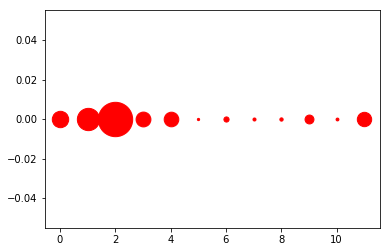

[((5, 0), 54), ((10, 0), 68), ((7, 0), 73), ((8, 0), 79), ((6, 0), 124), ((9, 0), 214), ((11, 0), 345), ((4, 0), 351), ((3, 0), 356), ((0, 0), 394), ((1, 0), 535), ((2, 0), 825)]
1133


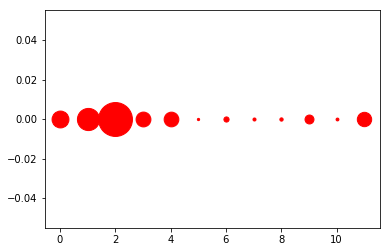

[((5, 0), 54), ((10, 0), 68), ((7, 0), 73), ((8, 0), 79), ((6, 0), 124), ((9, 0), 215), ((11, 0), 345), ((4, 0), 353), ((3, 0), 356), ((0, 0), 405), ((1, 0), 532), ((2, 0), 814)]
1134


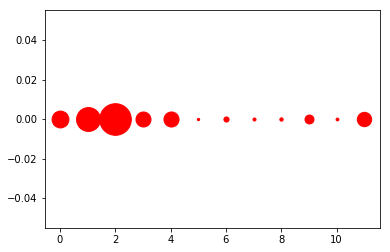

[((5, 0), 55), ((10, 0), 68), ((7, 0), 73), ((8, 0), 80), ((6, 0), 123), ((9, 0), 215), ((11, 0), 345), ((3, 0), 360), ((4, 0), 362), ((0, 0), 405), ((1, 0), 573), ((2, 0), 759)]
1135


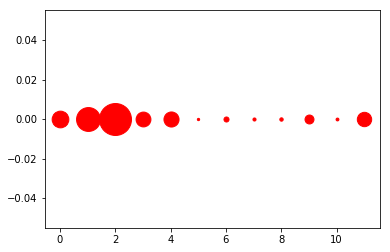

[((5, 0), 55), ((10, 0), 68), ((7, 0), 74), ((8, 0), 81), ((6, 0), 121), ((9, 0), 215), ((11, 0), 345), ((3, 0), 356), ((4, 0), 362), ((0, 0), 401), ((1, 0), 573), ((2, 0), 767)]
1136


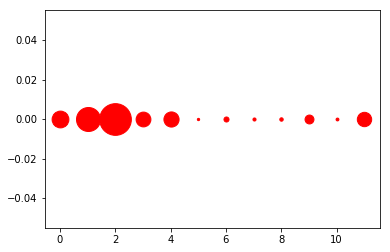

[((5, 0), 55), ((10, 0), 68), ((7, 0), 74), ((8, 0), 82), ((6, 0), 121), ((9, 0), 214), ((11, 0), 345), ((3, 0), 355), ((4, 0), 364), ((0, 0), 403), ((1, 0), 576), ((2, 0), 761)]
1137


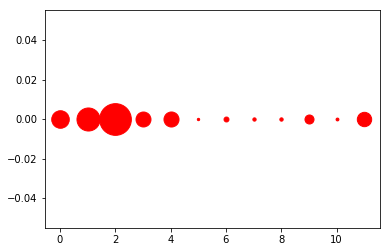

[((5, 0), 56), ((10, 0), 68), ((7, 0), 79), ((8, 0), 80), ((6, 0), 118), ((9, 0), 217), ((11, 0), 345), ((3, 0), 359), ((4, 0), 361), ((0, 0), 421), ((1, 0), 553), ((2, 0), 761)]
1138


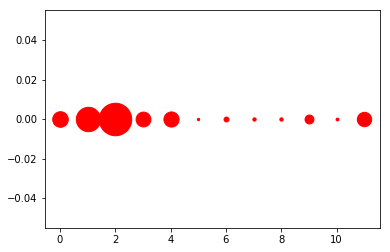

[((5, 0), 55), ((10, 0), 68), ((8, 0), 80), ((7, 0), 80), ((6, 0), 117), ((9, 0), 214), ((11, 0), 345), ((3, 0), 356), ((4, 0), 364), ((0, 0), 374), ((1, 0), 585), ((2, 0), 780)]
1139


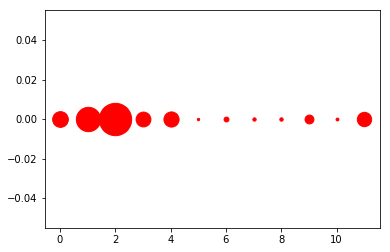

[((5, 0), 56), ((10, 0), 68), ((7, 0), 80), ((8, 0), 81), ((6, 0), 117), ((9, 0), 213), ((11, 0), 345), ((3, 0), 356), ((4, 0), 364), ((0, 0), 377), ((1, 0), 584), ((2, 0), 777)]
1140


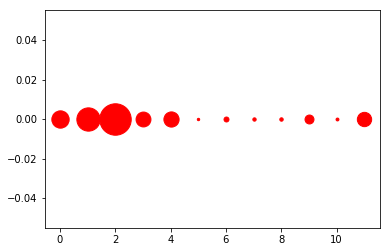

[((5, 0), 57), ((10, 0), 69), ((7, 0), 80), ((8, 0), 82), ((6, 0), 119), ((9, 0), 215), ((11, 0), 344), ((3, 0), 357), ((4, 0), 365), ((0, 0), 416), ((1, 0), 559), ((2, 0), 755)]
1141


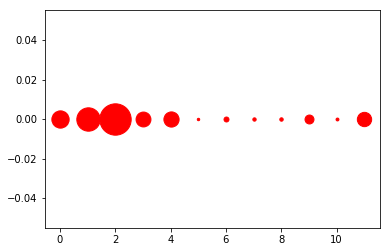

[((5, 0), 58), ((10, 0), 69), ((7, 0), 80), ((8, 0), 82), ((6, 0), 119), ((9, 0), 215), ((11, 0), 344), ((3, 0), 357), ((4, 0), 365), ((0, 0), 415), ((1, 0), 561), ((2, 0), 753)]
1142


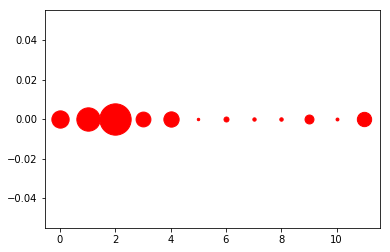

[((5, 0), 58), ((10, 0), 69), ((7, 0), 80), ((8, 0), 82), ((6, 0), 120), ((9, 0), 215), ((11, 0), 344), ((3, 0), 356), ((4, 0), 367), ((0, 0), 415), ((1, 0), 560), ((2, 0), 752)]
1143


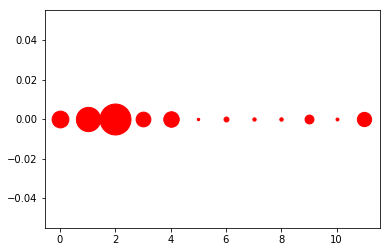

[((5, 0), 58), ((10, 0), 70), ((7, 0), 80), ((8, 0), 82), ((6, 0), 118), ((9, 0), 213), ((11, 0), 343), ((3, 0), 354), ((4, 0), 372), ((0, 0), 403), ((1, 0), 582), ((2, 0), 743)]
1144


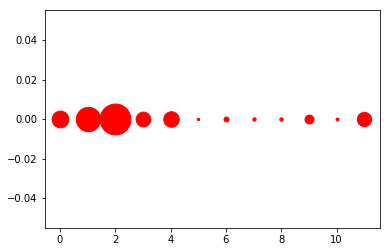

[((5, 0), 58), ((10, 0), 69), ((7, 0), 80), ((8, 0), 82), ((6, 0), 118), ((9, 0), 214), ((11, 0), 344), ((3, 0), 354), ((4, 0), 372), ((0, 0), 402), ((1, 0), 584), ((2, 0), 741)]
1145


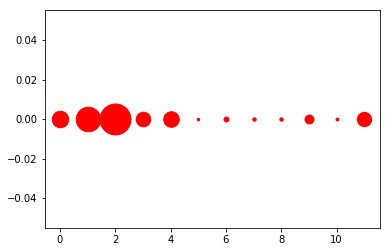

[((5, 0), 59), ((10, 0), 69), ((8, 0), 81), ((7, 0), 82), ((6, 0), 118), ((9, 0), 214), ((11, 0), 344), ((3, 0), 351), ((4, 0), 373), ((0, 0), 396), ((1, 0), 589), ((2, 0), 742)]
1146


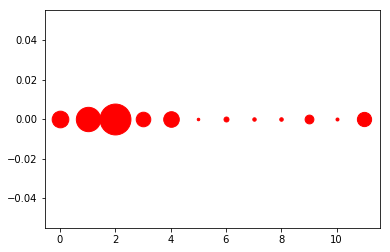

[((5, 0), 60), ((10, 0), 71), ((7, 0), 82), ((8, 0), 84), ((6, 0), 119), ((9, 0), 211), ((11, 0), 342), ((3, 0), 350), ((4, 0), 374), ((0, 0), 400), ((1, 0), 584), ((2, 0), 741)]
1147


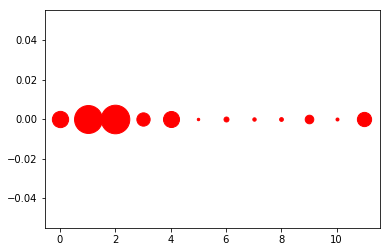

[((5, 0), 58), ((10, 0), 71), ((7, 0), 81), ((8, 0), 90), ((6, 0), 119), ((9, 0), 206), ((3, 0), 319), ((11, 0), 342), ((4, 0), 385), ((0, 0), 391), ((1, 0), 670), ((2, 0), 686)]
1148


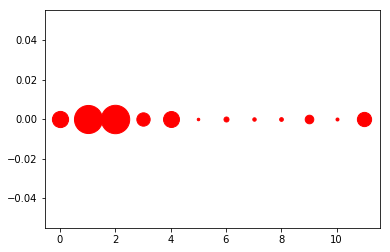

[((5, 0), 60), ((10, 0), 71), ((7, 0), 82), ((8, 0), 89), ((6, 0), 120), ((9, 0), 206), ((3, 0), 320), ((11, 0), 342), ((4, 0), 383), ((0, 0), 389), ((1, 0), 674), ((2, 0), 682)]
1149


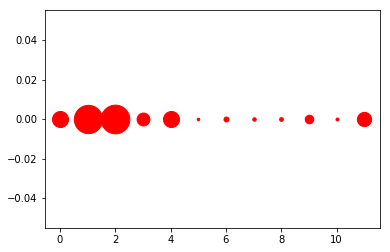

[((5, 0), 61), ((10, 0), 71), ((7, 0), 83), ((8, 0), 89), ((6, 0), 119), ((9, 0), 206), ((3, 0), 309), ((11, 0), 342), ((0, 0), 385), ((4, 0), 385), ((1, 0), 679), ((2, 0), 689)]
1150


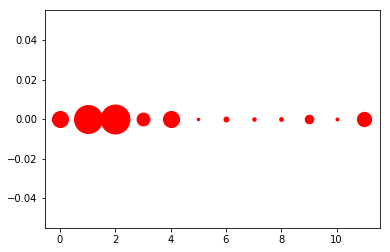

[((5, 0), 61), ((10, 0), 71), ((7, 0), 83), ((8, 0), 90), ((6, 0), 119), ((9, 0), 205), ((3, 0), 309), ((11, 0), 342), ((0, 0), 386), ((4, 0), 386), ((1, 0), 671), ((2, 0), 695)]
1151


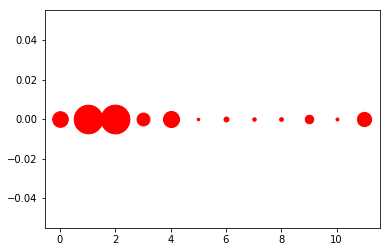

[((5, 0), 61), ((10, 0), 71), ((7, 0), 83), ((8, 0), 90), ((6, 0), 118), ((9, 0), 205), ((3, 0), 310), ((11, 0), 342), ((0, 0), 375), ((4, 0), 386), ((1, 0), 686), ((2, 0), 691)]
1152


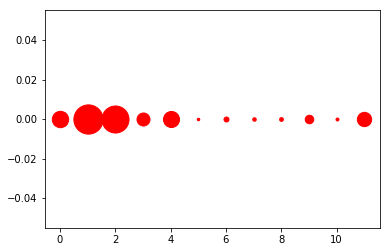

[((5, 0), 61), ((10, 0), 71), ((7, 0), 84), ((8, 0), 90), ((6, 0), 120), ((9, 0), 205), ((3, 0), 312), ((11, 0), 344), ((4, 0), 386), ((0, 0), 394), ((2, 0), 649), ((1, 0), 702)]
1153


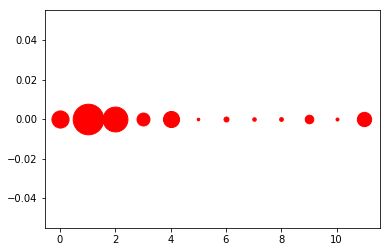

[((5, 0), 62), ((10, 0), 71), ((7, 0), 84), ((8, 0), 90), ((6, 0), 120), ((9, 0), 206), ((3, 0), 311), ((11, 0), 344), ((4, 0), 387), ((0, 0), 412), ((2, 0), 597), ((1, 0), 734)]
1154


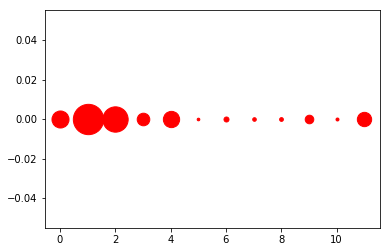

[((5, 0), 63), ((10, 0), 71), ((7, 0), 86), ((8, 0), 90), ((6, 0), 120), ((9, 0), 206), ((3, 0), 302), ((11, 0), 344), ((4, 0), 391), ((0, 0), 409), ((2, 0), 608), ((1, 0), 728)]
1155


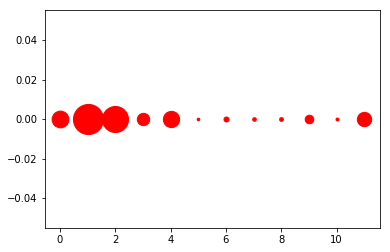

[((5, 0), 63), ((10, 0), 71), ((7, 0), 86), ((8, 0), 90), ((6, 0), 120), ((9, 0), 206), ((3, 0), 297), ((11, 0), 344), ((4, 0), 391), ((0, 0), 403), ((2, 0), 625), ((1, 0), 722)]
1156


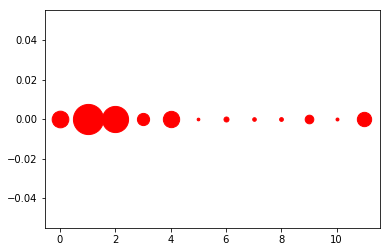

[((5, 0), 64), ((10, 0), 70), ((7, 0), 86), ((8, 0), 90), ((6, 0), 120), ((9, 0), 207), ((3, 0), 293), ((11, 0), 344), ((4, 0), 392), ((0, 0), 400), ((2, 0), 628), ((1, 0), 724)]
1157


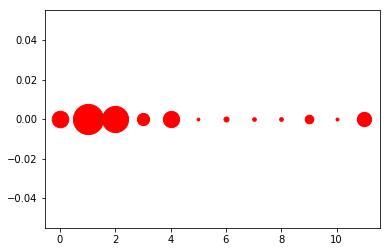

[((5, 0), 65), ((10, 0), 70), ((7, 0), 87), ((8, 0), 89), ((6, 0), 121), ((9, 0), 207), ((3, 0), 293), ((11, 0), 344), ((4, 0), 391), ((0, 0), 399), ((2, 0), 628), ((1, 0), 724)]
1158


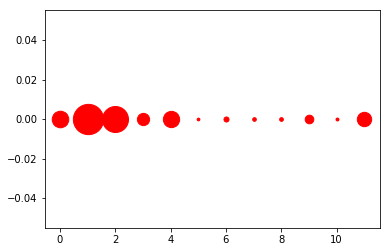

[((5, 0), 65), ((10, 0), 70), ((7, 0), 87), ((8, 0), 89), ((6, 0), 121), ((9, 0), 207), ((3, 0), 294), ((11, 0), 345), ((4, 0), 391), ((0, 0), 398), ((2, 0), 624), ((1, 0), 727)]
1159


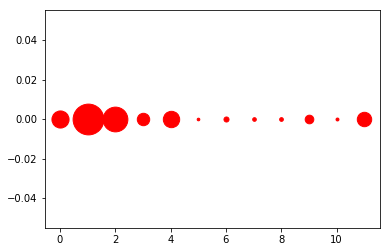

[((5, 0), 63), ((10, 0), 70), ((7, 0), 87), ((8, 0), 89), ((6, 0), 121), ((9, 0), 207), ((3, 0), 298), ((11, 0), 346), ((4, 0), 393), ((0, 0), 411), ((2, 0), 594), ((1, 0), 739)]
1160


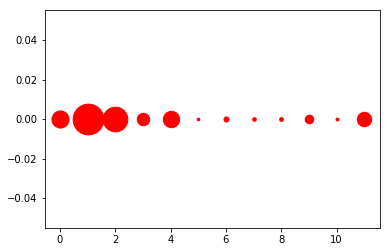

[((5, 0), 64), ((10, 0), 70), ((7, 0), 87), ((8, 0), 90), ((6, 0), 121), ((9, 0), 206), ((3, 0), 299), ((11, 0), 346), ((4, 0), 393), ((0, 0), 411), ((2, 0), 593), ((1, 0), 738)]
1161


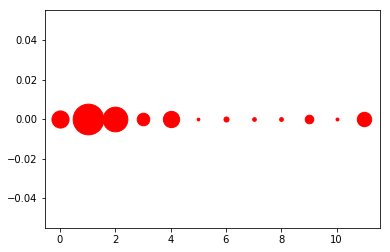

[((5, 0), 65), ((10, 0), 70), ((7, 0), 88), ((8, 0), 90), ((6, 0), 121), ((9, 0), 206), ((3, 0), 302), ((11, 0), 346), ((4, 0), 391), ((0, 0), 411), ((2, 0), 592), ((1, 0), 736)]
1162


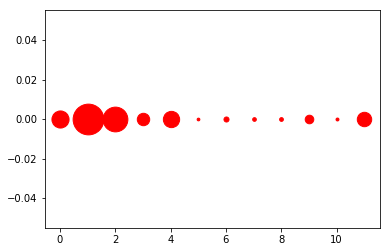

[((5, 0), 65), ((10, 0), 70), ((7, 0), 88), ((8, 0), 90), ((6, 0), 121), ((9, 0), 206), ((3, 0), 298), ((11, 0), 346), ((4, 0), 391), ((0, 0), 411), ((2, 0), 594), ((1, 0), 738)]
1163


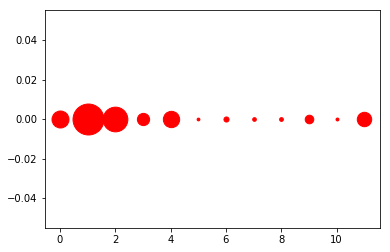

[((5, 0), 66), ((10, 0), 70), ((7, 0), 88), ((8, 0), 90), ((6, 0), 122), ((9, 0), 206), ((3, 0), 294), ((11, 0), 346), ((4, 0), 392), ((0, 0), 408), ((2, 0), 593), ((1, 0), 743)]
1164


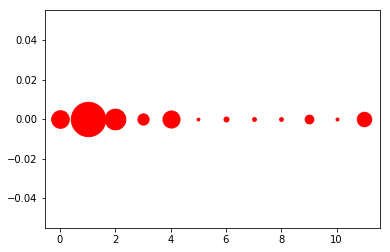

[((5, 0), 67), ((10, 0), 71), ((8, 0), 89), ((7, 0), 91), ((6, 0), 120), ((9, 0), 210), ((3, 0), 269), ((11, 0), 347), ((4, 0), 410), ((0, 0), 423), ((2, 0), 497), ((1, 0), 824)]
1165


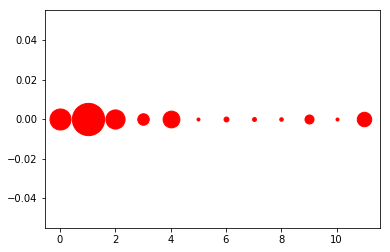

[((5, 0), 71), ((10, 0), 71), ((8, 0), 84), ((7, 0), 93), ((6, 0), 118), ((9, 0), 216), ((3, 0), 276), ((11, 0), 347), ((4, 0), 403), ((2, 0), 460), ((0, 0), 504), ((1, 0), 775)]
1166


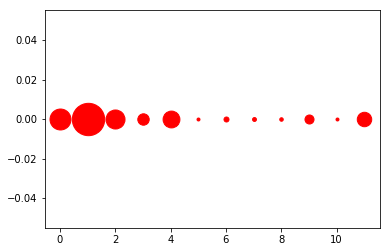

[((5, 0), 71), ((10, 0), 71), ((8, 0), 84), ((7, 0), 93), ((6, 0), 120), ((9, 0), 217), ((3, 0), 274), ((11, 0), 347), ((4, 0), 404), ((2, 0), 457), ((0, 0), 503), ((1, 0), 777)]
1167


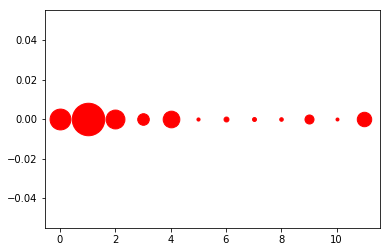

[((10, 0), 71), ((5, 0), 75), ((8, 0), 85), ((7, 0), 94), ((6, 0), 118), ((9, 0), 217), ((3, 0), 278), ((11, 0), 347), ((4, 0), 400), ((2, 0), 453), ((0, 0), 500), ((1, 0), 780)]
1168


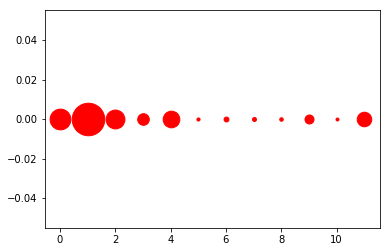

[((10, 0), 71), ((5, 0), 75), ((8, 0), 84), ((7, 0), 95), ((6, 0), 117), ((9, 0), 216), ((3, 0), 279), ((11, 0), 349), ((4, 0), 400), ((2, 0), 453), ((0, 0), 498), ((1, 0), 781)]
1169


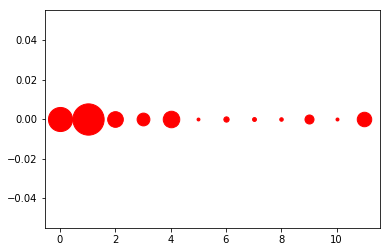

[((5, 0), 69), ((10, 0), 71), ((8, 0), 84), ((7, 0), 93), ((6, 0), 127), ((9, 0), 217), ((3, 0), 307), ((11, 0), 348), ((2, 0), 376), ((4, 0), 397), ((0, 0), 578), ((1, 0), 751)]
1170


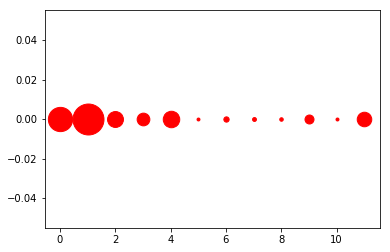

[((5, 0), 70), ((10, 0), 71), ((8, 0), 84), ((7, 0), 93), ((6, 0), 127), ((9, 0), 216), ((3, 0), 305), ((11, 0), 349), ((2, 0), 382), ((4, 0), 396), ((0, 0), 582), ((1, 0), 743)]
1171


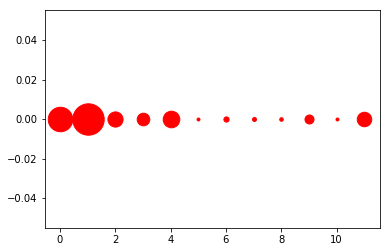

[((5, 0), 70), ((10, 0), 71), ((8, 0), 85), ((7, 0), 95), ((6, 0), 125), ((9, 0), 216), ((3, 0), 303), ((11, 0), 348), ((2, 0), 364), ((4, 0), 399), ((0, 0), 588), ((1, 0), 754)]
1172


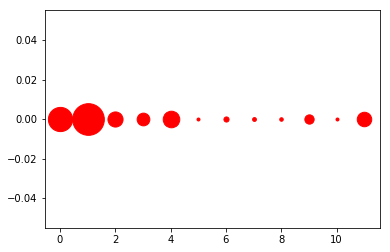

[((5, 0), 71), ((10, 0), 71), ((8, 0), 84), ((7, 0), 91), ((6, 0), 123), ((9, 0), 223), ((3, 0), 305), ((11, 0), 348), ((2, 0), 363), ((4, 0), 398), ((0, 0), 581), ((1, 0), 760)]
1173


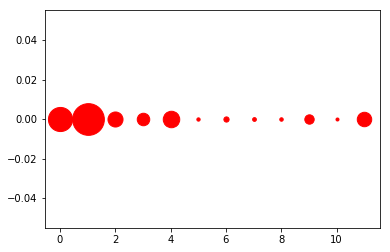

[((10, 0), 72), ((5, 0), 79), ((8, 0), 83), ((7, 0), 90), ((6, 0), 125), ((9, 0), 225), ((3, 0), 300), ((11, 0), 347), ((2, 0), 361), ((4, 0), 396), ((0, 0), 579), ((1, 0), 761)]
1174


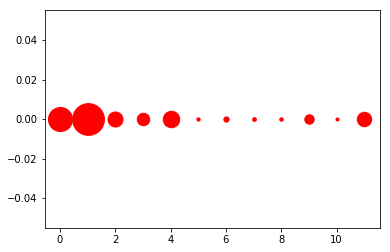

[((10, 0), 72), ((5, 0), 79), ((8, 0), 83), ((7, 0), 90), ((6, 0), 126), ((9, 0), 226), ((3, 0), 299), ((11, 0), 346), ((2, 0), 361), ((4, 0), 396), ((0, 0), 577), ((1, 0), 763)]
1175


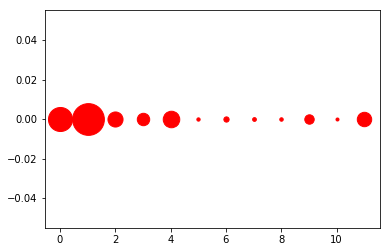

[((10, 0), 72), ((5, 0), 79), ((8, 0), 83), ((7, 0), 90), ((6, 0), 126), ((9, 0), 226), ((3, 0), 298), ((11, 0), 346), ((2, 0), 362), ((4, 0), 397), ((0, 0), 577), ((1, 0), 762)]
1176


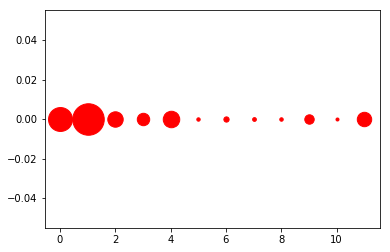

[((10, 0), 72), ((5, 0), 81), ((8, 0), 83), ((7, 0), 90), ((6, 0), 126), ((9, 0), 226), ((3, 0), 298), ((11, 0), 346), ((2, 0), 370), ((4, 0), 396), ((0, 0), 574), ((1, 0), 756)]
1177


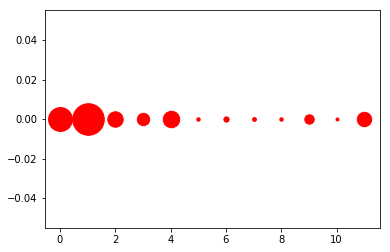

[((10, 0), 72), ((5, 0), 82), ((8, 0), 82), ((7, 0), 91), ((6, 0), 126), ((9, 0), 226), ((3, 0), 297), ((11, 0), 346), ((2, 0), 370), ((4, 0), 396), ((0, 0), 572), ((1, 0), 758)]
1178


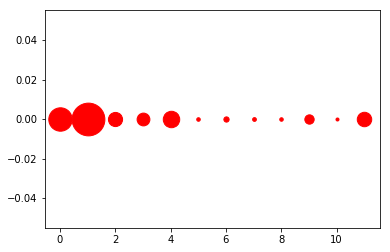

[((10, 0), 72), ((8, 0), 84), ((5, 0), 85), ((7, 0), 90), ((6, 0), 126), ((9, 0), 224), ((3, 0), 307), ((2, 0), 340), ((11, 0), 347), ((4, 0), 395), ((0, 0), 562), ((1, 0), 786)]
1179


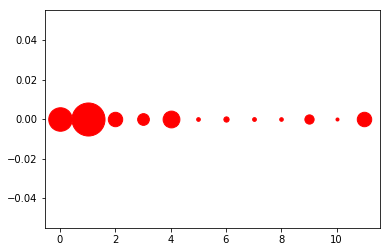

[((10, 0), 72), ((8, 0), 86), ((5, 0), 88), ((7, 0), 90), ((6, 0), 126), ((9, 0), 222), ((3, 0), 281), ((2, 0), 346), ((11, 0), 347), ((4, 0), 403), ((0, 0), 564), ((1, 0), 793)]
1180


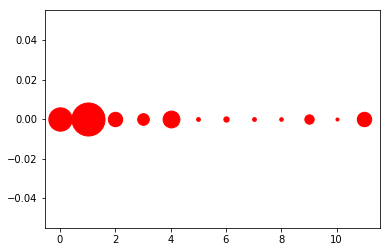

[((10, 0), 73), ((8, 0), 85), ((5, 0), 90), ((7, 0), 90), ((6, 0), 127), ((9, 0), 224), ((3, 0), 280), ((11, 0), 346), ((2, 0), 346), ((4, 0), 404), ((0, 0), 560), ((1, 0), 793)]
1181


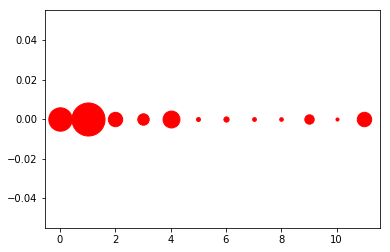

[((10, 0), 73), ((8, 0), 86), ((7, 0), 90), ((5, 0), 94), ((6, 0), 125), ((9, 0), 225), ((3, 0), 274), ((2, 0), 345), ((11, 0), 346), ((4, 0), 406), ((0, 0), 561), ((1, 0), 793)]
1182


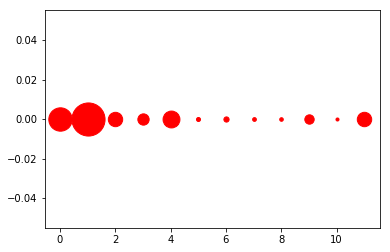

[((10, 0), 73), ((8, 0), 86), ((7, 0), 90), ((5, 0), 96), ((6, 0), 125), ((9, 0), 225), ((3, 0), 271), ((2, 0), 345), ((11, 0), 346), ((4, 0), 405), ((0, 0), 561), ((1, 0), 795)]
1183


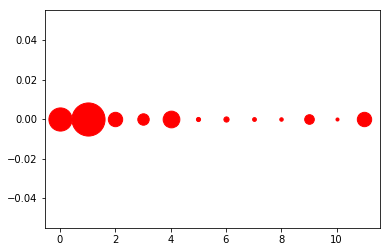

[((10, 0), 73), ((8, 0), 83), ((7, 0), 91), ((5, 0), 99), ((6, 0), 125), ((9, 0), 231), ((3, 0), 274), ((11, 0), 345), ((2, 0), 345), ((4, 0), 401), ((0, 0), 556), ((1, 0), 795)]
1184


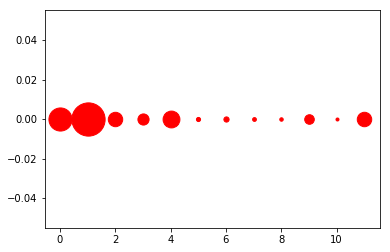

[((10, 0), 72), ((8, 0), 83), ((7, 0), 91), ((5, 0), 99), ((6, 0), 125), ((9, 0), 230), ((3, 0), 268), ((2, 0), 346), ((11, 0), 347), ((4, 0), 404), ((0, 0), 555), ((1, 0), 798)]
1185


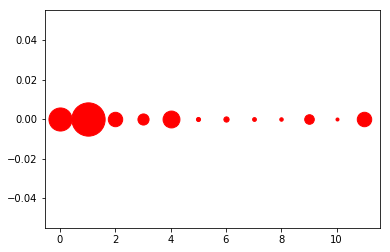

[((10, 0), 72), ((8, 0), 83), ((7, 0), 91), ((5, 0), 98), ((6, 0), 126), ((9, 0), 230), ((3, 0), 267), ((2, 0), 346), ((11, 0), 347), ((4, 0), 405), ((0, 0), 554), ((1, 0), 799)]
1186


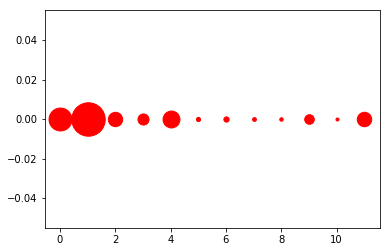

[((10, 0), 72), ((8, 0), 83), ((7, 0), 91), ((5, 0), 99), ((6, 0), 126), ((9, 0), 230), ((3, 0), 266), ((2, 0), 345), ((11, 0), 347), ((4, 0), 406), ((0, 0), 550), ((1, 0), 803)]
1187


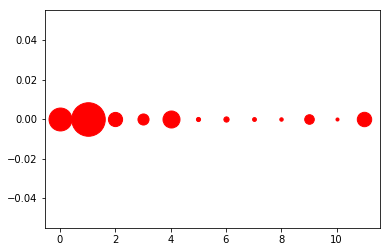

[((10, 0), 73), ((8, 0), 82), ((7, 0), 92), ((5, 0), 99), ((6, 0), 126), ((9, 0), 230), ((3, 0), 266), ((2, 0), 341), ((11, 0), 346), ((4, 0), 408), ((0, 0), 550), ((1, 0), 805)]
1188


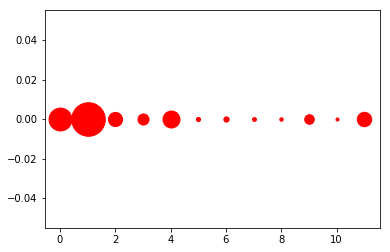

[((10, 0), 73), ((8, 0), 82), ((7, 0), 92), ((5, 0), 100), ((6, 0), 126), ((9, 0), 230), ((3, 0), 266), ((2, 0), 340), ((11, 0), 346), ((4, 0), 408), ((0, 0), 549), ((1, 0), 806)]
1189


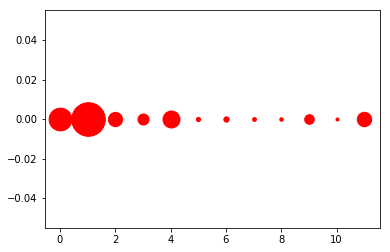

[((10, 0), 73), ((8, 0), 83), ((7, 0), 91), ((5, 0), 100), ((6, 0), 127), ((9, 0), 230), ((3, 0), 265), ((2, 0), 342), ((11, 0), 346), ((4, 0), 408), ((0, 0), 546), ((1, 0), 807)]
1190


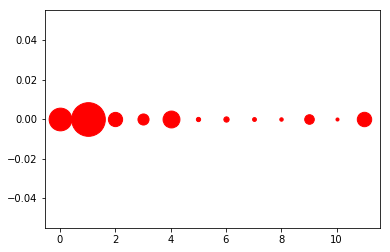

[((10, 0), 73), ((8, 0), 82), ((7, 0), 92), ((5, 0), 102), ((6, 0), 127), ((9, 0), 230), ((3, 0), 266), ((2, 0), 342), ((11, 0), 346), ((4, 0), 405), ((0, 0), 545), ((1, 0), 808)]
1191


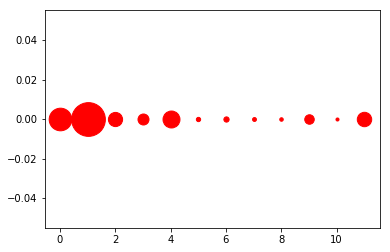

[((10, 0), 73), ((8, 0), 84), ((7, 0), 93), ((5, 0), 103), ((6, 0), 126), ((9, 0), 228), ((3, 0), 264), ((2, 0), 341), ((11, 0), 346), ((4, 0), 407), ((0, 0), 543), ((1, 0), 810)]
1192


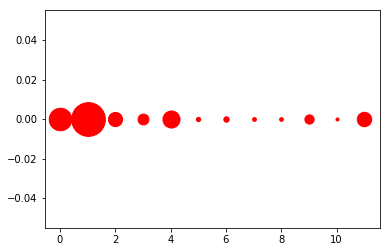

[((10, 0), 73), ((8, 0), 89), ((7, 0), 91), ((5, 0), 103), ((6, 0), 129), ((9, 0), 222), ((3, 0), 261), ((2, 0), 341), ((11, 0), 347), ((4, 0), 410), ((0, 0), 541), ((1, 0), 811)]
1193


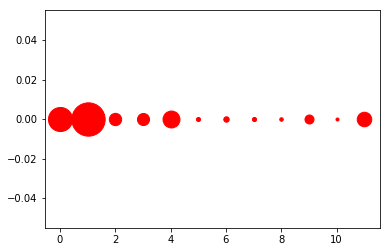

[((10, 0), 72), ((8, 0), 84), ((5, 0), 97), ((7, 0), 99), ((6, 0), 130), ((9, 0), 216), ((3, 0), 290), ((2, 0), 296), ((11, 0), 349), ((4, 0), 407), ((0, 0), 578), ((1, 0), 800)]
1194


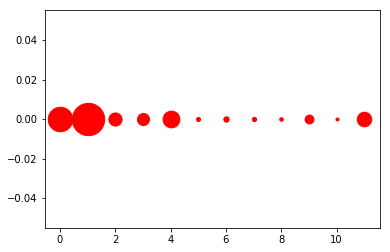

[((10, 0), 72), ((8, 0), 85), ((5, 0), 95), ((7, 0), 101), ((6, 0), 128), ((9, 0), 213), ((3, 0), 290), ((2, 0), 316), ((11, 0), 349), ((4, 0), 403), ((0, 0), 589), ((1, 0), 777)]
1195


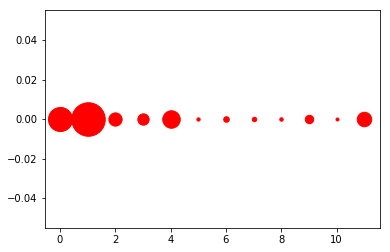

[((10, 0), 72), ((5, 0), 79), ((8, 0), 83), ((7, 0), 107), ((6, 0), 134), ((9, 0), 202), ((3, 0), 272), ((2, 0), 318), ((11, 0), 348), ((4, 0), 420), ((0, 0), 578), ((1, 0), 805)]
1196


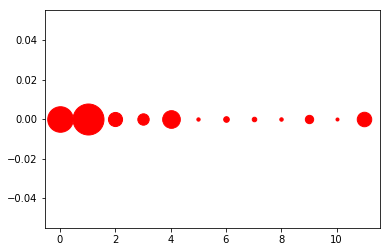

[((10, 0), 72), ((5, 0), 79), ((8, 0), 82), ((7, 0), 109), ((6, 0), 135), ((9, 0), 200), ((3, 0), 273), ((2, 0), 339), ((11, 0), 348), ((4, 0), 424), ((0, 0), 613), ((1, 0), 744)]
1197


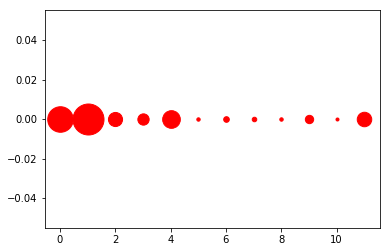

[((10, 0), 72), ((5, 0), 81), ((8, 0), 82), ((7, 0), 109), ((6, 0), 135), ((9, 0), 200), ((3, 0), 271), ((2, 0), 339), ((11, 0), 348), ((4, 0), 424), ((0, 0), 613), ((1, 0), 744)]
1198


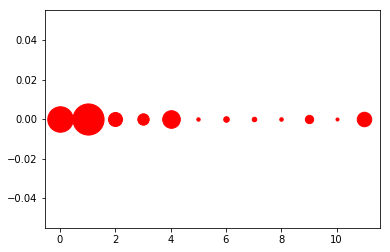

[((10, 0), 72), ((5, 0), 81), ((8, 0), 84), ((7, 0), 109), ((6, 0), 134), ((9, 0), 199), ((3, 0), 273), ((2, 0), 336), ((11, 0), 348), ((4, 0), 423), ((0, 0), 611), ((1, 0), 748)]
1199


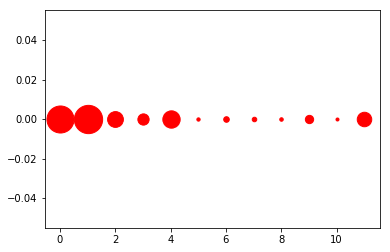

[((10, 0), 72), ((5, 0), 79), ((8, 0), 84), ((7, 0), 109), ((6, 0), 134), ((9, 0), 199), ((3, 0), 270), ((11, 0), 348), ((2, 0), 379), ((4, 0), 416), ((0, 0), 649), ((1, 0), 679)]
1200


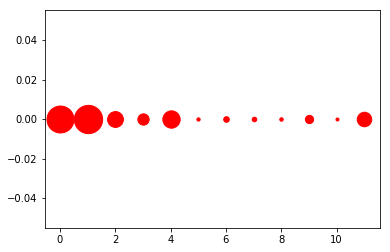

[((10, 0), 72), ((5, 0), 79), ((8, 0), 83), ((7, 0), 110), ((6, 0), 135), ((9, 0), 198), ((3, 0), 271), ((11, 0), 348), ((2, 0), 380), ((4, 0), 416), ((0, 0), 647), ((1, 0), 679)]
1201


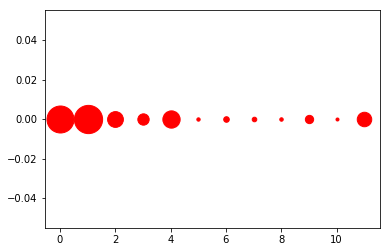

[((10, 0), 72), ((5, 0), 80), ((8, 0), 83), ((7, 0), 110), ((6, 0), 134), ((9, 0), 199), ((3, 0), 272), ((11, 0), 348), ((2, 0), 379), ((4, 0), 415), ((0, 0), 648), ((1, 0), 678)]
1202


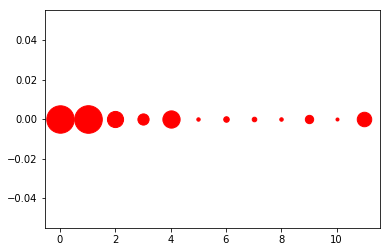

[((10, 0), 72), ((5, 0), 81), ((8, 0), 83), ((7, 0), 110), ((6, 0), 133), ((9, 0), 200), ((3, 0), 269), ((11, 0), 348), ((2, 0), 388), ((4, 0), 414), ((0, 0), 658), ((1, 0), 662)]
1203


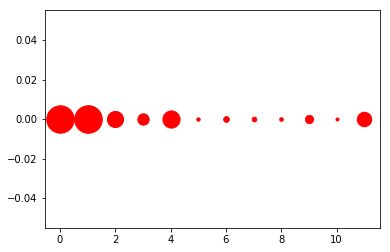

[((10, 0), 72), ((5, 0), 80), ((8, 0), 85), ((7, 0), 111), ((6, 0), 135), ((9, 0), 196), ((3, 0), 271), ((11, 0), 347), ((2, 0), 388), ((4, 0), 413), ((0, 0), 658), ((1, 0), 662)]
1204


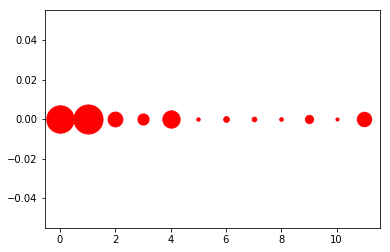

[((10, 0), 73), ((5, 0), 81), ((8, 0), 85), ((7, 0), 111), ((6, 0), 135), ((9, 0), 196), ((3, 0), 267), ((11, 0), 346), ((2, 0), 355), ((4, 0), 415), ((0, 0), 657), ((1, 0), 697)]
1205


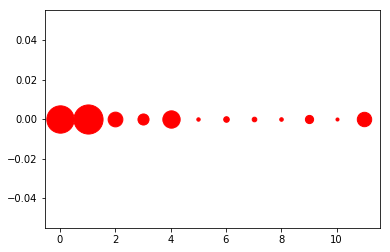

[((10, 0), 73), ((5, 0), 81), ((8, 0), 85), ((7, 0), 111), ((6, 0), 134), ((9, 0), 197), ((3, 0), 266), ((11, 0), 346), ((2, 0), 354), ((4, 0), 416), ((0, 0), 656), ((1, 0), 699)]
1206


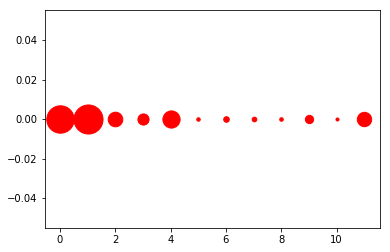

[((10, 0), 73), ((5, 0), 83), ((8, 0), 85), ((7, 0), 112), ((6, 0), 134), ((9, 0), 198), ((3, 0), 268), ((11, 0), 345), ((2, 0), 351), ((4, 0), 413), ((0, 0), 658), ((1, 0), 698)]
1207


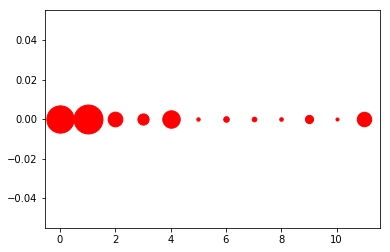

[((10, 0), 73), ((5, 0), 81), ((8, 0), 85), ((7, 0), 112), ((6, 0), 134), ((9, 0), 196), ((3, 0), 269), ((11, 0), 347), ((2, 0), 353), ((4, 0), 419), ((0, 0), 655), ((1, 0), 694)]
1208


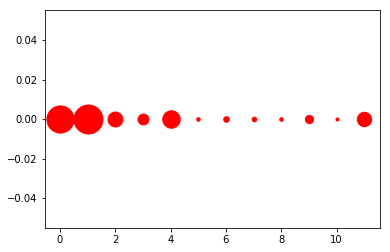

[((10, 0), 73), ((5, 0), 84), ((8, 0), 85), ((7, 0), 112), ((6, 0), 134), ((9, 0), 197), ((3, 0), 262), ((11, 0), 346), ((2, 0), 358), ((4, 0), 420), ((0, 0), 652), ((1, 0), 695)]
1209


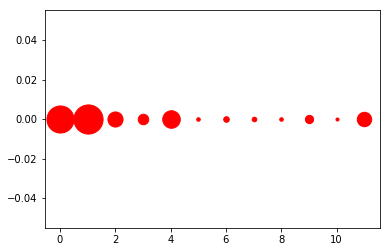

[((10, 0), 73), ((8, 0), 85), ((5, 0), 85), ((7, 0), 111), ((6, 0), 134), ((9, 0), 198), ((3, 0), 252), ((11, 0), 346), ((2, 0), 363), ((4, 0), 421), ((0, 0), 650), ((1, 0), 700)]
1210


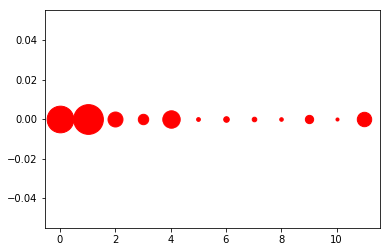

[((10, 0), 73), ((8, 0), 85), ((5, 0), 90), ((7, 0), 110), ((6, 0), 134), ((9, 0), 199), ((3, 0), 250), ((11, 0), 346), ((2, 0), 359), ((4, 0), 418), ((0, 0), 640), ((1, 0), 714)]
1211


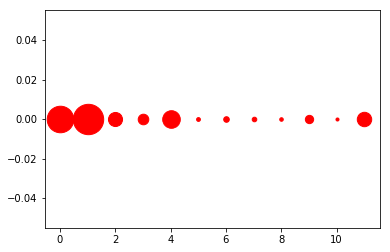

[((10, 0), 73), ((8, 0), 85), ((5, 0), 91), ((7, 0), 110), ((6, 0), 134), ((9, 0), 199), ((3, 0), 254), ((2, 0), 338), ((11, 0), 346), ((4, 0), 422), ((0, 0), 637), ((1, 0), 729)]
1212


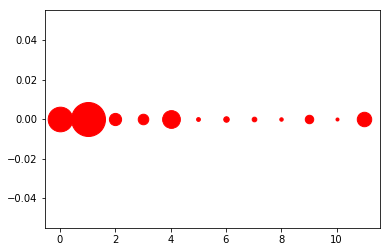

[((10, 0), 72), ((8, 0), 82), ((5, 0), 91), ((7, 0), 112), ((6, 0), 132), ((9, 0), 203), ((3, 0), 253), ((2, 0), 293), ((11, 0), 347), ((4, 0), 426), ((0, 0), 591), ((1, 0), 816)]
1213


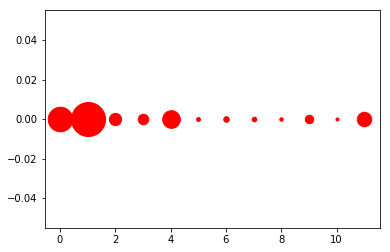

[((10, 0), 73), ((8, 0), 82), ((5, 0), 93), ((7, 0), 112), ((6, 0), 132), ((9, 0), 203), ((3, 0), 252), ((2, 0), 294), ((11, 0), 347), ((4, 0), 424), ((0, 0), 589), ((1, 0), 817)]
1214


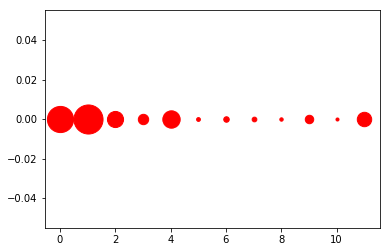

[((10, 0), 73), ((8, 0), 81), ((5, 0), 91), ((7, 0), 113), ((6, 0), 132), ((9, 0), 203), ((3, 0), 249), ((11, 0), 346), ((2, 0), 387), ((4, 0), 417), ((0, 0), 628), ((1, 0), 698)]
1215


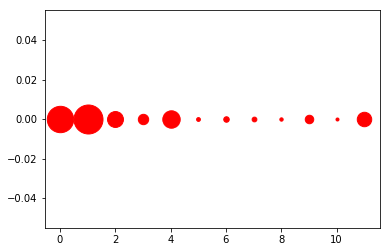

[((10, 0), 72), ((8, 0), 80), ((5, 0), 91), ((7, 0), 114), ((6, 0), 132), ((9, 0), 204), ((3, 0), 249), ((11, 0), 347), ((2, 0), 382), ((4, 0), 418), ((0, 0), 633), ((1, 0), 696)]
1216


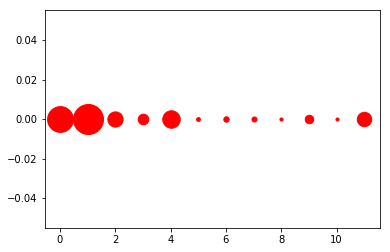

[((10, 0), 73), ((8, 0), 75), ((5, 0), 91), ((7, 0), 121), ((6, 0), 129), ((9, 0), 204), ((3, 0), 254), ((11, 0), 346), ((2, 0), 366), ((4, 0), 420), ((0, 0), 619), ((1, 0), 720)]
1217


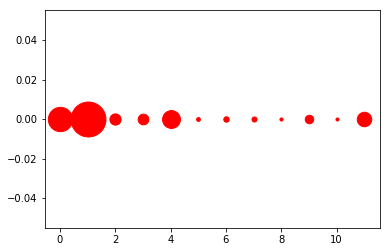

[((10, 0), 73), ((8, 0), 75), ((5, 0), 91), ((7, 0), 121), ((6, 0), 130), ((9, 0), 204), ((3, 0), 257), ((2, 0), 269), ((11, 0), 348), ((4, 0), 429), ((0, 0), 583), ((1, 0), 838)]
1218


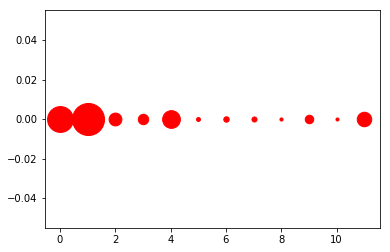

[((10, 0), 73), ((8, 0), 75), ((5, 0), 94), ((7, 0), 121), ((6, 0), 130), ((9, 0), 204), ((3, 0), 250), ((2, 0), 308), ((11, 0), 348), ((4, 0), 426), ((0, 0), 620), ((1, 0), 769)]
1219


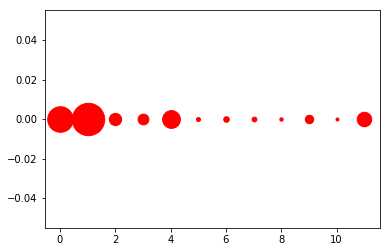

[((10, 0), 72), ((8, 0), 81), ((5, 0), 95), ((7, 0), 115), ((6, 0), 133), ((9, 0), 203), ((3, 0), 259), ((2, 0), 295), ((11, 0), 348), ((4, 0), 427), ((0, 0), 613), ((1, 0), 777)]
1220


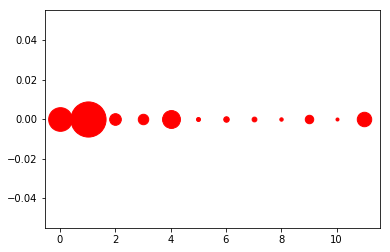

[((10, 0), 72), ((8, 0), 81), ((5, 0), 96), ((7, 0), 115), ((6, 0), 132), ((9, 0), 203), ((3, 0), 251), ((2, 0), 280), ((11, 0), 347), ((4, 0), 429), ((0, 0), 568), ((1, 0), 844)]
1221


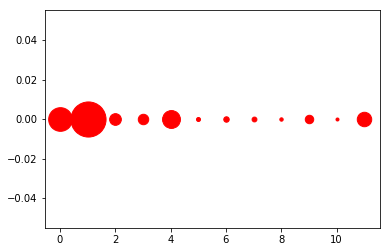

[((10, 0), 72), ((8, 0), 81), ((5, 0), 96), ((7, 0), 116), ((6, 0), 131), ((9, 0), 203), ((3, 0), 251), ((2, 0), 281), ((11, 0), 347), ((4, 0), 429), ((0, 0), 568), ((1, 0), 843)]
1222


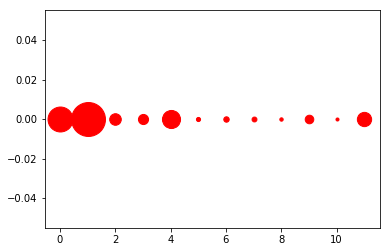

[((10, 0), 73), ((8, 0), 81), ((5, 0), 99), ((7, 0), 117), ((6, 0), 130), ((9, 0), 206), ((3, 0), 243), ((2, 0), 278), ((11, 0), 343), ((4, 0), 434), ((0, 0), 599), ((1, 0), 815)]
1223


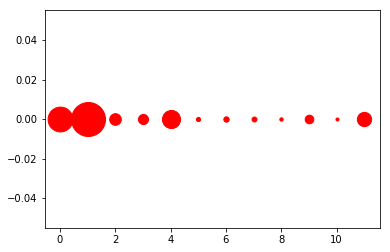

[((10, 0), 73), ((8, 0), 81), ((5, 0), 98), ((7, 0), 118), ((6, 0), 129), ((9, 0), 207), ((3, 0), 243), ((2, 0), 279), ((11, 0), 343), ((4, 0), 435), ((0, 0), 596), ((1, 0), 816)]
1224


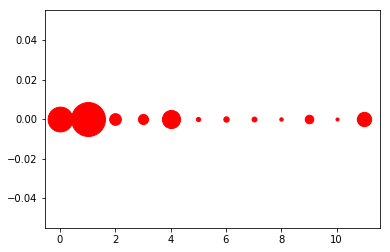

[((10, 0), 73), ((8, 0), 82), ((5, 0), 99), ((7, 0), 118), ((6, 0), 129), ((9, 0), 205), ((3, 0), 243), ((2, 0), 280), ((11, 0), 344), ((4, 0), 435), ((0, 0), 595), ((1, 0), 815)]
1225


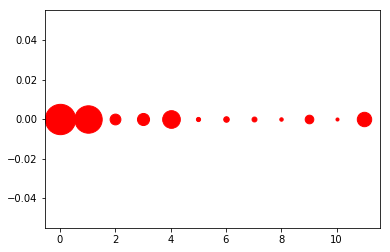

[((10, 0), 73), ((8, 0), 82), ((5, 0), 100), ((7, 0), 118), ((6, 0), 133), ((9, 0), 207), ((2, 0), 259), ((3, 0), 290), ((11, 0), 346), ((4, 0), 424), ((1, 0), 658), ((0, 0), 728)]
1226


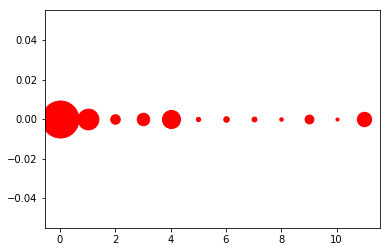

[((10, 0), 74), ((8, 0), 82), ((5, 0), 104), ((7, 0), 118), ((6, 0), 133), ((9, 0), 212), ((2, 0), 229), ((3, 0), 300), ((11, 0), 345), ((4, 0), 435), ((1, 0), 498), ((0, 0), 888)]
1227


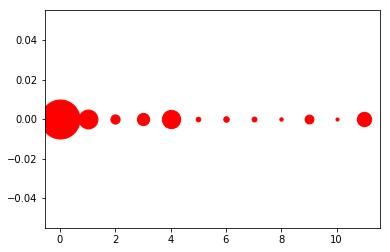

[((10, 0), 74), ((8, 0), 81), ((5, 0), 110), ((7, 0), 119), ((6, 0), 132), ((9, 0), 213), ((2, 0), 221), ((3, 0), 294), ((11, 0), 345), ((4, 0), 439), ((1, 0), 454), ((0, 0), 936)]
1228


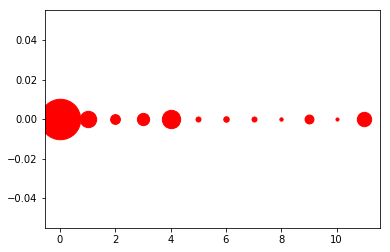

[((10, 0), 74), ((8, 0), 80), ((5, 0), 120), ((7, 0), 120), ((6, 0), 132), ((9, 0), 214), ((2, 0), 235), ((3, 0), 294), ((11, 0), 345), ((1, 0), 393), ((4, 0), 440), ((0, 0), 971)]
1229


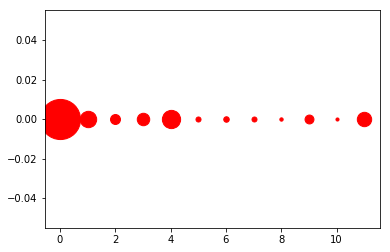

[((10, 0), 74), ((8, 0), 80), ((7, 0), 120), ((5, 0), 121), ((6, 0), 132), ((9, 0), 214), ((2, 0), 239), ((3, 0), 299), ((11, 0), 345), ((1, 0), 393), ((4, 0), 438), ((0, 0), 963)]
1230


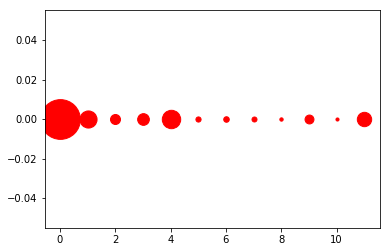

[((10, 0), 74), ((8, 0), 80), ((7, 0), 120), ((5, 0), 124), ((6, 0), 133), ((9, 0), 214), ((2, 0), 240), ((3, 0), 281), ((11, 0), 345), ((1, 0), 411), ((4, 0), 442), ((0, 0), 954)]
1231


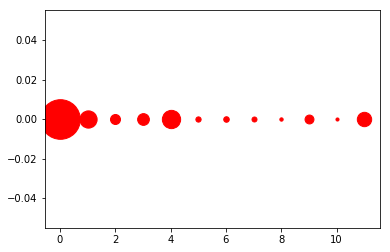

[((10, 0), 74), ((8, 0), 80), ((7, 0), 120), ((5, 0), 126), ((6, 0), 133), ((9, 0), 214), ((2, 0), 240), ((3, 0), 282), ((11, 0), 345), ((1, 0), 414), ((4, 0), 439), ((0, 0), 951)]
1232


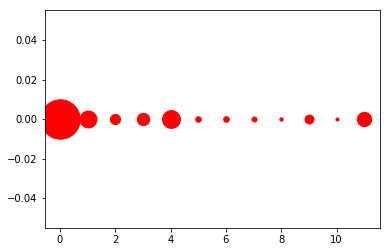

[((10, 0), 74), ((8, 0), 80), ((7, 0), 120), ((5, 0), 132), ((6, 0), 135), ((9, 0), 214), ((2, 0), 243), ((3, 0), 295), ((11, 0), 345), ((1, 0), 406), ((4, 0), 428), ((0, 0), 946)]
1233


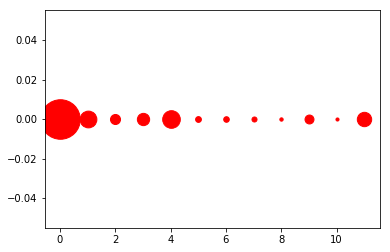

[((10, 0), 74), ((8, 0), 80), ((7, 0), 121), ((6, 0), 134), ((5, 0), 139), ((9, 0), 215), ((2, 0), 241), ((3, 0), 295), ((11, 0), 345), ((1, 0), 402), ((4, 0), 423), ((0, 0), 949)]
1234


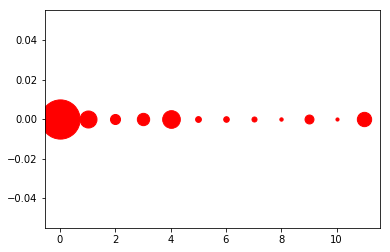

[((10, 0), 75), ((8, 0), 80), ((7, 0), 121), ((6, 0), 134), ((5, 0), 139), ((9, 0), 215), ((2, 0), 241), ((3, 0), 296), ((11, 0), 344), ((1, 0), 408), ((4, 0), 424), ((0, 0), 941)]
1235


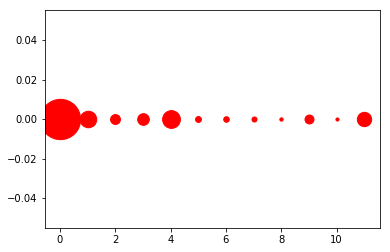

[((10, 0), 75), ((8, 0), 80), ((7, 0), 121), ((6, 0), 133), ((5, 0), 141), ((9, 0), 215), ((2, 0), 237), ((3, 0), 280), ((11, 0), 344), ((1, 0), 397), ((4, 0), 427), ((0, 0), 968)]
1236


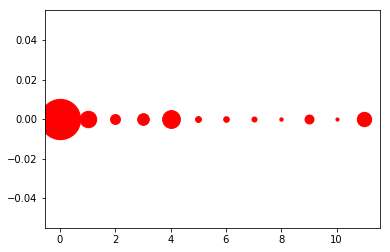

[((10, 0), 75), ((8, 0), 80), ((7, 0), 121), ((6, 0), 135), ((5, 0), 141), ((9, 0), 215), ((2, 0), 237), ((3, 0), 280), ((11, 0), 344), ((1, 0), 396), ((4, 0), 427), ((0, 0), 967)]
1237


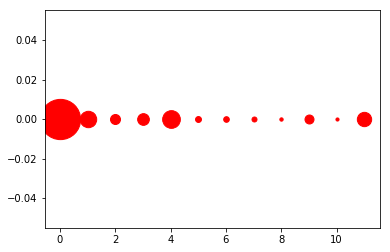

[((10, 0), 75), ((8, 0), 80), ((7, 0), 120), ((6, 0), 135), ((5, 0), 142), ((9, 0), 216), ((2, 0), 240), ((3, 0), 281), ((11, 0), 344), ((1, 0), 394), ((4, 0), 425), ((0, 0), 966)]
1238


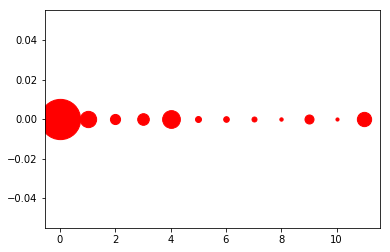

[((10, 0), 75), ((8, 0), 80), ((7, 0), 120), ((6, 0), 135), ((5, 0), 143), ((9, 0), 217), ((2, 0), 243), ((3, 0), 279), ((11, 0), 343), ((1, 0), 391), ((4, 0), 426), ((0, 0), 966)]
1239


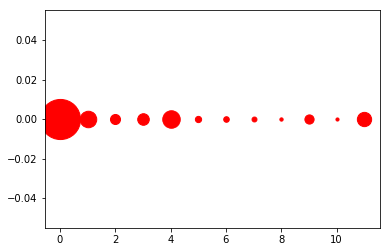

[((10, 0), 75), ((8, 0), 79), ((7, 0), 118), ((6, 0), 134), ((5, 0), 150), ((9, 0), 221), ((2, 0), 241), ((3, 0), 278), ((11, 0), 343), ((1, 0), 396), ((4, 0), 420), ((0, 0), 963)]
1240


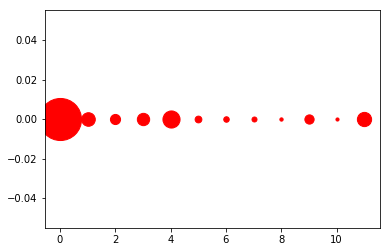

[((10, 0), 75), ((8, 0), 79), ((7, 0), 120), ((6, 0), 132), ((5, 0), 162), ((9, 0), 222), ((2, 0), 243), ((3, 0), 296), ((1, 0), 326), ((11, 0), 342), ((4, 0), 411), ((0, 0), 1010)]
1241


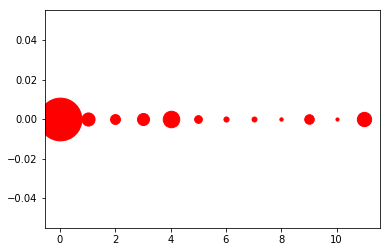

[((10, 0), 75), ((8, 0), 80), ((7, 0), 119), ((6, 0), 123), ((5, 0), 185), ((9, 0), 229), ((2, 0), 237), ((3, 0), 289), ((1, 0), 315), ((11, 0), 343), ((4, 0), 397), ((0, 0), 1026)]
1242


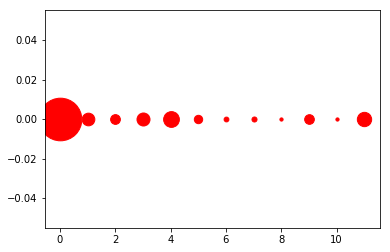

[((8, 0), 77), ((10, 0), 77), ((6, 0), 115), ((7, 0), 121), ((5, 0), 201), ((9, 0), 232), ((2, 0), 234), ((1, 0), 304), ((3, 0), 312), ((11, 0), 344), ((4, 0), 378), ((0, 0), 1023)]
1243


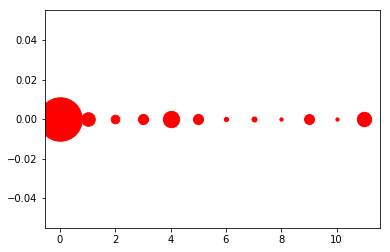

[((10, 0), 77), ((8, 0), 78), ((6, 0), 103), ((7, 0), 121), ((2, 0), 207), ((9, 0), 239), ((5, 0), 244), ((3, 0), 244), ((1, 0), 325), ((11, 0), 345), ((4, 0), 392), ((0, 0), 1043)]
1244


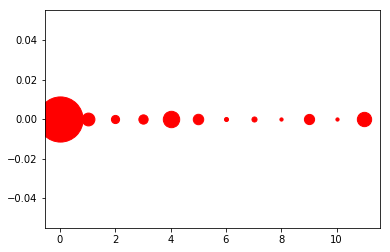

[((8, 0), 77), ((10, 0), 77), ((6, 0), 97), ((7, 0), 122), ((2, 0), 196), ((3, 0), 223), ((9, 0), 245), ((5, 0), 251), ((1, 0), 308), ((11, 0), 344), ((4, 0), 394), ((0, 0), 1084)]
1245


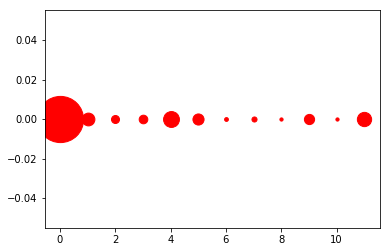

[((8, 0), 77), ((10, 0), 77), ((6, 0), 91), ((7, 0), 122), ((2, 0), 192), ((3, 0), 207), ((9, 0), 245), ((5, 0), 267), ((1, 0), 307), ((11, 0), 343), ((4, 0), 381), ((0, 0), 1109)]
1246


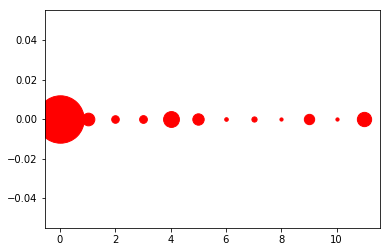

[((8, 0), 76), ((10, 0), 77), ((6, 0), 86), ((7, 0), 125), ((2, 0), 182), ((3, 0), 186), ((9, 0), 248), ((5, 0), 273), ((1, 0), 304), ((11, 0), 343), ((4, 0), 380), ((0, 0), 1138)]
1247


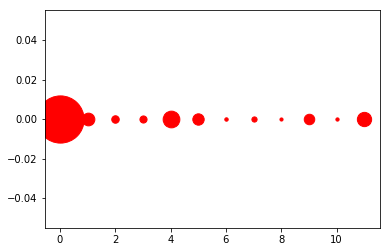

[((8, 0), 75), ((10, 0), 78), ((6, 0), 82), ((7, 0), 125), ((3, 0), 171), ((2, 0), 180), ((9, 0), 252), ((5, 0), 273), ((1, 0), 305), ((11, 0), 343), ((4, 0), 401), ((0, 0), 1133)]
1248


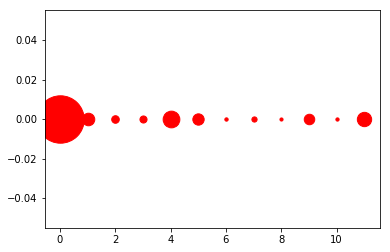

[((8, 0), 75), ((10, 0), 78), ((6, 0), 80), ((7, 0), 125), ((3, 0), 170), ((2, 0), 182), ((9, 0), 252), ((5, 0), 272), ((1, 0), 301), ((11, 0), 344), ((4, 0), 401), ((0, 0), 1138)]
1249


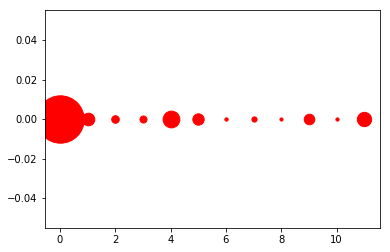

[((8, 0), 75), ((10, 0), 78), ((6, 0), 80), ((7, 0), 125), ((3, 0), 169), ((2, 0), 182), ((9, 0), 253), ((5, 0), 272), ((1, 0), 302), ((11, 0), 343), ((4, 0), 402), ((0, 0), 1137)]
1250


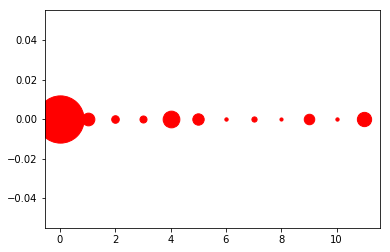

[((8, 0), 75), ((10, 0), 79), ((6, 0), 80), ((7, 0), 125), ((3, 0), 169), ((2, 0), 182), ((9, 0), 252), ((5, 0), 273), ((1, 0), 305), ((11, 0), 343), ((4, 0), 401), ((0, 0), 1134)]
1251


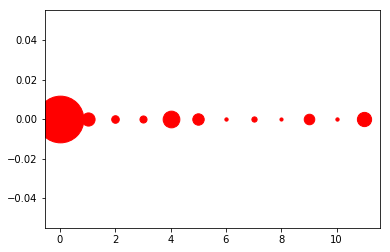

[((8, 0), 75), ((6, 0), 79), ((10, 0), 79), ((7, 0), 126), ((3, 0), 170), ((2, 0), 182), ((9, 0), 253), ((5, 0), 274), ((1, 0), 316), ((11, 0), 342), ((4, 0), 401), ((0, 0), 1121)]
1252


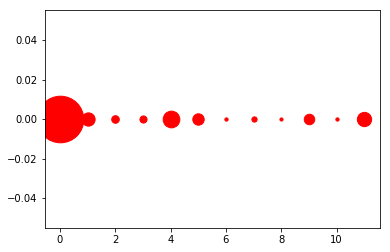

[((8, 0), 75), ((6, 0), 79), ((10, 0), 79), ((7, 0), 126), ((3, 0), 171), ((2, 0), 182), ((9, 0), 252), ((5, 0), 274), ((1, 0), 318), ((11, 0), 343), ((4, 0), 401), ((0, 0), 1118)]
1253


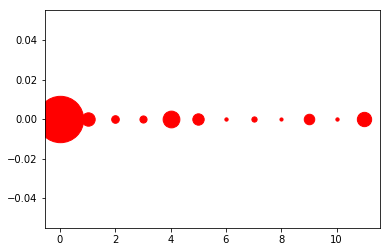

[((8, 0), 75), ((6, 0), 79), ((10, 0), 79), ((7, 0), 126), ((3, 0), 171), ((2, 0), 183), ((9, 0), 252), ((5, 0), 273), ((1, 0), 321), ((11, 0), 344), ((4, 0), 402), ((0, 0), 1113)]
1254


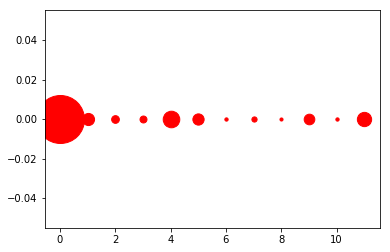

[((8, 0), 74), ((6, 0), 79), ((10, 0), 79), ((7, 0), 125), ((3, 0), 167), ((2, 0), 185), ((9, 0), 255), ((5, 0), 270), ((1, 0), 291), ((11, 0), 343), ((4, 0), 398), ((0, 0), 1152)]
1255


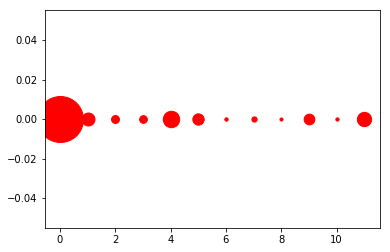

[((8, 0), 74), ((10, 0), 79), ((6, 0), 81), ((7, 0), 126), ((3, 0), 185), ((2, 0), 190), ((9, 0), 257), ((5, 0), 272), ((1, 0), 312), ((11, 0), 343), ((4, 0), 395), ((0, 0), 1104)]
1256


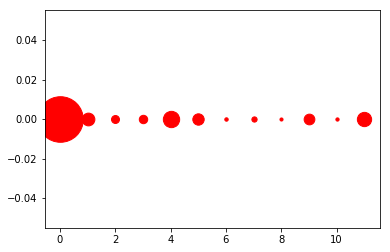

[((8, 0), 74), ((10, 0), 78), ((6, 0), 82), ((7, 0), 126), ((2, 0), 191), ((3, 0), 202), ((9, 0), 257), ((5, 0), 273), ((1, 0), 306), ((11, 0), 343), ((4, 0), 392), ((0, 0), 1094)]
1257


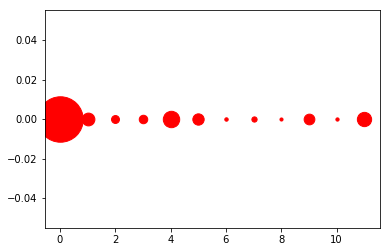

[((8, 0), 74), ((10, 0), 78), ((6, 0), 82), ((7, 0), 126), ((2, 0), 190), ((3, 0), 204), ((9, 0), 257), ((5, 0), 272), ((1, 0), 307), ((11, 0), 343), ((4, 0), 394), ((0, 0), 1091)]
1258


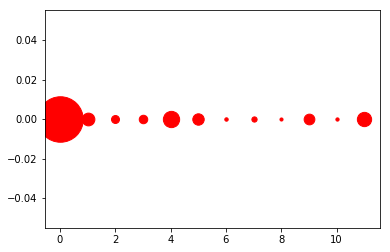

[((8, 0), 74), ((10, 0), 78), ((6, 0), 82), ((7, 0), 126), ((2, 0), 191), ((3, 0), 204), ((9, 0), 257), ((5, 0), 274), ((1, 0), 306), ((11, 0), 343), ((4, 0), 391), ((0, 0), 1092)]
1259


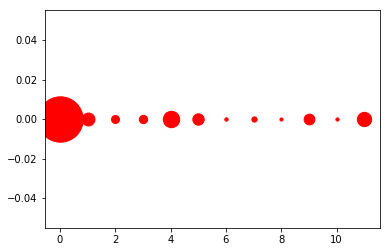

[((8, 0), 74), ((10, 0), 78), ((6, 0), 82), ((7, 0), 126), ((2, 0), 192), ((3, 0), 199), ((9, 0), 258), ((5, 0), 273), ((1, 0), 310), ((11, 0), 343), ((4, 0), 394), ((0, 0), 1089)]
1260


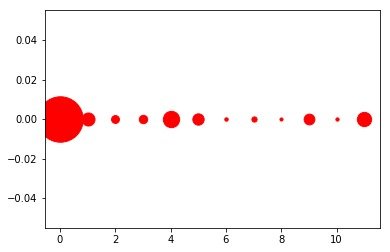

[((8, 0), 74), ((10, 0), 78), ((6, 0), 82), ((7, 0), 125), ((2, 0), 189), ((3, 0), 201), ((9, 0), 258), ((5, 0), 272), ((1, 0), 313), ((11, 0), 343), ((4, 0), 392), ((0, 0), 1091)]
1261


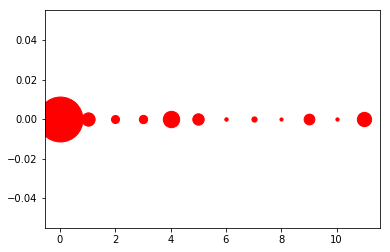

[((8, 0), 75), ((10, 0), 78), ((6, 0), 82), ((7, 0), 125), ((2, 0), 192), ((3, 0), 200), ((9, 0), 258), ((5, 0), 274), ((1, 0), 319), ((11, 0), 343), ((4, 0), 394), ((0, 0), 1078)]
1262


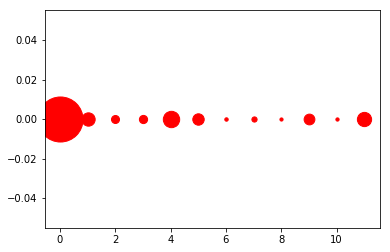

[((8, 0), 76), ((10, 0), 78), ((6, 0), 82), ((7, 0), 125), ((2, 0), 192), ((3, 0), 197), ((9, 0), 258), ((5, 0), 274), ((1, 0), 320), ((11, 0), 342), ((4, 0), 393), ((0, 0), 1081)]
1263


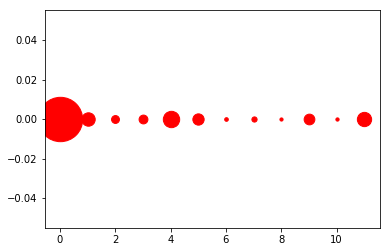

[((8, 0), 76), ((10, 0), 78), ((6, 0), 87), ((7, 0), 125), ((2, 0), 189), ((3, 0), 212), ((9, 0), 257), ((5, 0), 271), ((1, 0), 322), ((11, 0), 343), ((4, 0), 393), ((0, 0), 1065)]
1264


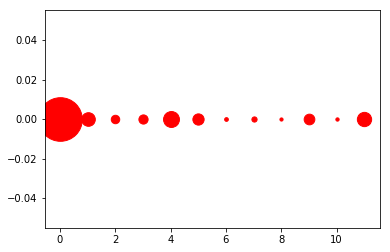

[((8, 0), 76), ((10, 0), 79), ((6, 0), 89), ((7, 0), 125), ((2, 0), 203), ((3, 0), 221), ((9, 0), 256), ((5, 0), 270), ((1, 0), 327), ((11, 0), 343), ((4, 0), 382), ((0, 0), 1047)]
1265


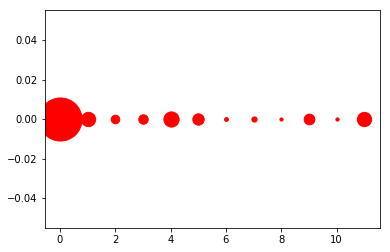

[((8, 0), 76), ((10, 0), 78), ((6, 0), 91), ((7, 0), 125), ((2, 0), 206), ((3, 0), 227), ((9, 0), 257), ((5, 0), 273), ((11, 0), 343), ((1, 0), 344), ((4, 0), 365), ((0, 0), 1033)]
1266


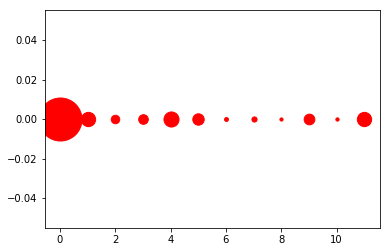

[((8, 0), 76), ((10, 0), 79), ((6, 0), 93), ((7, 0), 124), ((2, 0), 204), ((3, 0), 231), ((9, 0), 257), ((5, 0), 274), ((11, 0), 343), ((1, 0), 343), ((4, 0), 362), ((0, 0), 1032)]
1267


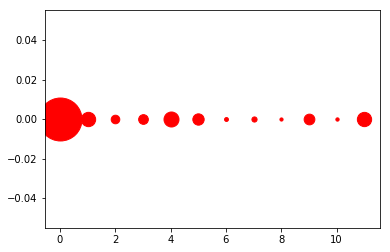

[((8, 0), 76), ((10, 0), 79), ((6, 0), 93), ((7, 0), 124), ((2, 0), 206), ((3, 0), 233), ((9, 0), 257), ((5, 0), 272), ((11, 0), 343), ((1, 0), 344), ((4, 0), 360), ((0, 0), 1031)]
1268


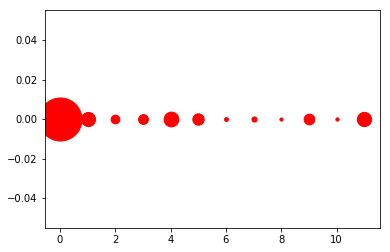

[((8, 0), 76), ((10, 0), 79), ((6, 0), 93), ((7, 0), 124), ((2, 0), 210), ((3, 0), 236), ((9, 0), 257), ((5, 0), 273), ((1, 0), 339), ((11, 0), 343), ((4, 0), 355), ((0, 0), 1033)]
1269


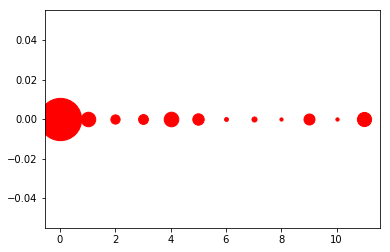

[((8, 0), 76), ((10, 0), 79), ((6, 0), 92), ((7, 0), 121), ((2, 0), 222), ((3, 0), 236), ((9, 0), 264), ((5, 0), 274), ((11, 0), 340), ((1, 0), 348), ((4, 0), 351), ((0, 0), 1015)]
1270


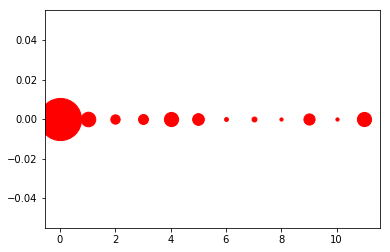

[((8, 0), 76), ((10, 0), 78), ((6, 0), 92), ((7, 0), 118), ((2, 0), 224), ((3, 0), 238), ((9, 0), 268), ((5, 0), 281), ((11, 0), 340), ((4, 0), 341), ((1, 0), 350), ((0, 0), 1012)]
1271


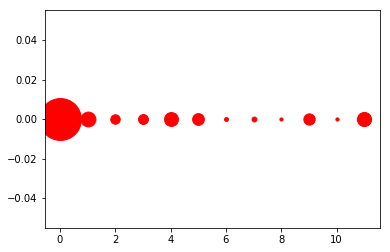

[((8, 0), 76), ((10, 0), 78), ((6, 0), 93), ((7, 0), 117), ((2, 0), 227), ((3, 0), 238), ((9, 0), 271), ((5, 0), 282), ((4, 0), 334), ((11, 0), 340), ((1, 0), 356), ((0, 0), 1006)]
1272


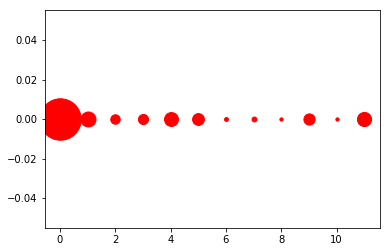

[((8, 0), 78), ((10, 0), 78), ((6, 0), 93), ((7, 0), 117), ((2, 0), 227), ((3, 0), 243), ((9, 0), 269), ((5, 0), 284), ((4, 0), 334), ((11, 0), 340), ((1, 0), 360), ((0, 0), 995)]
1273


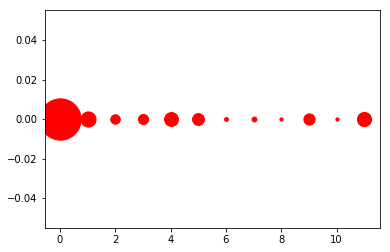

[((8, 0), 77), ((10, 0), 78), ((6, 0), 93), ((7, 0), 117), ((2, 0), 227), ((3, 0), 243), ((9, 0), 270), ((5, 0), 285), ((4, 0), 333), ((11, 0), 340), ((1, 0), 364), ((0, 0), 991)]
1274


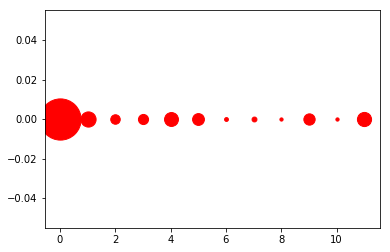

[((8, 0), 77), ((10, 0), 78), ((6, 0), 92), ((7, 0), 117), ((2, 0), 228), ((3, 0), 243), ((9, 0), 271), ((5, 0), 284), ((4, 0), 334), ((11, 0), 340), ((1, 0), 365), ((0, 0), 989)]
1275


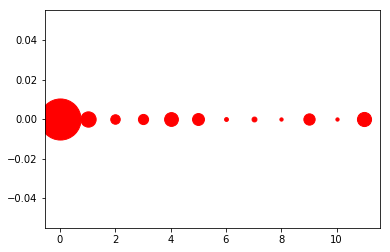

[((8, 0), 78), ((10, 0), 78), ((6, 0), 92), ((7, 0), 117), ((2, 0), 228), ((3, 0), 244), ((9, 0), 271), ((5, 0), 286), ((4, 0), 331), ((11, 0), 339), ((1, 0), 368), ((0, 0), 986)]
1276


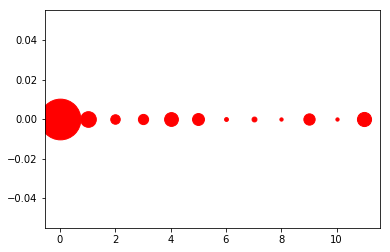

[((8, 0), 78), ((10, 0), 78), ((6, 0), 92), ((7, 0), 117), ((2, 0), 228), ((3, 0), 245), ((9, 0), 271), ((5, 0), 286), ((4, 0), 331), ((11, 0), 339), ((1, 0), 376), ((0, 0), 977)]
1277


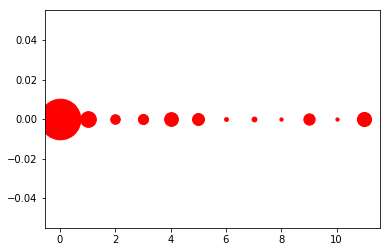

[((8, 0), 78), ((10, 0), 78), ((6, 0), 92), ((7, 0), 117), ((2, 0), 229), ((3, 0), 245), ((9, 0), 271), ((5, 0), 287), ((4, 0), 330), ((11, 0), 339), ((1, 0), 377), ((0, 0), 975)]
1278


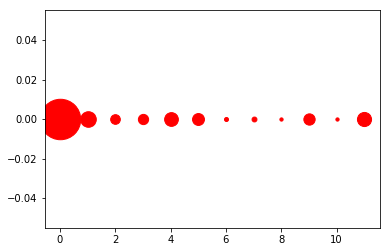

[((8, 0), 78), ((10, 0), 78), ((6, 0), 96), ((7, 0), 117), ((2, 0), 232), ((3, 0), 246), ((9, 0), 271), ((5, 0), 286), ((4, 0), 330), ((11, 0), 339), ((1, 0), 374), ((0, 0), 971)]
1279


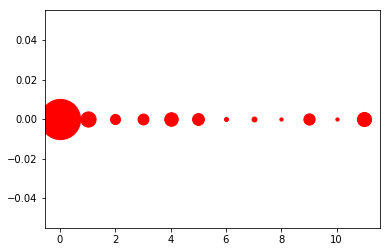

[((8, 0), 78), ((10, 0), 78), ((6, 0), 96), ((7, 0), 117), ((2, 0), 241), ((3, 0), 260), ((9, 0), 270), ((5, 0), 284), ((4, 0), 325), ((11, 0), 339), ((1, 0), 365), ((0, 0), 965)]
1280


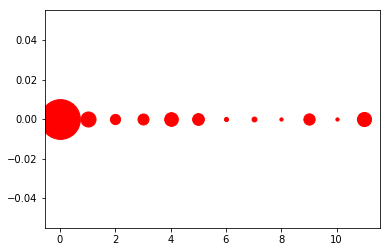

[((8, 0), 78), ((10, 0), 78), ((6, 0), 99), ((7, 0), 117), ((2, 0), 245), ((3, 0), 264), ((9, 0), 271), ((5, 0), 283), ((4, 0), 328), ((11, 0), 339), ((1, 0), 361), ((0, 0), 955)]
1281


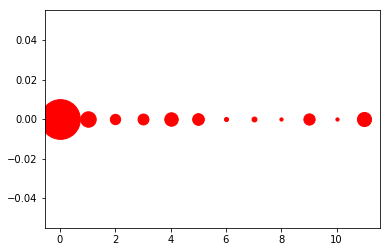

[((8, 0), 77), ((10, 0), 78), ((6, 0), 97), ((7, 0), 118), ((2, 0), 248), ((3, 0), 262), ((9, 0), 270), ((5, 0), 281), ((4, 0), 323), ((11, 0), 339), ((1, 0), 371), ((0, 0), 954)]
1282


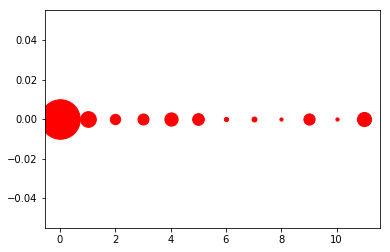

[((8, 0), 76), ((10, 0), 78), ((6, 0), 101), ((7, 0), 119), ((2, 0), 248), ((3, 0), 264), ((9, 0), 269), ((5, 0), 281), ((4, 0), 318), ((11, 0), 339), ((1, 0), 376), ((0, 0), 949)]
1283


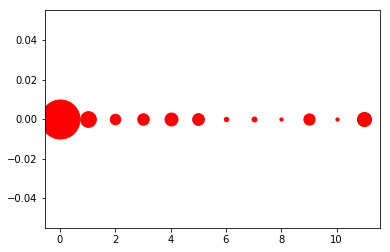

[((8, 0), 76), ((10, 0), 78), ((6, 0), 105), ((7, 0), 119), ((2, 0), 252), ((9, 0), 269), ((3, 0), 275), ((5, 0), 282), ((4, 0), 310), ((11, 0), 339), ((1, 0), 377), ((0, 0), 936)]
1284


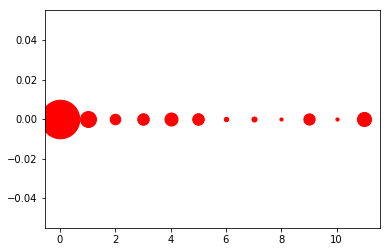

[((8, 0), 75), ((10, 0), 77), ((6, 0), 106), ((7, 0), 121), ((2, 0), 253), ((9, 0), 270), ((3, 0), 277), ((5, 0), 278), ((4, 0), 313), ((11, 0), 339), ((1, 0), 383), ((0, 0), 926)]
1285


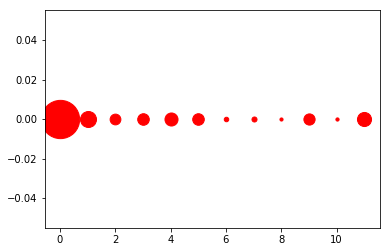

[((8, 0), 75), ((10, 0), 77), ((6, 0), 108), ((7, 0), 121), ((2, 0), 258), ((9, 0), 269), ((5, 0), 278), ((3, 0), 278), ((4, 0), 313), ((11, 0), 338), ((1, 0), 384), ((0, 0), 919)]
1286


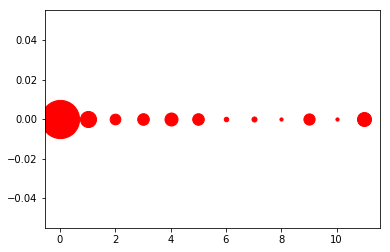

[((8, 0), 76), ((10, 0), 77), ((6, 0), 108), ((7, 0), 121), ((2, 0), 257), ((9, 0), 269), ((5, 0), 278), ((3, 0), 279), ((4, 0), 312), ((11, 0), 337), ((1, 0), 386), ((0, 0), 918)]
1287


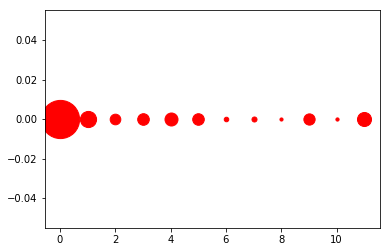

[((8, 0), 75), ((10, 0), 77), ((6, 0), 109), ((7, 0), 121), ((2, 0), 255), ((9, 0), 270), ((5, 0), 278), ((3, 0), 279), ((4, 0), 312), ((11, 0), 337), ((1, 0), 388), ((0, 0), 917)]
1288


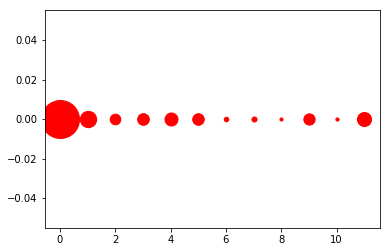

[((8, 0), 74), ((10, 0), 77), ((6, 0), 109), ((7, 0), 122), ((2, 0), 255), ((9, 0), 270), ((5, 0), 278), ((3, 0), 280), ((4, 0), 312), ((11, 0), 337), ((1, 0), 392), ((0, 0), 912)]
1289


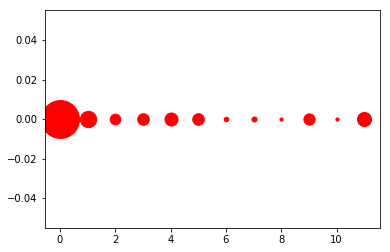

[((8, 0), 75), ((10, 0), 77), ((6, 0), 110), ((7, 0), 122), ((2, 0), 255), ((9, 0), 269), ((5, 0), 278), ((3, 0), 279), ((4, 0), 313), ((11, 0), 338), ((1, 0), 392), ((0, 0), 910)]
1290


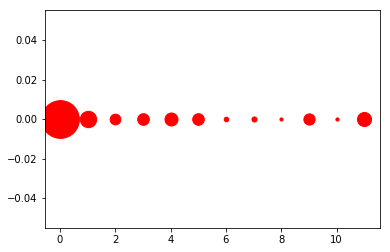

[((8, 0), 75), ((10, 0), 77), ((6, 0), 110), ((7, 0), 122), ((2, 0), 257), ((9, 0), 270), ((5, 0), 279), ((3, 0), 279), ((4, 0), 312), ((11, 0), 337), ((1, 0), 394), ((0, 0), 906)]
1291


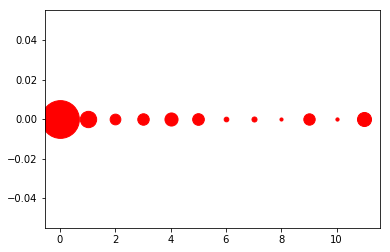

[((8, 0), 74), ((10, 0), 77), ((6, 0), 112), ((7, 0), 121), ((2, 0), 257), ((9, 0), 273), ((3, 0), 275), ((5, 0), 280), ((4, 0), 314), ((11, 0), 337), ((1, 0), 392), ((0, 0), 906)]
1292


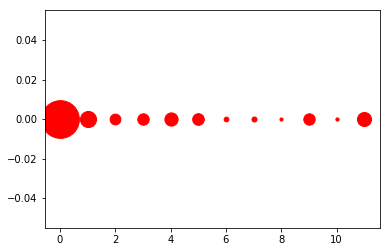

[((8, 0), 74), ((10, 0), 77), ((6, 0), 114), ((7, 0), 121), ((2, 0), 259), ((9, 0), 273), ((3, 0), 274), ((5, 0), 280), ((4, 0), 317), ((11, 0), 337), ((1, 0), 386), ((0, 0), 906)]
1293


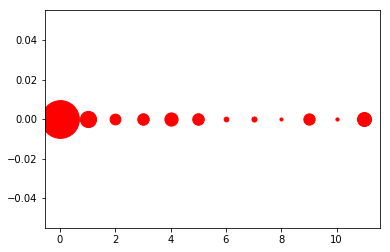

[((8, 0), 73), ((10, 0), 77), ((6, 0), 113), ((7, 0), 122), ((2, 0), 259), ((9, 0), 272), ((3, 0), 276), ((5, 0), 277), ((4, 0), 317), ((11, 0), 337), ((1, 0), 389), ((0, 0), 906)]
1294


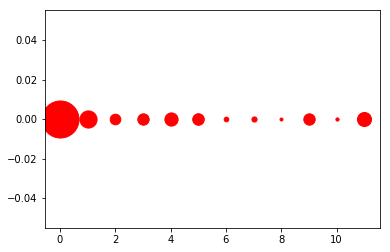

[((8, 0), 71), ((10, 0), 77), ((6, 0), 112), ((7, 0), 124), ((2, 0), 255), ((9, 0), 273), ((3, 0), 273), ((5, 0), 278), ((4, 0), 317), ((11, 0), 337), ((1, 0), 412), ((0, 0), 889)]
1295


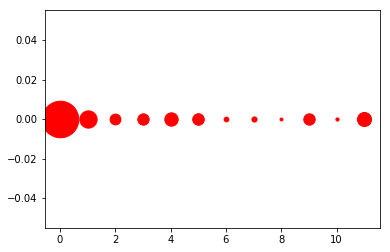

[((8, 0), 70), ((10, 0), 77), ((6, 0), 113), ((7, 0), 124), ((2, 0), 259), ((3, 0), 272), ((9, 0), 273), ((5, 0), 278), ((4, 0), 321), ((11, 0), 338), ((1, 0), 415), ((0, 0), 878)]
1296


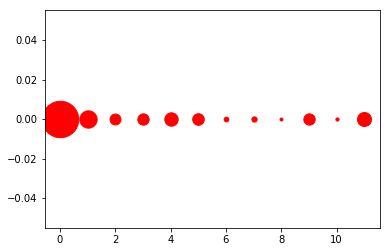

[((8, 0), 70), ((10, 0), 77), ((6, 0), 113), ((7, 0), 126), ((2, 0), 262), ((3, 0), 272), ((9, 0), 272), ((5, 0), 278), ((4, 0), 321), ((11, 0), 336), ((1, 0), 416), ((0, 0), 875)]
1297


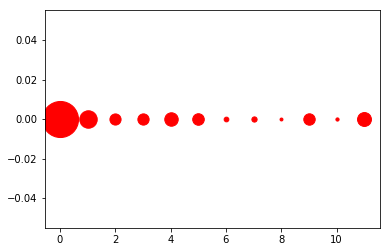

[((8, 0), 70), ((10, 0), 77), ((6, 0), 113), ((7, 0), 126), ((2, 0), 268), ((3, 0), 270), ((9, 0), 274), ((5, 0), 278), ((4, 0), 323), ((11, 0), 334), ((1, 0), 419), ((0, 0), 866)]
1298


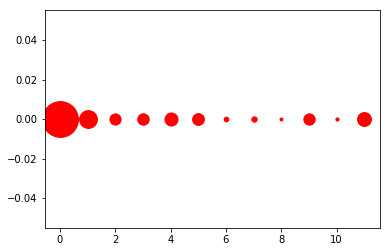

[((8, 0), 71), ((10, 0), 76), ((6, 0), 112), ((7, 0), 128), ((2, 0), 268), ((9, 0), 271), ((3, 0), 275), ((5, 0), 283), ((4, 0), 313), ((11, 0), 333), ((1, 0), 428), ((0, 0), 860)]
1299


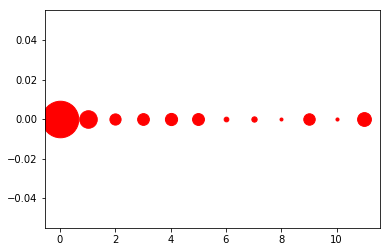

[((8, 0), 71), ((10, 0), 74), ((6, 0), 113), ((7, 0), 128), ((2, 0), 269), ((9, 0), 275), ((3, 0), 282), ((5, 0), 285), ((4, 0), 292), ((11, 0), 331), ((1, 0), 421), ((0, 0), 877)]
1300


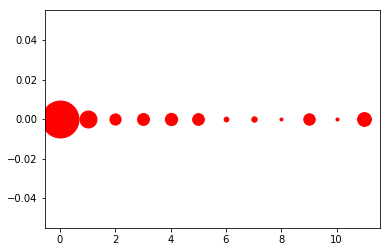

[((8, 0), 71), ((10, 0), 74), ((6, 0), 114), ((7, 0), 129), ((2, 0), 269), ((9, 0), 274), ((5, 0), 281), ((3, 0), 286), ((4, 0), 294), ((11, 0), 331), ((1, 0), 408), ((0, 0), 887)]
1301


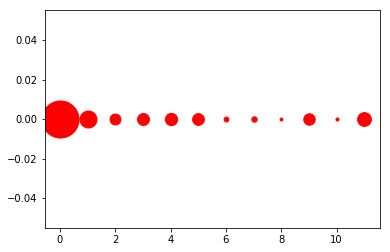

[((8, 0), 70), ((10, 0), 74), ((6, 0), 116), ((7, 0), 129), ((2, 0), 262), ((9, 0), 275), ((5, 0), 282), ((3, 0), 287), ((4, 0), 295), ((11, 0), 331), ((1, 0), 408), ((0, 0), 889)]
1302


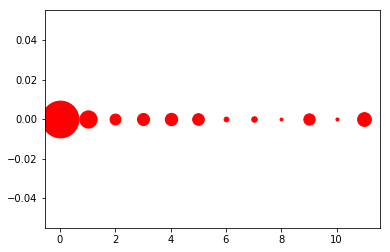

[((8, 0), 69), ((10, 0), 74), ((6, 0), 115), ((7, 0), 133), ((2, 0), 261), ((9, 0), 272), ((5, 0), 280), ((3, 0), 289), ((4, 0), 297), ((11, 0), 331), ((1, 0), 414), ((0, 0), 883)]
1303


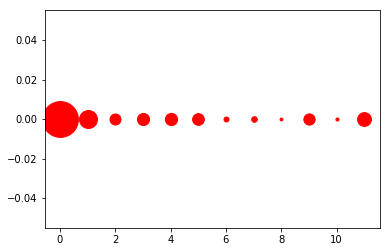

[((8, 0), 68), ((10, 0), 74), ((6, 0), 119), ((7, 0), 135), ((2, 0), 264), ((9, 0), 270), ((5, 0), 282), ((3, 0), 291), ((4, 0), 293), ((11, 0), 331), ((1, 0), 431), ((0, 0), 860)]
1304


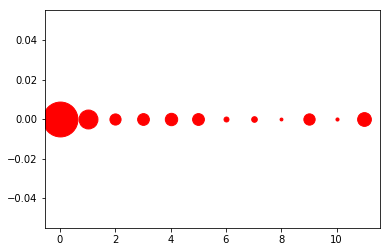

[((8, 0), 68), ((10, 0), 74), ((6, 0), 119), ((7, 0), 135), ((2, 0), 268), ((9, 0), 271), ((3, 0), 282), ((5, 0), 283), ((4, 0), 297), ((11, 0), 330), ((1, 0), 454), ((0, 0), 837)]
1305


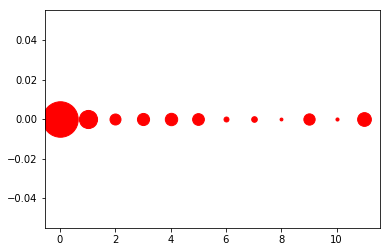

[((8, 0), 68), ((10, 0), 74), ((6, 0), 119), ((7, 0), 135), ((2, 0), 264), ((9, 0), 271), ((5, 0), 282), ((3, 0), 291), ((4, 0), 297), ((11, 0), 330), ((1, 0), 435), ((0, 0), 852)]
1306


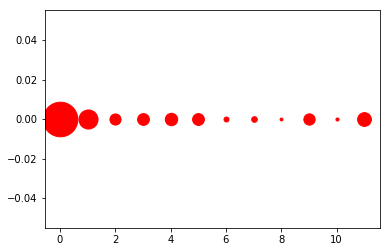

[((8, 0), 68), ((10, 0), 74), ((6, 0), 119), ((7, 0), 135), ((2, 0), 267), ((9, 0), 271), ((3, 0), 283), ((5, 0), 284), ((4, 0), 298), ((11, 0), 330), ((1, 0), 458), ((0, 0), 831)]
1307


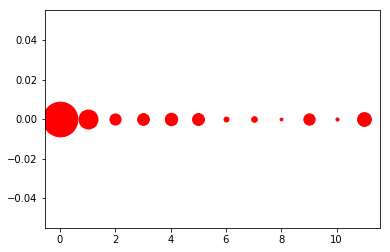

[((8, 0), 68), ((10, 0), 74), ((6, 0), 119), ((7, 0), 135), ((2, 0), 267), ((9, 0), 271), ((3, 0), 282), ((5, 0), 285), ((4, 0), 298), ((11, 0), 330), ((1, 0), 456), ((0, 0), 833)]
1308


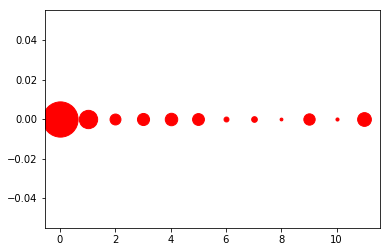

[((8, 0), 67), ((10, 0), 74), ((6, 0), 118), ((7, 0), 136), ((2, 0), 262), ((9, 0), 272), ((5, 0), 284), ((3, 0), 290), ((4, 0), 299), ((11, 0), 330), ((1, 0), 440), ((0, 0), 846)]
1309


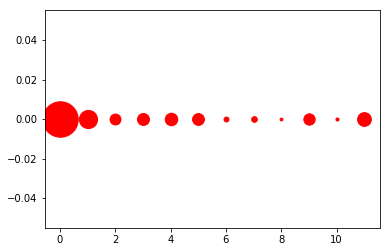

[((8, 0), 67), ((10, 0), 74), ((6, 0), 118), ((7, 0), 136), ((2, 0), 262), ((9, 0), 272), ((5, 0), 284), ((3, 0), 287), ((4, 0), 300), ((11, 0), 330), ((1, 0), 436), ((0, 0), 852)]
1310


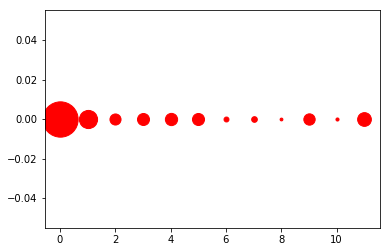

[((8, 0), 67), ((10, 0), 74), ((6, 0), 118), ((7, 0), 136), ((2, 0), 266), ((9, 0), 272), ((3, 0), 288), ((5, 0), 289), ((4, 0), 294), ((11, 0), 330), ((1, 0), 436), ((0, 0), 848)]
1311


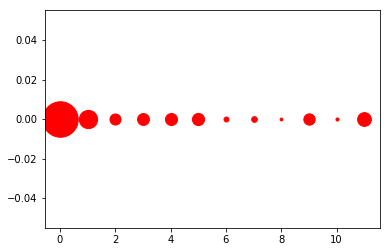

[((8, 0), 67), ((10, 0), 74), ((6, 0), 118), ((7, 0), 136), ((2, 0), 265), ((9, 0), 272), ((3, 0), 285), ((4, 0), 289), ((5, 0), 292), ((11, 0), 330), ((1, 0), 438), ((0, 0), 852)]
1312


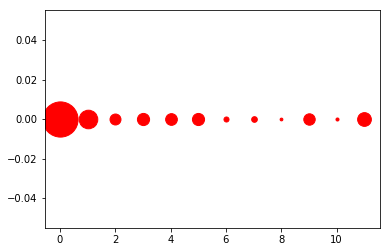

[((8, 0), 66), ((10, 0), 73), ((6, 0), 121), ((7, 0), 136), ((2, 0), 263), ((9, 0), 274), ((4, 0), 281), ((5, 0), 291), ((3, 0), 292), ((11, 0), 330), ((1, 0), 446), ((0, 0), 845)]
1313


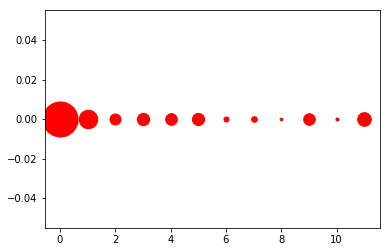

[((8, 0), 65), ((10, 0), 73), ((6, 0), 121), ((7, 0), 136), ((2, 0), 264), ((9, 0), 278), ((4, 0), 280), ((5, 0), 292), ((3, 0), 295), ((11, 0), 327), ((1, 0), 445), ((0, 0), 842)]
1314


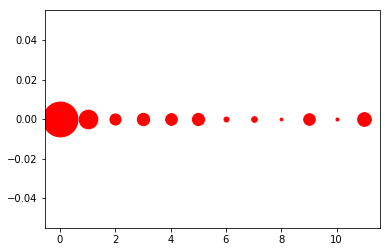

[((8, 0), 65), ((10, 0), 73), ((6, 0), 120), ((7, 0), 136), ((2, 0), 266), ((9, 0), 278), ((4, 0), 280), ((5, 0), 292), ((3, 0), 296), ((11, 0), 328), ((1, 0), 448), ((0, 0), 836)]
1315


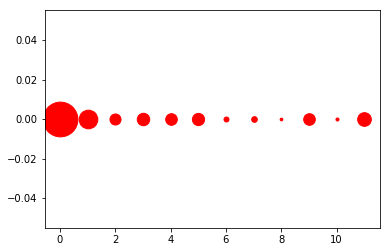

[((8, 0), 65), ((10, 0), 73), ((6, 0), 119), ((7, 0), 136), ((2, 0), 265), ((9, 0), 279), ((4, 0), 279), ((5, 0), 293), ((3, 0), 299), ((11, 0), 328), ((1, 0), 448), ((0, 0), 834)]
1316


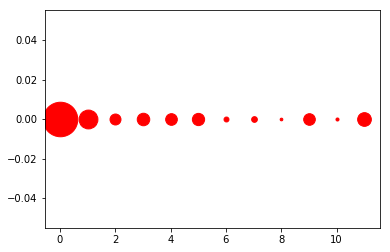

[((8, 0), 64), ((10, 0), 73), ((6, 0), 118), ((7, 0), 137), ((2, 0), 263), ((9, 0), 279), ((4, 0), 280), ((5, 0), 294), ((3, 0), 300), ((11, 0), 329), ((1, 0), 452), ((0, 0), 829)]
1317


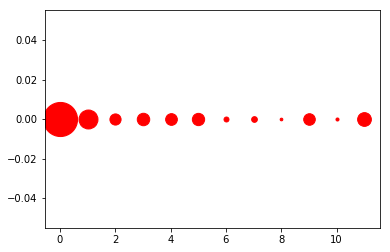

[((8, 0), 64), ((10, 0), 73), ((6, 0), 119), ((7, 0), 137), ((2, 0), 268), ((9, 0), 278), ((4, 0), 281), ((5, 0), 295), ((3, 0), 299), ((11, 0), 330), ((1, 0), 455), ((0, 0), 819)]
1318


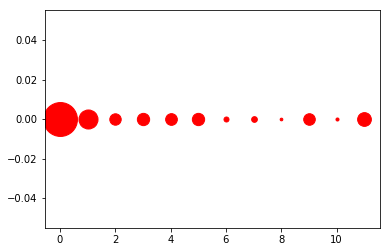

[((8, 0), 64), ((10, 0), 73), ((6, 0), 120), ((7, 0), 137), ((2, 0), 274), ((9, 0), 278), ((4, 0), 281), ((5, 0), 295), ((3, 0), 295), ((11, 0), 330), ((1, 0), 457), ((0, 0), 814)]
1319


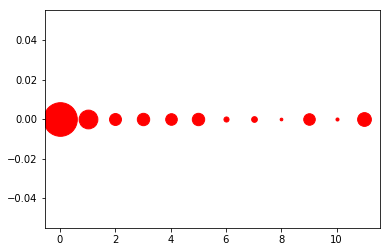

[((8, 0), 64), ((10, 0), 73), ((6, 0), 122), ((7, 0), 137), ((9, 0), 277), ((4, 0), 278), ((2, 0), 286), ((5, 0), 297), ((3, 0), 297), ((11, 0), 330), ((1, 0), 450), ((0, 0), 807)]
1320


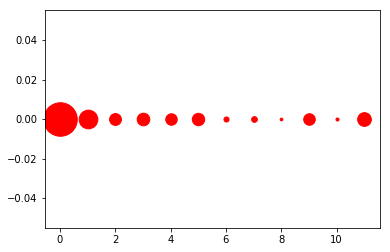

[((8, 0), 64), ((10, 0), 73), ((6, 0), 122), ((7, 0), 137), ((4, 0), 276), ((9, 0), 278), ((2, 0), 285), ((5, 0), 297), ((3, 0), 303), ((11, 0), 329), ((1, 0), 449), ((0, 0), 805)]
1321


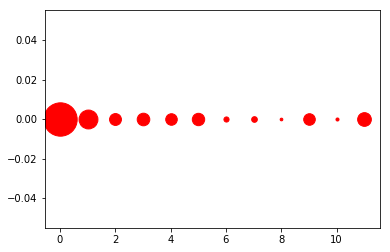

[((8, 0), 64), ((10, 0), 73), ((6, 0), 123), ((7, 0), 136), ((4, 0), 277), ((9, 0), 278), ((2, 0), 285), ((5, 0), 297), ((3, 0), 302), ((11, 0), 329), ((1, 0), 453), ((0, 0), 801)]
1322


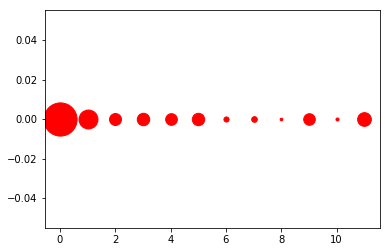

[((8, 0), 64), ((10, 0), 73), ((6, 0), 123), ((7, 0), 136), ((9, 0), 278), ((4, 0), 280), ((2, 0), 287), ((5, 0), 297), ((3, 0), 299), ((11, 0), 329), ((1, 0), 455), ((0, 0), 797)]
1323


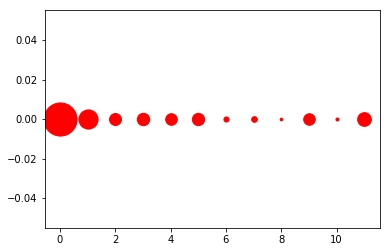

[((8, 0), 64), ((10, 0), 73), ((6, 0), 123), ((7, 0), 136), ((9, 0), 278), ((4, 0), 279), ((2, 0), 287), ((5, 0), 295), ((3, 0), 298), ((11, 0), 329), ((1, 0), 461), ((0, 0), 795)]
1324


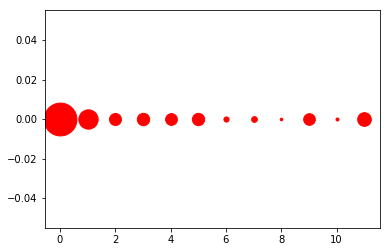

[((8, 0), 62), ((10, 0), 72), ((6, 0), 123), ((7, 0), 138), ((9, 0), 280), ((4, 0), 283), ((2, 0), 288), ((5, 0), 295), ((3, 0), 297), ((11, 0), 328), ((1, 0), 464), ((0, 0), 788)]
1325


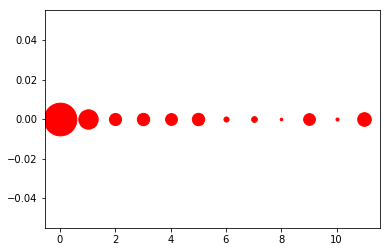

[((8, 0), 62), ((10, 0), 72), ((6, 0), 122), ((7, 0), 138), ((9, 0), 281), ((4, 0), 284), ((2, 0), 290), ((5, 0), 296), ((3, 0), 296), ((11, 0), 327), ((1, 0), 465), ((0, 0), 785)]
1326


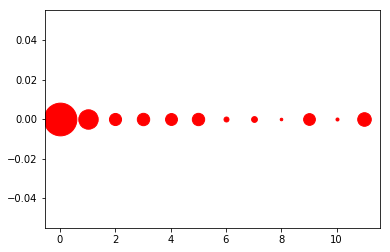

[((8, 0), 61), ((10, 0), 72), ((6, 0), 119), ((7, 0), 139), ((9, 0), 282), ((4, 0), 285), ((2, 0), 290), ((5, 0), 296), ((3, 0), 297), ((11, 0), 326), ((1, 0), 466), ((0, 0), 785)]
1327


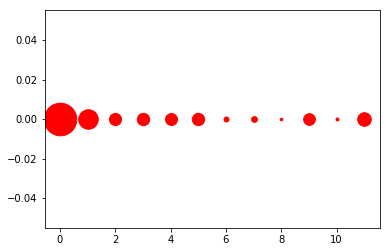

[((8, 0), 62), ((10, 0), 72), ((6, 0), 119), ((7, 0), 139), ((9, 0), 281), ((4, 0), 287), ((2, 0), 291), ((5, 0), 295), ((3, 0), 296), ((11, 0), 326), ((1, 0), 468), ((0, 0), 782)]
1328


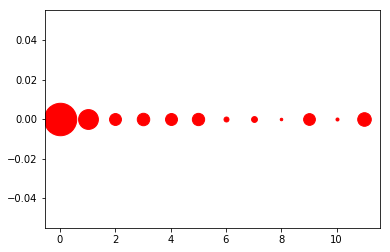

[((8, 0), 60), ((10, 0), 72), ((6, 0), 119), ((7, 0), 140), ((9, 0), 282), ((2, 0), 285), ((4, 0), 286), ((5, 0), 295), ((3, 0), 299), ((11, 0), 326), ((1, 0), 475), ((0, 0), 779)]
1329


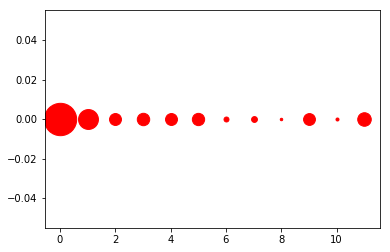

[((8, 0), 59), ((10, 0), 72), ((6, 0), 119), ((7, 0), 140), ((9, 0), 284), ((2, 0), 286), ((4, 0), 286), ((5, 0), 295), ((3, 0), 298), ((11, 0), 325), ((1, 0), 477), ((0, 0), 777)]
1330


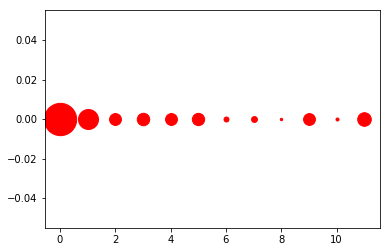

[((8, 0), 57), ((10, 0), 72), ((6, 0), 119), ((7, 0), 141), ((9, 0), 284), ((2, 0), 285), ((4, 0), 285), ((5, 0), 295), ((3, 0), 299), ((11, 0), 326), ((1, 0), 479), ((0, 0), 776)]
1331


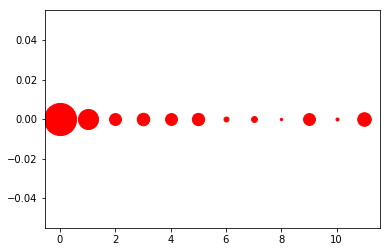

[((8, 0), 57), ((10, 0), 72), ((6, 0), 119), ((7, 0), 141), ((9, 0), 285), ((4, 0), 285), ((2, 0), 286), ((5, 0), 295), ((3, 0), 300), ((11, 0), 325), ((1, 0), 481), ((0, 0), 772)]
1332


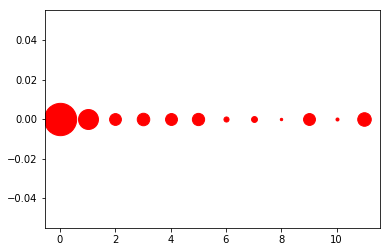

[((8, 0), 57), ((10, 0), 72), ((6, 0), 122), ((7, 0), 141), ((2, 0), 283), ((9, 0), 285), ((4, 0), 285), ((5, 0), 294), ((3, 0), 300), ((11, 0), 325), ((1, 0), 478), ((0, 0), 776)]
1333


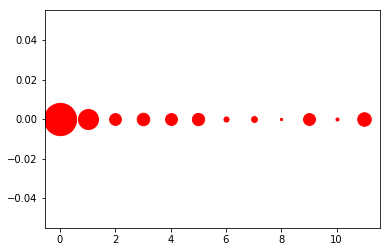

[((8, 0), 55), ((10, 0), 72), ((6, 0), 122), ((7, 0), 142), ((2, 0), 283), ((4, 0), 285), ((9, 0), 286), ((5, 0), 294), ((3, 0), 300), ((11, 0), 325), ((1, 0), 480), ((0, 0), 774)]
1334


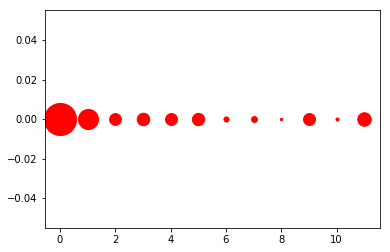

[((8, 0), 56), ((10, 0), 72), ((6, 0), 123), ((7, 0), 142), ((2, 0), 283), ((9, 0), 286), ((4, 0), 286), ((5, 0), 294), ((3, 0), 300), ((11, 0), 324), ((1, 0), 481), ((0, 0), 771)]
1335


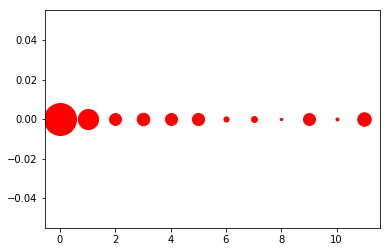

[((8, 0), 56), ((10, 0), 71), ((6, 0), 123), ((7, 0), 142), ((2, 0), 285), ((9, 0), 287), ((4, 0), 287), ((5, 0), 292), ((3, 0), 300), ((11, 0), 324), ((1, 0), 484), ((0, 0), 767)]
1336


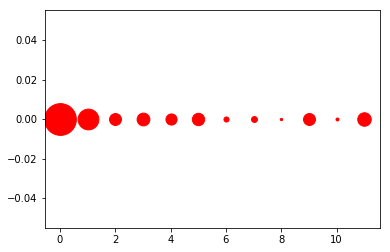

[((8, 0), 56), ((10, 0), 71), ((6, 0), 122), ((7, 0), 142), ((4, 0), 267), ((2, 0), 286), ((9, 0), 287), ((5, 0), 296), ((3, 0), 307), ((11, 0), 324), ((1, 0), 498), ((0, 0), 762)]
1337


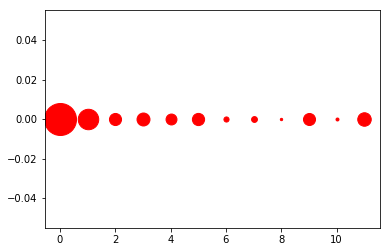

[((8, 0), 56), ((10, 0), 71), ((6, 0), 123), ((7, 0), 140), ((4, 0), 262), ((9, 0), 289), ((2, 0), 290), ((5, 0), 293), ((3, 0), 311), ((11, 0), 324), ((1, 0), 491), ((0, 0), 768)]
1338


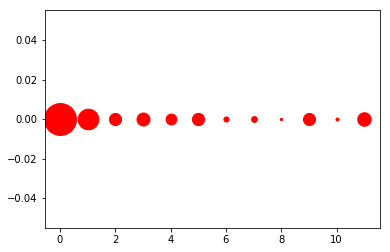

[((8, 0), 55), ((10, 0), 71), ((6, 0), 123), ((7, 0), 140), ((4, 0), 260), ((9, 0), 290), ((2, 0), 290), ((5, 0), 293), ((3, 0), 311), ((11, 0), 324), ((1, 0), 495), ((0, 0), 766)]
1339


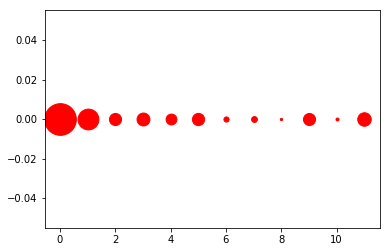

[((8, 0), 55), ((10, 0), 71), ((6, 0), 124), ((7, 0), 140), ((4, 0), 260), ((9, 0), 290), ((2, 0), 291), ((5, 0), 293), ((3, 0), 310), ((11, 0), 324), ((1, 0), 499), ((0, 0), 761)]
1340


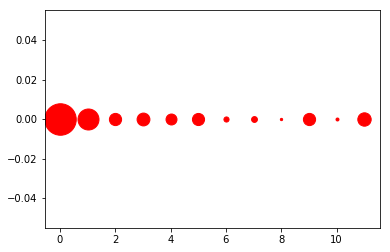

[((8, 0), 55), ((10, 0), 71), ((6, 0), 123), ((7, 0), 140), ((4, 0), 263), ((5, 0), 291), ((9, 0), 293), ((2, 0), 293), ((3, 0), 308), ((11, 0), 321), ((1, 0), 504), ((0, 0), 756)]
1341


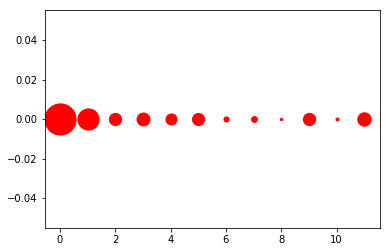

[((8, 0), 55), ((10, 0), 71), ((6, 0), 123), ((7, 0), 140), ((4, 0), 264), ((5, 0), 290), ((9, 0), 293), ((2, 0), 294), ((3, 0), 310), ((11, 0), 321), ((1, 0), 508), ((0, 0), 749)]
1342


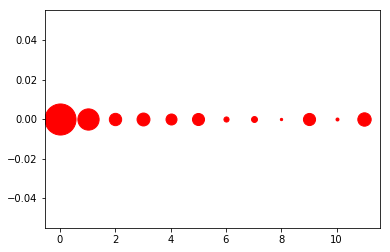

[((8, 0), 55), ((10, 0), 71), ((6, 0), 123), ((7, 0), 142), ((4, 0), 264), ((5, 0), 289), ((9, 0), 291), ((2, 0), 296), ((3, 0), 310), ((11, 0), 321), ((1, 0), 510), ((0, 0), 746)]
1343


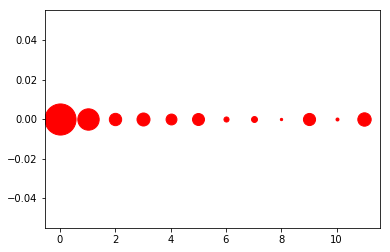

[((8, 0), 55), ((10, 0), 71), ((6, 0), 122), ((7, 0), 142), ((4, 0), 261), ((5, 0), 287), ((9, 0), 291), ((2, 0), 296), ((3, 0), 312), ((11, 0), 321), ((1, 0), 513), ((0, 0), 747)]
1344


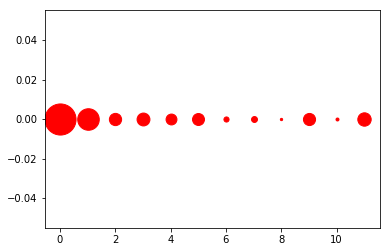

[((8, 0), 55), ((10, 0), 71), ((6, 0), 123), ((7, 0), 142), ((4, 0), 261), ((5, 0), 287), ((9, 0), 291), ((2, 0), 294), ((3, 0), 309), ((11, 0), 321), ((1, 0), 517), ((0, 0), 747)]
1345


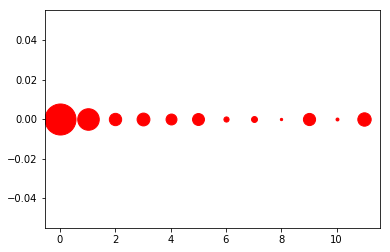

[((8, 0), 55), ((10, 0), 70), ((6, 0), 124), ((7, 0), 142), ((4, 0), 262), ((5, 0), 286), ((9, 0), 292), ((2, 0), 296), ((3, 0), 308), ((11, 0), 321), ((1, 0), 517), ((0, 0), 745)]
1346


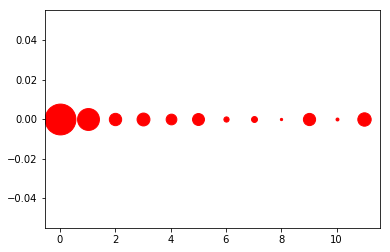

[((8, 0), 54), ((10, 0), 70), ((6, 0), 125), ((7, 0), 142), ((4, 0), 257), ((5, 0), 286), ((9, 0), 293), ((2, 0), 296), ((3, 0), 309), ((11, 0), 321), ((1, 0), 525), ((0, 0), 740)]
1347


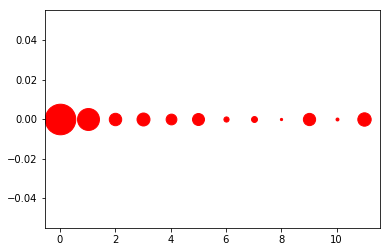

[((8, 0), 53), ((10, 0), 70), ((6, 0), 124), ((7, 0), 142), ((4, 0), 258), ((5, 0), 287), ((9, 0), 294), ((2, 0), 298), ((3, 0), 311), ((11, 0), 321), ((1, 0), 526), ((0, 0), 734)]
1348


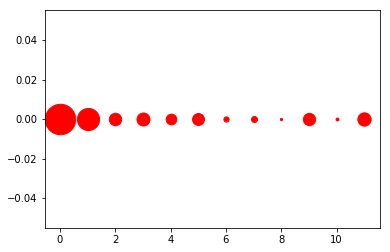

[((8, 0), 53), ((10, 0), 70), ((6, 0), 125), ((7, 0), 143), ((4, 0), 256), ((5, 0), 286), ((9, 0), 294), ((2, 0), 298), ((3, 0), 312), ((11, 0), 319), ((1, 0), 531), ((0, 0), 731)]
1349


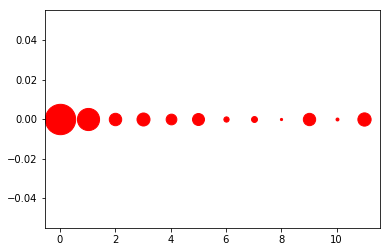

[((8, 0), 52), ((10, 0), 70), ((6, 0), 126), ((7, 0), 142), ((4, 0), 257), ((5, 0), 287), ((9, 0), 296), ((2, 0), 298), ((3, 0), 312), ((11, 0), 318), ((1, 0), 531), ((0, 0), 729)]
1350


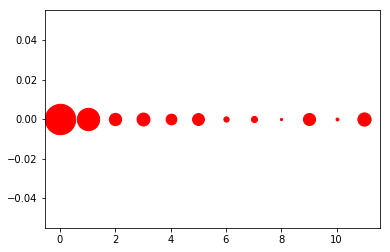

[((8, 0), 53), ((10, 0), 69), ((6, 0), 126), ((7, 0), 147), ((4, 0), 258), ((5, 0), 285), ((9, 0), 291), ((2, 0), 296), ((3, 0), 310), ((11, 0), 318), ((1, 0), 536), ((0, 0), 729)]
1351


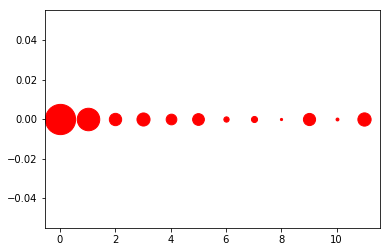

[((8, 0), 52), ((10, 0), 69), ((6, 0), 127), ((7, 0), 146), ((4, 0), 256), ((5, 0), 282), ((9, 0), 292), ((2, 0), 296), ((3, 0), 314), ((11, 0), 318), ((1, 0), 540), ((0, 0), 726)]
1352


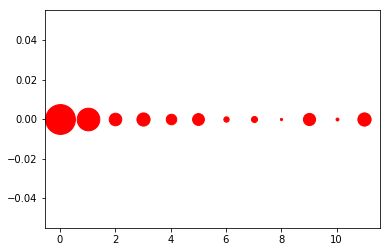

[((8, 0), 52), ((10, 0), 69), ((6, 0), 128), ((7, 0), 146), ((4, 0), 253), ((5, 0), 284), ((9, 0), 292), ((2, 0), 302), ((3, 0), 316), ((11, 0), 318), ((1, 0), 543), ((0, 0), 715)]
1353


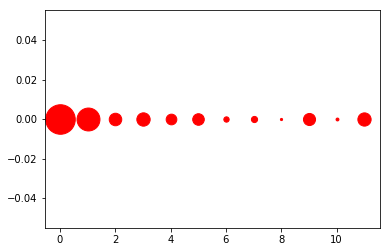

[((8, 0), 52), ((10, 0), 69), ((6, 0), 128), ((7, 0), 148), ((4, 0), 256), ((5, 0), 278), ((9, 0), 290), ((2, 0), 300), ((11, 0), 318), ((3, 0), 320), ((1, 0), 550), ((0, 0), 709)]
1354


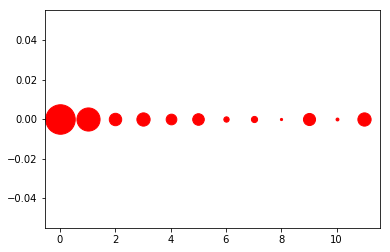

[((8, 0), 52), ((10, 0), 69), ((6, 0), 128), ((7, 0), 148), ((4, 0), 256), ((5, 0), 278), ((9, 0), 290), ((2, 0), 298), ((11, 0), 318), ((3, 0), 318), ((1, 0), 555), ((0, 0), 708)]
1355


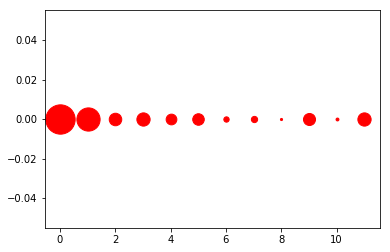

[((8, 0), 51), ((10, 0), 69), ((6, 0), 128), ((7, 0), 150), ((4, 0), 257), ((5, 0), 277), ((9, 0), 289), ((2, 0), 300), ((11, 0), 318), ((3, 0), 318), ((1, 0), 557), ((0, 0), 704)]
1356


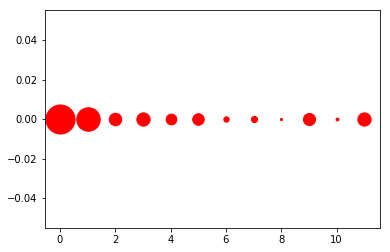

[((8, 0), 51), ((10, 0), 69), ((6, 0), 128), ((7, 0), 149), ((4, 0), 257), ((5, 0), 277), ((9, 0), 290), ((2, 0), 300), ((11, 0), 318), ((3, 0), 318), ((1, 0), 564), ((0, 0), 697)]
1357


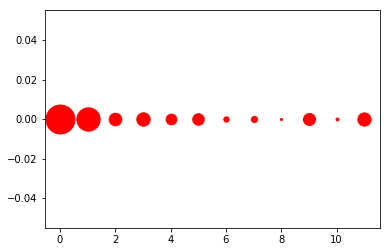

[((8, 0), 51), ((10, 0), 69), ((6, 0), 128), ((7, 0), 150), ((4, 0), 258), ((5, 0), 277), ((9, 0), 289), ((2, 0), 302), ((11, 0), 318), ((3, 0), 321), ((1, 0), 560), ((0, 0), 695)]
1358


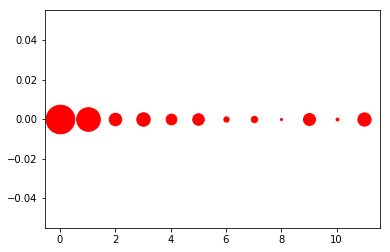

[((8, 0), 50), ((10, 0), 69), ((6, 0), 127), ((7, 0), 153), ((4, 0), 258), ((5, 0), 277), ((9, 0), 288), ((2, 0), 300), ((11, 0), 318), ((3, 0), 323), ((1, 0), 568), ((0, 0), 687)]
1359


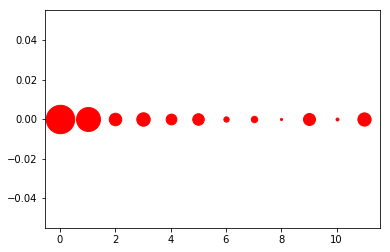

[((8, 0), 50), ((10, 0), 69), ((6, 0), 127), ((7, 0), 153), ((4, 0), 258), ((5, 0), 277), ((9, 0), 288), ((2, 0), 300), ((11, 0), 318), ((3, 0), 323), ((1, 0), 574), ((0, 0), 681)]
1360


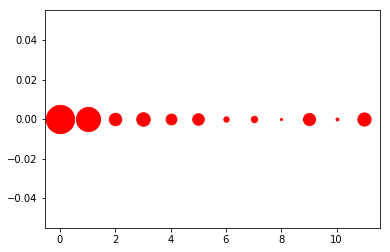

[((8, 0), 49), ((10, 0), 69), ((6, 0), 127), ((7, 0), 153), ((4, 0), 258), ((5, 0), 277), ((9, 0), 290), ((2, 0), 298), ((11, 0), 317), ((3, 0), 324), ((1, 0), 579), ((0, 0), 677)]
1361


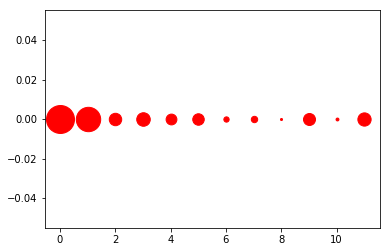

[((8, 0), 49), ((10, 0), 69), ((6, 0), 127), ((7, 0), 153), ((4, 0), 259), ((5, 0), 276), ((9, 0), 288), ((2, 0), 298), ((11, 0), 318), ((3, 0), 325), ((1, 0), 585), ((0, 0), 671)]
1362


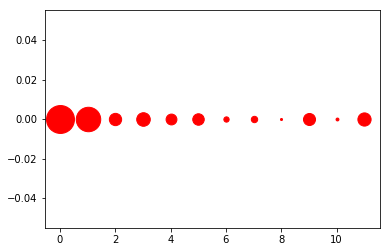

[((8, 0), 49), ((10, 0), 69), ((6, 0), 127), ((7, 0), 153), ((4, 0), 260), ((5, 0), 276), ((9, 0), 289), ((2, 0), 295), ((11, 0), 317), ((3, 0), 326), ((1, 0), 587), ((0, 0), 670)]
1363


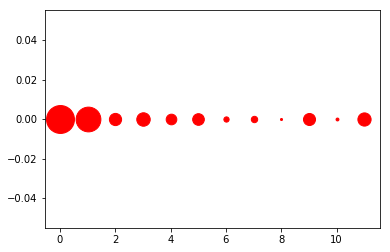

[((8, 0), 49), ((10, 0), 69), ((6, 0), 126), ((7, 0), 153), ((4, 0), 255), ((5, 0), 280), ((9, 0), 289), ((2, 0), 293), ((11, 0), 317), ((3, 0), 323), ((1, 0), 594), ((0, 0), 670)]
1364


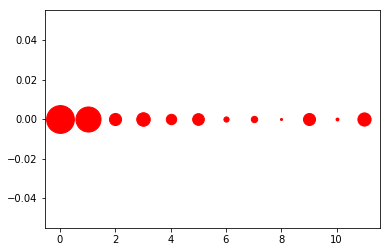

[((8, 0), 49), ((10, 0), 69), ((6, 0), 125), ((7, 0), 153), ((4, 0), 250), ((5, 0), 281), ((9, 0), 289), ((2, 0), 291), ((11, 0), 317), ((3, 0), 325), ((1, 0), 602), ((0, 0), 667)]
1365


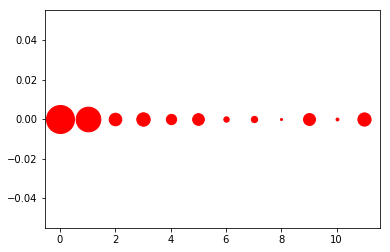

[((8, 0), 49), ((10, 0), 69), ((6, 0), 129), ((7, 0), 151), ((4, 0), 247), ((5, 0), 281), ((9, 0), 287), ((2, 0), 302), ((11, 0), 317), ((3, 0), 322), ((1, 0), 592), ((0, 0), 672)]
1366


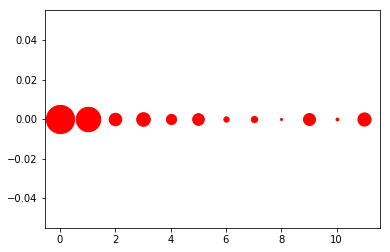

[((8, 0), 49), ((10, 0), 69), ((6, 0), 127), ((7, 0), 151), ((4, 0), 246), ((5, 0), 280), ((9, 0), 288), ((2, 0), 300), ((11, 0), 316), ((3, 0), 327), ((1, 0), 588), ((0, 0), 677)]
1367


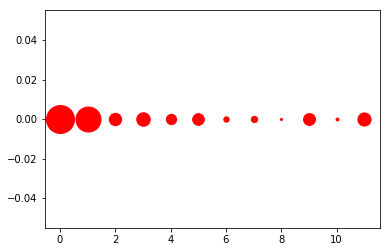

[((8, 0), 49), ((10, 0), 69), ((6, 0), 128), ((7, 0), 151), ((4, 0), 247), ((5, 0), 280), ((9, 0), 286), ((2, 0), 296), ((11, 0), 316), ((3, 0), 324), ((1, 0), 601), ((0, 0), 671)]
1368


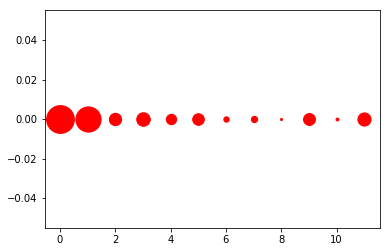

[((8, 0), 49), ((10, 0), 69), ((6, 0), 128), ((7, 0), 151), ((4, 0), 248), ((5, 0), 279), ((9, 0), 286), ((2, 0), 295), ((11, 0), 316), ((3, 0), 325), ((1, 0), 605), ((0, 0), 667)]
1369


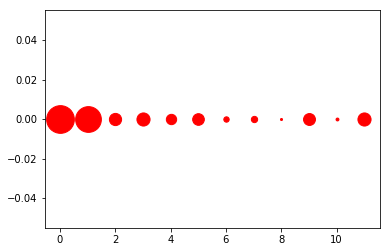

[((8, 0), 49), ((10, 0), 69), ((6, 0), 129), ((7, 0), 151), ((4, 0), 248), ((5, 0), 280), ((9, 0), 286), ((2, 0), 293), ((11, 0), 315), ((3, 0), 315), ((1, 0), 618), ((0, 0), 665)]
1370


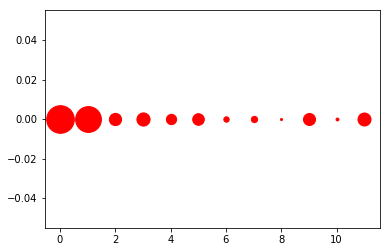

[((8, 0), 49), ((10, 0), 69), ((6, 0), 129), ((7, 0), 151), ((4, 0), 247), ((5, 0), 279), ((9, 0), 289), ((2, 0), 294), ((11, 0), 312), ((3, 0), 316), ((1, 0), 620), ((0, 0), 663)]
1371


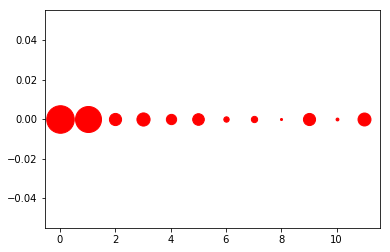

[((8, 0), 49), ((10, 0), 68), ((6, 0), 129), ((7, 0), 151), ((4, 0), 247), ((5, 0), 279), ((9, 0), 291), ((2, 0), 292), ((11, 0), 311), ((3, 0), 316), ((1, 0), 624), ((0, 0), 661)]
1372


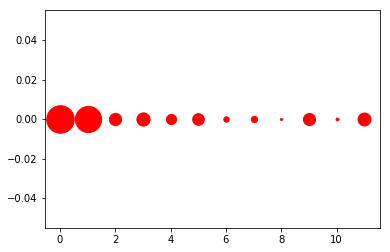

[((8, 0), 49), ((10, 0), 68), ((6, 0), 128), ((7, 0), 152), ((4, 0), 244), ((5, 0), 279), ((9, 0), 291), ((2, 0), 292), ((11, 0), 311), ((3, 0), 317), ((1, 0), 627), ((0, 0), 660)]
1373


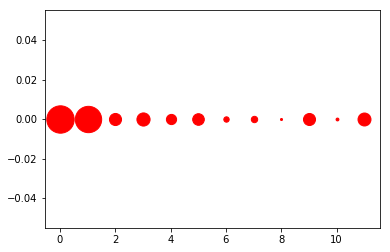

[((8, 0), 49), ((10, 0), 68), ((6, 0), 129), ((7, 0), 153), ((4, 0), 245), ((5, 0), 279), ((9, 0), 289), ((2, 0), 290), ((11, 0), 311), ((3, 0), 316), ((1, 0), 632), ((0, 0), 657)]
1374


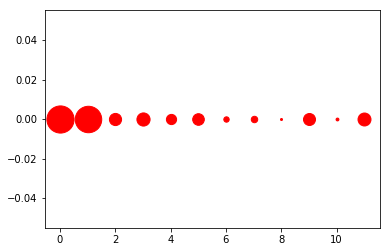

[((8, 0), 48), ((10, 0), 68), ((6, 0), 129), ((7, 0), 155), ((4, 0), 245), ((5, 0), 279), ((9, 0), 288), ((2, 0), 292), ((11, 0), 311), ((3, 0), 316), ((1, 0), 635), ((0, 0), 652)]
1375


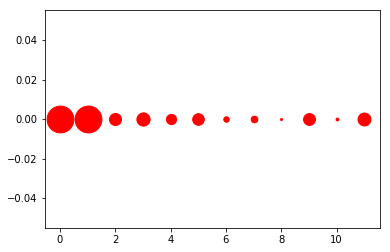

[((8, 0), 48), ((10, 0), 68), ((6, 0), 130), ((7, 0), 160), ((4, 0), 245), ((5, 0), 279), ((9, 0), 285), ((2, 0), 289), ((11, 0), 310), ((3, 0), 317), ((0, 0), 643), ((1, 0), 644)]
1376


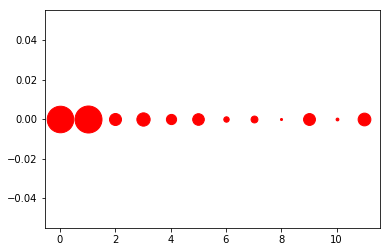

[((8, 0), 49), ((10, 0), 67), ((6, 0), 130), ((7, 0), 165), ((4, 0), 245), ((5, 0), 279), ((9, 0), 285), ((2, 0), 288), ((11, 0), 306), ((3, 0), 319), ((0, 0), 637), ((1, 0), 648)]
1377


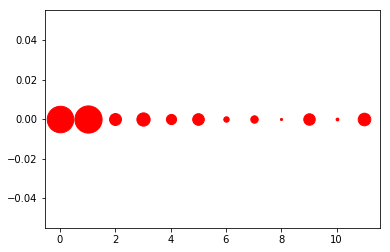

[((8, 0), 50), ((10, 0), 67), ((6, 0), 130), ((7, 0), 178), ((4, 0), 244), ((9, 0), 275), ((5, 0), 279), ((2, 0), 286), ((11, 0), 302), ((3, 0), 318), ((0, 0), 636), ((1, 0), 653)]
1378


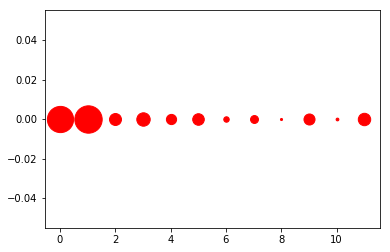

[((8, 0), 50), ((10, 0), 66), ((6, 0), 131), ((7, 0), 190), ((4, 0), 245), ((9, 0), 265), ((5, 0), 278), ((2, 0), 287), ((11, 0), 298), ((3, 0), 322), ((0, 0), 629), ((1, 0), 657)]
1379


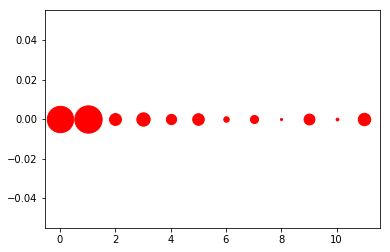

[((8, 0), 50), ((10, 0), 66), ((6, 0), 131), ((7, 0), 194), ((4, 0), 246), ((9, 0), 261), ((5, 0), 278), ((2, 0), 286), ((11, 0), 298), ((3, 0), 320), ((0, 0), 632), ((1, 0), 656)]
1380


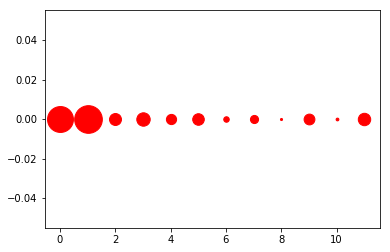

[((8, 0), 50), ((10, 0), 66), ((6, 0), 132), ((7, 0), 195), ((4, 0), 245), ((9, 0), 259), ((5, 0), 278), ((2, 0), 287), ((11, 0), 298), ((3, 0), 322), ((0, 0), 622), ((1, 0), 664)]
1381


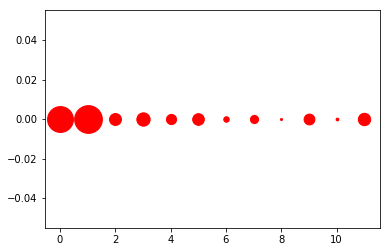

[((8, 0), 49), ((10, 0), 66), ((6, 0), 132), ((7, 0), 196), ((4, 0), 244), ((9, 0), 260), ((5, 0), 280), ((2, 0), 287), ((11, 0), 297), ((3, 0), 320), ((0, 0), 621), ((1, 0), 666)]
1382


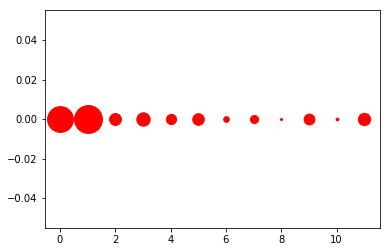

[((8, 0), 49), ((10, 0), 66), ((6, 0), 135), ((7, 0), 194), ((4, 0), 246), ((9, 0), 259), ((5, 0), 278), ((2, 0), 285), ((11, 0), 296), ((3, 0), 320), ((0, 0), 620), ((1, 0), 670)]
1383


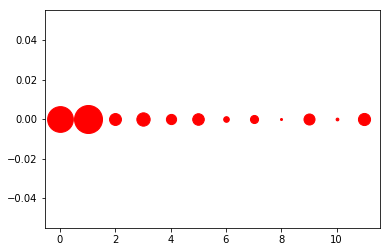

[((8, 0), 48), ((10, 0), 66), ((6, 0), 135), ((7, 0), 194), ((4, 0), 245), ((9, 0), 265), ((5, 0), 278), ((2, 0), 286), ((11, 0), 291), ((3, 0), 320), ((0, 0), 618), ((1, 0), 672)]
1384


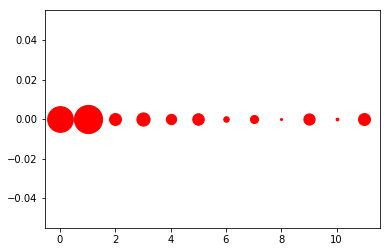

[((8, 0), 48), ((10, 0), 66), ((6, 0), 132), ((7, 0), 194), ((4, 0), 248), ((9, 0), 269), ((5, 0), 277), ((11, 0), 287), ((2, 0), 287), ((3, 0), 317), ((0, 0), 617), ((1, 0), 676)]
1385


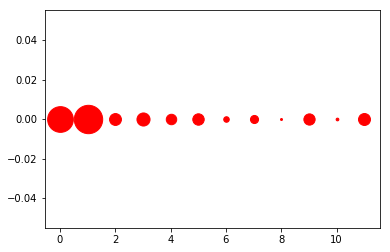

[((8, 0), 47), ((10, 0), 65), ((6, 0), 133), ((7, 0), 194), ((4, 0), 251), ((9, 0), 270), ((5, 0), 274), ((2, 0), 285), ((11, 0), 287), ((3, 0), 314), ((0, 0), 617), ((1, 0), 681)]
1386


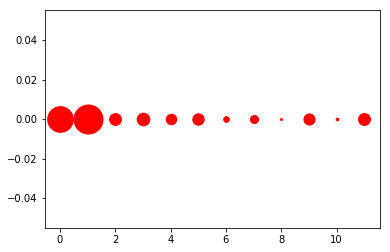

[((8, 0), 47), ((10, 0), 65), ((6, 0), 134), ((7, 0), 194), ((4, 0), 252), ((9, 0), 267), ((5, 0), 273), ((2, 0), 284), ((11, 0), 287), ((3, 0), 303), ((0, 0), 615), ((1, 0), 697)]
1387


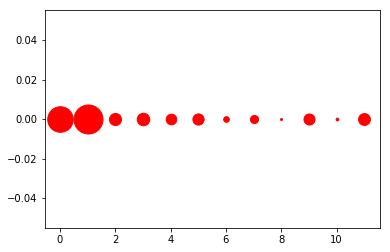

[((8, 0), 47), ((10, 0), 65), ((6, 0), 136), ((7, 0), 195), ((4, 0), 256), ((9, 0), 265), ((5, 0), 269), ((11, 0), 285), ((2, 0), 290), ((3, 0), 301), ((0, 0), 613), ((1, 0), 696)]
1388


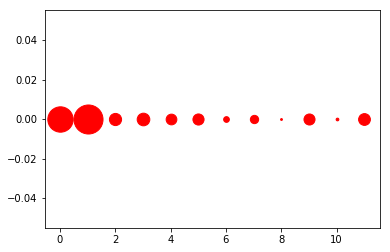

[((8, 0), 44), ((10, 0), 65), ((6, 0), 137), ((7, 0), 199), ((4, 0), 257), ((9, 0), 265), ((5, 0), 267), ((11, 0), 283), ((2, 0), 292), ((3, 0), 303), ((0, 0), 609), ((1, 0), 697)]
1389


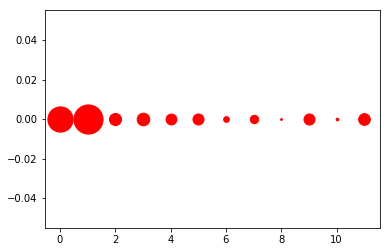

[((8, 0), 44), ((10, 0), 65), ((6, 0), 137), ((7, 0), 201), ((4, 0), 261), ((5, 0), 265), ((9, 0), 265), ((11, 0), 281), ((2, 0), 290), ((3, 0), 303), ((0, 0), 606), ((1, 0), 700)]
1390


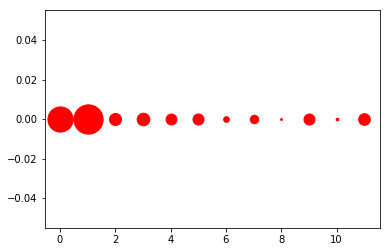

[((8, 0), 44), ((10, 0), 65), ((6, 0), 136), ((7, 0), 203), ((4, 0), 261), ((9, 0), 264), ((5, 0), 265), ((11, 0), 280), ((2, 0), 289), ((3, 0), 303), ((0, 0), 605), ((1, 0), 703)]
1391


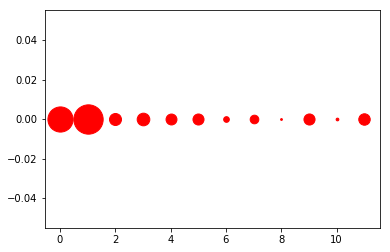

[((8, 0), 43), ((10, 0), 65), ((6, 0), 136), ((7, 0), 207), ((4, 0), 262), ((5, 0), 265), ((9, 0), 266), ((11, 0), 275), ((2, 0), 288), ((3, 0), 303), ((0, 0), 604), ((1, 0), 704)]
1392


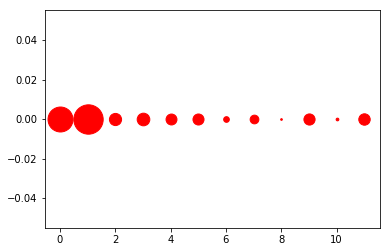

[((8, 0), 40), ((10, 0), 65), ((6, 0), 136), ((7, 0), 209), ((4, 0), 262), ((5, 0), 265), ((9, 0), 268), ((11, 0), 274), ((2, 0), 292), ((3, 0), 303), ((0, 0), 599), ((1, 0), 705)]
1393


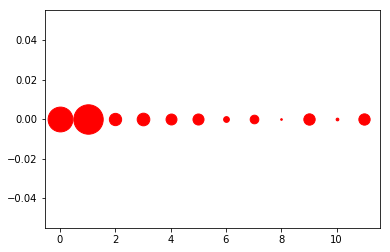

[((8, 0), 39), ((10, 0), 65), ((6, 0), 138), ((7, 0), 207), ((4, 0), 262), ((5, 0), 265), ((11, 0), 271), ((9, 0), 272), ((2, 0), 295), ((3, 0), 303), ((0, 0), 595), ((1, 0), 706)]
1394


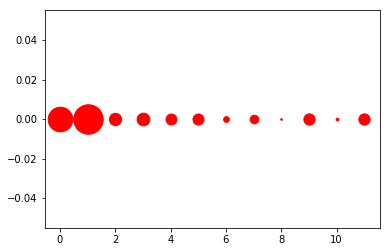

[((8, 0), 39), ((10, 0), 65), ((6, 0), 138), ((7, 0), 208), ((4, 0), 262), ((5, 0), 265), ((9, 0), 270), ((11, 0), 271), ((2, 0), 295), ((3, 0), 306), ((0, 0), 591), ((1, 0), 708)]
1395


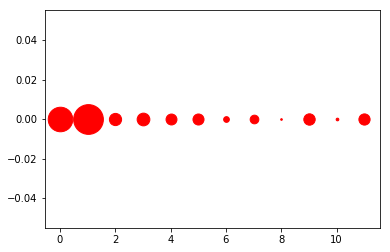

[((8, 0), 39), ((10, 0), 64), ((6, 0), 137), ((7, 0), 208), ((4, 0), 262), ((5, 0), 265), ((11, 0), 269), ((9, 0), 273), ((2, 0), 293), ((3, 0), 305), ((0, 0), 589), ((1, 0), 714)]
1396


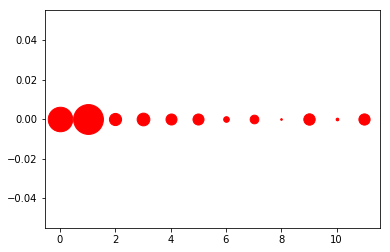

[((8, 0), 39), ((10, 0), 64), ((6, 0), 135), ((7, 0), 208), ((4, 0), 264), ((5, 0), 265), ((11, 0), 269), ((9, 0), 273), ((2, 0), 292), ((3, 0), 305), ((0, 0), 588), ((1, 0), 716)]
1397


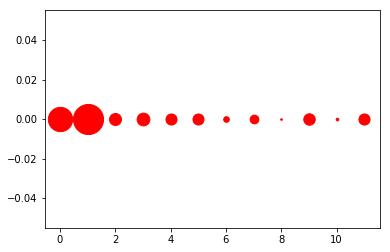

[((8, 0), 39), ((10, 0), 63), ((6, 0), 135), ((7, 0), 209), ((5, 0), 265), ((4, 0), 265), ((11, 0), 267), ((9, 0), 275), ((2, 0), 288), ((3, 0), 306), ((0, 0), 583), ((1, 0), 723)]
1398


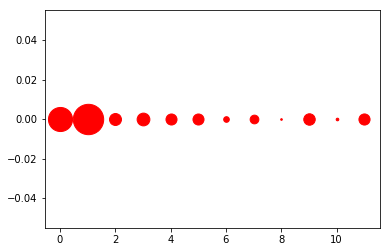

[((8, 0), 39), ((10, 0), 63), ((6, 0), 135), ((7, 0), 209), ((5, 0), 265), ((4, 0), 265), ((11, 0), 267), ((9, 0), 275), ((2, 0), 287), ((3, 0), 306), ((0, 0), 578), ((1, 0), 729)]
1399


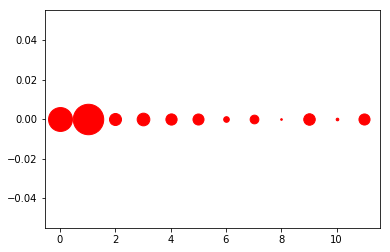

[((8, 0), 39), ((10, 0), 63), ((6, 0), 135), ((7, 0), 209), ((5, 0), 265), ((11, 0), 266), ((4, 0), 269), ((9, 0), 276), ((2, 0), 288), ((3, 0), 304), ((0, 0), 573), ((1, 0), 731)]
1400


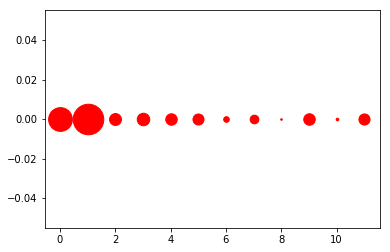

[((8, 0), 38), ((10, 0), 63), ((6, 0), 135), ((7, 0), 209), ((5, 0), 265), ((11, 0), 267), ((4, 0), 275), ((9, 0), 276), ((2, 0), 286), ((3, 0), 301), ((0, 0), 570), ((1, 0), 733)]
1401


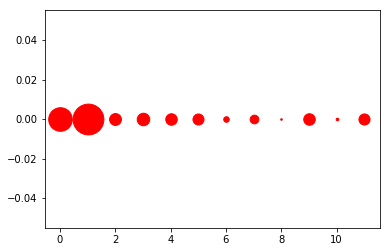

[((8, 0), 38), ((10, 0), 63), ((6, 0), 133), ((7, 0), 209), ((5, 0), 265), ((11, 0), 266), ((4, 0), 276), ((9, 0), 277), ((2, 0), 285), ((3, 0), 301), ((0, 0), 566), ((1, 0), 739)]
1402


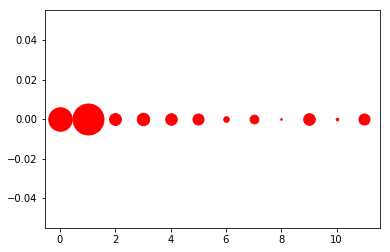

[((8, 0), 38), ((10, 0), 63), ((6, 0), 133), ((7, 0), 209), ((11, 0), 265), ((5, 0), 265), ((4, 0), 277), ((9, 0), 278), ((2, 0), 285), ((3, 0), 299), ((0, 0), 563), ((1, 0), 743)]
1403


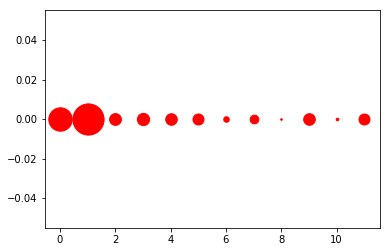

[((8, 0), 38), ((10, 0), 63), ((6, 0), 133), ((7, 0), 209), ((11, 0), 264), ((5, 0), 265), ((4, 0), 278), ((9, 0), 279), ((2, 0), 284), ((3, 0), 294), ((0, 0), 562), ((1, 0), 749)]
1404


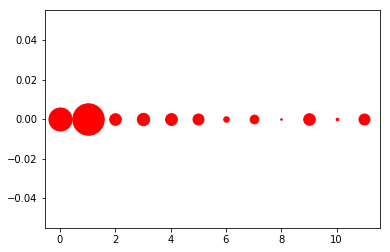

[((8, 0), 38), ((10, 0), 63), ((6, 0), 133), ((7, 0), 210), ((11, 0), 264), ((5, 0), 264), ((9, 0), 278), ((2, 0), 279), ((4, 0), 283), ((3, 0), 297), ((0, 0), 554), ((1, 0), 755)]
1405


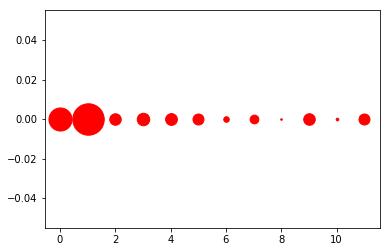

[((8, 0), 38), ((10, 0), 63), ((6, 0), 133), ((7, 0), 210), ((11, 0), 264), ((5, 0), 264), ((2, 0), 276), ((9, 0), 278), ((4, 0), 283), ((3, 0), 300), ((0, 0), 554), ((1, 0), 755)]
1406


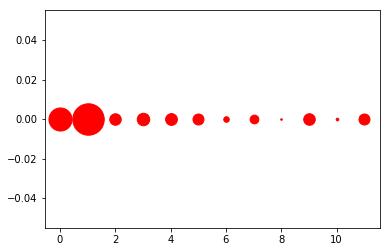

[((8, 0), 38), ((10, 0), 63), ((6, 0), 133), ((7, 0), 210), ((11, 0), 264), ((5, 0), 264), ((2, 0), 276), ((9, 0), 278), ((4, 0), 283), ((3, 0), 300), ((0, 0), 554), ((1, 0), 755)]
1407


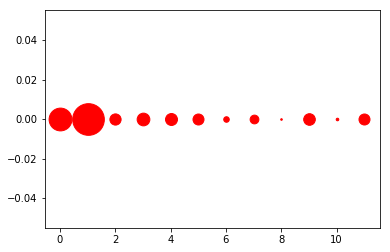

[((8, 0), 38), ((10, 0), 62), ((6, 0), 133), ((7, 0), 210), ((11, 0), 264), ((5, 0), 264), ((2, 0), 269), ((9, 0), 279), ((4, 0), 287), ((3, 0), 305), ((0, 0), 547), ((1, 0), 760)]
1408


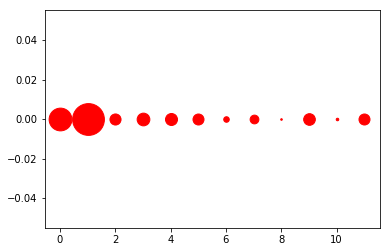

[((8, 0), 38), ((10, 0), 61), ((6, 0), 133), ((7, 0), 210), ((11, 0), 264), ((5, 0), 264), ((2, 0), 266), ((9, 0), 280), ((4, 0), 288), ((3, 0), 305), ((0, 0), 546), ((1, 0), 763)]
1409


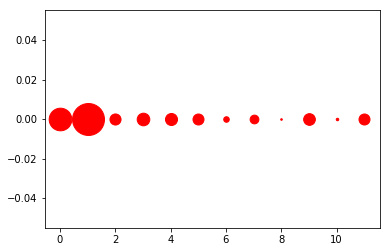

[((8, 0), 38), ((10, 0), 60), ((6, 0), 133), ((7, 0), 210), ((11, 0), 264), ((5, 0), 264), ((2, 0), 266), ((9, 0), 281), ((4, 0), 289), ((3, 0), 303), ((0, 0), 543), ((1, 0), 767)]
1410


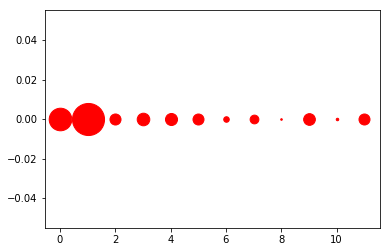

[((8, 0), 38), ((10, 0), 60), ((6, 0), 133), ((7, 0), 210), ((11, 0), 264), ((5, 0), 264), ((2, 0), 265), ((9, 0), 281), ((4, 0), 289), ((3, 0), 302), ((0, 0), 542), ((1, 0), 770)]
1411


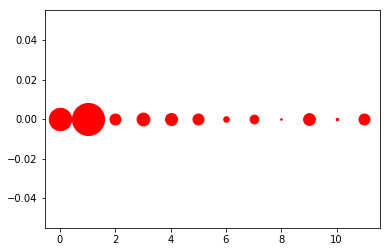

[((8, 0), 37), ((10, 0), 59), ((6, 0), 133), ((7, 0), 210), ((11, 0), 264), ((5, 0), 264), ((2, 0), 264), ((9, 0), 283), ((4, 0), 289), ((3, 0), 308), ((0, 0), 537), ((1, 0), 770)]
1412


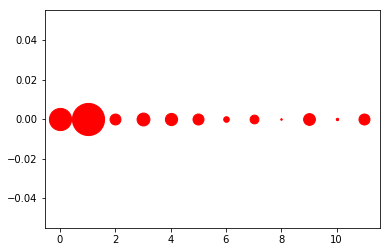

[((8, 0), 36), ((10, 0), 58), ((6, 0), 134), ((7, 0), 211), ((2, 0), 262), ((11, 0), 264), ((5, 0), 264), ((9, 0), 283), ((4, 0), 293), ((3, 0), 309), ((0, 0), 532), ((1, 0), 772)]
1413


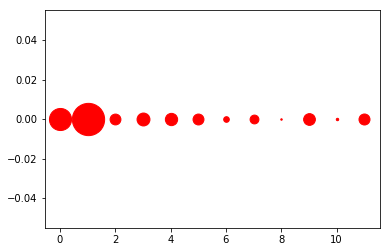

[((8, 0), 35), ((10, 0), 58), ((6, 0), 135), ((7, 0), 212), ((2, 0), 260), ((5, 0), 262), ((11, 0), 264), ((9, 0), 282), ((4, 0), 295), ((3, 0), 310), ((0, 0), 530), ((1, 0), 775)]
1414


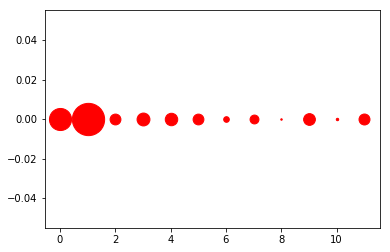

[((8, 0), 35), ((10, 0), 58), ((6, 0), 135), ((7, 0), 213), ((5, 0), 259), ((2, 0), 260), ((11, 0), 263), ((9, 0), 282), ((4, 0), 299), ((3, 0), 309), ((0, 0), 530), ((1, 0), 775)]
1415


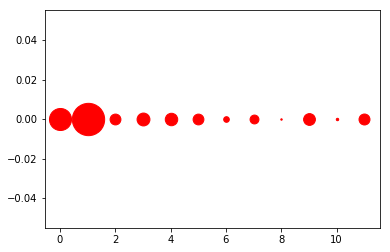

[((8, 0), 34), ((10, 0), 58), ((6, 0), 135), ((7, 0), 213), ((5, 0), 259), ((2, 0), 260), ((11, 0), 263), ((9, 0), 283), ((4, 0), 299), ((3, 0), 309), ((0, 0), 529), ((1, 0), 776)]
1416


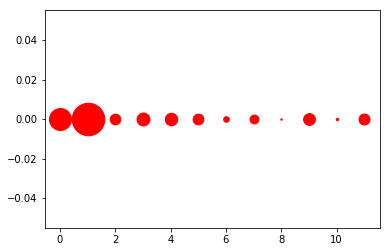

[((8, 0), 34), ((10, 0), 58), ((6, 0), 135), ((7, 0), 213), ((2, 0), 256), ((5, 0), 259), ((11, 0), 263), ((9, 0), 283), ((4, 0), 299), ((3, 0), 310), ((0, 0), 527), ((1, 0), 781)]
1417


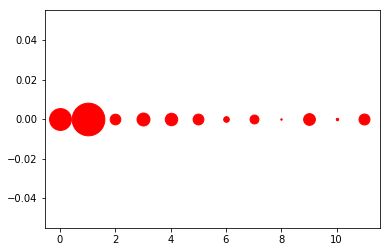

[((8, 0), 34), ((10, 0), 58), ((6, 0), 135), ((7, 0), 214), ((2, 0), 256), ((5, 0), 259), ((11, 0), 263), ((9, 0), 282), ((4, 0), 299), ((3, 0), 311), ((0, 0), 523), ((1, 0), 784)]
1418


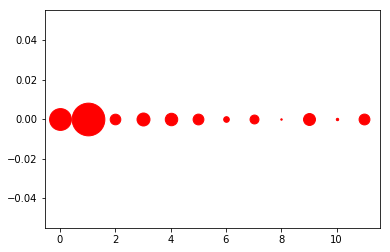

[((8, 0), 34), ((10, 0), 57), ((6, 0), 135), ((7, 0), 214), ((2, 0), 255), ((5, 0), 259), ((11, 0), 260), ((9, 0), 286), ((4, 0), 299), ((3, 0), 311), ((0, 0), 523), ((1, 0), 785)]
1419


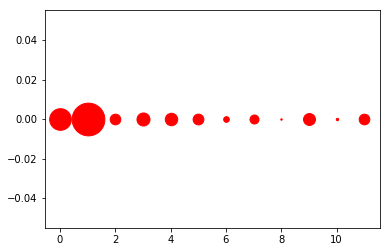

[((8, 0), 34), ((10, 0), 57), ((6, 0), 136), ((7, 0), 216), ((11, 0), 256), ((2, 0), 256), ((5, 0), 259), ((9, 0), 287), ((4, 0), 299), ((3, 0), 313), ((0, 0), 519), ((1, 0), 786)]
1420


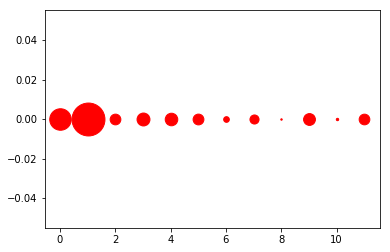

[((8, 0), 34), ((10, 0), 57), ((6, 0), 136), ((7, 0), 218), ((11, 0), 256), ((2, 0), 257), ((5, 0), 259), ((9, 0), 284), ((4, 0), 301), ((3, 0), 310), ((0, 0), 516), ((1, 0), 790)]
1421


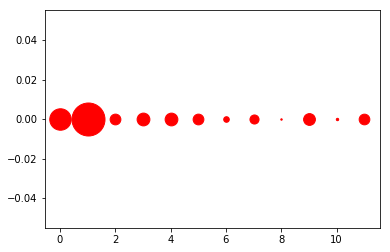

[((8, 0), 34), ((10, 0), 57), ((6, 0), 134), ((7, 0), 218), ((11, 0), 256), ((5, 0), 258), ((2, 0), 258), ((9, 0), 283), ((4, 0), 306), ((3, 0), 307), ((0, 0), 515), ((1, 0), 792)]
1422


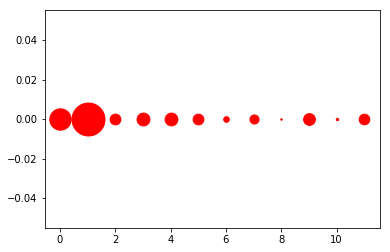

[((8, 0), 34), ((10, 0), 57), ((6, 0), 134), ((7, 0), 218), ((11, 0), 255), ((5, 0), 258), ((2, 0), 259), ((9, 0), 283), ((4, 0), 307), ((3, 0), 309), ((0, 0), 513), ((1, 0), 791)]
1423


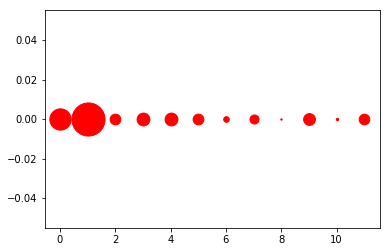

[((8, 0), 33), ((10, 0), 57), ((6, 0), 135), ((7, 0), 218), ((11, 0), 255), ((5, 0), 258), ((2, 0), 258), ((9, 0), 283), ((3, 0), 307), ((4, 0), 308), ((0, 0), 511), ((1, 0), 795)]
1424


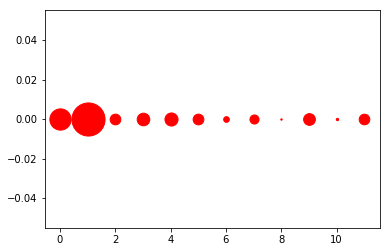

[((8, 0), 33), ((10, 0), 57), ((6, 0), 136), ((7, 0), 218), ((11, 0), 255), ((2, 0), 257), ((5, 0), 258), ((9, 0), 282), ((3, 0), 303), ((4, 0), 314), ((0, 0), 510), ((1, 0), 795)]
1425


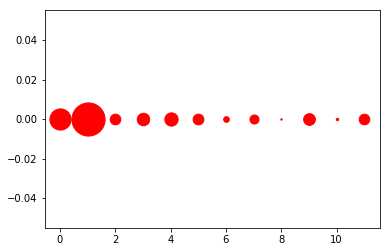

[((8, 0), 33), ((10, 0), 57), ((6, 0), 136), ((7, 0), 218), ((11, 0), 255), ((2, 0), 256), ((5, 0), 258), ((9, 0), 282), ((3, 0), 300), ((4, 0), 319), ((0, 0), 508), ((1, 0), 796)]
1426


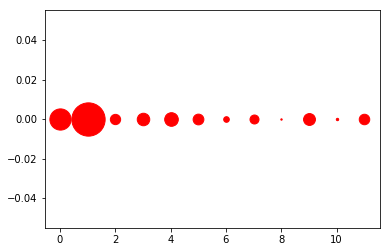

[((8, 0), 33), ((10, 0), 57), ((6, 0), 135), ((7, 0), 216), ((2, 0), 247), ((11, 0), 252), ((5, 0), 258), ((9, 0), 285), ((3, 0), 300), ((4, 0), 327), ((0, 0), 509), ((1, 0), 799)]
1427


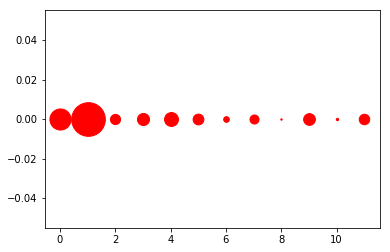

[((8, 0), 33), ((10, 0), 57), ((6, 0), 136), ((7, 0), 217), ((2, 0), 244), ((11, 0), 252), ((5, 0), 259), ((9, 0), 282), ((3, 0), 290), ((4, 0), 334), ((0, 0), 506), ((1, 0), 808)]
1428


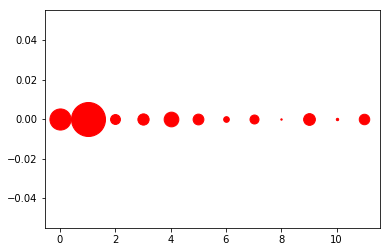

[((8, 0), 33), ((10, 0), 57), ((6, 0), 136), ((7, 0), 216), ((2, 0), 237), ((11, 0), 252), ((5, 0), 259), ((3, 0), 270), ((9, 0), 282), ((4, 0), 353), ((0, 0), 507), ((1, 0), 816)]
1429


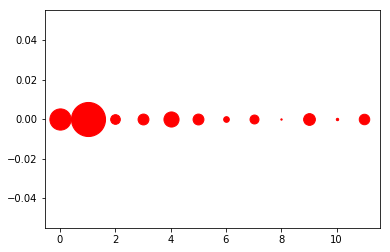

[((8, 0), 32), ((10, 0), 57), ((6, 0), 136), ((7, 0), 215), ((2, 0), 232), ((11, 0), 252), ((5, 0), 261), ((3, 0), 261), ((9, 0), 282), ((4, 0), 363), ((0, 0), 509), ((1, 0), 818)]
1430


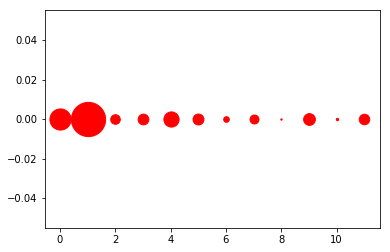

[((8, 0), 32), ((10, 0), 57), ((6, 0), 135), ((7, 0), 215), ((2, 0), 230), ((11, 0), 252), ((3, 0), 258), ((5, 0), 262), ((9, 0), 282), ((4, 0), 365), ((0, 0), 508), ((1, 0), 822)]
1431


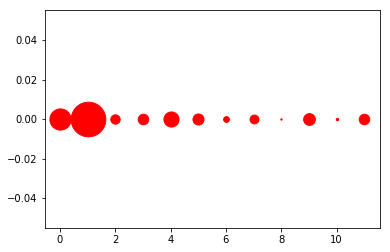

[((8, 0), 32), ((10, 0), 57), ((6, 0), 138), ((7, 0), 212), ((2, 0), 225), ((11, 0), 252), ((3, 0), 253), ((5, 0), 265), ((9, 0), 282), ((4, 0), 363), ((0, 0), 508), ((1, 0), 831)]
1432


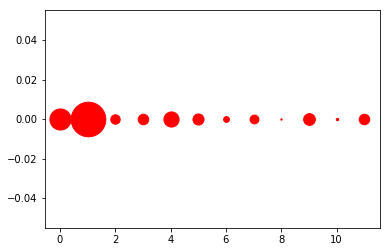

[((8, 0), 32), ((10, 0), 57), ((6, 0), 139), ((7, 0), 211), ((2, 0), 226), ((11, 0), 252), ((3, 0), 252), ((5, 0), 266), ((9, 0), 282), ((4, 0), 364), ((0, 0), 506), ((1, 0), 831)]
1433


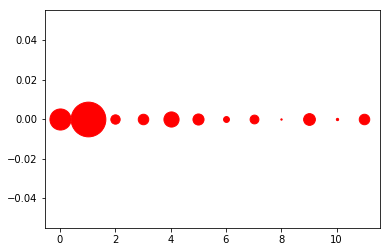

[((8, 0), 32), ((10, 0), 55), ((6, 0), 141), ((7, 0), 211), ((2, 0), 224), ((11, 0), 252), ((3, 0), 252), ((5, 0), 266), ((9, 0), 282), ((4, 0), 364), ((0, 0), 506), ((1, 0), 833)]
1434


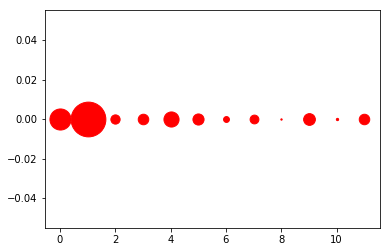

[((8, 0), 32), ((10, 0), 55), ((6, 0), 141), ((7, 0), 211), ((2, 0), 222), ((11, 0), 252), ((3, 0), 253), ((5, 0), 267), ((9, 0), 282), ((4, 0), 363), ((0, 0), 506), ((1, 0), 834)]
1435


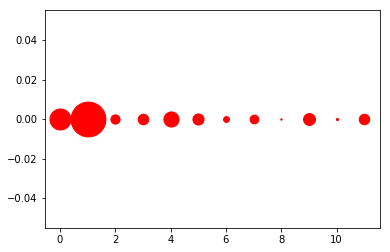

[((8, 0), 32), ((10, 0), 52), ((6, 0), 141), ((7, 0), 210), ((2, 0), 221), ((11, 0), 252), ((3, 0), 254), ((5, 0), 267), ((9, 0), 286), ((4, 0), 363), ((0, 0), 504), ((1, 0), 836)]
1436


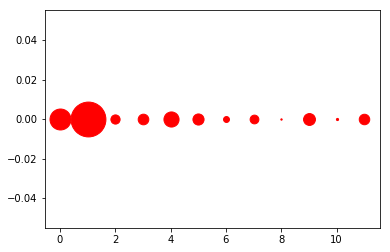

[((8, 0), 32), ((10, 0), 52), ((6, 0), 142), ((7, 0), 210), ((2, 0), 221), ((11, 0), 252), ((3, 0), 255), ((5, 0), 267), ((9, 0), 285), ((4, 0), 363), ((0, 0), 503), ((1, 0), 836)]
1437


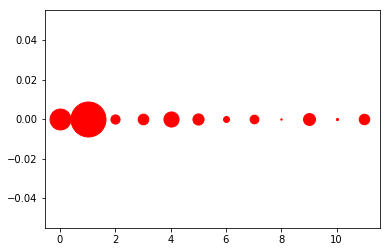

[((8, 0), 32), ((10, 0), 51), ((6, 0), 142), ((7, 0), 209), ((2, 0), 220), ((11, 0), 252), ((3, 0), 255), ((5, 0), 267), ((9, 0), 287), ((4, 0), 363), ((0, 0), 501), ((1, 0), 839)]
1438


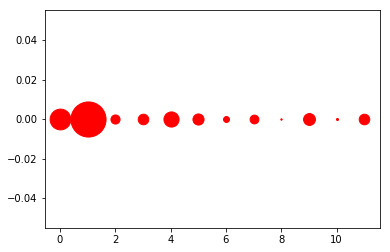

[((8, 0), 32), ((10, 0), 49), ((6, 0), 142), ((7, 0), 211), ((2, 0), 219), ((11, 0), 254), ((3, 0), 254), ((5, 0), 267), ((9, 0), 285), ((4, 0), 364), ((0, 0), 498), ((1, 0), 843)]
1439


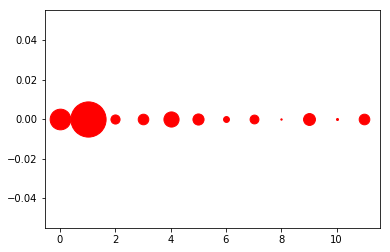

[((8, 0), 32), ((10, 0), 48), ((6, 0), 141), ((7, 0), 212), ((2, 0), 219), ((3, 0), 254), ((11, 0), 255), ((5, 0), 267), ((9, 0), 285), ((4, 0), 364), ((0, 0), 496), ((1, 0), 845)]
1440


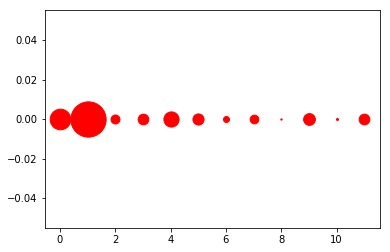

[((8, 0), 31), ((10, 0), 48), ((6, 0), 144), ((7, 0), 209), ((2, 0), 215), ((11, 0), 257), ((3, 0), 257), ((5, 0), 267), ((9, 0), 283), ((4, 0), 365), ((0, 0), 495), ((1, 0), 847)]
1441


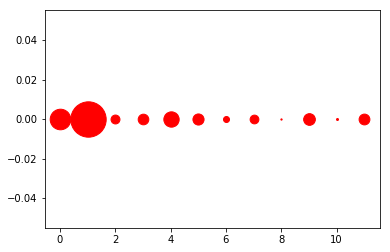

[((8, 0), 30), ((10, 0), 47), ((6, 0), 144), ((7, 0), 210), ((2, 0), 214), ((3, 0), 255), ((11, 0), 259), ((5, 0), 267), ((9, 0), 281), ((4, 0), 368), ((0, 0), 494), ((1, 0), 849)]
1442


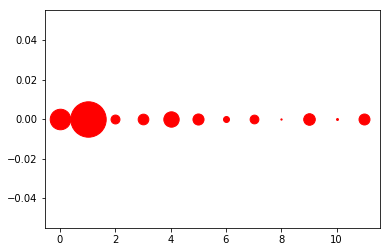

[((8, 0), 30), ((10, 0), 46), ((6, 0), 143), ((7, 0), 210), ((2, 0), 214), ((3, 0), 256), ((11, 0), 263), ((5, 0), 266), ((9, 0), 278), ((4, 0), 369), ((0, 0), 493), ((1, 0), 850)]
1443


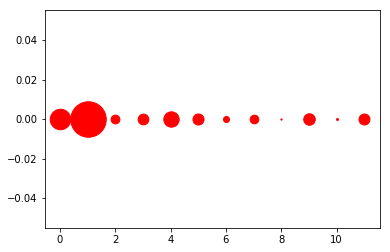

[((8, 0), 30), ((10, 0), 46), ((6, 0), 144), ((7, 0), 209), ((2, 0), 212), ((3, 0), 258), ((11, 0), 263), ((5, 0), 266), ((9, 0), 277), ((4, 0), 369), ((0, 0), 492), ((1, 0), 852)]
1444


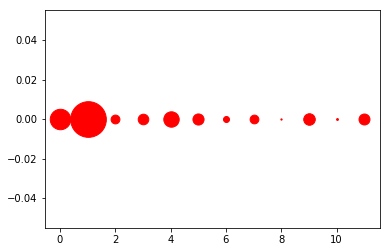

[((8, 0), 30), ((10, 0), 44), ((6, 0), 144), ((7, 0), 210), ((2, 0), 212), ((3, 0), 254), ((11, 0), 263), ((5, 0), 267), ((9, 0), 277), ((4, 0), 370), ((0, 0), 491), ((1, 0), 856)]
1445


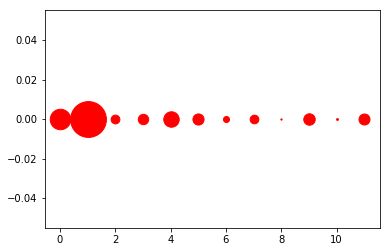

[((8, 0), 30), ((10, 0), 44), ((6, 0), 145), ((7, 0), 209), ((2, 0), 211), ((3, 0), 250), ((11, 0), 264), ((5, 0), 267), ((9, 0), 275), ((4, 0), 371), ((0, 0), 492), ((1, 0), 860)]
1446


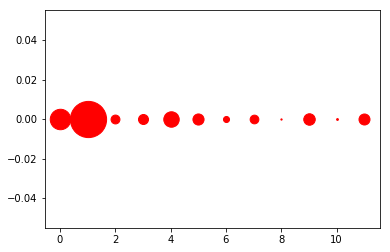

[((8, 0), 30), ((10, 0), 43), ((6, 0), 145), ((7, 0), 209), ((2, 0), 213), ((3, 0), 240), ((11, 0), 264), ((5, 0), 267), ((9, 0), 276), ((4, 0), 371), ((0, 0), 491), ((1, 0), 869)]
1447


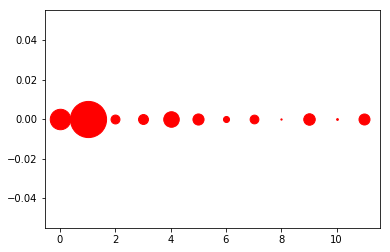

[((8, 0), 30), ((10, 0), 42), ((6, 0), 145), ((7, 0), 210), ((2, 0), 214), ((3, 0), 238), ((11, 0), 264), ((5, 0), 267), ((9, 0), 276), ((4, 0), 373), ((0, 0), 491), ((1, 0), 868)]
1448


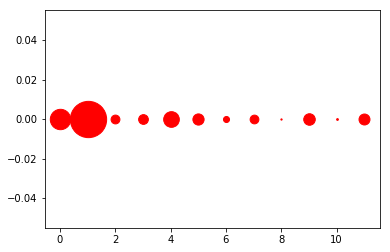

[((8, 0), 30), ((10, 0), 42), ((6, 0), 145), ((7, 0), 210), ((2, 0), 212), ((3, 0), 234), ((11, 0), 263), ((5, 0), 269), ((9, 0), 277), ((4, 0), 376), ((0, 0), 489), ((1, 0), 871)]
1449


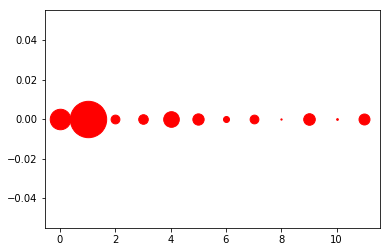

[((8, 0), 30), ((10, 0), 41), ((6, 0), 144), ((7, 0), 210), ((2, 0), 211), ((3, 0), 230), ((11, 0), 263), ((5, 0), 271), ((9, 0), 278), ((4, 0), 375), ((0, 0), 492), ((1, 0), 873)]
1450


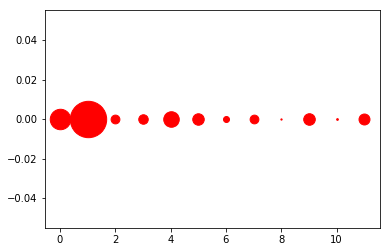

[((8, 0), 30), ((10, 0), 41), ((6, 0), 144), ((7, 0), 210), ((2, 0), 211), ((3, 0), 228), ((11, 0), 263), ((5, 0), 276), ((9, 0), 278), ((4, 0), 373), ((0, 0), 491), ((1, 0), 873)]
1451


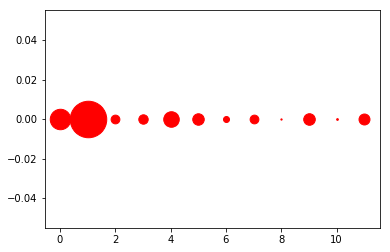

[((8, 0), 30), ((10, 0), 41), ((6, 0), 144), ((2, 0), 210), ((7, 0), 210), ((3, 0), 226), ((11, 0), 263), ((5, 0), 276), ((9, 0), 278), ((4, 0), 373), ((0, 0), 491), ((1, 0), 876)]
1452


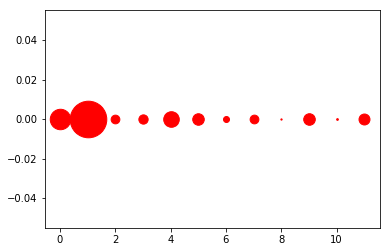

[((8, 0), 30), ((10, 0), 41), ((6, 0), 144), ((2, 0), 209), ((7, 0), 210), ((3, 0), 223), ((11, 0), 263), ((5, 0), 277), ((9, 0), 278), ((4, 0), 374), ((0, 0), 491), ((1, 0), 878)]
1453


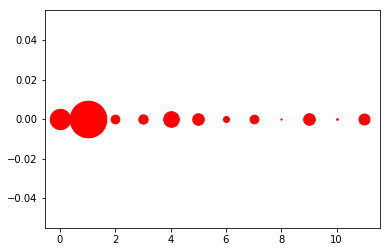

[((8, 0), 30), ((10, 0), 40), ((6, 0), 144), ((2, 0), 209), ((7, 0), 210), ((3, 0), 223), ((11, 0), 263), ((5, 0), 277), ((9, 0), 279), ((4, 0), 375), ((0, 0), 488), ((1, 0), 880)]
1454


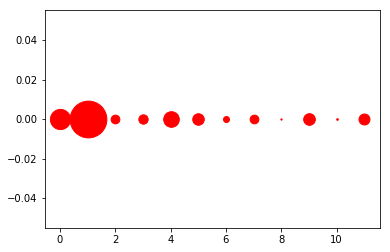

[((8, 0), 30), ((10, 0), 39), ((6, 0), 144), ((2, 0), 210), ((7, 0), 210), ((3, 0), 224), ((11, 0), 263), ((5, 0), 277), ((9, 0), 280), ((4, 0), 375), ((0, 0), 484), ((1, 0), 882)]
1455


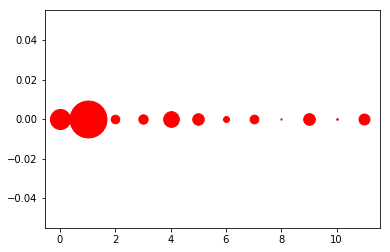

[((8, 0), 30), ((10, 0), 39), ((6, 0), 144), ((2, 0), 207), ((7, 0), 210), ((3, 0), 225), ((11, 0), 263), ((5, 0), 277), ((9, 0), 280), ((4, 0), 376), ((0, 0), 481), ((1, 0), 886)]
1456


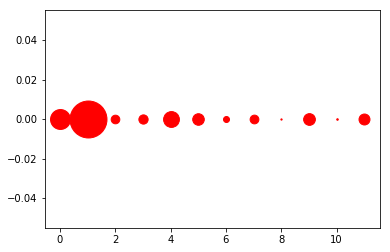

[((8, 0), 30), ((10, 0), 37), ((6, 0), 144), ((2, 0), 207), ((7, 0), 210), ((3, 0), 222), ((11, 0), 263), ((5, 0), 278), ((9, 0), 282), ((4, 0), 380), ((0, 0), 478), ((1, 0), 887)]
1457


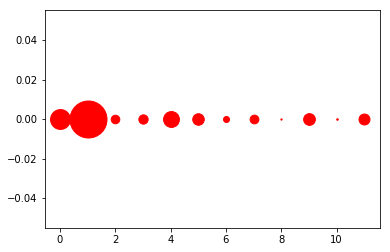

[((8, 0), 30), ((10, 0), 37), ((6, 0), 144), ((2, 0), 206), ((7, 0), 210), ((3, 0), 223), ((11, 0), 263), ((5, 0), 277), ((9, 0), 282), ((4, 0), 381), ((0, 0), 477), ((1, 0), 888)]
1458


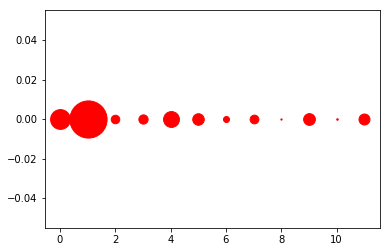

[((8, 0), 30), ((10, 0), 37), ((6, 0), 144), ((2, 0), 205), ((7, 0), 210), ((3, 0), 222), ((11, 0), 263), ((5, 0), 277), ((9, 0), 282), ((4, 0), 381), ((0, 0), 475), ((1, 0), 892)]
1459


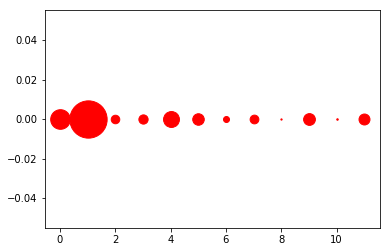

[((8, 0), 30), ((10, 0), 36), ((6, 0), 144), ((2, 0), 205), ((7, 0), 210), ((3, 0), 222), ((11, 0), 263), ((5, 0), 277), ((9, 0), 283), ((4, 0), 382), ((0, 0), 471), ((1, 0), 895)]
1460


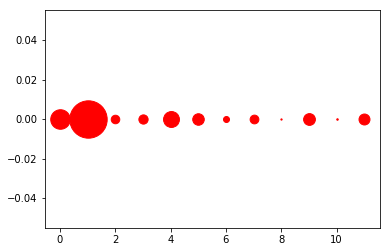

[((8, 0), 30), ((10, 0), 36), ((6, 0), 144), ((2, 0), 205), ((7, 0), 210), ((3, 0), 222), ((11, 0), 263), ((5, 0), 277), ((9, 0), 283), ((4, 0), 382), ((0, 0), 469), ((1, 0), 897)]
1461


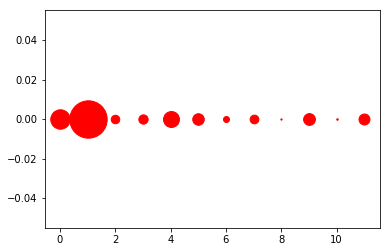

[((8, 0), 30), ((10, 0), 36), ((6, 0), 144), ((2, 0), 205), ((7, 0), 210), ((3, 0), 223), ((11, 0), 263), ((5, 0), 277), ((9, 0), 283), ((4, 0), 383), ((0, 0), 467), ((1, 0), 897)]
1462


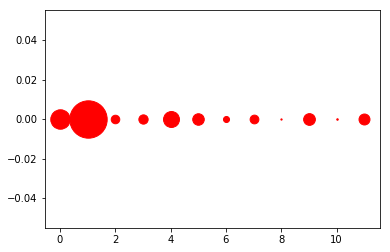

[((8, 0), 30), ((10, 0), 36), ((6, 0), 145), ((2, 0), 205), ((7, 0), 210), ((3, 0), 223), ((11, 0), 263), ((5, 0), 277), ((9, 0), 282), ((4, 0), 383), ((0, 0), 467), ((1, 0), 897)]
1463


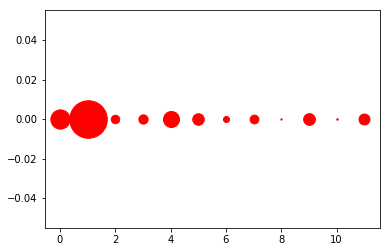

[((8, 0), 30), ((10, 0), 35), ((6, 0), 145), ((2, 0), 203), ((7, 0), 211), ((3, 0), 223), ((11, 0), 263), ((5, 0), 277), ((9, 0), 282), ((4, 0), 385), ((0, 0), 463), ((1, 0), 901)]
1464


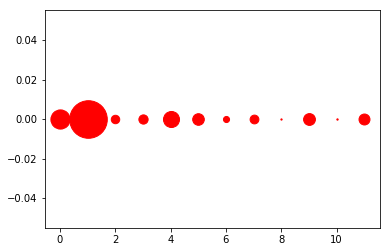

[((8, 0), 30), ((10, 0), 32), ((6, 0), 146), ((2, 0), 203), ((7, 0), 211), ((3, 0), 222), ((11, 0), 263), ((5, 0), 279), ((9, 0), 284), ((4, 0), 385), ((0, 0), 461), ((1, 0), 902)]
1465


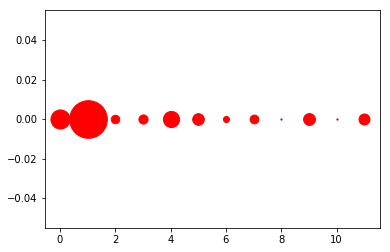

[((8, 0), 30), ((10, 0), 31), ((6, 0), 146), ((2, 0), 204), ((7, 0), 211), ((3, 0), 219), ((11, 0), 263), ((5, 0), 279), ((9, 0), 284), ((4, 0), 388), ((0, 0), 459), ((1, 0), 904)]
1466


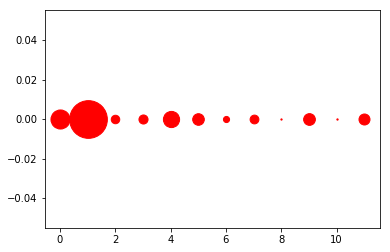

[((8, 0), 30), ((10, 0), 31), ((6, 0), 147), ((2, 0), 204), ((7, 0), 211), ((3, 0), 218), ((11, 0), 264), ((5, 0), 279), ((9, 0), 282), ((4, 0), 389), ((0, 0), 458), ((1, 0), 905)]
1467


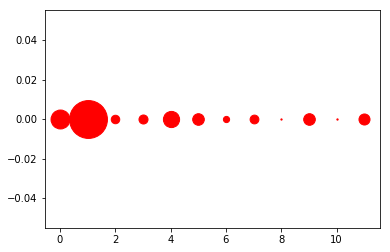

[((8, 0), 30), ((10, 0), 31), ((6, 0), 149), ((2, 0), 204), ((7, 0), 211), ((3, 0), 217), ((11, 0), 265), ((5, 0), 279), ((9, 0), 279), ((4, 0), 389), ((0, 0), 455), ((1, 0), 909)]
1468


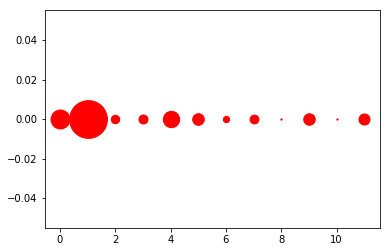

[((8, 0), 30), ((10, 0), 30), ((6, 0), 151), ((2, 0), 203), ((7, 0), 213), ((3, 0), 217), ((11, 0), 265), ((9, 0), 276), ((5, 0), 279), ((4, 0), 392), ((0, 0), 455), ((1, 0), 907)]
1469


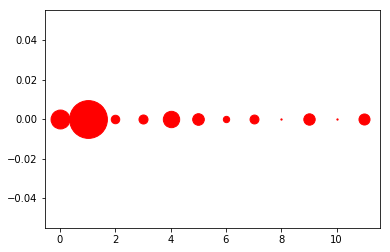

[((8, 0), 30), ((10, 0), 30), ((6, 0), 152), ((2, 0), 204), ((7, 0), 214), ((3, 0), 217), ((11, 0), 265), ((9, 0), 273), ((5, 0), 279), ((4, 0), 393), ((0, 0), 454), ((1, 0), 907)]
1470


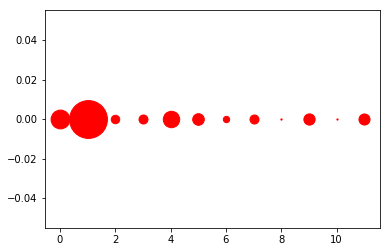

[((10, 0), 29), ((8, 0), 30), ((6, 0), 152), ((2, 0), 204), ((3, 0), 216), ((7, 0), 217), ((11, 0), 266), ((9, 0), 270), ((5, 0), 279), ((4, 0), 395), ((0, 0), 452), ((1, 0), 908)]
1471


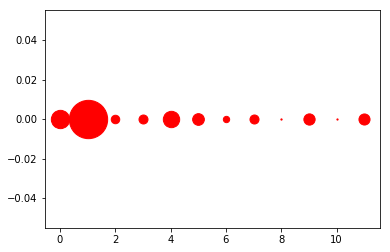

[((10, 0), 29), ((8, 0), 30), ((6, 0), 152), ((2, 0), 204), ((3, 0), 216), ((7, 0), 217), ((11, 0), 266), ((9, 0), 270), ((5, 0), 281), ((4, 0), 393), ((0, 0), 440), ((1, 0), 920)]
1472


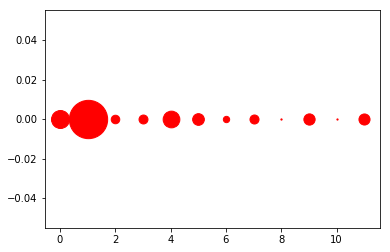

[((10, 0), 29), ((8, 0), 30), ((6, 0), 152), ((2, 0), 205), ((3, 0), 215), ((7, 0), 217), ((11, 0), 266), ((9, 0), 270), ((5, 0), 281), ((4, 0), 401), ((0, 0), 432), ((1, 0), 920)]
1473


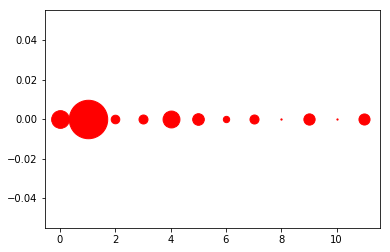

[((10, 0), 29), ((8, 0), 30), ((6, 0), 152), ((2, 0), 206), ((3, 0), 216), ((7, 0), 217), ((11, 0), 266), ((9, 0), 270), ((5, 0), 279), ((4, 0), 405), ((0, 0), 425), ((1, 0), 923)]
1474


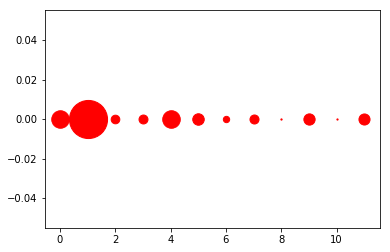

[((10, 0), 29), ((8, 0), 30), ((6, 0), 152), ((2, 0), 207), ((3, 0), 215), ((7, 0), 217), ((11, 0), 266), ((9, 0), 270), ((5, 0), 276), ((0, 0), 420), ((4, 0), 421), ((1, 0), 915)]
1475


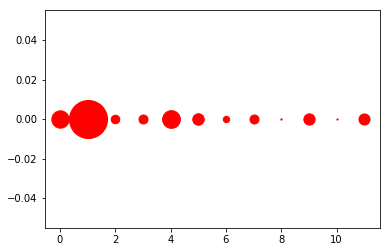

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 206), ((3, 0), 216), ((7, 0), 217), ((11, 0), 266), ((9, 0), 270), ((5, 0), 276), ((0, 0), 417), ((4, 0), 426), ((1, 0), 913)]
1476


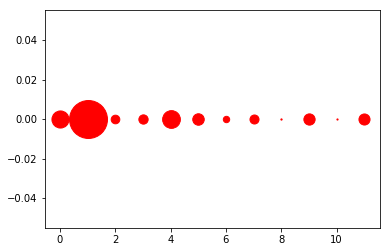

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 207), ((7, 0), 217), ((3, 0), 223), ((11, 0), 266), ((9, 0), 270), ((5, 0), 276), ((0, 0), 411), ((4, 0), 426), ((1, 0), 911)]
1477


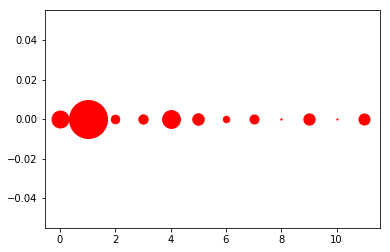

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 206), ((7, 0), 217), ((3, 0), 224), ((11, 0), 266), ((9, 0), 270), ((5, 0), 276), ((0, 0), 408), ((4, 0), 428), ((1, 0), 912)]
1478


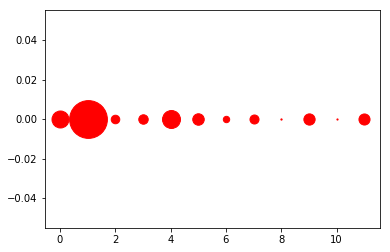

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 205), ((7, 0), 217), ((3, 0), 227), ((11, 0), 266), ((9, 0), 270), ((5, 0), 276), ((0, 0), 408), ((4, 0), 431), ((1, 0), 907)]
1479


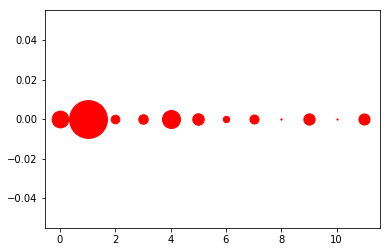

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 207), ((7, 0), 217), ((3, 0), 228), ((11, 0), 266), ((9, 0), 270), ((5, 0), 276), ((0, 0), 403), ((4, 0), 432), ((1, 0), 908)]
1480


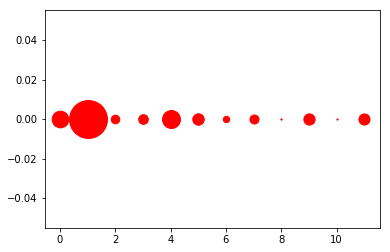

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 206), ((7, 0), 217), ((3, 0), 231), ((11, 0), 266), ((9, 0), 270), ((5, 0), 275), ((0, 0), 400), ((4, 0), 432), ((1, 0), 910)]
1481


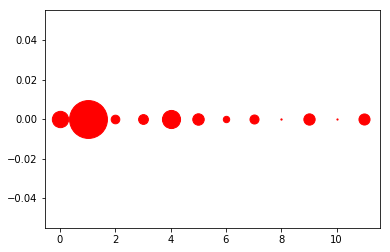

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 207), ((7, 0), 217), ((3, 0), 235), ((11, 0), 266), ((9, 0), 271), ((5, 0), 275), ((0, 0), 392), ((4, 0), 435), ((1, 0), 909)]
1482


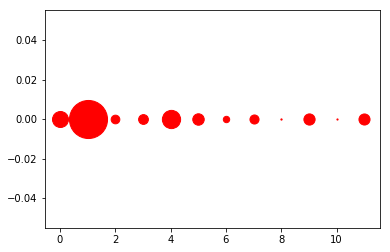

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 208), ((7, 0), 218), ((3, 0), 235), ((11, 0), 266), ((9, 0), 269), ((5, 0), 275), ((0, 0), 384), ((4, 0), 438), ((1, 0), 914)]
1483


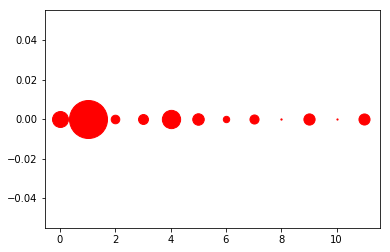

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 206), ((7, 0), 218), ((3, 0), 238), ((11, 0), 266), ((9, 0), 269), ((5, 0), 276), ((0, 0), 383), ((4, 0), 439), ((1, 0), 912)]
1484


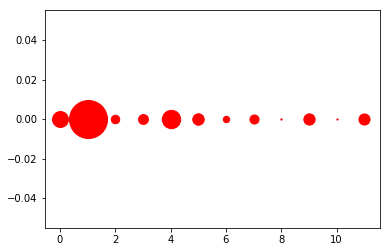

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 204), ((7, 0), 218), ((3, 0), 238), ((11, 0), 266), ((9, 0), 270), ((5, 0), 275), ((0, 0), 383), ((4, 0), 441), ((1, 0), 912)]
1485


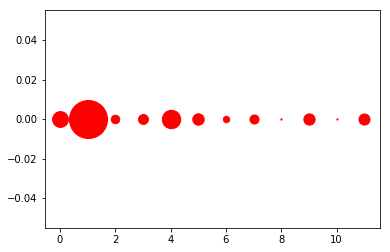

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 205), ((7, 0), 218), ((3, 0), 238), ((11, 0), 266), ((9, 0), 270), ((5, 0), 274), ((0, 0), 380), ((4, 0), 443), ((1, 0), 913)]
1486


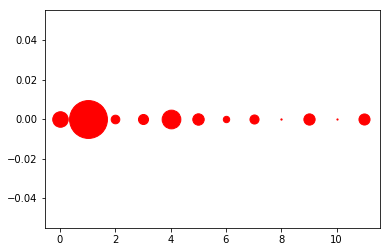

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 207), ((7, 0), 218), ((3, 0), 241), ((11, 0), 266), ((9, 0), 270), ((5, 0), 274), ((0, 0), 373), ((4, 0), 449), ((1, 0), 909)]
1487


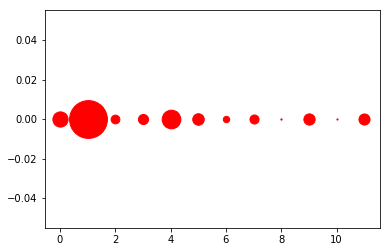

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 210), ((7, 0), 218), ((3, 0), 243), ((11, 0), 266), ((9, 0), 270), ((5, 0), 277), ((0, 0), 366), ((4, 0), 449), ((1, 0), 908)]
1488


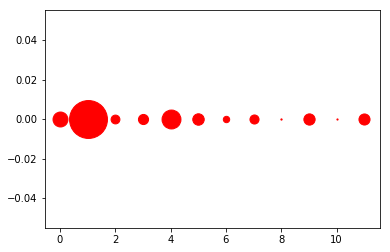

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 212), ((7, 0), 218), ((3, 0), 243), ((11, 0), 266), ((9, 0), 270), ((5, 0), 275), ((0, 0), 359), ((4, 0), 454), ((1, 0), 910)]
1489


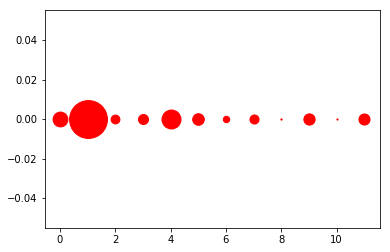

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 212), ((7, 0), 218), ((3, 0), 241), ((11, 0), 266), ((9, 0), 270), ((5, 0), 279), ((0, 0), 356), ((4, 0), 456), ((1, 0), 909)]
1490


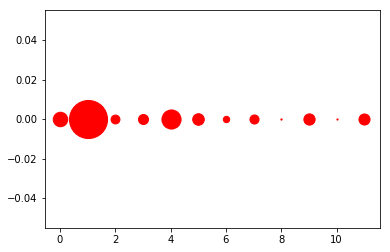

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 213), ((7, 0), 218), ((3, 0), 241), ((11, 0), 266), ((9, 0), 270), ((5, 0), 278), ((0, 0), 348), ((4, 0), 459), ((1, 0), 914)]
1491


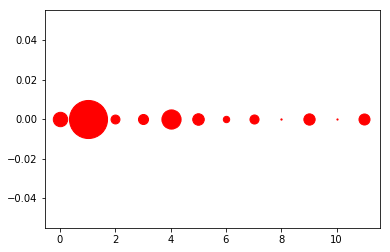

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 214), ((7, 0), 218), ((3, 0), 241), ((11, 0), 265), ((9, 0), 271), ((5, 0), 277), ((0, 0), 346), ((4, 0), 461), ((1, 0), 914)]
1492


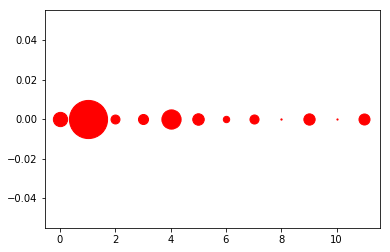

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 215), ((7, 0), 218), ((3, 0), 241), ((11, 0), 265), ((9, 0), 271), ((5, 0), 276), ((0, 0), 343), ((4, 0), 462), ((1, 0), 916)]
1493


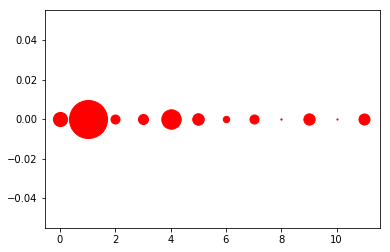

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 216), ((7, 0), 218), ((3, 0), 241), ((11, 0), 265), ((9, 0), 271), ((5, 0), 277), ((0, 0), 340), ((4, 0), 466), ((1, 0), 913)]
1494


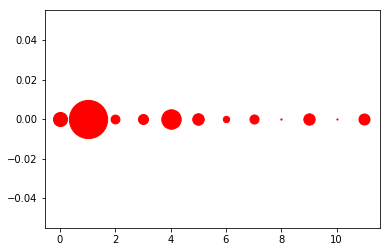

[((10, 0), 28), ((8, 0), 30), ((6, 0), 152), ((2, 0), 213), ((7, 0), 218), ((3, 0), 241), ((11, 0), 265), ((9, 0), 272), ((5, 0), 277), ((0, 0), 338), ((4, 0), 467), ((1, 0), 917)]
1495


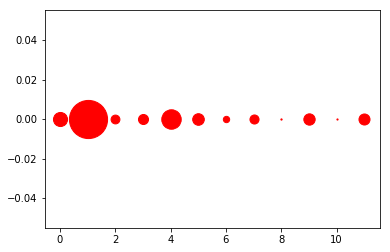

[((10, 0), 28), ((8, 0), 30), ((6, 0), 152), ((2, 0), 212), ((7, 0), 218), ((3, 0), 241), ((11, 0), 265), ((9, 0), 272), ((5, 0), 279), ((0, 0), 338), ((4, 0), 467), ((1, 0), 916)]
1496


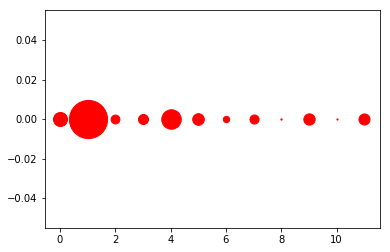

[((10, 0), 28), ((8, 0), 30), ((6, 0), 152), ((2, 0), 212), ((7, 0), 218), ((3, 0), 241), ((11, 0), 265), ((9, 0), 272), ((5, 0), 279), ((0, 0), 337), ((4, 0), 468), ((1, 0), 916)]
1497


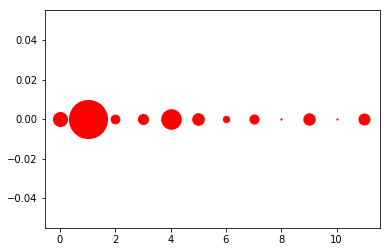

[((10, 0), 28), ((8, 0), 30), ((6, 0), 152), ((2, 0), 212), ((7, 0), 218), ((3, 0), 241), ((11, 0), 264), ((9, 0), 273), ((5, 0), 279), ((0, 0), 337), ((4, 0), 469), ((1, 0), 915)]
1498


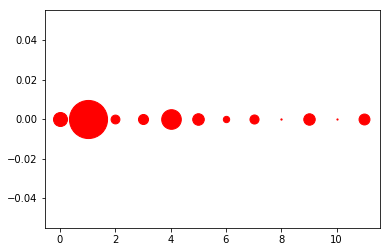

[((10, 0), 28), ((8, 0), 30), ((6, 0), 152), ((2, 0), 212), ((7, 0), 218), ((3, 0), 241), ((11, 0), 262), ((9, 0), 275), ((5, 0), 278), ((0, 0), 336), ((4, 0), 471), ((1, 0), 915)]
1499


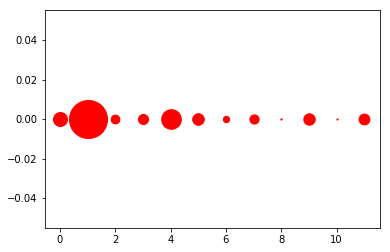

[((10, 0), 28), ((8, 0), 30), ((6, 0), 152), ((2, 0), 211), ((7, 0), 221), ((3, 0), 242), ((11, 0), 260), ((9, 0), 274), ((5, 0), 278), ((0, 0), 336), ((4, 0), 471), ((1, 0), 915)]
1500


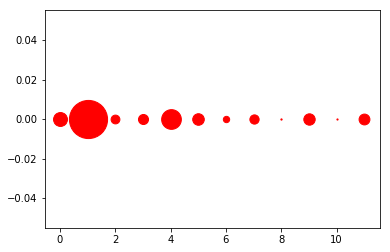

[((10, 0), 28), ((8, 0), 30), ((6, 0), 152), ((2, 0), 211), ((7, 0), 222), ((3, 0), 241), ((11, 0), 260), ((9, 0), 273), ((5, 0), 278), ((0, 0), 334), ((4, 0), 473), ((1, 0), 916)]
1501


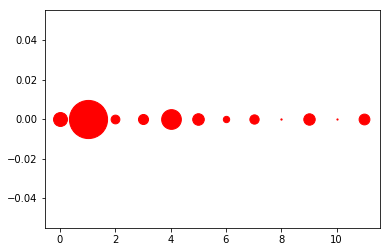

[((10, 0), 28), ((8, 0), 30), ((6, 0), 152), ((2, 0), 210), ((7, 0), 223), ((3, 0), 241), ((11, 0), 259), ((9, 0), 274), ((5, 0), 278), ((0, 0), 334), ((4, 0), 473), ((1, 0), 916)]
1502


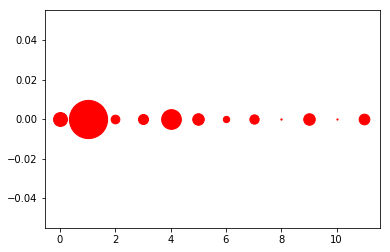

[((10, 0), 28), ((8, 0), 30), ((6, 0), 152), ((2, 0), 209), ((7, 0), 223), ((3, 0), 241), ((11, 0), 257), ((5, 0), 277), ((9, 0), 277), ((0, 0), 334), ((4, 0), 473), ((1, 0), 917)]
1503


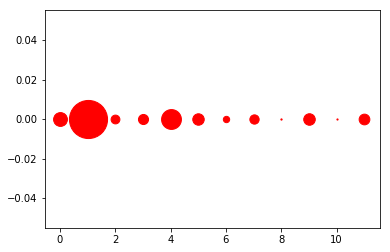

[((10, 0), 28), ((8, 0), 30), ((6, 0), 152), ((2, 0), 211), ((7, 0), 223), ((3, 0), 242), ((11, 0), 257), ((5, 0), 275), ((9, 0), 277), ((0, 0), 332), ((4, 0), 476), ((1, 0), 915)]
1504


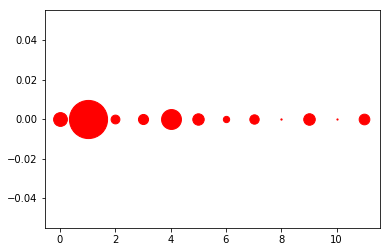

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 211), ((7, 0), 225), ((3, 0), 242), ((11, 0), 256), ((5, 0), 274), ((9, 0), 277), ((0, 0), 331), ((4, 0), 477), ((1, 0), 916)]
1505


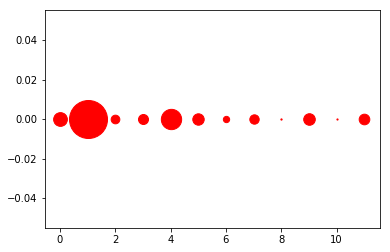

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 208), ((7, 0), 225), ((3, 0), 240), ((11, 0), 255), ((5, 0), 274), ((9, 0), 278), ((0, 0), 330), ((4, 0), 487), ((1, 0), 912)]
1506


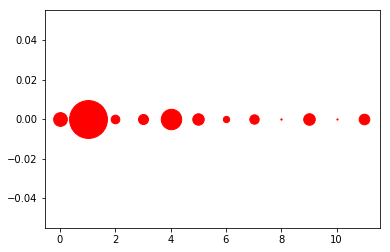

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 208), ((7, 0), 225), ((3, 0), 240), ((11, 0), 255), ((5, 0), 275), ((9, 0), 278), ((0, 0), 329), ((4, 0), 490), ((1, 0), 909)]
1507


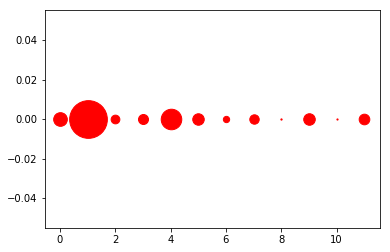

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 209), ((7, 0), 226), ((3, 0), 240), ((11, 0), 255), ((5, 0), 276), ((9, 0), 277), ((0, 0), 328), ((4, 0), 493), ((1, 0), 905)]
1508


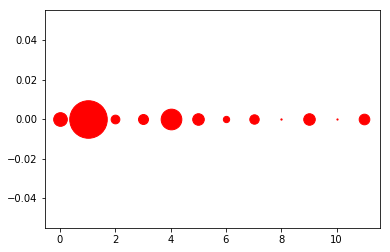

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 209), ((7, 0), 226), ((3, 0), 239), ((11, 0), 255), ((9, 0), 277), ((5, 0), 278), ((0, 0), 328), ((4, 0), 496), ((1, 0), 901)]
1509


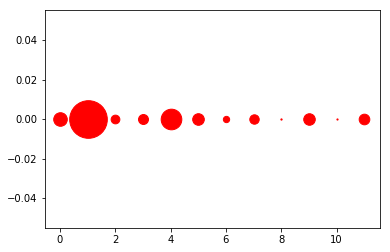

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 209), ((7, 0), 226), ((3, 0), 239), ((11, 0), 255), ((9, 0), 277), ((5, 0), 279), ((0, 0), 326), ((4, 0), 495), ((1, 0), 903)]
1510


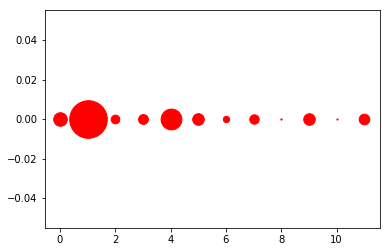

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 209), ((7, 0), 226), ((3, 0), 236), ((11, 0), 255), ((9, 0), 277), ((5, 0), 279), ((0, 0), 326), ((4, 0), 499), ((1, 0), 902)]
1511


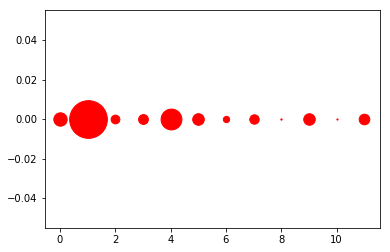

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 210), ((7, 0), 226), ((3, 0), 236), ((11, 0), 255), ((9, 0), 277), ((5, 0), 279), ((0, 0), 321), ((4, 0), 500), ((1, 0), 905)]
1512


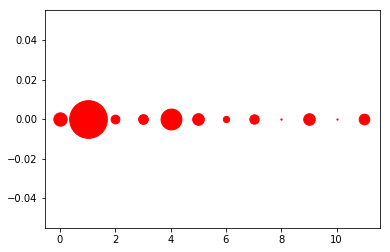

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 211), ((7, 0), 225), ((3, 0), 234), ((11, 0), 255), ((9, 0), 278), ((5, 0), 280), ((0, 0), 320), ((4, 0), 501), ((1, 0), 905)]
1513


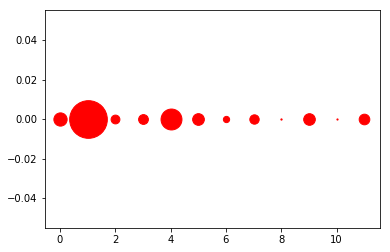

[((10, 0), 28), ((8, 0), 30), ((6, 0), 150), ((2, 0), 211), ((7, 0), 225), ((3, 0), 235), ((11, 0), 255), ((9, 0), 279), ((5, 0), 281), ((0, 0), 318), ((4, 0), 502), ((1, 0), 904)]
1514


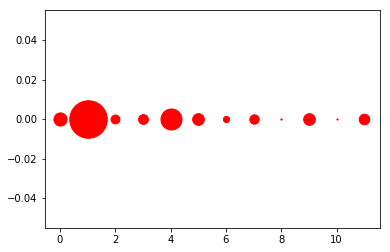

[((10, 0), 28), ((8, 0), 30), ((6, 0), 150), ((2, 0), 213), ((7, 0), 225), ((3, 0), 236), ((11, 0), 254), ((9, 0), 280), ((5, 0), 281), ((0, 0), 316), ((4, 0), 505), ((1, 0), 900)]
1515


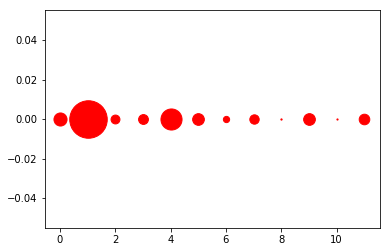

[((10, 0), 28), ((8, 0), 30), ((6, 0), 150), ((2, 0), 213), ((7, 0), 225), ((3, 0), 236), ((11, 0), 254), ((5, 0), 281), ((9, 0), 281), ((0, 0), 314), ((4, 0), 506), ((1, 0), 900)]
1516


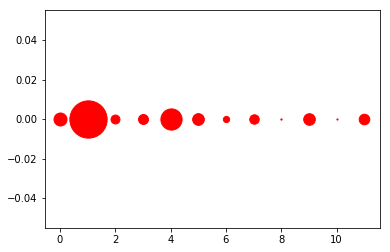

[((10, 0), 28), ((8, 0), 30), ((6, 0), 150), ((2, 0), 214), ((7, 0), 227), ((3, 0), 239), ((11, 0), 254), ((9, 0), 279), ((5, 0), 281), ((0, 0), 312), ((4, 0), 509), ((1, 0), 895)]
1517


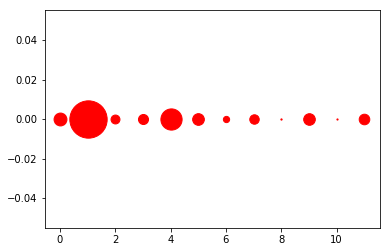

[((10, 0), 28), ((8, 0), 30), ((6, 0), 150), ((2, 0), 214), ((7, 0), 227), ((3, 0), 241), ((11, 0), 254), ((9, 0), 279), ((5, 0), 281), ((0, 0), 309), ((4, 0), 509), ((1, 0), 896)]
1518


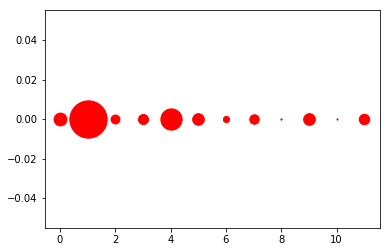

[((10, 0), 28), ((8, 0), 30), ((6, 0), 150), ((2, 0), 214), ((7, 0), 227), ((3, 0), 242), ((11, 0), 252), ((5, 0), 280), ((9, 0), 281), ((0, 0), 308), ((4, 0), 510), ((1, 0), 896)]
1519


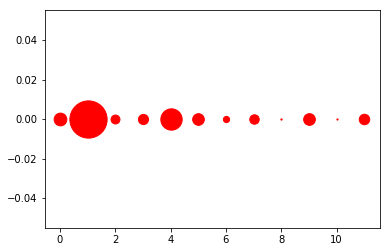

[((10, 0), 28), ((8, 0), 30), ((6, 0), 150), ((2, 0), 214), ((7, 0), 227), ((3, 0), 244), ((11, 0), 252), ((5, 0), 280), ((9, 0), 281), ((0, 0), 306), ((4, 0), 512), ((1, 0), 894)]
1520


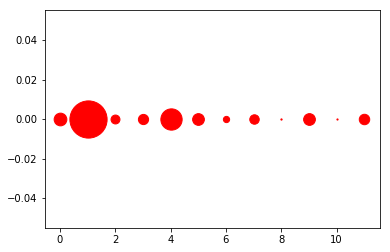

[((10, 0), 28), ((8, 0), 30), ((6, 0), 150), ((2, 0), 214), ((7, 0), 227), ((3, 0), 245), ((11, 0), 251), ((5, 0), 282), ((9, 0), 282), ((0, 0), 305), ((4, 0), 511), ((1, 0), 893)]
1521


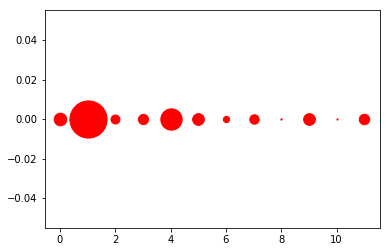

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 215), ((7, 0), 226), ((3, 0), 245), ((11, 0), 251), ((5, 0), 282), ((9, 0), 282), ((0, 0), 303), ((4, 0), 512), ((1, 0), 893)]
1522


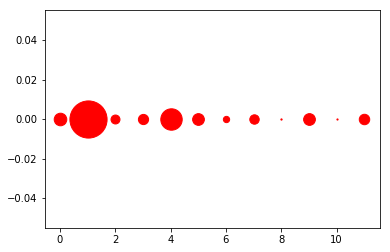

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 215), ((7, 0), 226), ((3, 0), 245), ((11, 0), 251), ((5, 0), 282), ((9, 0), 282), ((0, 0), 302), ((4, 0), 514), ((1, 0), 892)]
1523


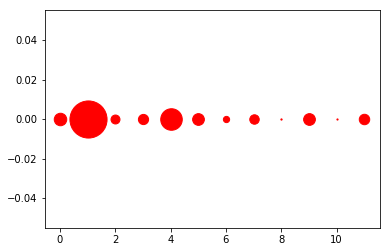

[((10, 0), 28), ((8, 0), 30), ((6, 0), 150), ((2, 0), 215), ((7, 0), 227), ((3, 0), 245), ((11, 0), 251), ((5, 0), 282), ((9, 0), 282), ((0, 0), 300), ((4, 0), 517), ((1, 0), 891)]
1524


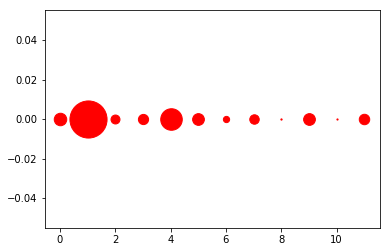

[((10, 0), 28), ((8, 0), 30), ((6, 0), 150), ((2, 0), 215), ((7, 0), 227), ((3, 0), 245), ((11, 0), 251), ((5, 0), 282), ((9, 0), 282), ((0, 0), 300), ((4, 0), 517), ((1, 0), 891)]
1525


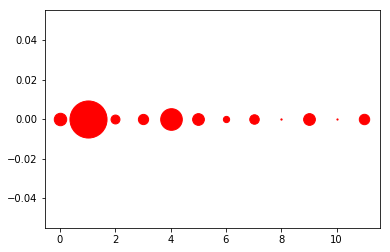

[((10, 0), 28), ((8, 0), 30), ((6, 0), 150), ((2, 0), 214), ((7, 0), 228), ((3, 0), 246), ((11, 0), 250), ((5, 0), 282), ((9, 0), 282), ((0, 0), 299), ((4, 0), 519), ((1, 0), 890)]
1526


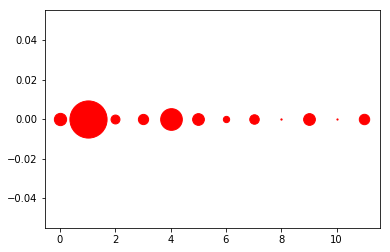

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 214), ((7, 0), 228), ((3, 0), 246), ((11, 0), 250), ((5, 0), 282), ((9, 0), 282), ((0, 0), 295), ((4, 0), 520), ((1, 0), 892)]
1527


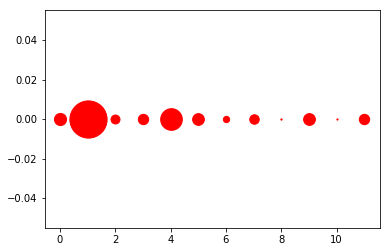

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 215), ((7, 0), 228), ((11, 0), 249), ((3, 0), 249), ((5, 0), 282), ((9, 0), 283), ((0, 0), 291), ((4, 0), 519), ((1, 0), 893)]
1528


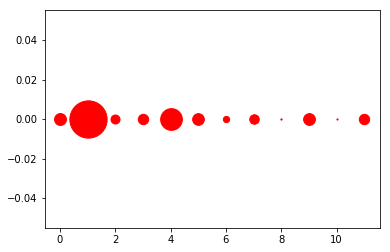

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 216), ((7, 0), 228), ((11, 0), 249), ((3, 0), 250), ((5, 0), 281), ((9, 0), 283), ((0, 0), 286), ((4, 0), 521), ((1, 0), 895)]
1529


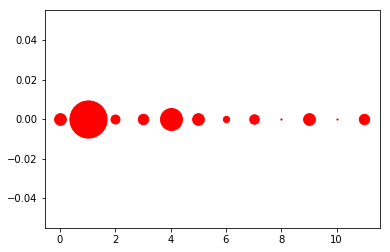

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 216), ((7, 0), 228), ((11, 0), 249), ((3, 0), 251), ((5, 0), 281), ((0, 0), 282), ((9, 0), 283), ((4, 0), 527), ((1, 0), 892)]
1530


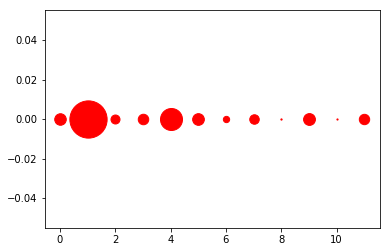

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 216), ((7, 0), 228), ((11, 0), 249), ((3, 0), 252), ((0, 0), 277), ((5, 0), 281), ((9, 0), 284), ((4, 0), 528), ((1, 0), 894)]
1531


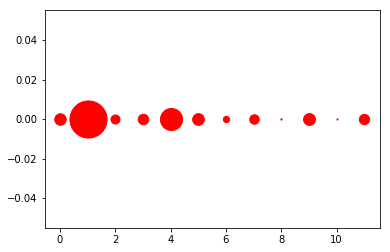

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 217), ((7, 0), 228), ((11, 0), 248), ((3, 0), 253), ((0, 0), 276), ((5, 0), 281), ((9, 0), 285), ((4, 0), 530), ((1, 0), 891)]
1532


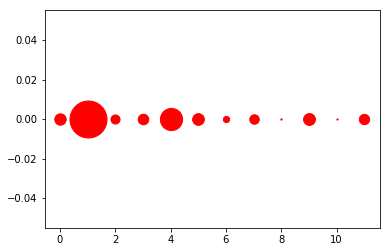

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 218), ((7, 0), 228), ((11, 0), 248), ((3, 0), 254), ((0, 0), 274), ((5, 0), 281), ((9, 0), 285), ((4, 0), 533), ((1, 0), 888)]
1533


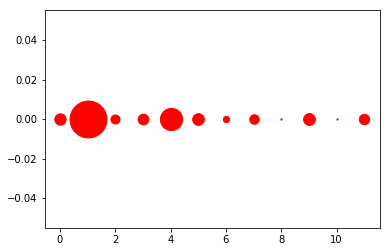

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 218), ((7, 0), 228), ((11, 0), 248), ((3, 0), 257), ((0, 0), 273), ((5, 0), 281), ((9, 0), 285), ((4, 0), 533), ((1, 0), 886)]
1534


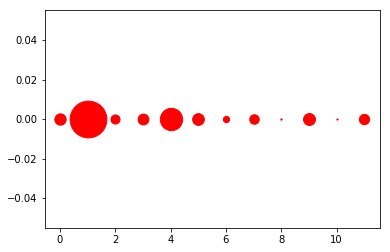

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 218), ((7, 0), 228), ((11, 0), 247), ((3, 0), 260), ((0, 0), 272), ((5, 0), 281), ((9, 0), 286), ((4, 0), 535), ((1, 0), 882)]
1535


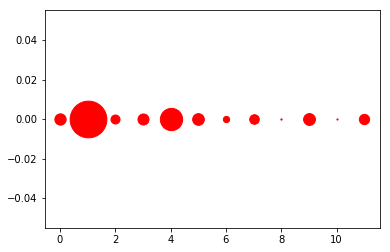

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 216), ((7, 0), 230), ((11, 0), 247), ((3, 0), 265), ((0, 0), 271), ((5, 0), 281), ((9, 0), 284), ((4, 0), 534), ((1, 0), 881)]
1536


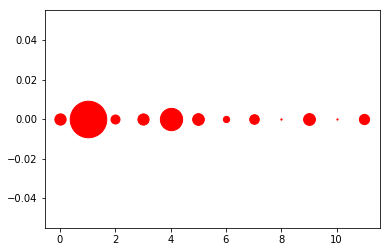

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 216), ((7, 0), 231), ((11, 0), 246), ((3, 0), 269), ((0, 0), 271), ((5, 0), 281), ((9, 0), 284), ((4, 0), 534), ((1, 0), 877)]
1537


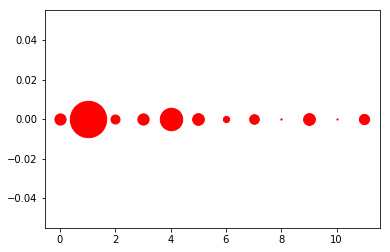

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 217), ((7, 0), 231), ((11, 0), 246), ((0, 0), 269), ((3, 0), 270), ((5, 0), 281), ((9, 0), 284), ((4, 0), 538), ((1, 0), 873)]
1538


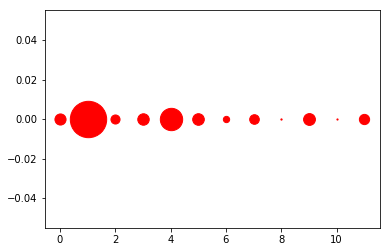

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 218), ((7, 0), 231), ((11, 0), 246), ((0, 0), 267), ((3, 0), 275), ((5, 0), 279), ((9, 0), 284), ((4, 0), 536), ((1, 0), 873)]
1539


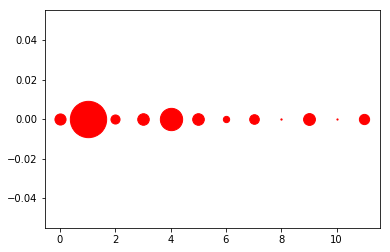

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 218), ((7, 0), 231), ((11, 0), 246), ((0, 0), 267), ((3, 0), 277), ((5, 0), 279), ((9, 0), 284), ((4, 0), 535), ((1, 0), 872)]
1540


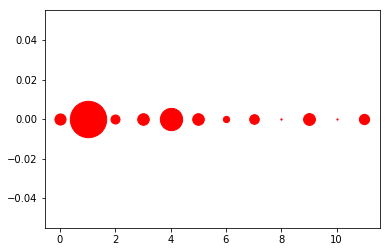

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 217), ((7, 0), 231), ((11, 0), 246), ((0, 0), 267), ((3, 0), 278), ((5, 0), 279), ((9, 0), 284), ((4, 0), 534), ((1, 0), 873)]
1541


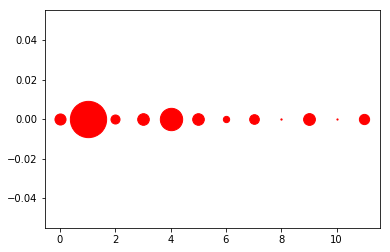

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 217), ((7, 0), 232), ((11, 0), 246), ((0, 0), 266), ((5, 0), 279), ((3, 0), 279), ((9, 0), 283), ((4, 0), 536), ((1, 0), 871)]
1542


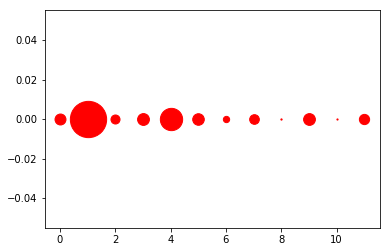

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 217), ((7, 0), 232), ((11, 0), 246), ((0, 0), 263), ((5, 0), 278), ((9, 0), 283), ((3, 0), 284), ((4, 0), 535), ((1, 0), 871)]
1543


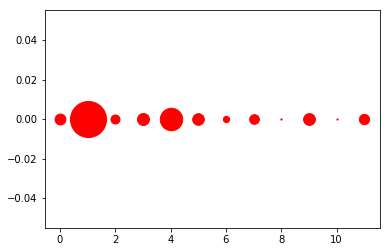

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 217), ((7, 0), 232), ((11, 0), 246), ((0, 0), 261), ((5, 0), 279), ((9, 0), 283), ((3, 0), 288), ((4, 0), 538), ((1, 0), 865)]
1544


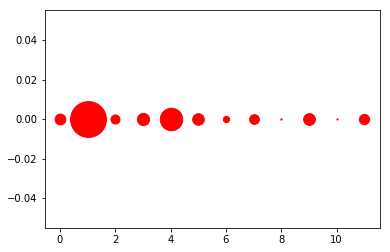

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 217), ((7, 0), 233), ((11, 0), 246), ((0, 0), 260), ((5, 0), 278), ((9, 0), 282), ((3, 0), 293), ((4, 0), 539), ((1, 0), 861)]
1545


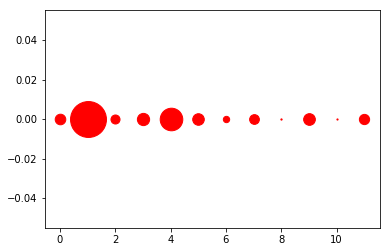

[((10, 0), 28), ((8, 0), 30), ((6, 0), 152), ((2, 0), 217), ((7, 0), 234), ((11, 0), 246), ((0, 0), 254), ((5, 0), 278), ((9, 0), 281), ((3, 0), 294), ((4, 0), 542), ((1, 0), 862)]
1546


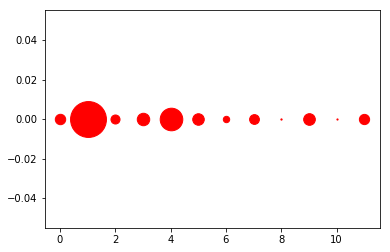

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 217), ((7, 0), 235), ((11, 0), 246), ((0, 0), 250), ((5, 0), 277), ((9, 0), 280), ((3, 0), 299), ((4, 0), 542), ((1, 0), 861)]
1547


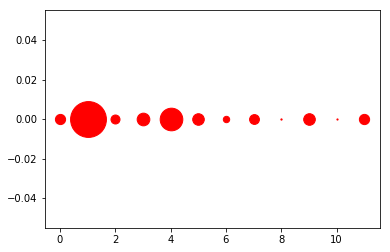

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 216), ((7, 0), 236), ((0, 0), 245), ((11, 0), 246), ((5, 0), 278), ((9, 0), 279), ((3, 0), 304), ((4, 0), 543), ((1, 0), 860)]
1548


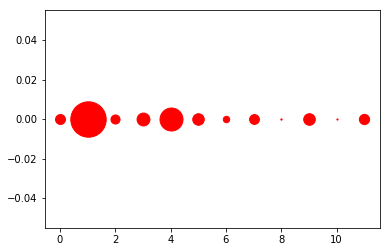

[((10, 0), 28), ((8, 0), 30), ((6, 0), 154), ((2, 0), 218), ((7, 0), 236), ((0, 0), 239), ((11, 0), 246), ((5, 0), 277), ((9, 0), 279), ((3, 0), 309), ((4, 0), 552), ((1, 0), 850)]
1549


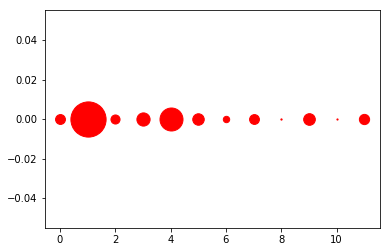

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 218), ((7, 0), 236), ((0, 0), 237), ((11, 0), 246), ((5, 0), 276), ((9, 0), 280), ((3, 0), 317), ((4, 0), 552), ((1, 0), 845)]
1550


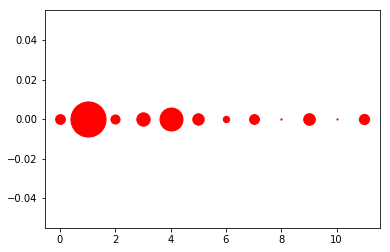

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 219), ((0, 0), 235), ((7, 0), 236), ((11, 0), 246), ((5, 0), 275), ((9, 0), 280), ((3, 0), 321), ((4, 0), 552), ((1, 0), 843)]
1551


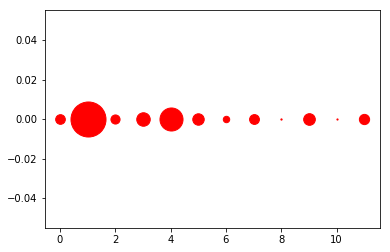

[((10, 0), 28), ((8, 0), 30), ((6, 0), 154), ((2, 0), 219), ((0, 0), 232), ((7, 0), 236), ((11, 0), 246), ((5, 0), 275), ((9, 0), 280), ((3, 0), 324), ((4, 0), 553), ((1, 0), 841)]
1552


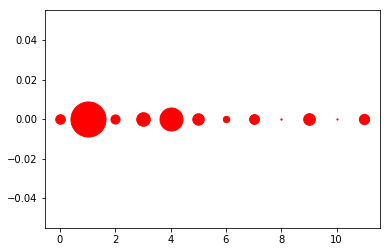

[((10, 0), 28), ((8, 0), 30), ((6, 0), 154), ((2, 0), 219), ((0, 0), 230), ((7, 0), 236), ((11, 0), 246), ((5, 0), 275), ((9, 0), 280), ((3, 0), 326), ((4, 0), 552), ((1, 0), 842)]
1553


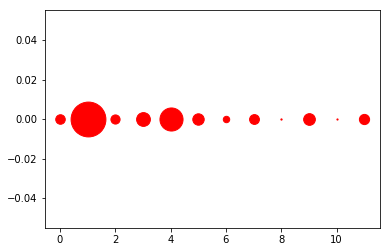

[((10, 0), 28), ((8, 0), 30), ((6, 0), 154), ((2, 0), 220), ((0, 0), 229), ((7, 0), 236), ((11, 0), 245), ((5, 0), 274), ((9, 0), 281), ((3, 0), 331), ((4, 0), 554), ((1, 0), 836)]
1554


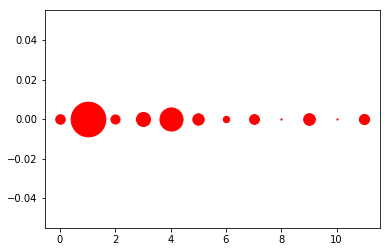

[((10, 0), 28), ((8, 0), 30), ((6, 0), 154), ((2, 0), 219), ((0, 0), 228), ((7, 0), 236), ((11, 0), 245), ((5, 0), 273), ((9, 0), 281), ((3, 0), 337), ((4, 0), 555), ((1, 0), 832)]
1555


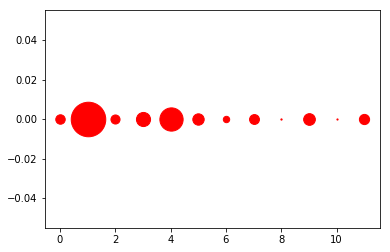

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((2, 0), 218), ((0, 0), 227), ((7, 0), 237), ((11, 0), 245), ((5, 0), 273), ((9, 0), 281), ((3, 0), 339), ((4, 0), 558), ((1, 0), 829)]
1556


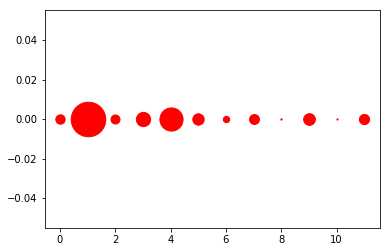

[((10, 0), 28), ((8, 0), 30), ((6, 0), 152), ((2, 0), 217), ((0, 0), 225), ((7, 0), 238), ((11, 0), 245), ((5, 0), 273), ((9, 0), 281), ((3, 0), 343), ((4, 0), 556), ((1, 0), 830)]
1557


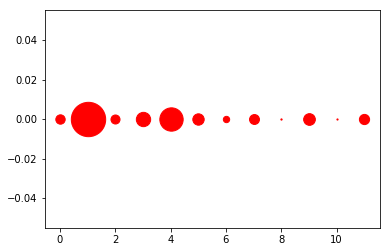

[((10, 0), 28), ((8, 0), 30), ((6, 0), 152), ((2, 0), 217), ((0, 0), 225), ((7, 0), 238), ((11, 0), 245), ((5, 0), 273), ((9, 0), 281), ((3, 0), 344), ((4, 0), 560), ((1, 0), 825)]
1558


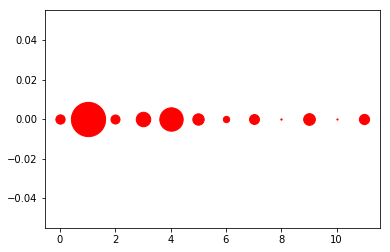

[((10, 0), 28), ((8, 0), 30), ((6, 0), 152), ((2, 0), 217), ((0, 0), 223), ((7, 0), 238), ((11, 0), 245), ((5, 0), 273), ((9, 0), 281), ((3, 0), 348), ((4, 0), 561), ((1, 0), 822)]
1559


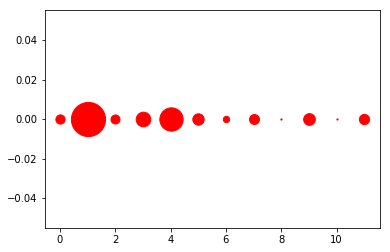

[((10, 0), 28), ((8, 0), 30), ((6, 0), 152), ((2, 0), 217), ((0, 0), 222), ((7, 0), 238), ((11, 0), 245), ((5, 0), 273), ((9, 0), 281), ((3, 0), 352), ((4, 0), 560), ((1, 0), 820)]
1560


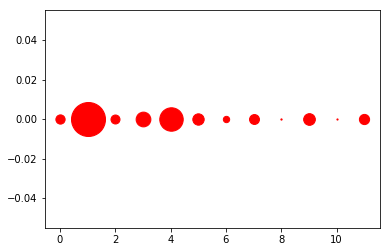

[((10, 0), 28), ((8, 0), 30), ((6, 0), 152), ((2, 0), 216), ((0, 0), 222), ((7, 0), 238), ((11, 0), 245), ((5, 0), 273), ((9, 0), 281), ((3, 0), 354), ((4, 0), 563), ((1, 0), 816)]
1561


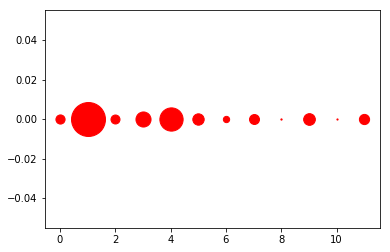

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 216), ((0, 0), 220), ((7, 0), 239), ((11, 0), 245), ((5, 0), 273), ((9, 0), 281), ((3, 0), 362), ((4, 0), 558), ((1, 0), 815)]
1562


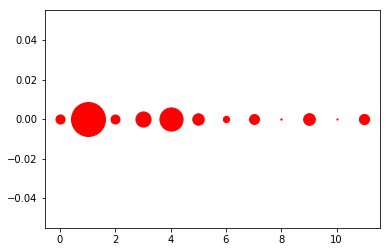

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 216), ((0, 0), 219), ((7, 0), 239), ((11, 0), 245), ((5, 0), 274), ((9, 0), 281), ((3, 0), 364), ((4, 0), 556), ((1, 0), 815)]
1563


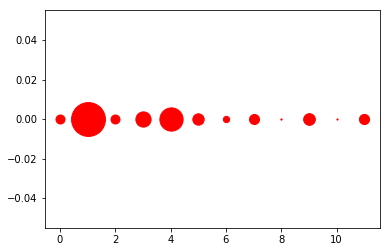

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 216), ((0, 0), 217), ((7, 0), 241), ((11, 0), 244), ((5, 0), 273), ((9, 0), 281), ((3, 0), 366), ((4, 0), 558), ((1, 0), 813)]
1564


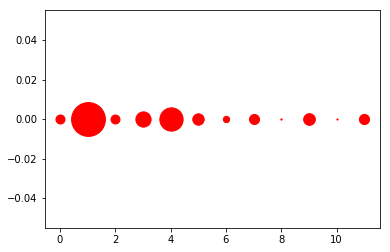

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 215), ((0, 0), 217), ((7, 0), 241), ((11, 0), 244), ((5, 0), 274), ((9, 0), 281), ((3, 0), 366), ((4, 0), 559), ((1, 0), 812)]
1565


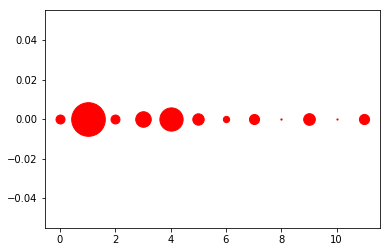

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 215), ((0, 0), 216), ((7, 0), 242), ((11, 0), 244), ((5, 0), 274), ((9, 0), 280), ((3, 0), 373), ((4, 0), 558), ((1, 0), 807)]
1566


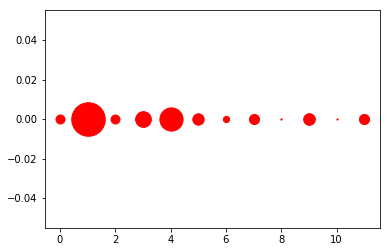

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((2, 0), 215), ((0, 0), 216), ((7, 0), 242), ((11, 0), 244), ((5, 0), 273), ((9, 0), 280), ((3, 0), 377), ((4, 0), 557), ((1, 0), 805)]
1567


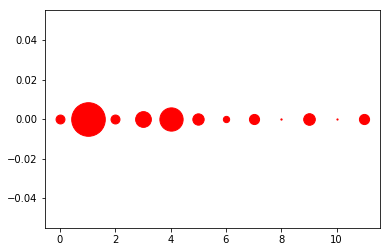

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((0, 0), 214), ((2, 0), 215), ((7, 0), 243), ((11, 0), 244), ((5, 0), 272), ((9, 0), 279), ((3, 0), 378), ((4, 0), 558), ((1, 0), 806)]
1568


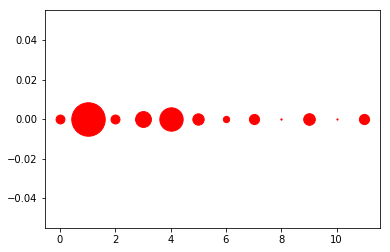

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((0, 0), 213), ((2, 0), 215), ((7, 0), 243), ((11, 0), 244), ((5, 0), 272), ((9, 0), 279), ((3, 0), 380), ((4, 0), 560), ((1, 0), 803)]
1569


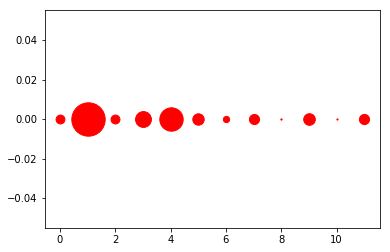

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((0, 0), 213), ((2, 0), 214), ((7, 0), 243), ((11, 0), 244), ((5, 0), 274), ((9, 0), 279), ((3, 0), 380), ((4, 0), 561), ((1, 0), 801)]
1570


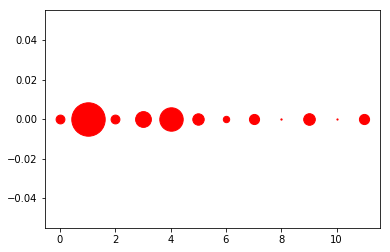

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((0, 0), 212), ((2, 0), 212), ((7, 0), 243), ((11, 0), 244), ((5, 0), 274), ((9, 0), 279), ((3, 0), 379), ((4, 0), 562), ((1, 0), 802)]
1571


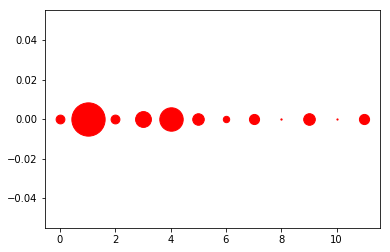

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((0, 0), 211), ((2, 0), 212), ((7, 0), 243), ((11, 0), 244), ((5, 0), 277), ((9, 0), 279), ((3, 0), 380), ((4, 0), 562), ((1, 0), 799)]
1572


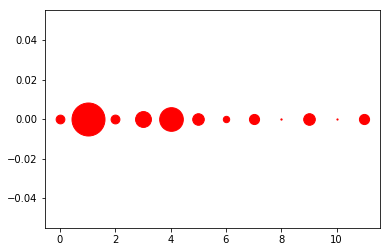

[((10, 0), 28), ((8, 0), 30), ((6, 0), 153), ((0, 0), 210), ((2, 0), 212), ((7, 0), 243), ((11, 0), 244), ((5, 0), 278), ((9, 0), 279), ((3, 0), 381), ((4, 0), 568), ((1, 0), 792)]
1573


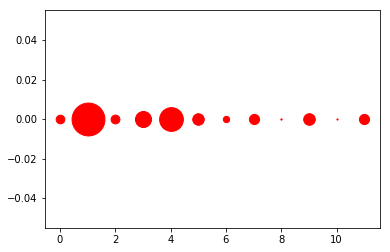

[((10, 0), 28), ((8, 0), 30), ((6, 0), 152), ((0, 0), 208), ((2, 0), 212), ((11, 0), 244), ((7, 0), 244), ((5, 0), 277), ((9, 0), 279), ((3, 0), 385), ((4, 0), 570), ((1, 0), 789)]
1574


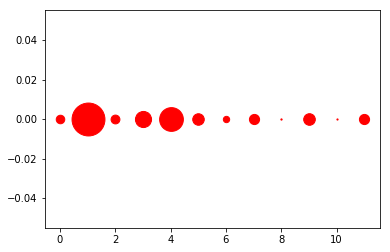

[((10, 0), 28), ((8, 0), 30), ((6, 0), 152), ((0, 0), 205), ((2, 0), 212), ((11, 0), 244), ((7, 0), 244), ((5, 0), 277), ((9, 0), 279), ((3, 0), 387), ((4, 0), 570), ((1, 0), 790)]
1575


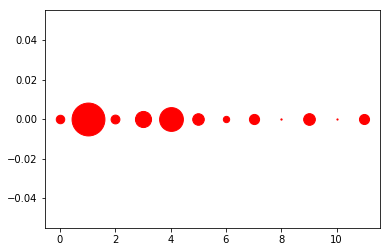

[((10, 0), 28), ((8, 0), 30), ((6, 0), 152), ((0, 0), 204), ((2, 0), 212), ((11, 0), 242), ((7, 0), 244), ((5, 0), 278), ((9, 0), 281), ((3, 0), 387), ((4, 0), 571), ((1, 0), 789)]
1576


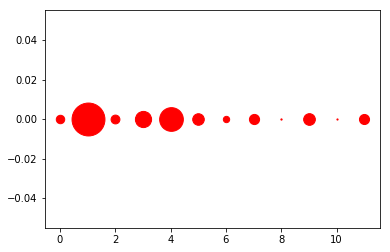

[((10, 0), 28), ((8, 0), 30), ((6, 0), 152), ((0, 0), 203), ((2, 0), 212), ((11, 0), 242), ((7, 0), 244), ((5, 0), 278), ((9, 0), 281), ((3, 0), 389), ((4, 0), 569), ((1, 0), 790)]
1577


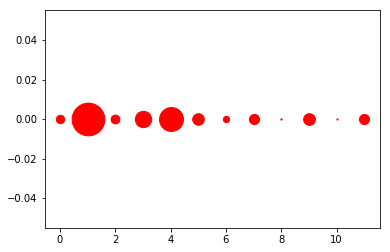

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((0, 0), 201), ((2, 0), 211), ((11, 0), 242), ((7, 0), 244), ((5, 0), 278), ((9, 0), 282), ((3, 0), 392), ((4, 0), 574), ((1, 0), 785)]
1578


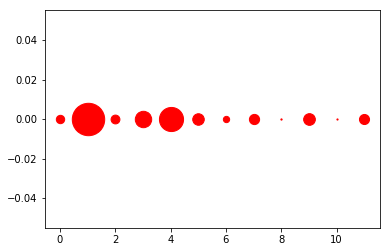

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((0, 0), 201), ((2, 0), 212), ((11, 0), 242), ((7, 0), 245), ((5, 0), 277), ((9, 0), 281), ((3, 0), 394), ((4, 0), 579), ((1, 0), 778)]
1579


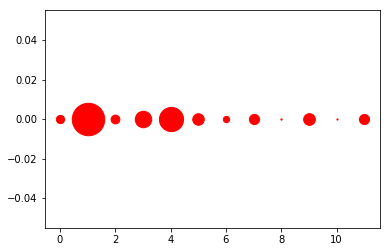

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((0, 0), 198), ((2, 0), 211), ((11, 0), 242), ((7, 0), 245), ((5, 0), 277), ((9, 0), 281), ((3, 0), 396), ((4, 0), 580), ((1, 0), 779)]
1580


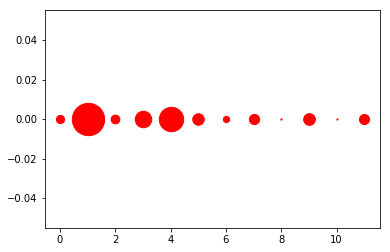

[((10, 0), 28), ((8, 0), 30), ((6, 0), 151), ((0, 0), 196), ((2, 0), 211), ((11, 0), 242), ((7, 0), 245), ((5, 0), 277), ((9, 0), 281), ((3, 0), 396), ((4, 0), 585), ((1, 0), 776)]
1581


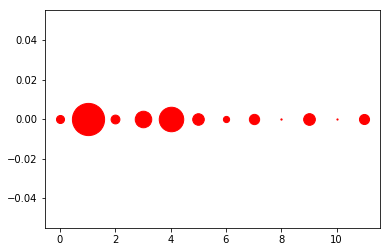

[((10, 0), 28), ((8, 0), 30), ((6, 0), 149), ((0, 0), 193), ((2, 0), 212), ((11, 0), 242), ((7, 0), 247), ((5, 0), 278), ((9, 0), 281), ((3, 0), 397), ((4, 0), 588), ((1, 0), 773)]
1582


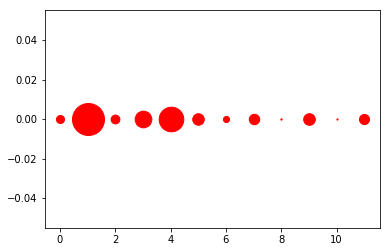

[((10, 0), 28), ((8, 0), 30), ((6, 0), 147), ((0, 0), 193), ((2, 0), 212), ((11, 0), 242), ((7, 0), 250), ((5, 0), 277), ((9, 0), 280), ((3, 0), 400), ((4, 0), 591), ((1, 0), 768)]
1583


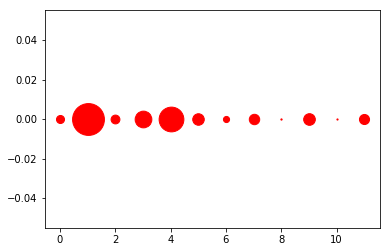

[((10, 0), 28), ((8, 0), 30), ((6, 0), 147), ((0, 0), 193), ((2, 0), 212), ((11, 0), 242), ((7, 0), 250), ((5, 0), 277), ((9, 0), 280), ((3, 0), 401), ((4, 0), 594), ((1, 0), 764)]
1584


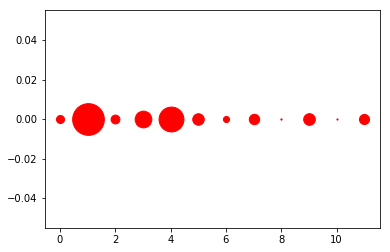

[((10, 0), 28), ((8, 0), 30), ((6, 0), 147), ((0, 0), 193), ((2, 0), 212), ((11, 0), 242), ((7, 0), 250), ((5, 0), 277), ((9, 0), 280), ((3, 0), 401), ((4, 0), 597), ((1, 0), 761)]
1585


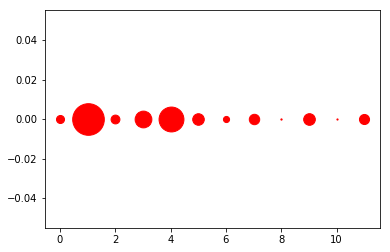

[((10, 0), 28), ((8, 0), 30), ((6, 0), 147), ((0, 0), 193), ((2, 0), 212), ((11, 0), 242), ((7, 0), 250), ((5, 0), 278), ((9, 0), 280), ((3, 0), 402), ((4, 0), 597), ((1, 0), 759)]
1586


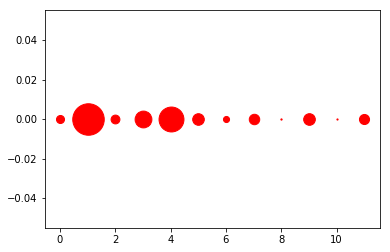

[((10, 0), 28), ((8, 0), 30), ((6, 0), 146), ((0, 0), 193), ((2, 0), 212), ((11, 0), 242), ((7, 0), 251), ((5, 0), 279), ((9, 0), 280), ((3, 0), 403), ((4, 0), 598), ((1, 0), 756)]
1587


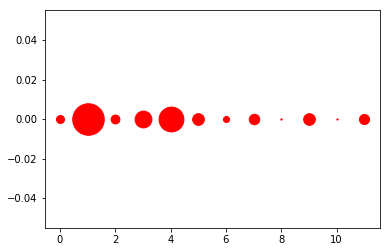

[((10, 0), 28), ((8, 0), 30), ((6, 0), 146), ((0, 0), 192), ((2, 0), 212), ((11, 0), 242), ((7, 0), 251), ((9, 0), 280), ((5, 0), 281), ((3, 0), 403), ((4, 0), 596), ((1, 0), 757)]
1588


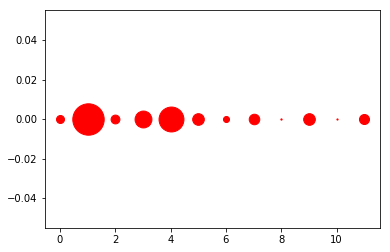

[((10, 0), 28), ((8, 0), 30), ((6, 0), 145), ((0, 0), 192), ((2, 0), 212), ((11, 0), 241), ((7, 0), 253), ((5, 0), 280), ((9, 0), 280), ((3, 0), 405), ((4, 0), 598), ((1, 0), 754)]
1589


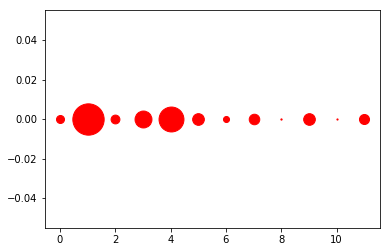

[((10, 0), 28), ((8, 0), 30), ((6, 0), 145), ((0, 0), 192), ((2, 0), 212), ((11, 0), 241), ((7, 0), 253), ((9, 0), 280), ((5, 0), 281), ((3, 0), 406), ((4, 0), 598), ((1, 0), 752)]
1590


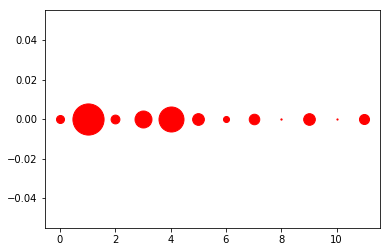

[((10, 0), 28), ((8, 0), 30), ((6, 0), 145), ((0, 0), 192), ((2, 0), 212), ((11, 0), 241), ((7, 0), 253), ((9, 0), 280), ((5, 0), 282), ((3, 0), 407), ((4, 0), 600), ((1, 0), 748)]
1591


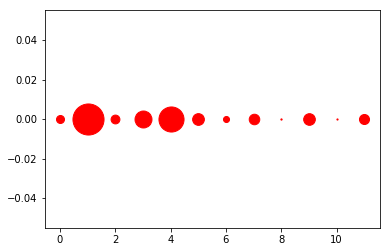

[((10, 0), 28), ((8, 0), 30), ((6, 0), 145), ((0, 0), 192), ((2, 0), 212), ((11, 0), 241), ((7, 0), 253), ((9, 0), 280), ((5, 0), 282), ((3, 0), 407), ((4, 0), 602), ((1, 0), 746)]
1592


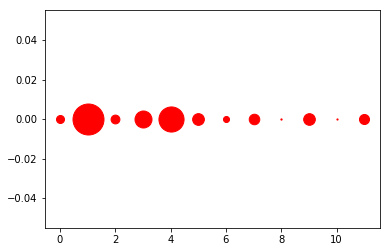

[((10, 0), 28), ((8, 0), 30), ((6, 0), 145), ((0, 0), 192), ((2, 0), 212), ((11, 0), 241), ((7, 0), 253), ((9, 0), 280), ((5, 0), 282), ((3, 0), 408), ((4, 0), 603), ((1, 0), 744)]
1593


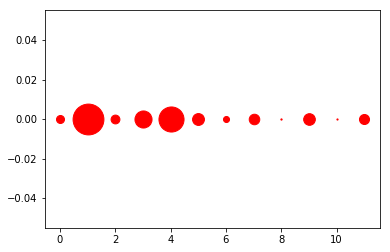

[((10, 0), 28), ((8, 0), 30), ((6, 0), 145), ((0, 0), 192), ((2, 0), 212), ((11, 0), 241), ((7, 0), 253), ((9, 0), 280), ((5, 0), 285), ((3, 0), 410), ((4, 0), 602), ((1, 0), 740)]
1594


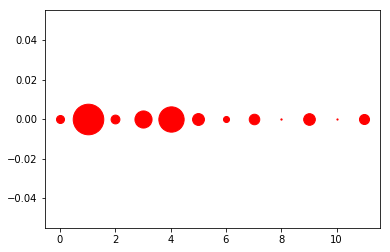

[((10, 0), 28), ((8, 0), 30), ((6, 0), 145), ((0, 0), 192), ((2, 0), 212), ((11, 0), 241), ((7, 0), 253), ((9, 0), 280), ((5, 0), 285), ((3, 0), 411), ((4, 0), 607), ((1, 0), 734)]
1595


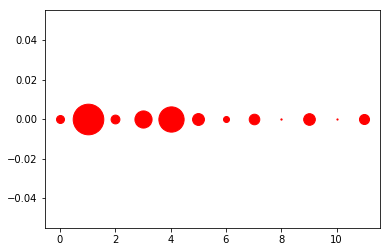

[((10, 0), 28), ((8, 0), 30), ((6, 0), 144), ((0, 0), 191), ((2, 0), 212), ((11, 0), 241), ((7, 0), 254), ((9, 0), 280), ((5, 0), 285), ((3, 0), 412), ((4, 0), 606), ((1, 0), 735)]
1596


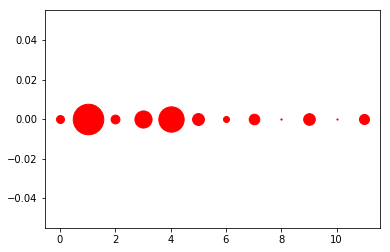

[((10, 0), 28), ((8, 0), 30), ((6, 0), 144), ((0, 0), 191), ((2, 0), 212), ((11, 0), 241), ((7, 0), 254), ((9, 0), 280), ((5, 0), 285), ((3, 0), 412), ((4, 0), 608), ((1, 0), 733)]
1597


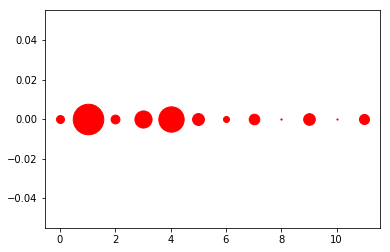

[((10, 0), 28), ((8, 0), 30), ((6, 0), 144), ((0, 0), 191), ((2, 0), 212), ((11, 0), 241), ((7, 0), 254), ((9, 0), 280), ((5, 0), 285), ((3, 0), 412), ((4, 0), 608), ((1, 0), 733)]
1598


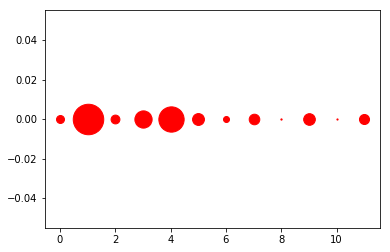

[((10, 0), 28), ((8, 0), 30), ((6, 0), 144), ((0, 0), 191), ((2, 0), 212), ((11, 0), 241), ((7, 0), 254), ((9, 0), 280), ((5, 0), 285), ((3, 0), 414), ((4, 0), 607), ((1, 0), 732)]
1599


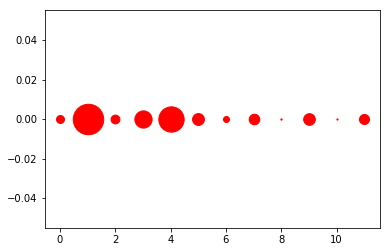

[((10, 0), 28), ((8, 0), 30), ((6, 0), 144), ((0, 0), 191), ((2, 0), 212), ((11, 0), 241), ((7, 0), 254), ((9, 0), 280), ((5, 0), 285), ((3, 0), 414), ((4, 0), 608), ((1, 0), 731)]
1599


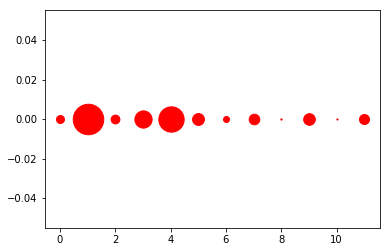

[((10, 0), 28), ((8, 0), 30), ((6, 0), 144), ((0, 0), 191), ((2, 0), 211), ((11, 0), 241), ((7, 0), 254), ((9, 0), 280), ((5, 0), 285), ((3, 0), 414), ((4, 0), 608), ((1, 0), 732)]


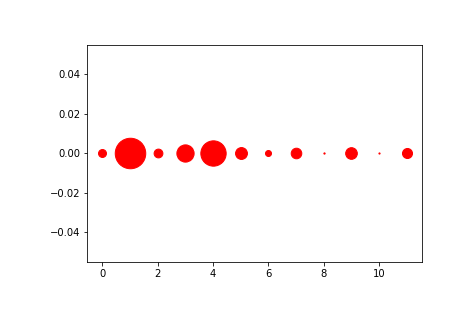

In [5]:
som = SOM(12, 1 , 13, 1600,alpha=0.05, sigma=4)
som.train(datanorm)

I let the network run several times with different configuaration ( different alpha and sigma values, also differend numbers of groups). In the gif you see thet the network first seems unstable, groups jump from left to right and so on. This has to do with the alpha setting. You can look at the alpha setting as a kind of learning rate. When it is to high the network gets unstable not only in the beginning, but also later on several times. Even  when i tried more than 2000 iterations the groups did not get stable. If the sigma is too high the grouop that is the biggest in the beginning is drawing too much data too it, like a black hole. You can see the sigma number as a kjind of attraction force of the groups.
With this configuration i get 12 groups, two of them are smaller than 100, the rest is between 100 and 732. 

Now we have some groups, but the question is are they meaningfull and what do these groups represent. To research that i will extend the inputvectors with a label of the different groups.
I made two methods to examine the groups som.groups_describe(group) and som.group_matrix(group).
You can describe and make a Matrix of one group, below that you can see the matrix of the complete dataset.


I am not a scientist so i cannot say that this groups have scientific value, but you will see that in different groups there are in the matrix nice functions visible that are not visible in the complete dataset.

There is a lot of work to do to know if it is usefull to use neural networks to examine this kind of data. Also it is possible to use other neural networks. But in the framework of this course it will move to far to go into this.


           PmassEU  PradiusEU  PdensityEU    PteqMeanK  PsurfPressEU  \
count    28.000000  28.000000   28.000000    28.000000     28.000000   
mean   2895.524643  11.480714    2.032500   782.460714   9266.835714   
std    2026.785153   0.342928    1.743057   199.210318  15434.180808   
min     489.630000  10.480000    0.370000   341.200000    182.500000   
25%    1662.030000  11.510000    1.045000   703.925000   1733.025000   
50%    2098.405000  11.655000    1.320000   794.550000   2765.350000   
75%    3385.265000  11.680000    2.205000   930.375000   7468.100000   
max    8584.380000  11.680000    7.450000  1200.700000  63949.300000   

            Pmag   PperiodDYS    SmassSU  SradiusSU       SteffK  \
count  28.000000    28.000000  28.000000  28.000000    28.000000   
mean  -27.342143   733.766786   1.773214  28.387143  4400.964286   
std     1.330490   663.236557   0.876627  11.808614   339.644829   
min   -29.340000   121.710000   0.900000  14.100000  3935.000000   
25%   -28.2

/home/leolin/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel_launcher.py:247: FutureWarning: pandas.scatter_matrix is deprecated, use pandas.plotting.scatter_matrix instead
/home/leolin/anaconda3/envs/tensorflow/lib/python3.6/site-packages/pandas/plotting/_misc.py:108: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=10.0, right=10.0
  ax.set_xlim(boundaries_list[j])
/home/leolin/anaconda3/envs/tensorflow/lib/python3.6/site-packages/pandas/plotting/_misc.py:109: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=10.0, top=10.0
  ax.set_ylim(boundaries_list[i])
/home/leolin/anaconda3/envs/tensorflow/lib/python3.6/site-packages/pandas/plotting/_misc.py:100: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=10.0, right=10.0
  ax.set_xlim(boundaries_list[i])


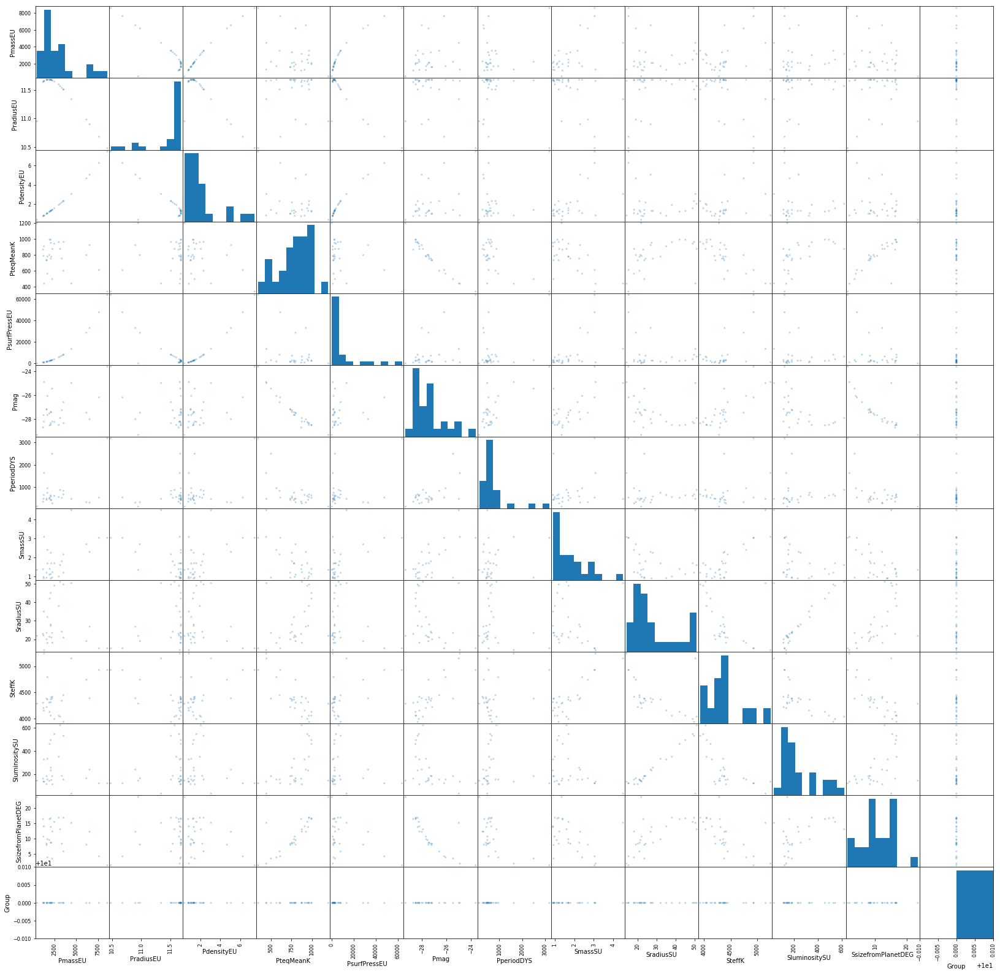

In [6]:
som.group_describe(10)
som.group_matrix(10)



In [ ]:
# this matrix if of the complete dataset.
pd.scatter_matrix(data, alpha = 0.3, figsize = (28,28));

I liked the course very much. Thanks !!!!
